# Separate runs by HKLE due to size limits

# Positions rounded to 1,000

In [1]:
tcgadata="TCGA/focused.1000.T.csv.gz"

In [2]:
gpmpdata="20210604-GPMP-GBM/focused.1000.T.csv.gz"

In [3]:
hkle='SVA_A'

['HERVK113', 'SVA_A', 'SVA_B', 'SVA_C', 'SVA_D', 'SVA_E', 'SVA_F']

Number of insertions detected needed to call insertion present

In [4]:
threshold=3

In [5]:
import numpy as np
np.__version__

'1.20.3'

In [6]:
import pandas as pd
pd.__version__

'1.2.4'

In [7]:
import matplotlib
matplotlib.__version__

'3.4.2'

In [8]:
import matplotlib.pyplot as plt

In [9]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [10]:
import scipy
scipy.__version__

'1.6.3'

In [11]:
from scipy import stats

In [12]:
import seaborn as sns
sns.__version__

'0.11.1'

In [13]:
from datetime import datetime

In [14]:
import sklearn
sklearn.__version__

'0.24.2'

In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [16]:
default_max_columns=pd.get_option('display.max_columns')

In [17]:
default_max_rows=pd.get_option('display.max_rows')

In [18]:
default_precision=pd.get_option('display.precision')

In [19]:
pd.set_option('display.precision', 2)

In [20]:
#default_threshold=np.get_printoptions()['threshold']

In [21]:
#np.set_printoptions(threshold=10000000)

# Read Metadata 1

In [22]:
mt1=pd.read_csv("TCGA/metadata.cart.TCGA.GBM-LGG.WGS.bam.2020-07-17.csv",header=None,
 names=['submitter','days_to_death','gender','disease_type','center_name'])

In [23]:
mt1.shape

(127, 5)

In [24]:
mt1.rename(columns={"submitter": "subject"},inplace=True)
mt1.rename(columns={"gender": "gender1"},inplace=True)

In [25]:
mt1 #.head()

,subject,days_to_death,gender1,disease_type,center_name
0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
...,...,...,...,...,...
122,IK-7675,578.0,male,Brain Lower Grade Glioma,Broad Institute of MIT and Harvard
123,TM-A7CF,NaN,female,Brain Lower Grade Glioma,Broad Institute of MIT and Harvard
124,TQ-A7RK,NaN,male,Brain Lower Grade Glioma,Broad Institute of MIT and Harvard
125,TQ-A7RV,NaN,male,Brain Lower Grade Glioma,Broad Institute of MIT and Harvard


In [26]:
list(mt1)

['subject', 'days_to_death', 'gender1', 'disease_type', 'center_name']

# Read Metadata 2

In [27]:
mt2=pd.read_csv("TCGA/TCGA.Glioma.metadata.tsv",sep="\t")

In [28]:
mt2.shape

(1114, 18)

In [29]:
mt2.head()

,case_submitter_id,project_id,primary_diagnosis,race,ethnicity,gender,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,WHO_groups,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status
0,TCGA-02-0001,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,44.0,11.76,1.0
1,TCGA-02-0003,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,50.0,4.73,1.0
2,TCGA-02-0004,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,NaN,NaN,IDH-WT:1p19q-NA,NaN,IDH-WT:1p19q-NA:TERT-NA,MD Anderson Cancer Center,NaN,59.0,11.33,1.0
3,TCGA-02-0006,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,56.0,18.33,1.0
4,TCGA-02-0007,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,40.0,23.16,1.0


In [30]:
list(mt2)

['case_submitter_id',
 'project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status']

In [31]:
mt2['subject']=mt2['case_submitter_id'].astype(str).str[5:12]

In [32]:
mt2[['subject','case_submitter_id']].head()

,subject,case_submitter_id
0,02-0001,TCGA-02-0001
1,02-0003,TCGA-02-0003
2,02-0004,TCGA-02-0004
3,02-0006,TCGA-02-0006
4,02-0007,TCGA-02-0007


In [33]:
mt2.drop('case_submitter_id',axis='columns',inplace=True)
mt2.rename(columns={"gender": "gender2"},inplace=True)

In [34]:
list(mt2)

['project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender2',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status',
 'subject']

# Merge Metadata

In [35]:
meta=mt2.merge(mt1,on='subject',suffixes=["_mt2","_mt1"],how='inner')

In [36]:
del mt1
del mt2

In [37]:
meta.head()

,project_id,primary_diagnosis,race,ethnicity,gender2,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,subject,days_to_death,gender1,disease_type,center_name
0,TCGA-GBM,Glioblastoma,asian,not hispanic or latino,male,02-2483-01A-01R-1849-01+1,Mutant,non-codel,WT,IDH-Mutant:1p19q-non-codel,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,TCGA-GBM,Glioblastoma,black or african american,not hispanic or latino,male,02-2485-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
2,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0125-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
3,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,68.0,12.32,1.0,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
4,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0157-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [38]:
meta.drop(meta[(meta['subject']=='CS-6186') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [39]:
meta.drop(meta[(meta['subject']=='DU-5872') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [40]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name'],
      dtype='object')

In [41]:
meta['primary_diagnosis'].value_counts()

Glioblastoma                     35
Oligodendroglioma, NOS           33
Astrocytoma, anaplastic          24
Mixed glioma                     16
Astrocytoma, NOS                  9
Oligodendroglioma, anaplastic     8
Name: primary_diagnosis, dtype: int64

In [42]:
meta['TERT'].value_counts()

Mutant    68
WT        54
Name: TERT, dtype: int64

In [43]:
meta['IDH'].value_counts()

Mutant    74
WT        50
Name: IDH, dtype: int64

In [44]:
meta['x1p19q'].value_counts()

non-codel    102
codel         23
Name: x1p19q, dtype: int64

In [45]:
meta['disease_type'].value_counts()

Brain Lower Grade Glioma    90
Glioblastoma Multiforme     35
Name: disease_type, dtype: int64

In [46]:
meta['gender1'].value_counts()

male      72
female    53
Name: gender1, dtype: int64

In [47]:
meta['race'].value_counts()

white                        114
black or african american      7
not reported                   3
asian                          1
Name: race, dtype: int64

In [48]:
meta['ethnicity'].value_counts()

not hispanic or latino    108
not reported               11
hispanic or latino          6
Name: ethnicity, dtype: int64

In [49]:
meta['IDH_1p19q_status'].value_counts()

IDH-Mutant:1p19q-non-codel    51
IDH-WT:1p19q-non-codel        50
IDH-Mutant:1p19q-codel        23
IDH-NA:1p19q-non-codel         1
Name: IDH_1p19q_status, dtype: int64

In [50]:
meta['WHO_groups'].value_counts()

glioblastoma:IDH-WT:1p19q-non-codel             29
oligodendroglioma:IDH-Mutant:1p19q-codel        23
astrocytoma:IDH-Mutant:1p19q-non-codel          18
astrocytoma:IDH-WT:1p19q-non-codel              13
oligodendroglioma:IDH-Mutant:1p19q-non-codel    13
oligoastrocytoma:IDH-Mutant:1p19q-non-codel     11
glioblastoma:IDH-Mutant:1p19q-non-codel          5
oligoastrocytoma:IDH-WT:1p19q-non-codel          4
oligodendroglioma:IDH-WT:1p19q-non-codel         4
Name: WHO_groups, dtype: int64

In [51]:
meta['Triple_group'].value_counts()

IDH-Mutant:1p19q-non-codel:TERT-WT        49
IDH-WT:1p19q-non-codel:TERT-Mutant        44
IDH-Mutant:1p19q-codel:TERT-Mutant        22
IDH-WT:1p19q-non-codel:TERT-WT             4
IDH-WT:1p19q-non-codel:TERT-NA             2
IDH-Mutant:1p19q-non-codel:TERT-Mutant     1
IDH-Mutant:1p19q-codel:TERT-WT             1
IDH-NA:1p19q-non-codel:TERT-Mutant         1
IDH-Mutant:1p19q-non-codel:TERT-NA         1
Name: Triple_group, dtype: int64

In [52]:
meta['MGMT'].value_counts()

Methylated      87
Unmethylated    27
Name: MGMT, dtype: int64

In [53]:
meta['center_name'].value_counts()

Broad Institute of MIT and Harvard    75
Harvard Medical School                50
Name: center_name, dtype: int64

## We need a multi-level index to merge with df later so adding an empty index level

not anymore. I flatten before merging.

In [54]:
#meta.columns=[meta.columns,[''] * len(meta.columns)]

In [55]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name'],
      dtype='object')

# Read raw TCGA data and cleanup

In [56]:
tcga_df=pd.read_csv(tcgadata,header=[0,1],index_col=[0,1,2,3])
tcga_df #.head()

chromosome                          chr1                                  \
position                         1048000 1190000 1308000 1409000 1410000   
sample      pup    hkle     mapq                                           
02-2483-01A paired HERVK113 Q20        0       0       0       4       1   
                   SVA_A    Q20        0       0       0       0       0   
                   SVA_B    Q20        0       0       0       0       0   
                   SVA_C    Q20        0       0       0       0       0   
                   SVA_D    Q20        0       0       0       0       0   
...                                  ...     ...     ...     ...     ...   
TQ-A8XE-10A paired SVA_B    Q20        0       0       0       0       0   
                   SVA_C    Q20        0       0       0       0       0   
                   SVA_D    Q20        0       0       0       0       0   
                   SVA_E    Q20        0       0       0       0       0   
                   SVA_F    Q20        0       0       0       0       0   

chromosome                                                                ...  \
position                         1580000 1581000 2211000 2513000 2581000  ...   
sample      pup    hkle     mapq                                          ...   
02-2483-01A paired HERVK113 Q20        4       0       0       0       0  ...   
                   SVA_A    Q20        0       0       0       0       0  ...   
                   SVA_B    Q20        0       0       0       0       0  ...   
                   SVA_C    Q20        0       0       0       0       0  ...   
                   SVA_D    Q20        0       0       0       0       0  ...   
...                                  ...     ...     ...     ...     ...  ...   
TQ-A8XE-10A paired SVA_B    Q20        0       0       0       0       0  ...   
                   SVA_C    Q20        0       0       0       0       0  ...   
                   SVA_D    Q20        0       0       0       0       0  ...   
                   SVA_E    Q20        0       0       0       0       0  ...   
                   SVA_F    Q20        0       0       0       0       0  ...   

chromosome                           chrY                                      \
position                         19535000 19536000 19699000 19700000 20552000   
sample      pup    hkle     mapq                                                
02-2483-01A paired HERVK113 Q20         0        0        2        0        0   
                   SVA_A    Q20         0        0        0        0        0   
                   SVA_B    Q20         0        0        0        0        0   
                   SVA_C    Q20         0        0        0        0        0   
                   SVA_D    Q20         0        0        0        0        0   
...                                   ...      ...      ...      ...      ...   
TQ-A8XE-10A paired SVA_B    Q20         0        0        0        0        0   
                   SVA_C    Q20         0        0        0        0        0   
                   SVA_D    Q20         0        0        0        0        0   
                   SVA_E    Q20         0        0        0        0        0   
                   SVA_F    Q20         0        0        0        0        0   

chromosome                                                                     
position                         20553000 20976000 21047000 21217000 21639000  
sample      pup    hkle     mapq                                               
02-2483-01A paired HERVK113 Q20         0        0        0        0        0  
                   SVA_A    Q20         0        0        0        0        0  
                   SVA_B    Q20         0        0        0        0        0  
                   SVA_C    Q20         0        0        0        0        0  
                   SVA_D    Q20         0        0        0        0        0  
...                      

In [57]:
tcga_df.reset_index(inplace=True)
tcga_df.head()

chromosome       sample     pup      hkle mapq    chr1                  \
position                                       1048000 1190000 1308000   
0           02-2483-01A  paired  HERVK113  Q20       0       0       0   
1           02-2483-01A  paired     SVA_A  Q20       0       0       0   
2           02-2483-01A  paired     SVA_B  Q20       0       0       0   
3           02-2483-01A  paired     SVA_C  Q20       0       0       0   
4           02-2483-01A  paired     SVA_D  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1409000 1410000 1580000  ... 19535000 19536000 19699000 19700000   
0                4       1       4  ...        0        0        2        0   
1                0       0       0  ...        0        0        0        0   
2                0       0       0  ...        0        0        0        0   
3                0       0       0  ...        0        0        0        0   
4                0       0       0  ...        0        0        0        0   

chromosome                                                        
position   20552000 20553000 20976000 21047000 21217000 21639000  
0                 0        0        0        0        0        0  
1                 0        0        0        0        0        0  
2                 0        0        0        0        0        0  
3                 0        0        0        0        0        0  
4                 0        0        0        0        0        0  

[5 rows x 17413 columns]

In [58]:
tcga_df['subject']=tcga_df['sample'].str[0:7]
tcga_df['subject']

0       02-2483
1       02-2483
2       02-2483
3       02-2483
4       02-2483
         ...   
1913    TQ-A8XE
1914    TQ-A8XE
1915    TQ-A8XE
1916    TQ-A8XE
1917    TQ-A8XE
Name: subject, Length: 1918, dtype: object

In [59]:
tcga_df.columns

MultiIndex([( 'sample',         ''),
            (    'pup',         ''),
            (   'hkle',         ''),
            (   'mapq',         ''),
            (   'chr1',  '1048000'),
            (   'chr1',  '1190000'),
            (   'chr1',  '1308000'),
            (   'chr1',  '1409000'),
            (   'chr1',  '1410000'),
            (   'chr1',  '1580000'),
            ...
            (   'chrY', '19536000'),
            (   'chrY', '19699000'),
            (   'chrY', '19700000'),
            (   'chrY', '20552000'),
            (   'chrY', '20553000'),
            (   'chrY', '20976000'),
            (   'chrY', '21047000'),
            (   'chrY', '21217000'),
            (   'chrY', '21639000'),
            ('subject',         '')],
           names=['chromosome', 'position'], length=17414)

In [60]:
tcga_df=tcga_df[tcga_df['hkle']==hkle]
tcga_df.head()

chromosome       sample     pup   hkle mapq    chr1                          \
position                                    1048000 1190000 1308000 1409000   
1           02-2483-01A  paired  SVA_A  Q20       0       0       0       0   
8           02-2483-10A  paired  SVA_A  Q20       0       0       0       0   
15          02-2485-01A  paired  SVA_A  Q20       0       0       0       0   
22          02-2485-10A  paired  SVA_A  Q20       0       0       0       0   
29          06-0125-01A  paired  SVA_A  Q20       0       0       0       0   

chromosome                  ...     chrY                                      \
position   1410000 1580000  ... 19536000 19699000 19700000 20552000 20553000   
1                0       0  ...        0        0        0        0        0   
8                0       0  ...        0        0        0        0        0   
15               0       0  ...        0        0        0        0        0   
22               0       0  ...        0        0        0        0        0   
29               0       0  ...        0        0        0        0        0   

chromosome                                      subject  
position   20976000 21047000 21217000 21639000           
1                 0        0        0        0  02-2483  
8                 0        0        0        0  02-2483  
15                0        0        0        0  02-2485  
22                0        0        0        0  02-2485  
29                0        0        0        0  06-0125  

[5 rows x 17414 columns]

In [61]:
tcga_df.set_index(['subject','sample','pup','hkle','mapq'],inplace=True)
tcga_df.head()

chromosome                               chr1                                  \
position                              1048000 1190000 1308000 1409000 1410000   
subject sample      pup    hkle  mapq                                           
02-2483 02-2483-01A paired SVA_A Q20        0       0       0       0       0   
        02-2483-10A paired SVA_A Q20        0       0       0       0       0   
02-2485 02-2485-01A paired SVA_A Q20        0       0       0       0       0   
        02-2485-10A paired SVA_A Q20        0       0       0       0       0   
06-0125 06-0125-01A paired SVA_A Q20        0       0       0       0       0   

chromosome                                                                     \
position                              1580000 1581000 2211000 2513000 2581000   
subject sample      pup    hkle  mapq                                           
02-2483 02-2483-01A paired SVA_A Q20        0       0       0       0       0   
        02-2483-10A paired SVA_A Q20        0       0       0       0       0   
02-2485 02-2485-01A paired SVA_A Q20        0       0       0       0       0   
        02-2485-10A paired SVA_A Q20        0       0       0       0       0   
06-0125 06-0125-01A paired SVA_A Q20        0       0       0       0       0   

chromosome                             ...     chrY                    \
position                               ... 19535000 19536000 19699000   
subject sample      pup    hkle  mapq  ...                              
02-2483 02-2483-01A paired SVA_A Q20   ...        0        0        0   
        02-2483-10A paired SVA_A Q20   ...        0        0        0   
02-2485 02-2485-01A paired SVA_A Q20   ...        0        0        0   
        02-2485-10A paired SVA_A Q20   ...        0        0        0   
06-0125 06-0125-01A paired SVA_A Q20   ...        0        0        0   

chromosome                                                                 \
position                              19700000 20552000 20553000 20976000   
subject sample      pup    hkle  mapq                                       
02-2483 02-2483-01A paired SVA_A Q20         0        0        0        0   
        02-2483-10A paired SVA_A Q20         0        0        0        0   
02-2485 02-2485-01A paired SVA_A Q20         0        0        0        0   
        02-2485-10A paired SVA_A Q20         0        0        0        0   
06-0125 06-0125-01A paired SVA_A Q20         0        0        0        0   

chromosome                                                        
position                              21047000 21217000 21639000  
subject sample      pup    hkle  mapq                             
02-2483 02-2483-01A paired SVA_A Q20         0        0        0  
        02-2483-10A paired SVA_A Q20         0        0        0  
02-2485 02-2485-01A paired SVA_A Q20         0        0        0  
        02-2485-10A paired SVA_A Q20         0        0        0  
06-0125 06-0125-01A paired SVA_A Q20         0        0        0  

[5 rows x 17409 columns]

In [62]:
tcga_df.shape

(274, 17409)

## Remove "hkle", "pup" and "q" as they are useless in this dataset.

In [63]:
tcga_df=tcga_df.droplevel('pup',axis='index').droplevel('mapq',axis='index').droplevel('hkle',axis='index')

In [64]:
tcga_df #.head()

chromosome             chr1                                                  \
position            1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject sample                                                                
02-2483 02-2483-01A       0       0       0       0       0       0       0   
        02-2483-10A       0       0       0       0       0       0       0   
02-2485 02-2485-01A       0       0       0       0       0       0       0   
        02-2485-10A       0       0       0       0       0       0       0   
06-0125 06-0125-01A       0       0       0       0       0       0       0   
...                     ...     ...     ...     ...     ...     ...     ...   
TQ-A7RV TQ-A7RV-02A       0       0       0       0       0       0       0   
        TQ-A7RV-10A       0       0       0       0       0       0       0   
TQ-A8XE TQ-A8XE-01A       0       0       0       0       0       0       0   
        TQ-A8XE-02A       0       0       0       0       1       0       0   
        TQ-A8XE-10A       0       0       0       0       0       0       0   

chromosome                                   ...     chrY                    \
position            2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject sample                               ...                              
02-2483 02-2483-01A       0       0       0  ...        0        0        0   
        02-2483-10A       0       0       0  ...        0        0        0   
02-2485 02-2485-01A       0       0       0  ...        0        0        0   
        02-2485-10A       0       0       0  ...        0        0        0   
06-0125 06-0125-01A       0       0       0  ...        0        0        0   
...                     ...     ...     ...  ...      ...      ...      ...   
TQ-A7RV TQ-A7RV-02A       0       0       0  ...        0        0        0   
        TQ-A7RV-10A       0       0       0  ...        0        0        0   
TQ-A8XE TQ-A8XE-01A       0       0       0  ...        0        0        0   
        TQ-A8XE-02A       0       0       0  ...        0        0        0   
        TQ-A8XE-10A       0       0       0  ...        0        0        0   

chromosome                                                                 \
position            19700000 20552000 20553000 20976000 21047000 21217000   
subject sample                                                              
02-2483 02-2483-01A        0        0        0        0        0        0   
        02-2483-10A        0        0        0        0        0        0   
02-2485 02-2485-01A        0        0        0        0        0        0   
        02-2485-10A        0        0        0        0        0        0   
06-0125 06-0125-01A        0        0        0        0        0        0   
...                      ...      ...      ...      ...      ...      ...   
TQ-A7RV TQ-A7RV-02A        0        0        0        0        0        0   
        TQ-A7RV-10A        0        0        0        0        0        0   
TQ-A8XE TQ-A8XE-01A        0        0        0        0        0        0   
        TQ-A8XE-02A        0        0        0        0        0        0   
        TQ-A8XE-10A        0        0        0        0        0        0   

chromosome                    
position            21639000  
subject sample                
02-2483 02-2483-01A        0  
        02-2483-10A        0  
02-2485 02-2485-01A        0  
        02-2485-10A        0  
06-0125 06-0125-01A        0  
...                      ...  
TQ-A7RV TQ-A7RV-02A        0  
        TQ-A7RV-10A        0  
TQ-A8XE TQ-A8XE-01A        0  
        TQ-A8XE-02A        0  
        TQ-A8XE-10A        0  

[274 rows x 17409 columns]

In [65]:
tcga_df.shape

(274, 17409)

## Drop recurrent tumor (-02?)

In [66]:
tcga_df.loc[tcga_df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([('06-0125', '06-0125-02A'),
            ('06-0152', '06-0152-02A'),
            ('06-0171', '06-0171-02A'),
            ('06-0190', '06-0190-02A'),
            ('06-0210', '06-0210-02A'),
            ('06-0211', '06-0211-02A'),
            ('06-0221', '06-0221-02A'),
            ('14-1034', '14-1034-02B'),
            ('14-1402', '14-1402-02A'),
            ('19-1389', '19-1389-02A'),
            ('DH-A669', 'DH-A669-02A'),
            ('DU-5870', 'DU-5870-02A'),
            ('DU-5872', 'DU-5872-02A'),
            ('DU-6397', 'DU-6397-02A'),
            ('DU-6404', 'DU-6404-02A'),
            ('DU-6404', 'DU-6404-02B'),
            ('DU-6407', 'DU-6407-02A'),
            ('DU-6407', 'DU-6407-02B'),
            ('DU-7304', 'DU-7304-02A'),
            ('FG-5965', 'FG-5965-02A'),
            ('FG-5965', 'FG-5965-02B'),
            ('FG-A4MT', 'FG-A4MT-02A'),
            ('TM-A7CF', 'TM-A7CF-02A'),
            ('TQ-A7RK', 'TQ-A7RK-02A'),
            ('TQ-A7RK', 'TQ-A7RK-02B'),


In [67]:
tcga_df.drop(tcga_df.loc[tcga_df.index.get_level_values('sample').str.contains("-02.$")].index,axis='index',inplace=True)

In [68]:
tcga_df.loc[tcga_df.index.get_level_values('sample').str.contains("-02.$")].index

MultiIndex([], names=['subject', 'sample'])

## Drop solid normal (-11?) (I've seen a couple)

In [69]:
tcga_df.loc[tcga_df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([('FG-5963', 'FG-5963-11A')],
           names=['subject', 'sample'])

In [70]:
tcga_df.drop(tcga_df.loc[tcga_df.index.get_level_values('sample').str.contains("-11.$")].index,axis='index',inplace=True)

In [71]:
tcga_df.loc[tcga_df.index.get_level_values('sample').str.contains("-11.$")].index

MultiIndex([], names=['subject', 'sample'])

## Drop solitary tumor / normal ( not sure how to do this programmatically )

* FG-5963-01A
* CS-5390-10A

In [72]:
tcga_df.loc[tcga_df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([('FG-5963', 'FG-5963-01A')],
           names=['subject', 'sample'])

In [73]:
tcga_df.drop(tcga_df.loc[tcga_df.index.get_level_values('sample') == 'FG-5963-01A'].index,axis='index',inplace=True)

In [74]:
tcga_df.loc[tcga_df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample'])

In [75]:
tcga_df.loc[tcga_df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([('CS-5390', 'CS-5390-10A')],
           names=['subject', 'sample'])

In [76]:
tcga_df.drop(tcga_df.loc[tcga_df.index.get_level_values('sample') == "CS-5390-10A"].index,axis='index',inplace=True)

In [77]:
tcga_df.loc[tcga_df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([], names=['subject', 'sample'])

# Match earlier HERVK113 notebook counts
* CS-5390-10A - 553
* FG-5963-01A - 68
* CS-6186-01A - 1100
* CS-6186-10A - 950
* DU-5872-01A - 1108
* DU-5872-10A - 776
* 02-2483-01A - 568
* 02-2483-10A - 557
* 02-2485-01A - 587
* 02-2485-10A - 498
* 06-0125-01A - 734

In [78]:
tcga_df[tcga_df[tcga_df.columns]>0].count(axis='columns')['CS-6186','CS-6186-01A']

2224

In [79]:
tcga_df[tcga_df[tcga_df.columns]>0].count(axis='columns')['CS-6186','CS-6186-10A']

1962

In [80]:
tcga_df[tcga_df[tcga_df.columns]>0].count(axis='columns')['DU-5872','DU-5872-01A']

2744

In [81]:
tcga_df[tcga_df[tcga_df.columns]>0].count(axis='columns')['DU-5872','DU-5872-10A']

2008

## Keep only Broad and drop Harvard Medical School

### Harvard's samples were really low coverage?

In [82]:
meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique()


array(['02-2483', '02-2485', '06-0125', '06-0152', '06-0157', '06-0171',
       '06-0190', '06-0210', '06-0211', '06-0214', '06-0221', '06-0686',
       '06-0744', '06-0745', '06-2557', '06-2570', '06-5411', '06-5415',
       '14-1034', '14-1402', '14-1823', '14-2554', '15-1444', '19-1389',
       '19-2620', '19-2624', '19-2629', '19-5960', '26-5132', '26-5135',
       '27-1831', '27-2523', '27-2528', '32-1970', '41-5651', 'CS-5390',
       'CS-5395', 'CS-6186', 'CS-6665', 'CS-6668', 'CS-6669', 'DB-5278',
       'DH-A669', 'DU-5870', 'DU-5872', 'DU-5874', 'DU-6397', 'DU-6401',
       'DU-6404', 'DU-6407', 'DU-7009', 'DU-7013', 'DU-7301', 'DU-7304',
       'E1-5318', 'E1-5319', 'EZ-7264', 'FG-5964', 'FG-5965', 'FG-7643',
       'FG-8182', 'FG-A4MT', 'HT-7602', 'HT-7689', 'HT-7695', 'HT-8104',
       'HT-A5R7', 'HT-A61B', 'HW-7486', 'HW-7487', 'IK-7675', 'TM-A7CF',
       'TQ-A7RK', 'TQ-A7RV', 'TQ-A8XE'], dtype=object)

In [83]:
tcga_df.index.get_level_values('subject')


Index(['02-2483', '02-2483', '02-2485', '02-2485', '06-0125', '06-0125',
       '06-0157', '06-0157', '06-0171', '06-0171',
       ...
       'IK-7675', 'IK-7675', 'TM-A7CF', 'TM-A7CF', 'TQ-A7RK', 'TQ-A7RK',
       'TQ-A7RV', 'TQ-A7RV', 'TQ-A8XE', 'TQ-A8XE'],
      dtype='object', name='subject', length=244)

In [84]:
tcga_df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False, False, False, False,
       False, False,  True,  True, False, False,  True,  True, False,
       False,  True,  True,  True,  True,  True,  True, False, False,
       False, False,  True,  True, False, False, False, False, False,
       False,  True,  True, False, False, False, False, False, False,
       False, False,  True,  True,  True,  True,  True,  True, False,
       False,  True,  True, False, False,  True,  True, False, False,
       False, False,

In [85]:
tcga_df=tcga_df[tcga_df.index.get_level_values('subject').isin(
    meta[meta['center_name'] == 'Broad Institute of MIT and Harvard']['subject'].unique())]
tcga_df #.head()


chromosome             chr1                                                  \
position            1048000 1190000 1308000 1409000 1410000 1580000 1581000   
subject sample                                                                
02-2483 02-2483-01A       0       0       0       0       0       0       0   
        02-2483-10A       0       0       0       0       0       0       0   
02-2485 02-2485-01A       0       0       0       0       0       0       0   
        02-2485-10A       0       0       0       0       0       0       0   
06-0125 06-0125-01A       0       0       0       0       0       0       0   
...                     ...     ...     ...     ...     ...     ...     ...   
TQ-A7RK TQ-A7RK-10A       0       0       0       0       0       0       0   
TQ-A7RV TQ-A7RV-01A       0       0       0       0       0       0       0   
        TQ-A7RV-10A       0       0       0       0       0       0       0   
TQ-A8XE TQ-A8XE-01A       0       0       0       0       0       0       0   
        TQ-A8XE-10A       0       0       0       0       0       0       0   

chromosome                                   ...     chrY                    \
position            2211000 2513000 2581000  ... 19535000 19536000 19699000   
subject sample                               ...                              
02-2483 02-2483-01A       0       0       0  ...        0        0        0   
        02-2483-10A       0       0       0  ...        0        0        0   
02-2485 02-2485-01A       0       0       0  ...        0        0        0   
        02-2485-10A       0       0       0  ...        0        0        0   
06-0125 06-0125-01A       0       0       0  ...        0        0        0   
...                     ...     ...     ...  ...      ...      ...      ...   
TQ-A7RK TQ-A7RK-10A       0       0       0  ...        0        0        0   
TQ-A7RV TQ-A7RV-01A       0       0       0  ...        0        0        0   
        TQ-A7RV-10A       0       0       0  ...        0        0        0   
TQ-A8XE TQ-A8XE-01A       0       0       0  ...        0        0        0   
        TQ-A8XE-10A       0       0       0  ...        0        0        0   

chromosome                                                                 \
position            19700000 20552000 20553000 20976000 21047000 21217000   
subject sample                                                              
02-2483 02-2483-01A        0        0        0        0        0        0   
        02-2483-10A        0        0        0        0        0        0   
02-2485 02-2485-01A        0        0        0        0        0        0   
        02-2485-10A        0        0        0        0        0        0   
06-0125 06-0125-01A        0        0        0        0        0        0   
...                      ...      ...      ...      ...      ...      ...   
TQ-A7RK TQ-A7RK-10A        0        0        0        0        0        0   
TQ-A7RV TQ-A7RV-01A        0        0        0        0        0        0   
        TQ-A7RV-10A        0        0        0        0        0        0   
TQ-A8XE TQ-A8XE-01A        0        0        0        0        0        0   
        TQ-A8XE-10A        0        0        0        0        0        0   

chromosome                    
position            21639000  
subject sample                
02-2483 02-2483-01A        0  
        02-2483-10A        0  
02-2485 02-2485-01A        0  
        02-2485-10A        0  
06-0125 06-0125-01A        0  
...                      ...  
TQ-A7RK TQ-A7RK-10A        0  
TQ-A7RV TQ-A7RV-01A        0  
        TQ-A7RV-10A        0  
TQ-A8XE TQ-A8XE-01A        0  
        TQ-A8XE-10A        0  

[146 rows x 17409 columns]

In [86]:
tcga_df.shape

(146, 17409)

# NORMALIZE INSERTION POINTS BY ( * 1,000,000,000 / READ COUNT )

In [87]:
tcga_counts=pd.read_csv("TCGA/TCGA_raw_counts.csv")
tcga_counts.rename(columns={"subject": "sample"},inplace=True)
tcga_counts.head()

,sample,raw pair count
0,02-2483-01A,566024474
1,02-2483-10A,579304076
2,02-2485-01A,575060540
3,02-2485-10A,478851061
4,06-0125-01A,1066268796


In [88]:
tcga_df.reset_index(inplace=True)
tcga_df.columns= [' '.join(col).strip() for col in tcga_df.columns.values]
tcga_df=tcga_df.merge(tcga_counts,on='sample')
tcga_df.set_index(['subject','sample'],inplace=True)
tcga_df.head()

chr1 1048000  chr1 1190000  chr1 1308000  chr1 1409000  \
subject sample                                                                
02-2483 02-2483-01A             0             0             0             0   
        02-2483-10A             0             0             0             0   
02-2485 02-2485-01A             0             0             0             0   
        02-2485-10A             0             0             0             0   
06-0125 06-0125-01A             0             0             0             0   

                     chr1 1410000  chr1 1580000  chr1 1581000  chr1 2211000  \
subject sample                                                                
02-2483 02-2483-01A             0             0             0             0   
        02-2483-10A             0             0             0             0   
02-2485 02-2485-01A             0             0             0             0   
        02-2485-10A             0             0             0             0   
06-0125 06-0125-01A             0             0             0             0   

                     chr1 2513000  chr1 2581000  ...  chrY 19536000  \
subject sample                                   ...                  
02-2483 02-2483-01A             0             0  ...              0   
        02-2483-10A             0             0  ...              0   
02-2485 02-2485-01A             0             0  ...              0   
        02-2485-10A             0             0  ...              0   
06-0125 06-0125-01A             0             0  ...              0   

                     chrY 19699000  chrY 19700000  chrY 20552000  \
subject sample                                                     
02-2483 02-2483-01A              0              0              0   
        02-2483-10A              0              0              0   
02-2485 02-2485-01A              0              0              0   
        02-2485-10A              0              0              0   
06-0125 06-0125-01A              0              0              0   

                     chrY 20553000  chrY 20976000  chrY 21047000  \
subject sample                                                     
02-2483 02-2483-01A              0              0              0   
        02-2483-10A              0              0              0   
02-2485 02-2485-01A              0              0              0   
        02-2485-10A              0              0              0   
06-0125 06-0125-01A              0              0              0   

                     chrY 21217000  chrY 21639000  raw pair count  
subject sample                                                     
02-2483 02-2483-01A              0              0       566024474  
        02-2483-10A              0              0       579304076  
02-2485 02-2485-01A              0              0       575060540  
        02-2485-10A              0              0       478851061  
06-0125 06-0125-01A              0              0      1066268796  

[5 rows x 17410 columns]

In [89]:
tcga_df[tcga_df.columns[tcga_df.columns.str.contains("^chr")]]=(
    1e9*tcga_df[tcga_df.columns[tcga_df.columns.str.contains("^chr")]].values)/tcga_df[['raw pair count']].values


In [90]:
tcga_df.drop('raw pair count',axis='columns',inplace=True)
tcga_df.head()

chr1 1048000  chr1 1190000  chr1 1308000  chr1 1409000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0           0.0           0.0   
        02-2483-10A           0.0           0.0           0.0           0.0   
02-2485 02-2485-01A           0.0           0.0           0.0           0.0   
        02-2485-10A           0.0           0.0           0.0           0.0   
06-0125 06-0125-01A           0.0           0.0           0.0           0.0   

                     chr1 1410000  chr1 1580000  chr1 1581000  chr1 2211000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0           0.0           0.0   
        02-2483-10A           0.0           0.0           0.0           0.0   
02-2485 02-2485-01A           0.0           0.0           0.0           0.0   
        02-2485-10A           0.0           0.0           0.0           0.0   
06-0125 06-0125-01A           0.0           0.0           0.0           0.0   

                     chr1 2513000  chr1 2581000  ...  chrY 19535000  \
subject sample                                   ...                  
02-2483 02-2483-01A           0.0           0.0  ...            0.0   
        02-2483-10A           0.0           0.0  ...            0.0   
02-2485 02-2485-01A           0.0           0.0  ...            0.0   
        02-2485-10A           0.0           0.0  ...            0.0   
06-0125 06-0125-01A           0.0           0.0  ...            0.0   

                     chrY 19536000  chrY 19699000  chrY 19700000  \
subject sample                                                     
02-2483 02-2483-01A            0.0            0.0            0.0   
        02-2483-10A            0.0            0.0            0.0   
02-2485 02-2485-01A            0.0            0.0            0.0   
        02-2485-10A            0.0            0.0            0.0   
06-0125 06-0125-01A            0.0            0.0            0.0   

                     chrY 20552000  chrY 20553000  chrY 20976000  \
subject sample                                                     
02-2483 02-2483-01A            0.0            0.0            0.0   
        02-2483-10A            0.0            0.0            0.0   
02-2485 02-2485-01A            0.0            0.0            0.0   
        02-2485-10A            0.0            0.0            0.0   
06-0125 06-0125-01A            0.0            0.0            0.0   

                     chrY 21047000  chrY 21217000  chrY 21639000  
subject sample                                                    
02-2483 02-2483-01A            0.0            0.0            0.0  
        02-2483-10A            0.0            0.0            0.0  
02-2485 02-2485-01A            0.0            0.0            0.0  
        02-2485-10A            0.0            0.0            0.0  
06-0125 06-0125-01A            0.0            0.0            0.0  

[5 rows x 17409 columns]

# New technique. Separate the tumor and normal counts.
### Remove the sample column
### DO NOT RESHAPE

In [91]:
n=tcga_df.copy()    # NORMAL
#t=tcga_df.copy()    # TUMOR

In [92]:
n.drop(n.loc[n.index.get_level_values('sample').str.contains("-01.$")].index,axis='index',inplace=True)
#t.drop(t.loc[t.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)

In [93]:
n=n.droplevel('sample',axis='index')
#t=t.droplevel('sample',axis='index')

In [94]:
n.head()

,chr1 1048000,chr1 1190000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 2513000,chr1 2581000,...,chrY 19535000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20552000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,chrY 21639000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
02-2485,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
06-0125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
06-0157,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
06-0171,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [95]:
#t.head()

In [96]:
#n_index=n.index
#t_index=t.index

### Compare the indexes. An empty array shows that the indexes are the same. Yay.

In [97]:
#n_index[n_index != t_index]

In [98]:
#ngtet=(n>=threshold)
#tgtet=(t>=threshold)
#
#compdf=((((ngtet)^(tgtet))&(tgtet)).replace([False,True],[0,1]) - 
#        (((ngtet)^(tgtet))&(ngtet)).replace([False,True],[0,1]))

# Tumor only. Could have filtered earlier but here is good too.

In [99]:
#compdf=(t>=threshold).replace([False,True],[0,1])

# Normal only. Could have filtered earlier but here is good too.

In [100]:
compdf=(n>=threshold).replace([False,True],[0,1])

In [101]:
compdf.head()

,chr1 1048000,chr1 1190000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 2513000,chr1 2581000,...,chrY 19535000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20552000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,chrY 21639000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
02-2485,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0125,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [102]:
compdf.shape

(73, 17409)

### Keep only positions with any sample with something other than 0

In [103]:
compdf=compdf.loc[:, (compdf != 0).any(axis=0)]

In [104]:
compdf.shape

(73, 3552)

In [105]:
compdf.head()

,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10028000,...,chrX 155907000,chrX 155908000,chrY 4294000,chrY 4296000,chrY 7180000,chrY 8917000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,1
02-2485,0,0,0,0,1,1,0,0,0,0,...,1,0,0,0,1,0,1,1,0,0
06-0125,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,1,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0


### Get the chromosome columns for analysis after merging with the metadata

In [106]:
#chromosome_columns=compdf.columns[compdf.columns.get_level_values('chromosome').str.contains("^chr")]
#chromosome_columns

### Merge with the metadata for later grouping

In [107]:
compdf.reset_index(inplace=True)
compdf=compdf.merge(meta,on='subject')
compdf.set_index(['subject'],inplace=True)
compdf.head()

,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10028000,...,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,1,1,0,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
02-2485,0,0,0,0,1,1,0,0,0,0,...,IDH-WT:1p19q-non-codel:TERT-Mutant,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
06-0125,0,0,0,1,1,0,0,0,1,0,...,IDH-WT:1p19q-non-codel:TERT-Mutant,Henry Ford Hospital,Methylated,63.0,47.57,1.0,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
06-0157,0,0,0,0,1,0,0,0,1,0,...,IDH-WT:1p19q-non-codel:TERT-Mutant,Henry Ford Hospital,NaN,63.0,3.19,1.0,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
06-0171,0,0,0,0,0,0,0,0,0,0,...,IDH-WT:1p19q-non-codel:TERT-Mutant,Henry Ford Hospital,NaN,65.0,13.11,1.0,399.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [108]:
def ttests_boxplots_and_heatmaps(localdf,columns,group_column,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    groups=localdf[group_column].unique().tolist()
    print("T-Testing")
    for col in columns:
        if ( col not in localdf.columns ):
            continue
        for group in groups:
            others = groups.copy()
            others.remove(group)
            for other in others:
                t,p = stats.ttest_ind(
                    localdf[localdf[group_column]==group][col],
                    localdf[localdf[group_column]==other][col])
                #if(p<0.1):
                #    print(col,group,other,t,p)
                if(( p > 0 ) and ( p < heat_p )):
                    select_p_values.append([abs(t),p,col])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col'])                        
    pdf=pdf.drop_duplicates().sort_values('p')
    print("Boxplotting")
    for index, row in pdf.iterrows():
        if(( row['p'] > 0 ) and ( row['p'] < box_p )):
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+str(row['col']))
            
            localdf.boxplot(column=row['col'],by=[group_column])
            plt.title(str(row['col']))
            plt.xticks(rotation=75,ha='right')
            plt.show()                            

    print("Clustermapping")

    selected=['subject',group_column]
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)
    print(selected)
    
    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    #['IDH_1p19q_status' 'chrY 7711000' 'subject']
    if len(selected) > 3: #7:
        tmp=localdf[selected].copy()
        tmp.set_index(['subject',group_column],inplace=True)

        #tmp-=tmp.min() # This may almost always be 0 now.
#        tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
        # ...
        #standard_scale int or None, optional
        #Either 0 (rows) or 1 (columns).
        #Whether or not to standardize that dimension, meaning for each row or column,
        #subtract the minimum and divide each by its maximum.
        # how would that deal with 0s or empty cells

#        tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this

        tmp.reset_index(inplace=True)

        tmp=tmp.sort_values([group_column])
        tmp.set_index(['subject'],inplace=True)

        diagnoses=tmp.pop(group_column)
        tmp=tmp.T

        network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                            light=.9, dark=.1, reverse=True,
                            start=1, rot=-2)
        #print(network_pal)
        network_pal
        #print('lut')
        network_lut = dict(zip(diagnoses.unique(), network_pal))
        #print(network_lut)
        #print('labels')
        # Convert the palette to vectors that will be drawn on the side of the matrix
        network_labels = diagnoses
        #print(network_labels)
        network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
        #print('colors')
        #print(network_colors)

#        print(tmp)

        g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 1 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        #g.cax.set_position([.97, .2, .03, .45])
        g.cax.set_position([0, .15, .005, .6])
        plt.show()

        g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 2 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        # [dist from left,dist from bottom?,width?,height?]
        g.cax.set_position([0, .15, .005, .6])
        plt.show()  
        


        pcadf=localdf[selected].copy()

        #pcadf=tmp[(tmp["Lab kit"]==labkit) & (tmp["trimmer"]==trimmer) & tmp['diag'].isin(diags)].copy()
        #pcadf=pcadf.drop('trimmer',axis='columns')
        #pcadf=pcadf.drop('Lab kit',axis='columns')
        pcadf.set_index(['subject',group_column],inplace=True)
        elements=pcadf.columns
        pcadf.reset_index(inplace=True)
        scaler = StandardScaler()
        scaler.fit(pcadf[elements])
        scaled_data = scaler.transform(pcadf[elements])
        #scaled_data[0]
        
        #ValueError: n_components=8 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'
        n=min([len(pcadf),len(pcadf.columns)-2,8])
        pca = PCA(n_components=n)
        
        pca.fit(scaled_data)
        x_pca = pca.transform(scaled_data)
        
        # for color
        groups=pcadf[group_column].unique().tolist()
        pcadf['group_index']=pcadf[group_column].apply(lambda x: groups.index(x))
        
        fig = plt.figure(figsize = (18,8))
        ax = fig.add_subplot(1,1,1) 
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_title(''+str(n)+' component PCA '+group_column, fontsize = 20)

        colors = ['r','g','b','c','m','y','k']
        for target, color in zip(groups,colors):
            indicesToKeep = pcadf[group_column] == target
            ax.scatter(x_pca[indicesToKeep, 0], x_pca[indicesToKeep, 1], c = color, s = 50)
        ax.legend(groups)
        ax.grid()
        #plt.title(group_column)
        plt.show()

    else:
        print("Not enough data to produce cluster maps")
        

In [109]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210610 12:11:35'

### Flatten the multi-level column names

In [110]:
#compdf.columns= [' '.join(col).strip() for col in compdf.columns.values]
#compdf #.head()

### Reset Index

In [111]:
compdf.reset_index(inplace=True)
compdf.head(2)

,subject,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,...,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name
0,02-2483,0,0,0,1,1,0,0,0,0,...,IDH-Mutant:1p19q-non-codel:TERT-WT,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard
1,02-2485,0,0,0,0,1,1,0,0,0,...,IDH-WT:1p19q-non-codel:TERT-Mutant,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard


In [112]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210610 12:11:35'

disease_type
T-Testing
Boxplotting
 p : 2.887102389033911e-21  ( t : 13.486167444043069 ) :  chr11 61167000


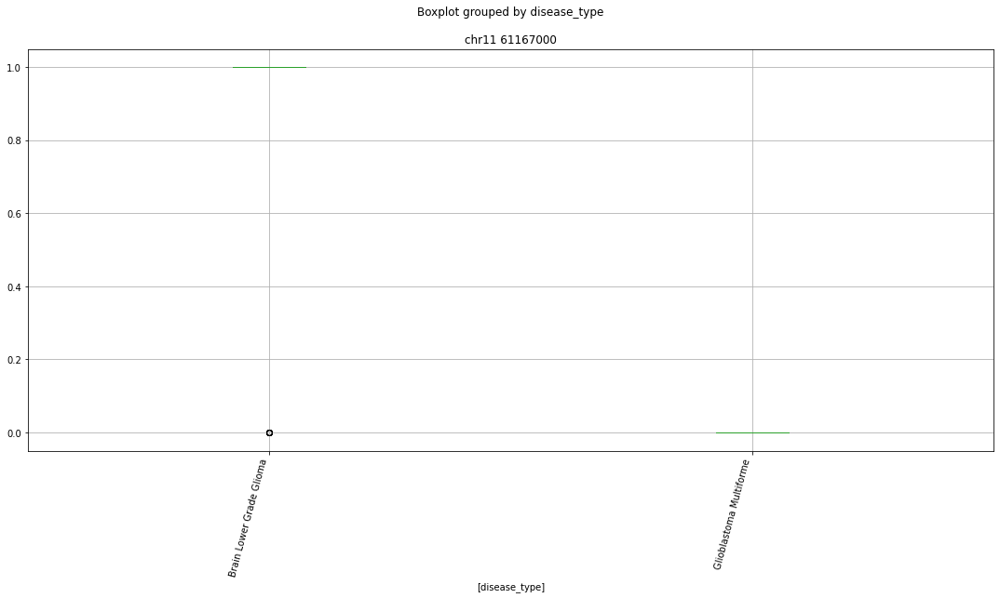

 p : 1.4682271381516776e-17  ( t : 11.319912144486992 ) :  chr11 83317000


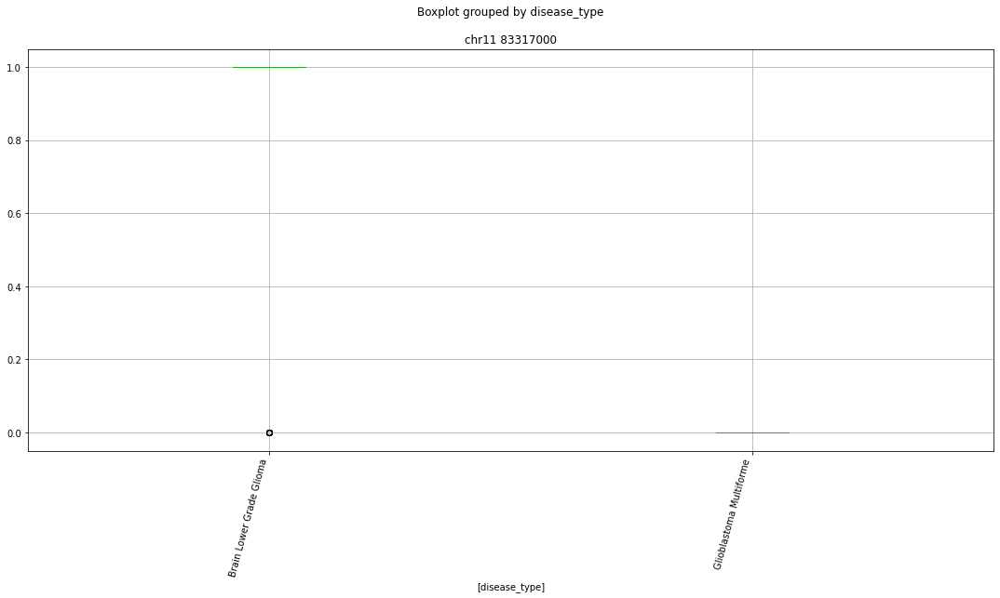

 p : 2.7590440009727814e-16  ( t : 10.605031069679022 ) :  chr2 15610000


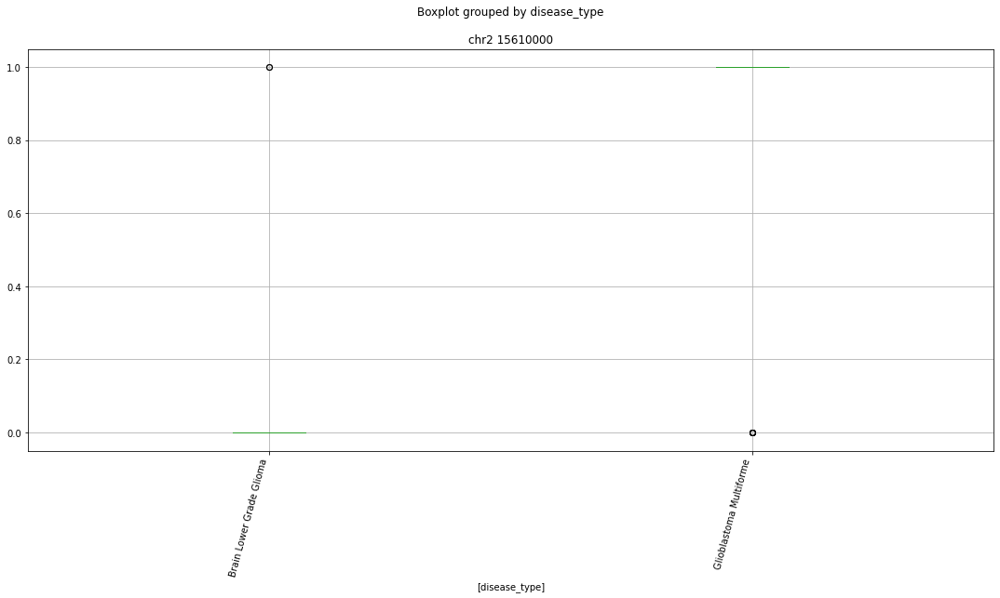

 p : 3.230994299523944e-13  ( t : 8.924928080877834 ) :  chr13 100618000


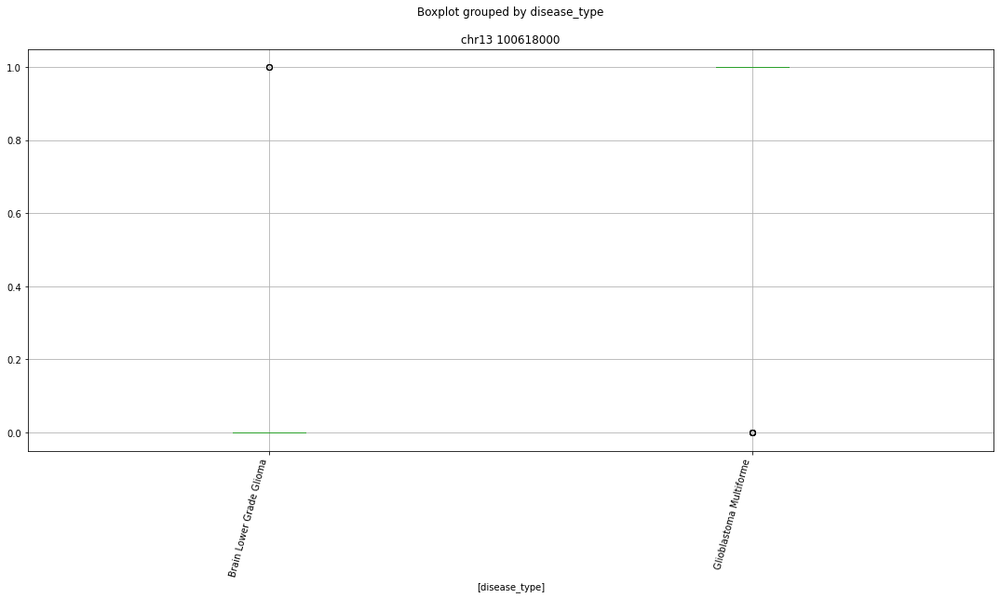

 p : 1.3043137708858713e-12  ( t : 8.597488506968883 ) :  chr22 19083000


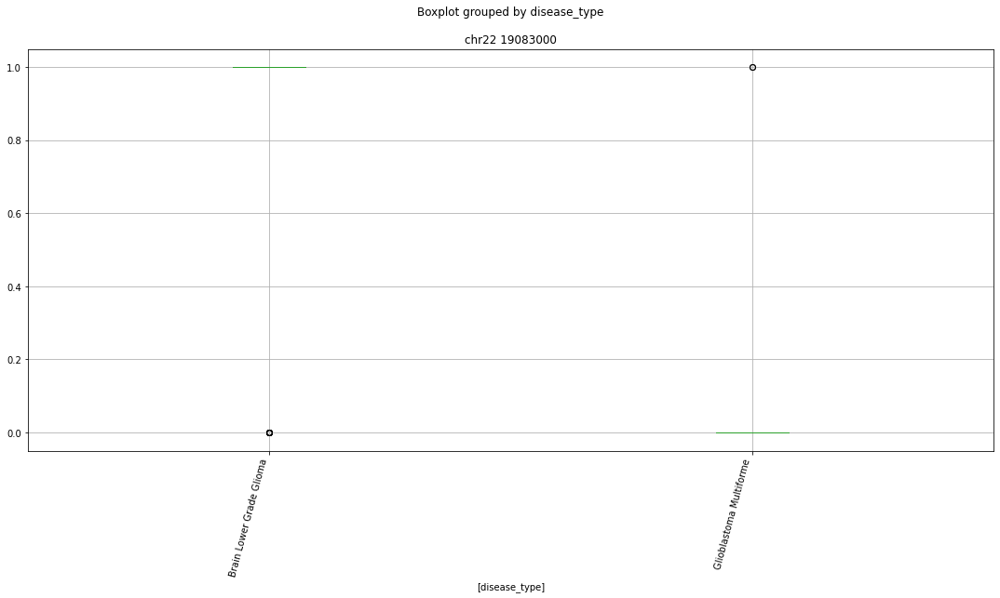

 p : 4.578196842753061e-12  ( t : 8.303349657899862 ) :  chr1 226115000


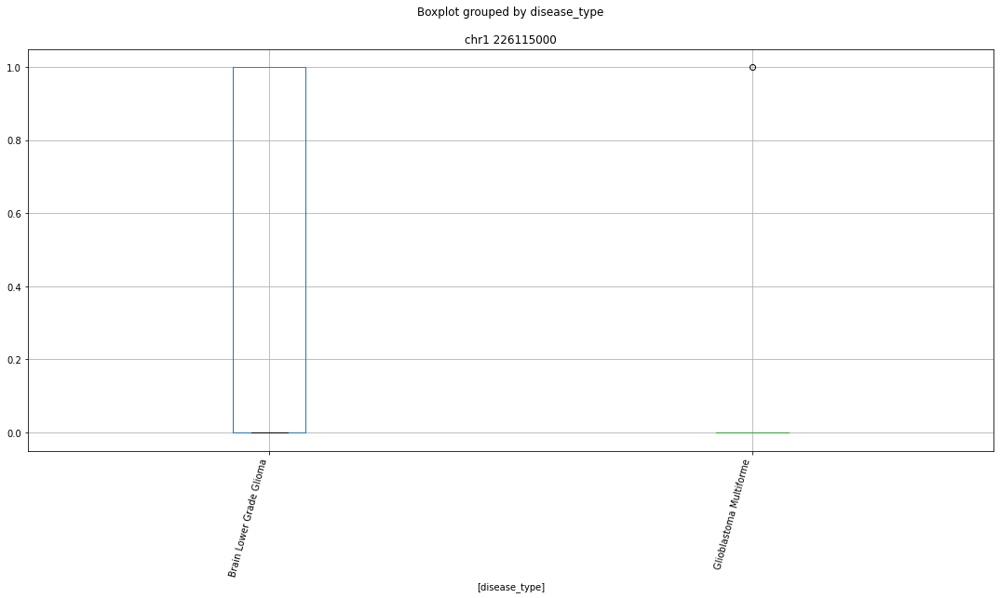

 p : 9.4983085356972e-12  ( t : 8.132464958508574 ) :  chr16 66630000


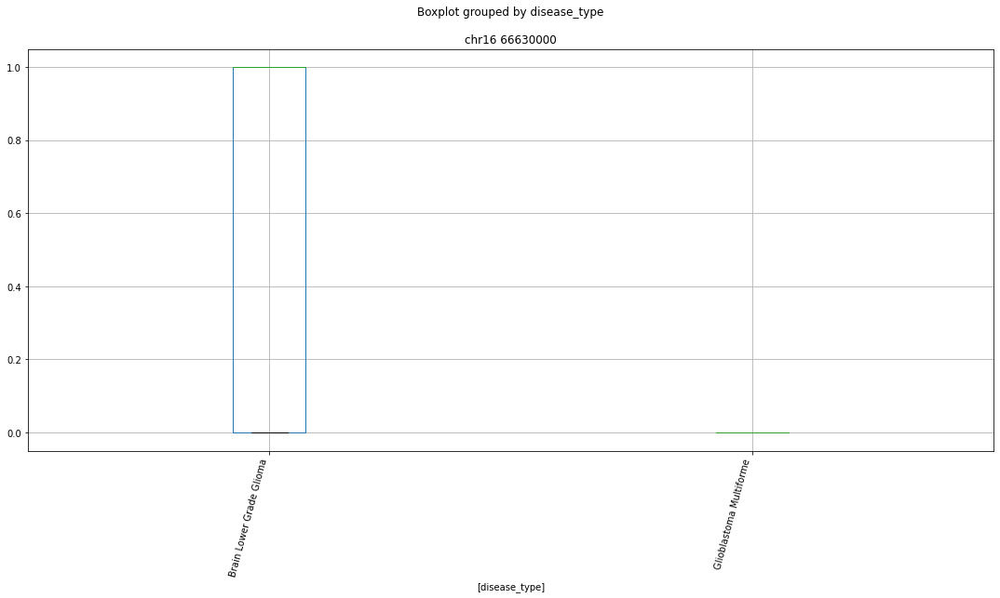

 p : 5.2009277731438915e-11  ( t : 7.7340969296826305 ) :  chr7 37291000


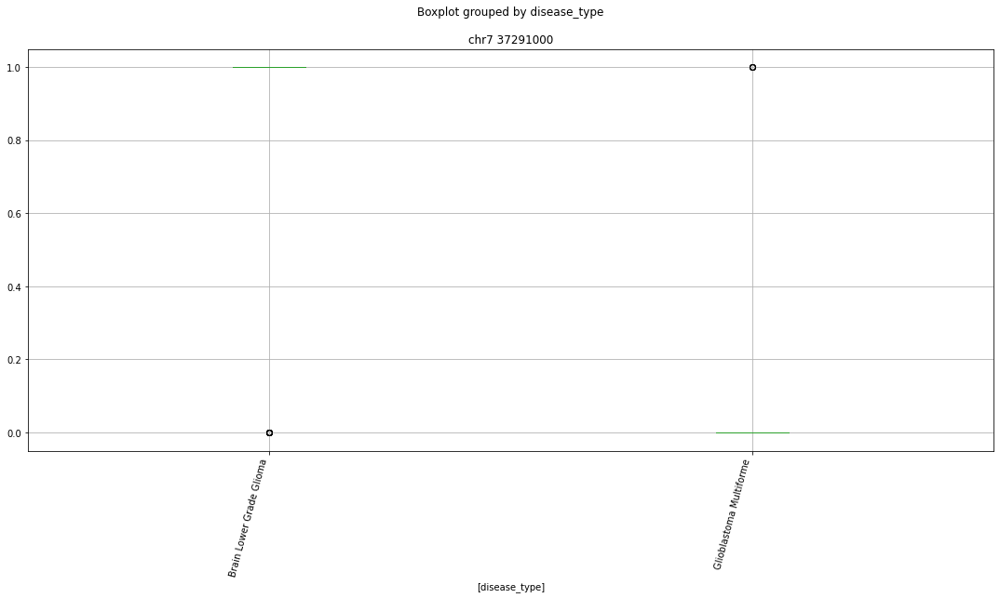

 p : 5.593727347752157e-11  ( t : 7.717020309705342 ) :  chr4 40146000


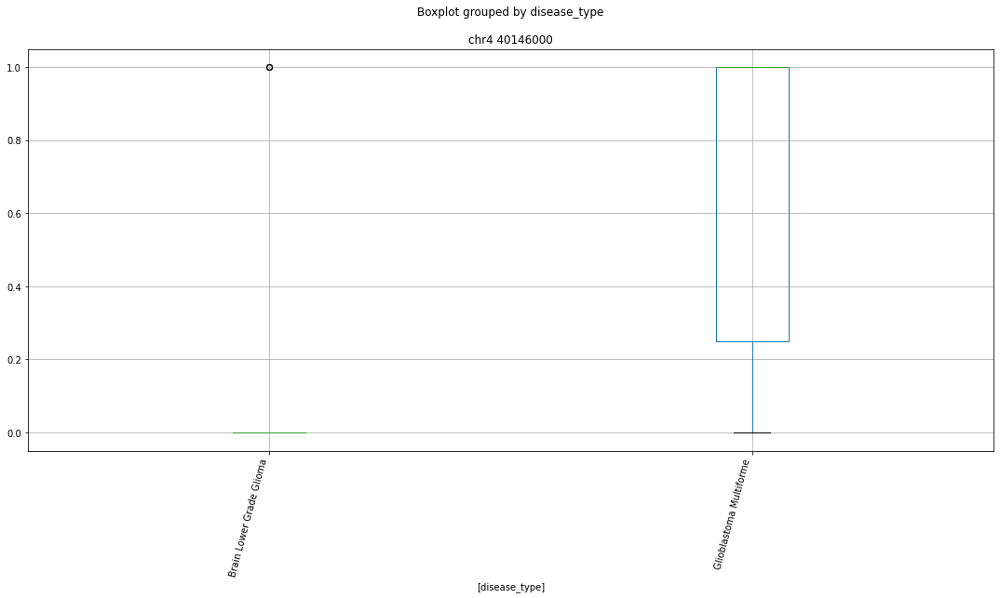

 p : 7.609277290064471e-11  ( t : 7.644822012889148 ) :  chr9 129662000


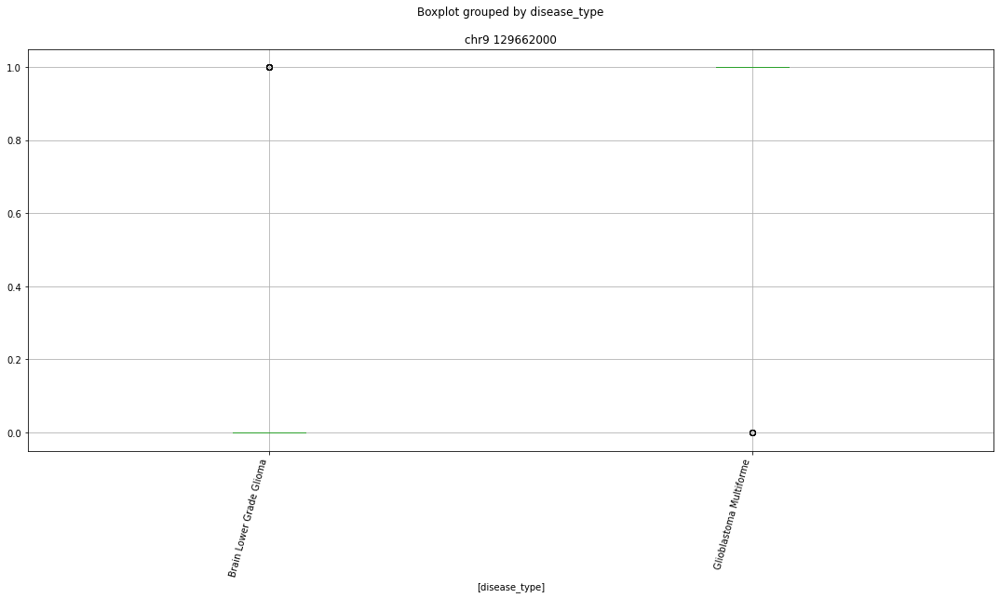

 p : 8.036008806778001e-11  ( t : 7.632015516631033 ) :  chr1 7600000


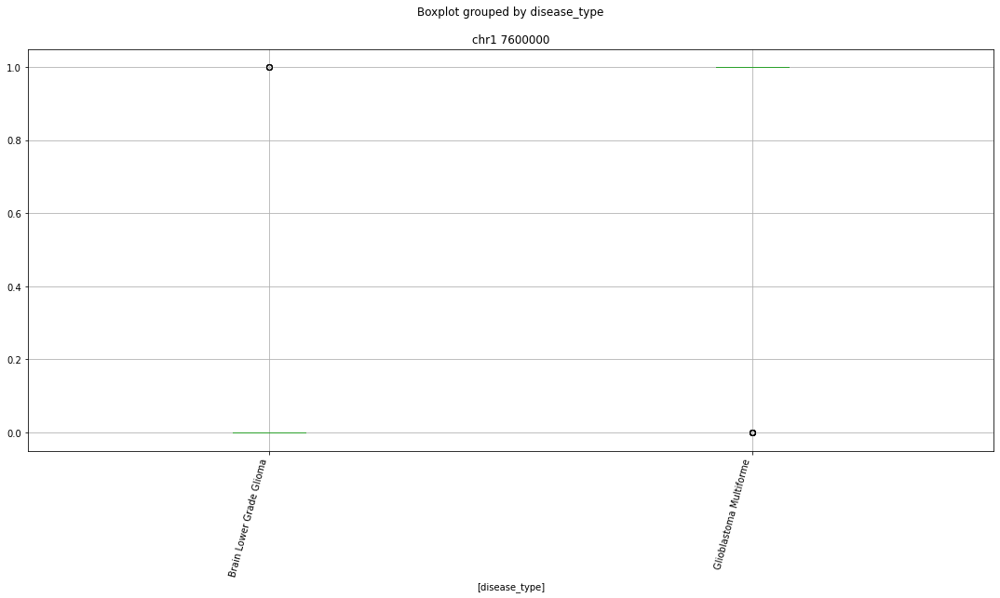

 p : 9.277251739703446e-11  ( t : 7.598297201011695 ) :  chr20 11512000


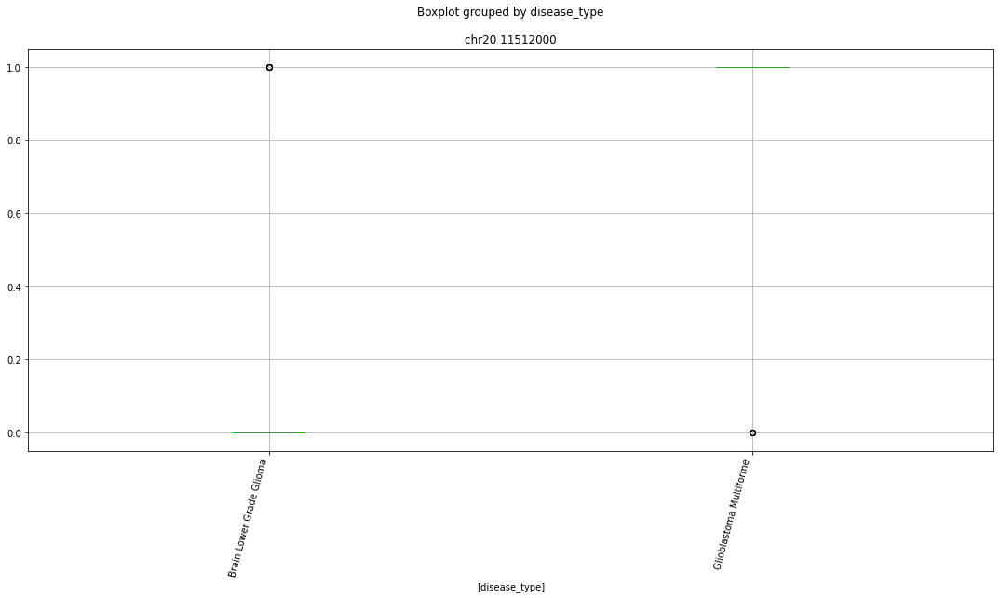

 p : 9.277251739703446e-11  ( t : 7.598297201011695 ) :  chr2 39627000


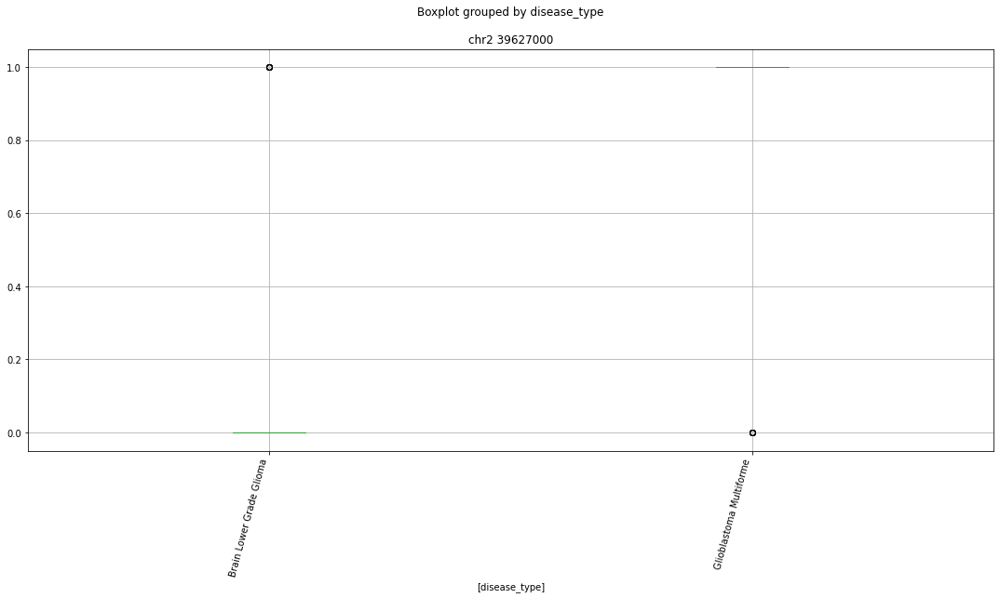

Clustermapping
['chr1 10028000' 'chr1 106413000' 'chr1 108159000' ... 'chrY 8917000'
 'disease_type' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


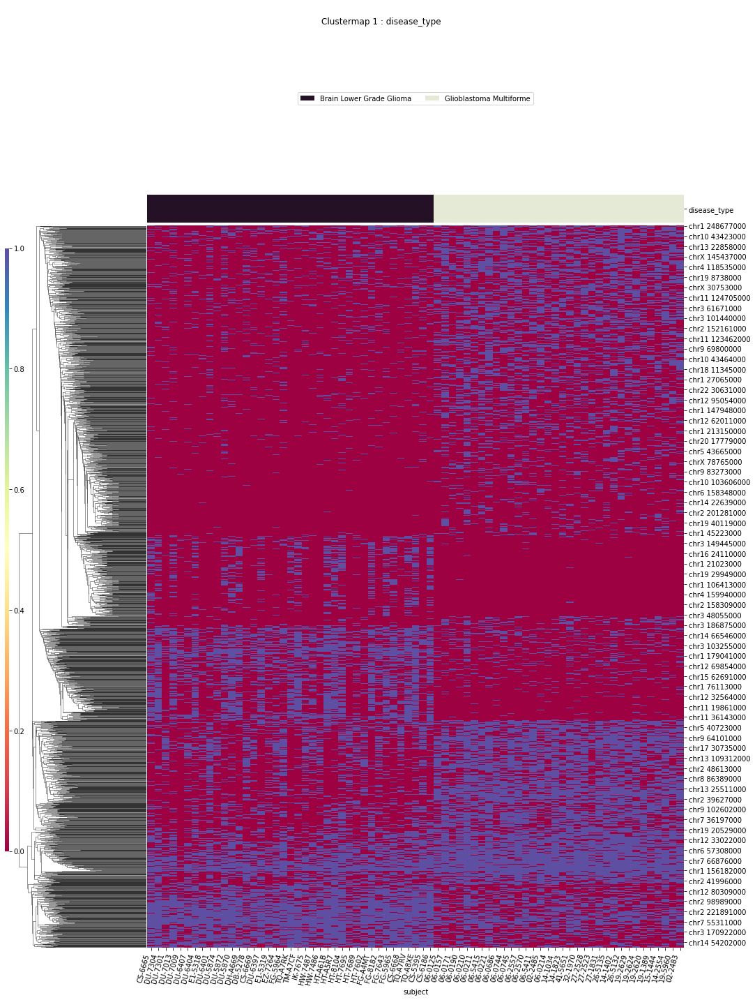

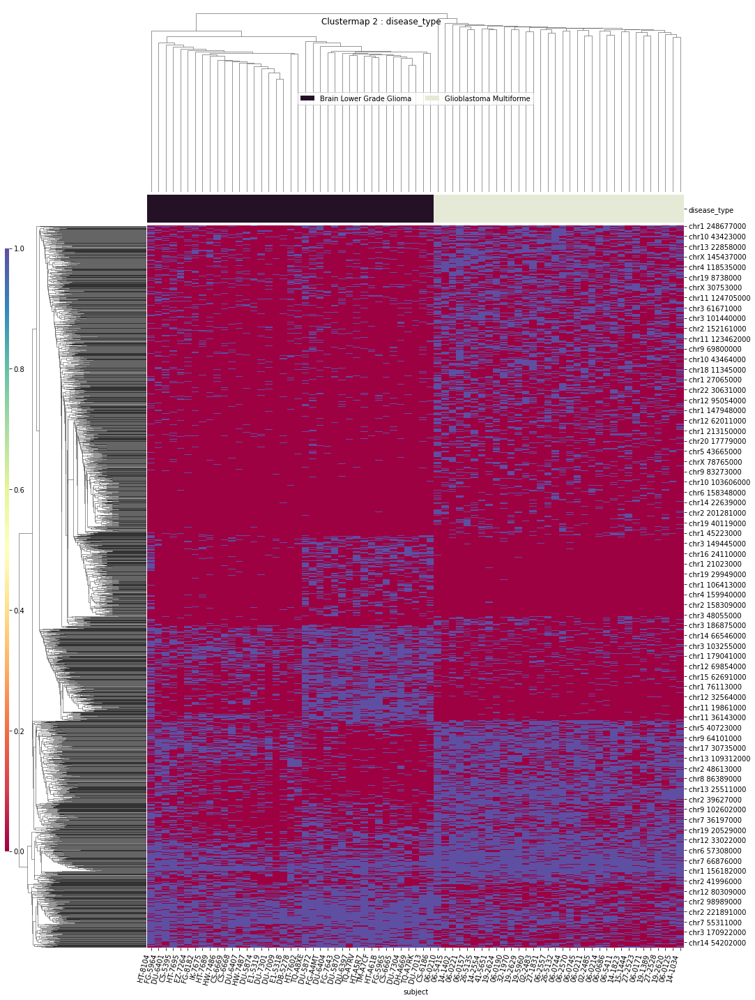

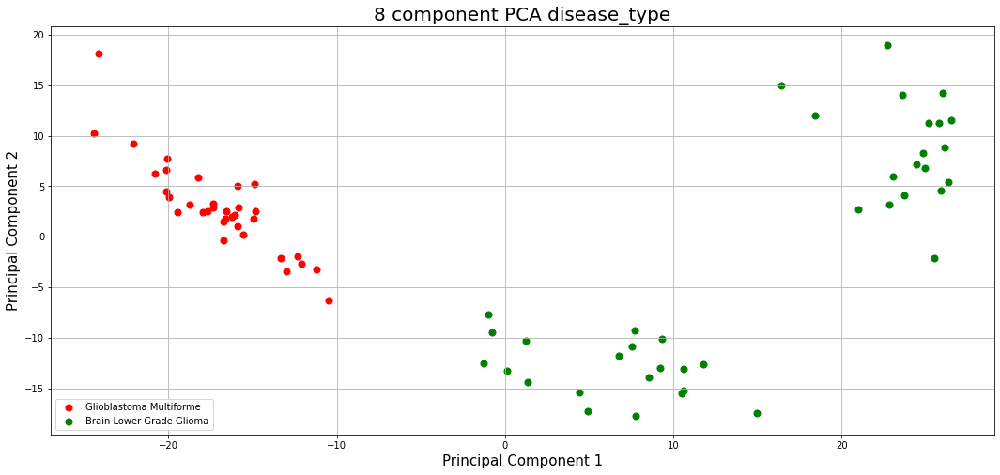

In [113]:
for column in ['disease_type']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-10,heat_p=0.1)
    

In [114]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210610 12:12:37'

disease_type
T-Testing
Boxplotting
 p : 2.887102389033911e-21  ( t : 13.486167444043069 ) :  chr11 61167000


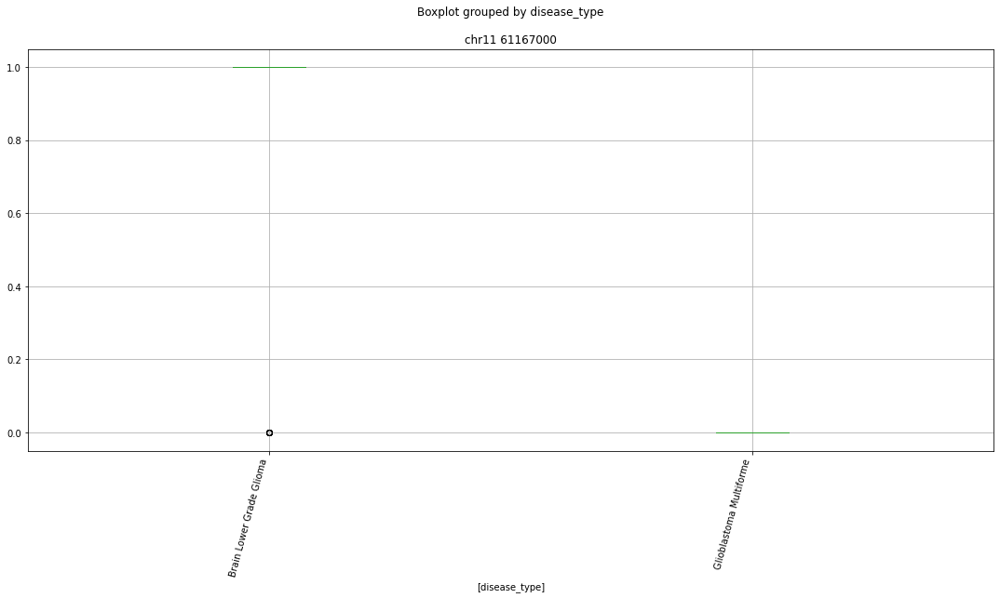

 p : 1.4682271381516776e-17  ( t : 11.319912144486992 ) :  chr11 83317000


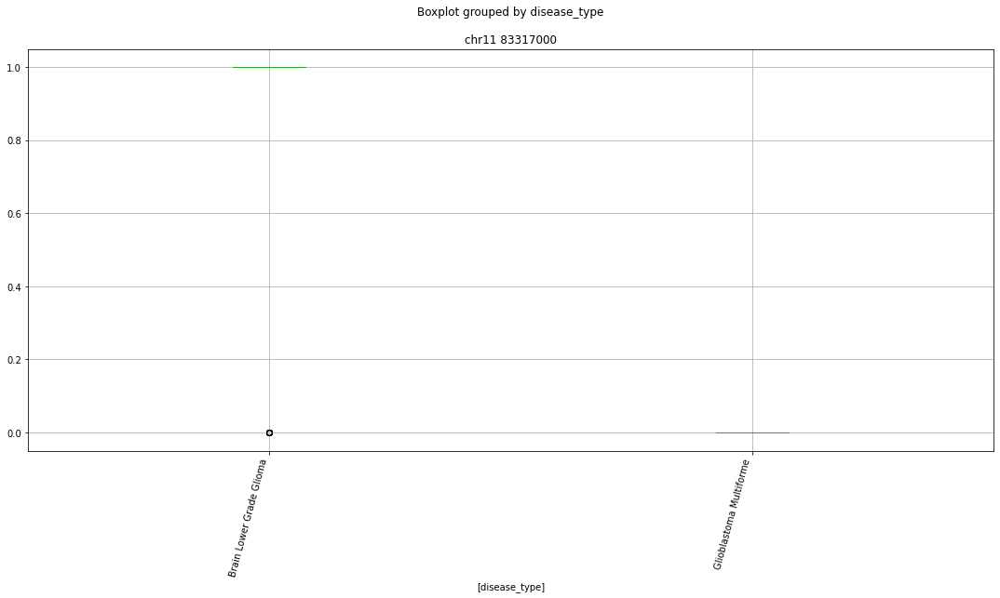

 p : 2.7590440009727814e-16  ( t : 10.605031069679022 ) :  chr2 15610000


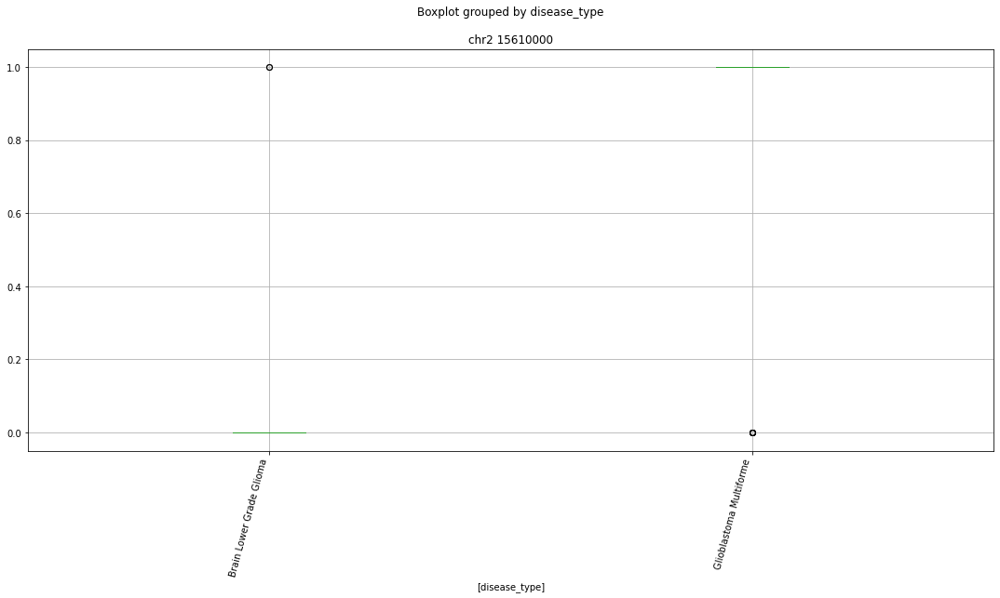

Clustermapping
['chr1 10028000' 'chr1 108490000' 'chr1 108535000' ... 'chrY 12352000'
 'disease_type' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


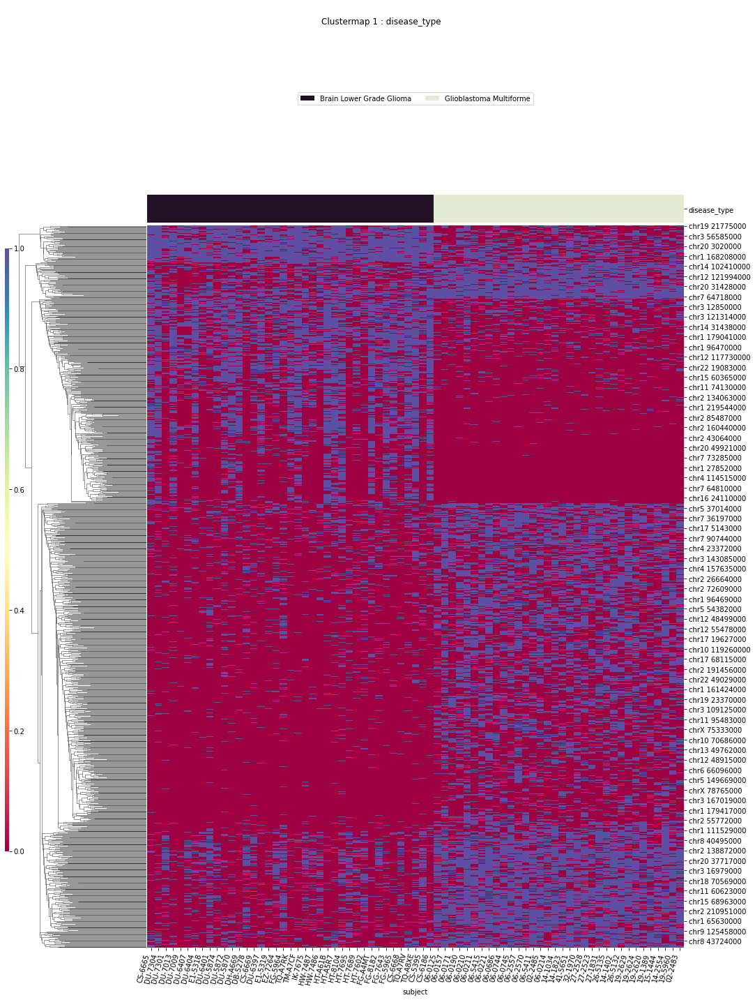

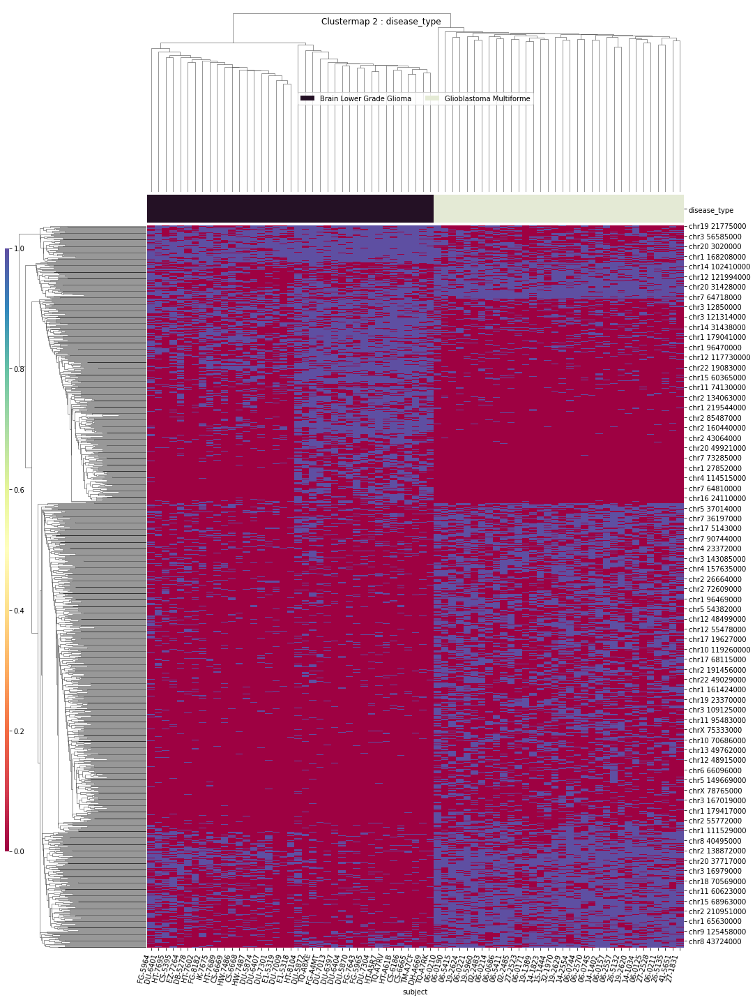

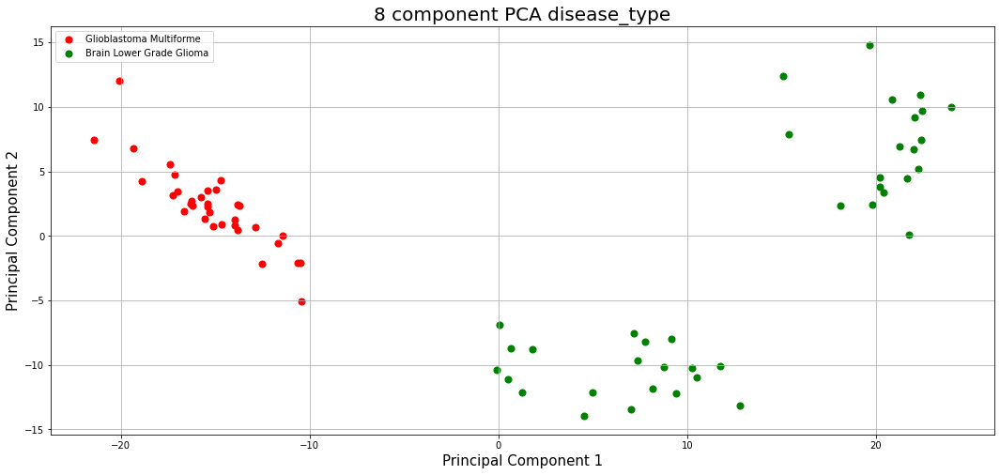

In [115]:
for column in ['disease_type']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-15,heat_p=0.01)
    

In [116]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210610 12:13:20'

disease_type
T-Testing
Boxplotting
 p : 2.887102389033911e-21  ( t : 13.486167444043069 ) :  chr11 61167000


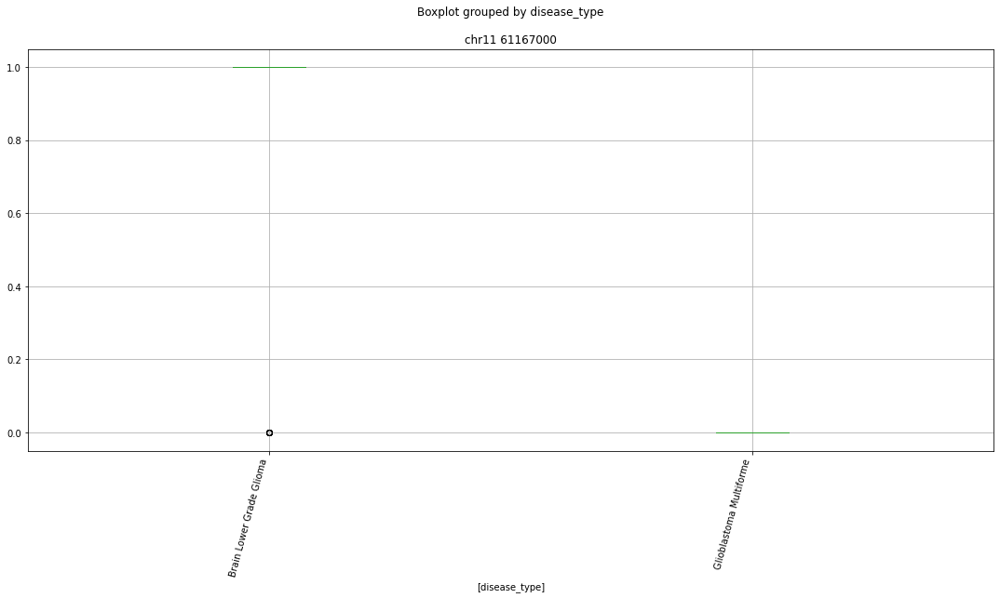

 p : 1.4682271381516776e-17  ( t : 11.319912144486992 ) :  chr11 83317000


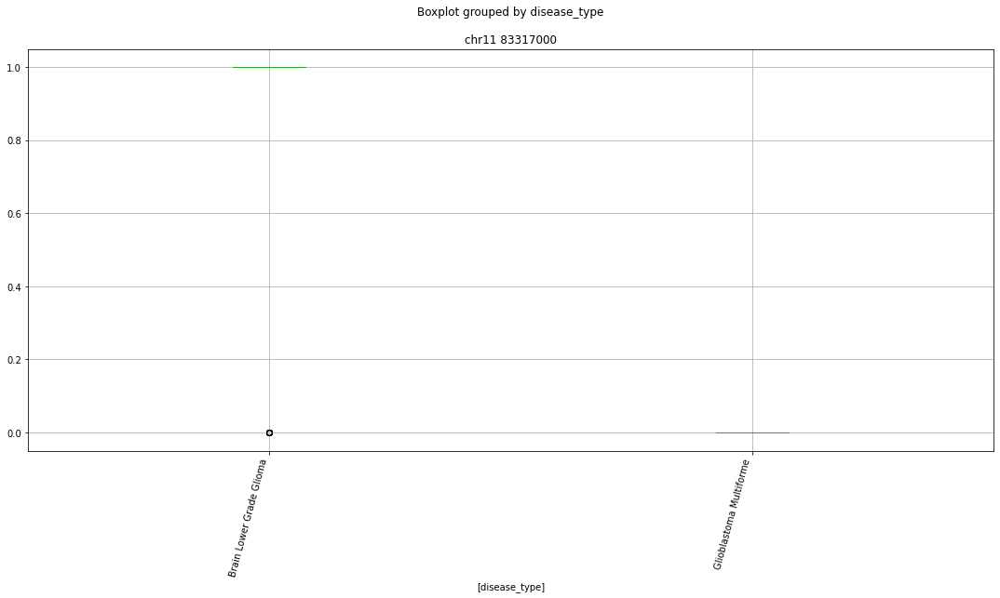

 p : 2.7590440009727814e-16  ( t : 10.605031069679022 ) :  chr2 15610000


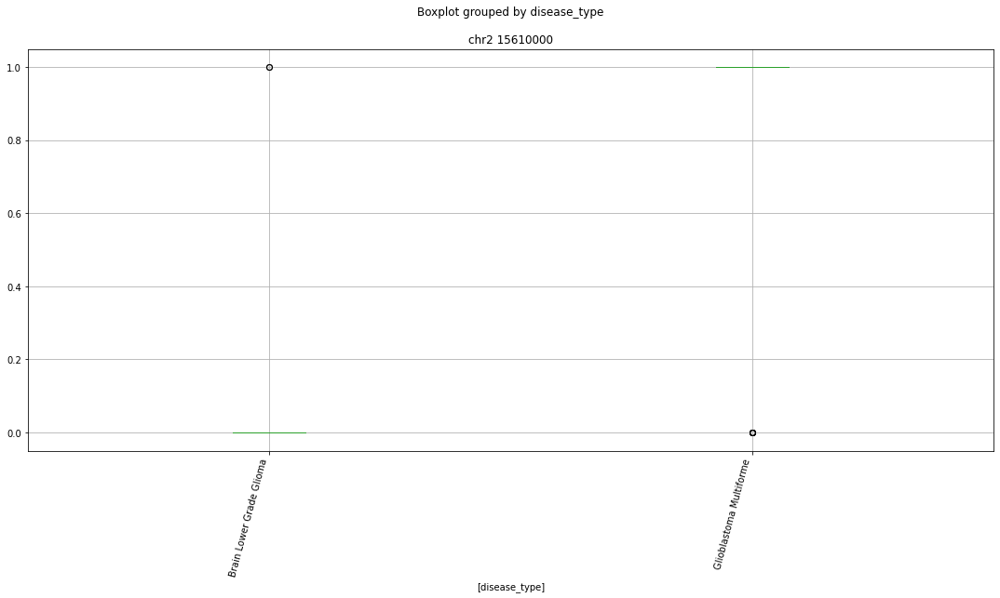

Clustermapping
['chr1 109176000' 'chr1 111529000' 'chr1 111800000' 'chr1 112729000'
 'chr1 114791000' 'chr1 114805000' 'chr1 12042000' 'chr1 13394000'
 'chr1 13659000' 'chr1 143637000' 'chr1 145765000' 'chr1 145768000'
 'chr1 147062000' 'chr1 151652000' 'chr1 152144000' 'chr1 152195000'
 'chr1 152472000' 'chr1 155701000' 'chr1 161424000' 'chr1 161617000'
 'chr1 168208000' 'chr1 173614000' 'chr1 179041000' 'chr1 187617000'
 'chr1 197405000' 'chr1 202739000' 'chr1 206063000' 'chr1 21052000'
 'chr1 21054000' 'chr1 212780000' 'chr1 21389000' 'chr1 219544000'
 'chr1 222489000' 'chr1 224101000' 'chr1 226115000' 'chr1 227710000'
 'chr1 229931000' 'chr1 234266000' 'chr1 23503000' 'chr1 23504000'
 'chr1 237670000' 'chr1 23852000' 'chr1 23854000' 'chr1 25604000'
 'chr1 26802000' 'chr1 27063000' 'chr1 27065000' 'chr1 27288000'
 'chr1 27852000' 'chr1 36243000' 'chr1 39869000' 'chr1 39914000'
 'chr1 43502000' 'chr1 45498000' 'chr1 48191000' 'chr1 48381000'
 'chr1 48480000' 'chr1 50382000' 'chr1 508

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


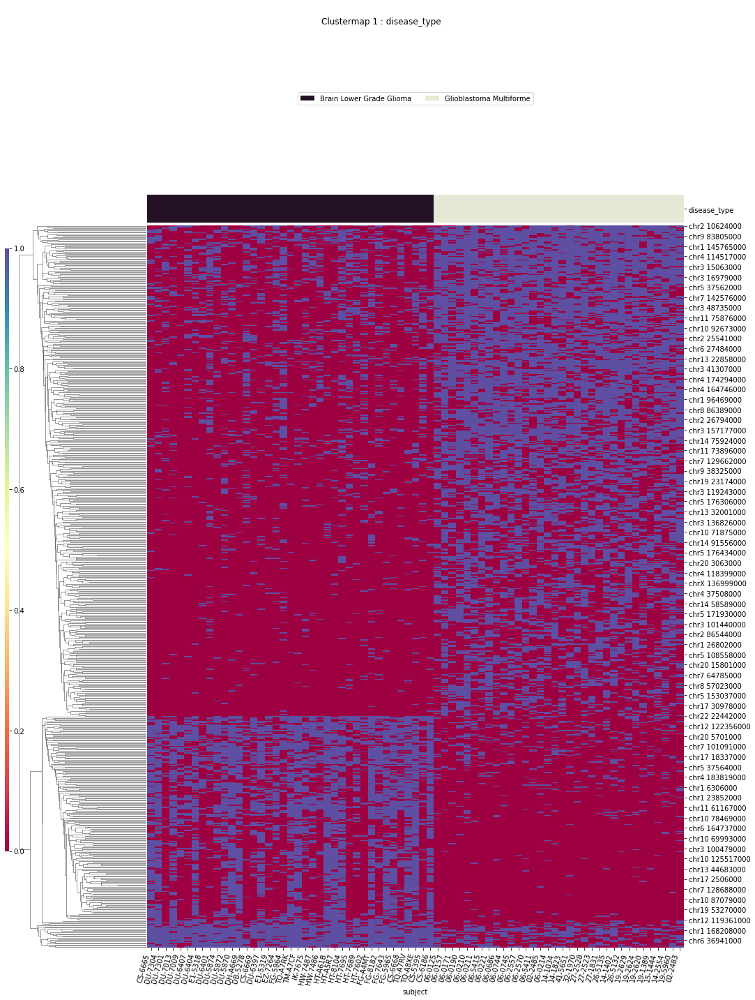

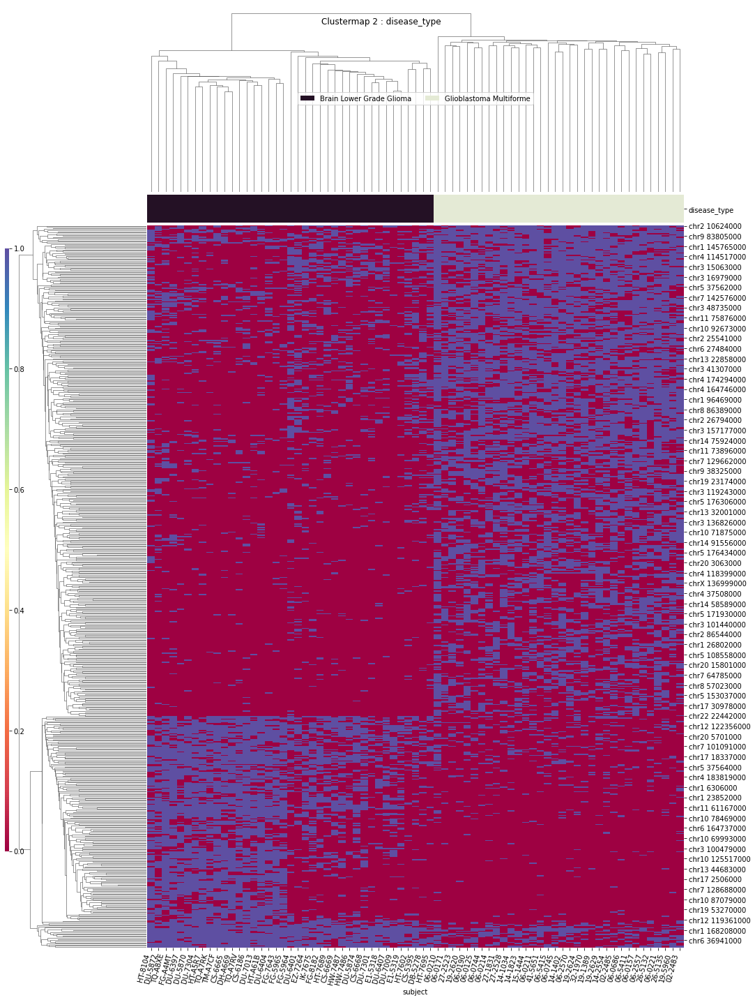

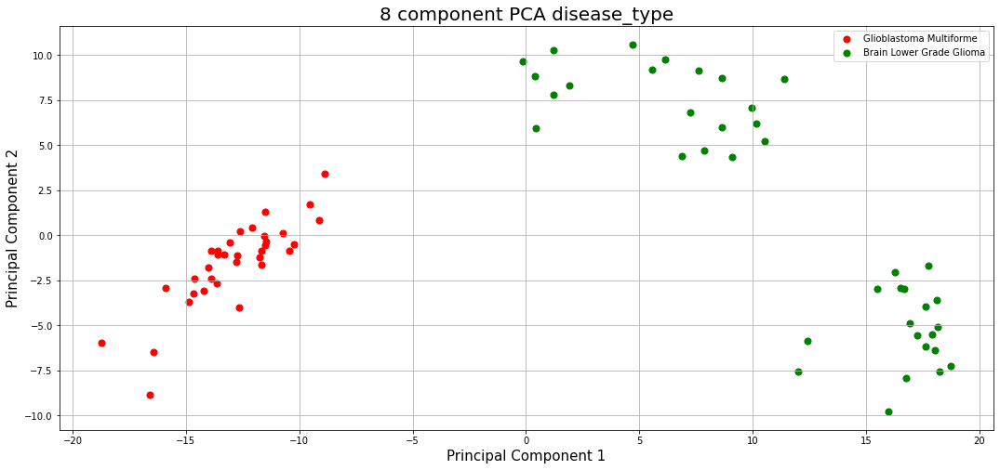

In [117]:
for column in ['disease_type']:
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-15,heat_p=0.001)
    

In [118]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210610 12:13:55'

# Load the GPMP data

In [119]:
gpmp_df=pd.read_csv(gpmpdata,header=[0,1],index_col=[0,1,2,3])
gpmp_df

chromosome                              chr1                                  \
position                             1409000 1410000 1580000 1581000 3751000   
sample          pup    hkle     mapq                                           
SF12149_S1L1_N  paired HERVK113 Q20        5       2       0       0       1   
                       SVA_A    Q20        0       0       0       0       0   
                       SVA_B    Q20        0       0       0       0       0   
                       SVA_C    Q20        0       0       0       0       0   
                       SVA_D    Q20        0       0       0       0       0   
...                                      ...     ...     ...     ...     ...   
SF12656_S11L4_N paired SVA_B    Q20        0       0       0       1       0   
                       SVA_C    Q20        0       0       0       0       0   
                       SVA_D    Q20        0       0       0       0       0   
                       SVA_E    Q20        0       0       0       0       0   
                       SVA_F    Q20        0       0       0       0       0   

chromosome                                                                    \
position                             5573000 6304000 6306000 6714000 6716000   
sample          pup    hkle     mapq                                           
SF12149_S1L1_N  paired HERVK113 Q20        0       0       0       0       0   
                       SVA_A    Q20        0       2       4       3       4   
                       SVA_B    Q20        0       1       2       3       3   
                       SVA_C    Q20        0       2       2       3       3   
                       SVA_D    Q20        0       2       3       3       3   
...                                      ...     ...     ...     ...     ...   
SF12656_S11L4_N paired SVA_B    Q20        0       3       3       1       5   
                       SVA_C    Q20        0       4       3       0       5   
                       SVA_D    Q20        0       4       3       0       5   
                       SVA_E    Q20        0       4       3       0       5   
                       SVA_F    Q20        0       4       0       0       3   

chromosome                            ...     chrY                             \
position                              ... 12879000 13103000 13104000 15774000   
sample          pup    hkle     mapq  ...                                       
SF12149_S1L1_N  paired HERVK113 Q20   ...        0        0        1        1   
                       SVA_A    Q20   ...        4        0        0        0   
                       SVA_B    Q20   ...        3        0        0        0   
                       SVA_C    Q20   ...        4        0        0        0   
                       SVA_D    Q20   ...        4        0        0        0   
...                                   ...      ...      ...      ...      ...   
SF12656_S11L4_N paired SVA_B    Q20   ...        0        0        0        0   
                       SVA_C    Q20   ...        0        0        0        0   
                       SVA_D    Q20   ...        0        0        0        0   
                       SVA_E    Q20   ...        0        0        0        0   
                       SVA_F    Q20   ...        0        0        0        0   

chromosome                                                                \
position                             19535000 19536000 19699000 19700000   
sample          pup    hkle     mapq                                       
SF12149_S1L1_N  paired HERVK113 Q20         0        0        2        3   
                       SVA_A    Q20         0        3        0        0   
                       SVA_B    Q20         0        4        0        0   
                       SVA_C    Q20         0        3        0        0   
                       SVA_D    Q20         0        3        0        0   
...            

In [120]:
gpmp_df.reset_index(inplace=True)
gpmp_df

chromosome           sample     pup      hkle mapq    chr1                  \
position                                           1409000 1410000 1580000   
0            SF12149_S1L1_N  paired  HERVK113  Q20       5       2       0   
1            SF12149_S1L1_N  paired     SVA_A  Q20       0       0       0   
2            SF12149_S1L1_N  paired     SVA_B  Q20       0       0       0   
3            SF12149_S1L1_N  paired     SVA_C  Q20       0       0       0   
4            SF12149_S1L1_N  paired     SVA_D  Q20       0       0       0   
..                      ...     ...       ...  ...     ...     ...     ...   
93          SF12656_S11L4_N  paired     SVA_B  Q20       0       0       0   
94          SF12656_S11L4_N  paired     SVA_C  Q20       0       0       0   
95          SF12656_S11L4_N  paired     SVA_D  Q20       0       0       0   
96          SF12656_S11L4_N  paired     SVA_E  Q20       0       0       0   
97          SF12656_S11L4_N  paired     SVA_F  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1581000 3751000 5573000  ... 12879000 13103000 13104000 15774000   
0                0       1       0  ...        0        0        1        1   
1                0       0       0  ...        4        0        0        0   
2                0       0       0  ...        3        0        0        0   
3                0       0       0  ...        4        0        0        0   
4                0       0       0  ...        4        0        0        0   
..             ...     ...     ...  ...      ...      ...      ...      ...   
93               1       0       0  ...        0        0        0        0   
94               0       0       0  ...        0        0        0        0   
95               0       0       0  ...        0        0        0        0   
96               0       0       0  ...        0        0        0        0   
97               0       0       0  ...        0        0        0        0   

chromosome                                                        
position   19535000 19536000 19699000 19700000 20553000 20976000  
0                 0        0        2        3        0        0  
1                 0        3        0        0        1        0  
2                 0        4        0        0        1        0  
3                 0        3        0        0        1        0  
4                 0        3        0        0        1        0  
..              ...      ...      ...      ...      ...      ...  
93                0        0        0        0        0        0  
94                0        0        0        0        0        0  
95                0        0        0        0        0        0  
96                0        0        0        0        0        0  
97                0        0        0        0        0        0  

[98 rows x 6046 columns]

In [121]:
gpmp_df=gpmp_df[gpmp_df['hkle']==hkle]
gpmp_df

chromosome           sample     pup   hkle mapq    chr1                  \
position                                        1409000 1410000 1580000   
1            SF12149_S1L1_N  paired  SVA_A  Q20       0       0       0   
8            SF12210_S2L1_N  paired  SVA_A  Q20       0       0       0   
15           SF12255_S7L2_N  paired  SVA_A  Q20       0       0       0   
22           SF12271_S8L2_N  paired  SVA_A  Q20       0       0       0   
29           SF12288_S1L1_N  paired  SVA_A  Q20       0       0       0   
36           SF12333_S2L1_N  paired  SVA_A  Q20       0       0       0   
43           SF12407_S1L1_N  paired  SVA_A  Q20       0       0       0   
50           SF12430_S2L1_N  paired  SVA_A  Q20       0       0       0   
57           SF12460_S8L3_N  paired  SVA_A  Q20       0       0       0   
64           SF12480_S7L3_N  paired  SVA_A  Q20       0       0       0   
71           SF12495_S9L3_N  paired  SVA_A  Q20       0       0       0   
78           SF12577_S6L2_N  paired  SVA_A  Q20       0       0       0   
85          SF12634_S10L4_N  paired  SVA_A  Q20       0       0       0   
92          SF12656_S11L4_N  paired  SVA_A  Q20       0       0       0   

chromosome                          ...     chrY                             \
position   1581000 3751000 5573000  ... 12879000 13103000 13104000 15774000   
1                0       0       0  ...        4        0        0        0   
8                0       0       0  ...        0        0        0        0   
15               0       0       0  ...        3        0        0        0   
22               0       0       0  ...        2        0        0        0   
29               0       0       0  ...        4        0        0        0   
36               0       0       0  ...        0        0        0        0   
43               0       0       0  ...        0        0        0        0   
50               0       0       0  ...        0        0        0        0   
57               0       0       0  ...        0        0        0        0   
64               0       0       0  ...        2        0        0        0   
71               0       0       0  ...        1        0        0        0   
78               0       0       0  ...        3        0        0        0   
85               0       0       0  ...        1        0        0        0   
92               0       0       0  ...        0        0        0        0   

chromosome                                                        
position   19535000 19536000 19699000 19700000 20553000 20976000  
1                 0        3        0        0        1        0  
8                 0        0        0        0        0        0  
15                0        0        0        0        2        0  
22                0        1        0        0        1        0  
29                0        0        0        0        5        0  
36                0        0        0        0        0        0  
43                0        0        0        0        0        0  
50                0        0        0        0        0        0  
57                0        0        0        0        0        0  
64                0        0        0        0        3        0  
71                0        0        0        0        1        0  
78                0        0        0        0        3        0  
85                0        4        0        0        3        0  
92                0        0        0        0        0        0  

[14 rows x 6046 columns]

In [122]:
gpmp_df['subject']=gpmp_df['sample'].str[0:7]
gpmp_df['subject']

<ipython-input-122-9c38aa8e9611>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpmp_df['subject']=gpmp_df['sample'].str[0:7]


1     SF12149
8     SF12210
15    SF12255
22    SF12271
29    SF12288
36    SF12333
43    SF12407
50    SF12430
57    SF12460
64    SF12480
71    SF12495
78    SF12577
85    SF12634
92    SF12656
Name: subject, dtype: object

In [123]:
gpmp_df.set_index(['subject','sample','pup','hkle','mapq'],inplace=True)
gpmp_df #.head()

chromosome                                   chr1                          \
position                                  1409000 1410000 1580000 1581000   
subject sample          pup    hkle  mapq                                   
SF12149 SF12149_S1L1_N  paired SVA_A Q20        0       0       0       0   
SF12210 SF12210_S2L1_N  paired SVA_A Q20        0       0       0       0   
SF12255 SF12255_S7L2_N  paired SVA_A Q20        0       0       0       0   
SF12271 SF12271_S8L2_N  paired SVA_A Q20        0       0       0       0   
SF12288 SF12288_S1L1_N  paired SVA_A Q20        0       0       0       0   
SF12333 SF12333_S2L1_N  paired SVA_A Q20        0       0       0       0   
SF12407 SF12407_S1L1_N  paired SVA_A Q20        0       0       0       0   
SF12430 SF12430_S2L1_N  paired SVA_A Q20        0       0       0       0   
SF12460 SF12460_S8L3_N  paired SVA_A Q20        0       0       0       0   
SF12480 SF12480_S7L3_N  paired SVA_A Q20        0       0       0       0   
SF12495 SF12495_S9L3_N  paired SVA_A Q20        0       0       0       0   
SF12577 SF12577_S6L2_N  paired SVA_A Q20        0       0       0       0   
SF12634 SF12634_S10L4_N paired SVA_A Q20        0       0       0       0   
SF12656 SF12656_S11L4_N paired SVA_A Q20        0       0       0       0   

chromosome                                                                 \
position                                  3751000 5573000 6304000 6306000   
subject sample          pup    hkle  mapq                                   
SF12149 SF12149_S1L1_N  paired SVA_A Q20        0       0       2       4   
SF12210 SF12210_S2L1_N  paired SVA_A Q20        0       0       5       3   
SF12255 SF12255_S7L2_N  paired SVA_A Q20        0       0       3       1   
SF12271 SF12271_S8L2_N  paired SVA_A Q20        0       0       2       0   
SF12288 SF12288_S1L1_N  paired SVA_A Q20        0       0       5       3   
SF12333 SF12333_S2L1_N  paired SVA_A Q20        0       0       1       4   
SF12407 SF12407_S1L1_N  paired SVA_A Q20        0       0       4       6   
SF12430 SF12430_S2L1_N  paired SVA_A Q20        0       0      12       2   
SF12460 SF12460_S8L3_N  paired SVA_A Q20        0       0       1       5   
SF12480 SF12480_S7L3_N  paired SVA_A Q20        0       0       1       6   
SF12495 SF12495_S9L3_N  paired SVA_A Q20        0       0       2       2   
SF12577 SF12577_S6L2_N  paired SVA_A Q20        0       0       4       2   
SF12634 SF12634_S10L4_N paired SVA_A Q20        0       0       8       9   
SF12656 SF12656_S11L4_N paired SVA_A Q20        0       0       3       3   

chromosome                                                 ...     chrY  \
position                                  6714000 6716000  ... 12879000   
subject sample          pup    hkle  mapq                  ...            
SF12149 SF12149_S1L1_N  paired SVA_A Q20        3       4  ...        4   
SF12210 SF12210_S2L1_N  paired SVA_A Q20        1       3  ...        0   
SF12255 SF12255_S7L2_N  paired SVA_A Q20        3       2  ...        3   
SF12271 SF12271_S8L2_N  paired SVA_A Q20        1       4  ...        2   
SF12288 SF12288_S1L1_N  paired SVA_A Q20        1      12  ...        4   
SF12333 SF12333_S2L1_N  paired SVA_A Q20        3      10  ...        0   
SF12407 SF12407_S1L1_N  paired SVA_A Q20        6       6  ...        0   
SF12430 SF12430_S2L1_N  paired SVA_A Q20        7      19  ...        0   
SF12460 SF12460_S8L3_N  paired SVA_A Q20        5       5  ...        0   
SF12480 SF12480_S7L3_N  paired SVA_A Q20        3      10  ...        2   
SF12495 SF12495_S9L3_N  paired SVA_A Q20        1       8  ...        1   
SF12577 SF12577_S6L2_N  paired SVA_A Q20        3       1  ...        3   
SF12634 SF12634_S10L4_N paired SVA_A Q20        3       5  ...        1   
SF12656 SF12656_S11L4_N paired SVA_A Q20        0       6  ...        0   

chromosome                                                                     \
position               

In [124]:
gpmp_df.columns= [' '.join(col).strip() for col in gpmp_df.columns.values]
gpmp_df

,,,,,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 3751000,chr1 5573000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,chrY 12879000,chrY 13103000,chrY 13104000,chrY 15774000,chrY 19535000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000
subject,sample,pup,hkle,mapq,,,,,,,,,,,,,,,,,,,,,
SF12149,SF12149_S1L1_N,paired,SVA_A,Q20,0,0,0,0,0,0,2,4,3,4,...,4,0,0,0,0,3,0,0,1,0
SF12210,SF12210_S2L1_N,paired,SVA_A,Q20,0,0,0,0,0,0,5,3,1,3,...,0,0,0,0,0,0,0,0,0,0
SF12255,SF12255_S7L2_N,paired,SVA_A,Q20,0,0,0,0,0,0,3,1,3,2,...,3,0,0,0,0,0,0,0,2,0
SF12271,SF12271_S8L2_N,paired,SVA_A,Q20,0,0,0,0,0,0,2,0,1,4,...,2,0,0,0,0,1,0,0,1,0
SF12288,SF12288_S1L1_N,paired,SVA_A,Q20,0,0,0,0,0,0,5,3,1,12,...,4,0,0,0,0,0,0,0,5,0
SF12333,SF12333_S2L1_N,paired,SVA_A,Q20,0,0,0,0,0,0,1,4,3,10,...,0,0,0,0,0,0,0,0,0,0
SF12407,SF12407_S1L1_N,paired,SVA_A,Q20,0,0,0,0,0,0,4,6,6,6,...,0,0,0,0,0,0,0,0,0,0
SF12430,SF12430_S2L1_N,paired,SVA_A,Q20,0,0,0,0,0,0,12,2,7,19,...,0,0,0,0,0,0,0,0,0,0
SF12460,SF12460_S8L3_N,paired,SVA_A,Q20,0,0,0,0,0,0,1,5,5,5,...,0,0,0,0,0,0,0,0,0,0


In [125]:
gpmp_df=gpmp_df.droplevel('pup',axis='index').droplevel('mapq',axis='index').droplevel('hkle',axis='index')
gpmp_df

,,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 3751000,chr1 5573000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,chrY 12879000,chrY 13103000,chrY 13104000,chrY 15774000,chrY 19535000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000
subject,sample,,,,,,,,,,,,,,,,,,,,,
SF12149,SF12149_S1L1_N,0,0,0,0,0,0,2,4,3,4,...,4,0,0,0,0,3,0,0,1,0
SF12210,SF12210_S2L1_N,0,0,0,0,0,0,5,3,1,3,...,0,0,0,0,0,0,0,0,0,0
SF12255,SF12255_S7L2_N,0,0,0,0,0,0,3,1,3,2,...,3,0,0,0,0,0,0,0,2,0
SF12271,SF12271_S8L2_N,0,0,0,0,0,0,2,0,1,4,...,2,0,0,0,0,1,0,0,1,0
SF12288,SF12288_S1L1_N,0,0,0,0,0,0,5,3,1,12,...,4,0,0,0,0,0,0,0,5,0
SF12333,SF12333_S2L1_N,0,0,0,0,0,0,1,4,3,10,...,0,0,0,0,0,0,0,0,0,0
SF12407,SF12407_S1L1_N,0,0,0,0,0,0,4,6,6,6,...,0,0,0,0,0,0,0,0,0,0
SF12430,SF12430_S2L1_N,0,0,0,0,0,0,12,2,7,19,...,0,0,0,0,0,0,0,0,0,0
SF12460,SF12460_S8L3_N,0,0,0,0,0,0,1,5,5,5,...,0,0,0,0,0,0,0,0,0,0


# NORMALIZE INSERTION POINTS BY ( * 1,000,000,000 / READ COUNT )

In [126]:
gpmp_counts=pd.read_csv("20210604-GPMP-GBM/raw_read_counts.csv")
gpmp_counts.head()

,sample,raw pair count
0,SF12149_S1L0_E,1515318278
1,SF12149_S1L1_N,660620929
2,SF12149_S2L0_NE,1334986480
3,SF12210_S2L1_N,597544666
4,SF12210_S3L1_E,1487133148


In [127]:
gpmp_df.reset_index(inplace=True)
gpmp_df=gpmp_df.merge(gpmp_counts,on='sample')
gpmp_df.set_index(['subject','sample'],inplace=True)
gpmp_df

,,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 3751000,chr1 5573000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,chrY 13103000,chrY 13104000,chrY 15774000,chrY 19535000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,raw pair count
subject,sample,,,,,,,,,,,,,,,,,,,,,
SF12149,SF12149_S1L1_N,0,0,0,0,0,0,2,4,3,4,...,0,0,0,0,3,0,0,1,0,660620929
SF12210,SF12210_S2L1_N,0,0,0,0,0,0,5,3,1,3,...,0,0,0,0,0,0,0,0,0,597544666
SF12255,SF12255_S7L2_N,0,0,0,0,0,0,3,1,3,2,...,0,0,0,0,0,0,0,2,0,688035696
SF12271,SF12271_S8L2_N,0,0,0,0,0,0,2,0,1,4,...,0,0,0,0,1,0,0,1,0,751091228
SF12288,SF12288_S1L1_N,0,0,0,0,0,0,5,3,1,12,...,0,0,0,0,0,0,0,5,0,1101793738
SF12333,SF12333_S2L1_N,0,0,0,0,0,0,1,4,3,10,...,0,0,0,0,0,0,0,0,0,1195944225
SF12407,SF12407_S1L1_N,0,0,0,0,0,0,4,6,6,6,...,0,0,0,0,0,0,0,0,0,1176493990
SF12430,SF12430_S2L1_N,0,0,0,0,0,0,12,2,7,19,...,0,0,0,0,0,0,0,0,0,1267959047
SF12460,SF12460_S8L3_N,0,0,0,0,0,0,1,5,5,5,...,0,0,0,0,0,0,0,0,0,960343467


In [128]:
gpmp_df=gpmp_df.droplevel('sample',axis='index')
gpmp_df

,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 3751000,chr1 5573000,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,...,chrY 13103000,chrY 13104000,chrY 15774000,chrY 19535000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,raw pair count
subject,,,,,,,,,,,,,,,,,,,,,
SF12149,0,0,0,0,0,0,2,4,3,4,...,0,0,0,0,3,0,0,1,0,660620929
SF12210,0,0,0,0,0,0,5,3,1,3,...,0,0,0,0,0,0,0,0,0,597544666
SF12255,0,0,0,0,0,0,3,1,3,2,...,0,0,0,0,0,0,0,2,0,688035696
SF12271,0,0,0,0,0,0,2,0,1,4,...,0,0,0,0,1,0,0,1,0,751091228
SF12288,0,0,0,0,0,0,5,3,1,12,...,0,0,0,0,0,0,0,5,0,1101793738
SF12333,0,0,0,0,0,0,1,4,3,10,...,0,0,0,0,0,0,0,0,0,1195944225
SF12407,0,0,0,0,0,0,4,6,6,6,...,0,0,0,0,0,0,0,0,0,1176493990
SF12430,0,0,0,0,0,0,12,2,7,19,...,0,0,0,0,0,0,0,0,0,1267959047
SF12460,0,0,0,0,0,0,1,5,5,5,...,0,0,0,0,0,0,0,0,0,960343467


In [129]:
gpmp_df.shape

(14, 6043)

In [130]:
gpmp_df=gpmp_df.loc[:, (gpmp_df != 0).any(axis=0)]

In [131]:
gpmp_df.shape

(14, 3934)

In [132]:
gpmp_df[gpmp_df.columns[gpmp_df.columns.str.contains("^chr")]]=(
    1e9*gpmp_df[gpmp_df.columns[gpmp_df.columns.str.contains("^chr")]].values)/gpmp_df[['raw pair count']].values


<ipython-input-132-5f77c92ad960>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gpmp_df[gpmp_df.columns[gpmp_df.columns.str.contains("^chr")]]=(
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/pandas/core/indexing.py:1738: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value[:, i].tolist(), pi)


In [133]:
gpmp_df.drop('raw pair count',axis='columns',inplace=True)
gpmp_df

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10028000,...,chrY 7180000,chrY 7571000,chrY 8917000,chrY 11340000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 19536000,chrY 20553000
subject,,,,,,,,,,,,,,,,,,,,,
SF12149,3.03,6.05,4.54,6.05,1.51,1.51,3.03,0.00,7.57,1.51,...,4.54,0.00,3.03,0.00,1.51,3.03,0.00,6.05,4.54,1.51
SF12210,8.37,5.02,1.67,5.02,3.35,0.00,3.35,3.35,3.35,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
SF12255,4.36,1.45,4.36,2.91,2.91,0.00,2.91,8.72,1.45,1.45,...,4.36,0.00,1.45,0.00,0.00,8.72,1.45,4.36,0.00,2.91
SF12271,2.66,0.00,1.33,5.33,3.99,1.33,1.33,2.66,6.66,0.00,...,1.33,0.00,3.99,0.00,1.33,1.33,1.33,2.66,1.33,1.33
SF12288,4.54,2.72,0.91,10.89,4.54,2.72,2.72,2.72,7.26,0.91,...,4.54,0.00,7.26,0.00,2.72,6.35,1.82,3.63,0.00,4.54
SF12333,0.84,3.34,2.51,8.36,6.69,5.02,2.51,2.51,5.02,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
SF12407,3.40,5.10,5.10,5.10,17.00,8.50,4.25,10.20,5.10,1.70,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
SF12430,9.46,1.58,5.52,14.98,6.31,2.37,2.37,2.37,10.25,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
SF12460,1.04,5.21,5.21,5.21,2.08,2.08,3.12,3.12,8.33,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [134]:
gpmp_binary_df=(gpmp_df>=threshold).replace([False,True],[0,1]).copy()
gpmp_binary_df

,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10028000,...,chrY 7180000,chrY 7571000,chrY 8917000,chrY 11340000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 19536000,chrY 20553000
subject,,,,,,,,,,,,,,,,,,,,,
SF12149,1,1,1,1,0,0,1,0,1,0,...,1,0,1,0,0,1,0,1,1,0
SF12210,1,1,0,1,1,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
SF12255,1,0,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,0,1,0,0
SF12271,0,0,0,1,1,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
SF12288,1,0,0,1,1,0,0,0,1,0,...,1,0,1,0,0,1,0,1,0,1
SF12333,0,1,0,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
SF12407,1,1,1,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
SF12430,1,0,1,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
SF12460,0,1,1,1,0,0,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


In [135]:
gpmp_binary_df.shape

(14, 3933)

In [136]:
gpmp_binary_df=gpmp_binary_df.loc[:, (gpmp_binary_df != 0).any(axis=0)]
gpmp_binary_df.shape

(14, 3328)

In [137]:
gpmp_binary_df.loc[:,'disease_type']='GBM'
gpmp_binary_df

/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/pandas/core/indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/pandas/core/indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10029000,...,chrX 155223000,chrY 4296000,chrY 7180000,chrY 8917000,chrY 12352000,chrY 12452000,chrY 12879000,chrY 19536000,chrY 20553000,disease_type
subject,,,,,,,,,,,,,,,,,,,,,
SF12149,1,1,1,1,0,0,1,0,1,1,...,1,1,1,1,0,1,1,1,0,GBM
SF12210,1,1,0,1,1,0,1,1,1,1,...,0,0,0,0,0,0,0,0,0,GBM
SF12255,1,0,1,0,0,0,0,1,0,1,...,0,0,1,0,0,1,1,0,0,GBM
SF12271,0,0,0,1,1,0,0,0,1,1,...,0,0,0,1,0,0,0,0,0,GBM
SF12288,1,0,0,1,1,0,0,0,1,1,...,0,0,1,1,0,1,1,0,1,GBM
SF12333,0,1,0,1,1,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,GBM
SF12407,1,1,1,1,1,1,1,1,1,1,...,1,0,0,0,0,0,0,0,0,GBM
SF12430,1,0,1,1,1,0,0,0,1,1,...,1,0,0,0,0,0,0,0,0,GBM
SF12460,0,1,1,1,0,0,1,1,1,1,...,1,0,0,0,0,0,0,0,0,GBM


In [138]:
gpmp_binary_df.shape

(14, 3329)

In [139]:
both_binary_df=compdf.copy()

In [140]:
both_binary_df.drop(['Triple_group', 'Tissue_sample_location', 'MGMT', 'Age', 'Survival_months',
                     'Vital_status', 'days_to_death', 'gender1','center_name',
                     'race', 'ethnicity', 'gender2', 'RE_names', 'IDH', 'x1p19q', 'TERT',
                     'IDH_1p19q_status', 'WHO_groups',
                     'project_id','primary_diagnosis'], axis='columns',inplace=True)

In [141]:
both_binary_df.set_index(['subject'],inplace=True)
both_binary_df #.head()

,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10028000,...,chrX 155908000,chrY 4294000,chrY 4296000,chrY 7180000,chrY 8917000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,disease_type
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,1,0,0,1,Glioblastoma Multiforme
02-2485,0,0,0,0,1,1,0,0,0,0,...,0,0,0,1,0,1,1,0,0,Glioblastoma Multiforme
06-0125,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Glioblastoma Multiforme
06-0157,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Glioblastoma Multiforme
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Glioblastoma Multiforme
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IK-7675,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,Brain Lower Grade Glioma
TM-A7CF,0,1,0,1,0,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,Brain Lower Grade Glioma
TQ-A7RK,0,1,0,1,0,1,1,0,0,1,...,1,0,0,1,0,0,0,0,0,Brain Lower Grade Glioma


In [142]:
both_binary_df

,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10028000,...,chrX 155908000,chrY 4294000,chrY 4296000,chrY 7180000,chrY 8917000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,disease_type
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,1,1,0,0,0,0,0,...,0,0,0,1,0,1,0,0,1,Glioblastoma Multiforme
02-2485,0,0,0,0,1,1,0,0,0,0,...,0,0,0,1,0,1,1,0,0,Glioblastoma Multiforme
06-0125,0,0,0,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Glioblastoma Multiforme
06-0157,0,0,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,Glioblastoma Multiforme
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,Glioblastoma Multiforme
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IK-7675,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,Brain Lower Grade Glioma
TM-A7CF,0,1,0,1,0,1,1,0,0,0,...,1,0,0,0,0,0,0,0,0,Brain Lower Grade Glioma
TQ-A7RK,0,1,0,1,0,1,1,0,0,1,...,1,0,0,1,0,0,0,0,0,Brain Lower Grade Glioma


In [143]:
both_binary_df=both_binary_df.append(gpmp_binary_df)
both_binary_df

,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10028000,...,chrX 69422000,chrX 70601000,chrX 74165000,chrX 80592000,chrX 123588000,chrX 129851000,chrX 138282000,chrX 154773000,chrY 19536000,chrY 20553000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,1,1,0,0,0,0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
02-2485,0,0,0,0,1,1,0,0,0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06-0125,0,0,0,1,1,0,0,0,1,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06-0157,0,0,0,0,1,0,0,0,1,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06-0171,0,0,0,0,0,0,0,0,0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SF12480,0,1,1,1,0,1,1,0,1,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
SF12495,0,0,0,1,1,1,1,0,0,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SF12577,0,0,0,0,1,1,0,0,1,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [144]:
both_binary_df.fillna(0, inplace=True)
both_binary_df.reset_index(inplace=True)
both_binary_df.set_index(['subject','disease_type'],inplace=True)
both_binary_df

,,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10028000,...,chrX 69422000,chrX 70601000,chrX 74165000,chrX 80592000,chrX 123588000,chrX 129851000,chrX 138282000,chrX 154773000,chrY 19536000,chrY 20553000
subject,disease_type,,,,,,,,,,,,,,,,,,,,,
02-2483,Glioblastoma Multiforme,0,0,0,1,1,0,0,0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
02-2485,Glioblastoma Multiforme,0,0,0,0,1,1,0,0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
06-0125,Glioblastoma Multiforme,0,0,0,1,1,0,0,0,1,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
06-0157,Glioblastoma Multiforme,0,0,0,0,1,0,0,0,1,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
06-0171,Glioblastoma Multiforme,0,0,0,0,0,0,0,0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SF12480,GBM,0,1,1,1,0,1,1,0,1,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
SF12495,GBM,0,0,0,1,1,1,1,0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
SF12577,GBM,0,0,0,0,1,1,0,0,1,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [145]:
both_binary_df = pd.DataFrame(both_binary_df, dtype=int)
both_binary_df.reset_index(inplace=True)
#both_binary_df.set_index(['subject'],inplace=True)
both_binary_df

,subject,disease_type,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,...,chrX 69422000,chrX 70601000,chrX 74165000,chrX 80592000,chrX 123588000,chrX 129851000,chrX 138282000,chrX 154773000,chrY 19536000,chrY 20553000
0,02-2483,Glioblastoma Multiforme,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,02-2485,Glioblastoma Multiforme,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,06-0125,Glioblastoma Multiforme,0,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,06-0157,Glioblastoma Multiforme,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,06-0171,Glioblastoma Multiforme,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82,SF12480,GBM,0,1,1,1,0,1,1,0,...,0,0,0,0,0,0,0,0,0,1
83,SF12495,GBM,0,0,0,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
84,SF12577,GBM,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,0,0
85,SF12634,GBM,1,1,0,1,1,0,1,0,...,0,0,1,0,0,0,0,0,0,0


disease_type
T-Testing
Boxplotting
 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr1 212780000


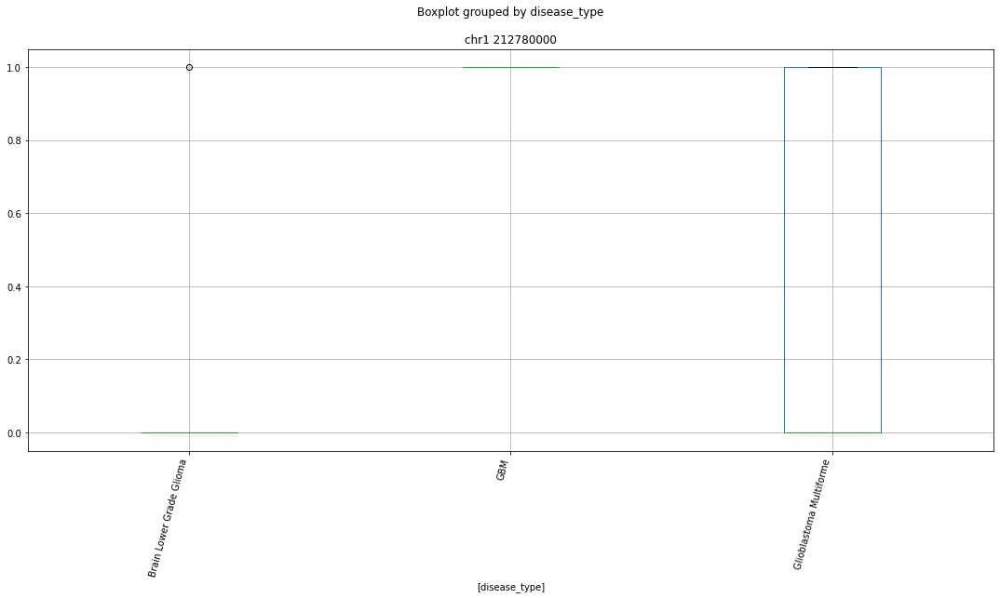

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr6 31933000


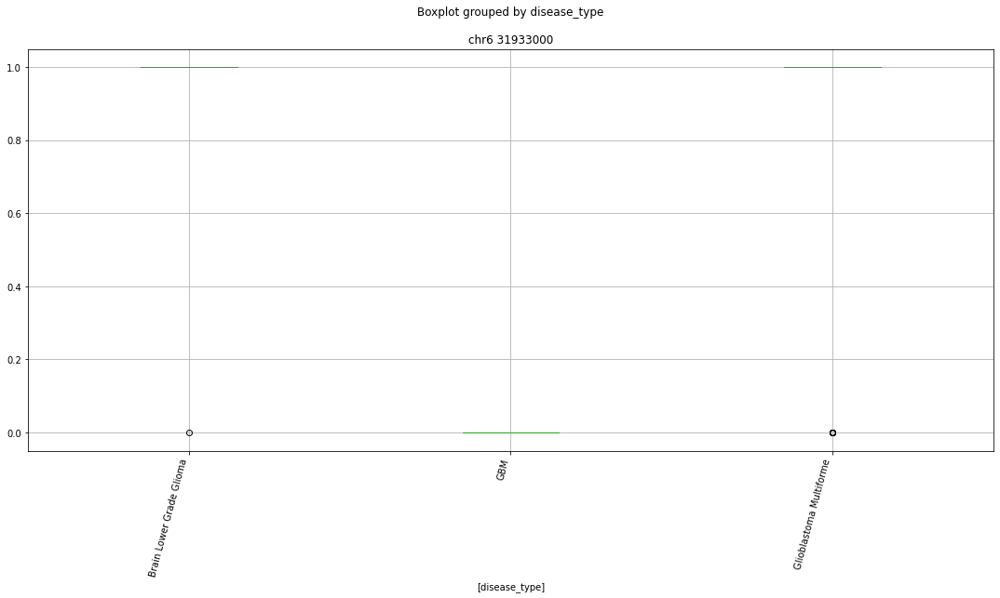

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr11 3398000


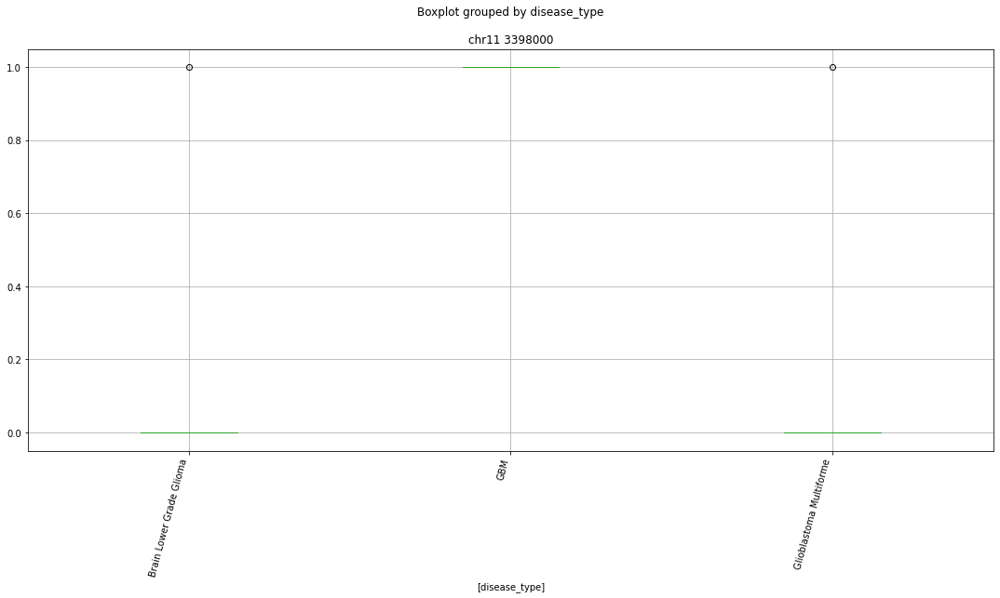

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr12 68484000


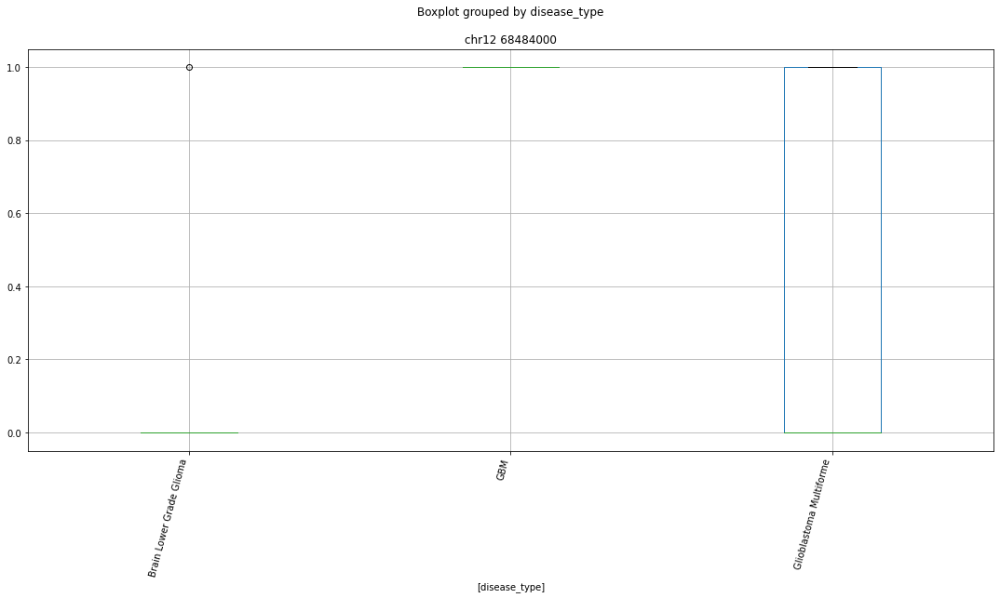

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr17 27034000


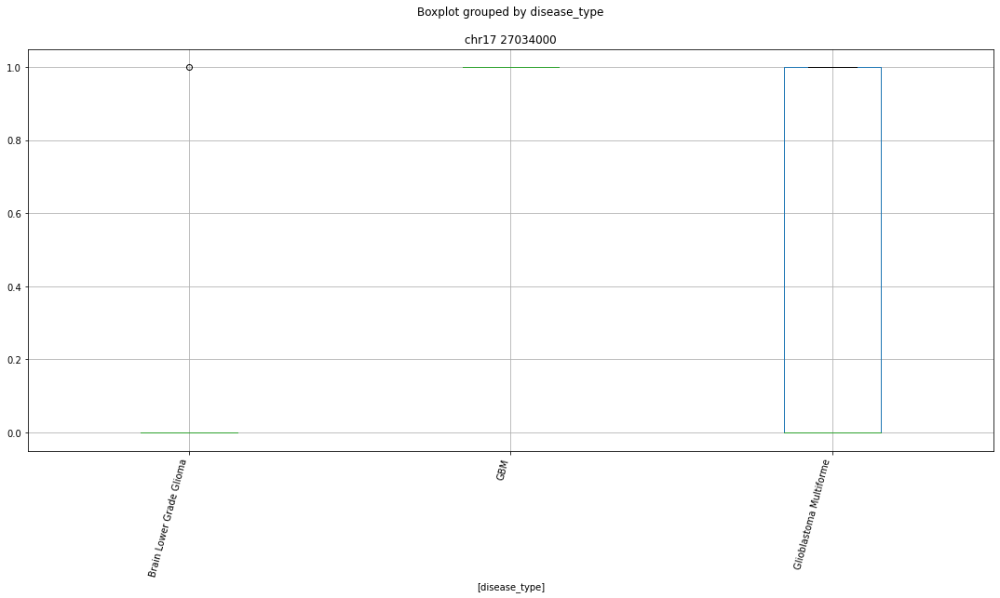

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr10 70686000


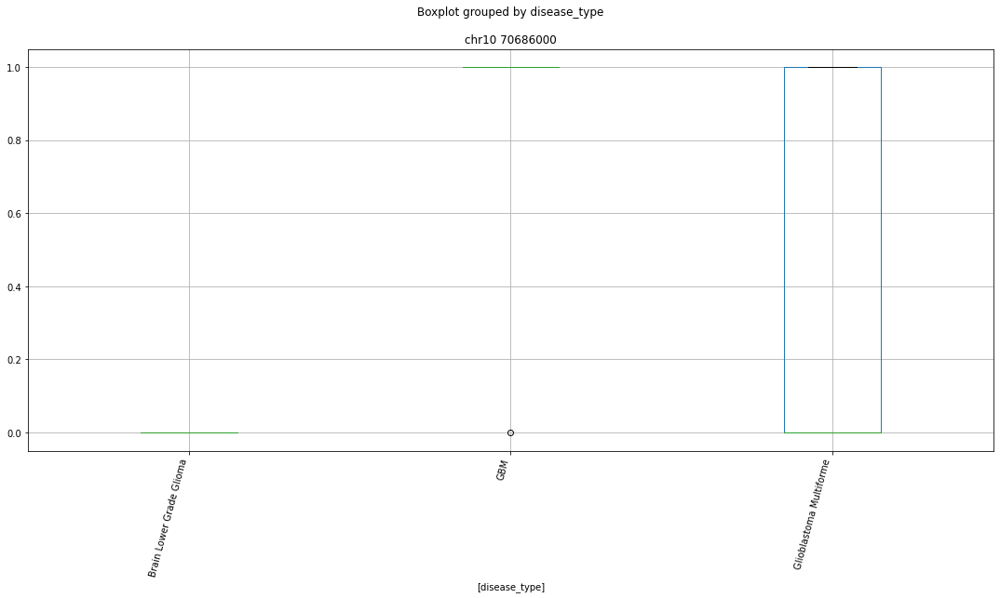

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr5 65941000


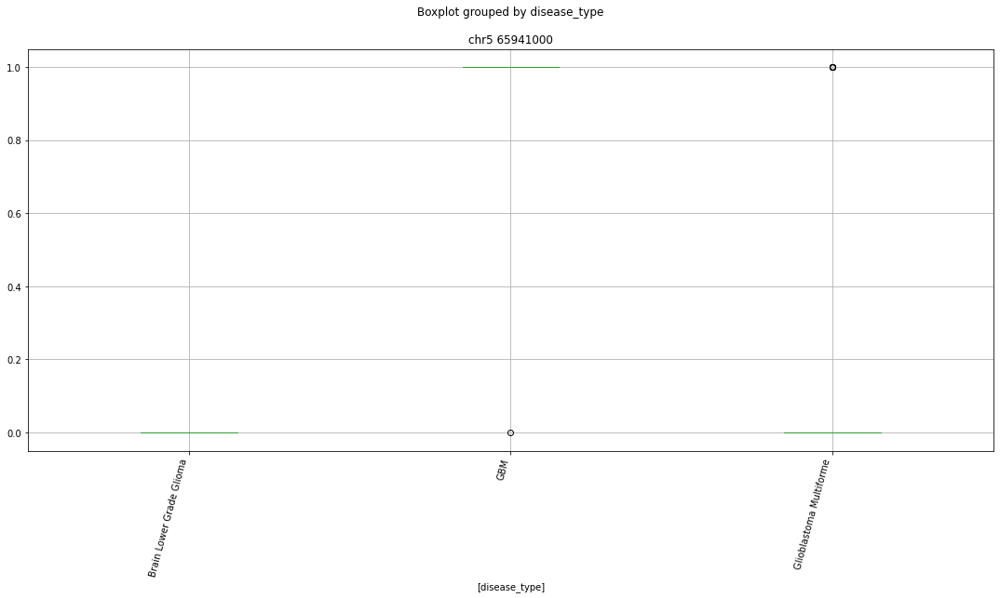

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr7 101093000


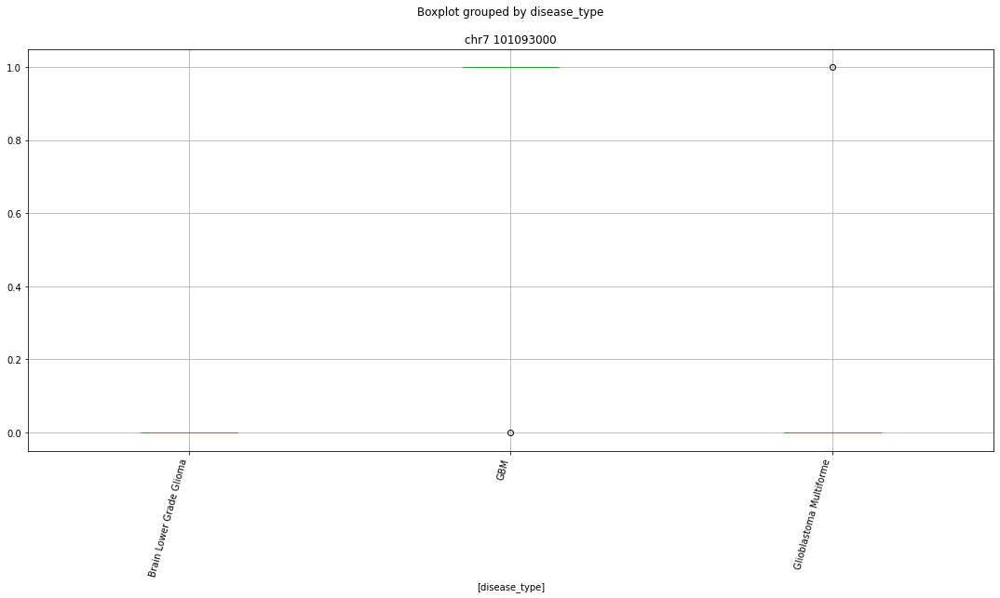

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr11 6690000


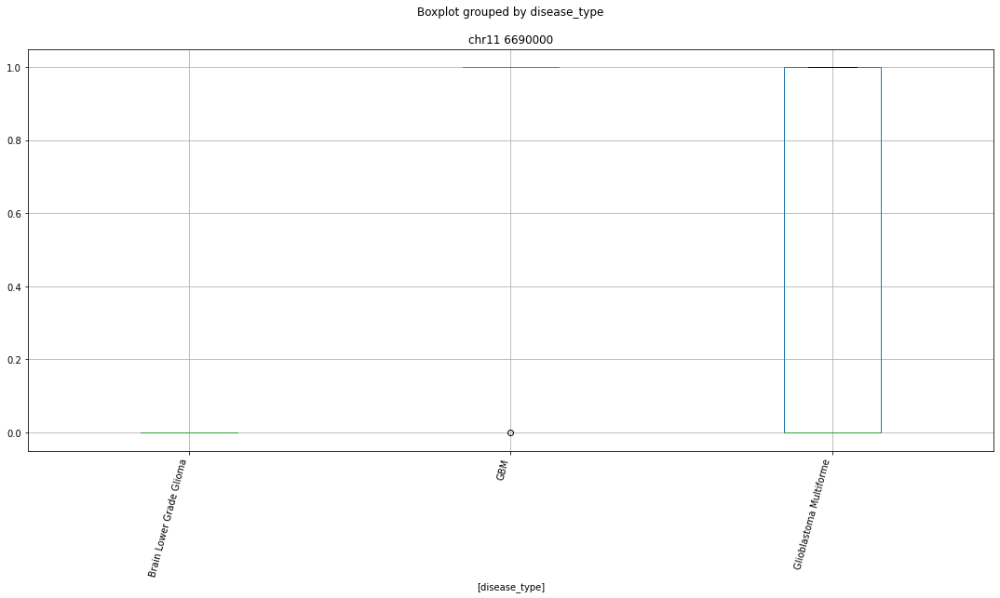

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr4 37670000


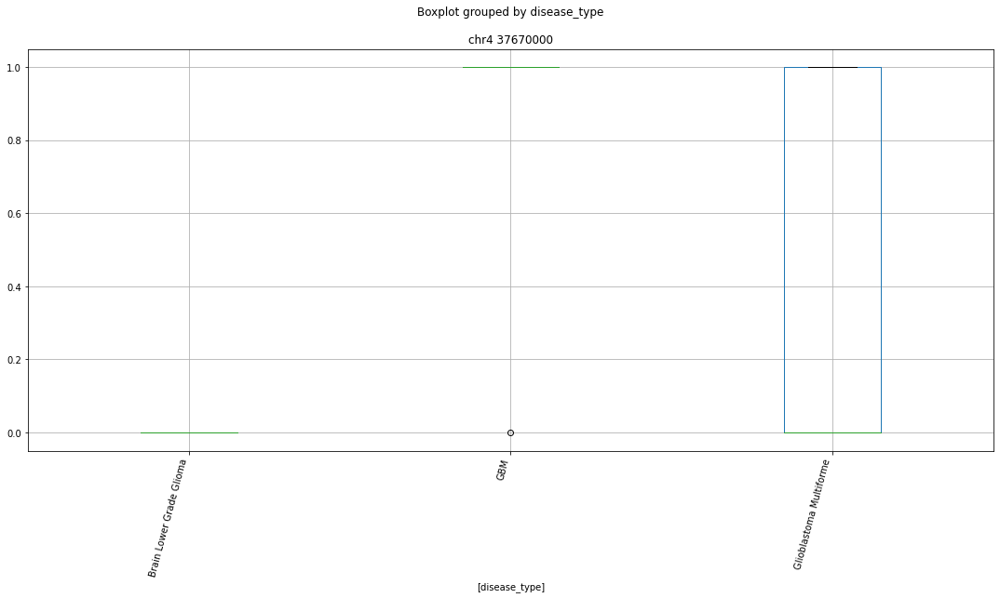

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr1 25604000


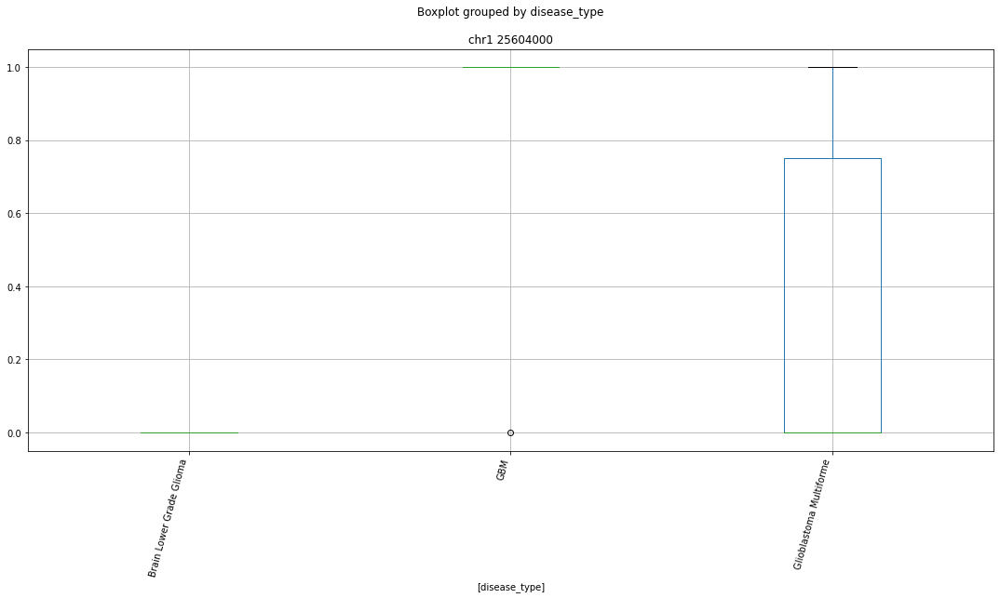

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr18 76001000


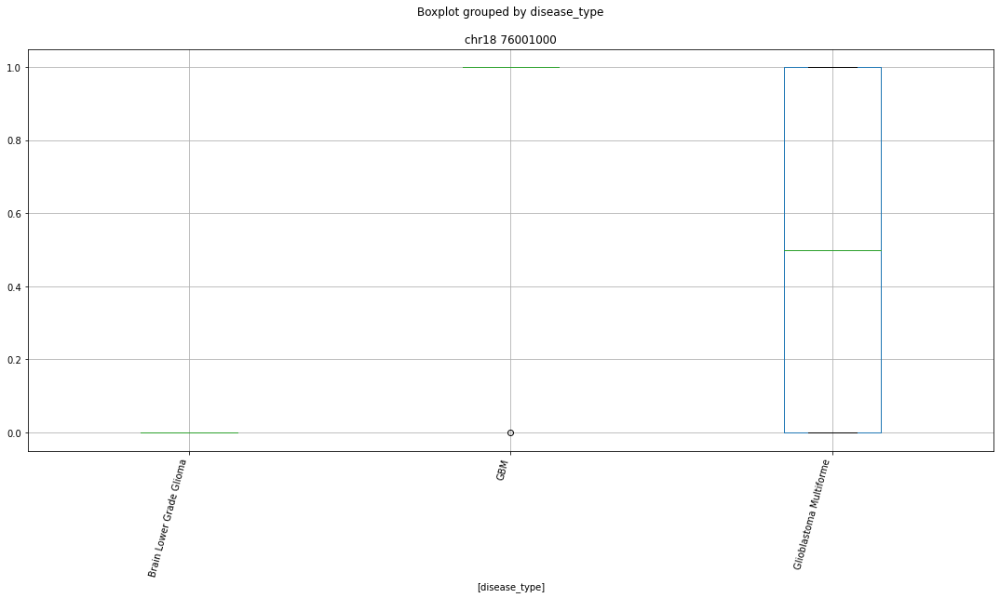

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr19 23532000


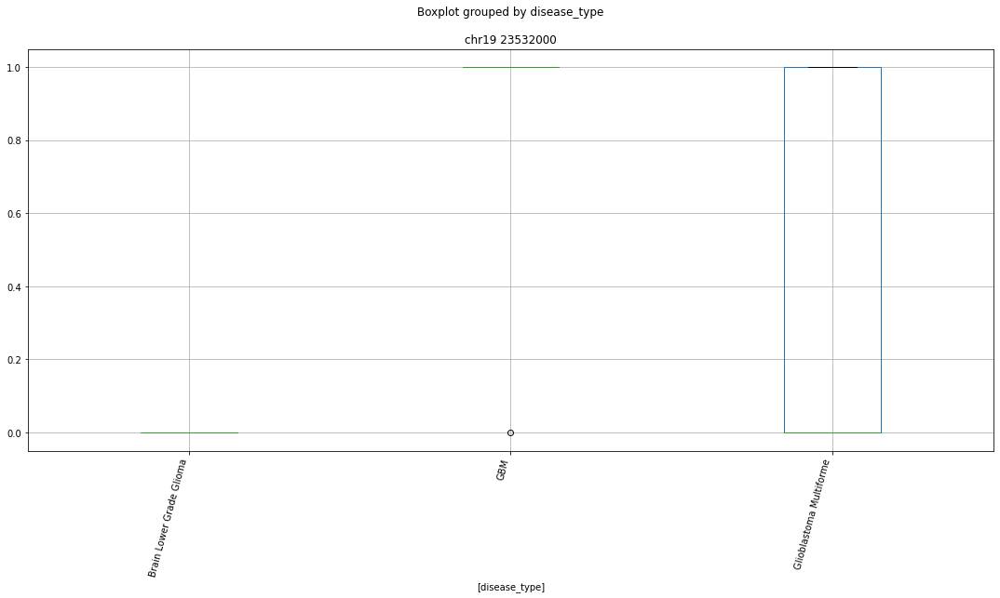

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr19 39959000


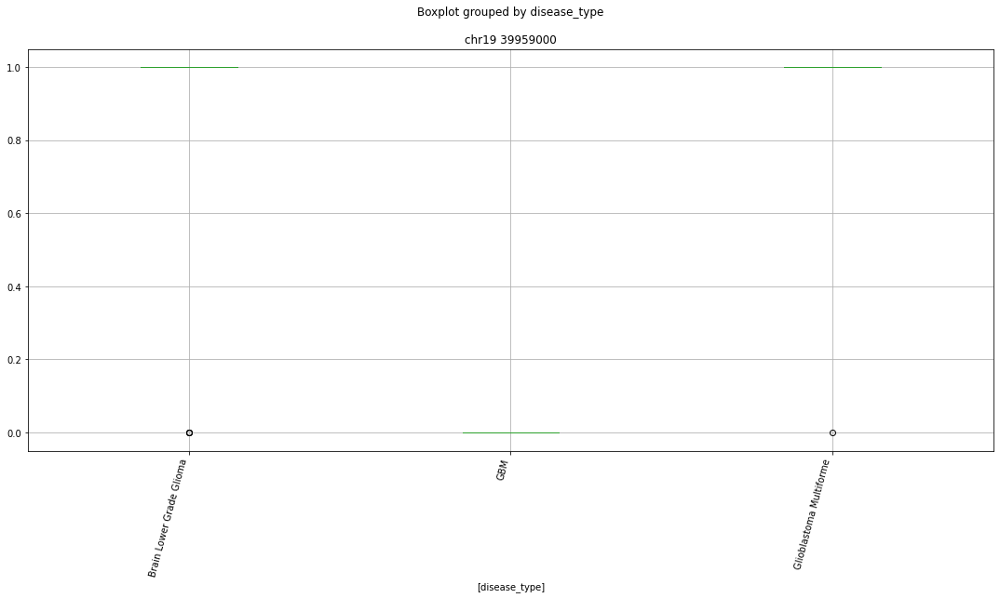

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr17 46283000


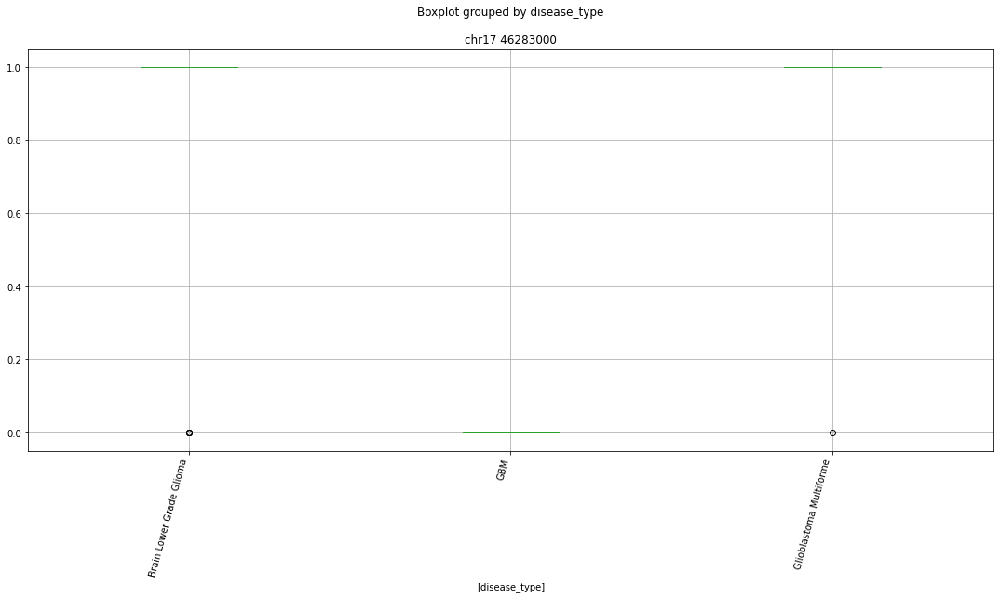

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr11 3398000


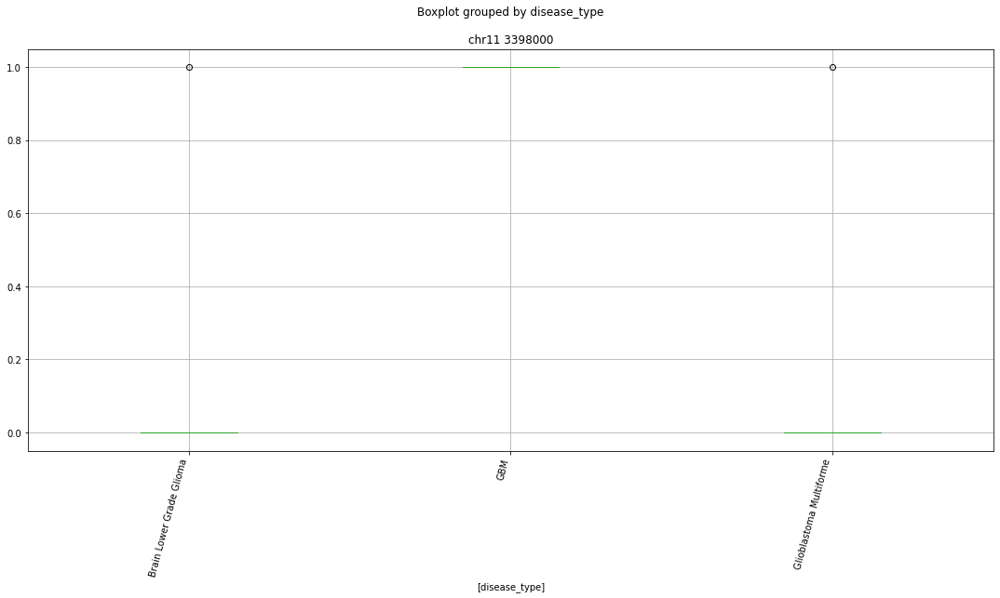

 p : 7.649785019548989e-25  ( t : 20.581140234042756 ) :  chr3 61672000


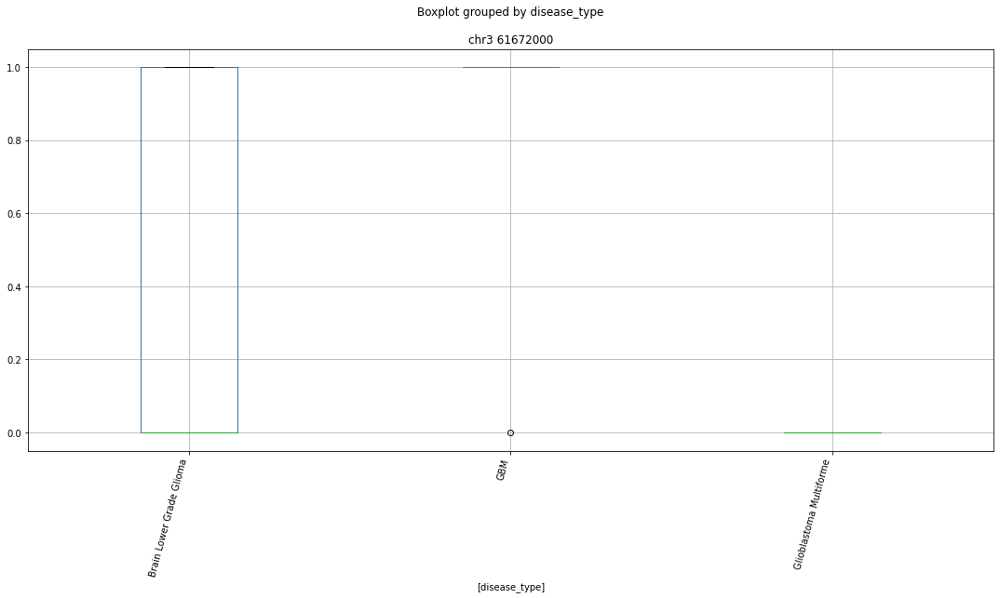

 p : 7.649785019548989e-25  ( t : 20.581140234042756 ) :  chr2 38756000


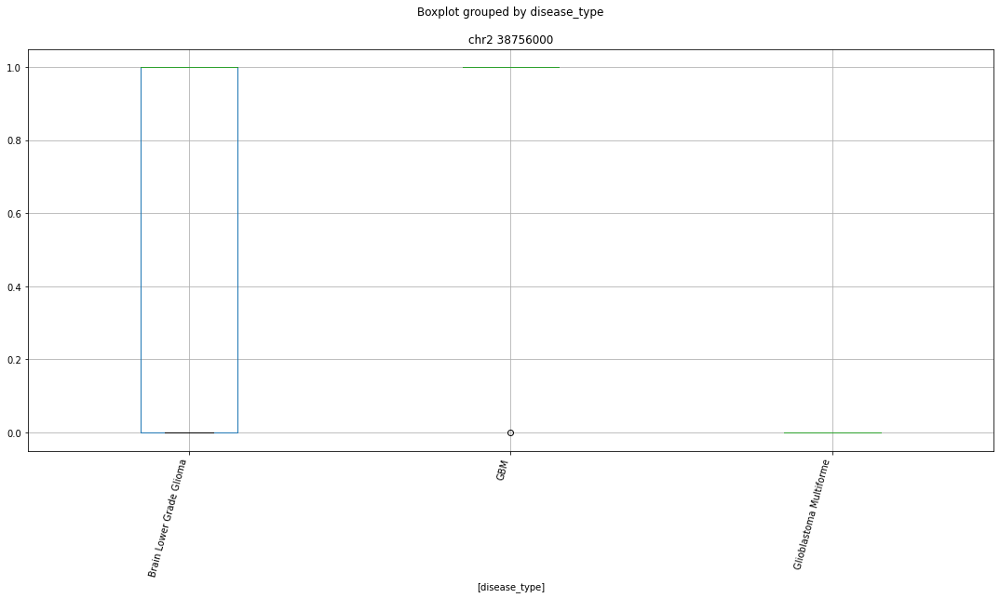

 p : 2.8371647709053813e-21  ( t : 15.78690644471993 ) :  chr15 45292000


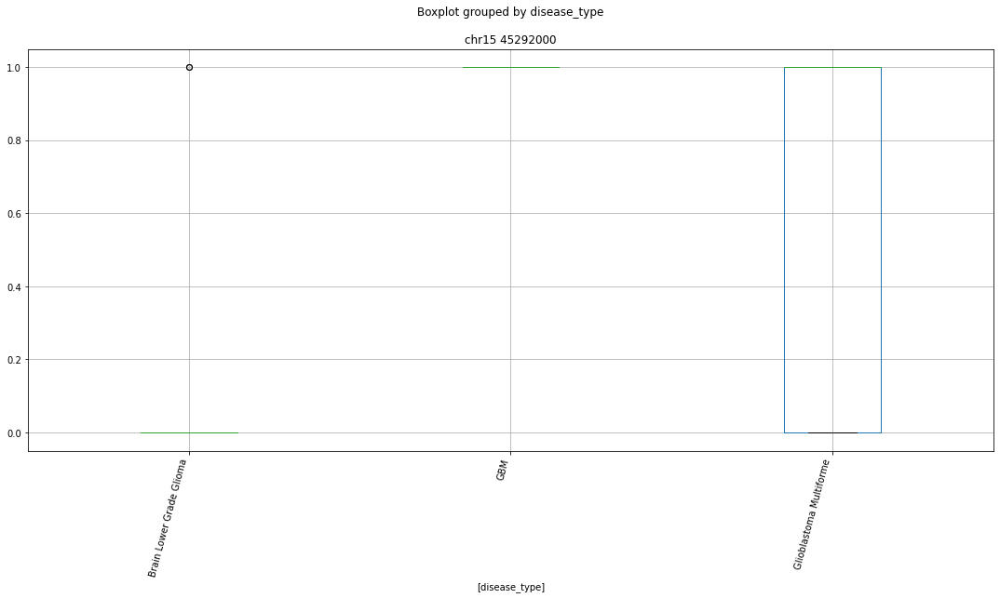

 p : 2.887102389033911e-21  ( t : 13.486167444043069 ) :  chr11 61167000


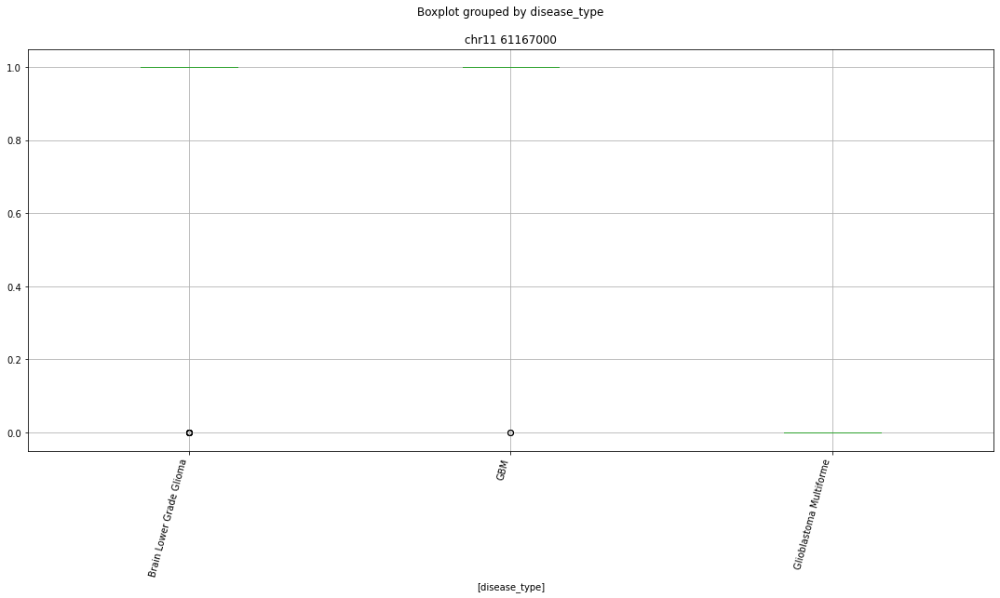

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr8 116680000


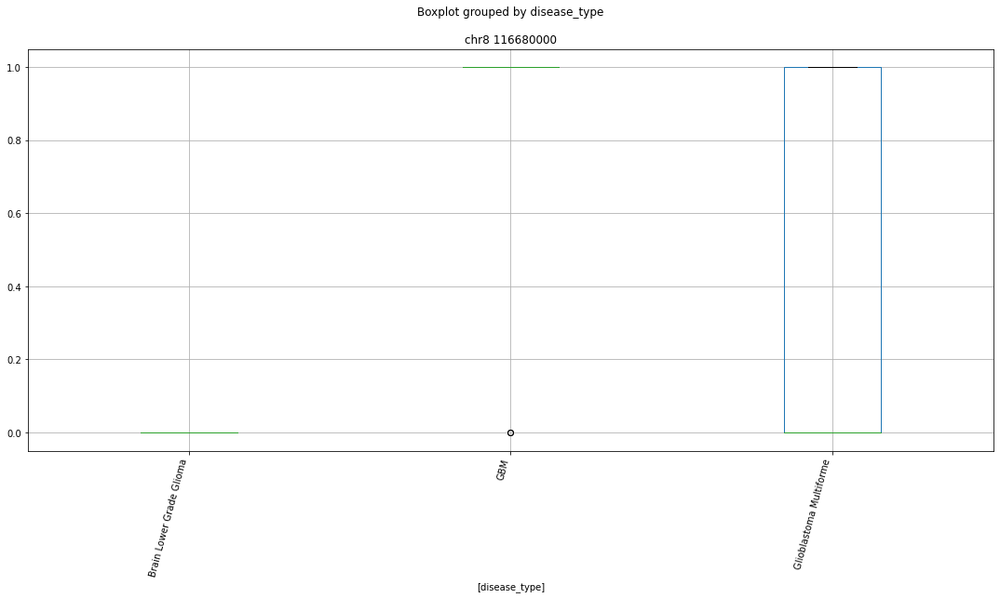

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr4 6836000


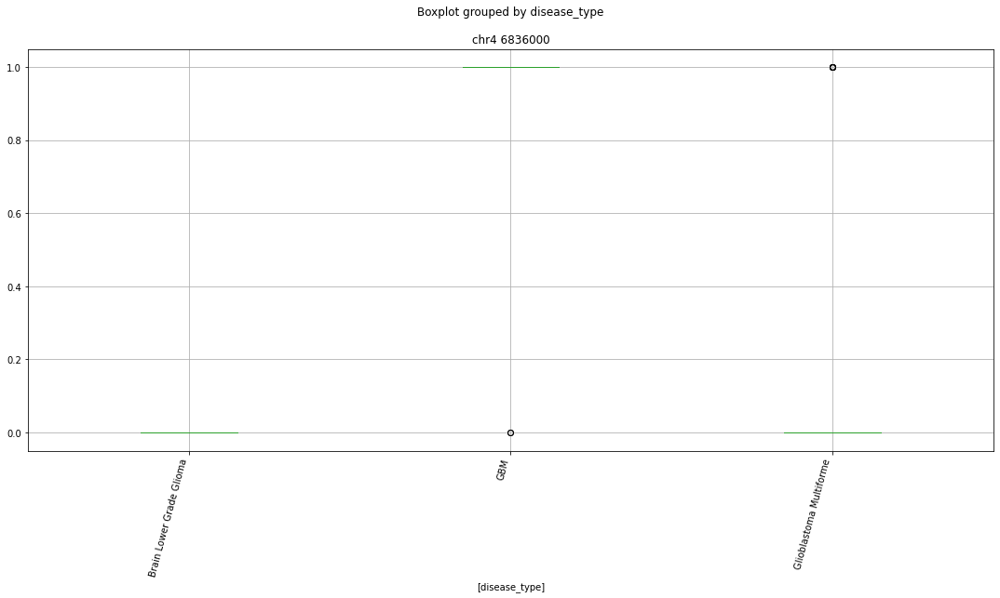

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr12 48915000


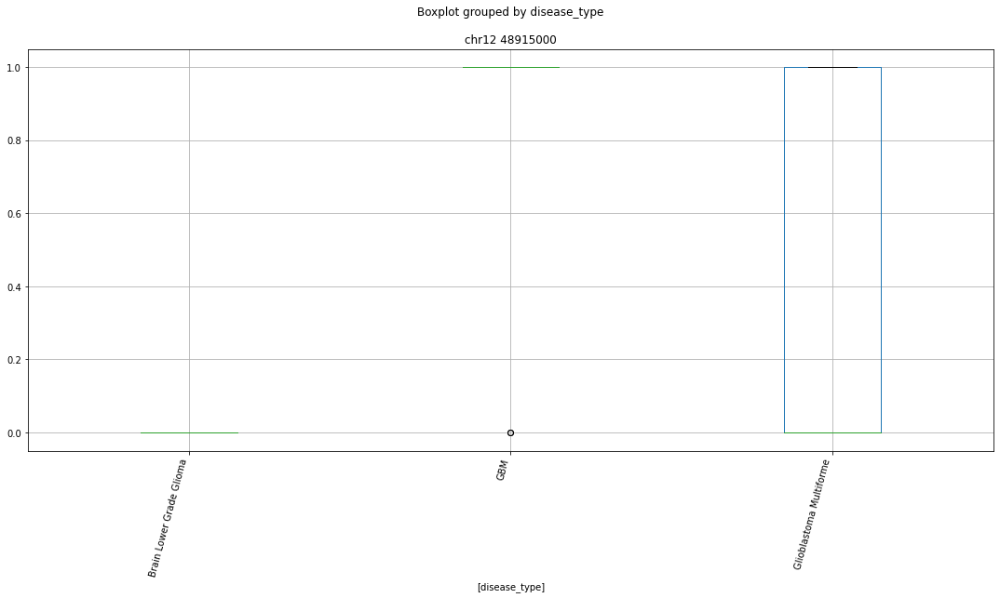

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr1 109176000


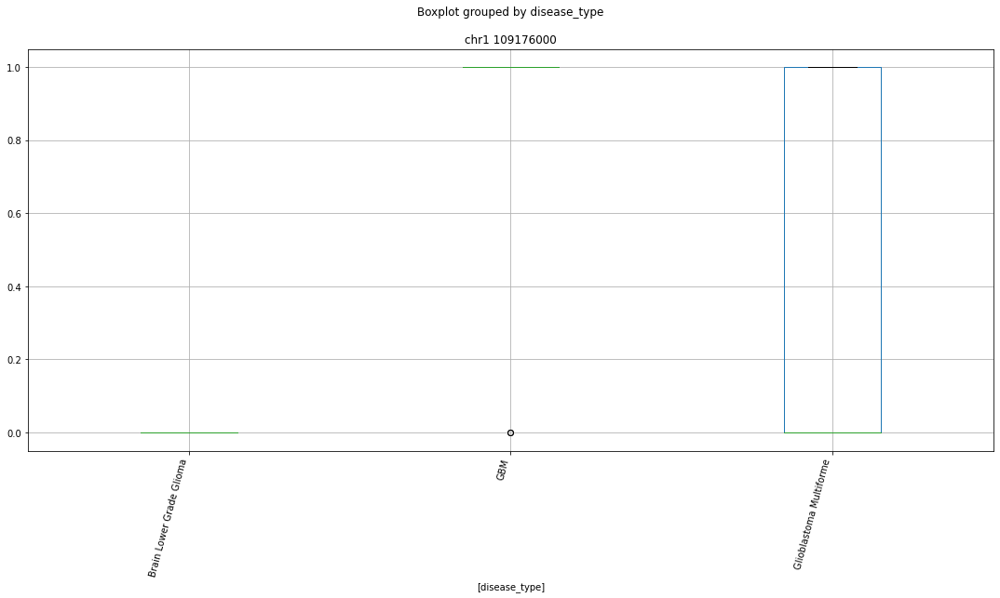

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr8 141201000


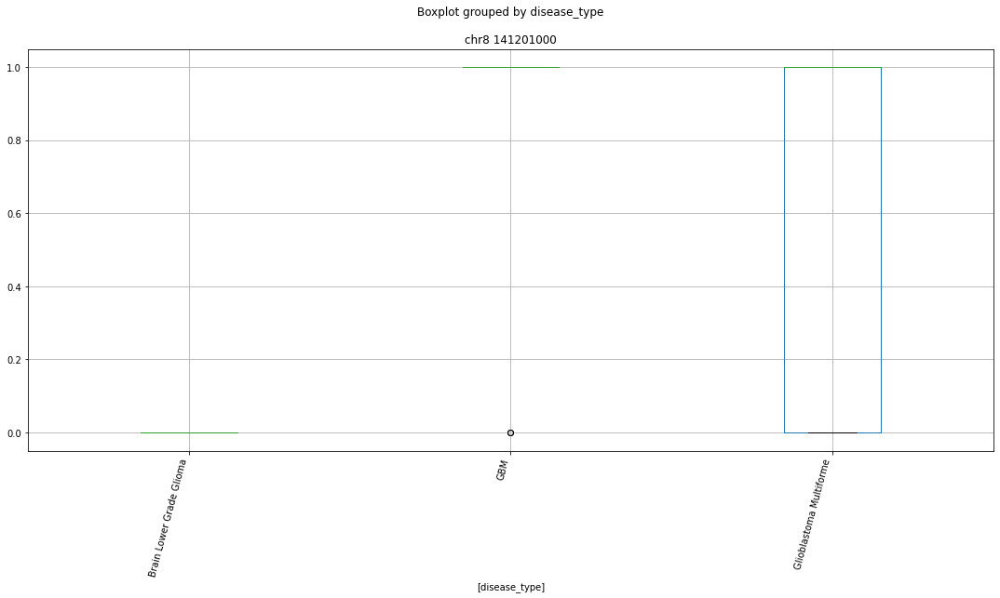

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr15 72102000


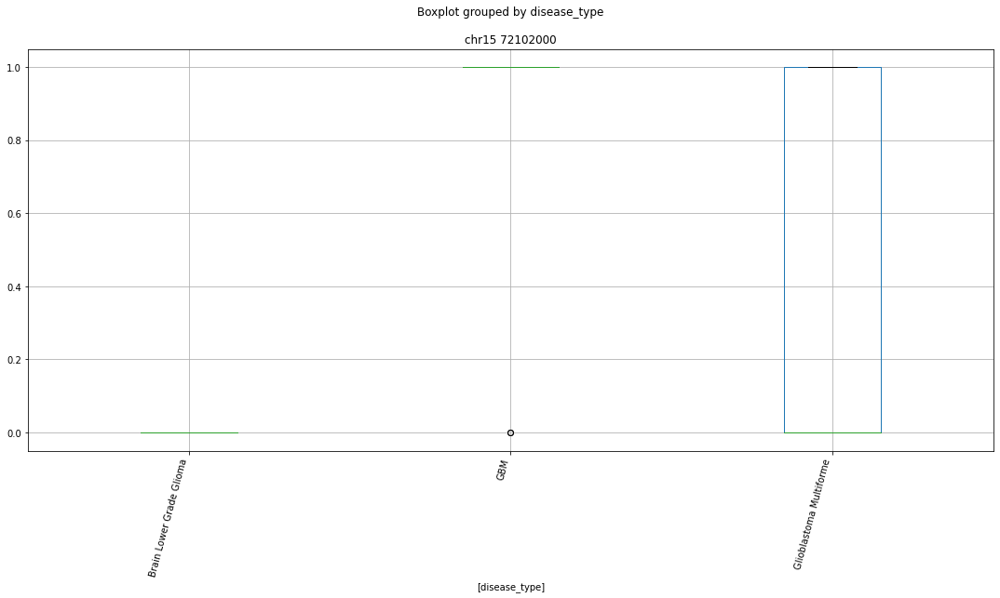

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr2 202714000


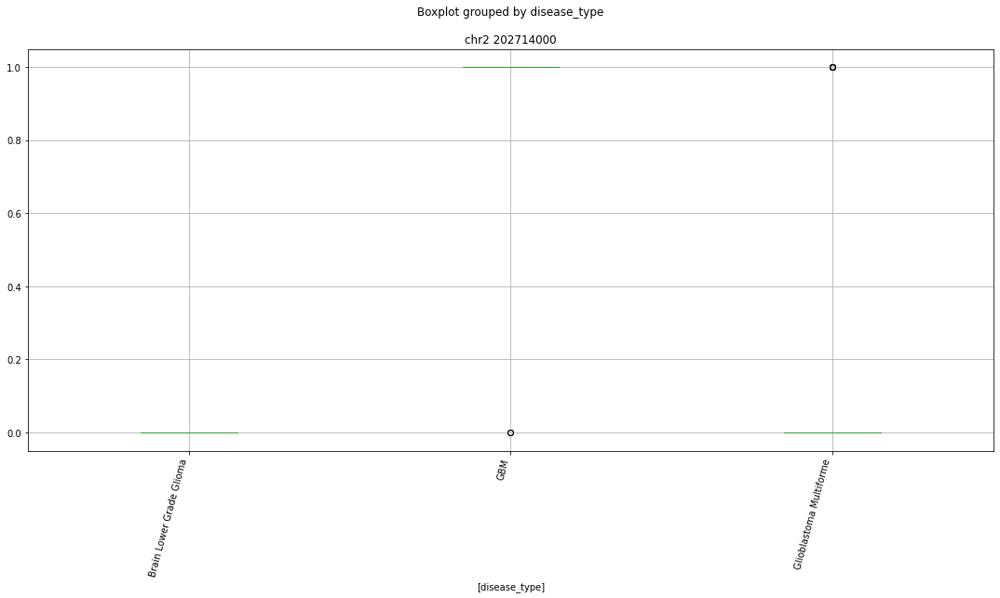

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr20 45645000


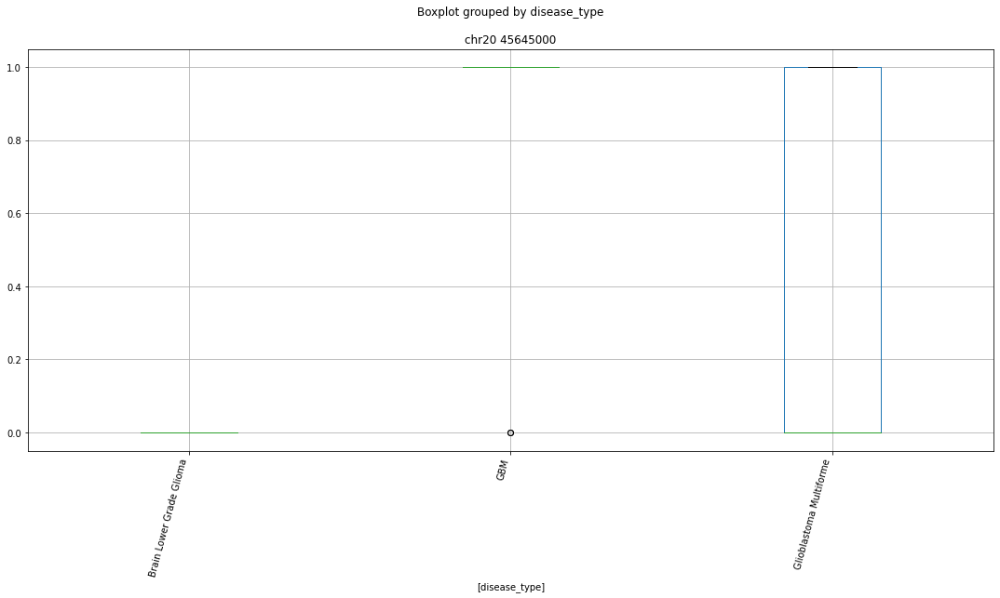

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr12 73853000


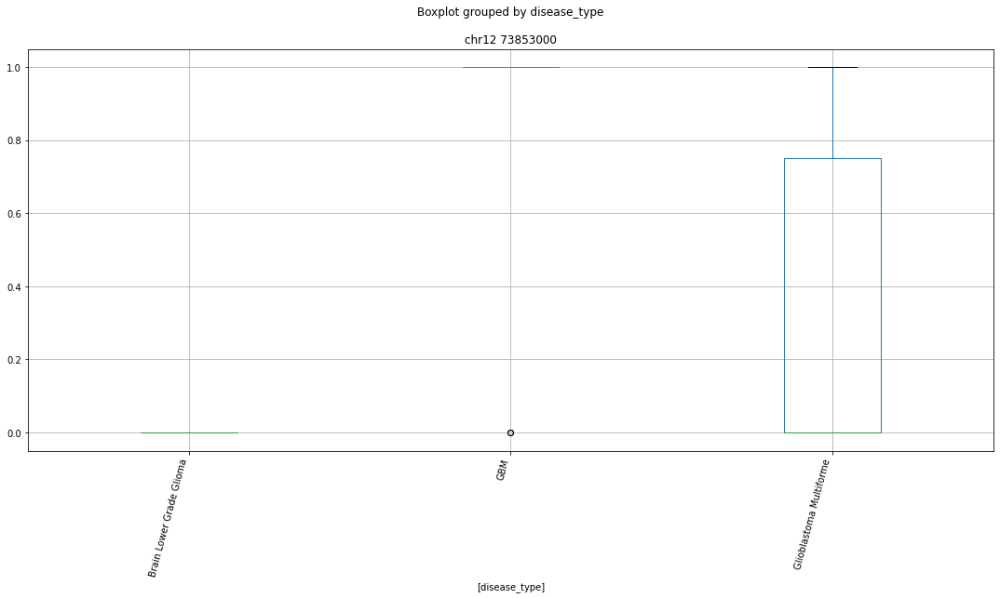

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr2 27556000


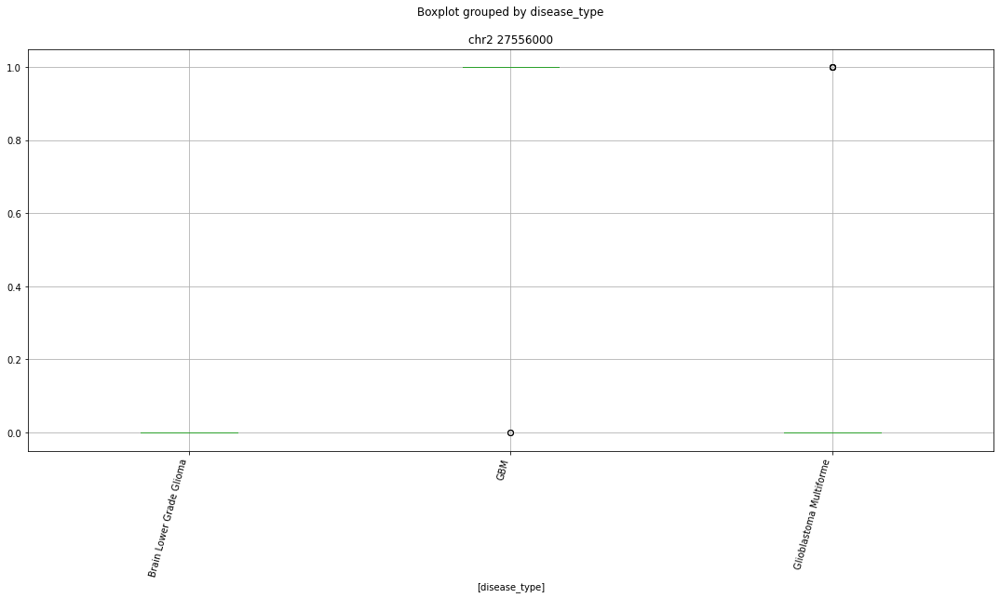

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr4 151732000


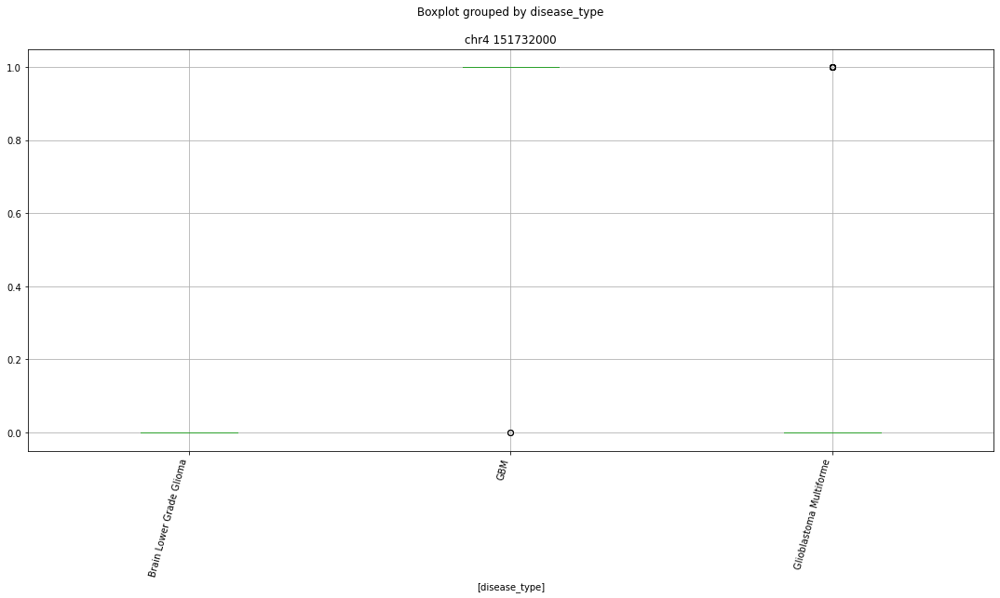

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr3 50310000


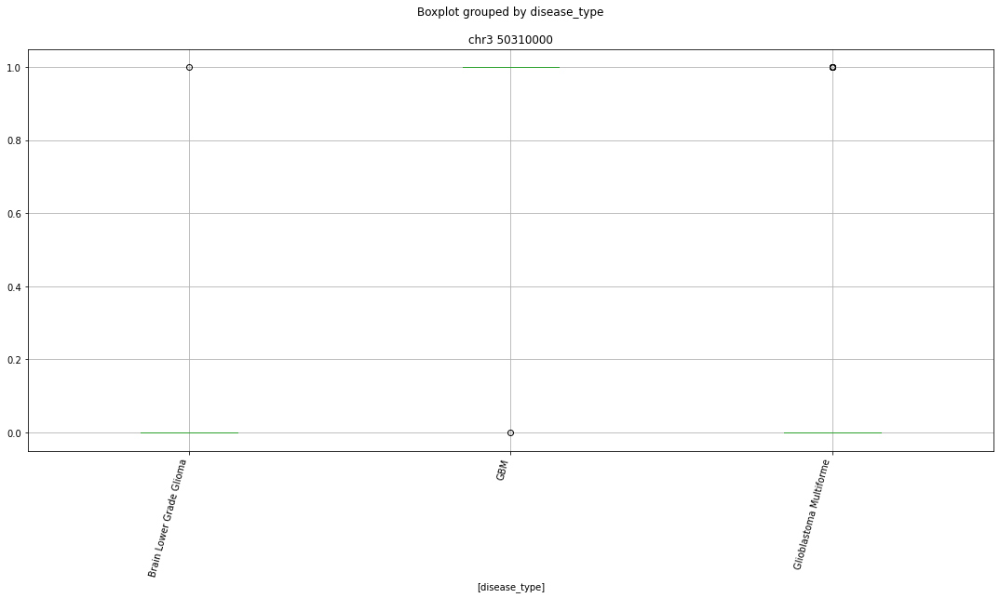

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr10 28934000


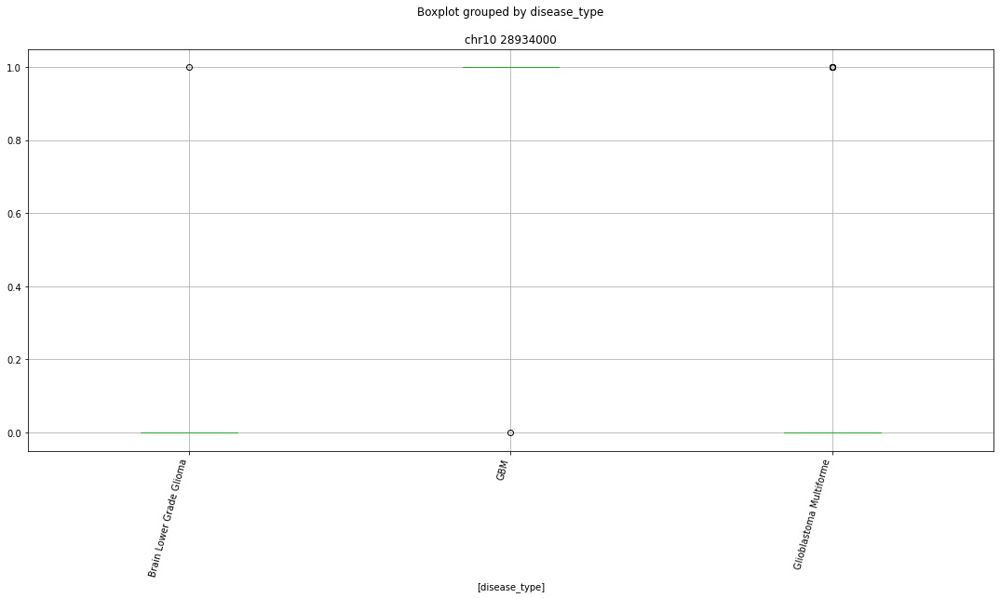

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr15 52286000


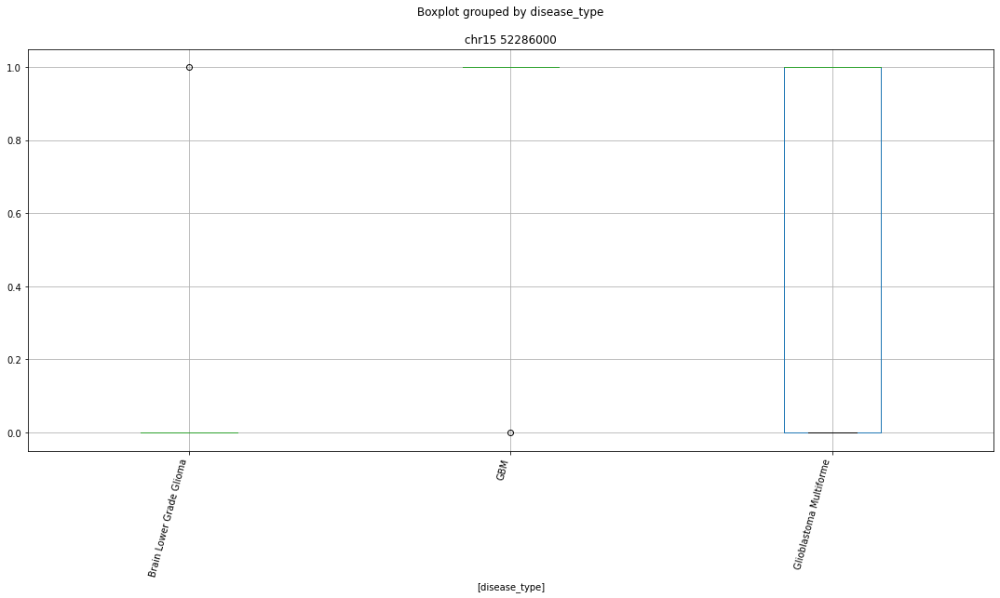

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr8 5726000


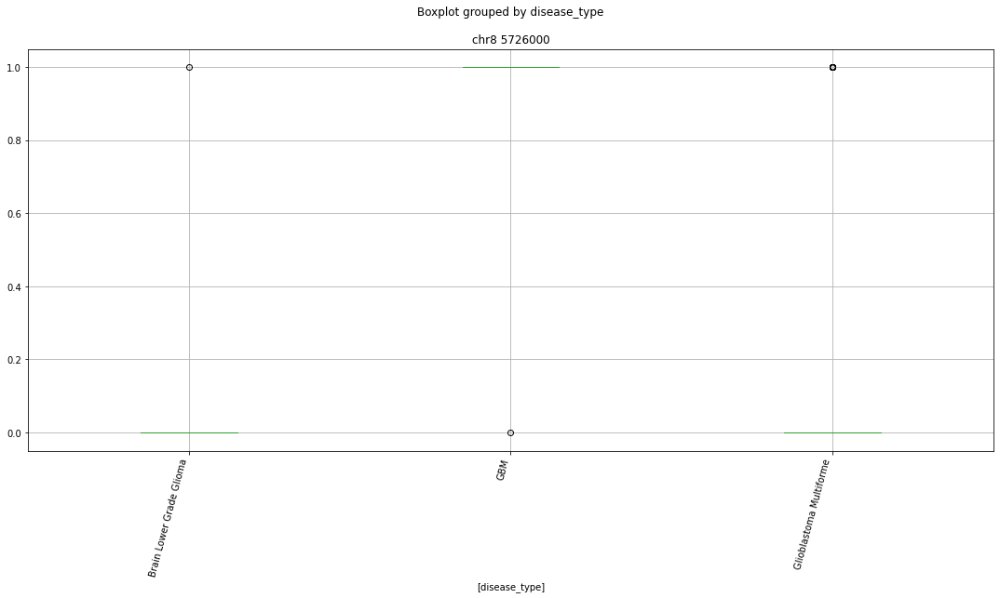

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr3 196974000


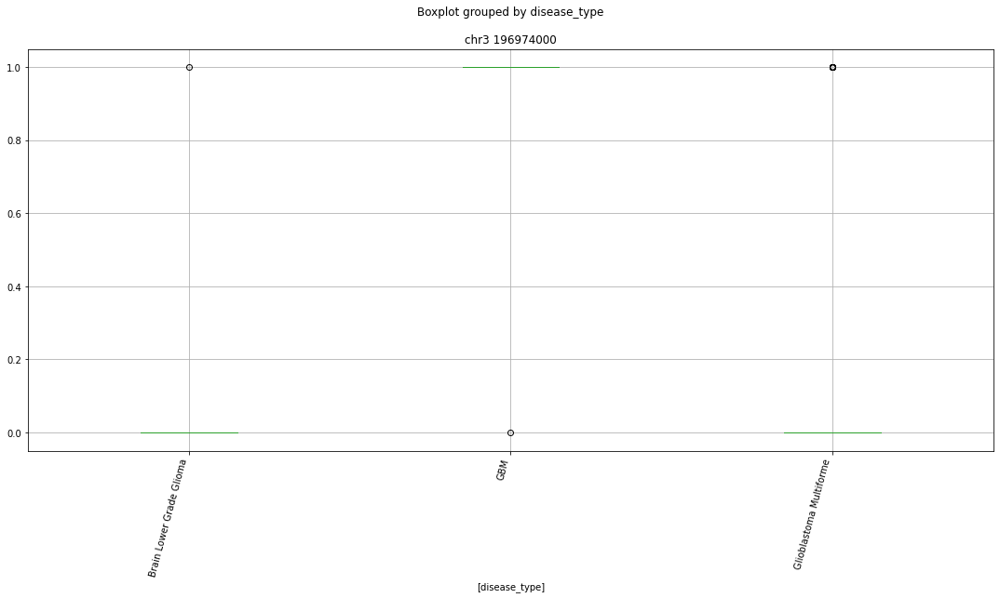

 p : 6.052106007130182e-19  ( t : 14.651507317223937 ) :  chr1 108518000


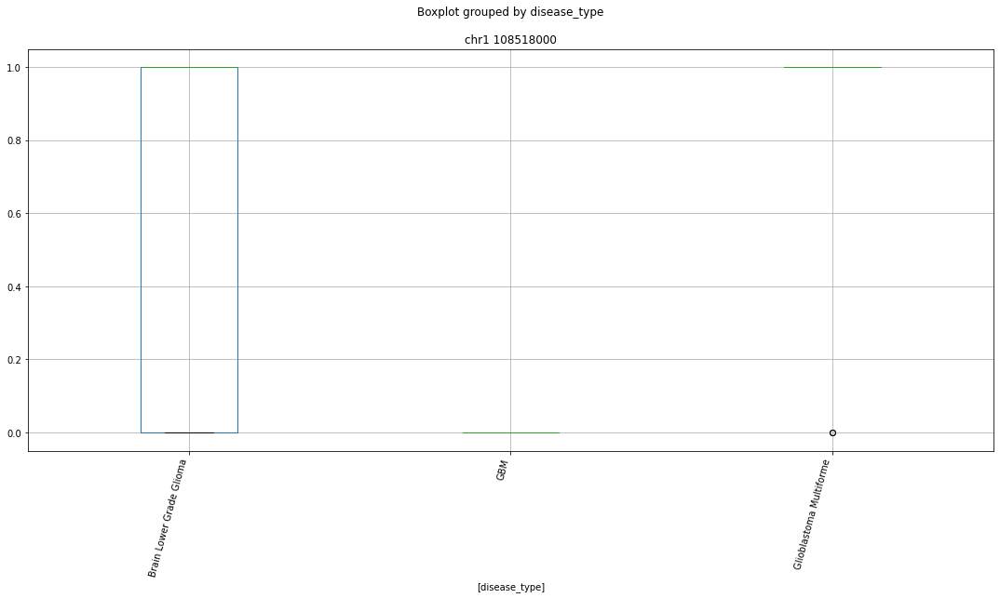

 p : 3.5344159057936754e-18  ( t : 13.982131454109561 ) :  chr11 61167000


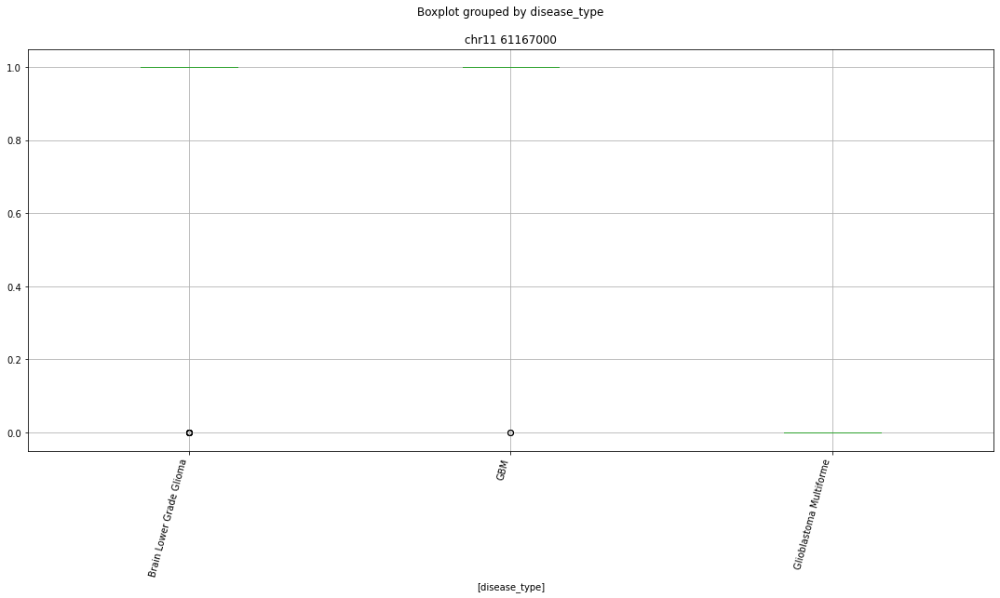

 p : 4.006343388130227e-18  ( t : 13.935349037694028 ) :  chr7 101093000


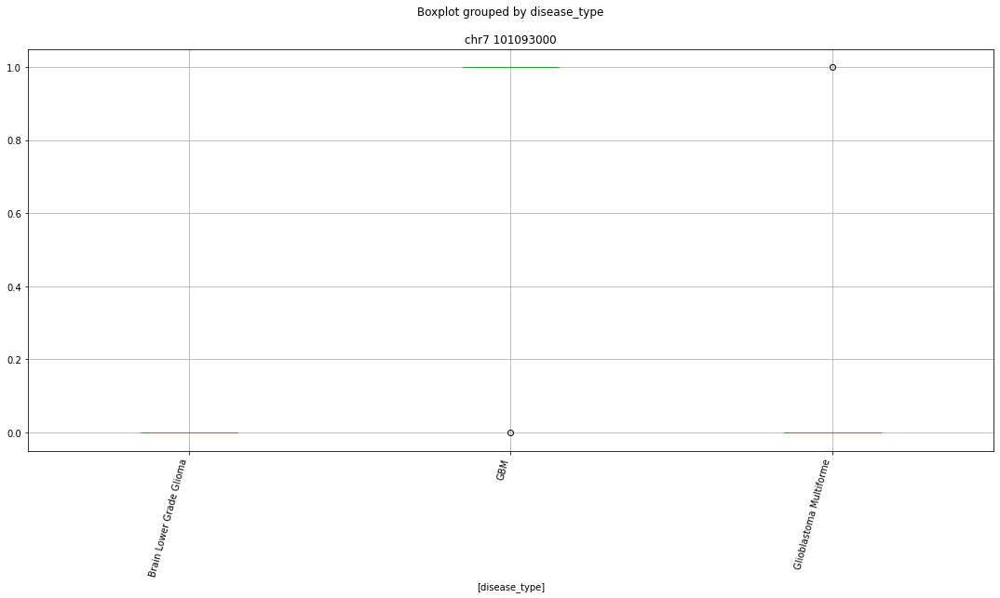

 p : 1.4682271381516776e-17  ( t : 11.319912144486992 ) :  chr11 83317000


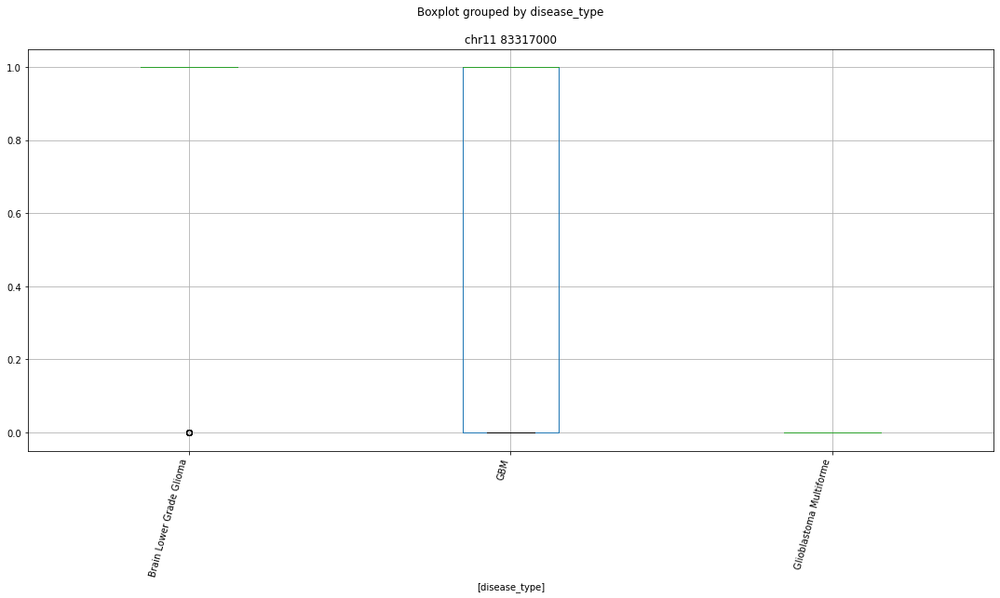

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr4 40146000


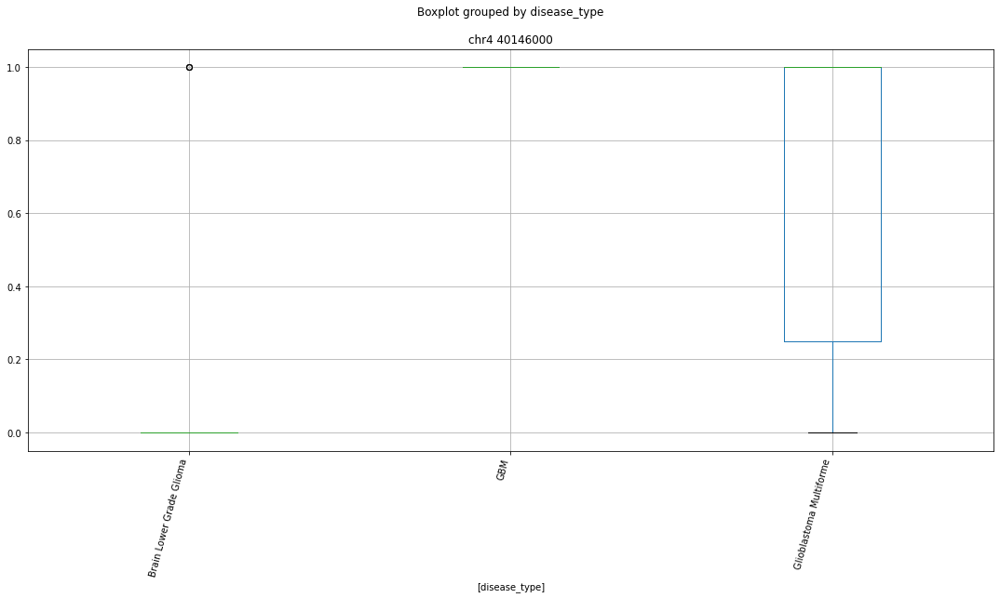

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr14 80287000


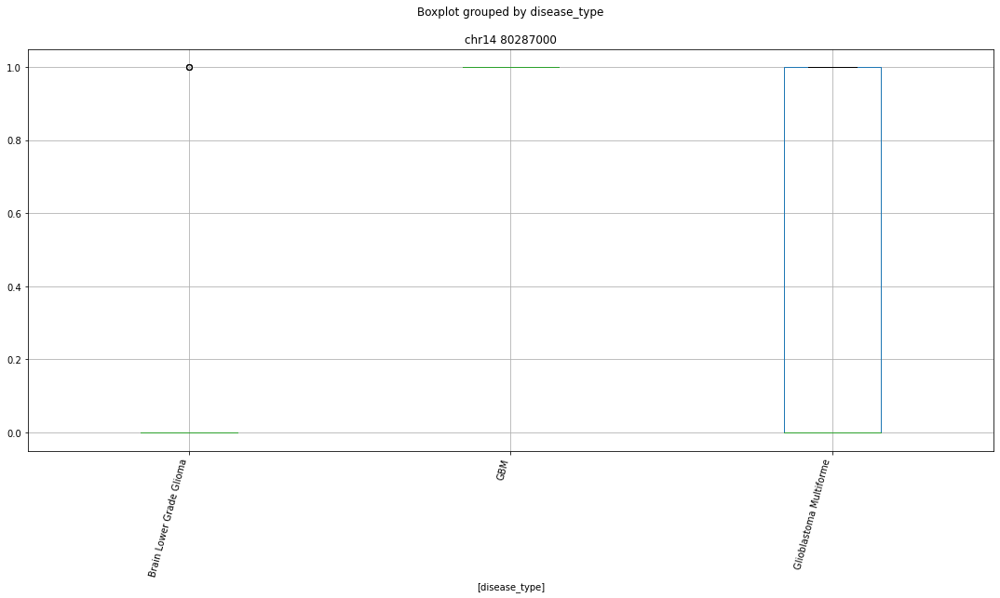

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 226114000


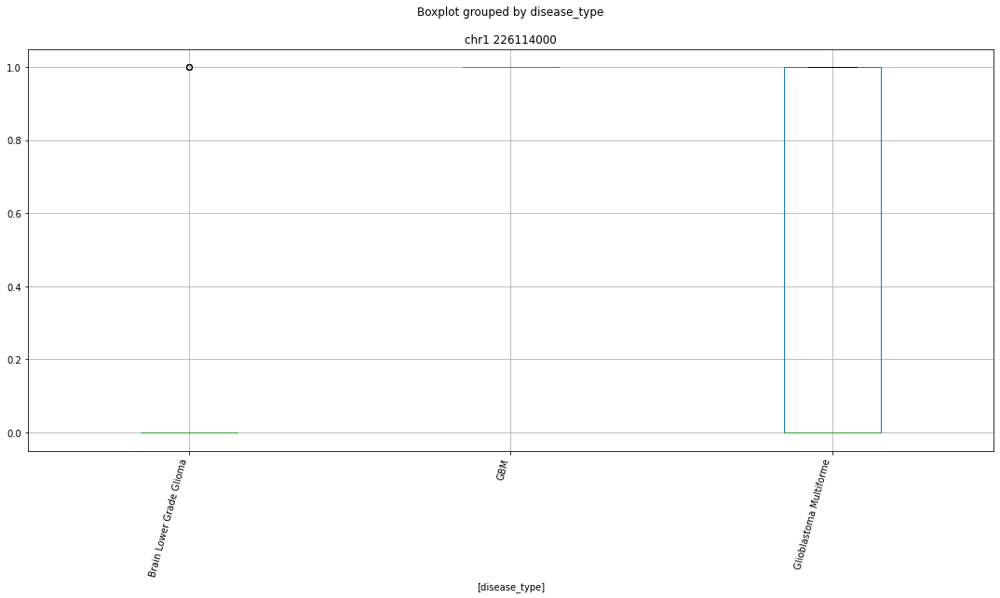

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 23258000


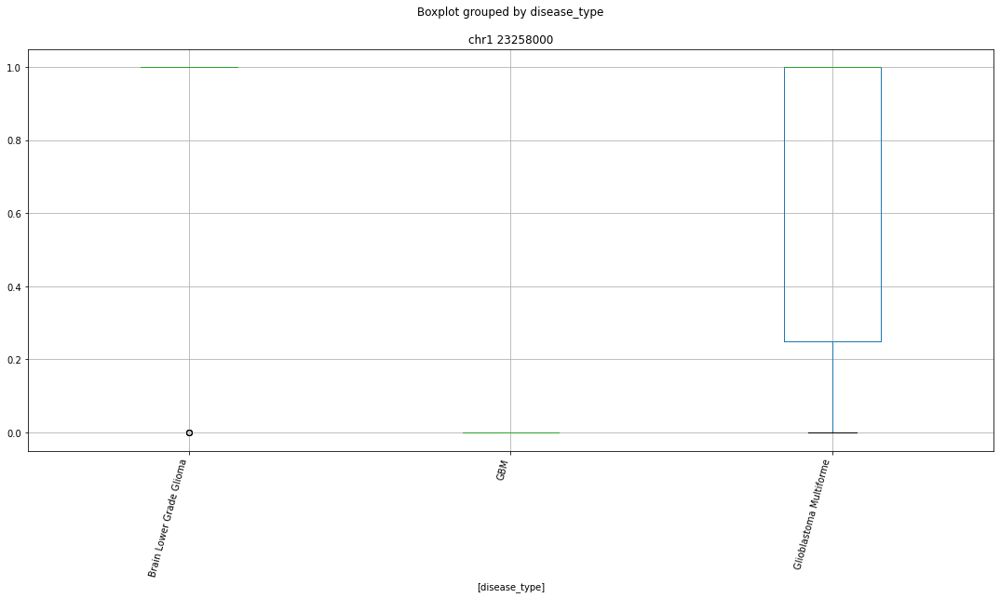

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr11 116348000


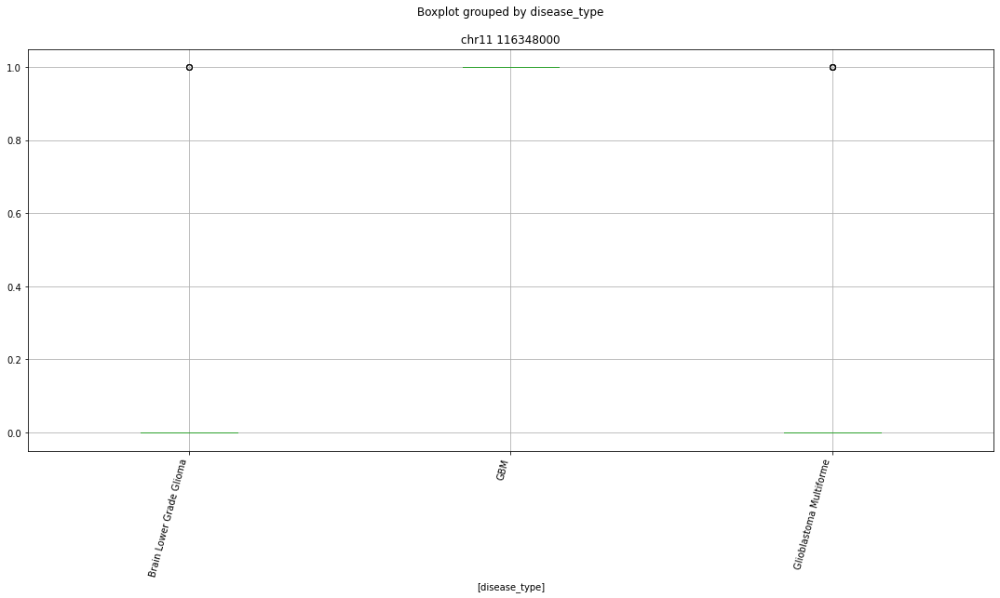

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr19 39959000


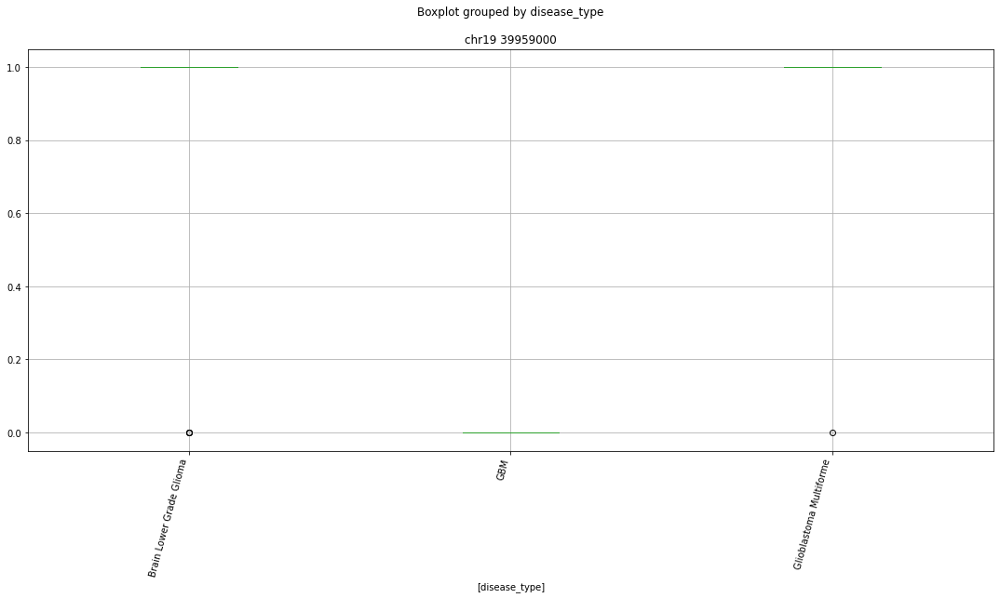

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 43502000


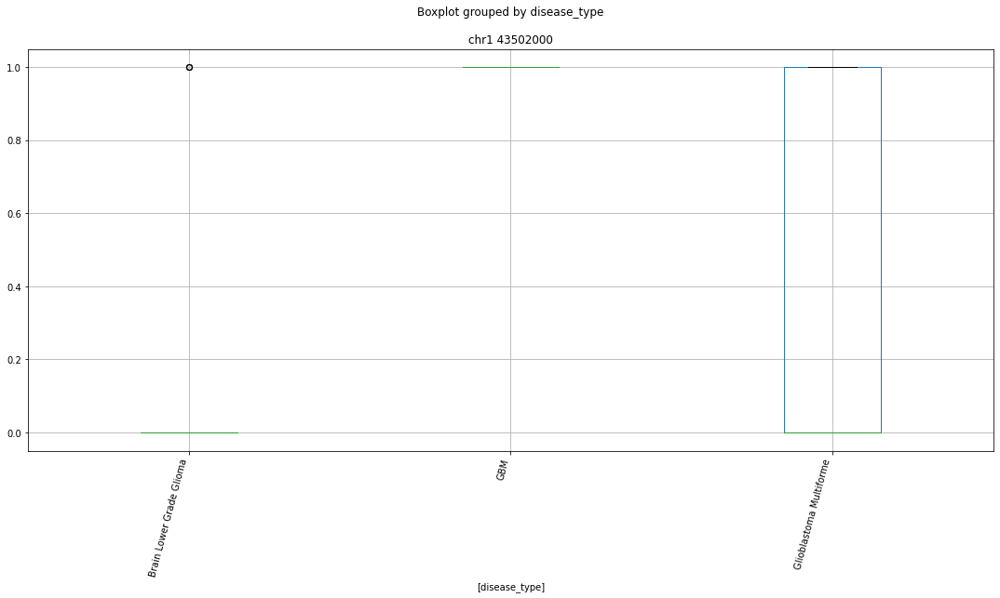

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr13 100618000


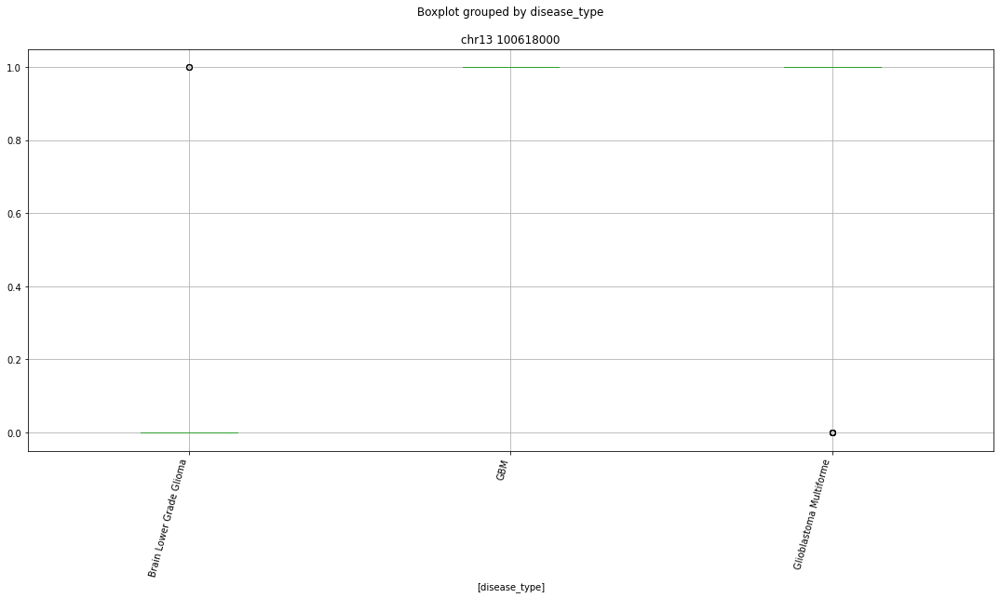

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr9 122711000


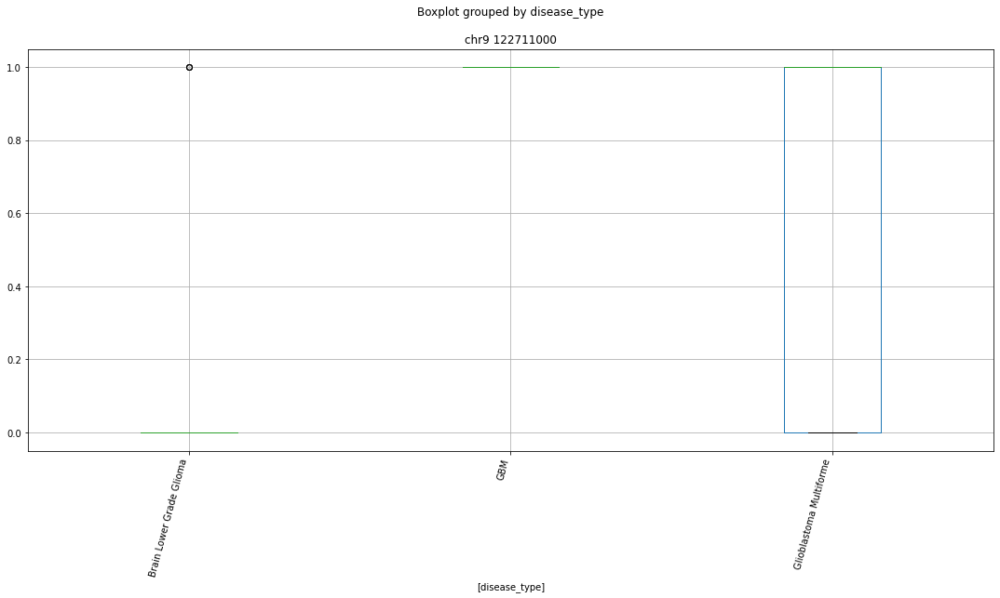

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr7 20669000


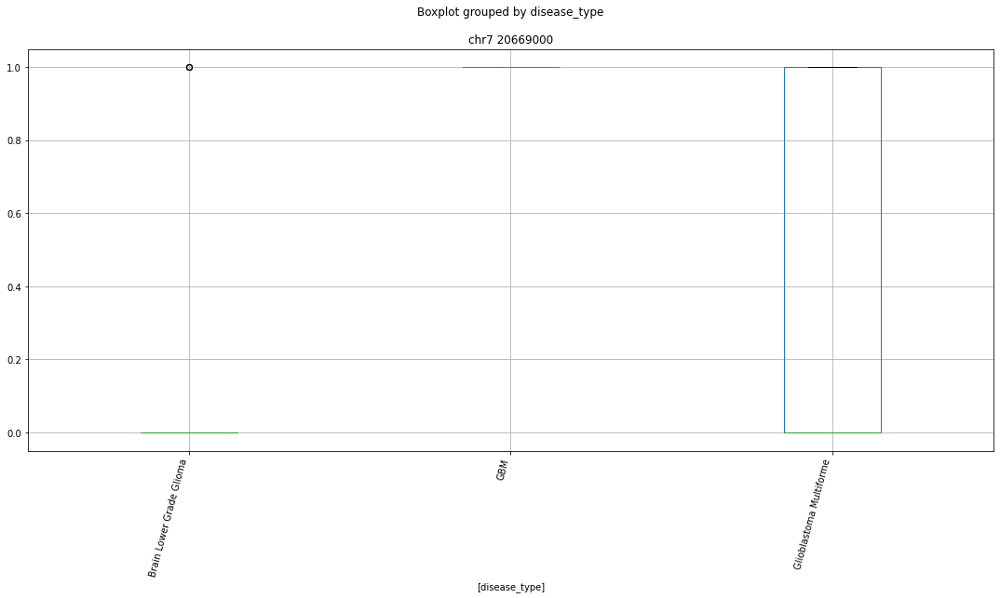

 p : 2.0346699265924837e-16  ( t : 11.961887225105135 ) :  chr5 180530000


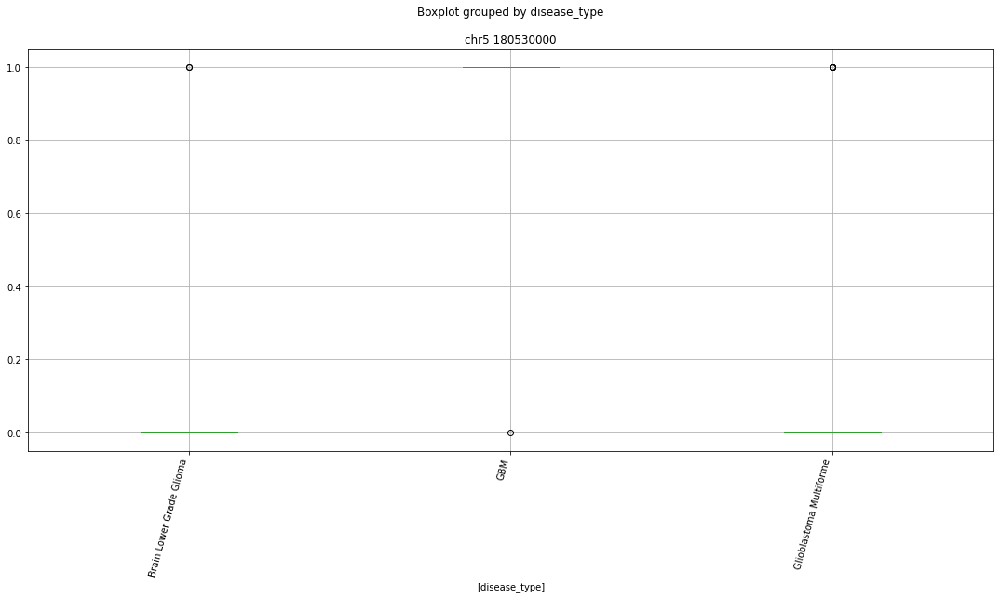

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr11 60492000


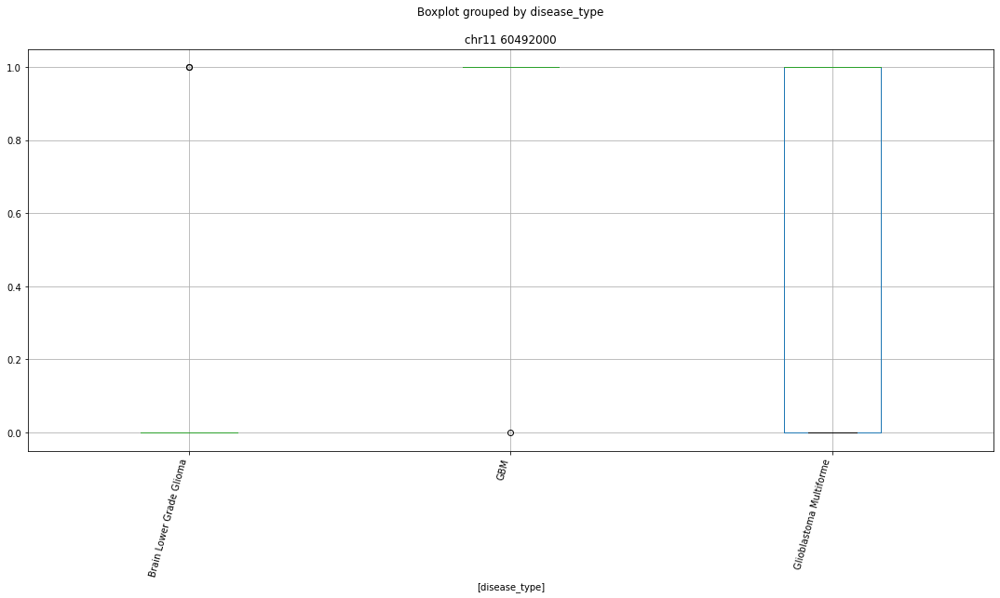

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr1 52182000


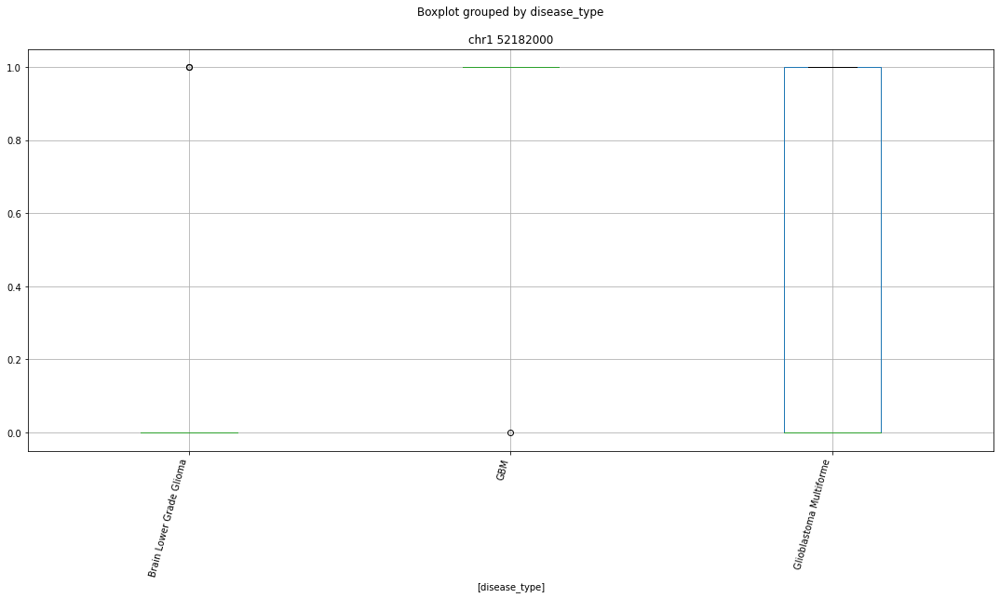

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr14 66544000


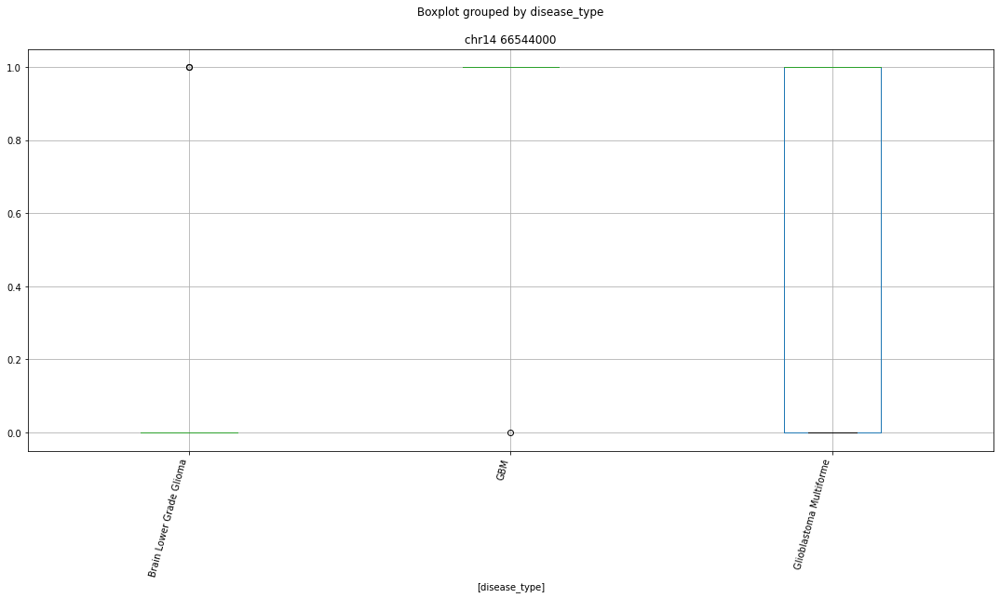

 p : 2.7590440009727814e-16  ( t : 10.605031069679022 ) :  chr2 15610000


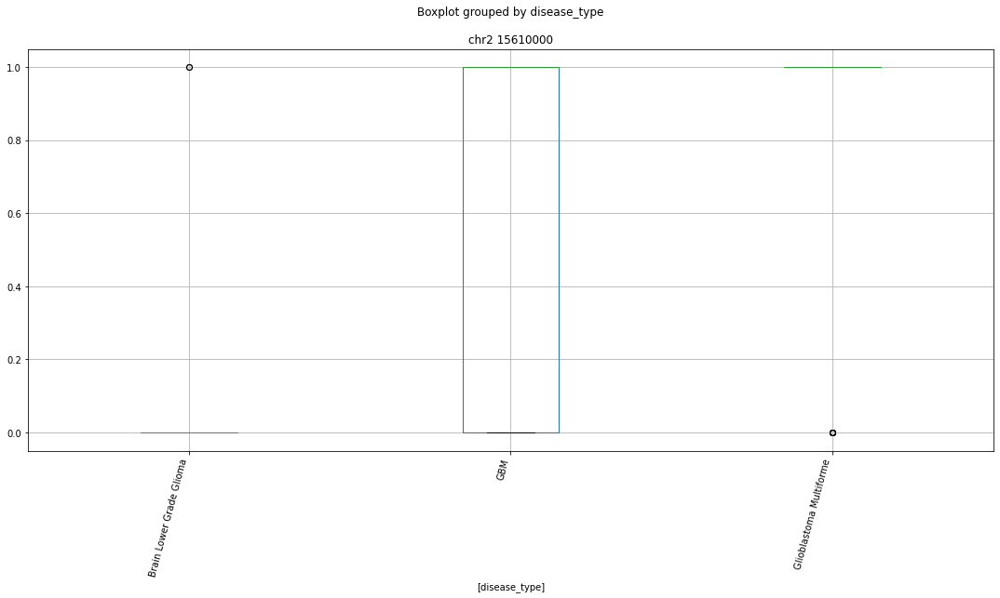

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr17 30978000


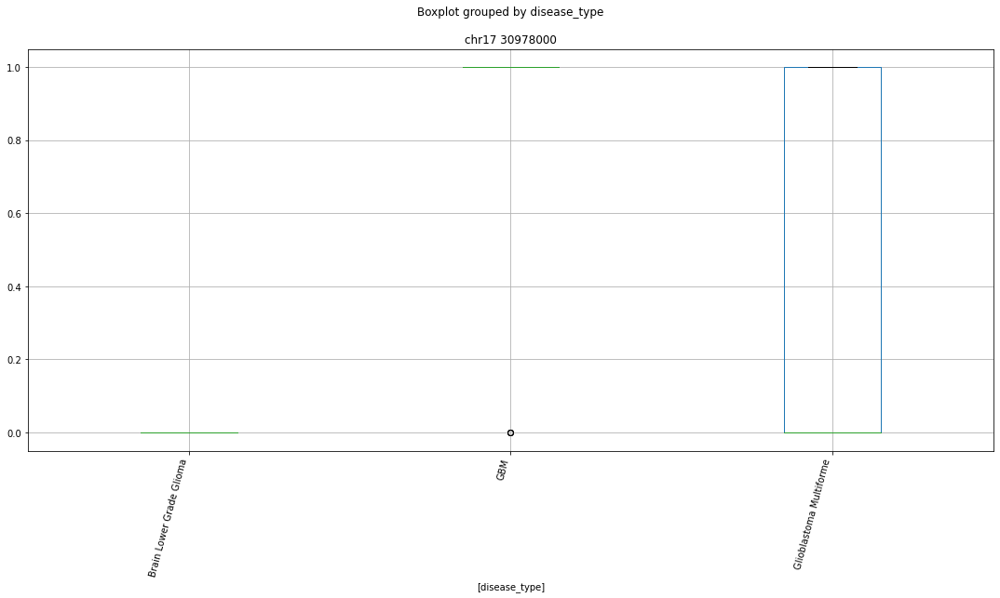

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr13 30838000


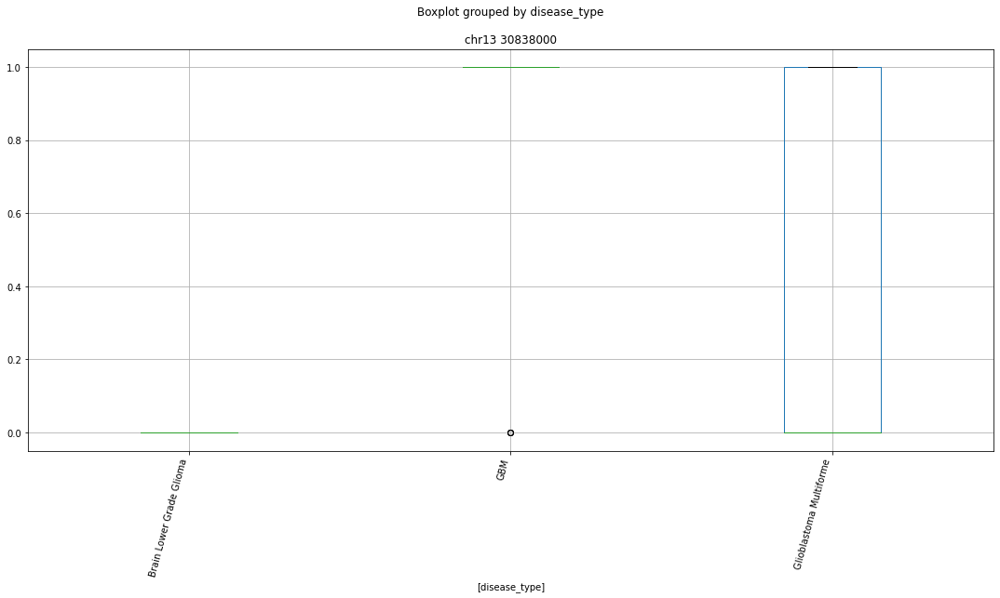

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr10 102300000


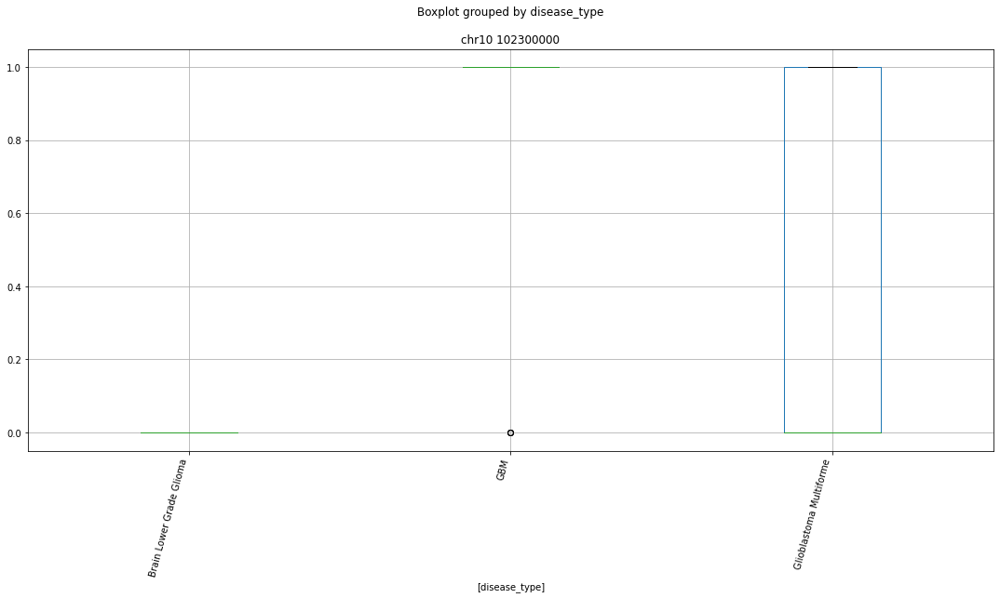

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr4 112957000


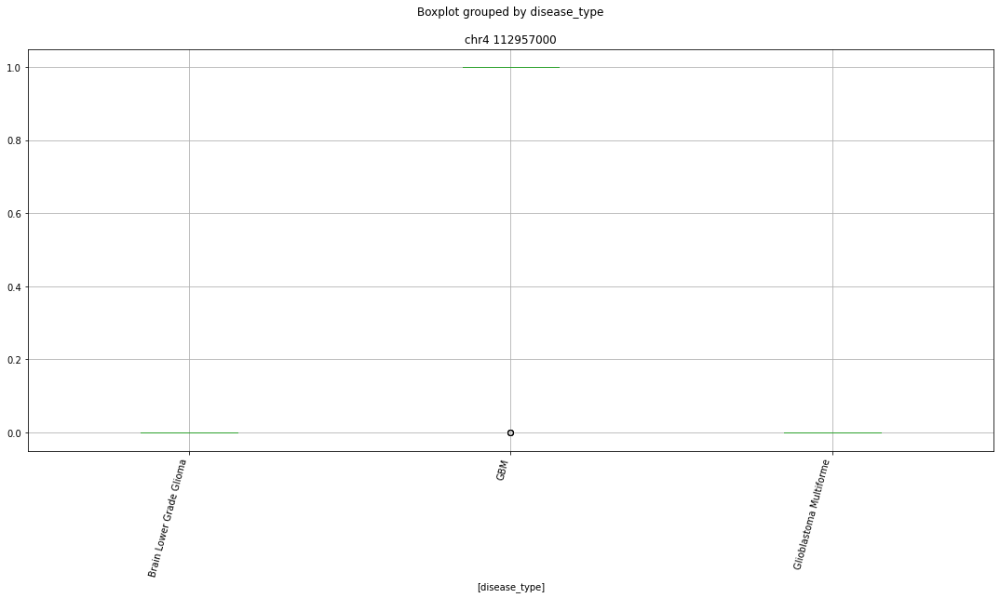

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr1 168207000


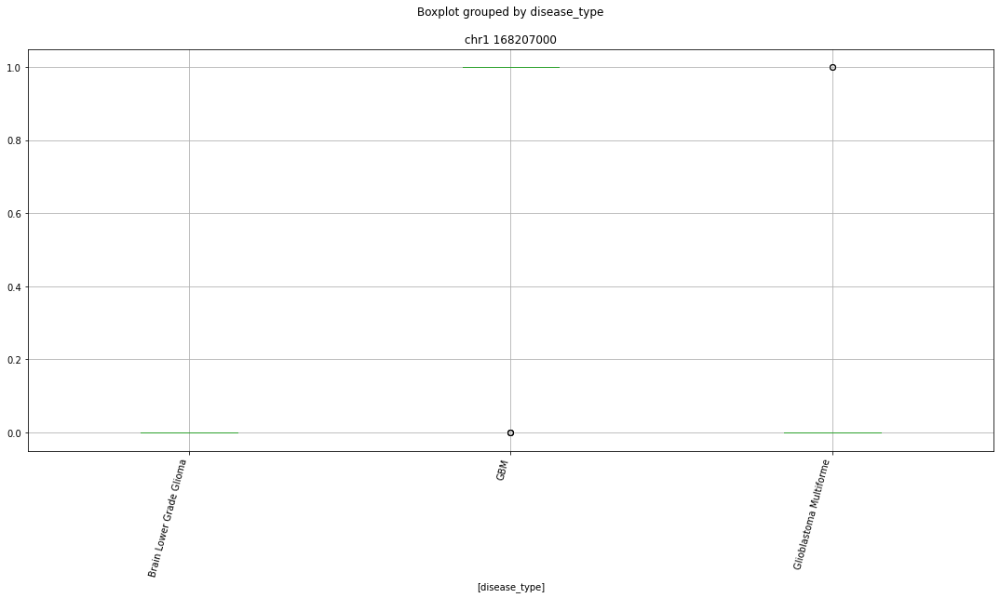

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr14 55919000


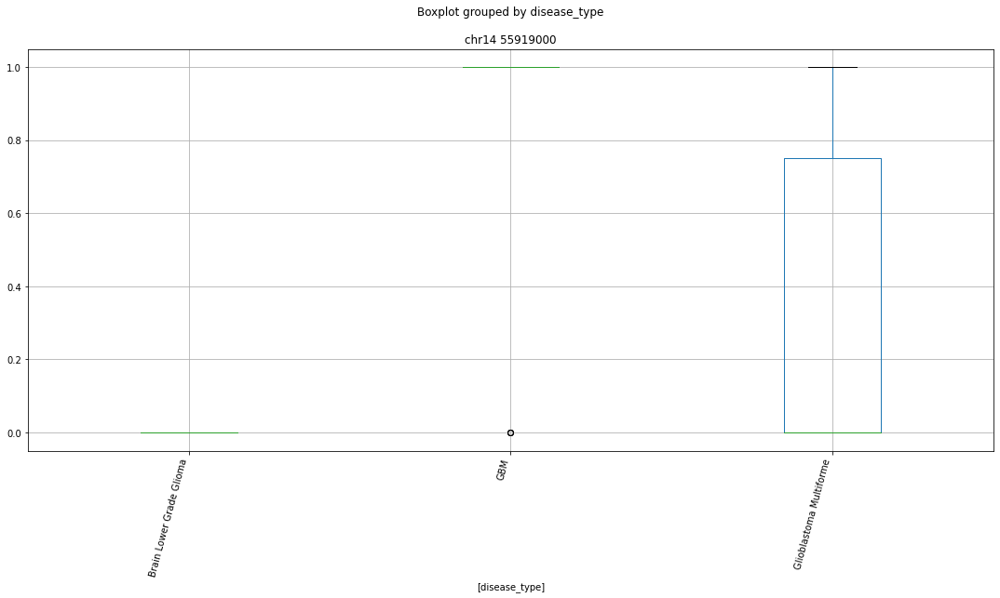

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr3 5283000


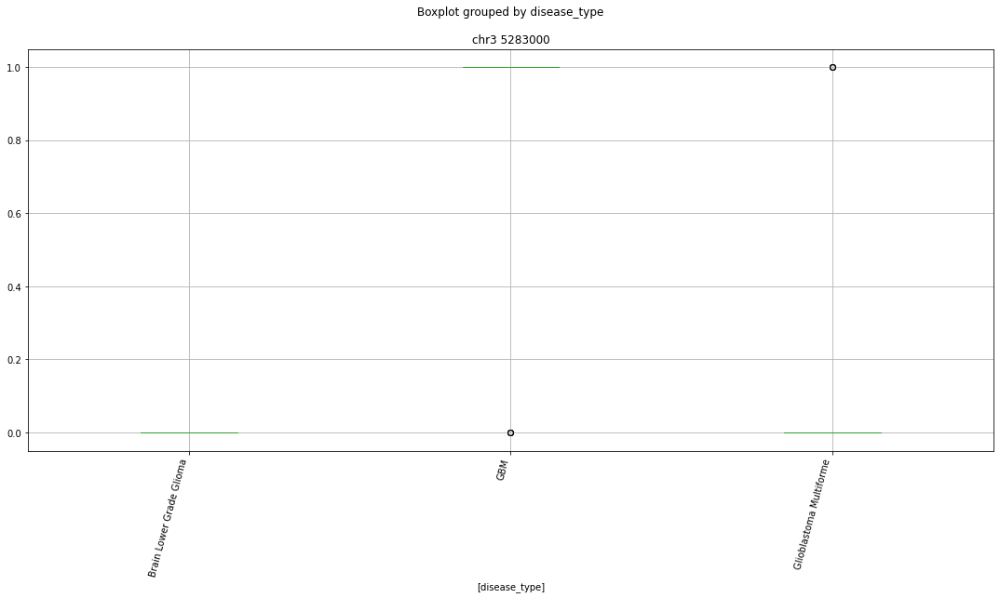

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr10 79278000


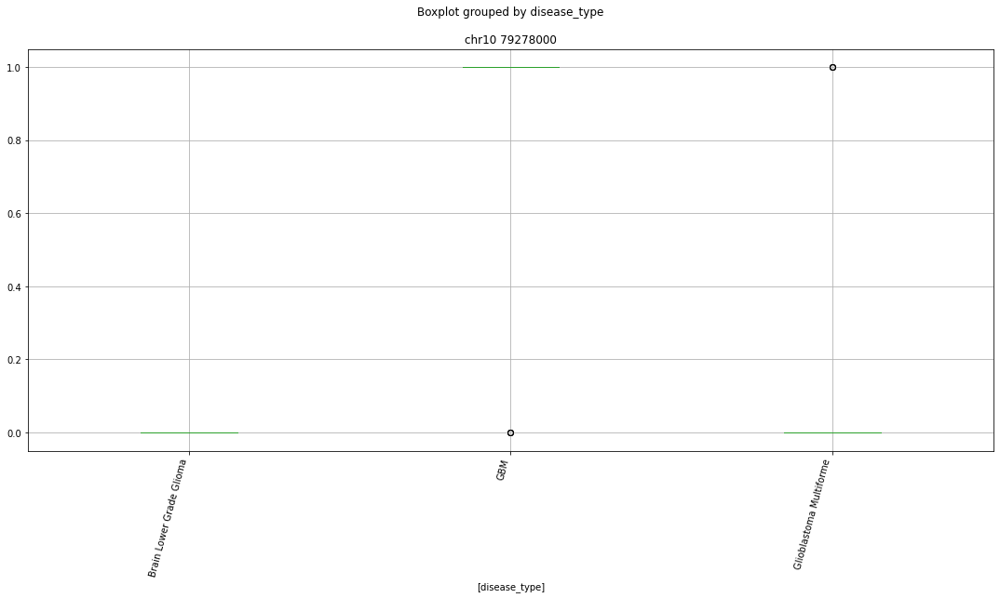

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr12 48552000


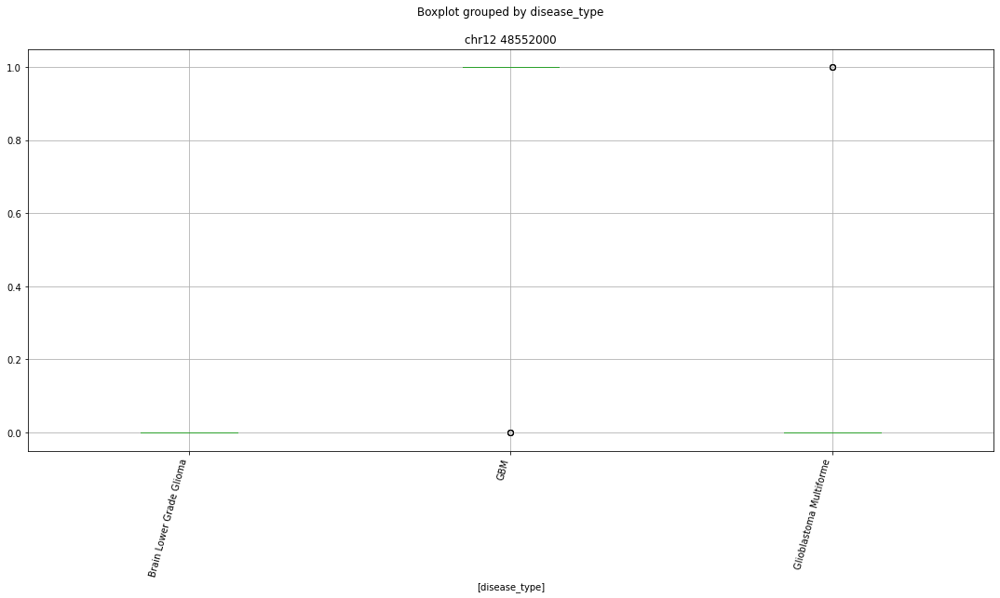

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr3 143046000


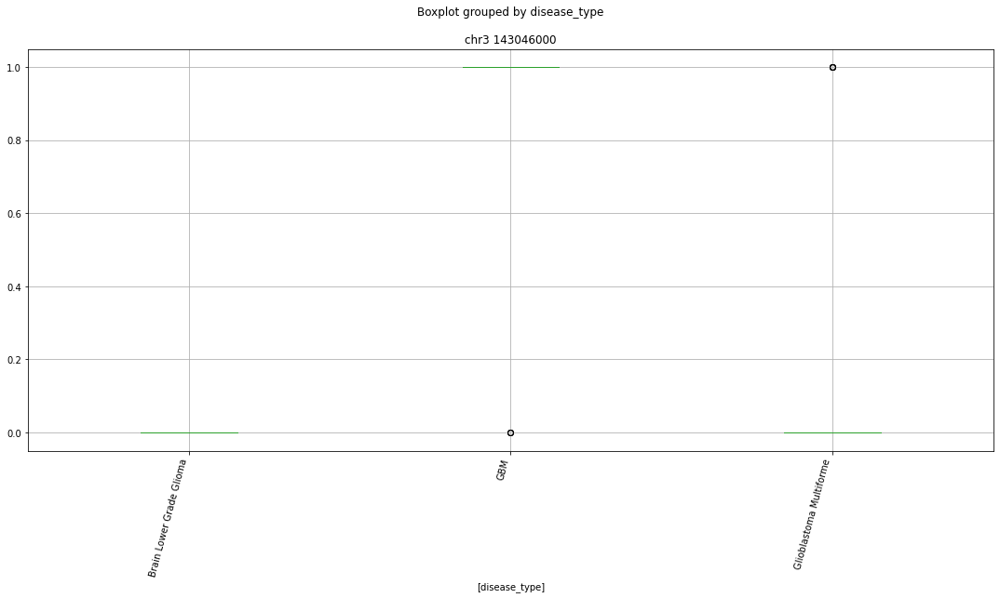

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr16 1600000


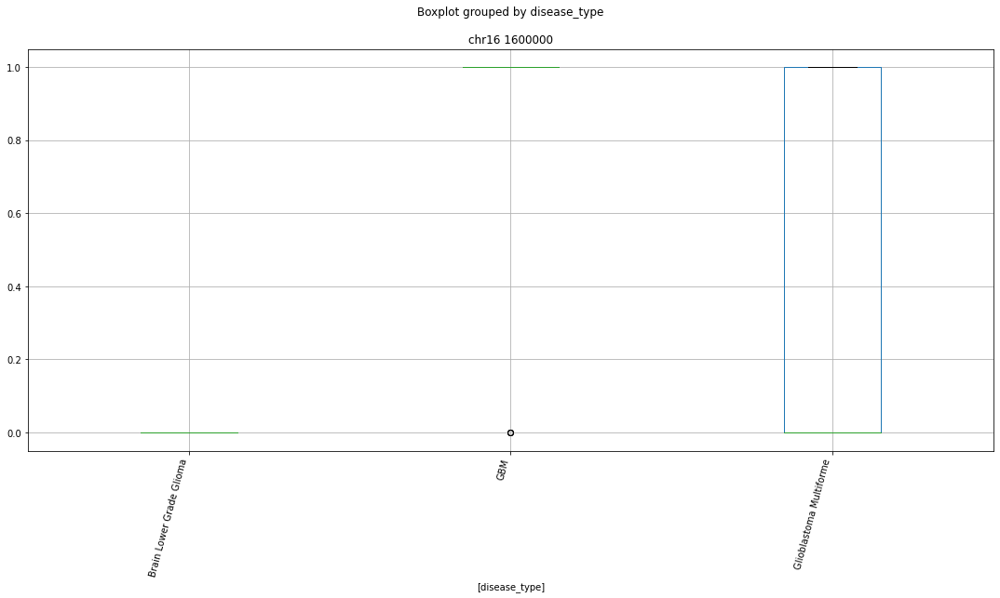

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr10 97527000


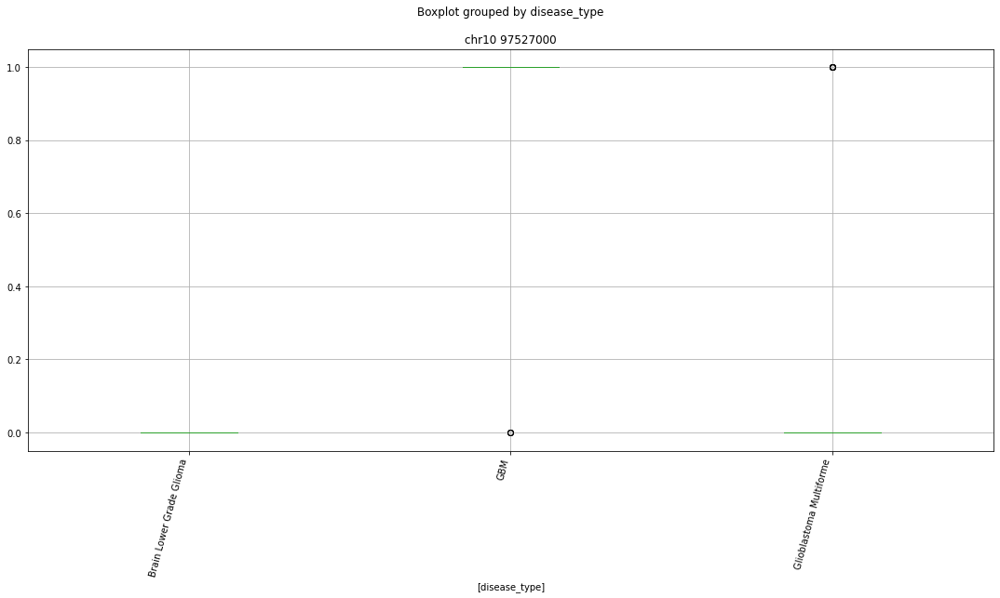

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr9 6808000


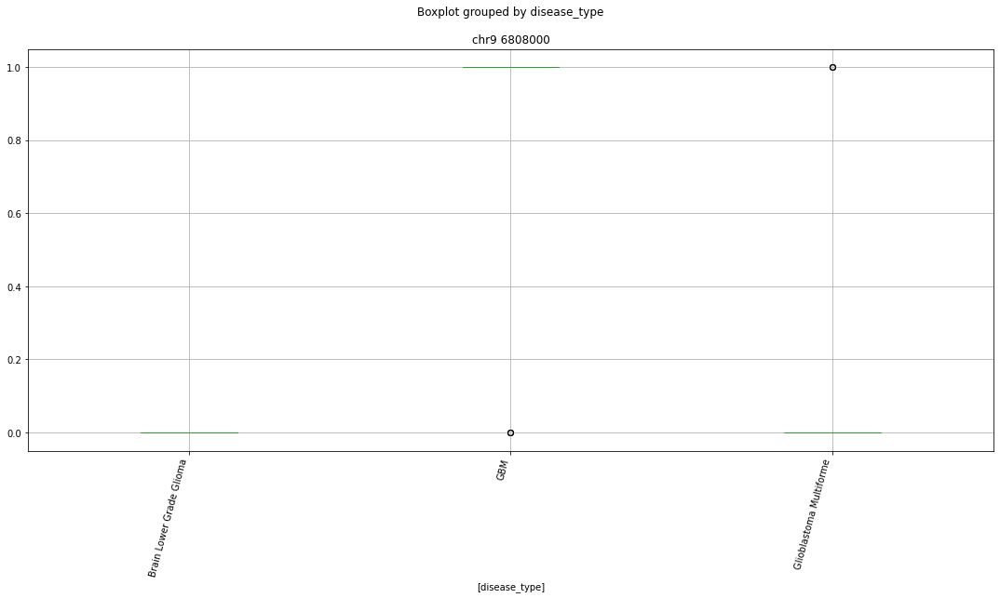

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr9 19433000


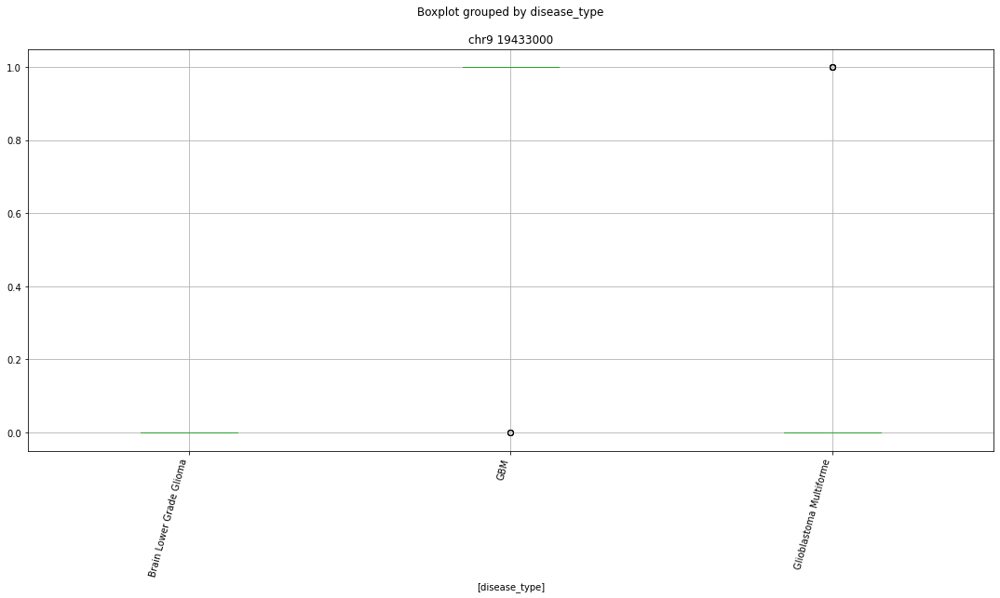

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr5 142074000


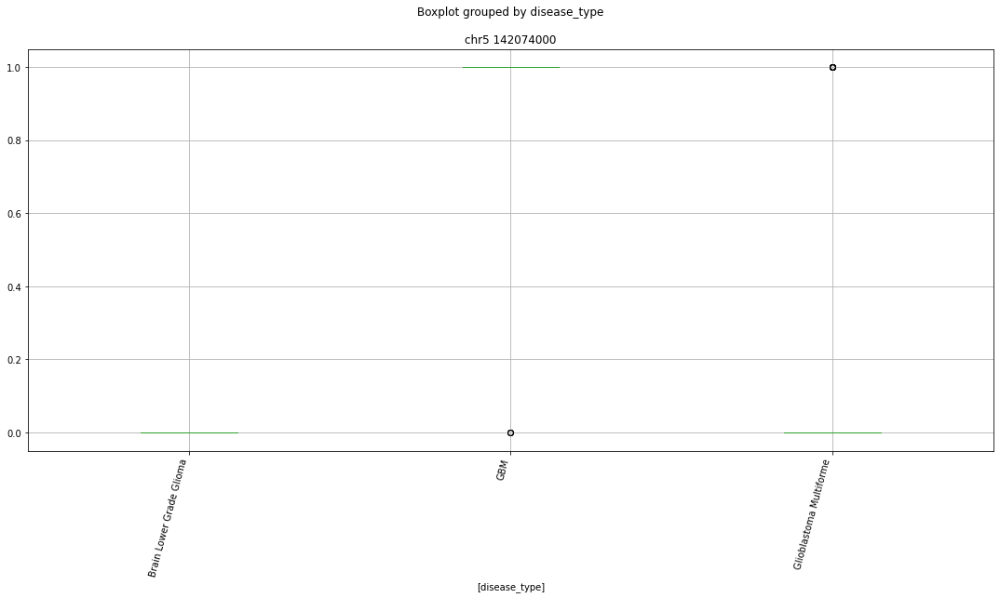

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr1 114480000


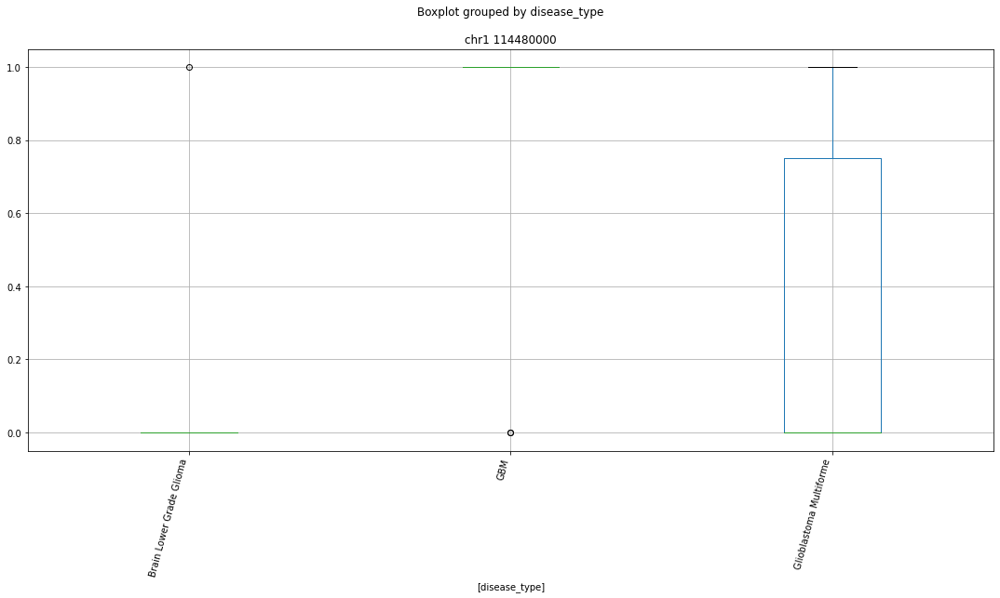

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr12 56788000


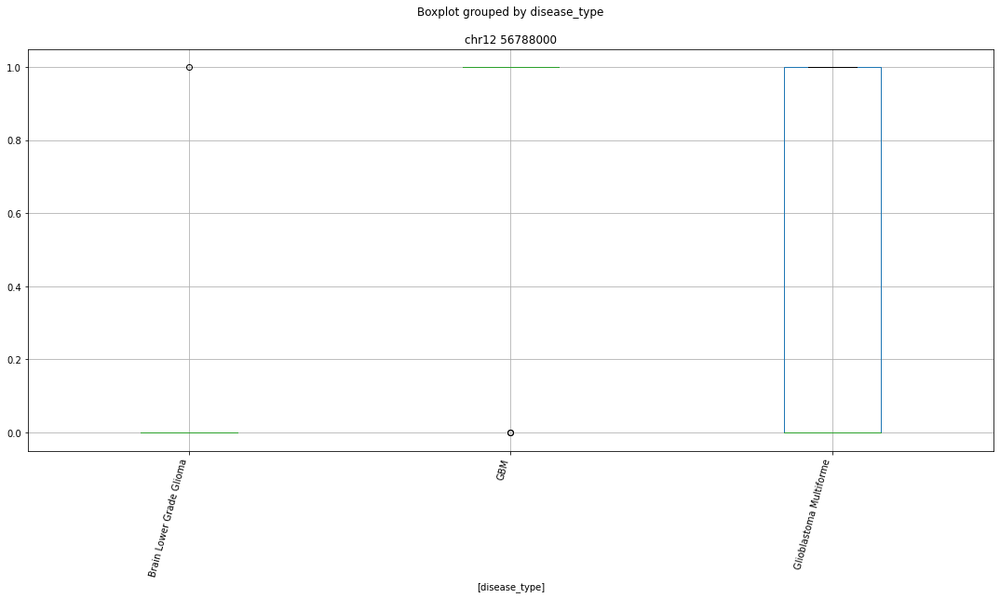

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr5 90594000


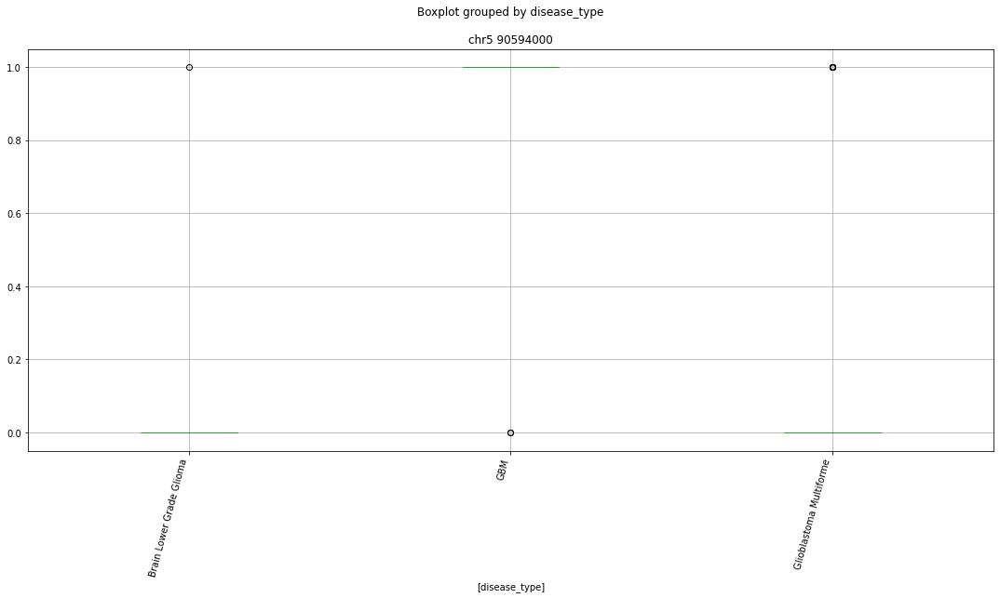

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr12 38329000


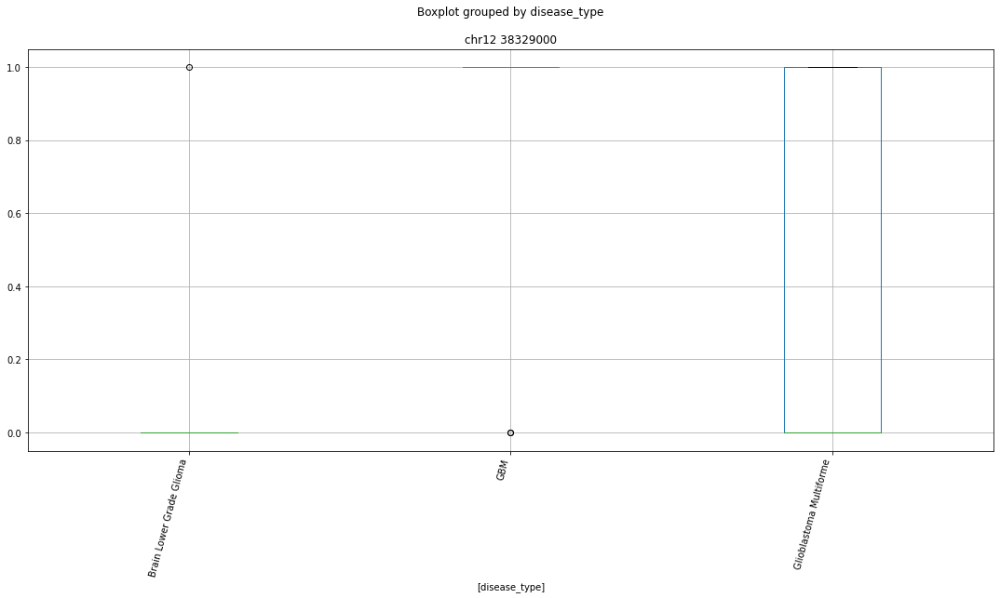

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr17 65938000


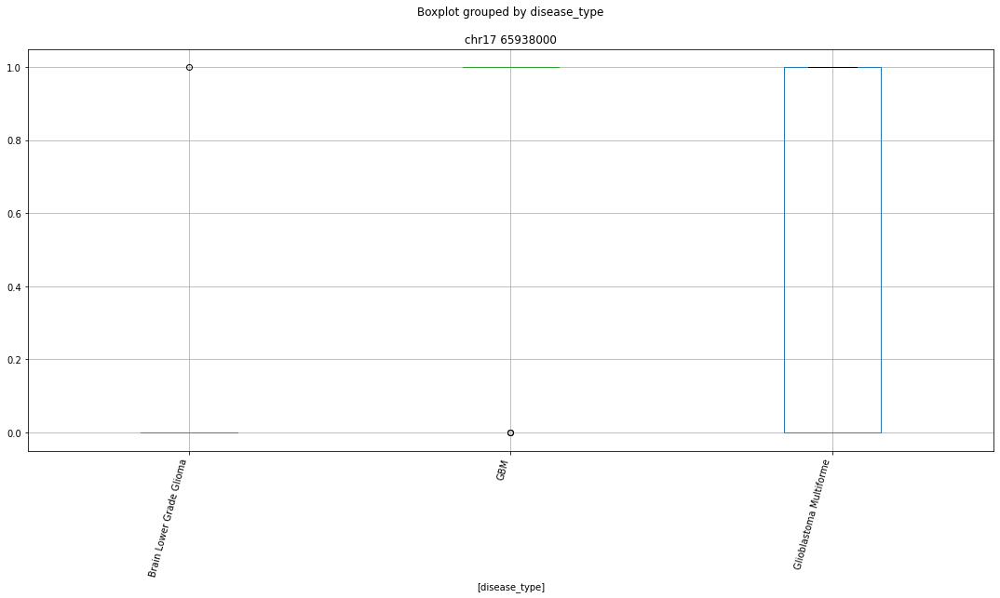

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr5 122810000


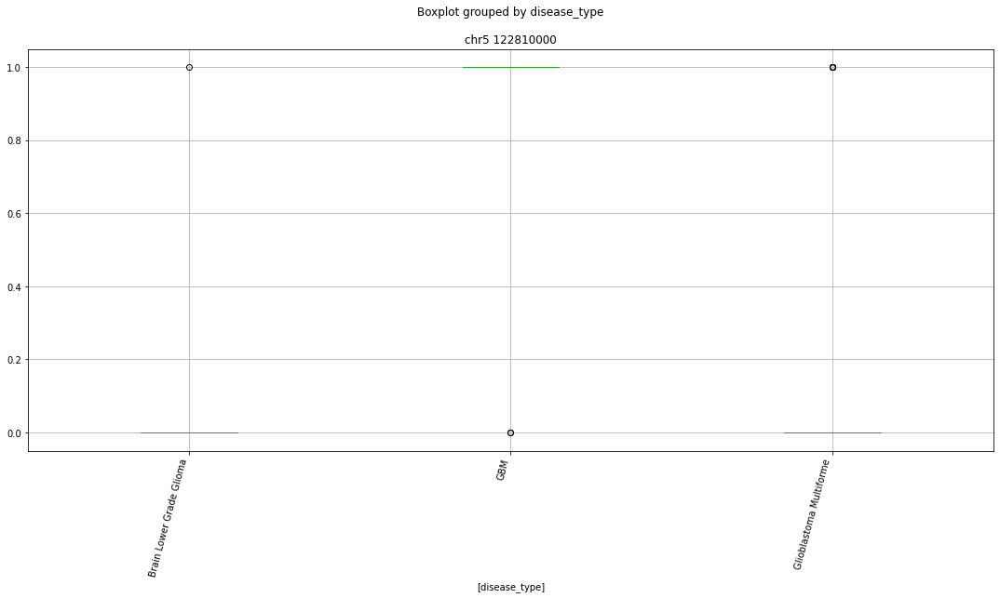

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr2 55772000


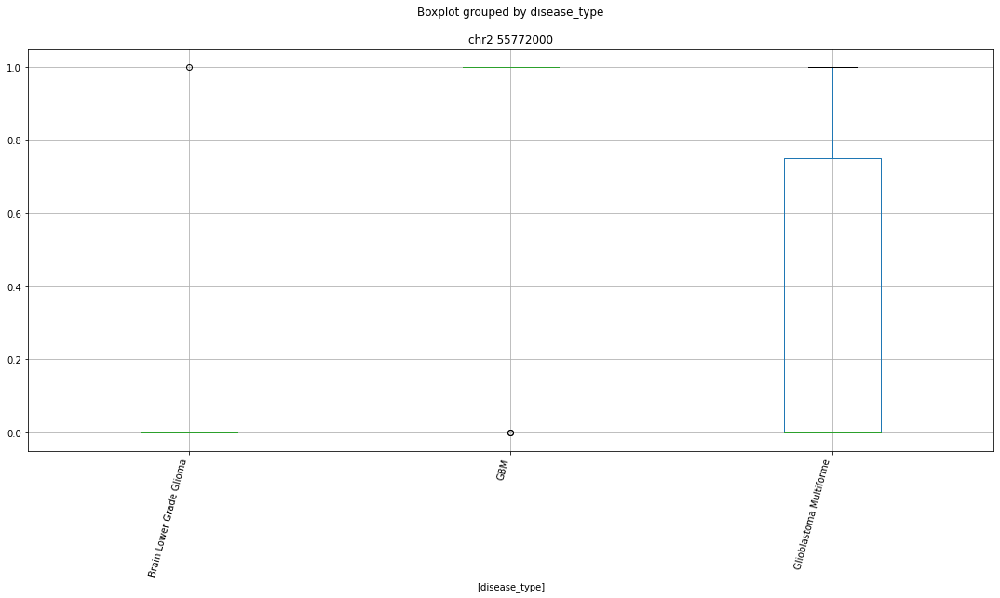

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr4 118399000


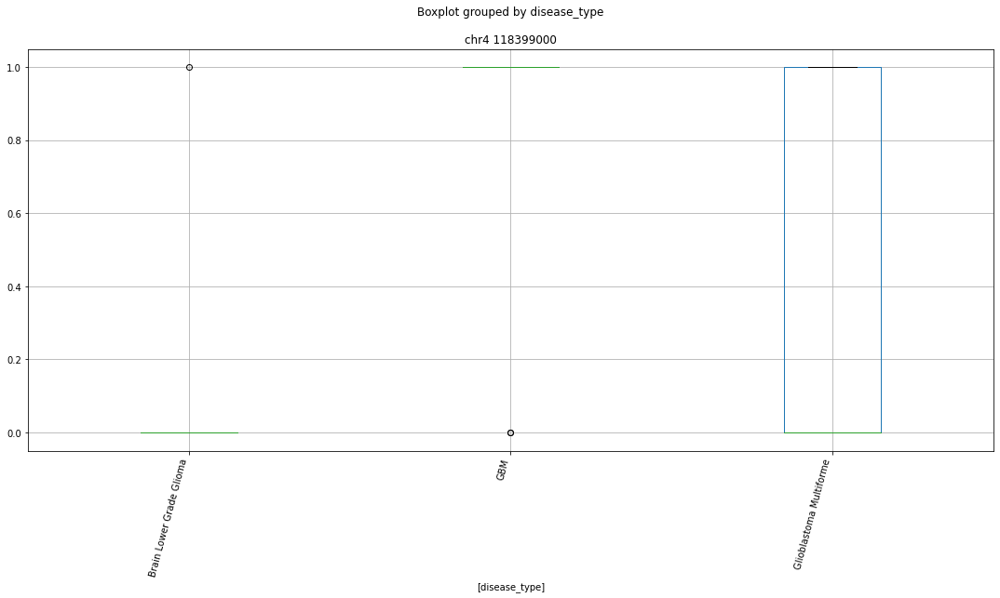

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr16 57199000


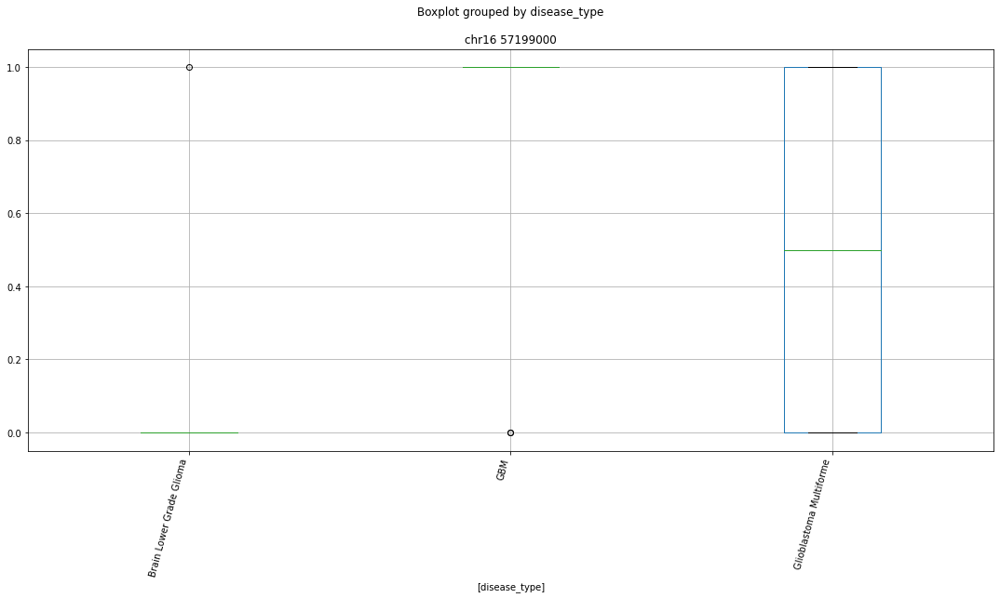

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr1 26802000


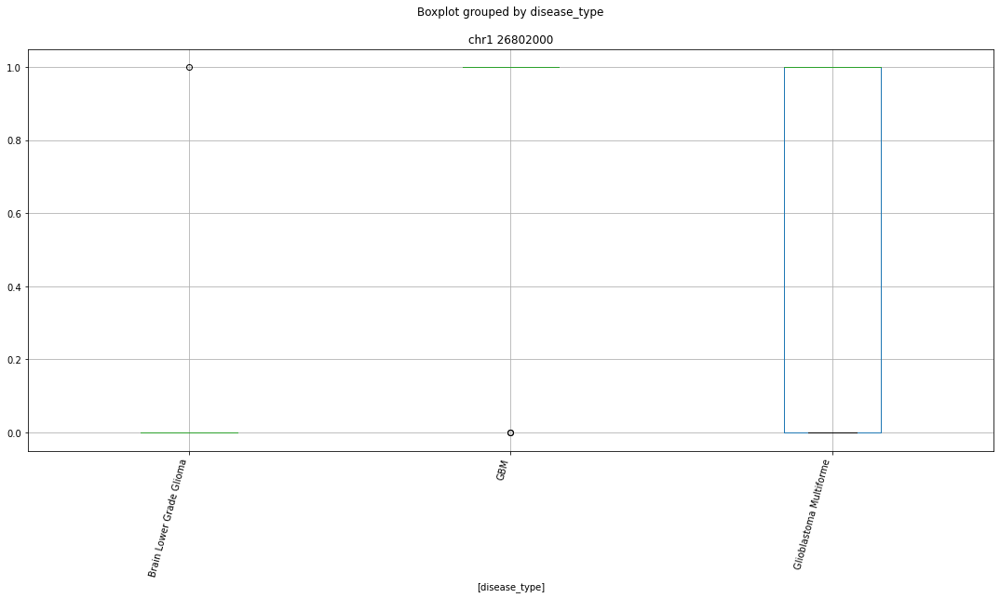

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr14 65634000


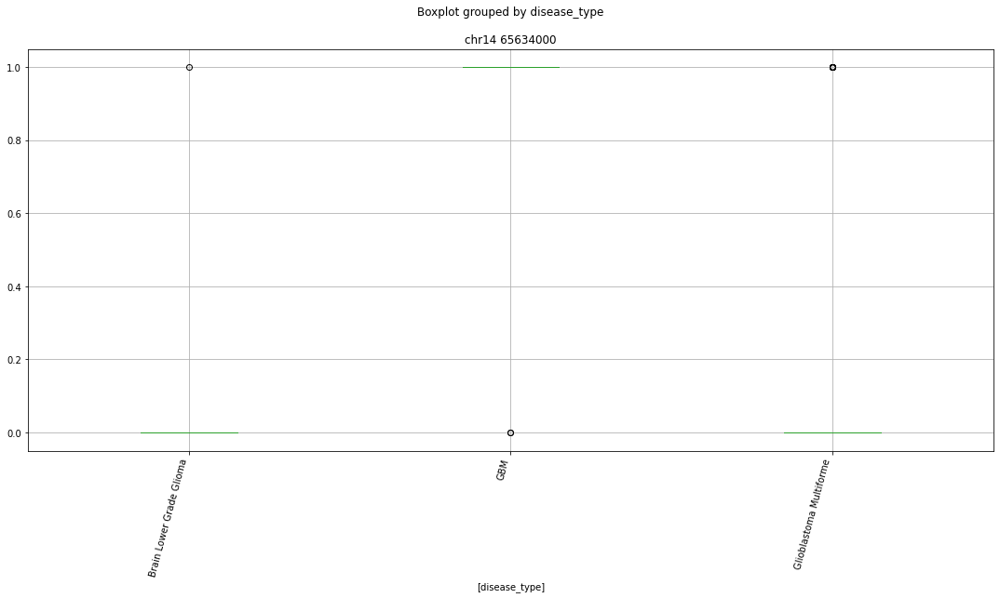

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr4 128082000


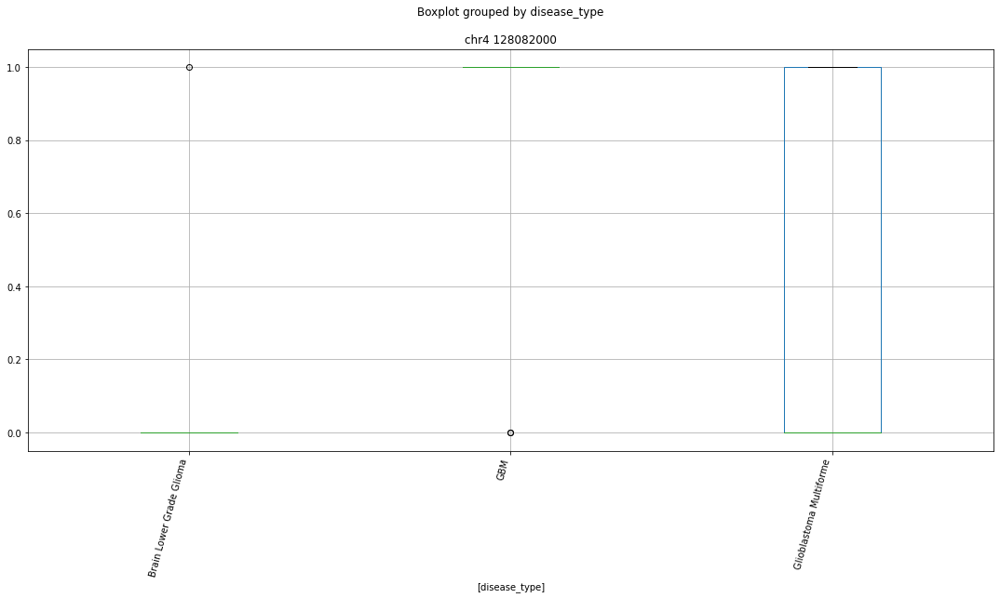

 p : 1.7597987283828903e-15  ( t : 11.77450164078671 ) :  chr10 42139000


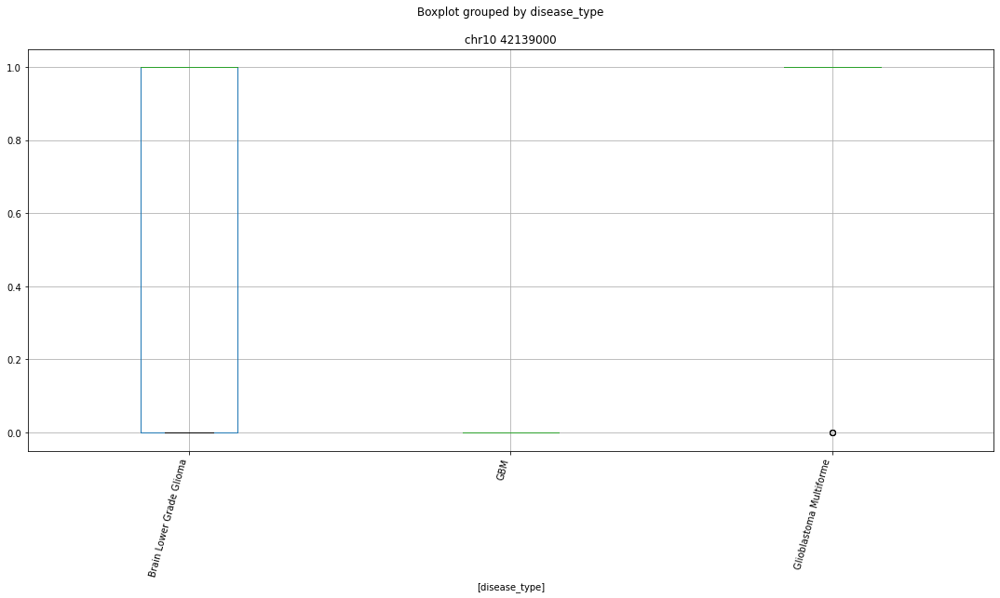

 p : 1.7597987283828903e-15  ( t : 11.77450164078671 ) :  chr17 10058000


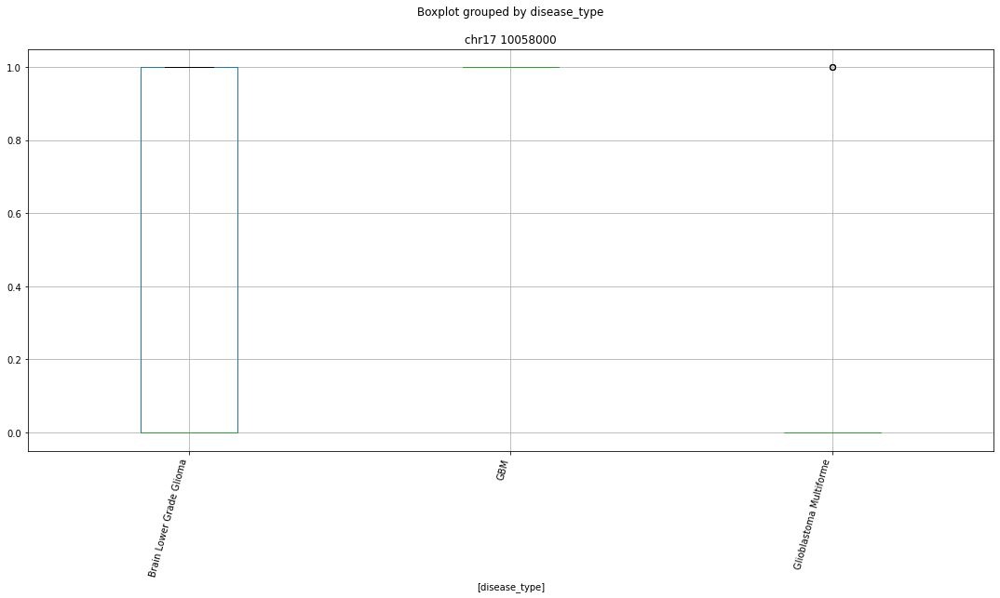

 p : 7.254146375649524e-15  ( t : 10.857133990633349 ) :  chr17 46283000


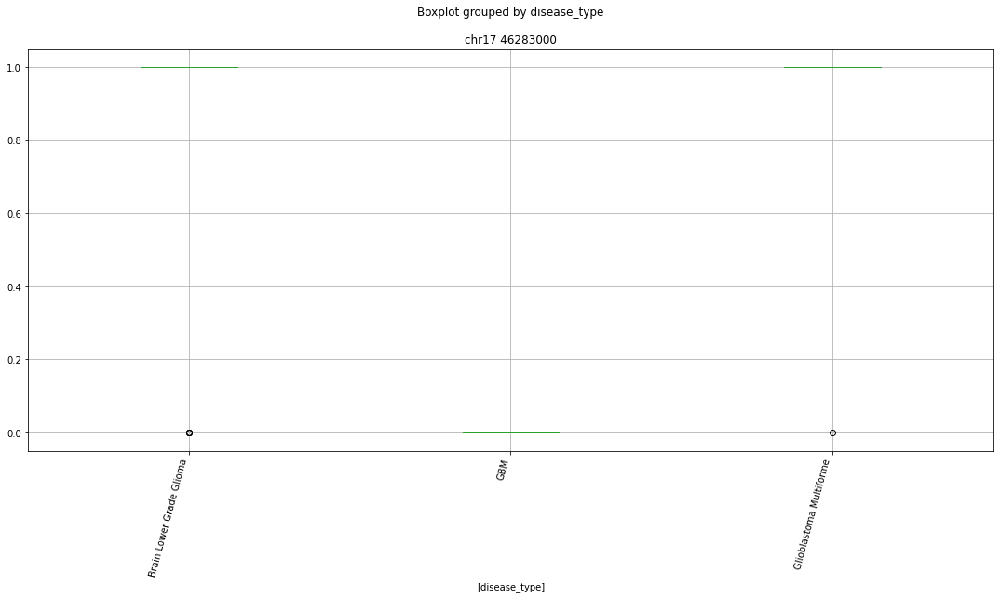

 p : 7.254146375649524e-15  ( t : 10.857133990633349 ) :  chr13 81102000


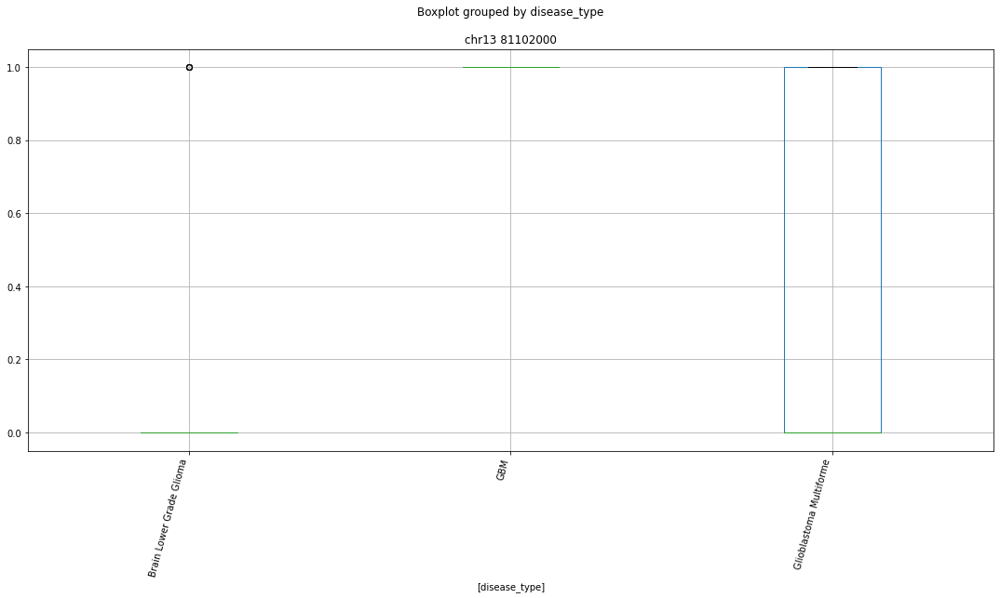

 p : 1.4129829166215847e-14  ( t : 11.079765826150473 ) :  chr12 19340000


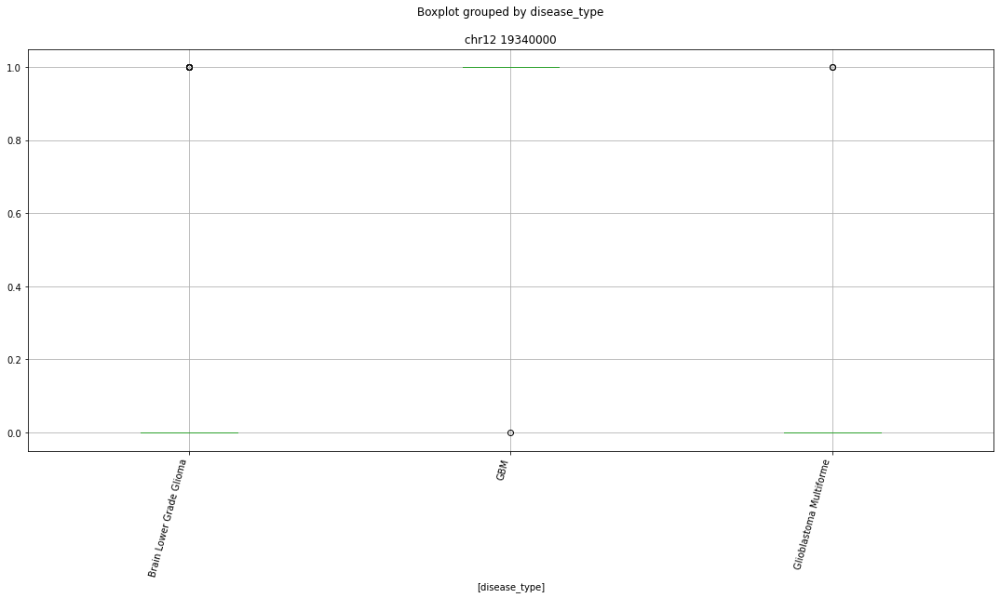

 p : 1.4129829166215899e-14  ( t : 11.07976582615047 ) :  chr10 78469000


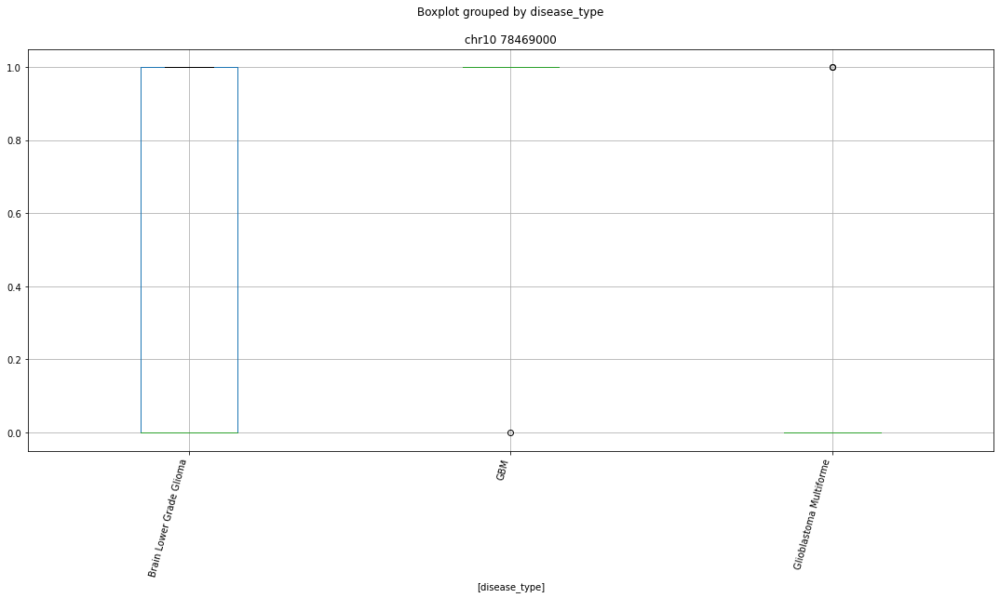

 p : 2.2297877480953916e-14  ( t : 10.930334954713064 ) :  chr4 112957000


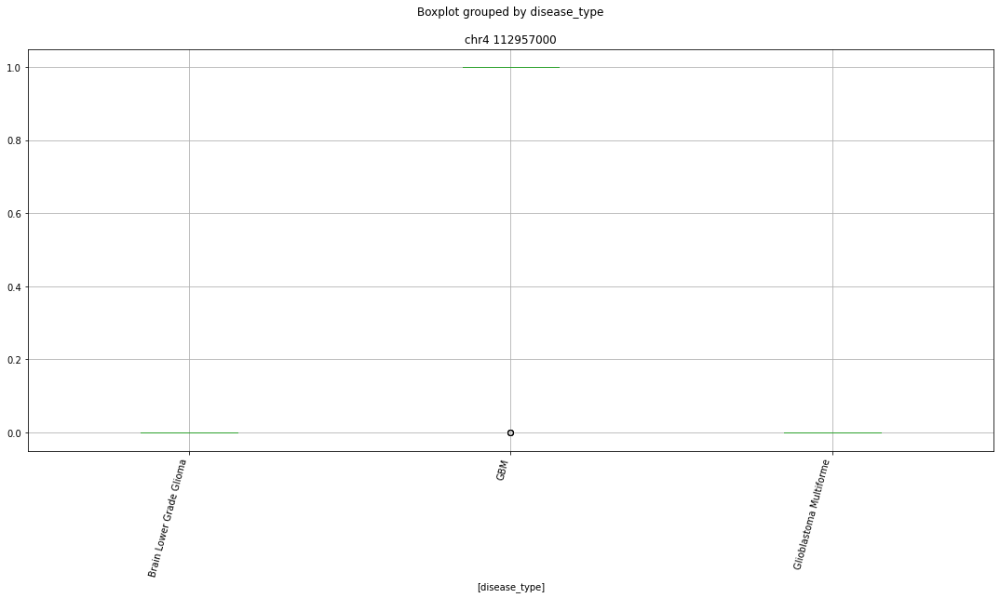

 p : 2.2297877480953916e-14  ( t : 10.930334954713063 ) :  chr1 114791000


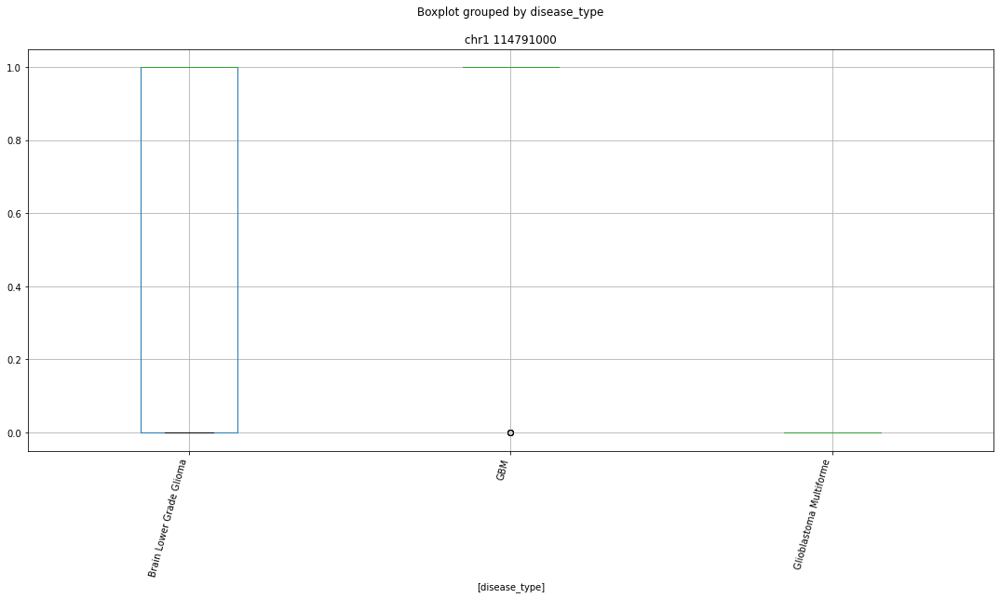

 p : 3.439871695253532e-14  ( t : 10.789196232662382 ) :  chr19 40647000


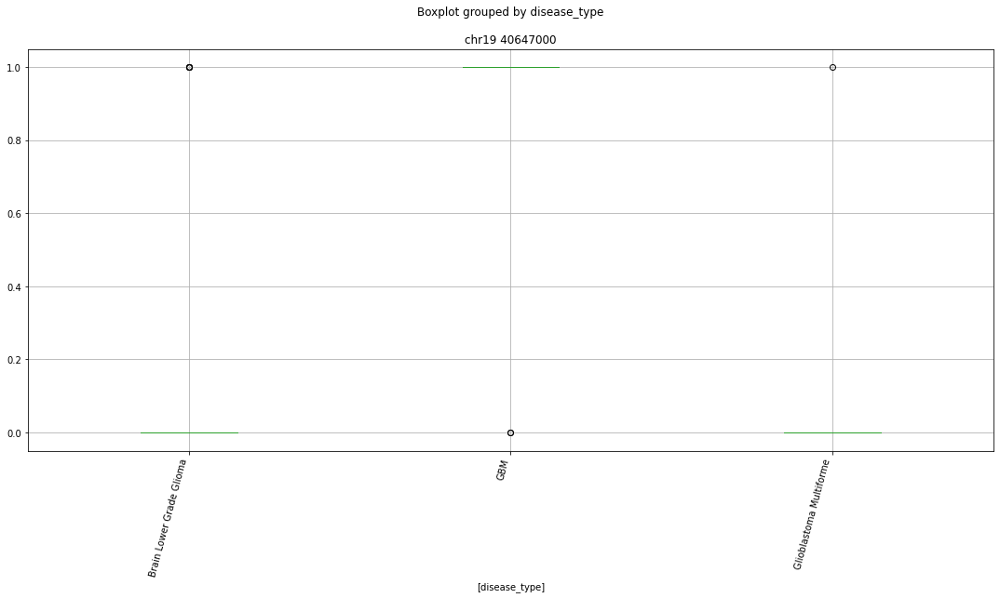

 p : 7.704722670518554e-14  ( t : 10.151540384745967 ) :  chr9 92226000


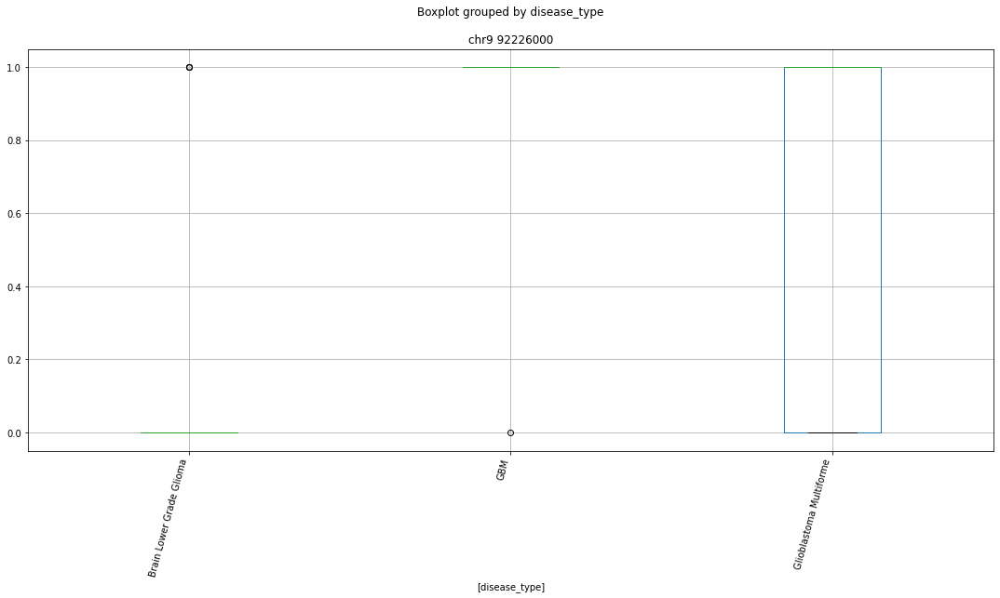

 p : 7.704722670518554e-14  ( t : 10.151540384745967 ) :  chr16 2399000


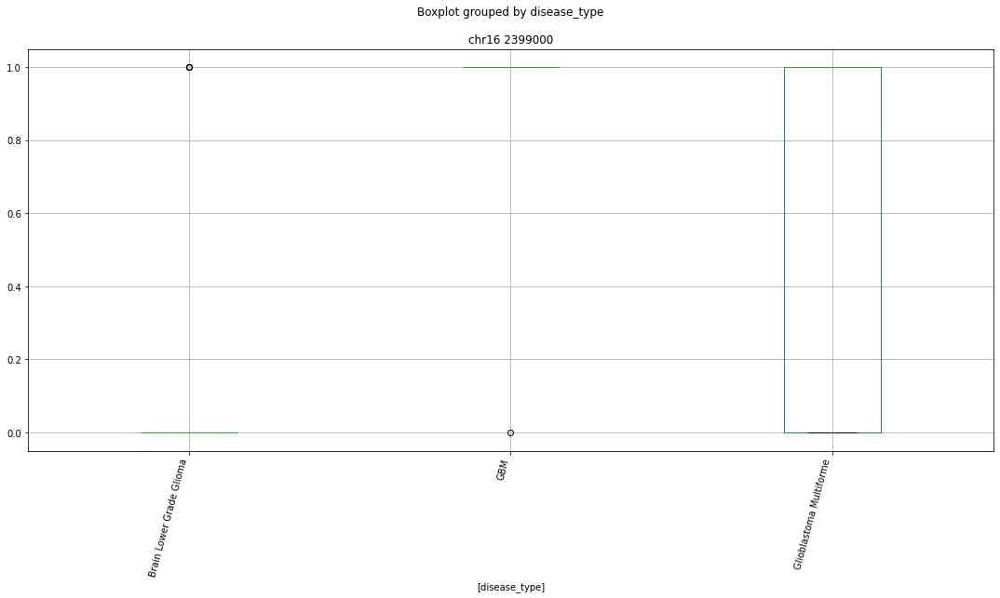

 p : 3.230994299523944e-13  ( t : 8.924928080877834 ) :  chr13 100618000


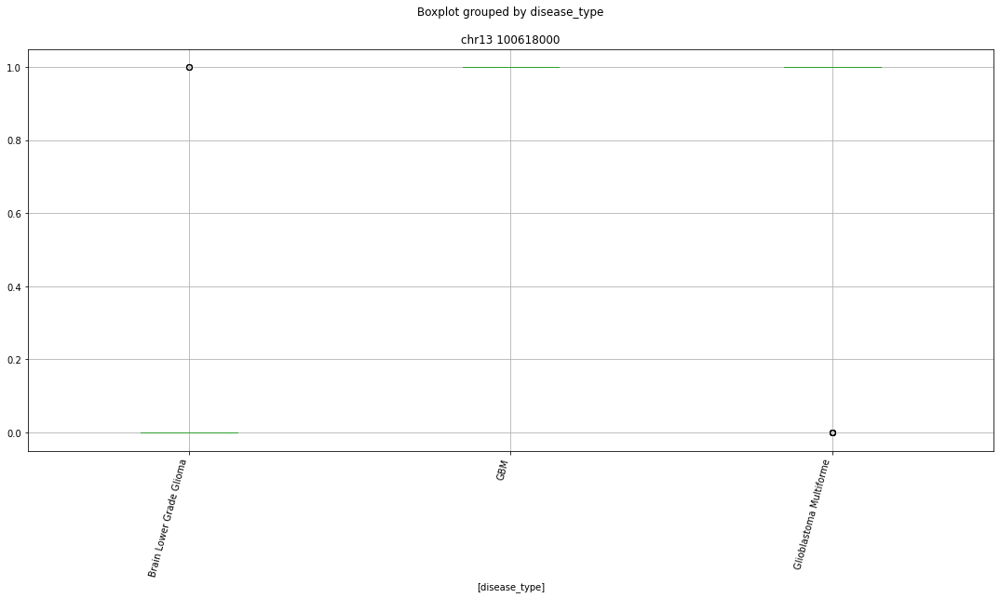

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr1 8912000


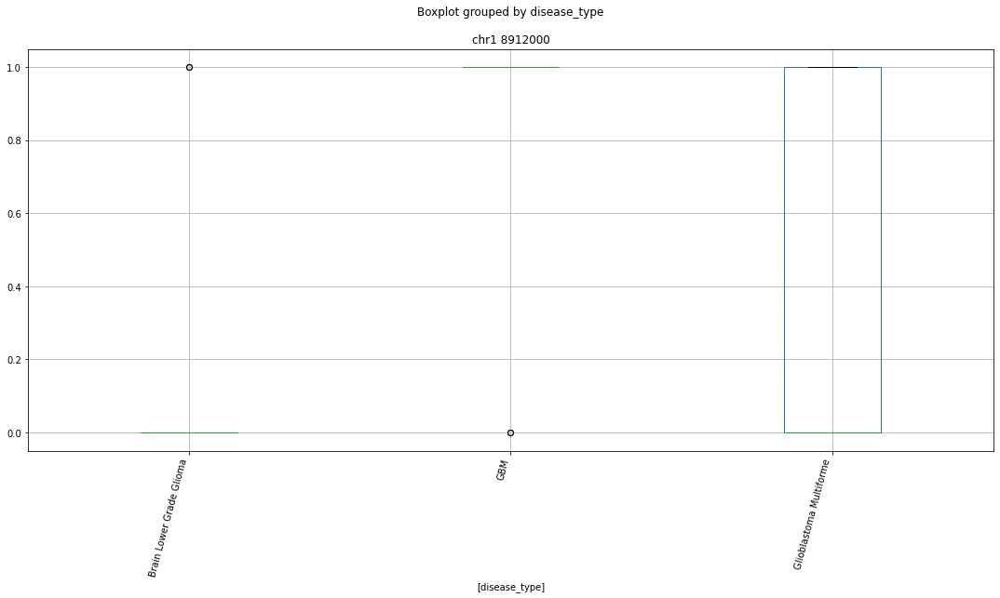

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr10 87081000


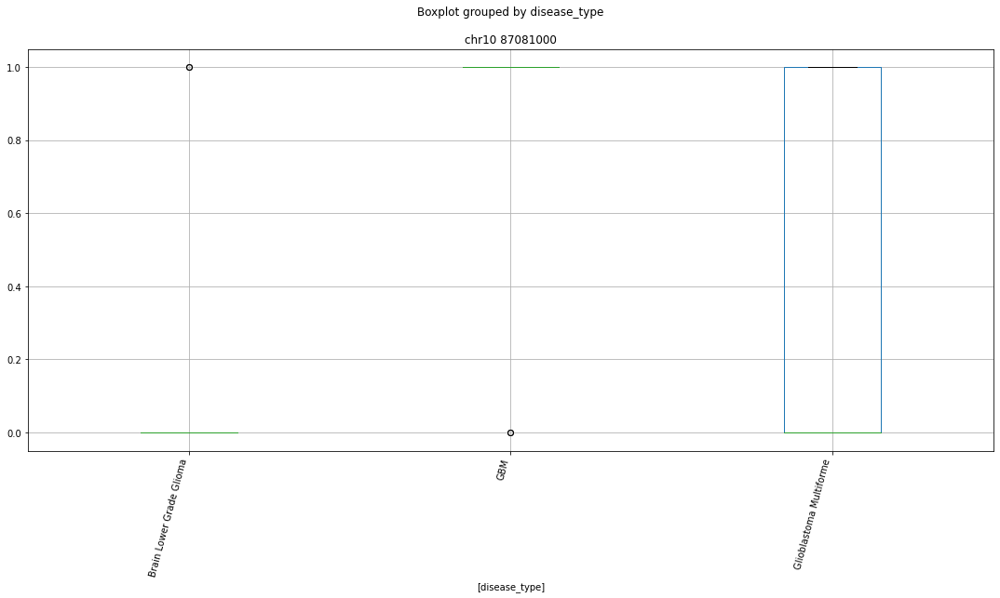

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr16 8732000


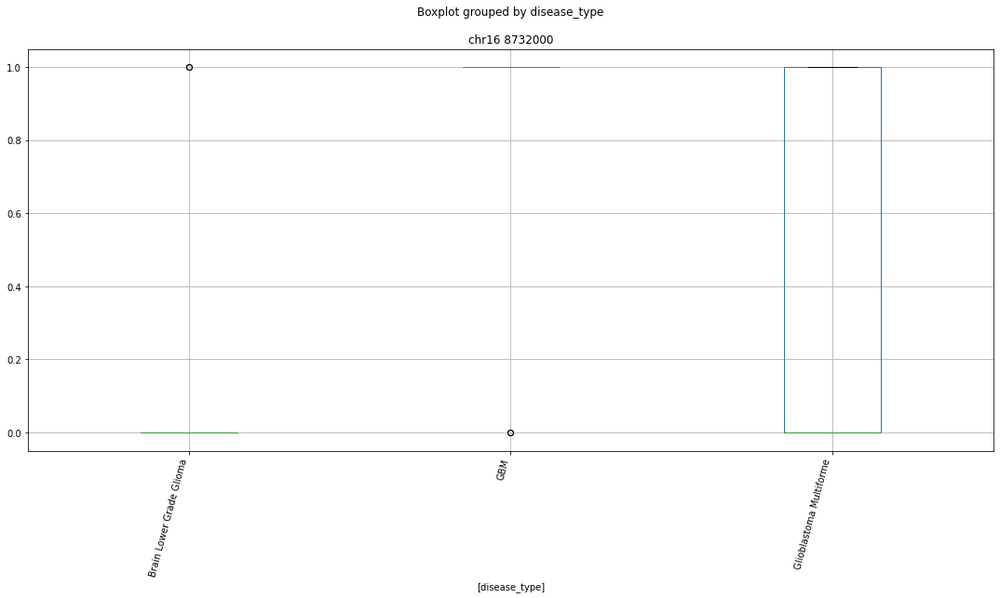

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr21 42779000


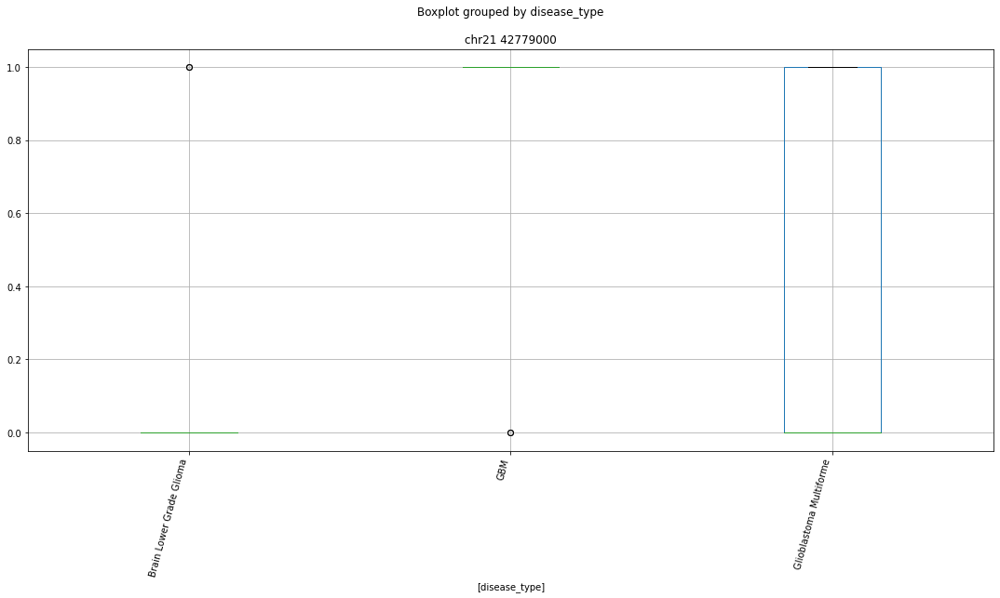

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr1 203918000


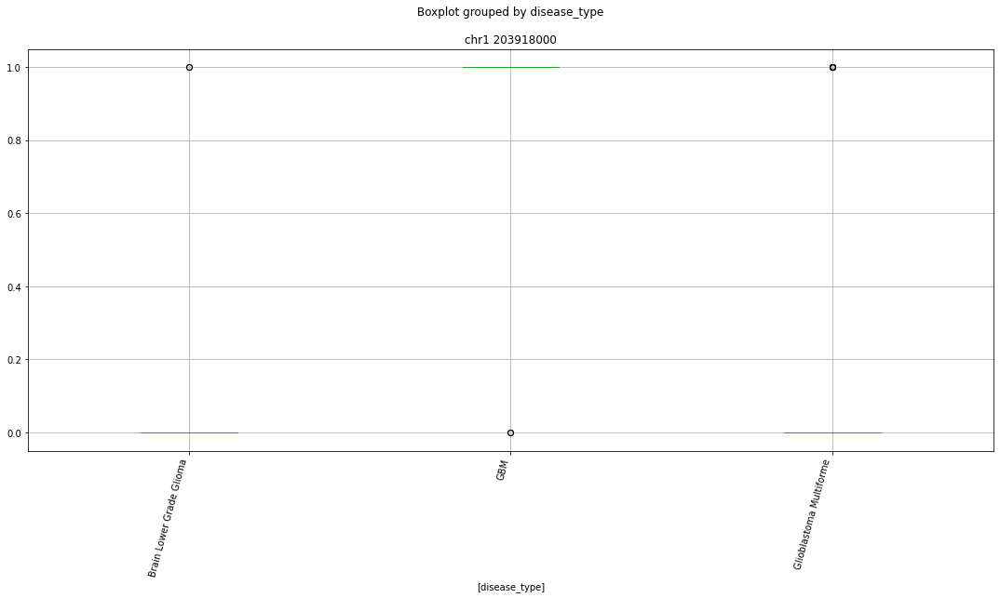

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr1 111800000


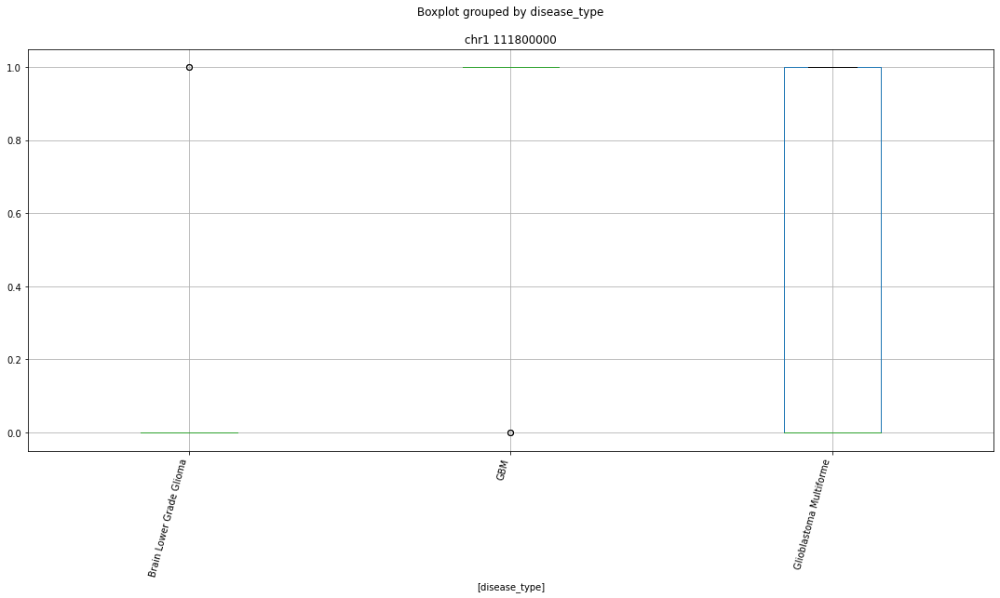

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr3 51250000


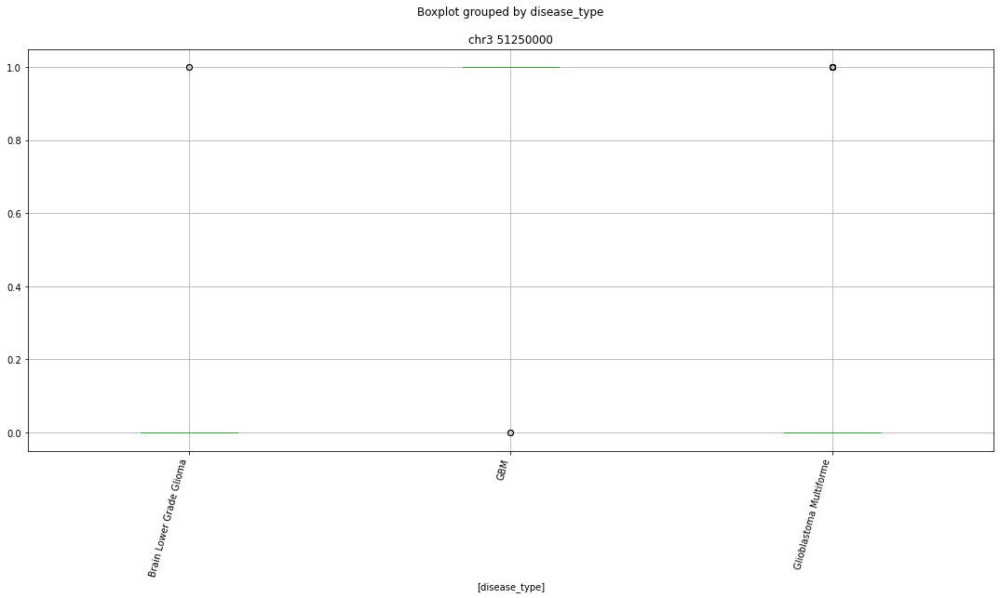

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr1 27288000


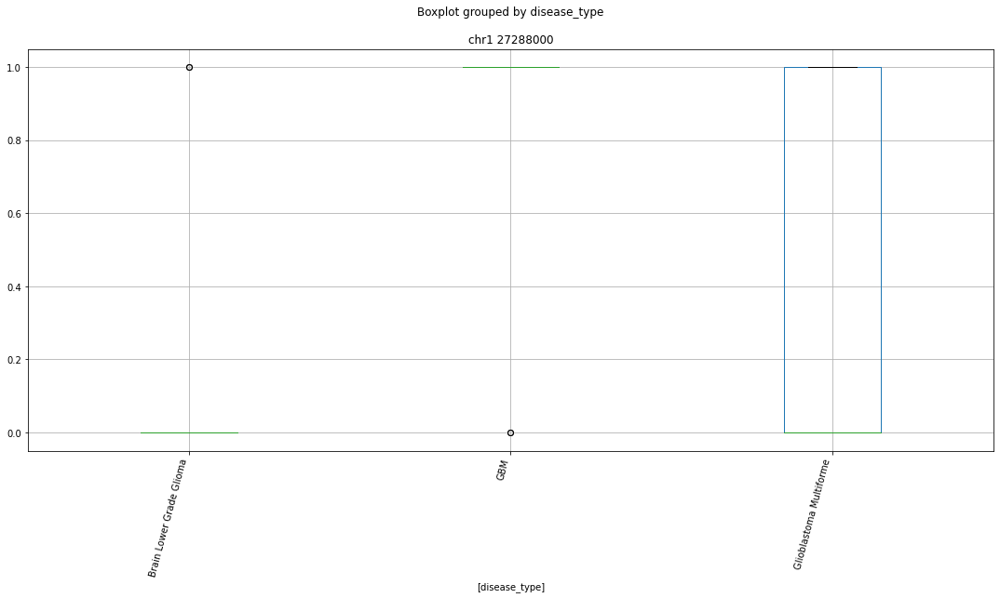

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr11 47098000


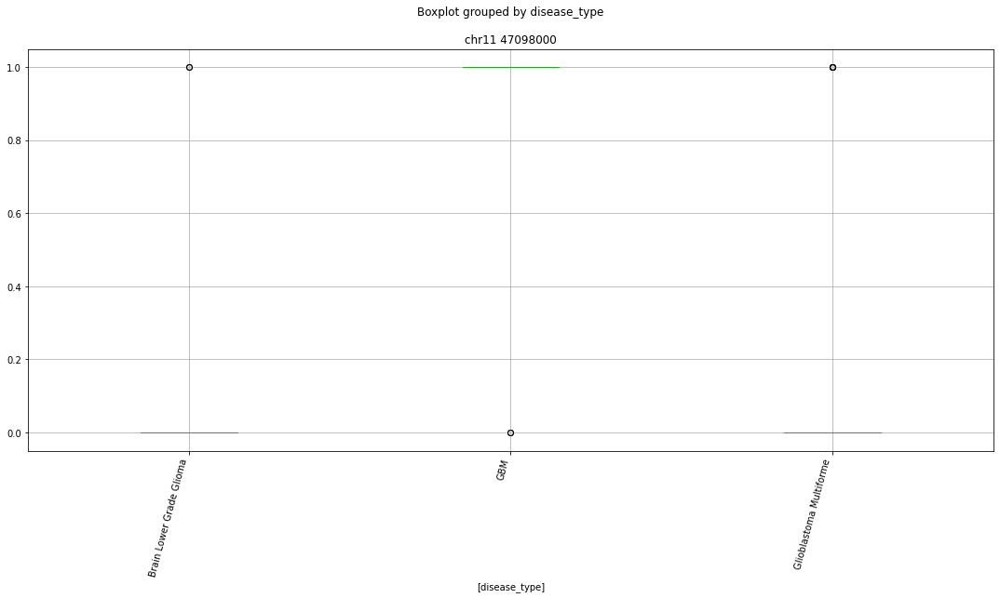

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr6 35385000


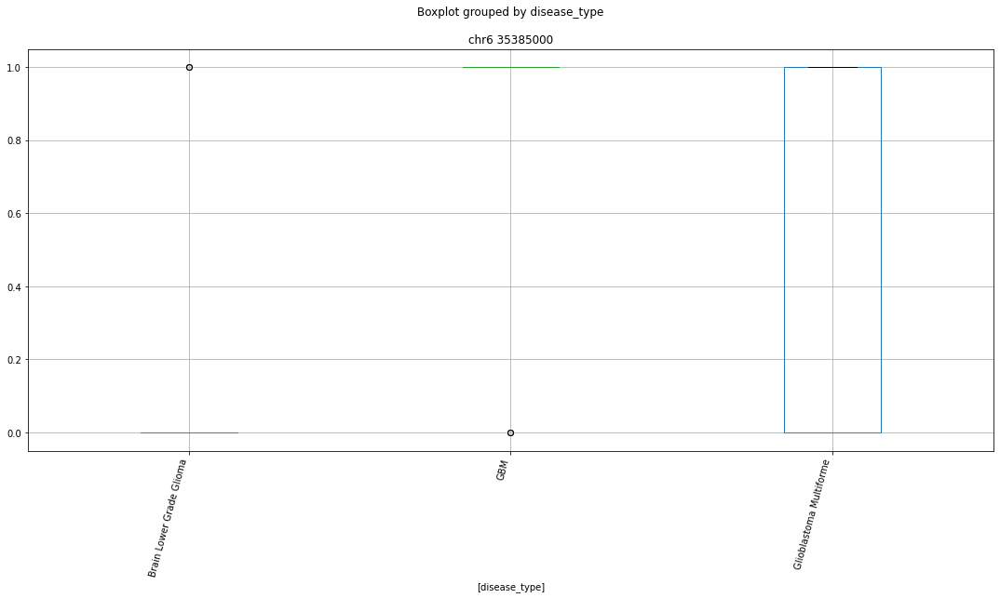

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr2 186153000


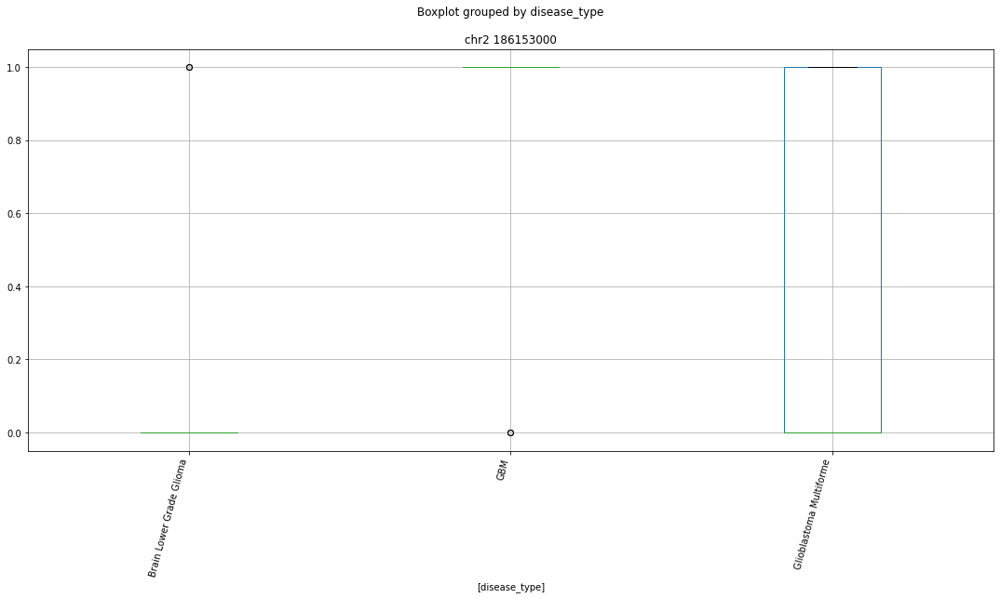

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr5 81433000


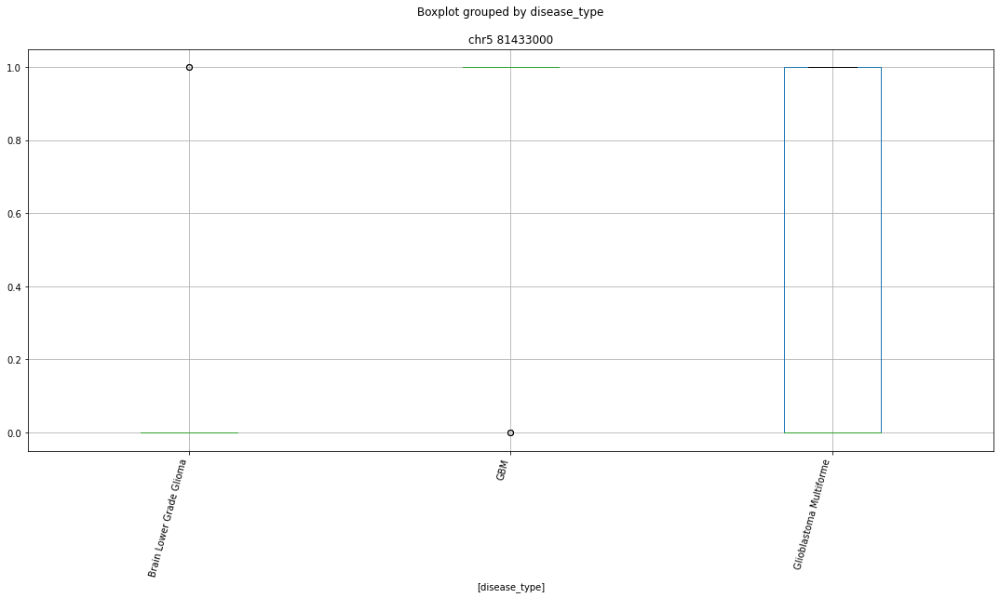

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr19 53223000


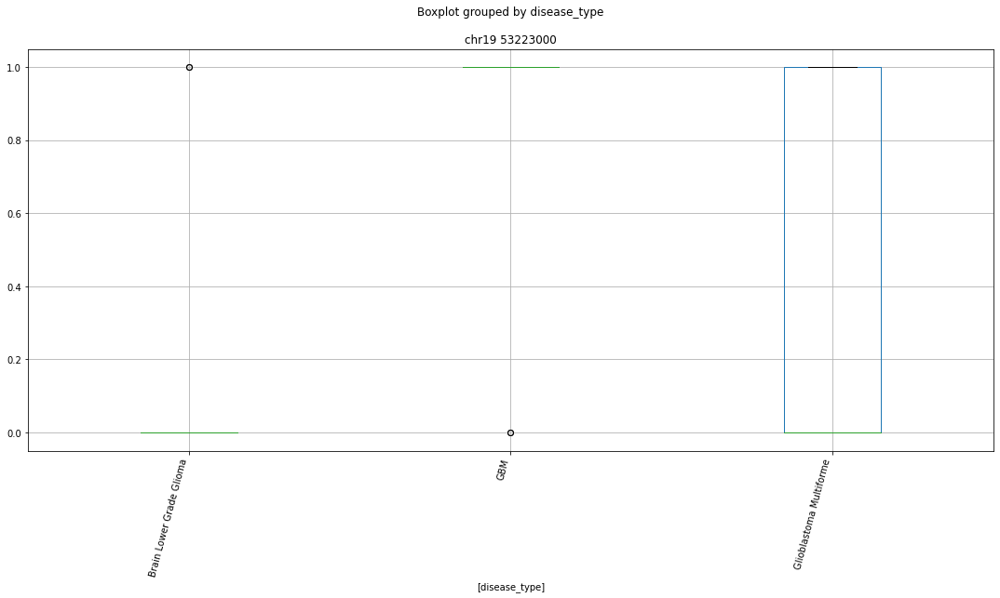

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr17 8367000


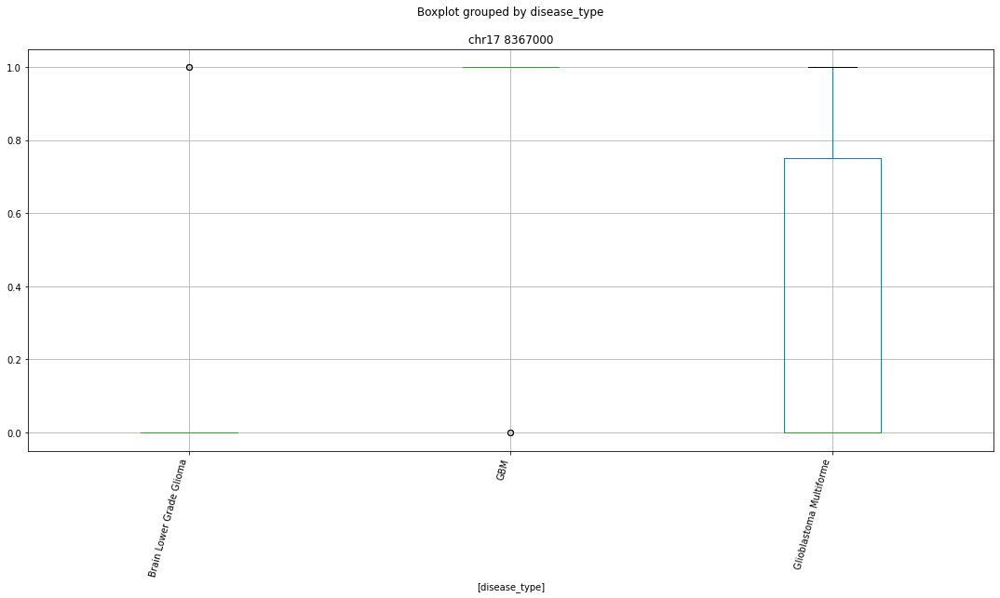

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr7 51209000


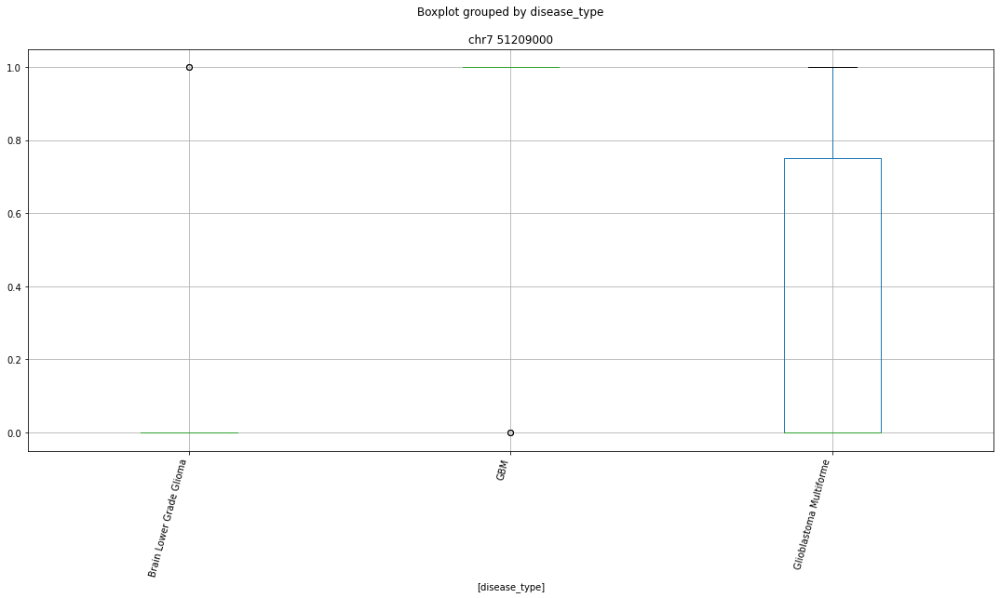

 p : 3.3711776281921387e-13  ( t : 9.719554838517347 ) :  chr17 17441000


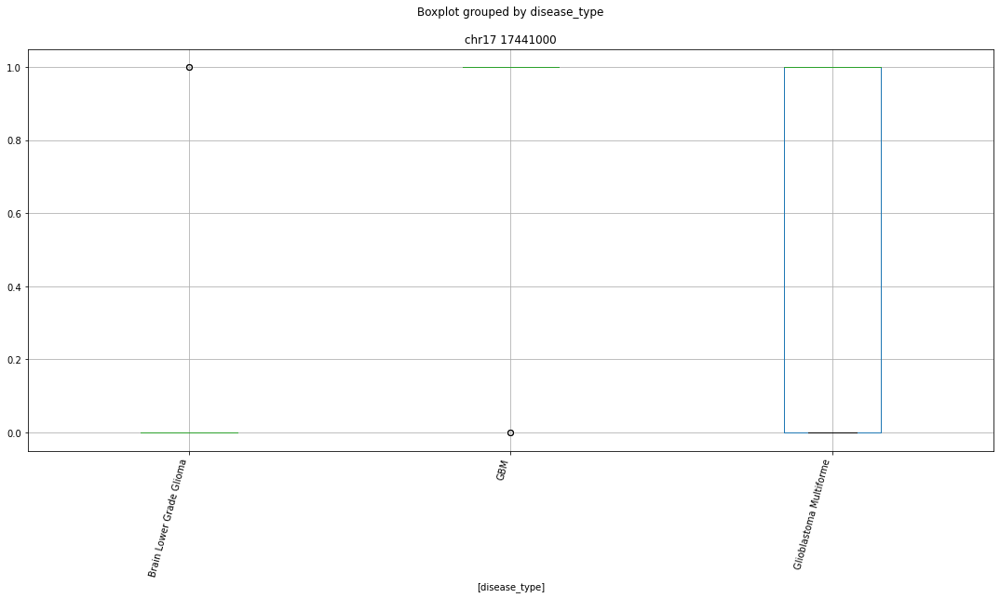

 p : 3.685967155941523e-13  ( t : 10.03120132386944 ) :  chr11 116348000


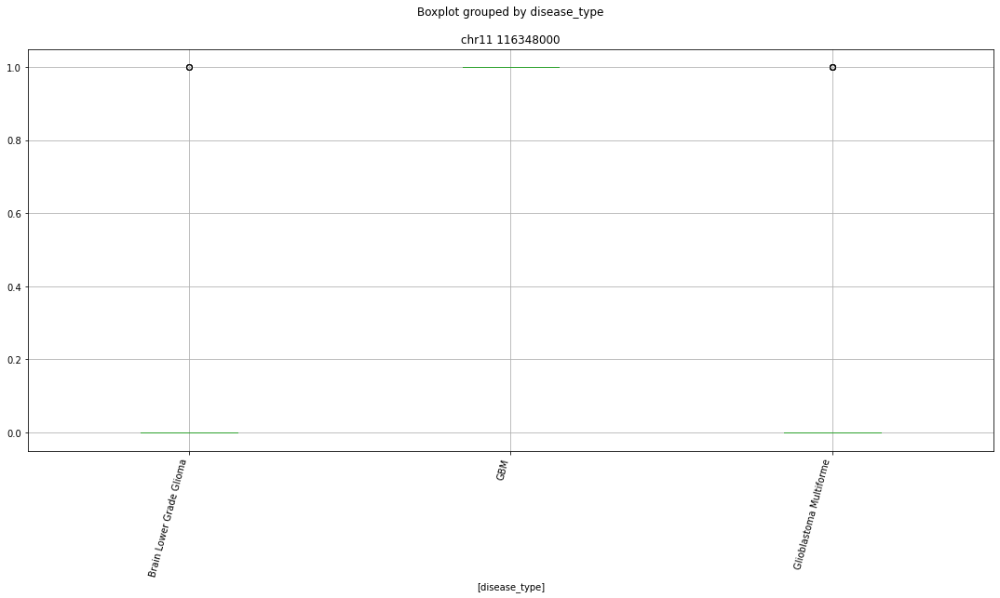

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr5 120073000


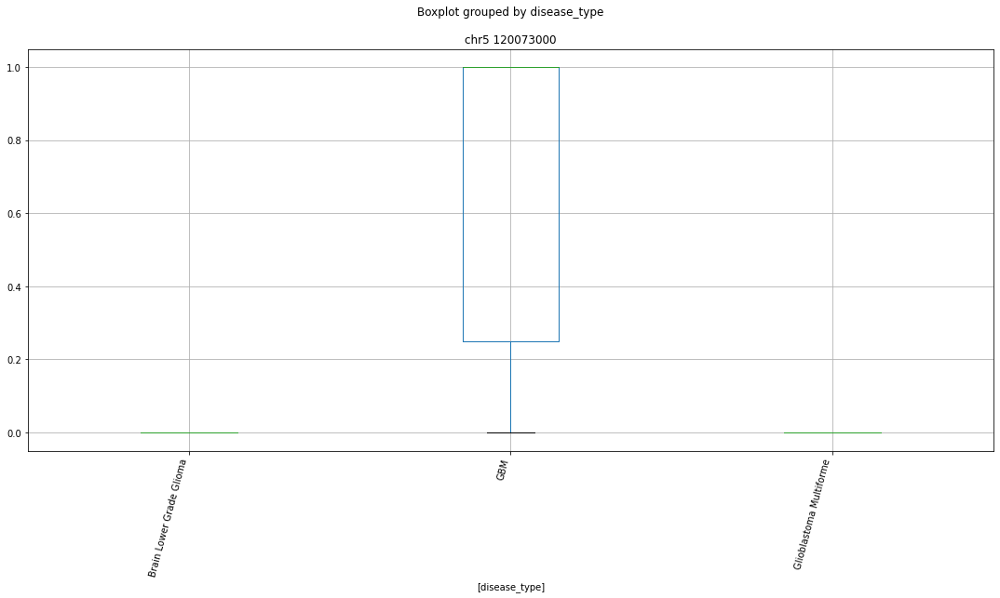

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr2 55706000


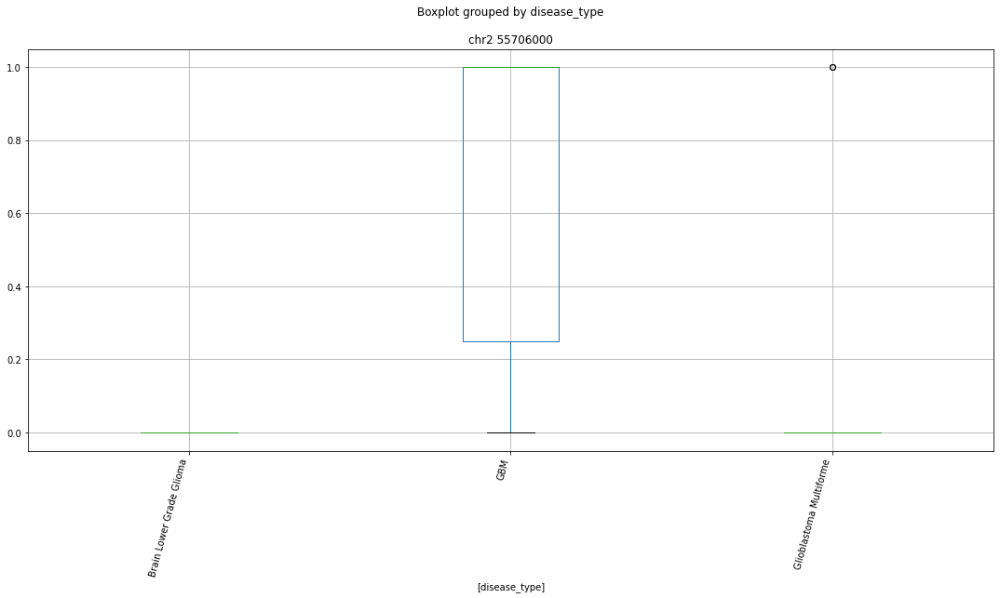

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr2 65599000


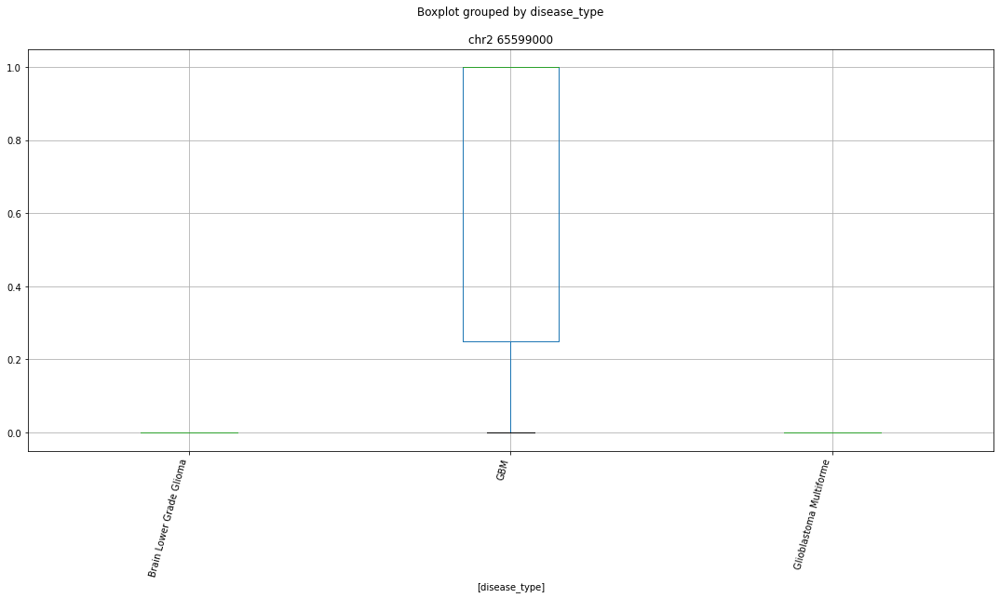

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr2 201043000


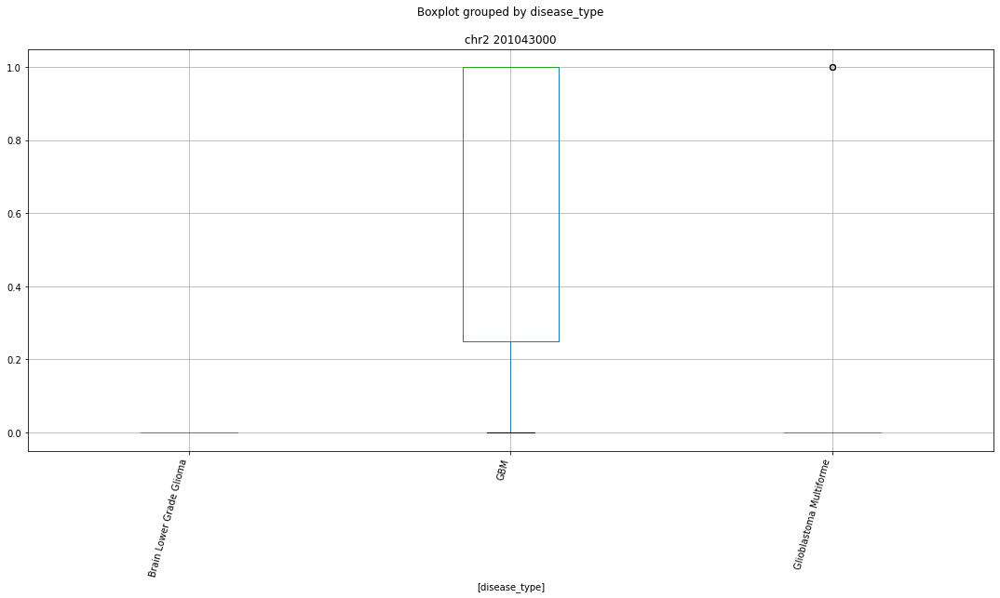

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr12 80306000


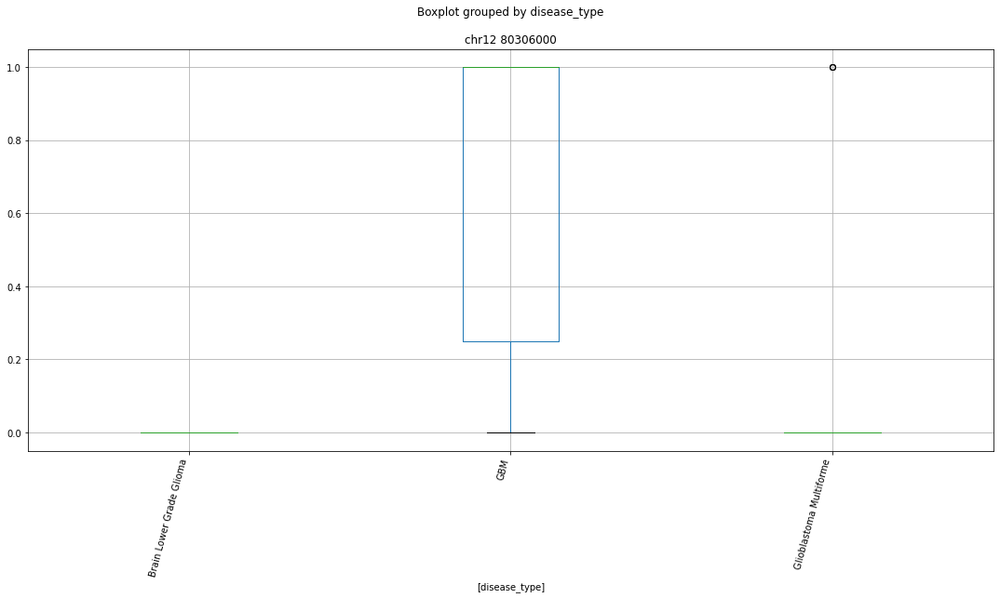

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr11 16888000


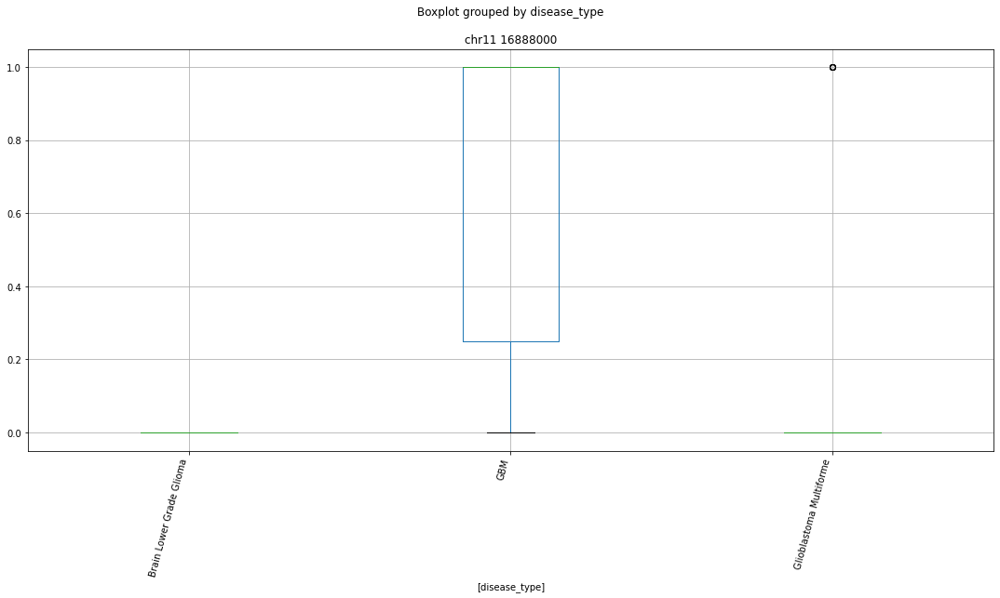

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr3 38064000


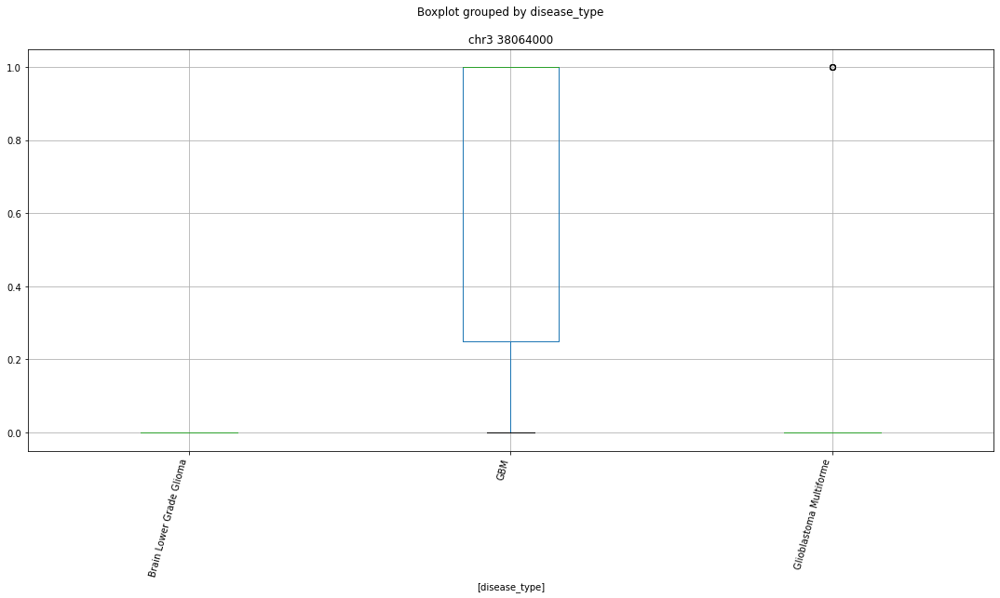

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr17 3997000


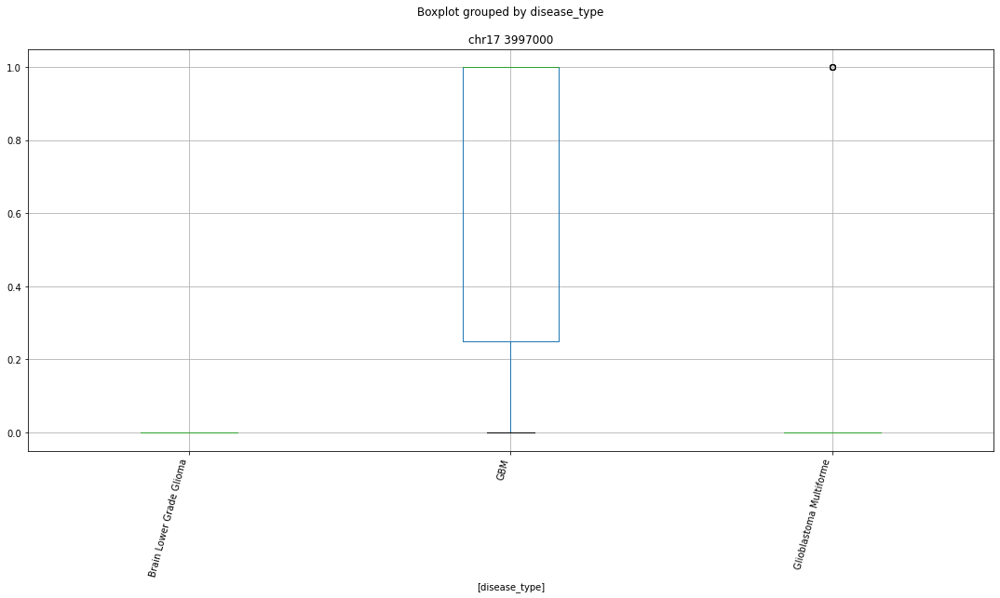

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr10 65052000


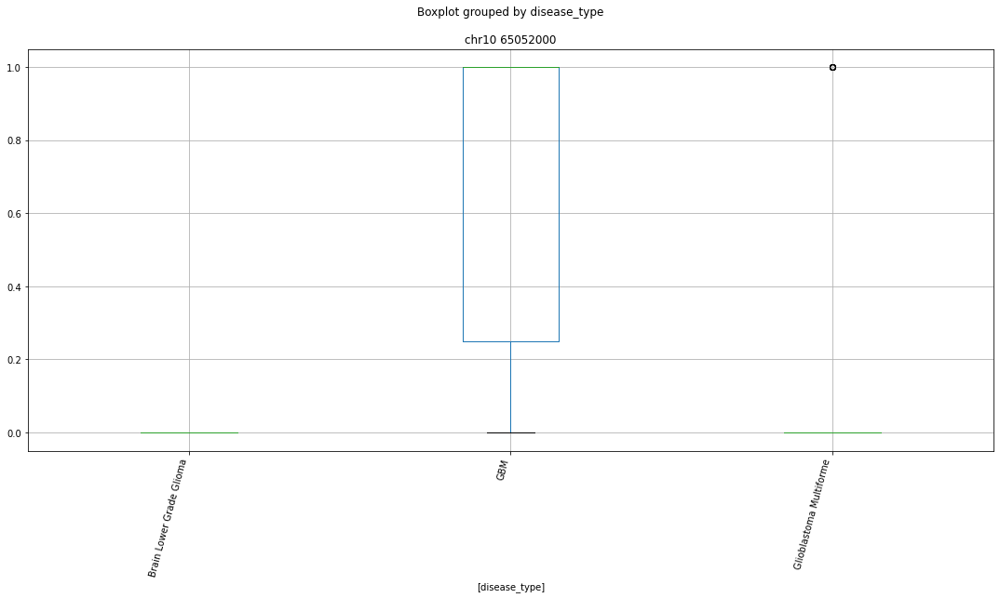

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr15 64798000


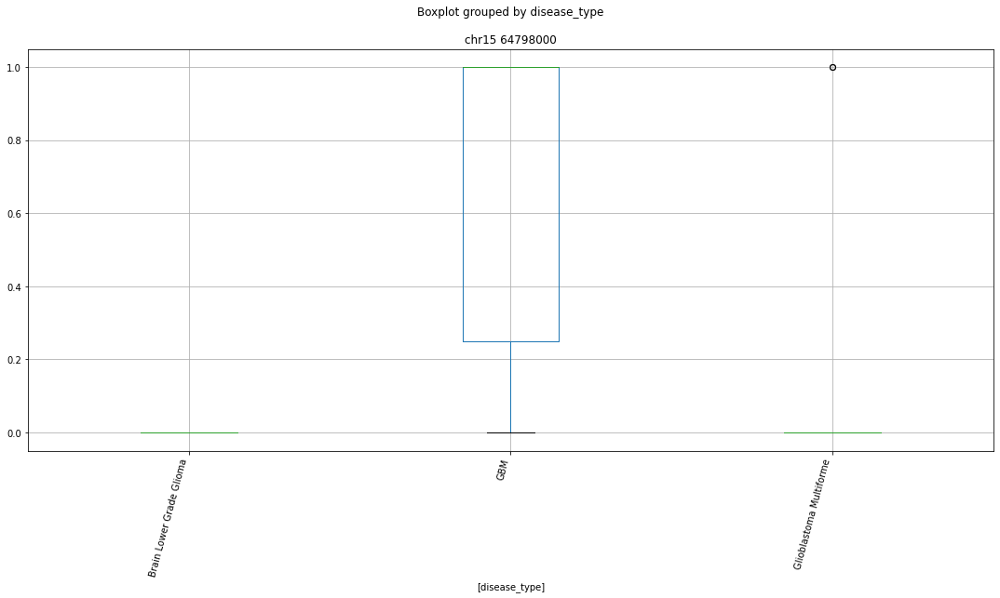

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr15 60368000


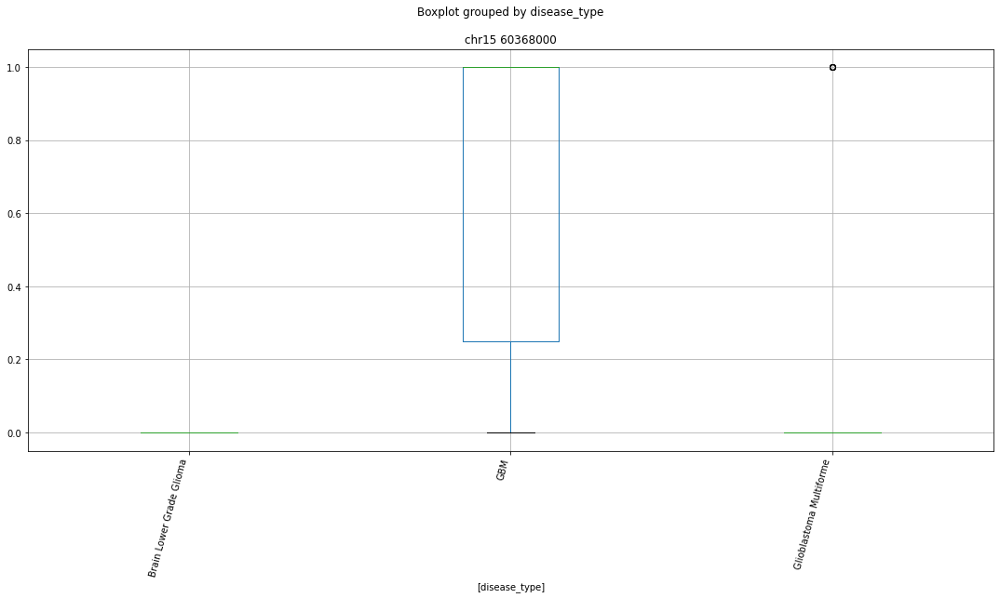

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr10 103130000


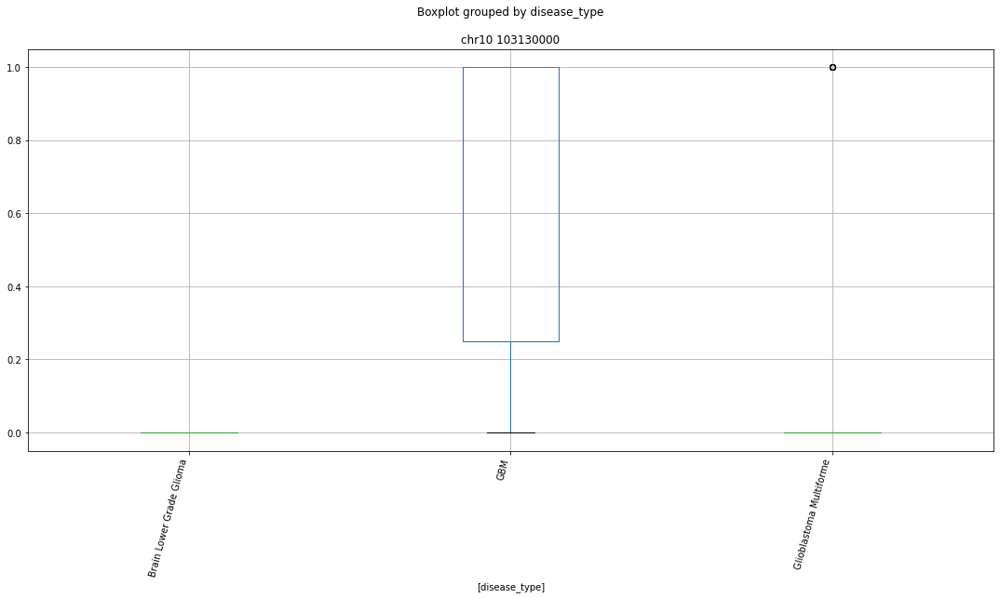

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr14 85829000


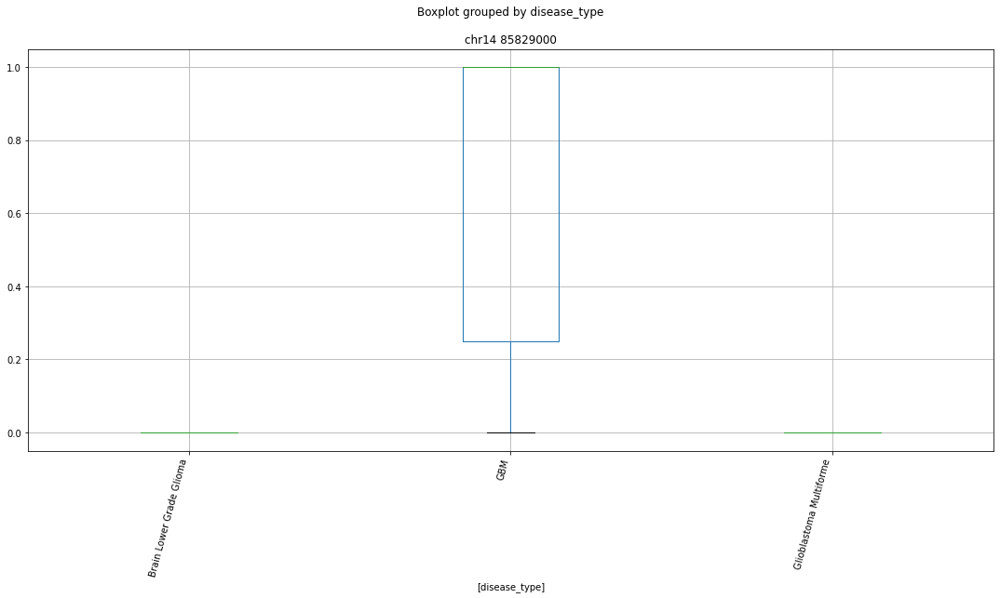

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr11 85853000


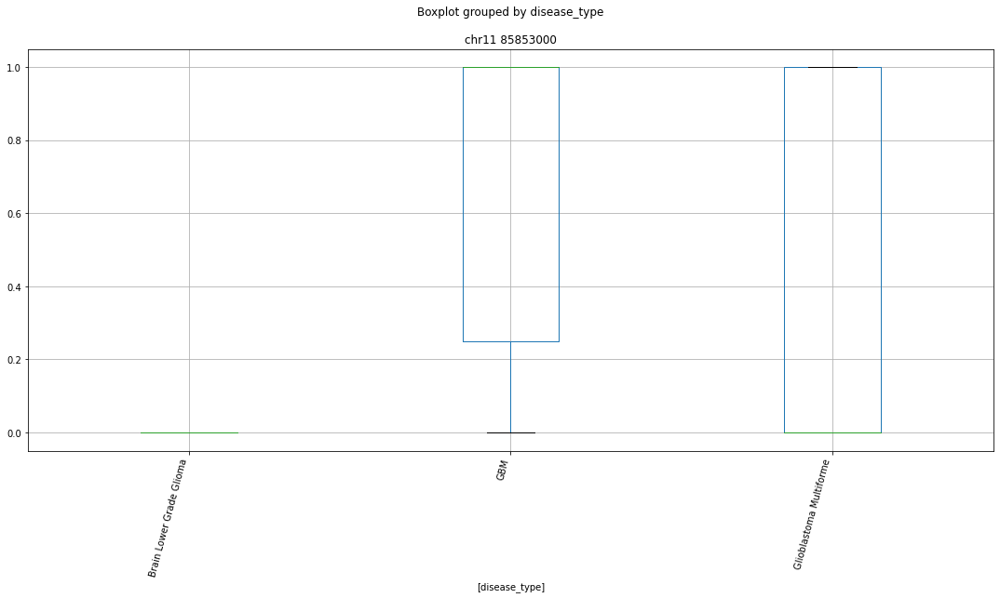

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr4 185239000


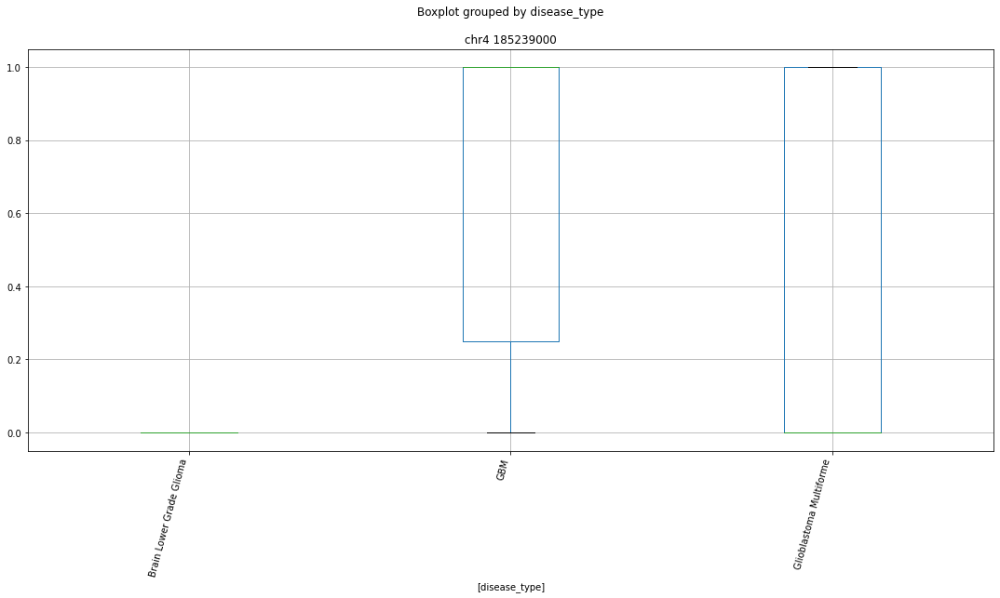

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr17 82774000


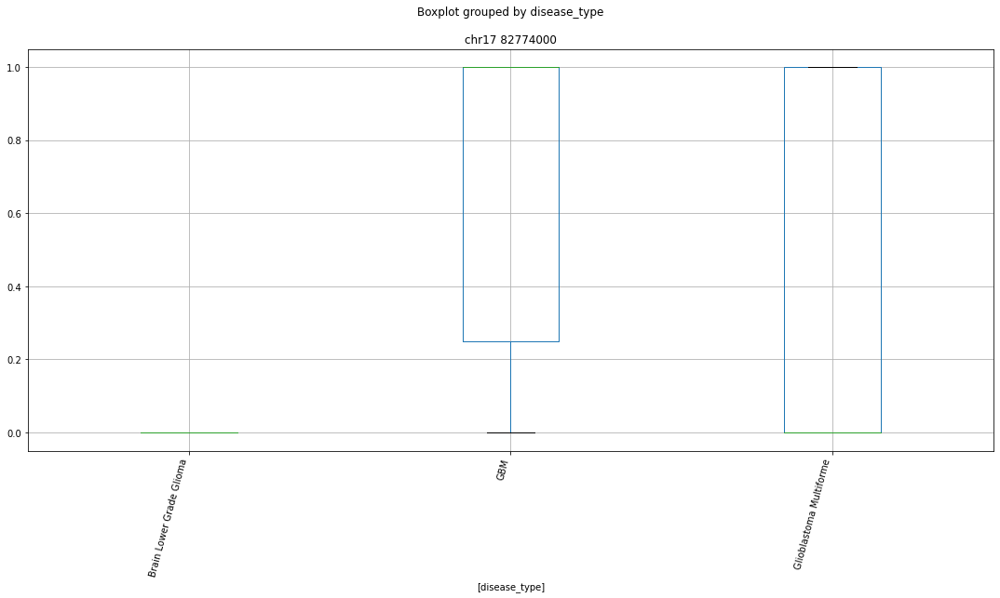

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr14 84098000


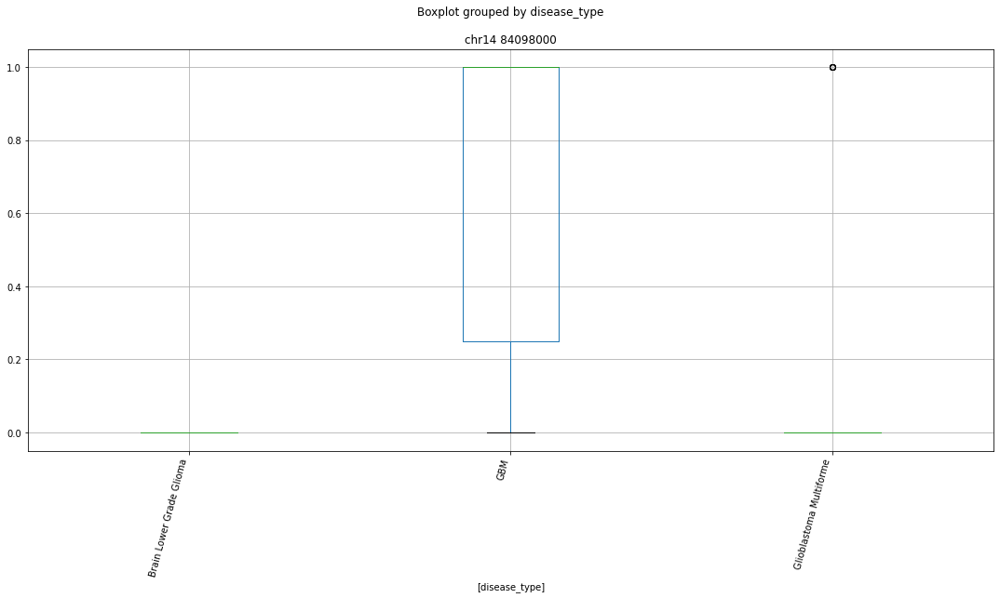

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr5 158583000


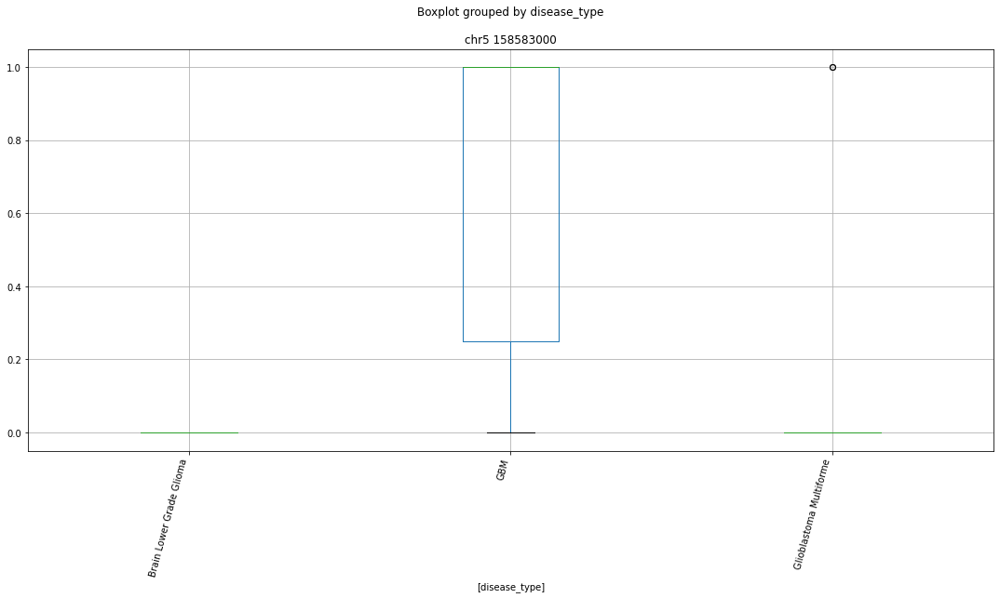

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr9 118677000


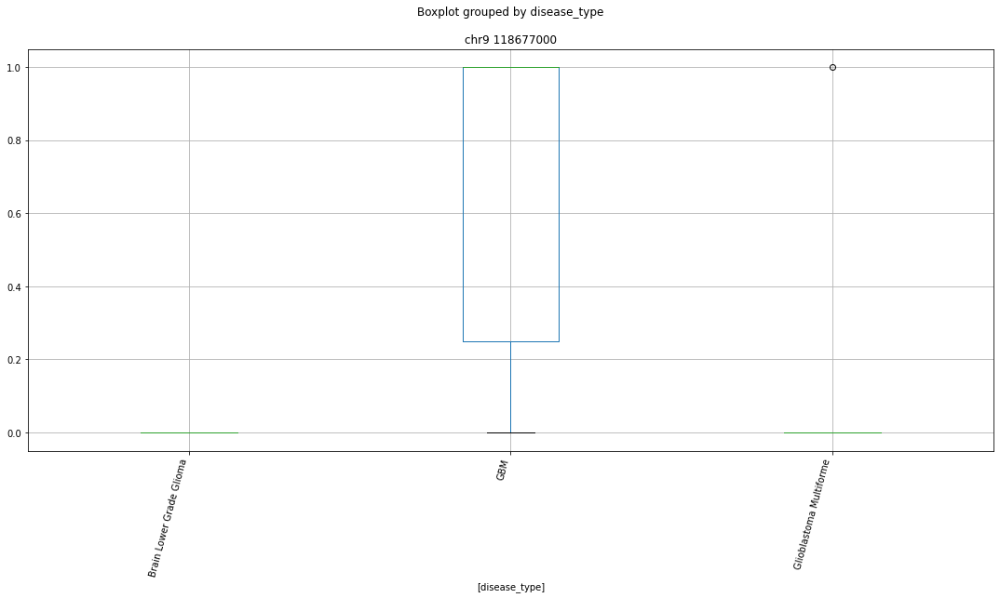

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr3 183609000


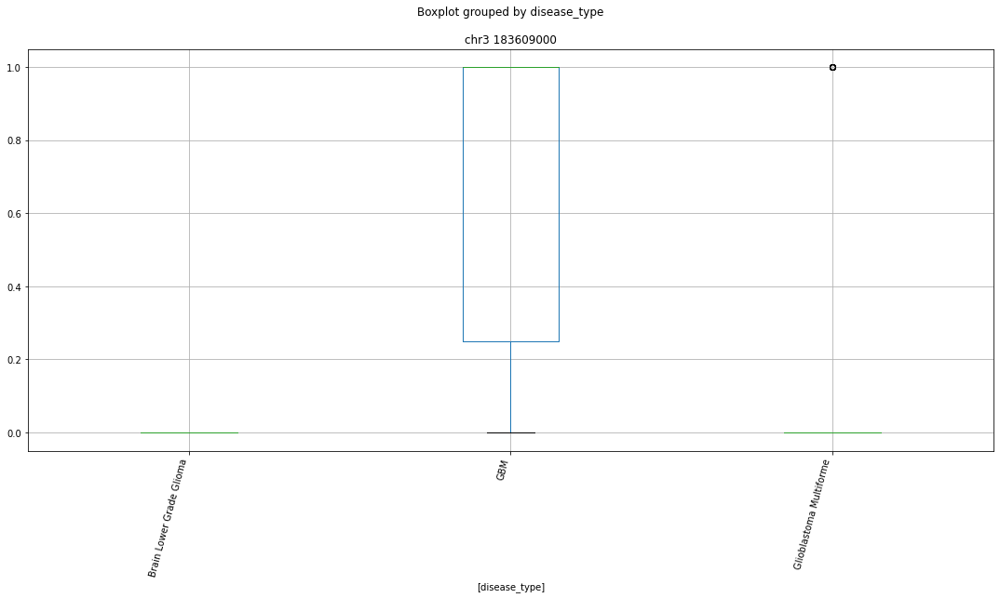

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr14 45390000


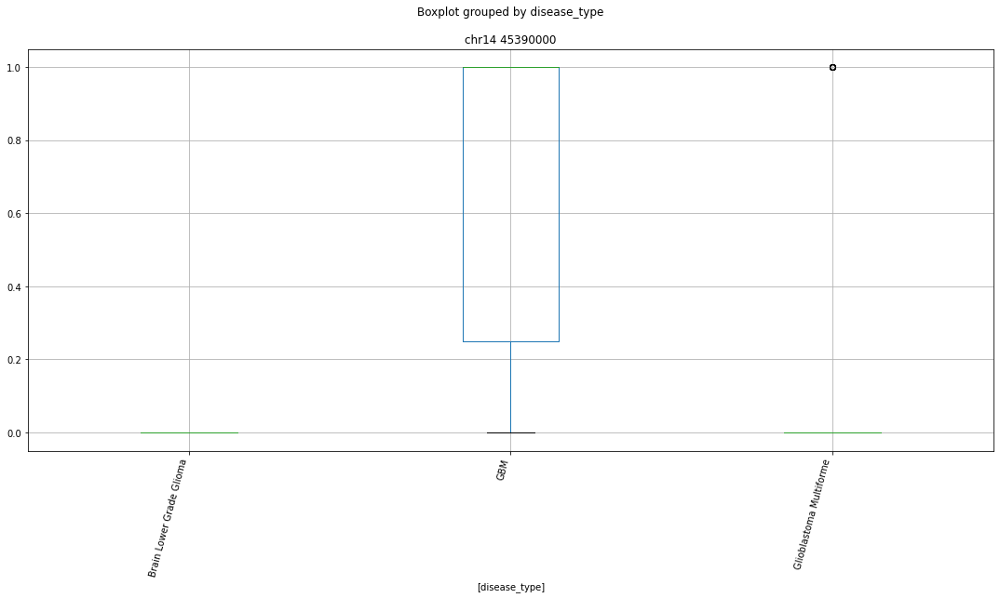

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr1 24031000


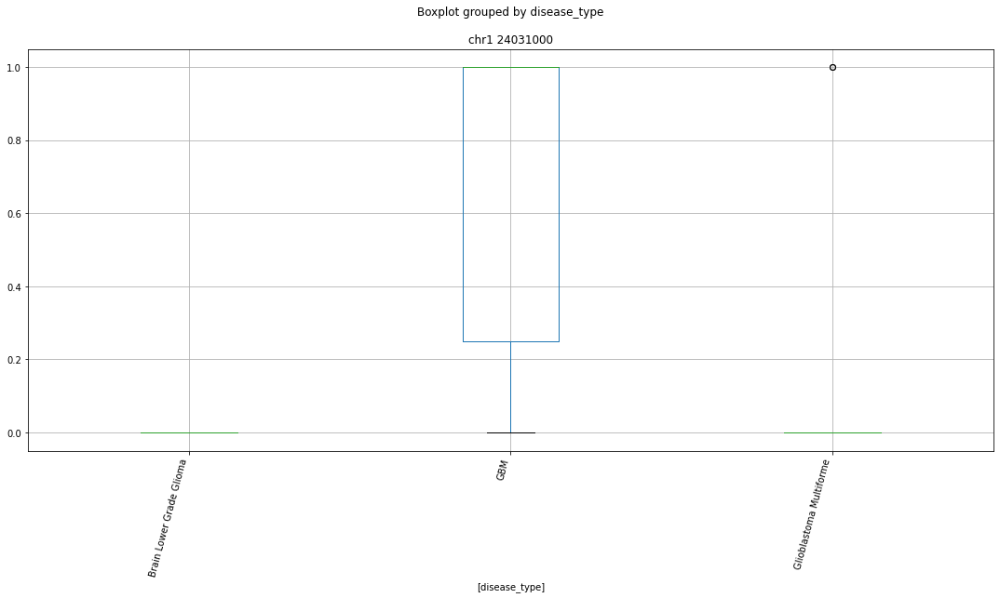

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr16 8982000


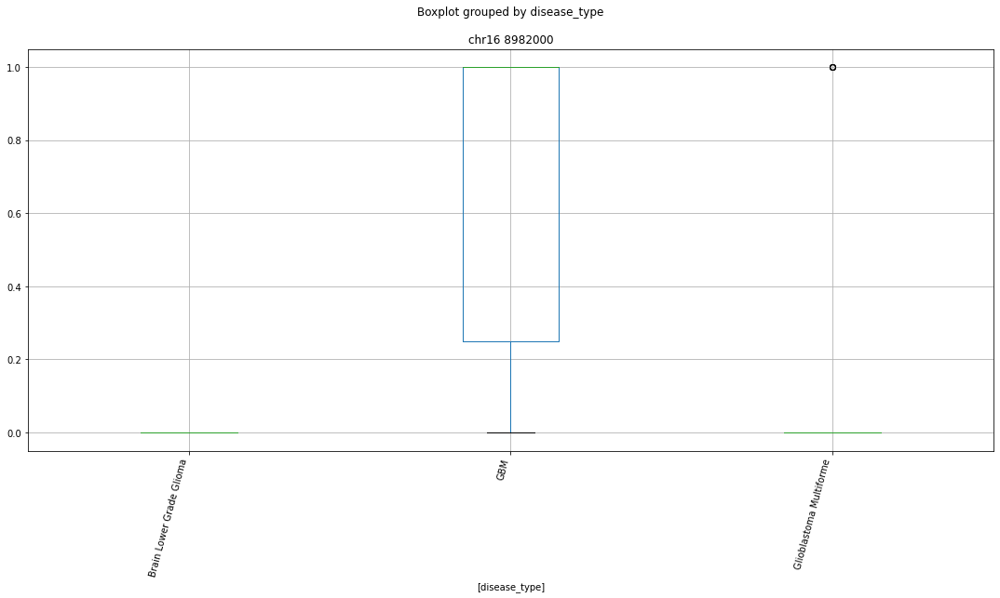

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr6 158348000


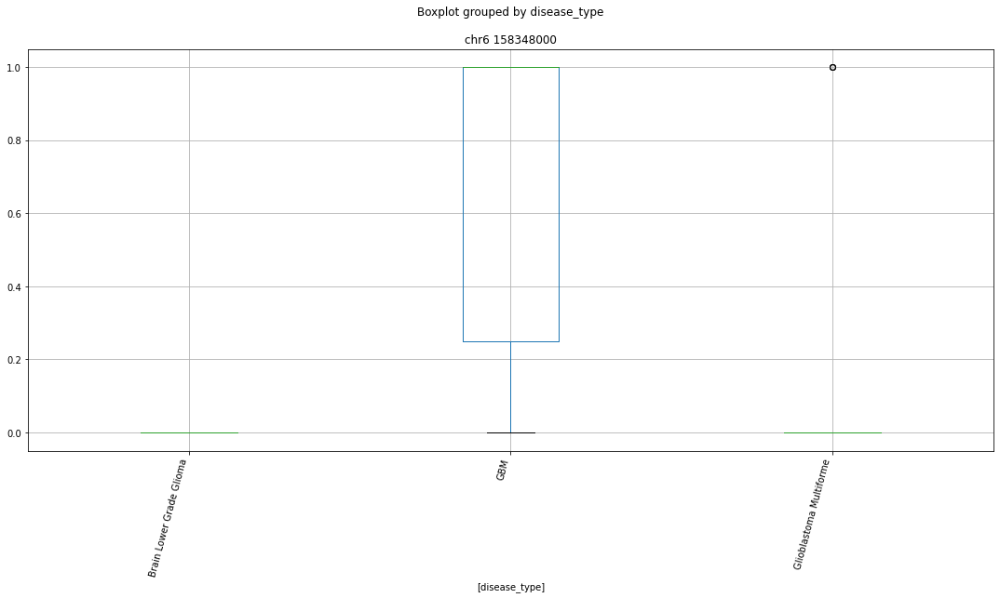

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr2 127118000


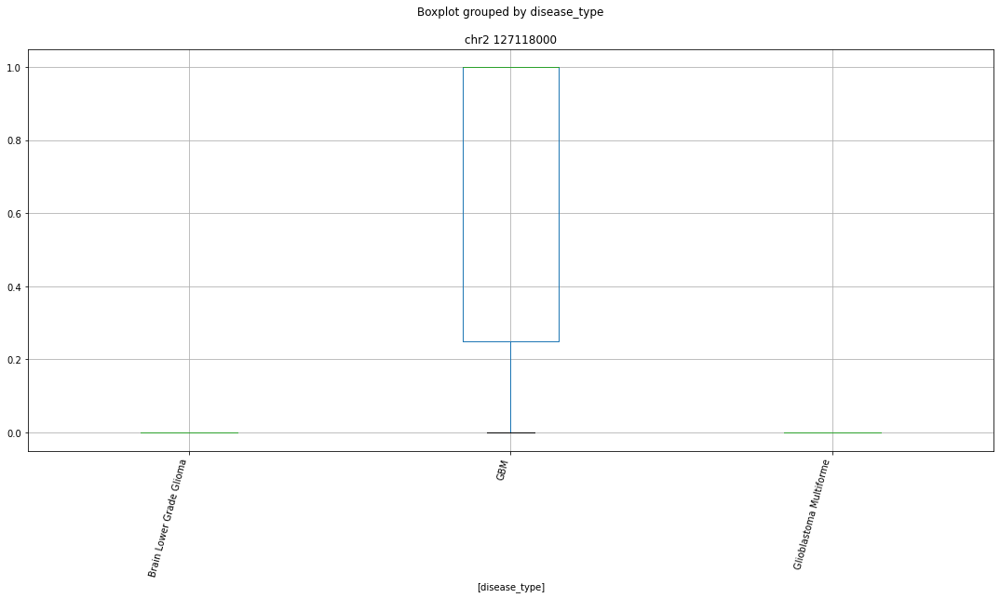

 p : 3.7826505374862424e-13  ( t : 9.686111434264069 ) :  chr11 112026000


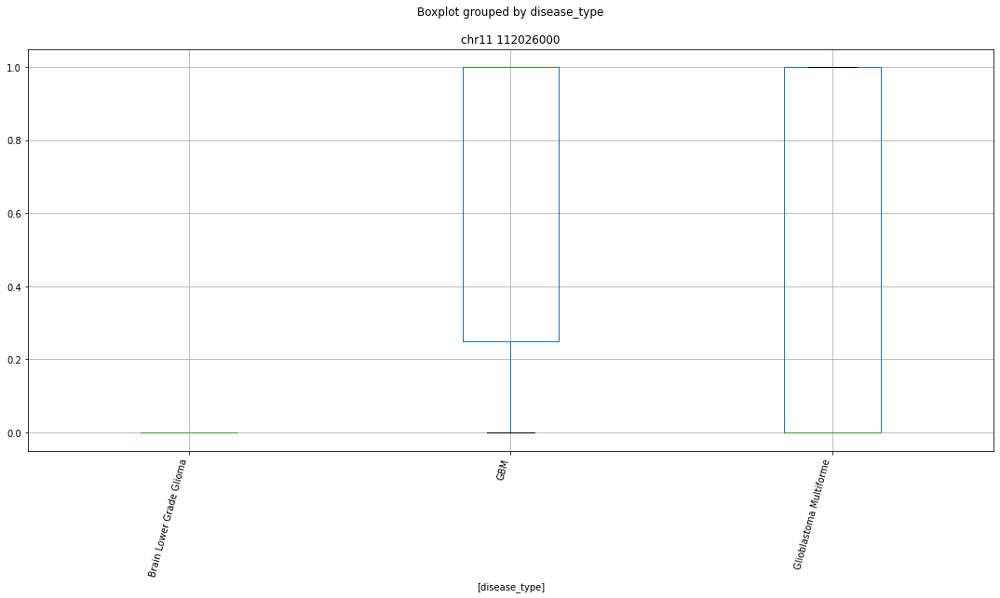

 p : 5.624511905133774e-13  ( t : 9.571183164573297 ) :  chr5 108991000


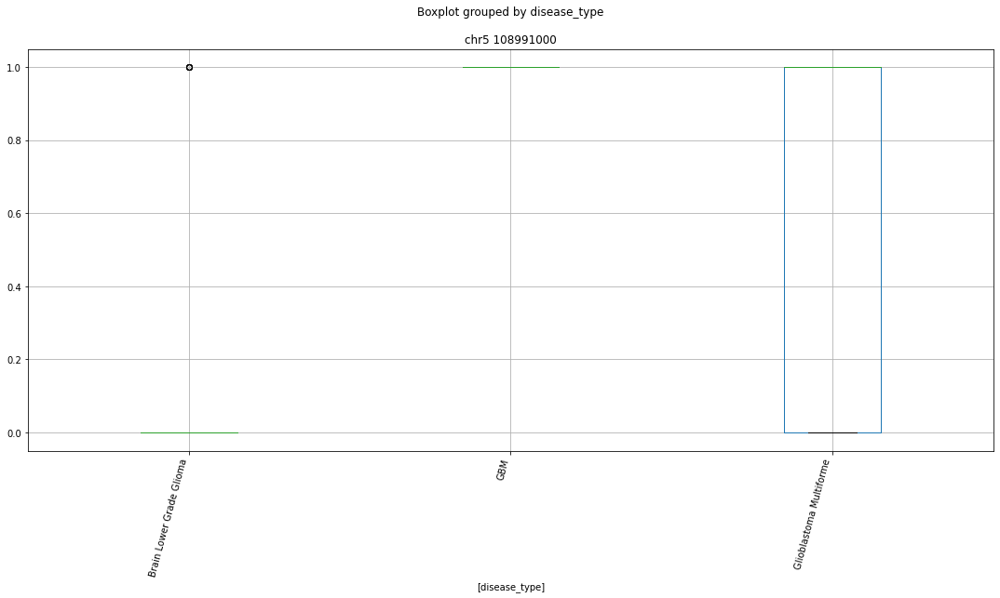

 p : 5.624511905133774e-13  ( t : 9.571183164573297 ) :  chr18 12875000


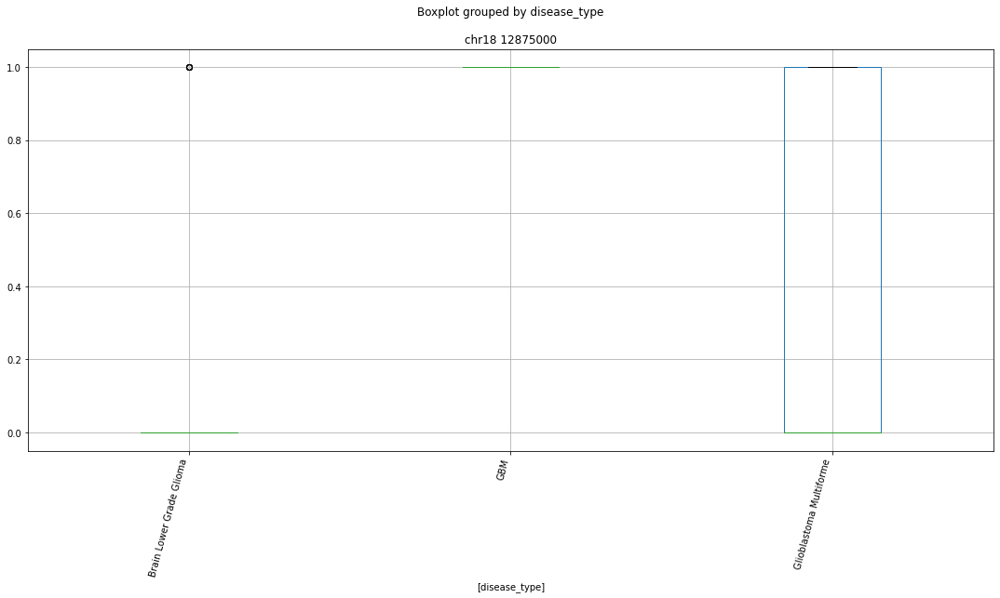

 p : 5.624511905133774e-13  ( t : 9.571183164573297 ) :  chr6 159661000


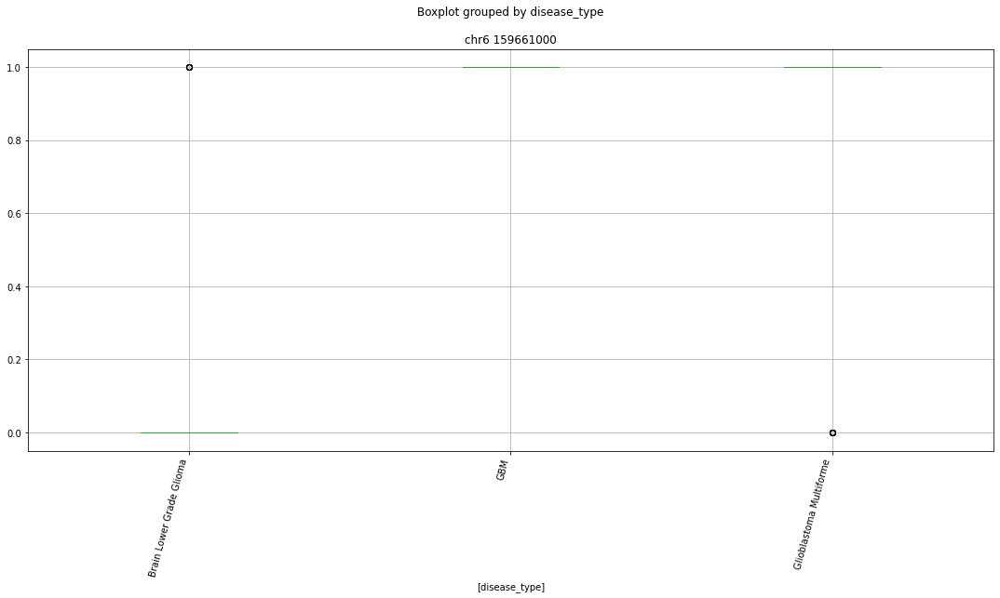

 p : 5.624511905133774e-13  ( t : 9.571183164573297 ) :  chr8 60546000


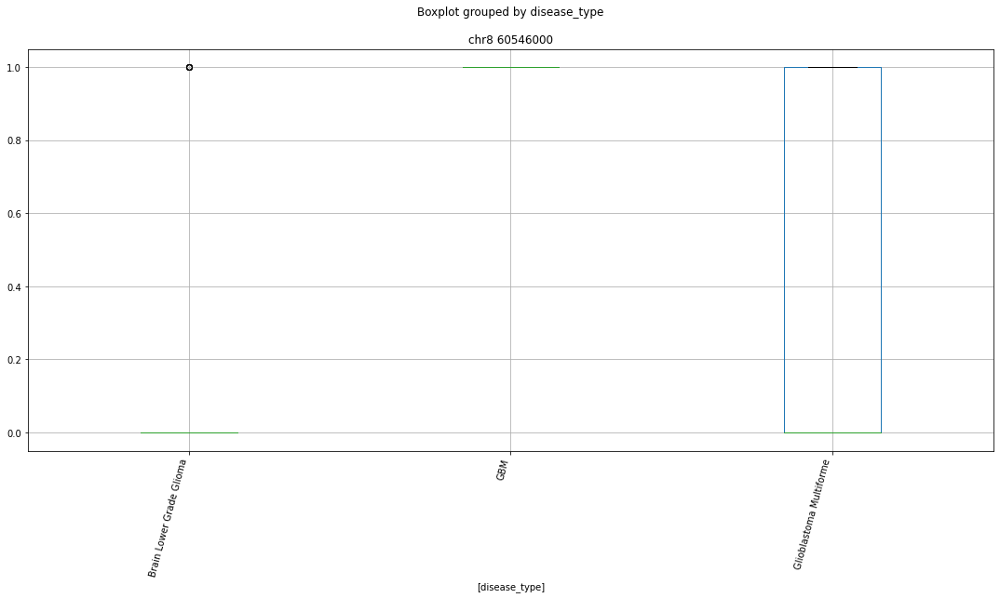

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr2 177844000


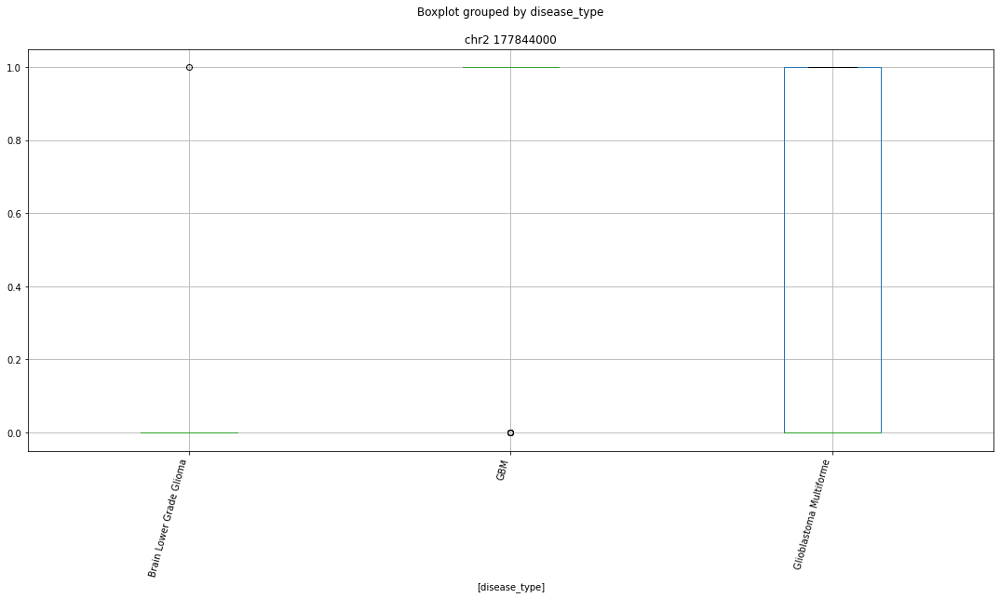

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr1 173614000


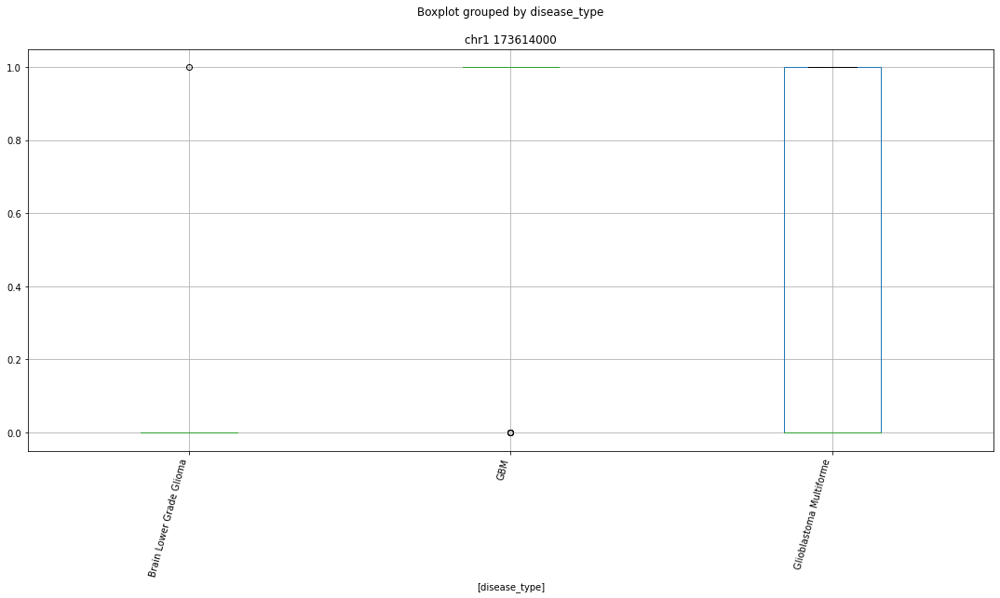

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr14 58589000


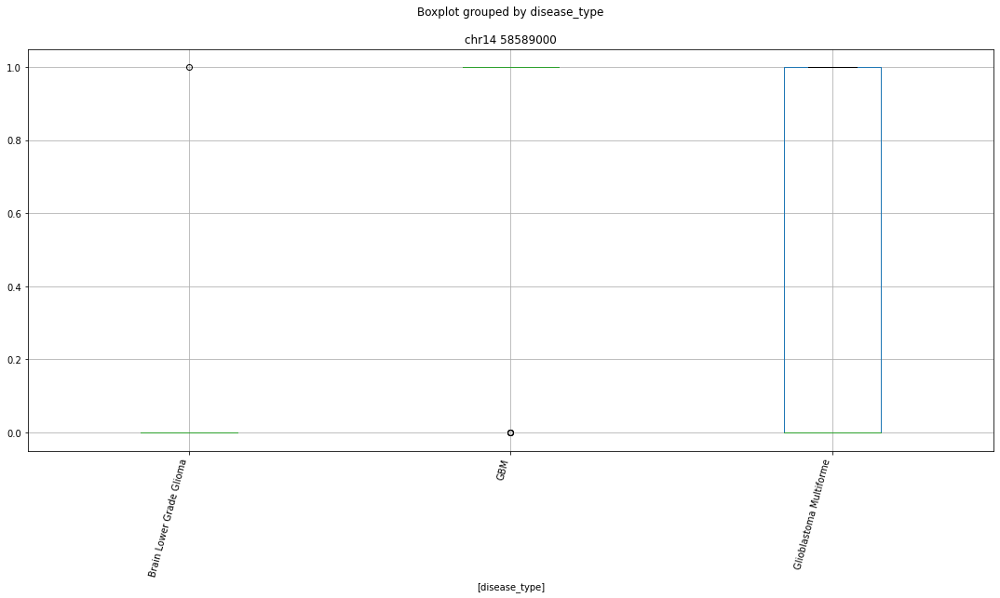

 p : 6.156397805631412e-13  ( t : 9.545065224835223 ) :  chr18 13097000


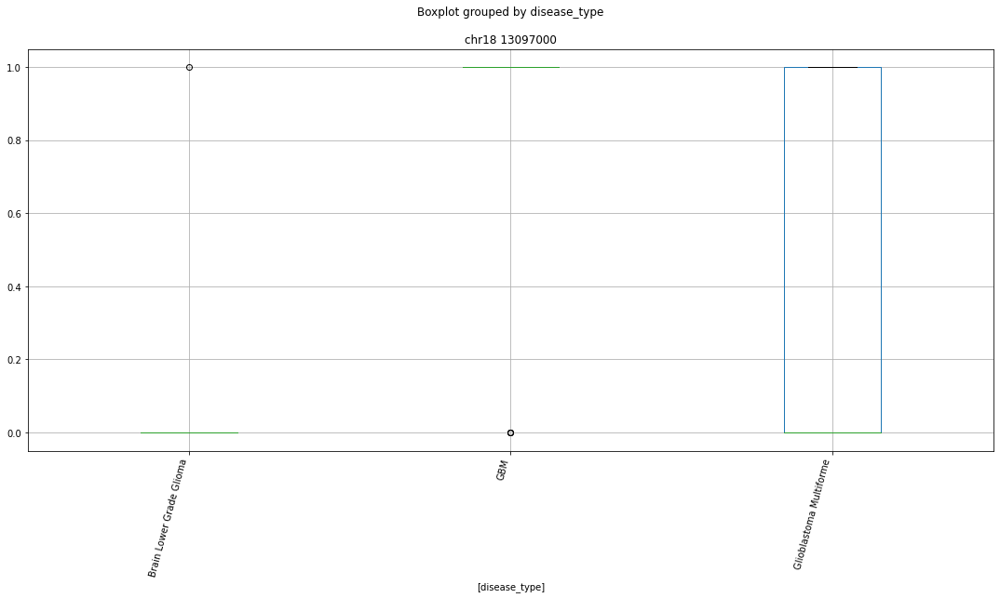

 p : 6.156397805631412e-13  ( t : 9.545065224835223 ) :  chr12 119917000


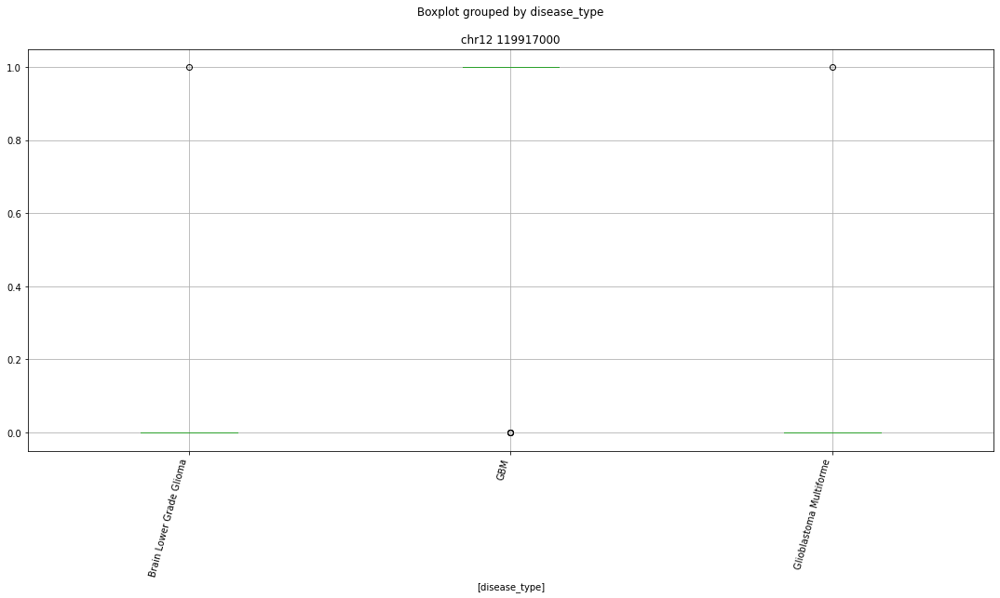

 p : 6.156397805631412e-13  ( t : 9.545065224835223 ) :  chr2 143992000


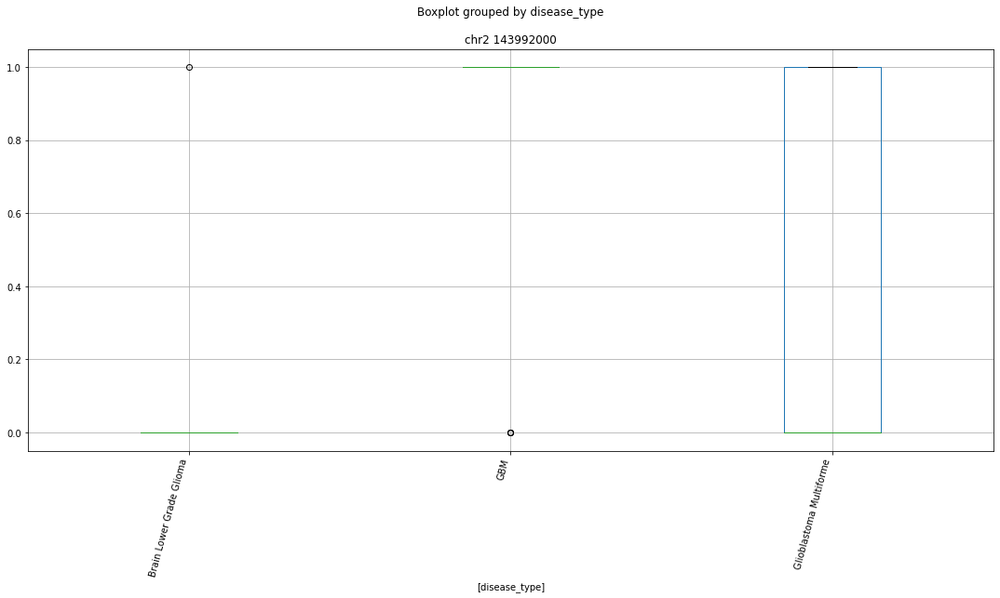

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr2 113095000


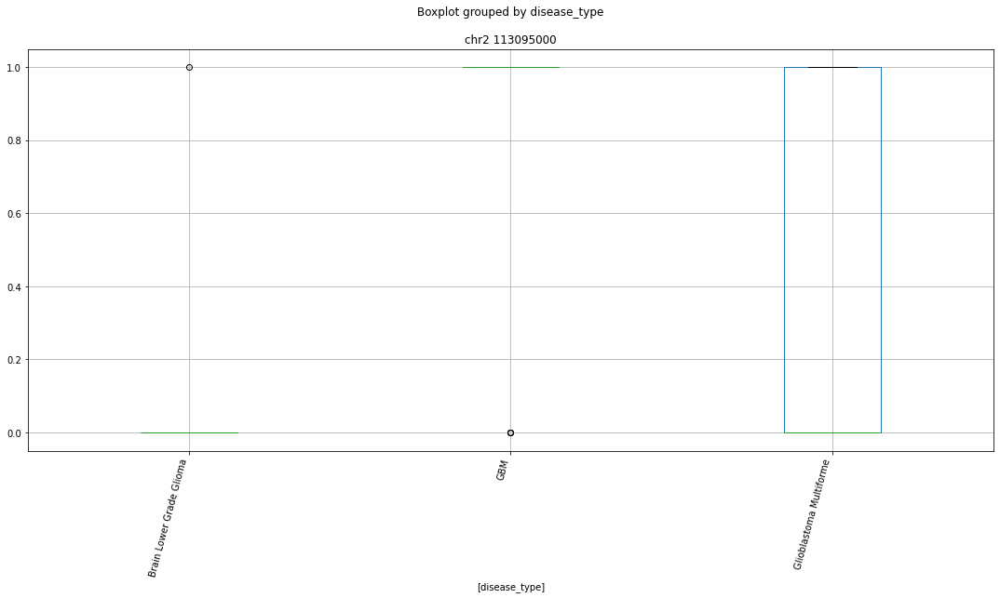

 p : 6.156397805631412e-13  ( t : 9.545065224835223 ) :  chr21 31583000


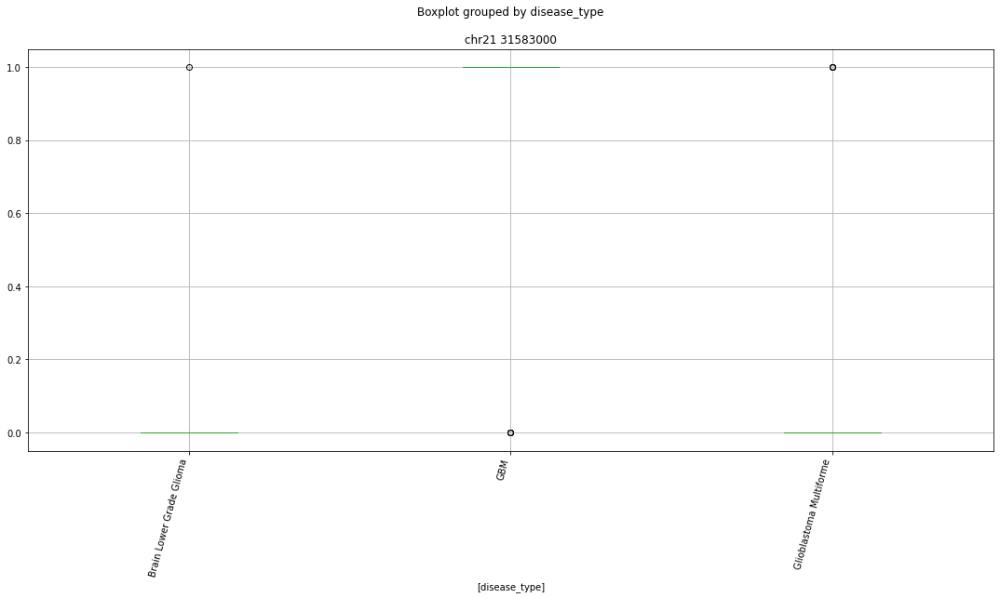

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr20 19677000


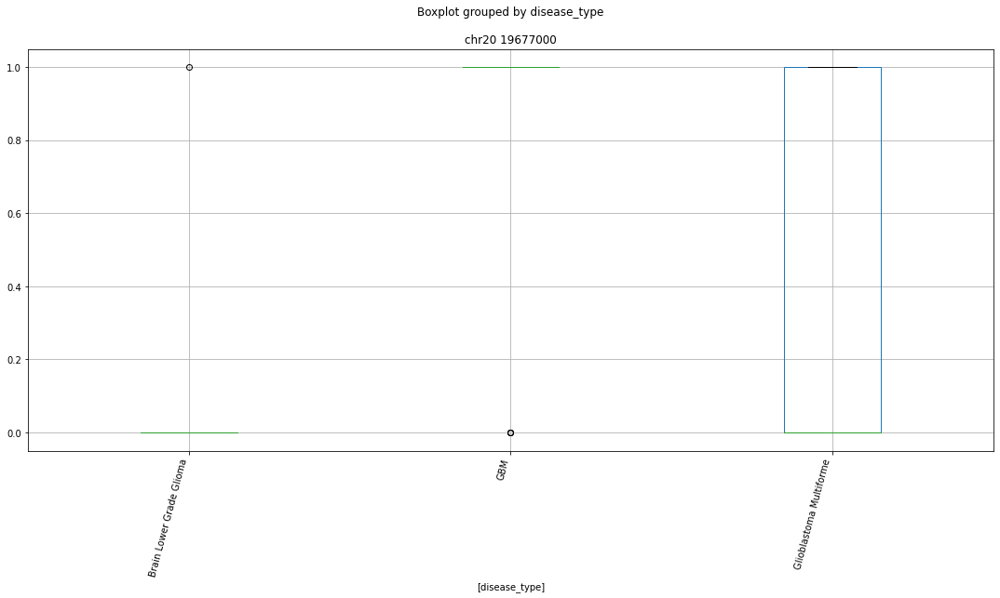

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr19 23370000


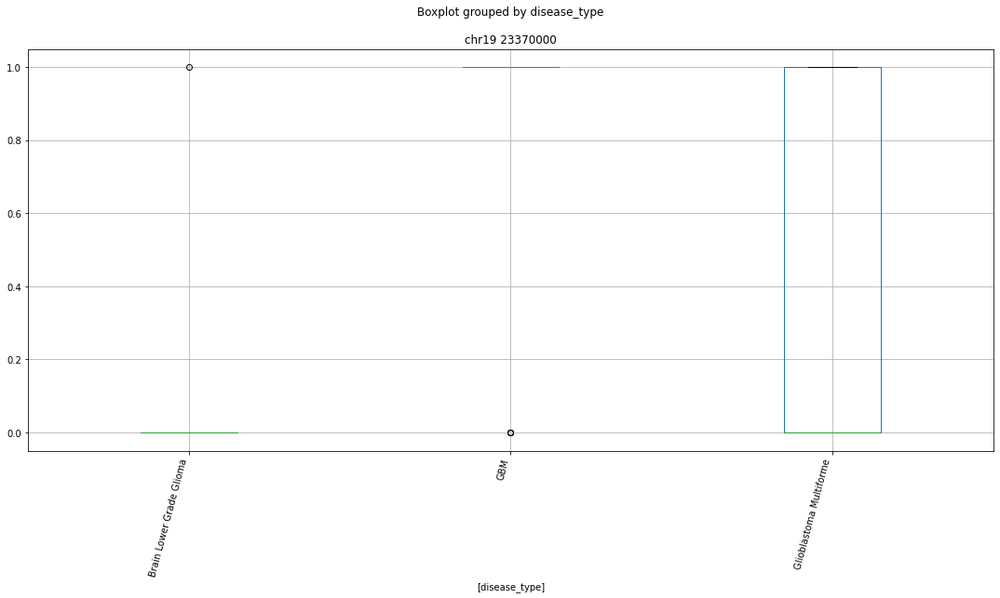

 p : 6.156397805631412e-13  ( t : 9.545065224835223 ) :  chr11 59586000


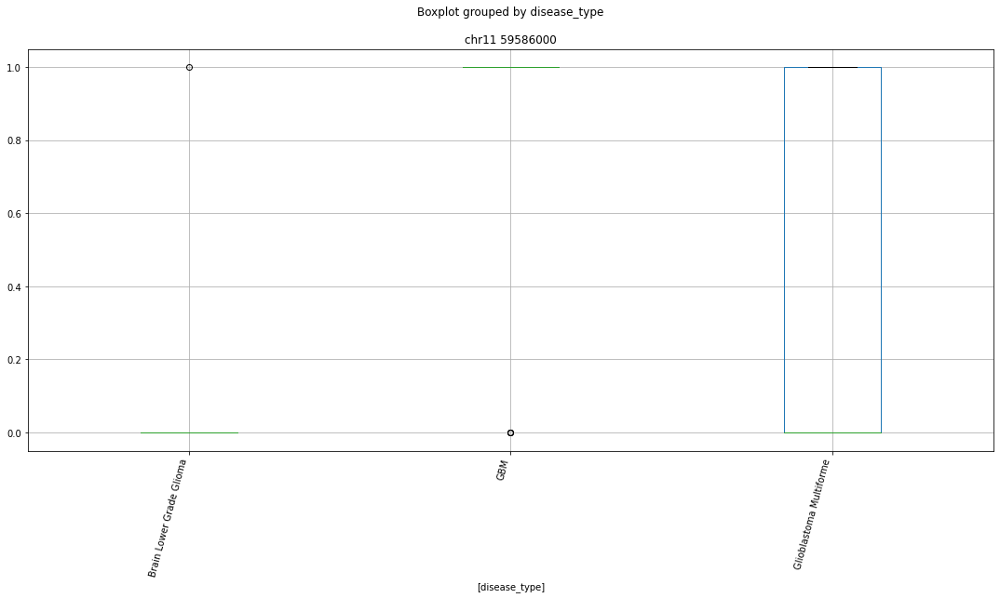

 p : 6.156397805631412e-13  ( t : 9.545065224835223 ) :  chr10 43464000


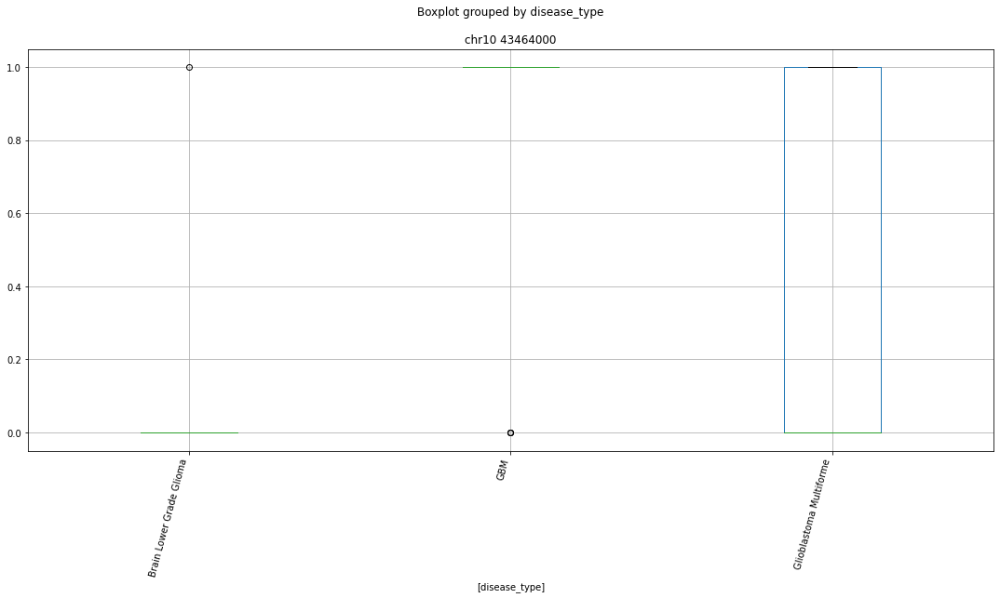

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr3 195599000


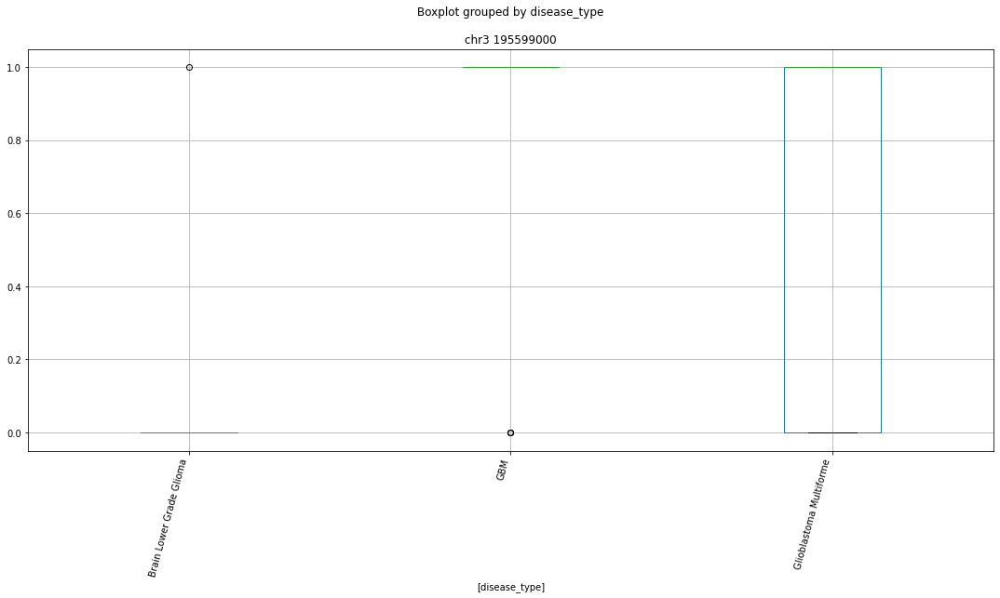

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr11 74128000


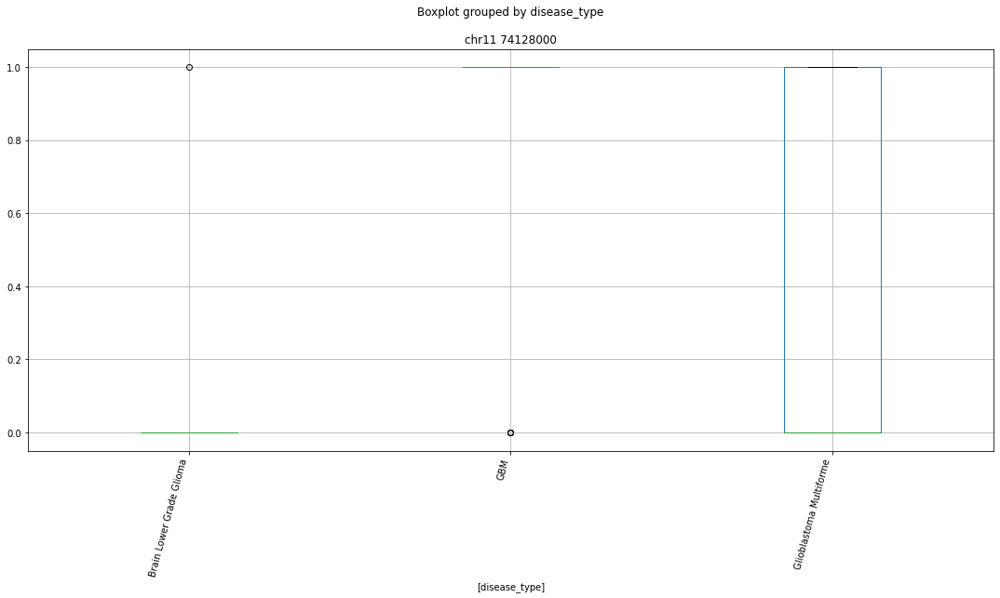

 p : 6.156397805631412e-13  ( t : 9.545065224835222 ) :  chr2 64510000


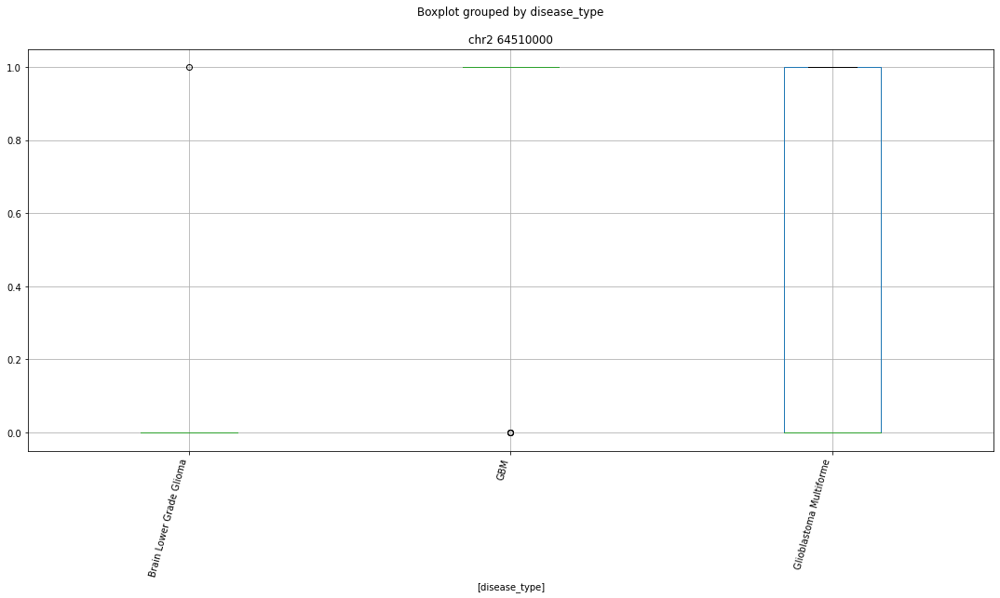

 p : 1.3043137708858713e-12  ( t : 8.597488506968883 ) :  chr22 19083000


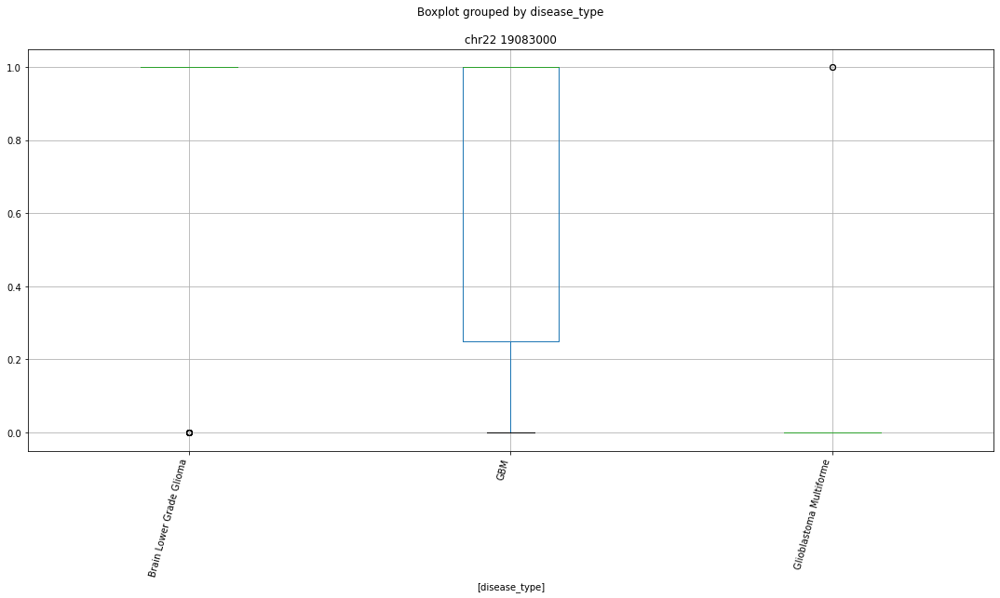

 p : 4.578196842753061e-12  ( t : 8.303349657899862 ) :  chr1 226115000


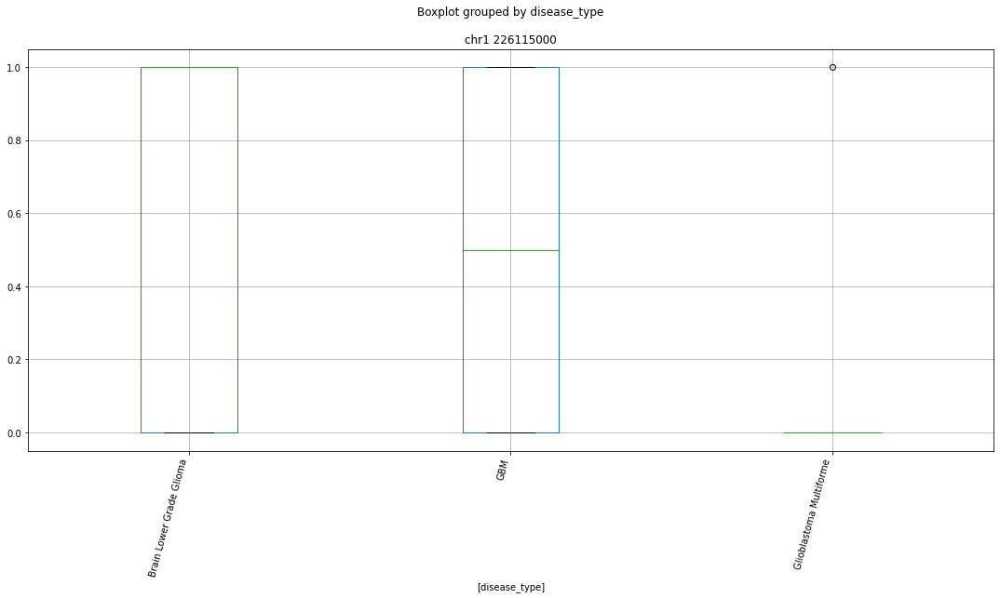

 p : 5.72102048355949e-12  ( t : 8.907157266714886 ) :  chr15 60947000


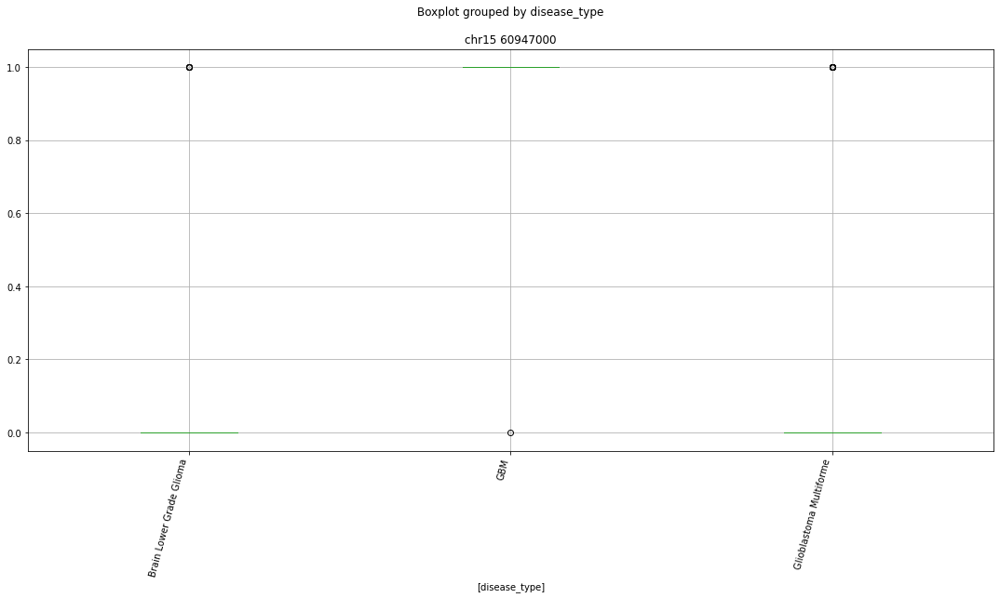

 p : 5.72102048355949e-12  ( t : 8.907157266714886 ) :  chr9 34138000


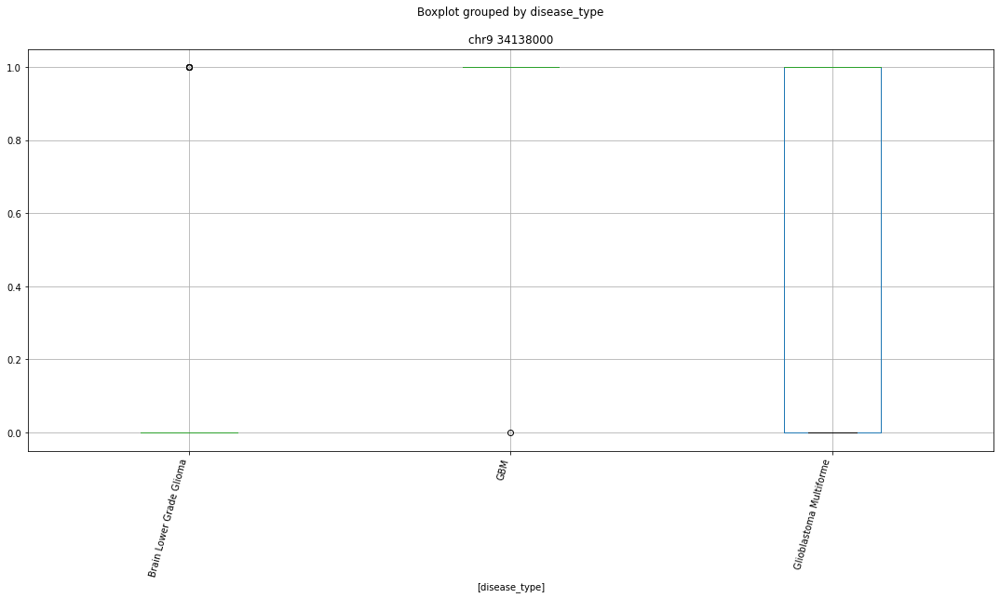

 p : 5.72102048355949e-12  ( t : 8.907157266714886 ) :  chr20 32121000


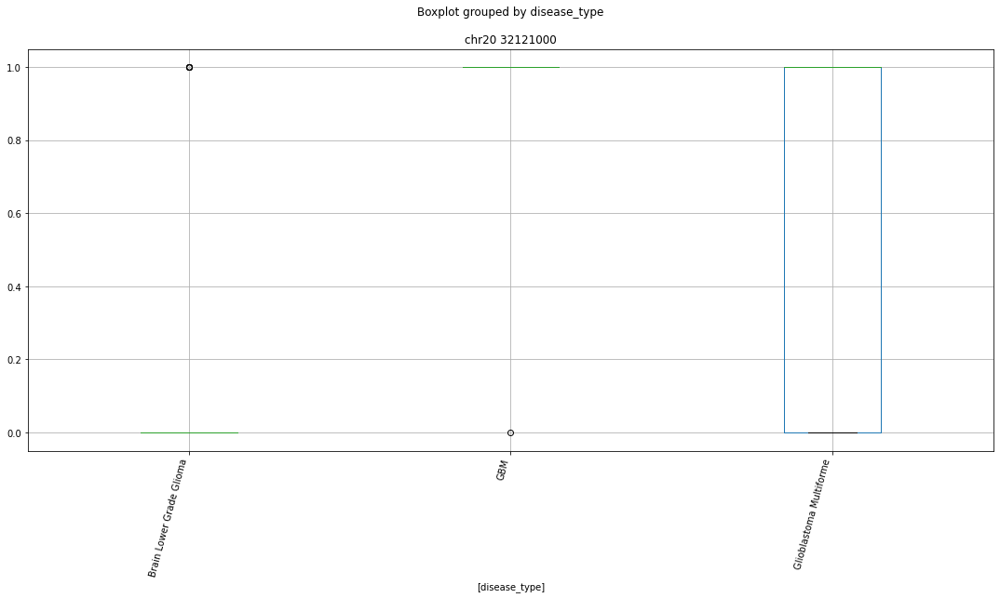

 p : 5.721020483559551e-12  ( t : 8.907157266714885 ) :  chr16 49209000


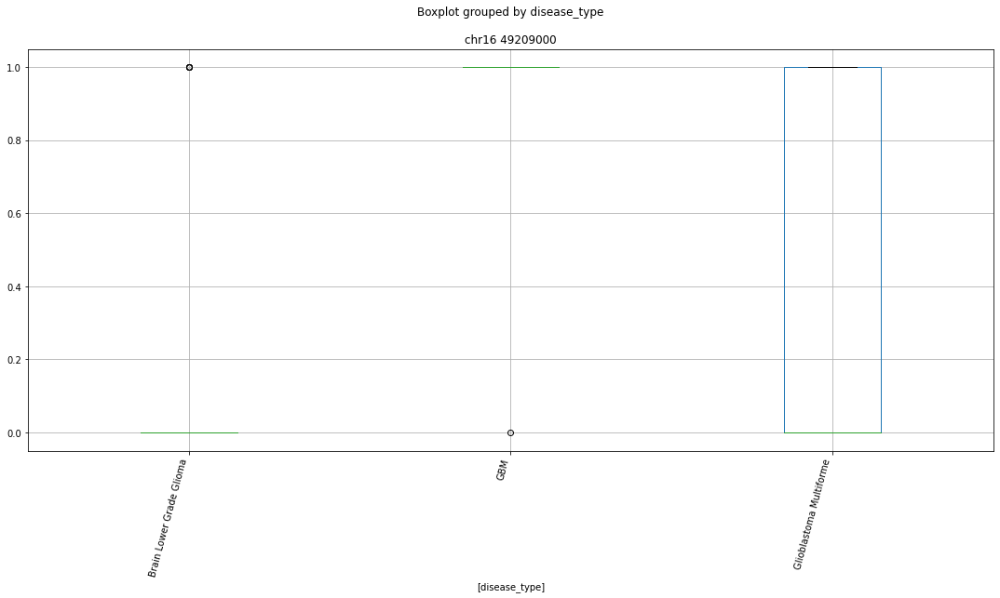

 p : 5.721020483559551e-12  ( t : 8.907157266714885 ) :  chr18 14009000


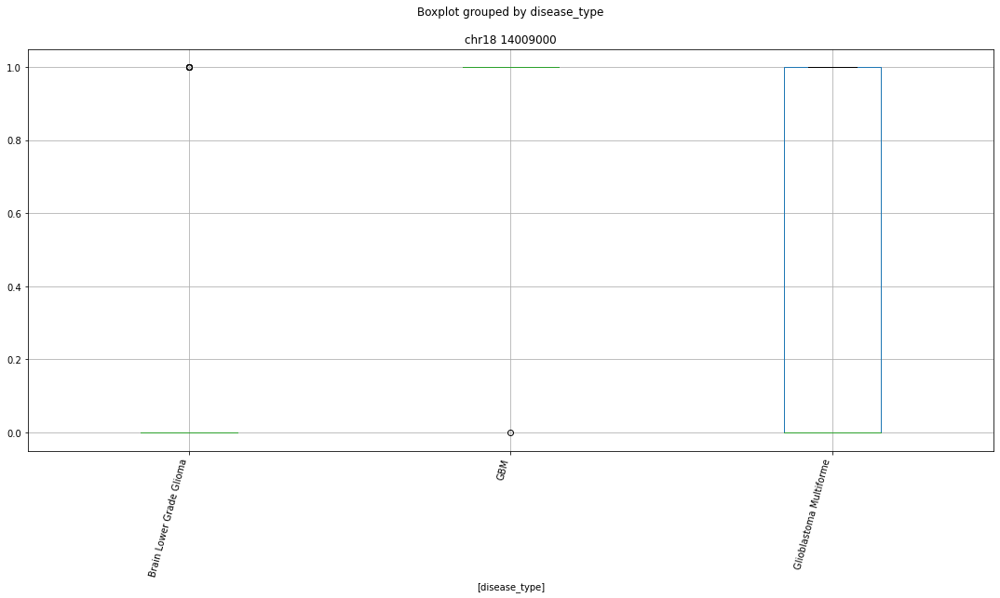

 p : 5.721020483559551e-12  ( t : 8.907157266714885 ) :  chr5 176434000


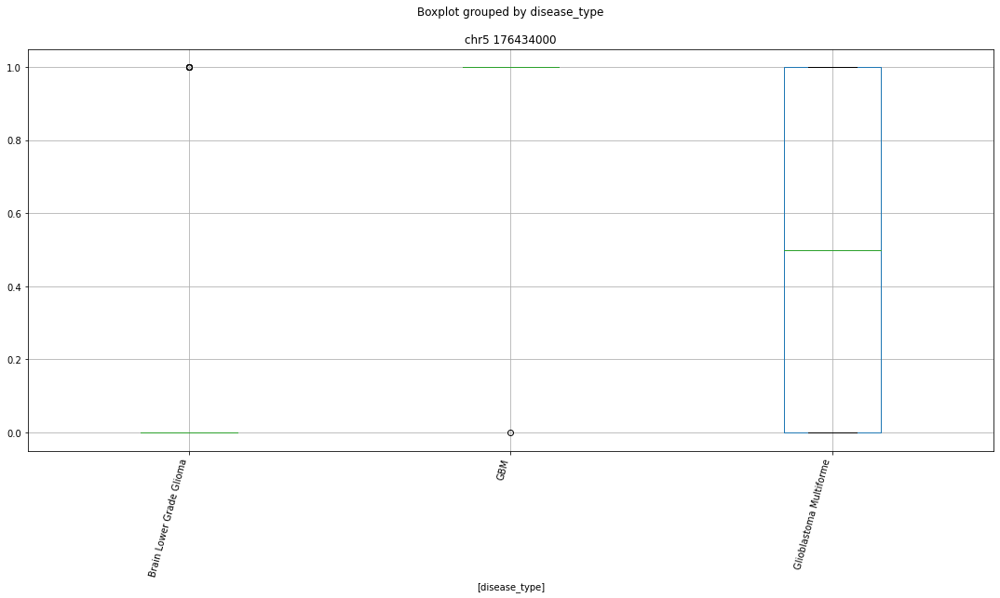

 p : 5.721020483559551e-12  ( t : 8.907157266714885 ) :  chr12 56782000


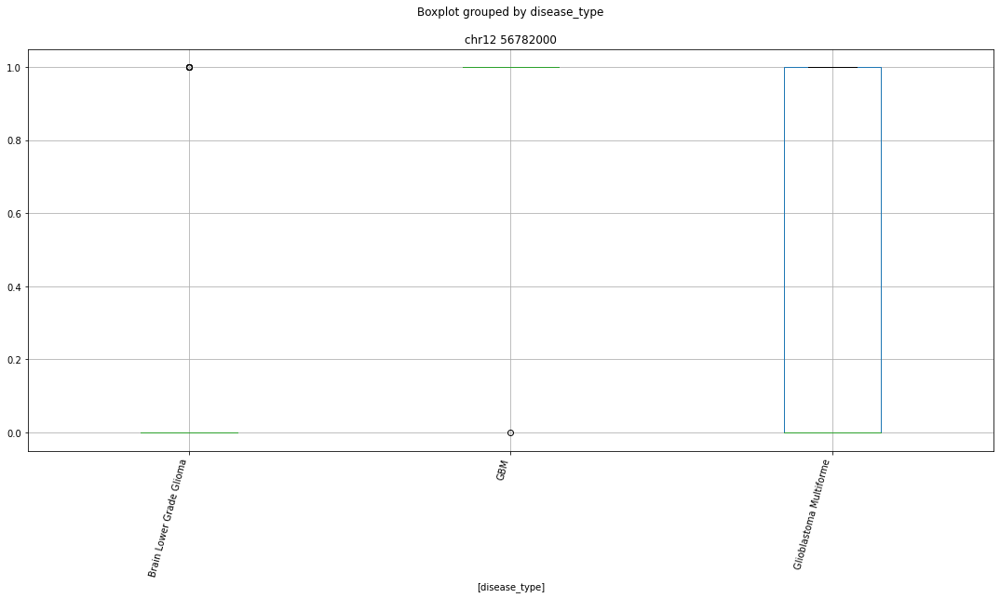

 p : 5.721020483559551e-12  ( t : 8.907157266714885 ) :  chr11 71166000


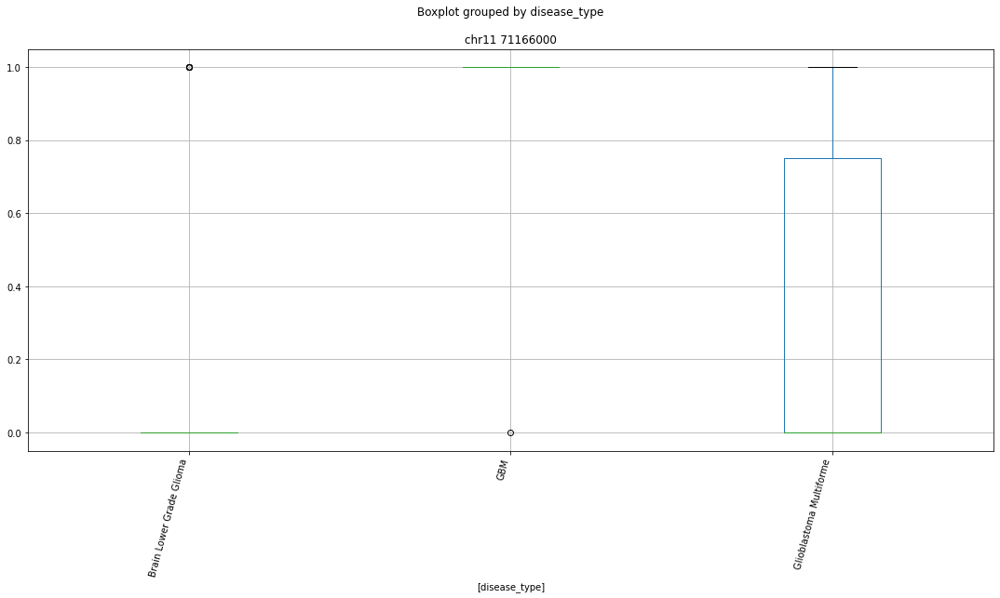

 p : 9.4983085356972e-12  ( t : 8.132464958508574 ) :  chr16 66630000


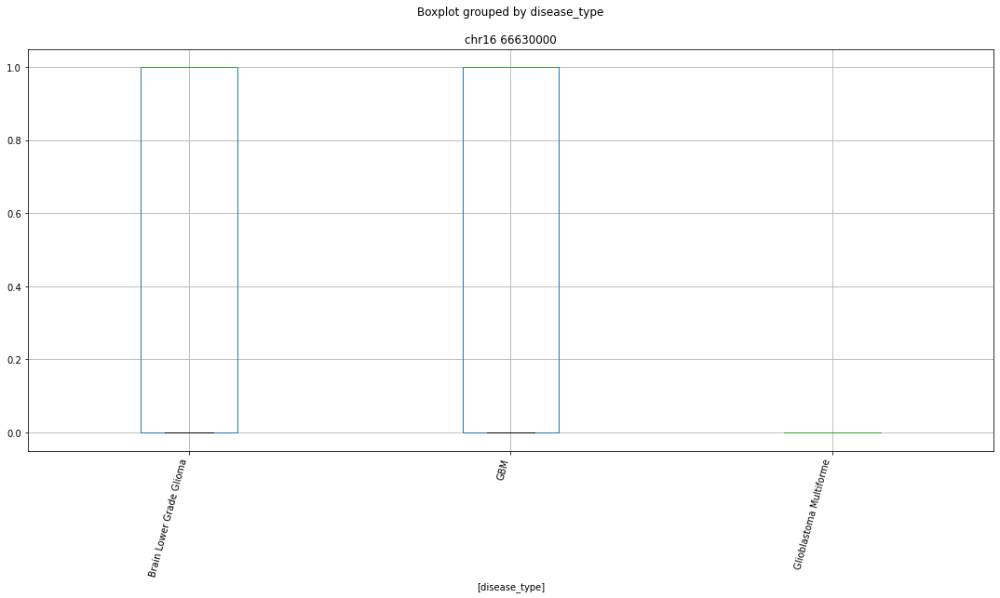

 p : 9.558830127815861e-12  ( t : 9.02542704437487 ) :  chr19 38363000


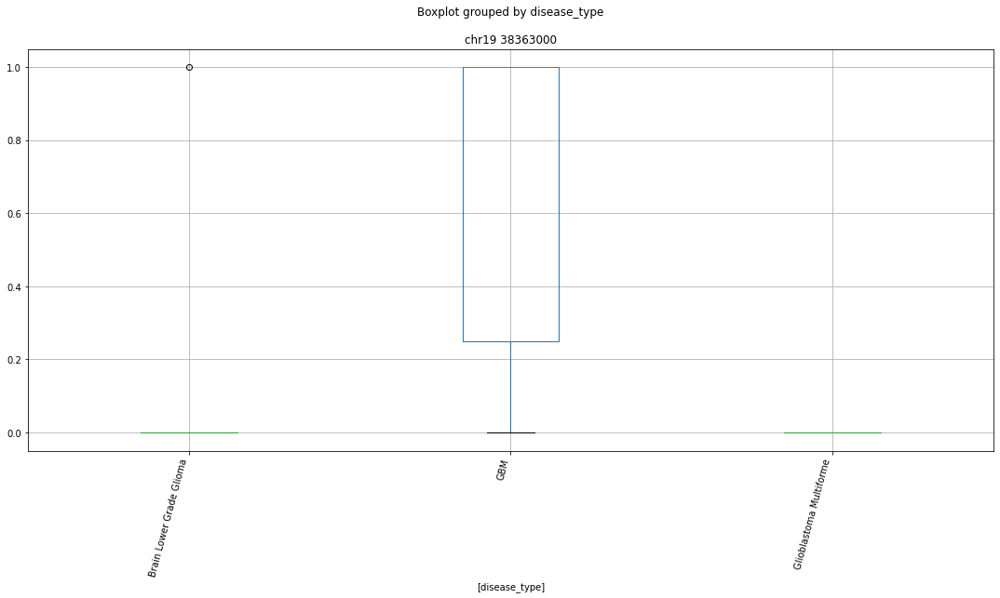

 p : 9.558830127815861e-12  ( t : 9.02542704437487 ) :  chr5 120073000


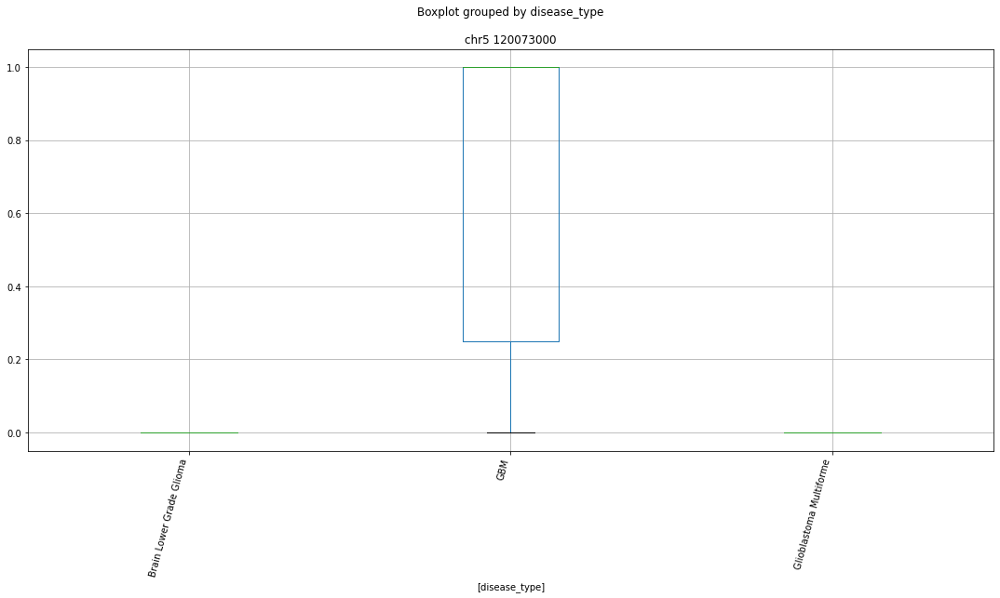

 p : 9.558830127815861e-12  ( t : 9.02542704437487 ) :  chr2 65599000


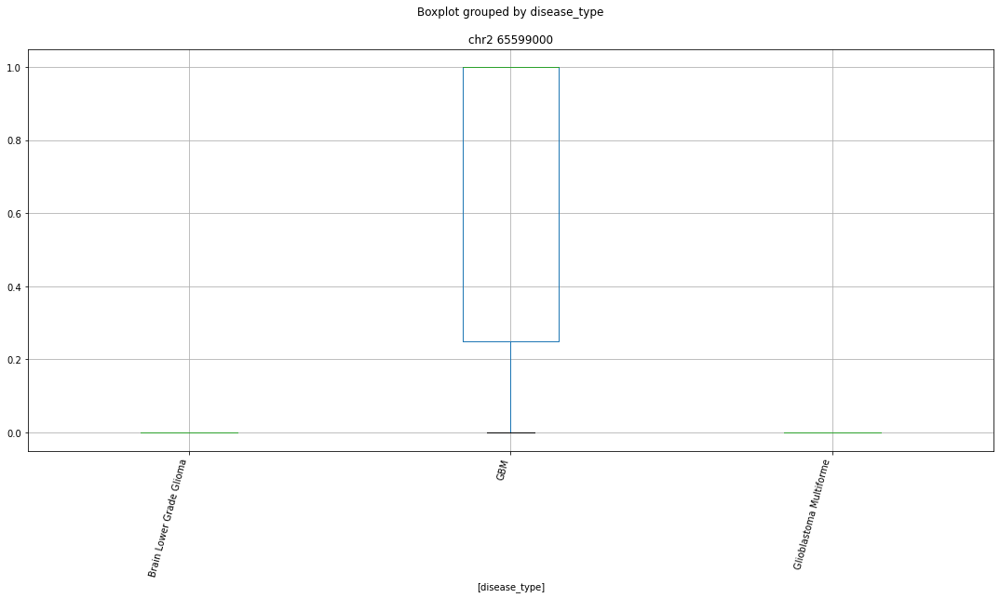

 p : 9.558830127815861e-12  ( t : 9.02542704437487 ) :  chr10 119796000


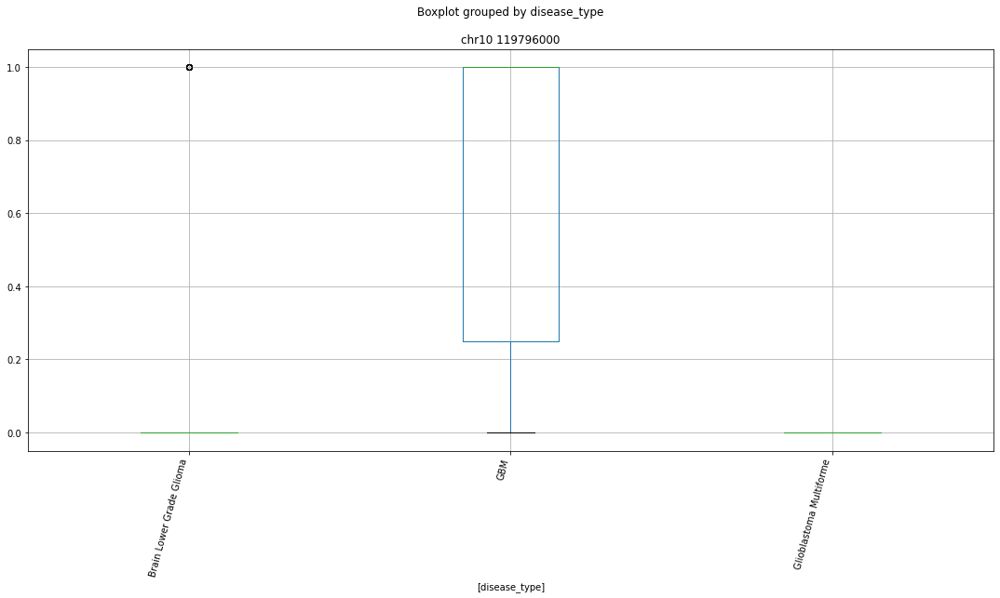

 p : 9.558830127815861e-12  ( t : 9.02542704437487 ) :  chr12 119361000


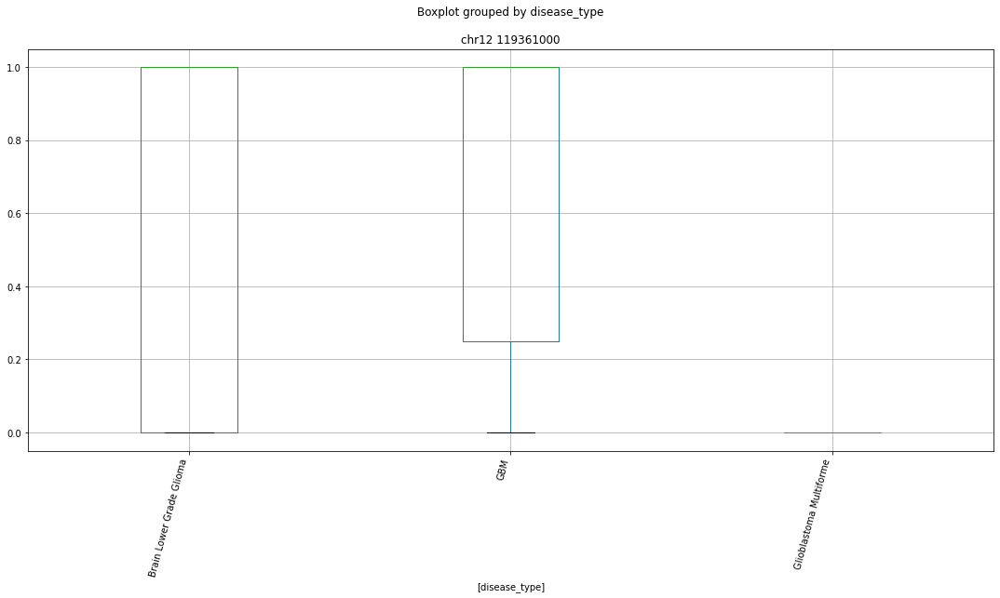

 p : 9.558830127815861e-12  ( t : 9.02542704437487 ) :  chr2 127118000


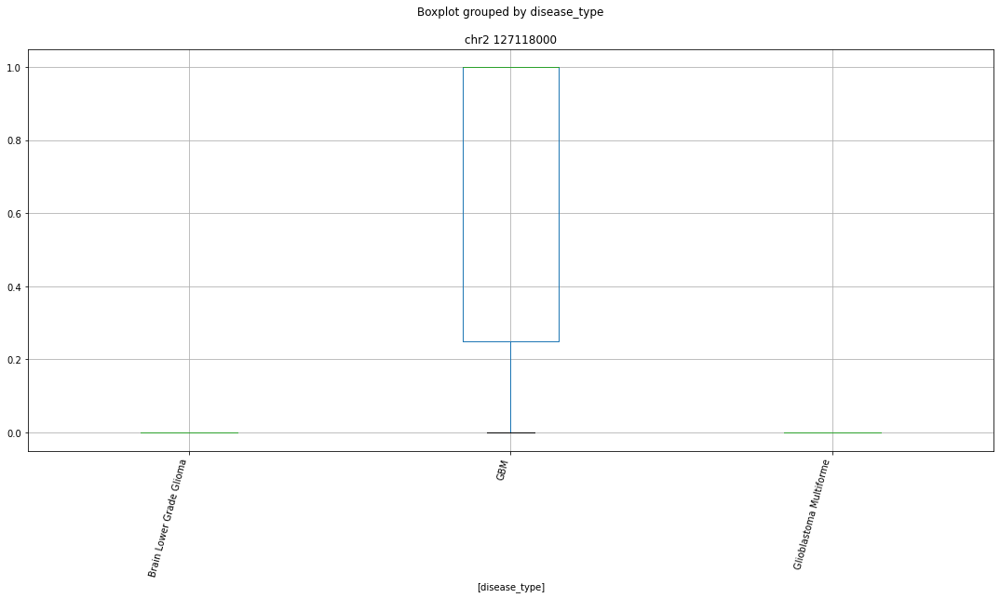

 p : 9.558830127815861e-12  ( t : 9.02542704437487 ) :  chr14 85829000


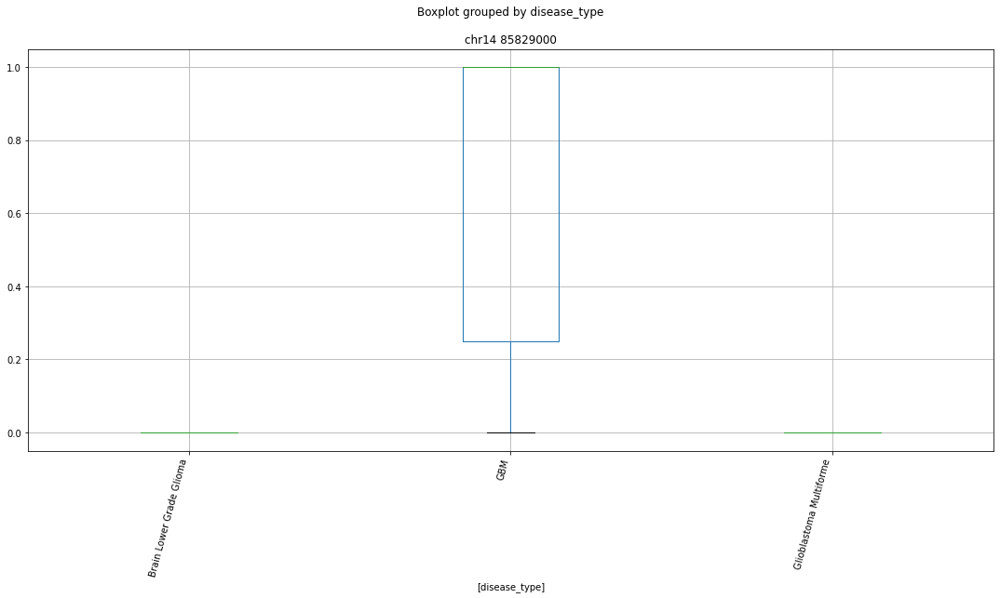

 p : 1.072083429418079e-11  ( t : 8.99062769181523 ) :  chr2 11164000


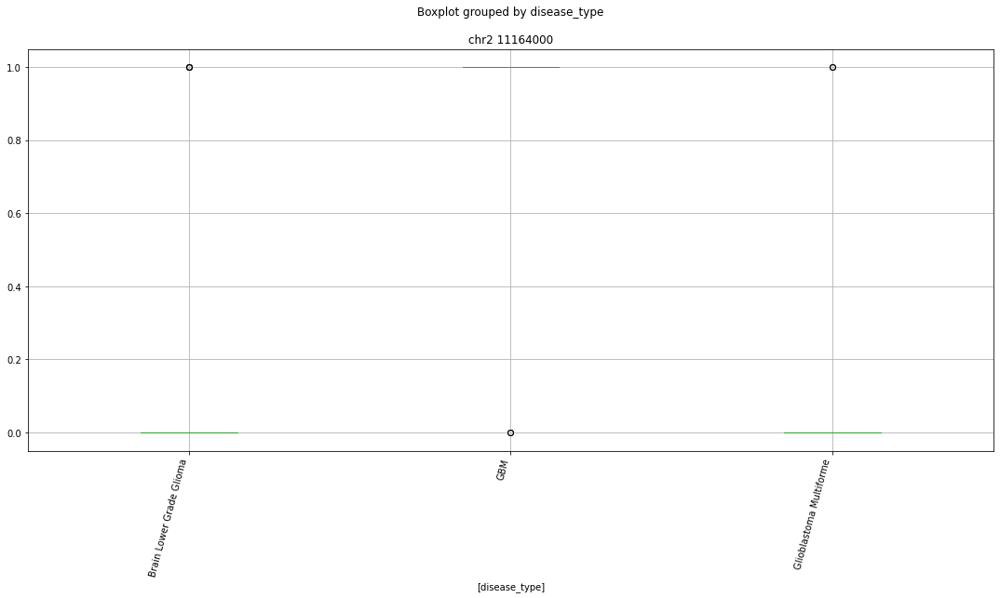

 p : 1.651038082890495e-11  ( t : 8.607806899706889 ) :  chr1 150851000


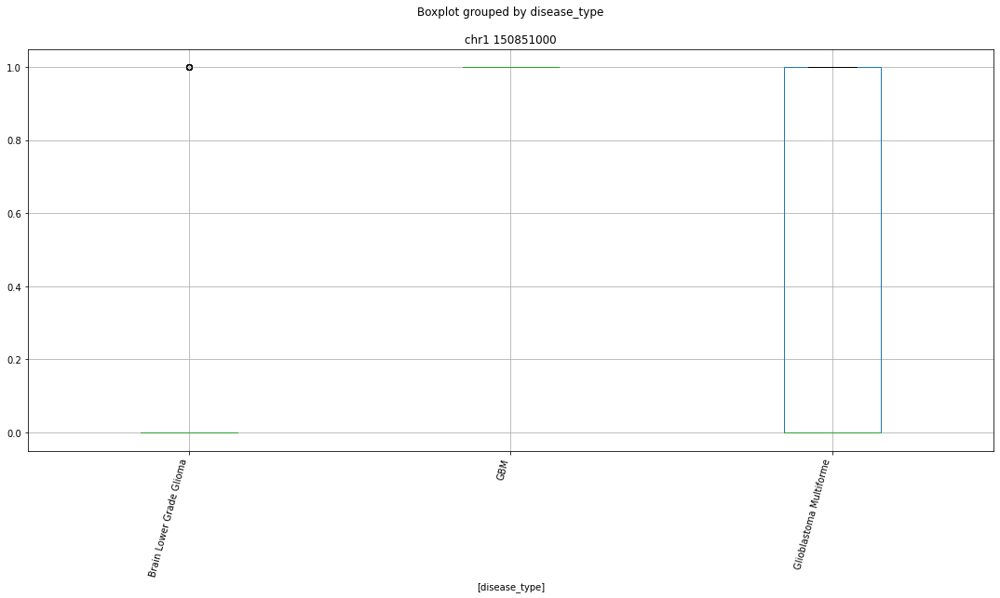

 p : 1.651038082890501e-11  ( t : 8.607806899706887 ) :  chr4 151525000


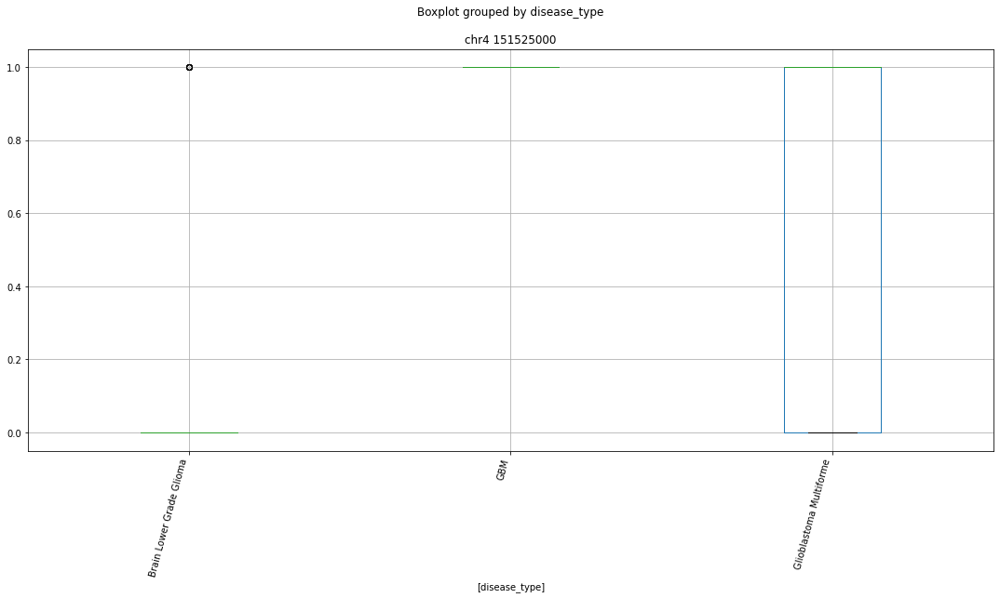

 p : 1.651038082890501e-11  ( t : 8.607806899706887 ) :  chr1 52869000


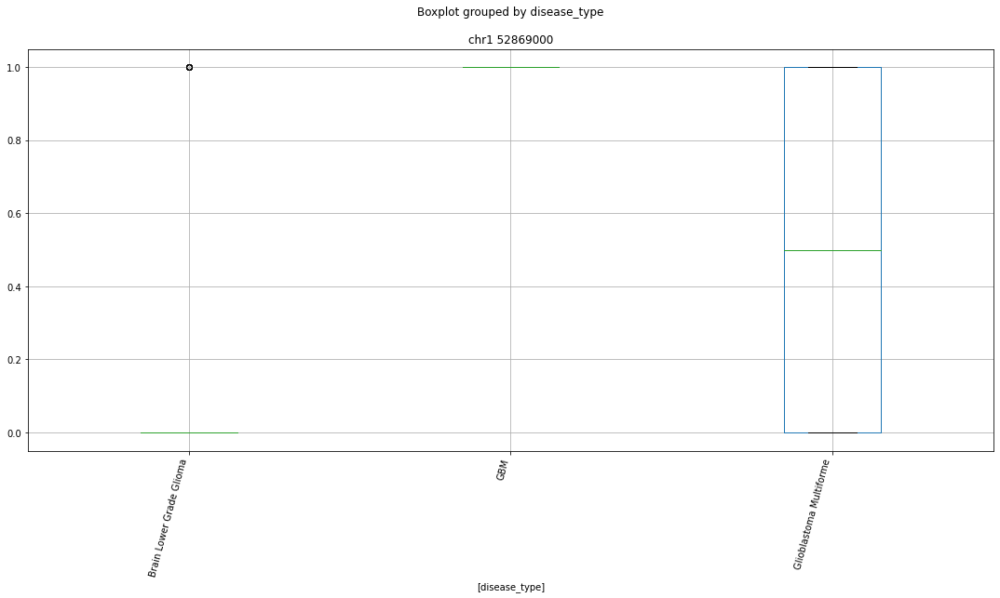

 p : 1.651038082890501e-11  ( t : 8.607806899706887 ) :  chr12 1817000


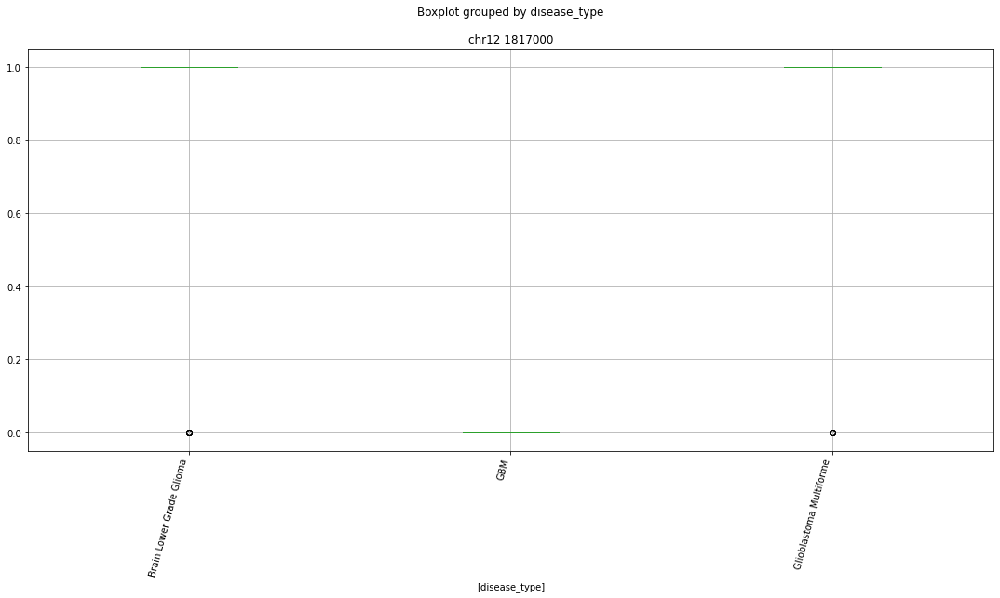

 p : 1.6792438766960332e-11  ( t : 8.854890790353709 ) :  chr12 119917000


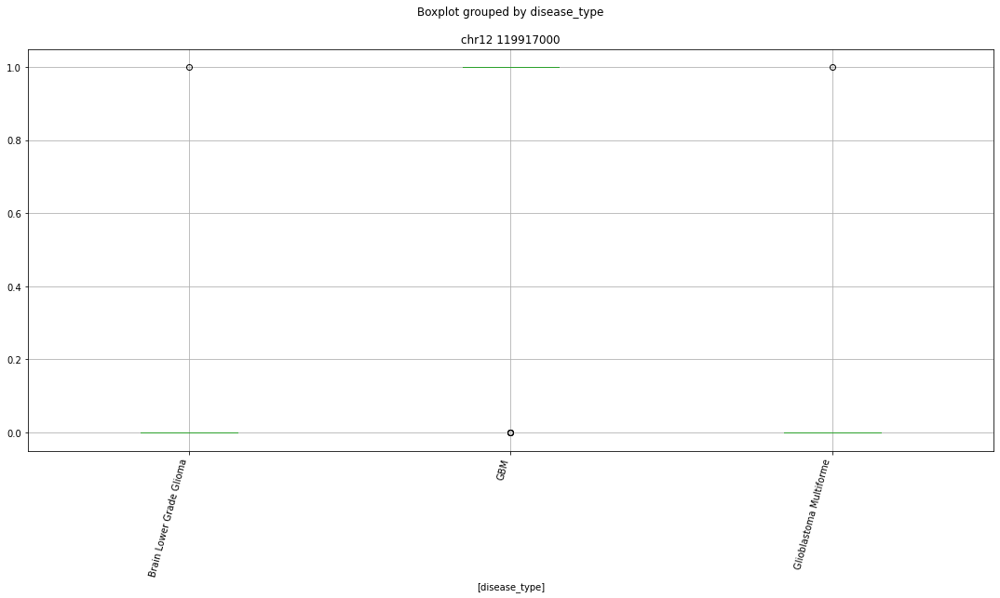

 p : 1.679243876696057e-11  ( t : 8.854890790353705 ) :  chr4 169569000


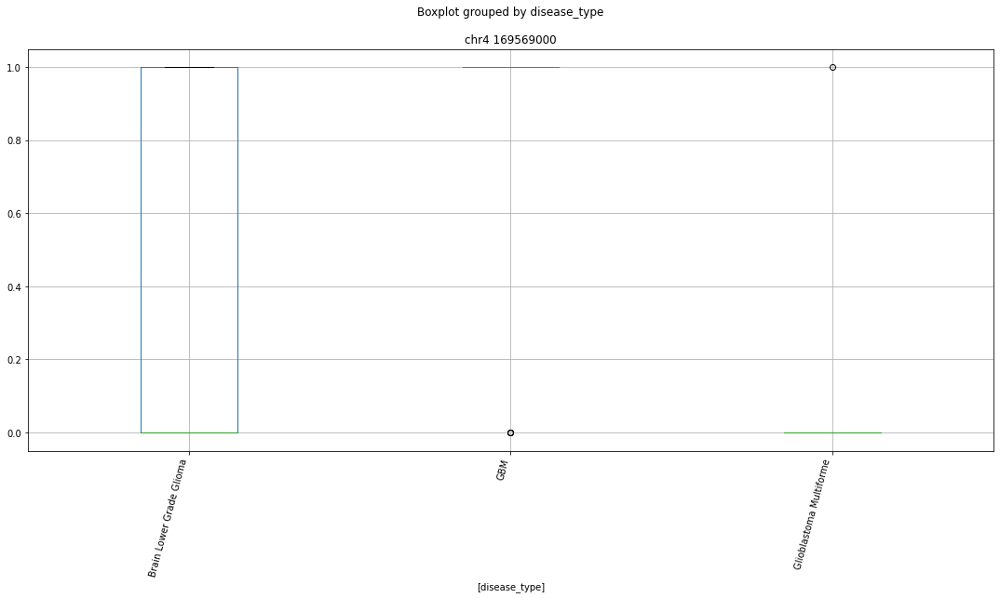

 p : 1.8765715864096234e-11  ( t : 8.821375554110972 ) :  chr10 45260000


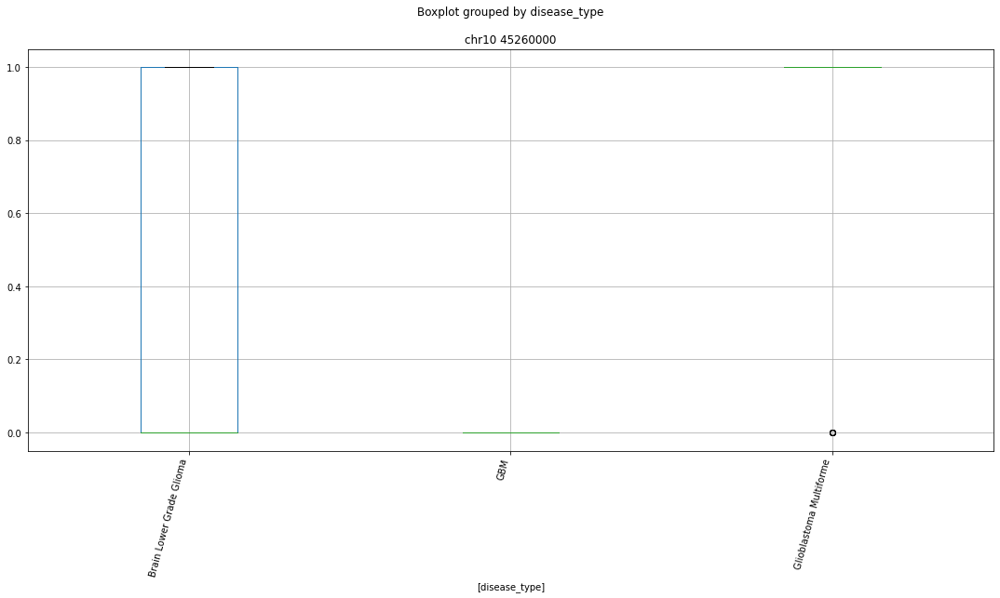

 p : 1.8765715864096234e-11  ( t : 8.821375554110972 ) :  chr6 31933000


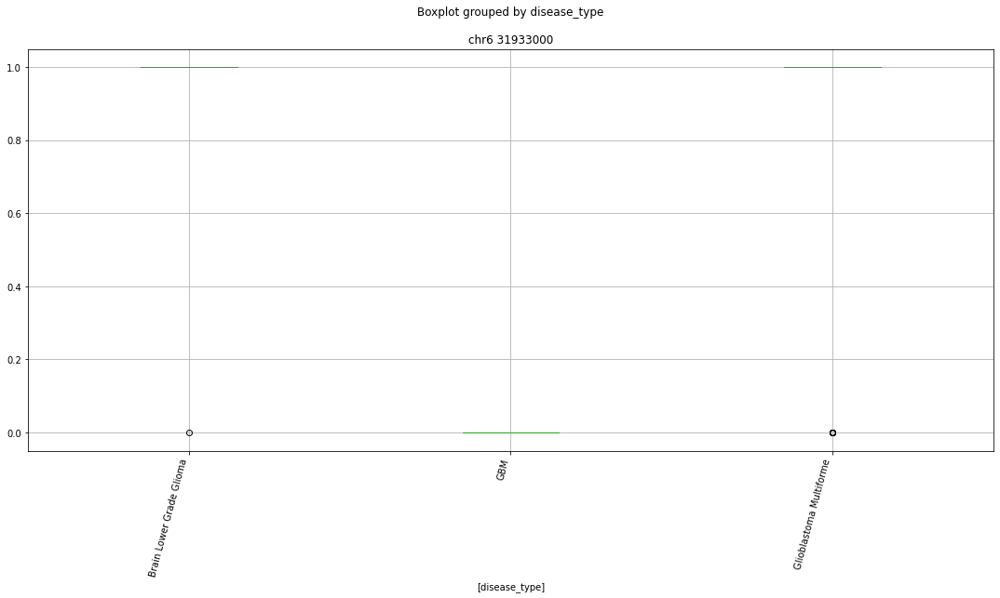

 p : 1.8765715864096234e-11  ( t : 8.821375554110972 ) :  chr3 44820000


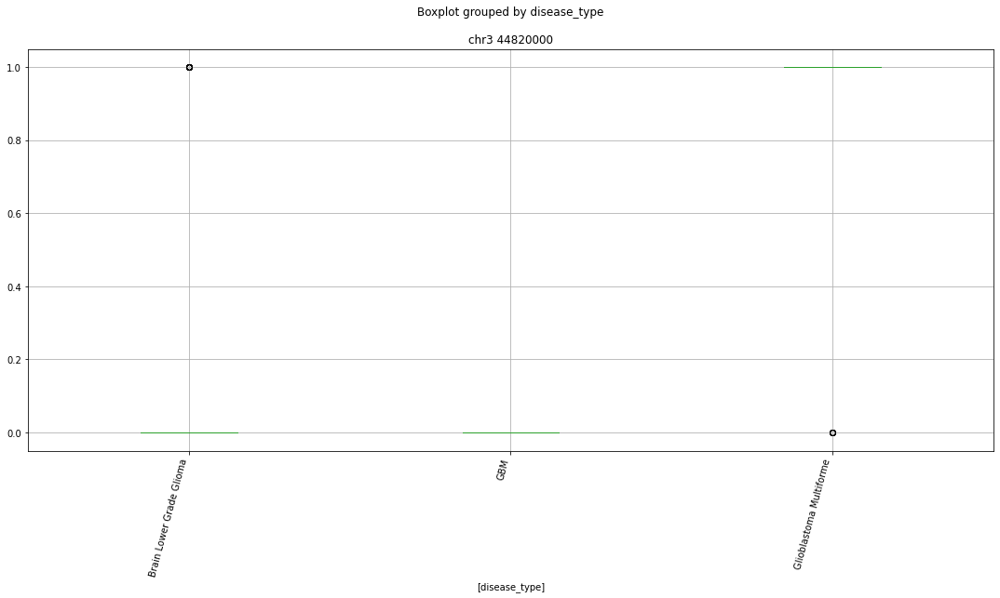

 p : 1.8765715864096234e-11  ( t : 8.821375554110972 ) :  chr12 1817000


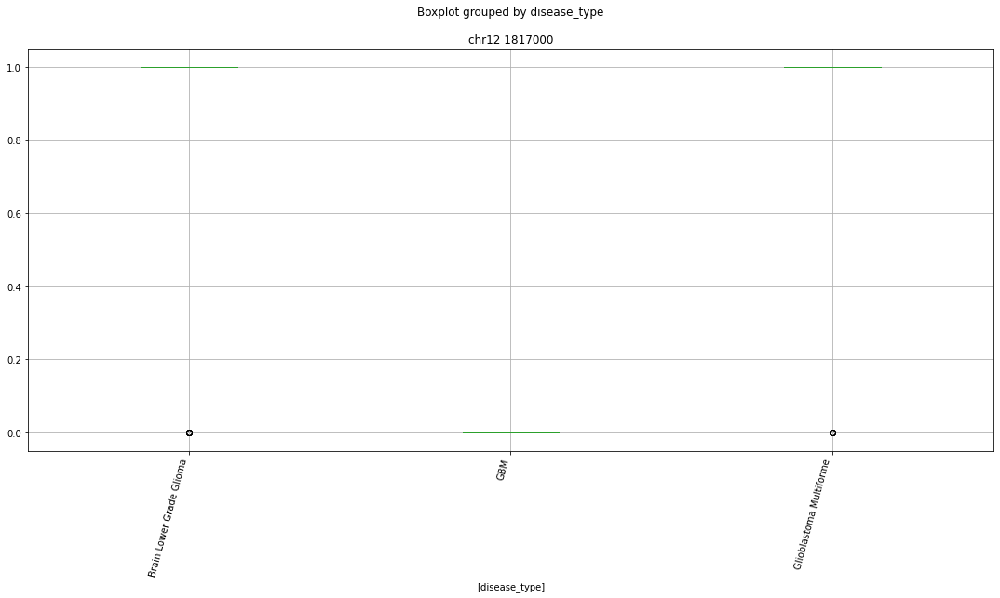

 p : 1.8765715864096234e-11  ( t : 8.821375554110972 ) :  chr17 573000


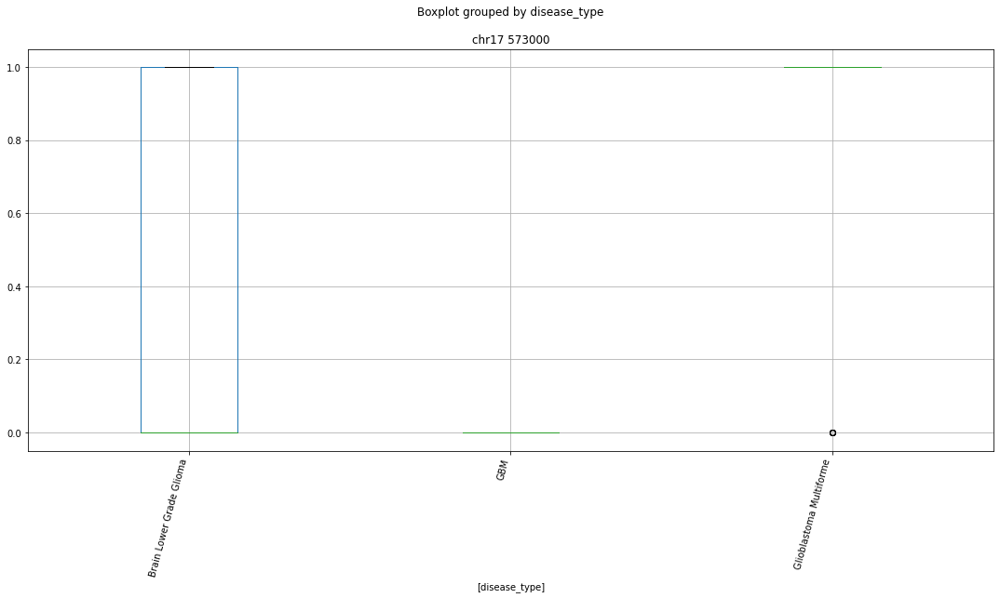

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr7 47923000


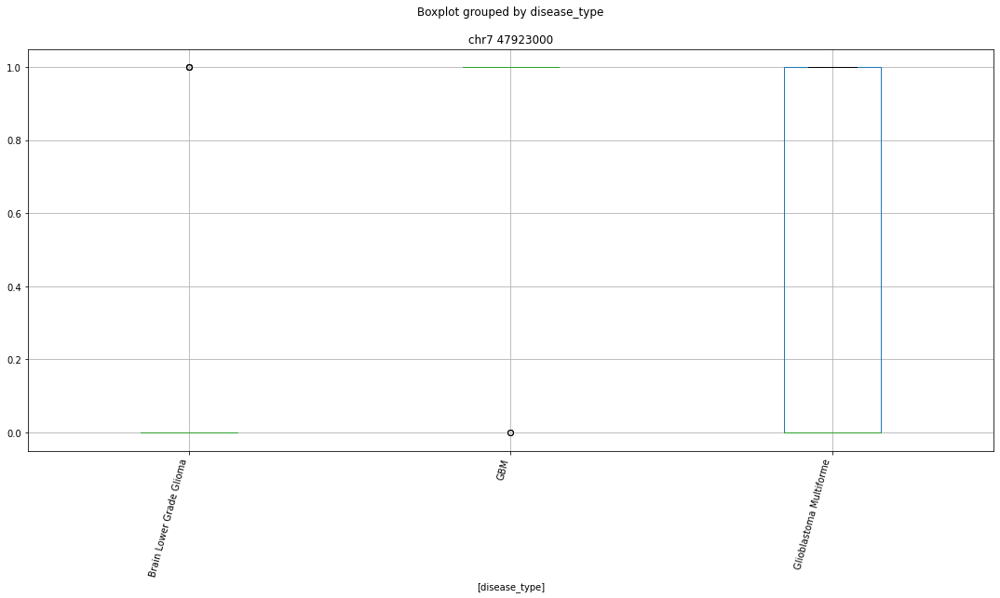

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr2 239448000


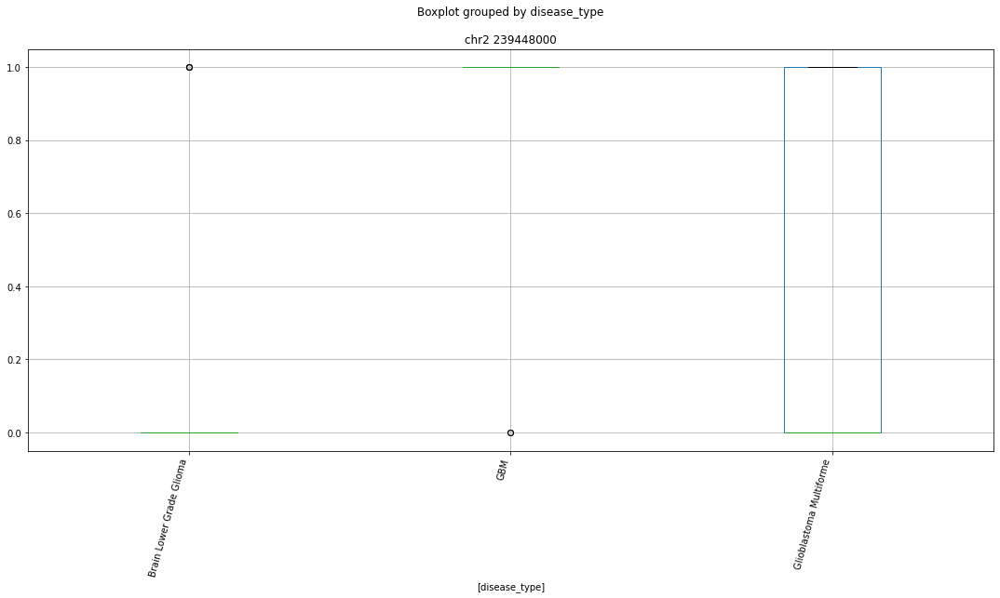

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr18 49800000


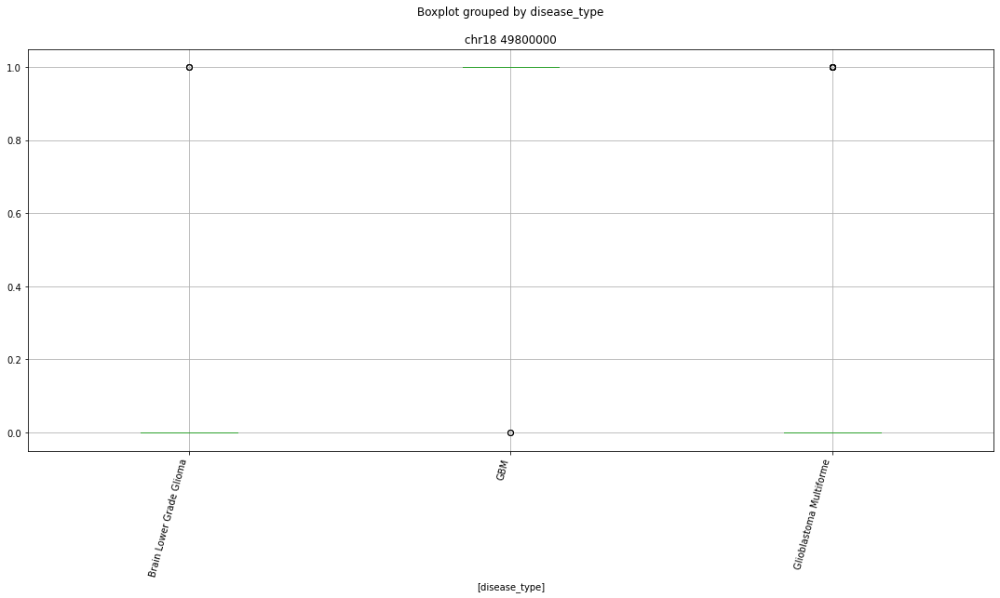

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr11 77491000


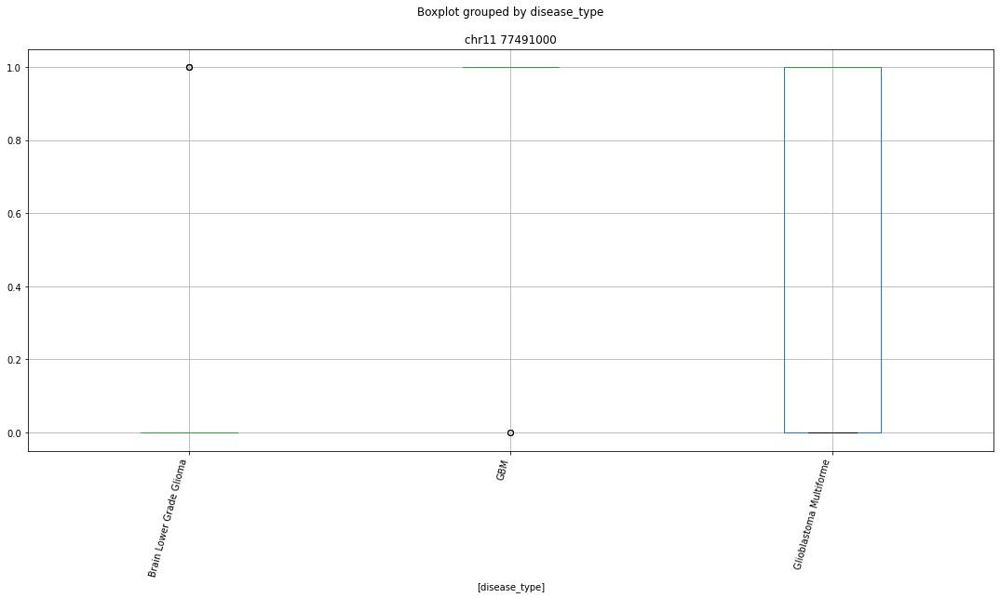

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr10 67692000


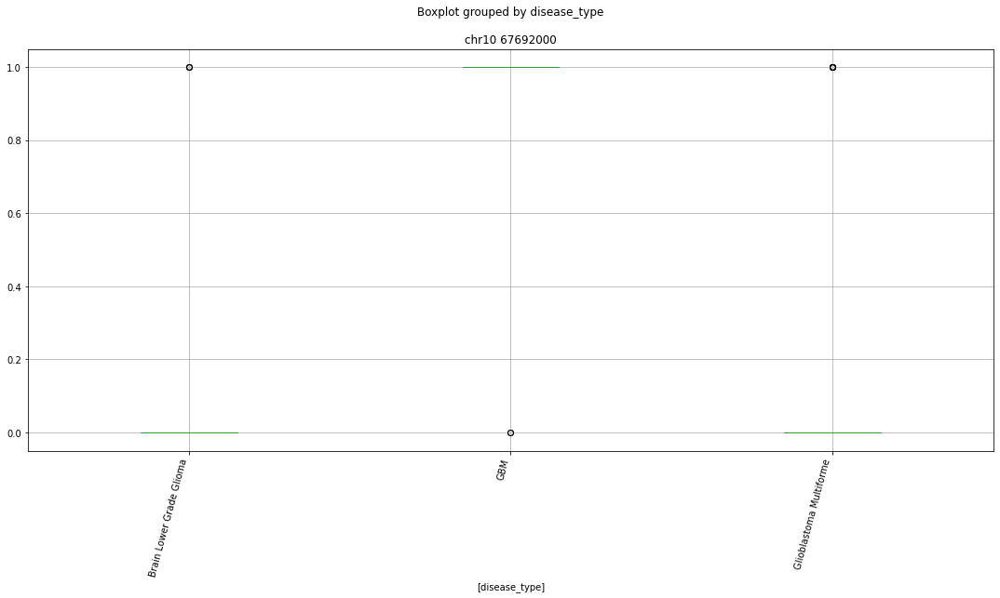

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr2 11164000


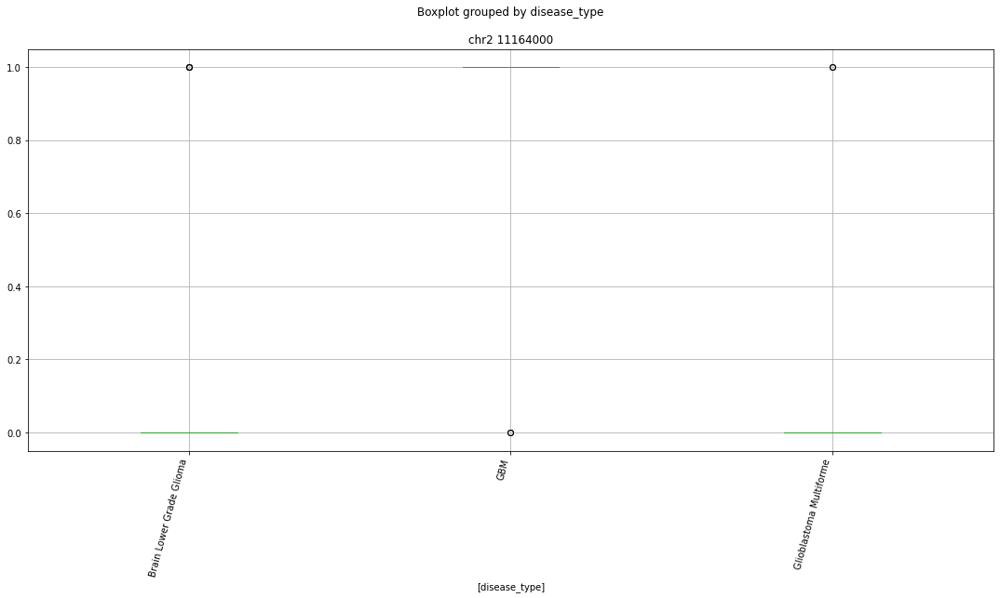

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr10 118795000


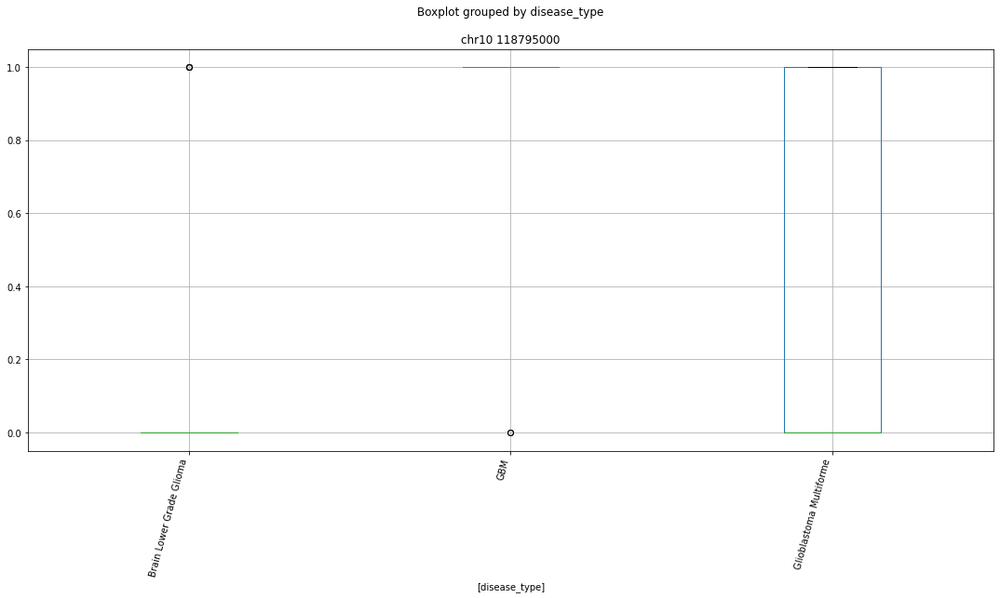

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr6 164735000


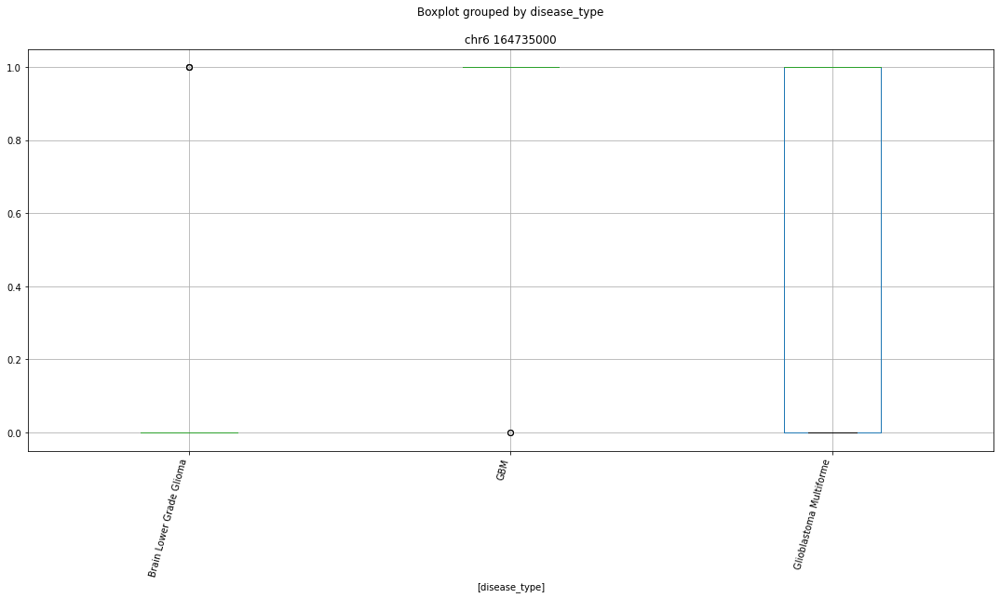

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr14 94658000


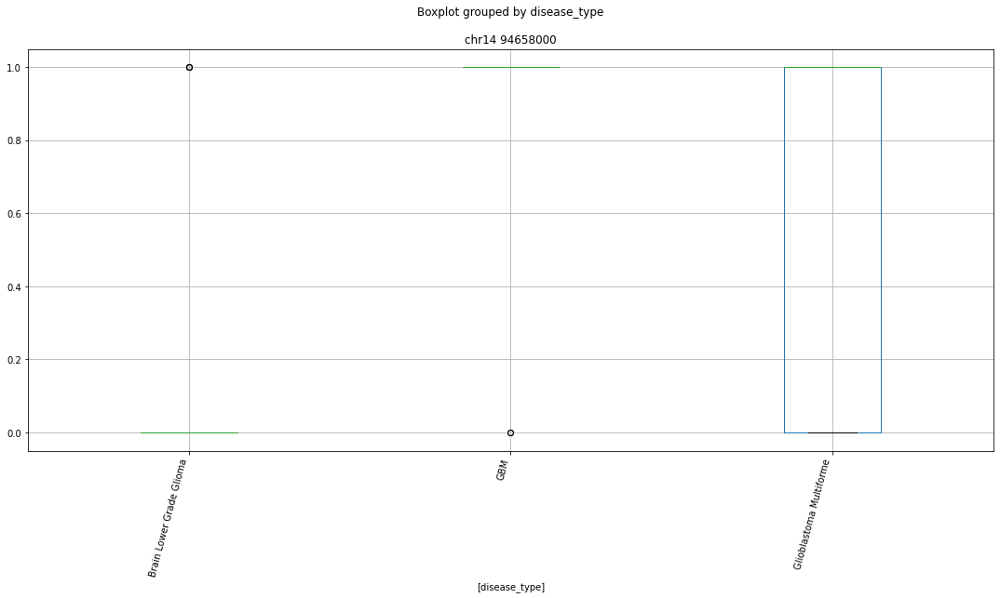

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr6 55909000


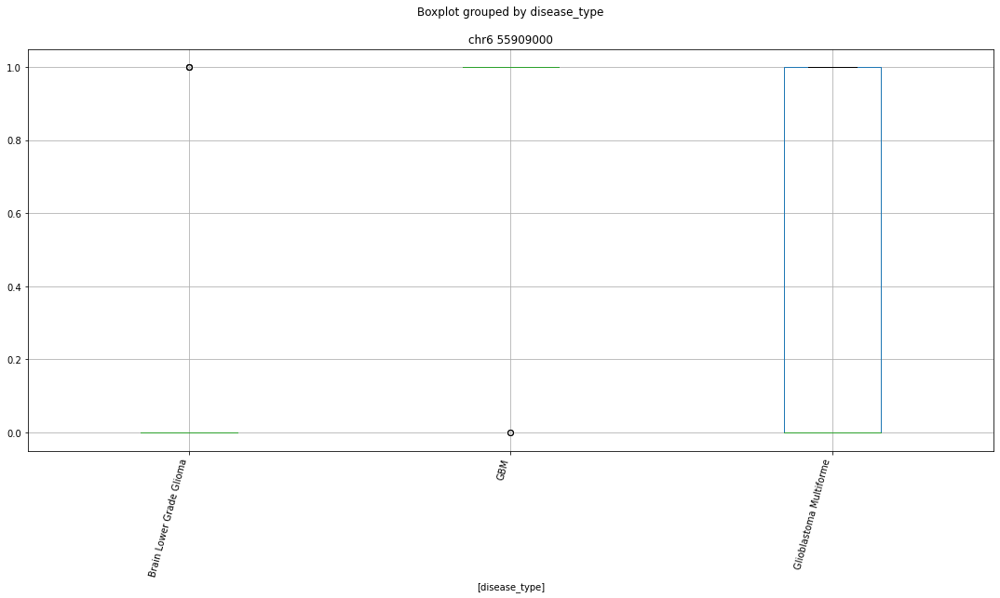

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr14 35151000


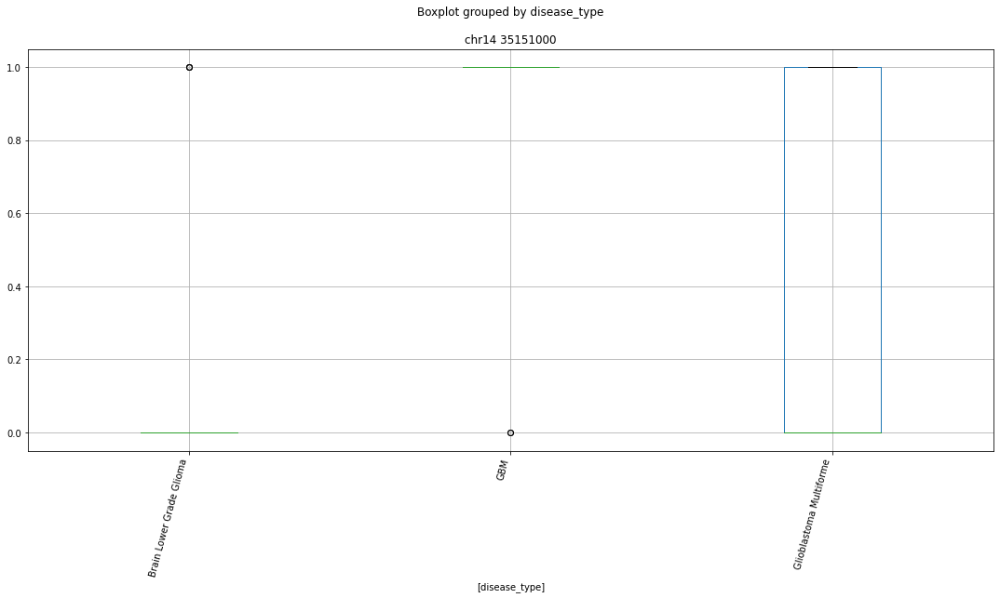

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr1 21024000


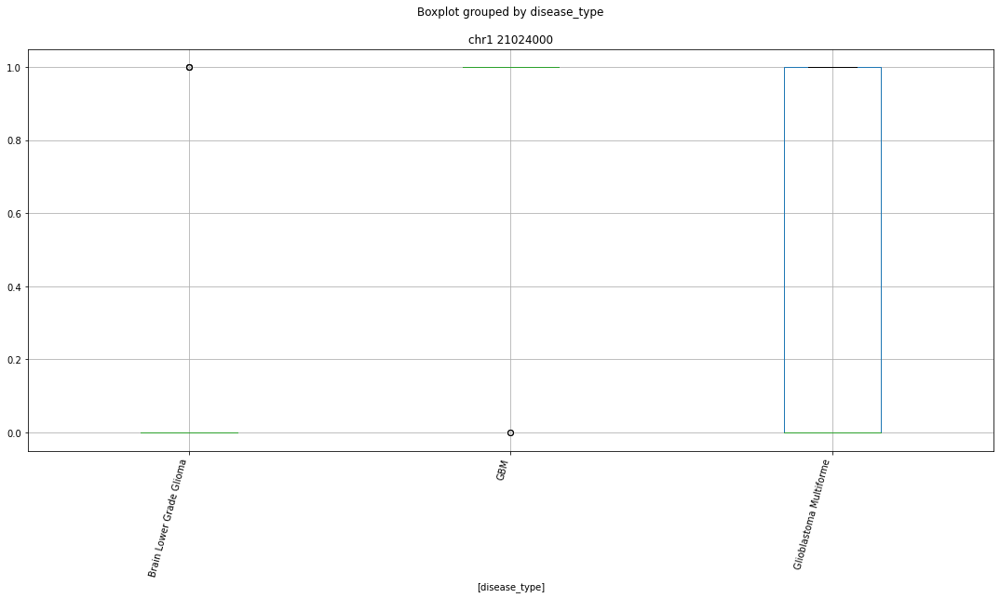

 p : 2.937478896622765e-11  ( t : 8.445999387898235 ) :  chr6 33526000


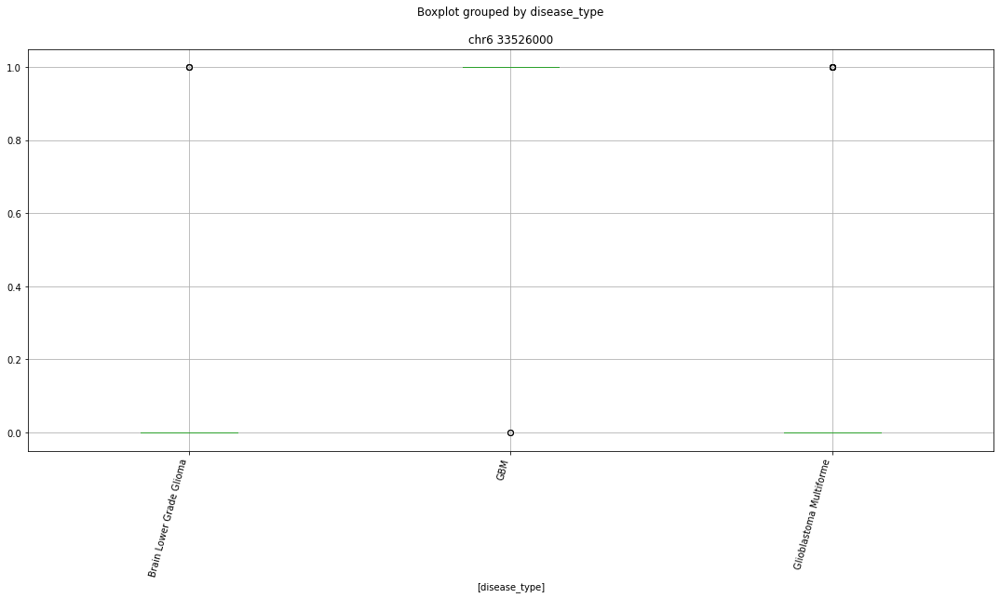

 p : 2.9374788966227866e-11  ( t : 8.445999387898233 ) :  chr6 73659000


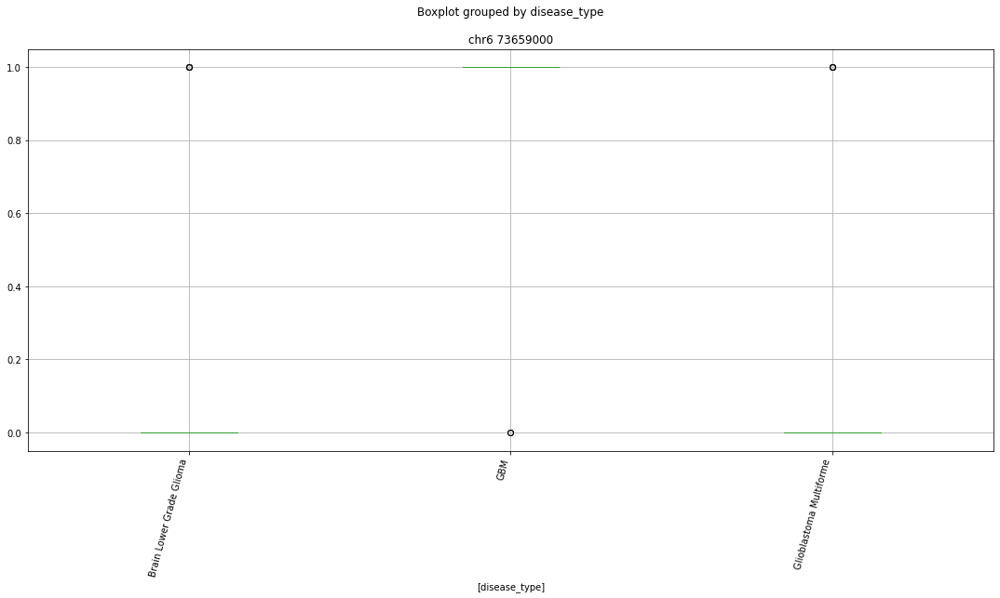

 p : 2.9374788966227866e-11  ( t : 8.445999387898233 ) :  chr20 47524000


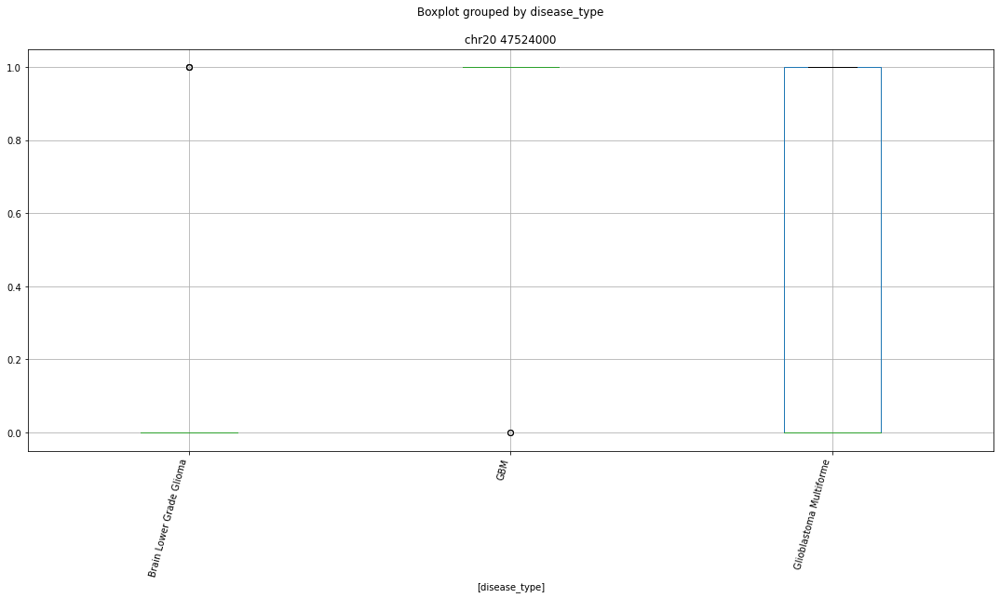

 p : 5.2009277731438915e-11  ( t : 7.7340969296826305 ) :  chr7 37291000


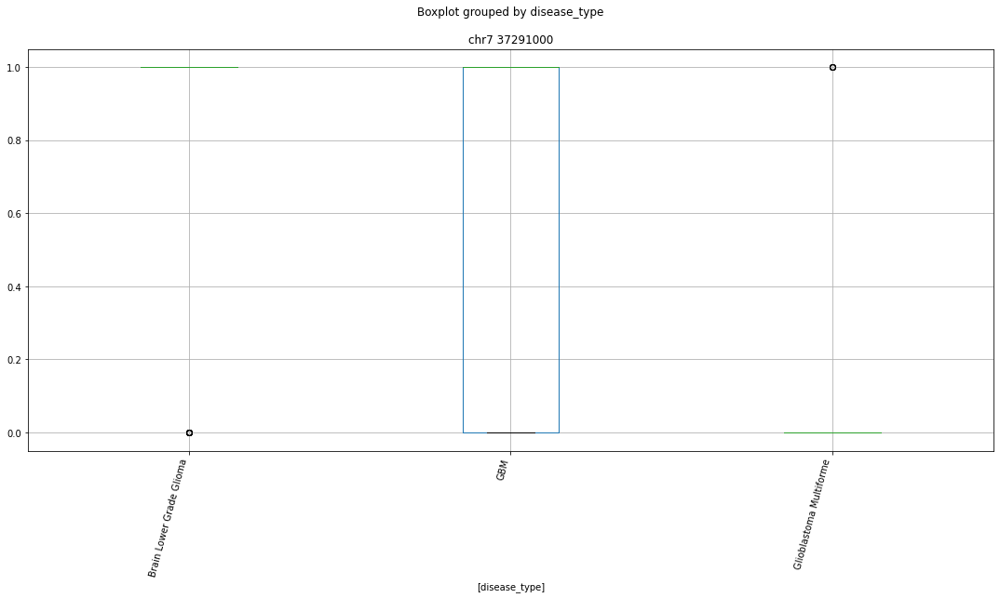

 p : 5.593727347752157e-11  ( t : 7.717020309705342 ) :  chr4 40146000


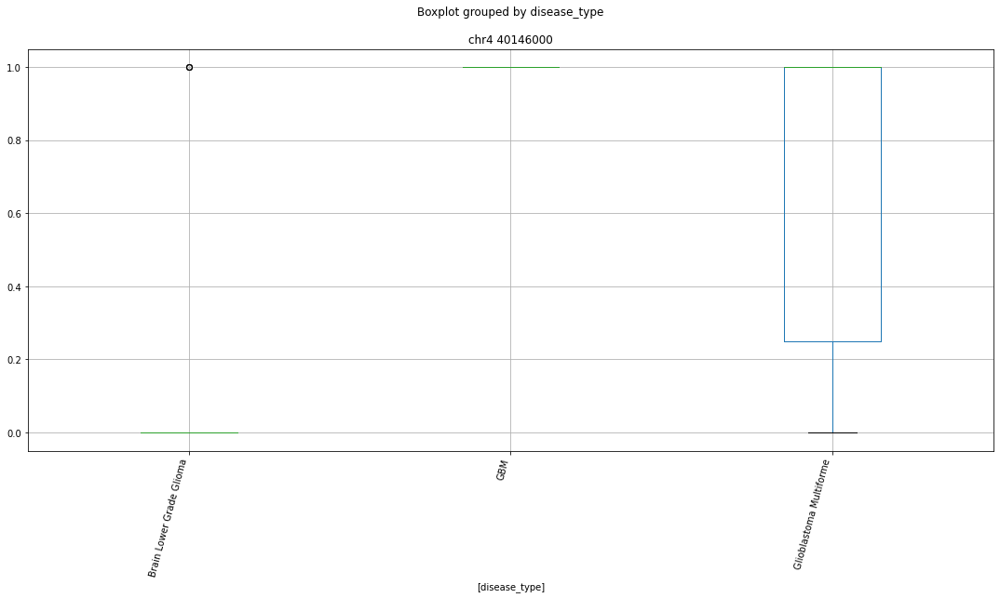

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr9 5435000


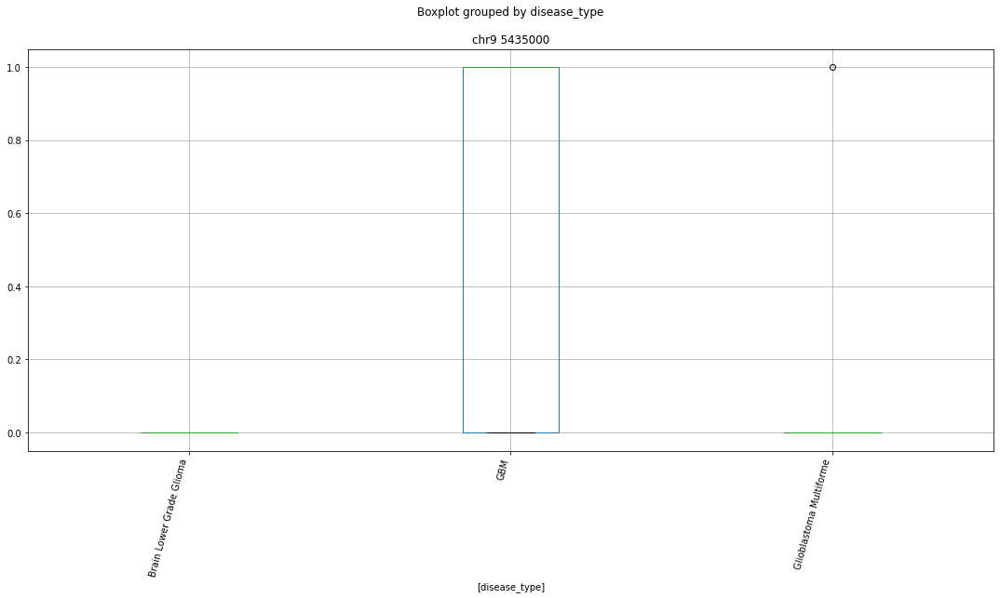

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr11 73935000


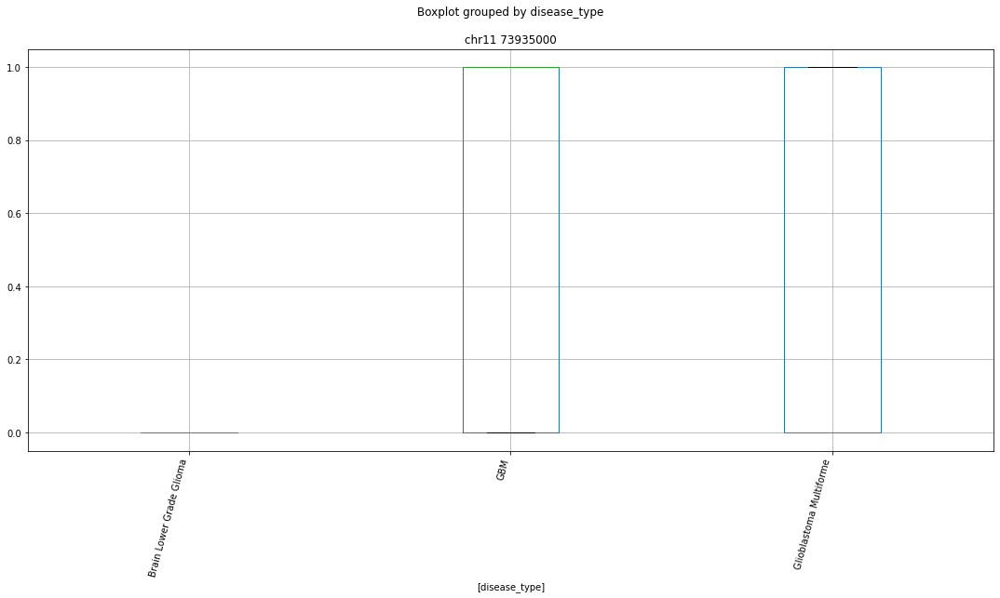

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr1 54234000


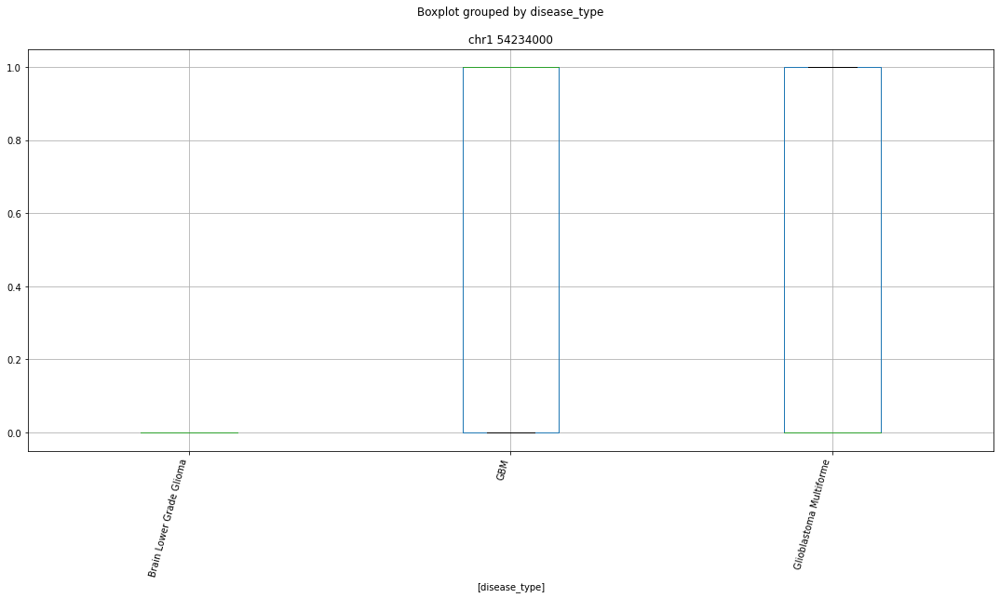

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr5 37518000


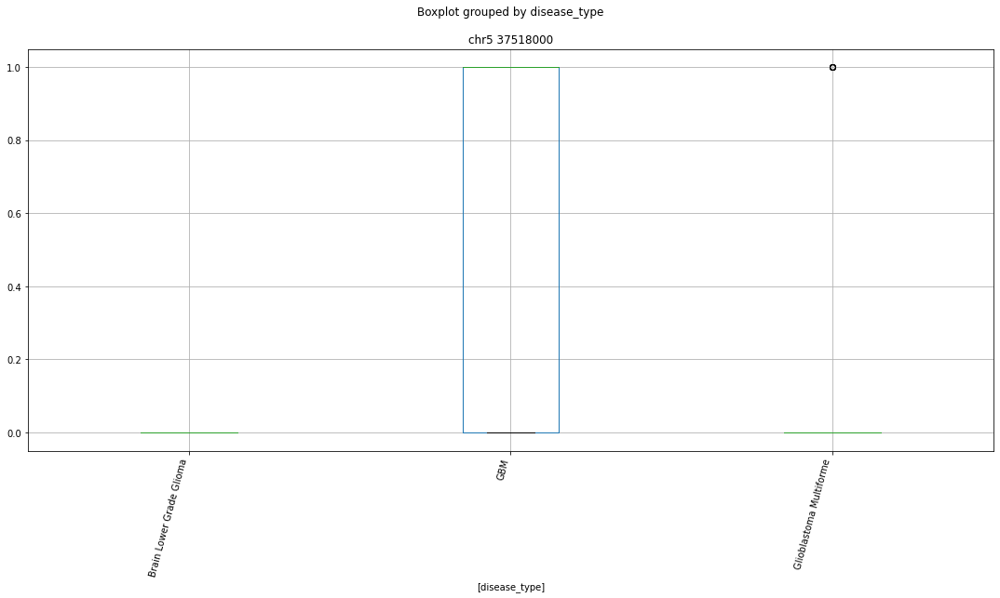

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr1 21389000


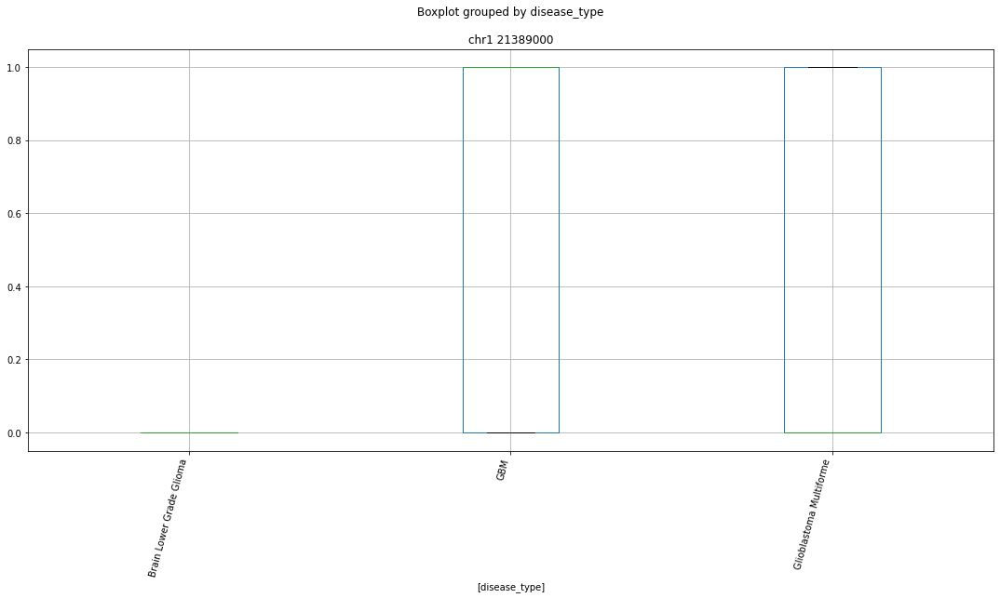

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr6 56825000


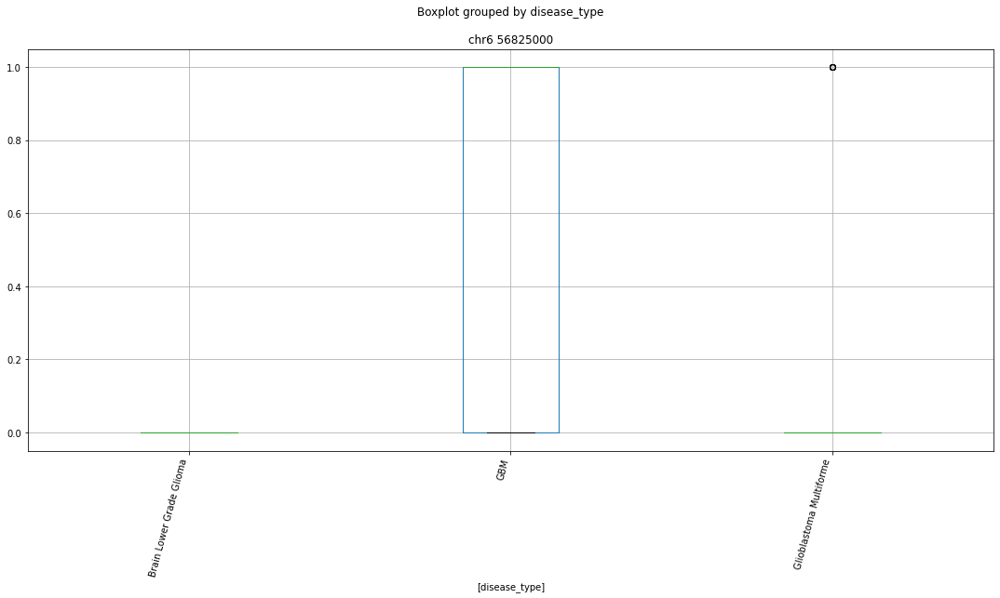

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr5 43745000


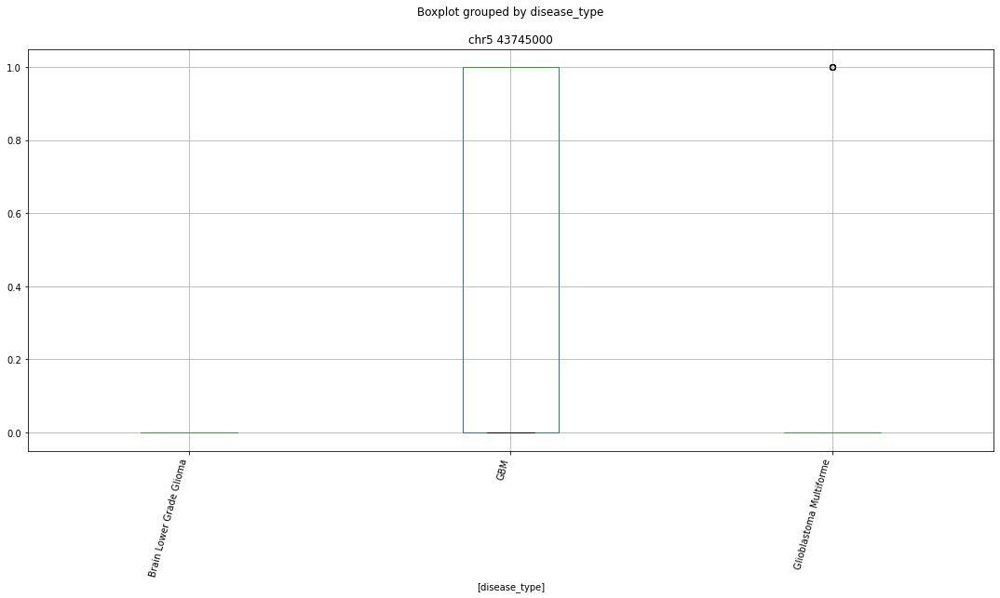

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chrX 54572000


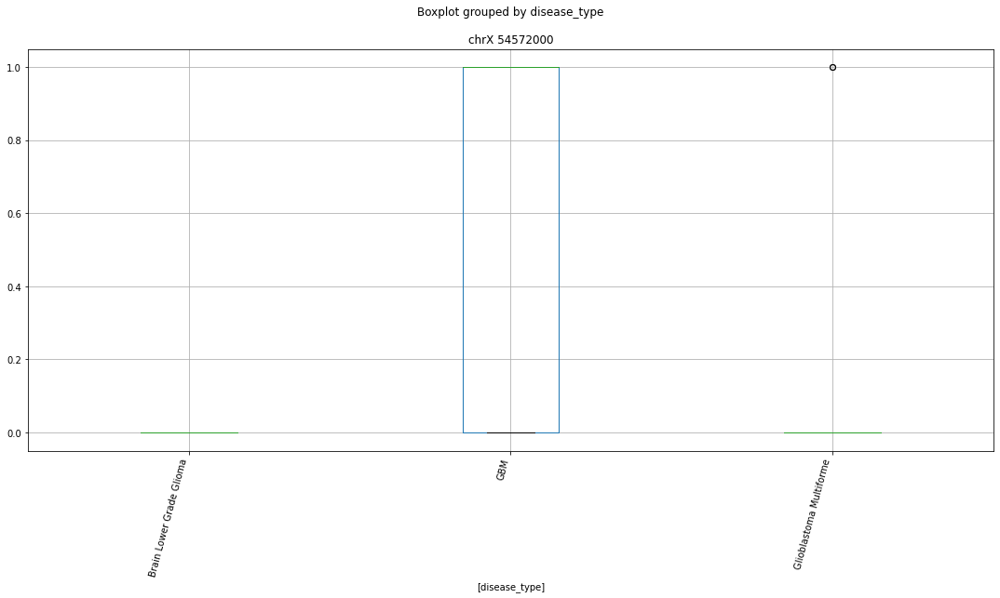

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr11 64702000


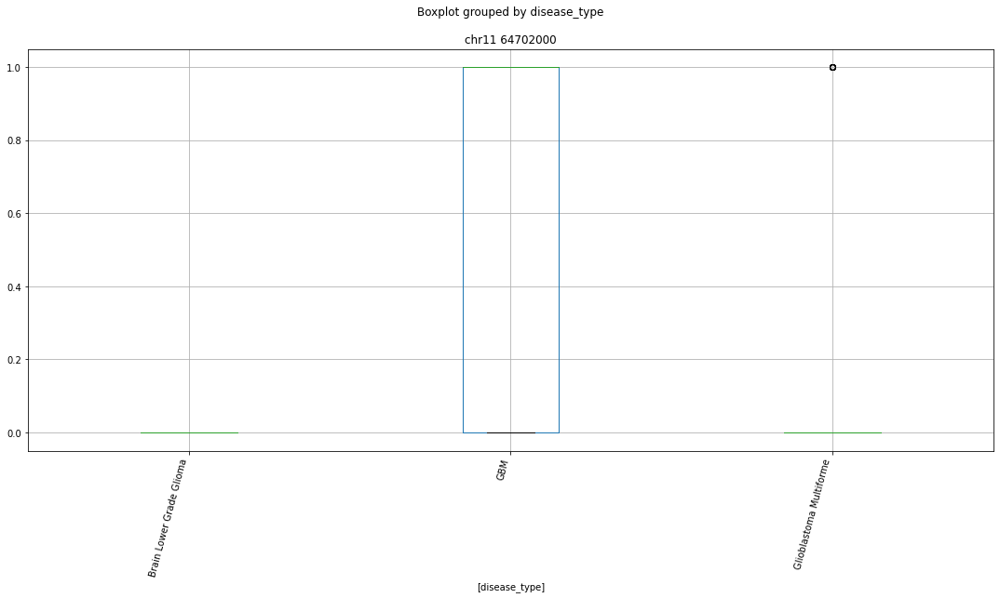

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr2 127000


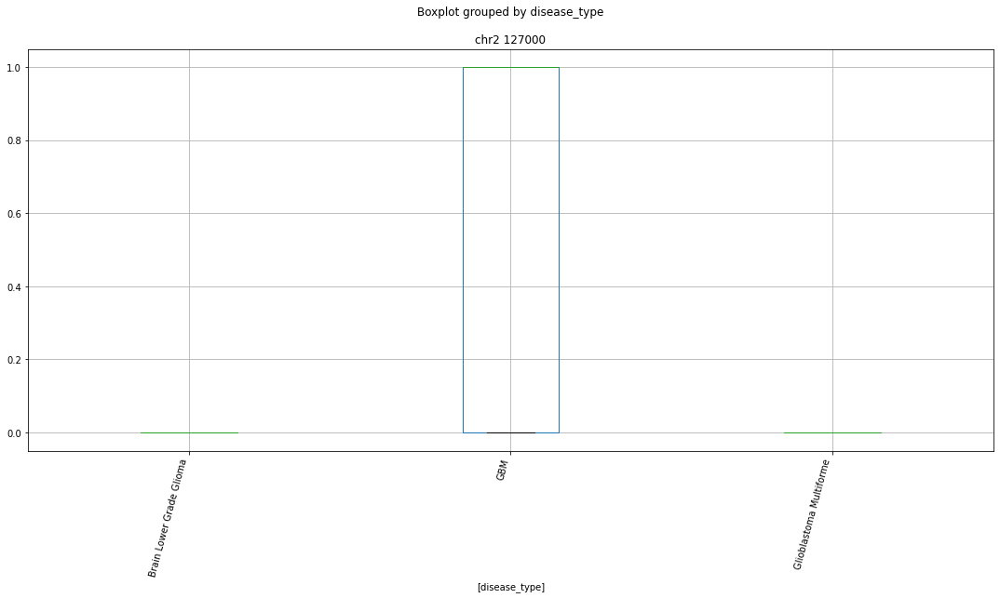

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr17 8551000


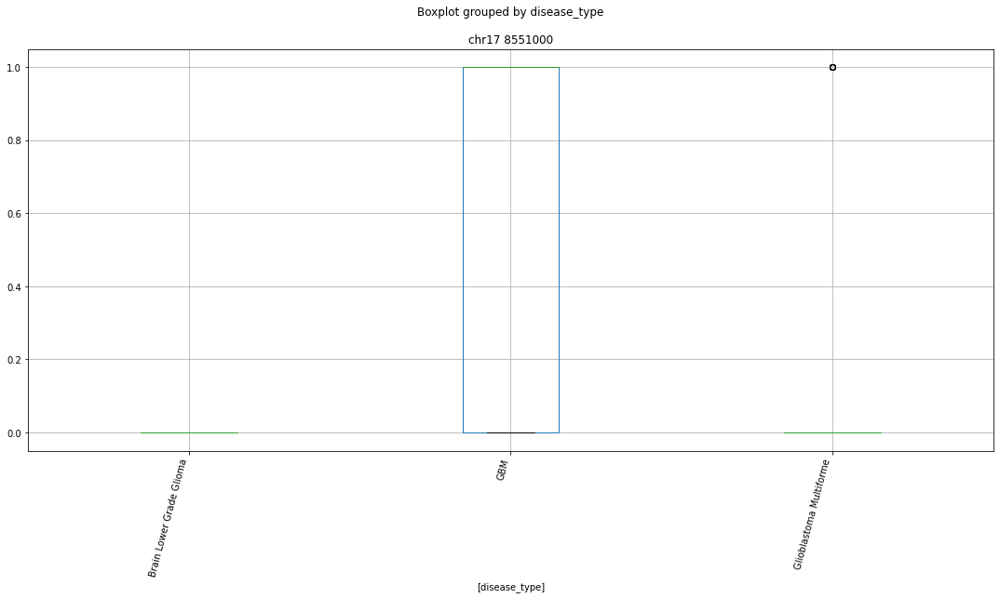

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr3 146097000


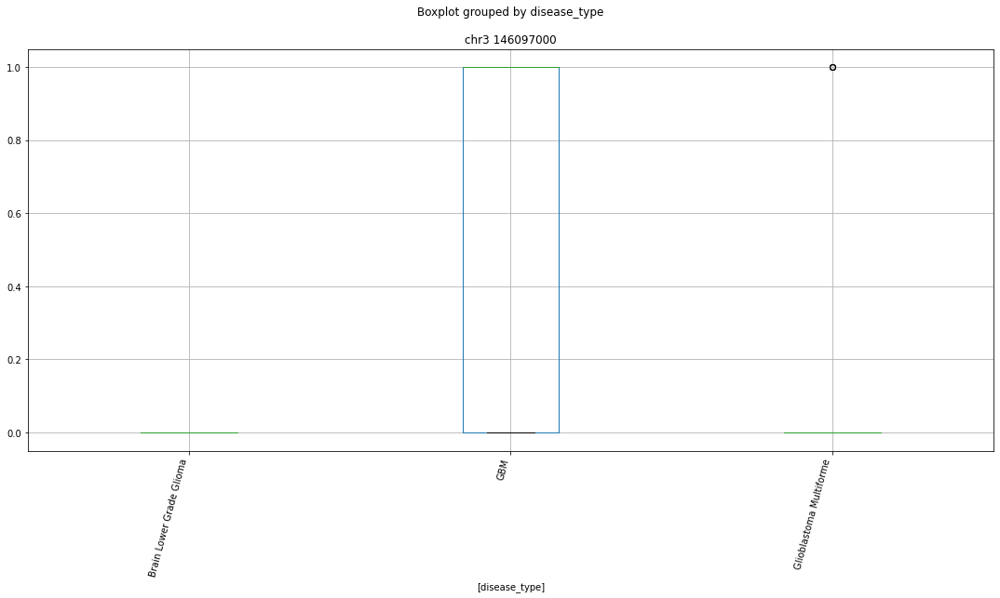

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr9 74198000


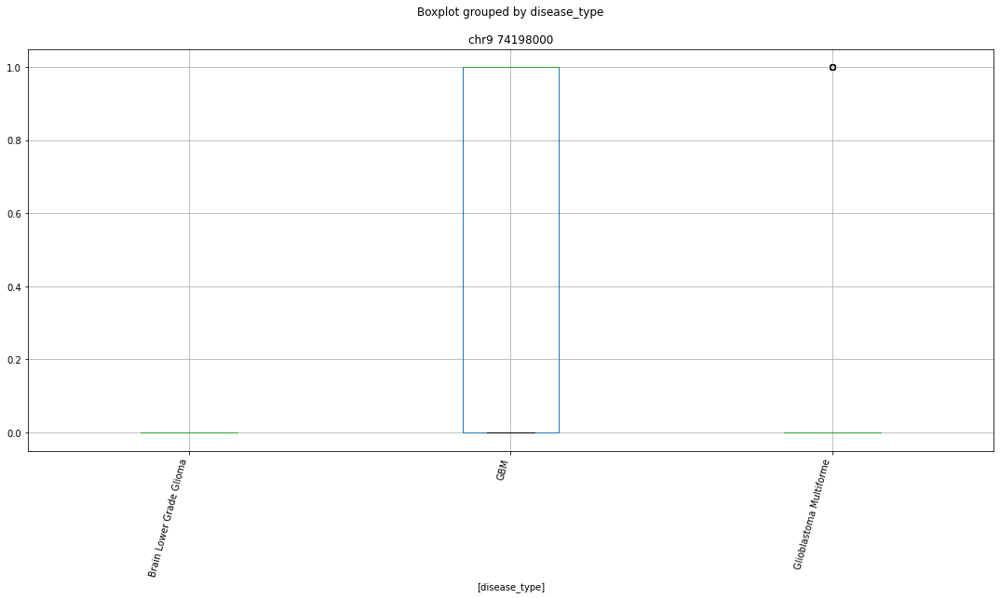

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr11 46897000


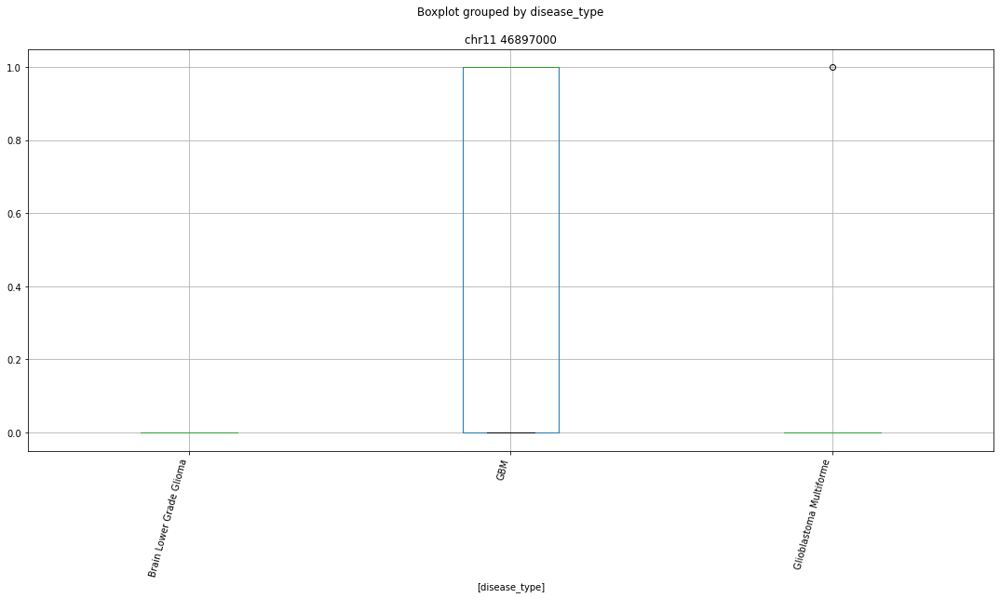

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr5 153037000


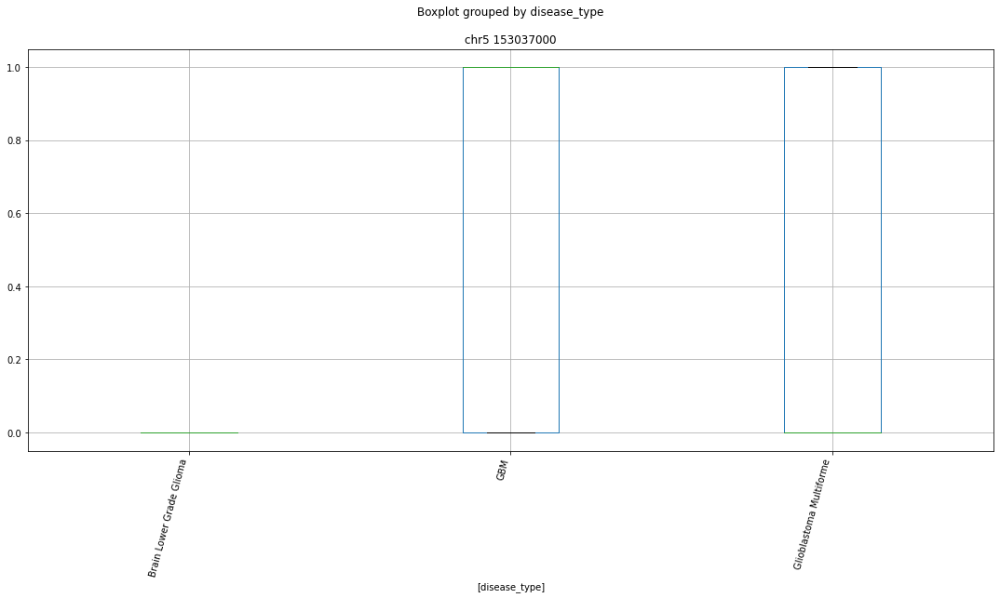

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr9 72839000


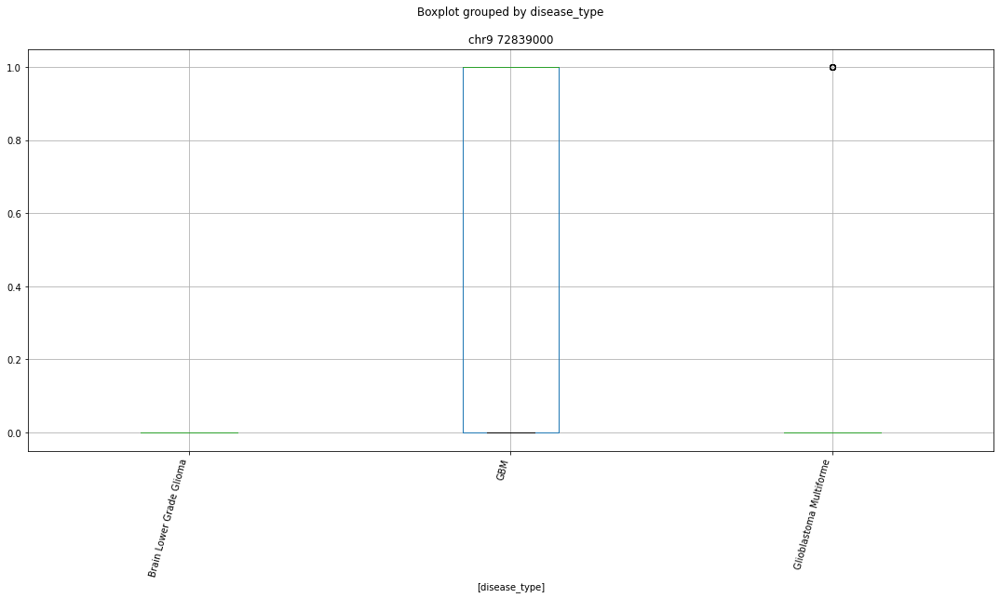

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr11 67222000


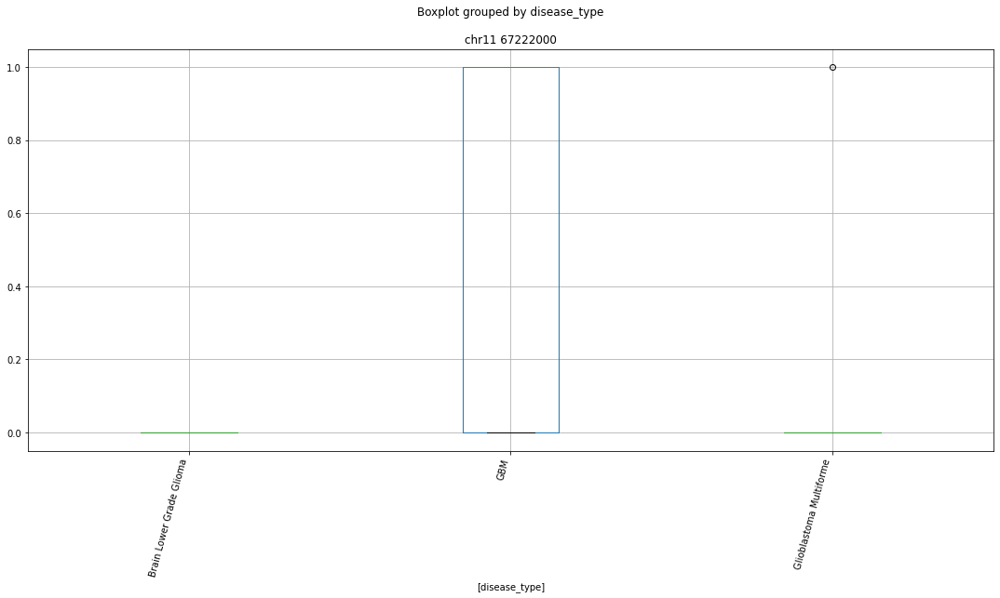

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr9 116839000


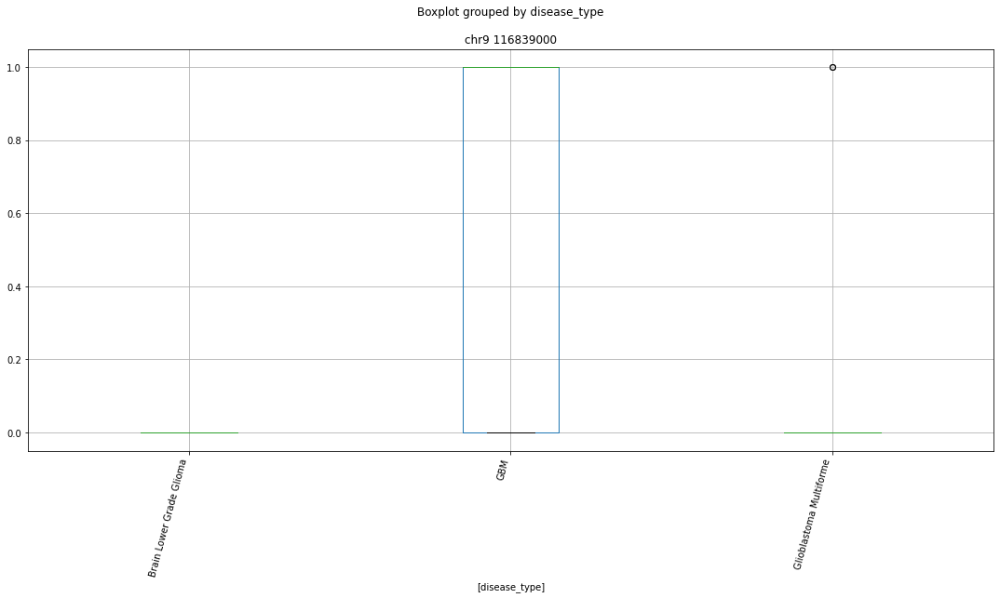

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr1 114789000


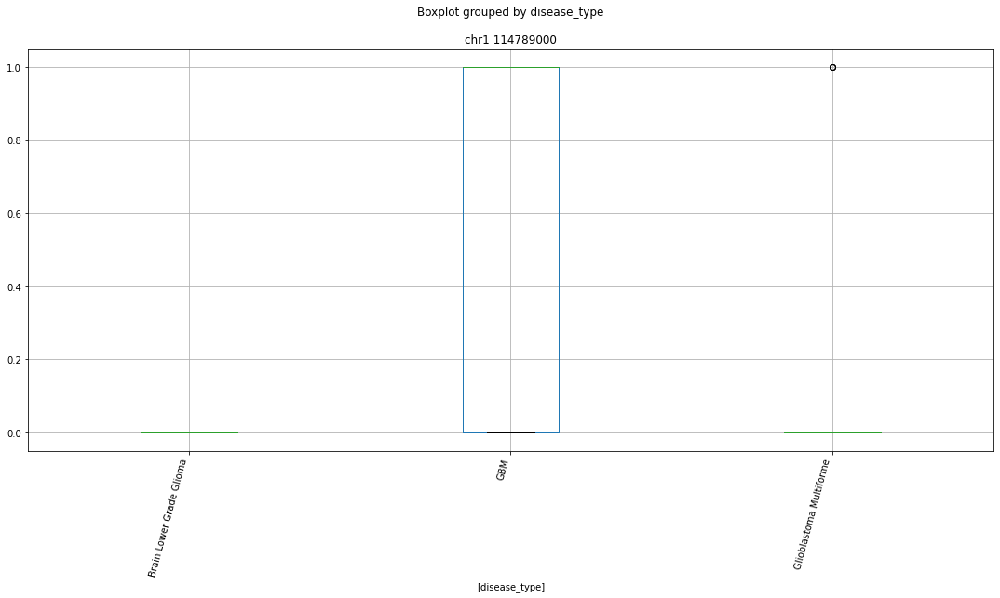

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr3 12849000


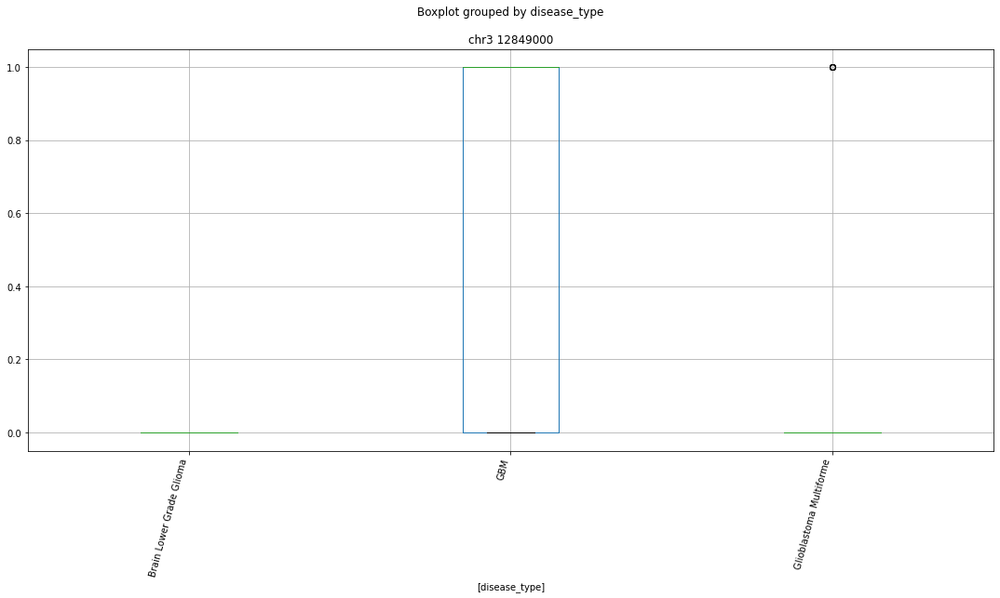

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr16 46693000


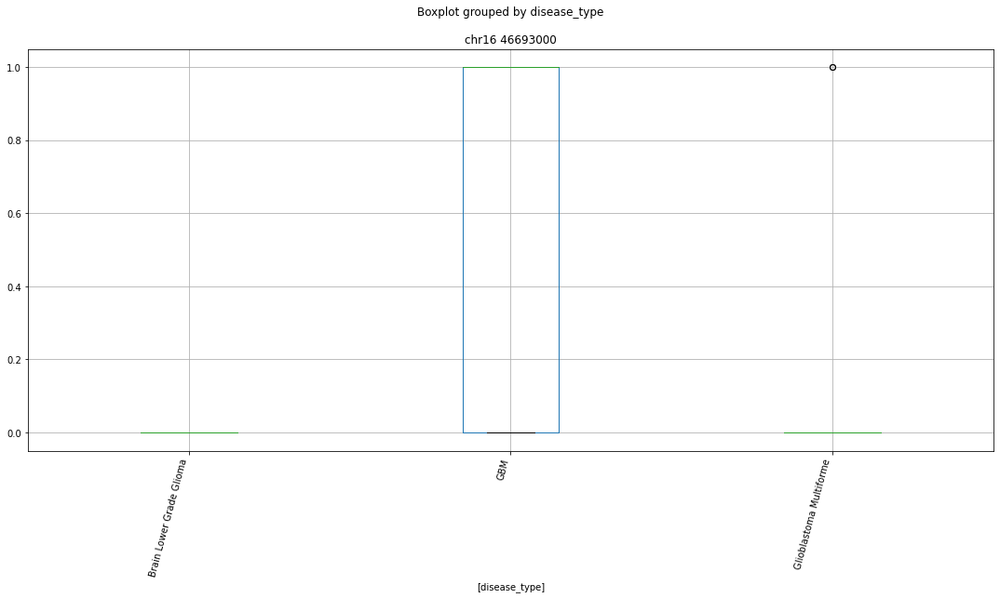

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr5 76335000


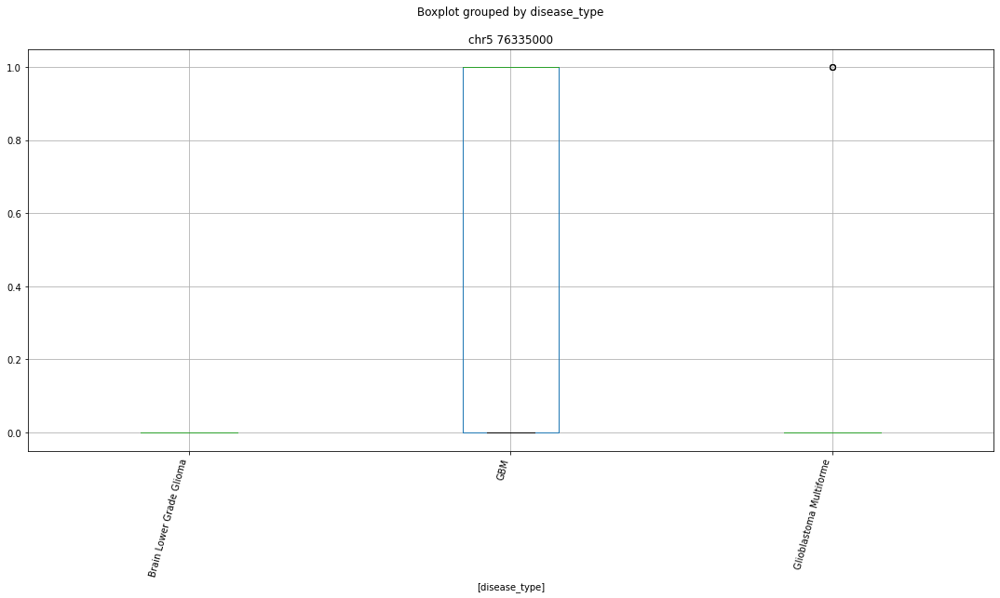

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr11 61165000


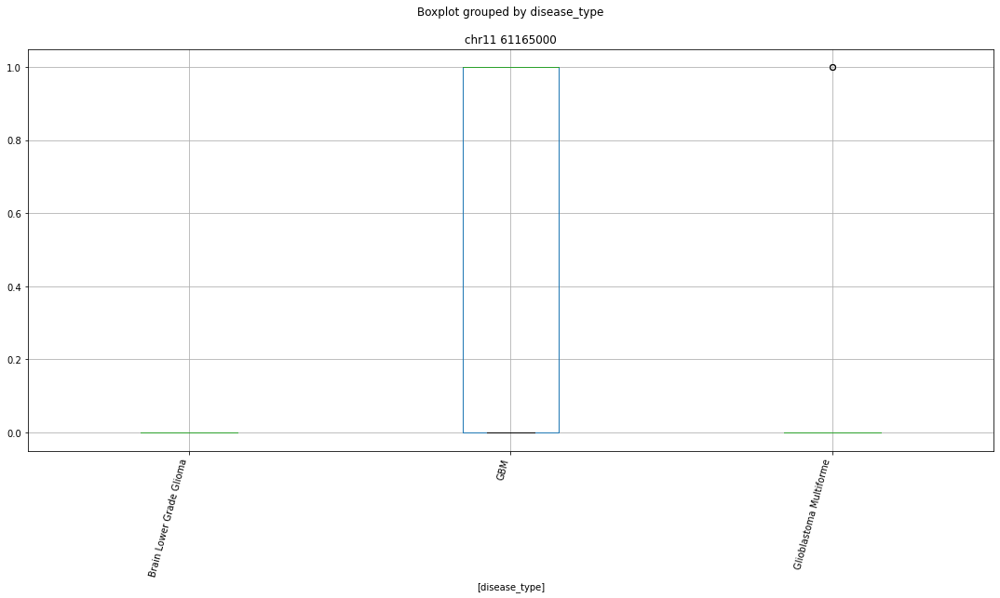

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr3 185003000


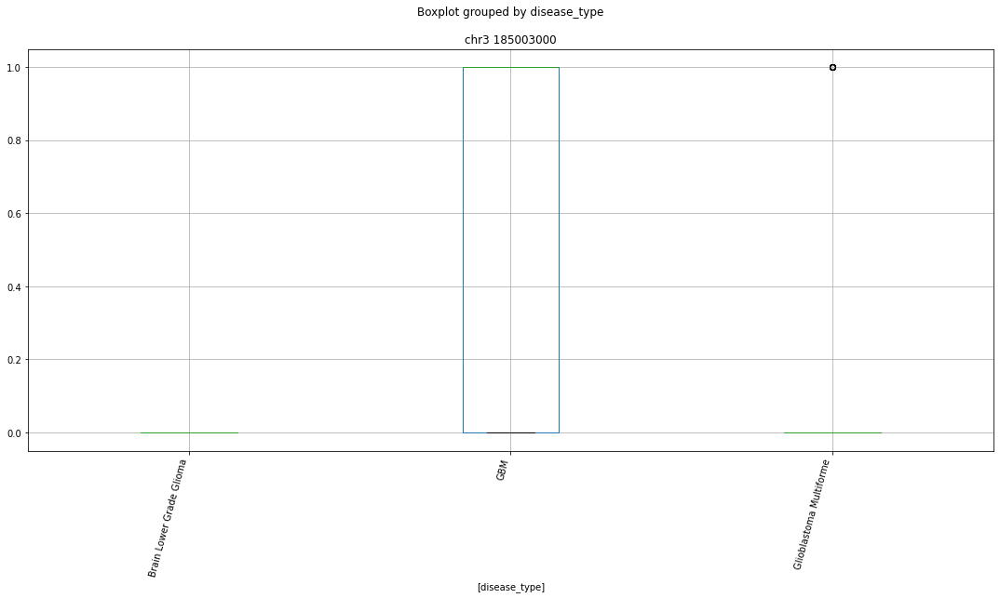

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr16 17505000


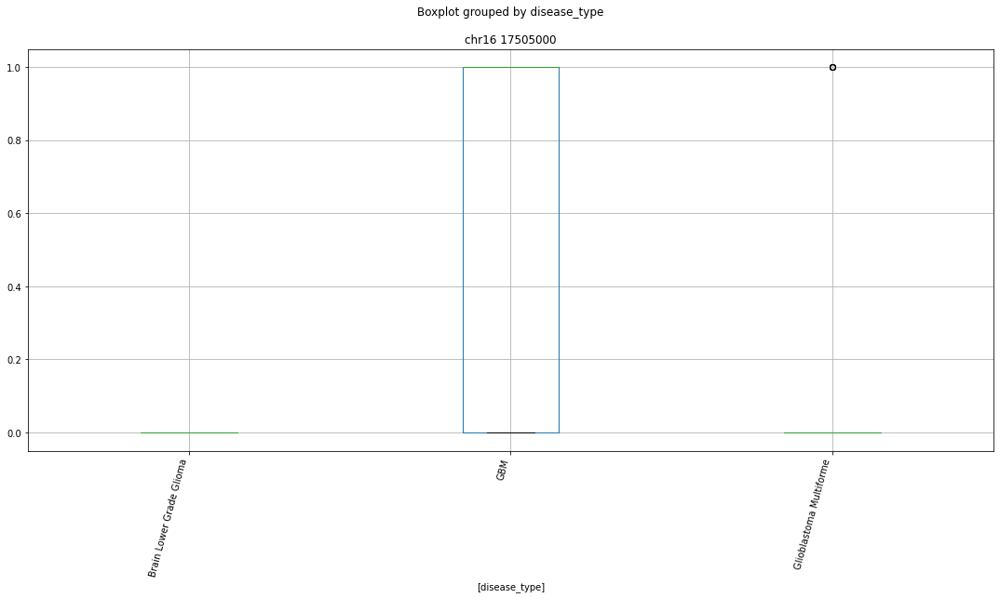

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr9 35182000


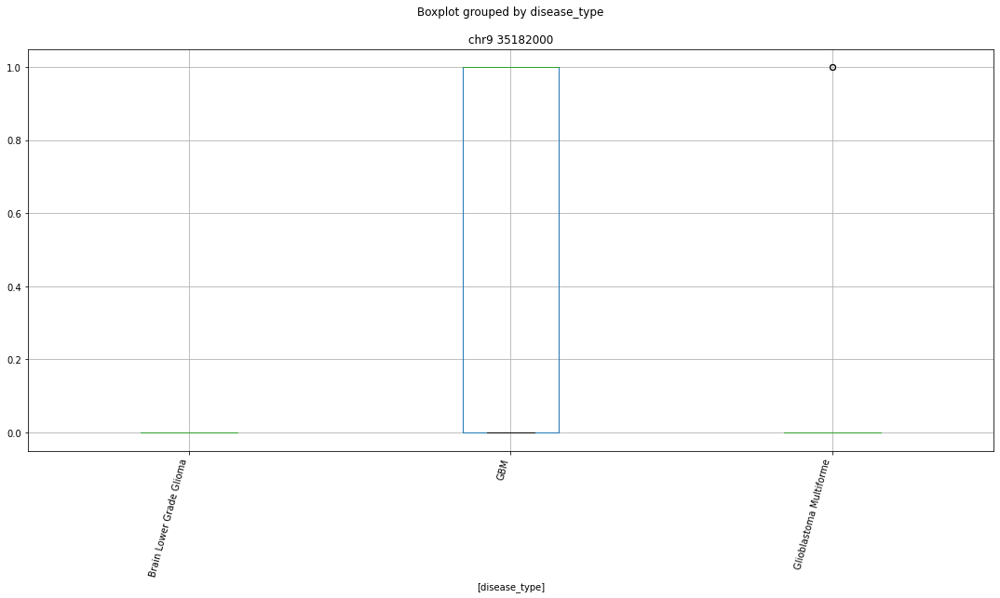

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr3 100476000


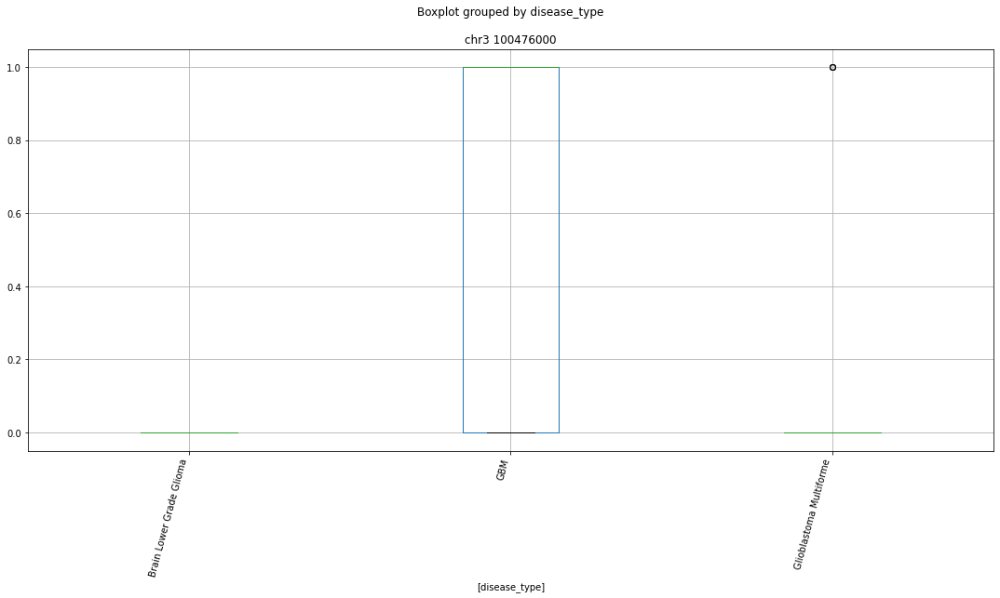

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr2 96463000


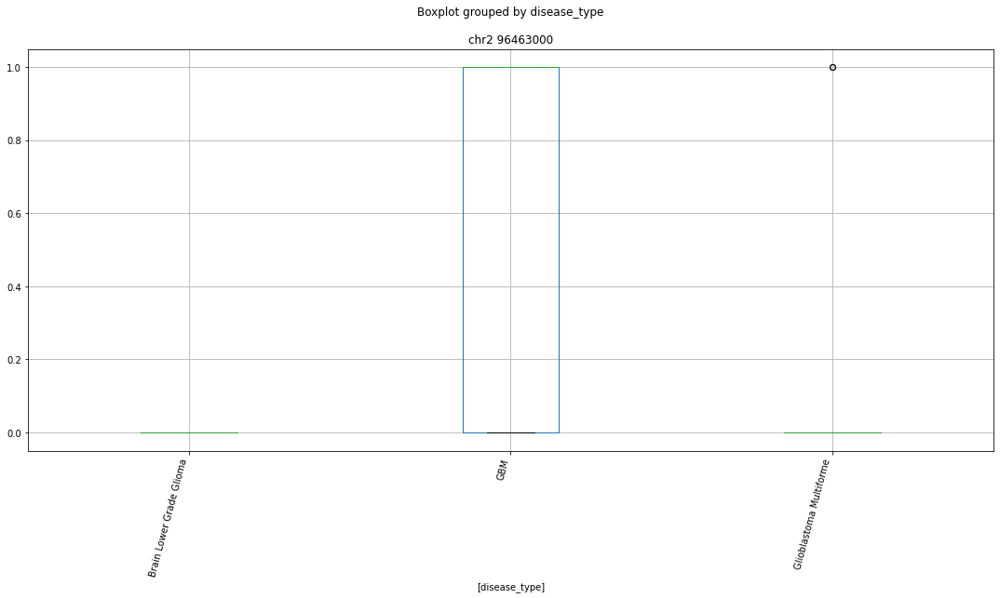

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr6 22837000


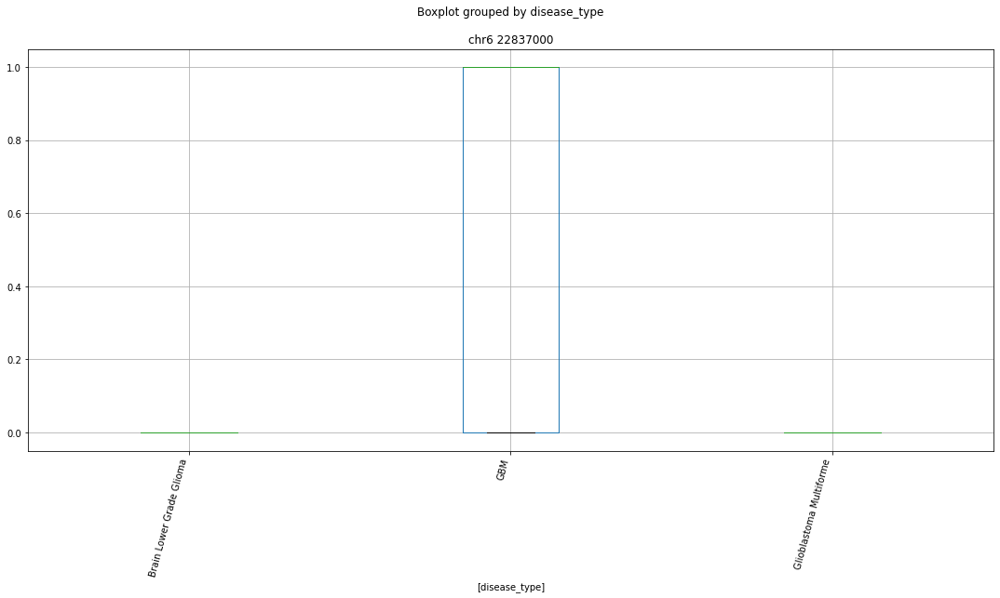

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr3 39650000


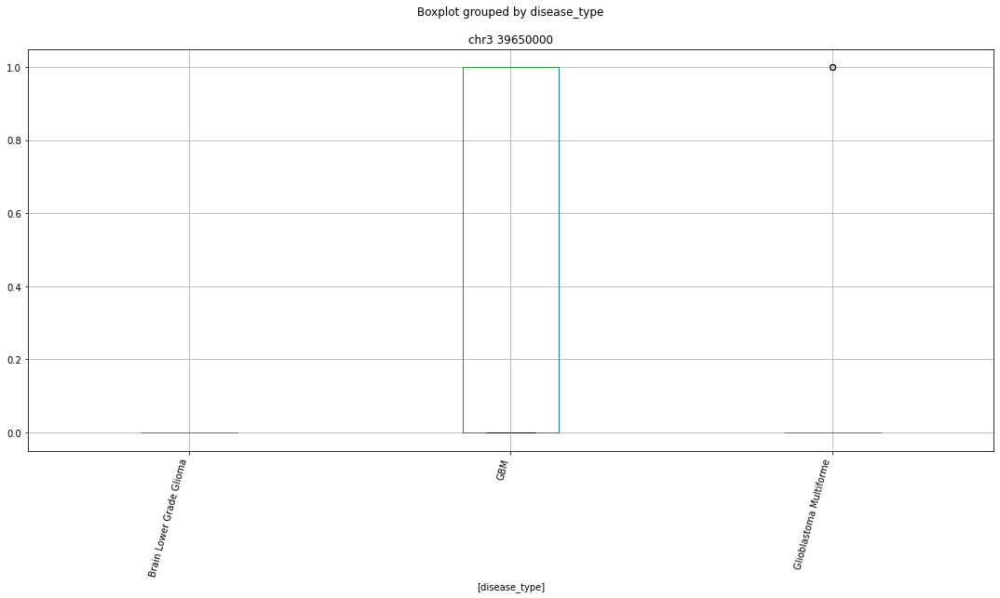

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr1 209130000


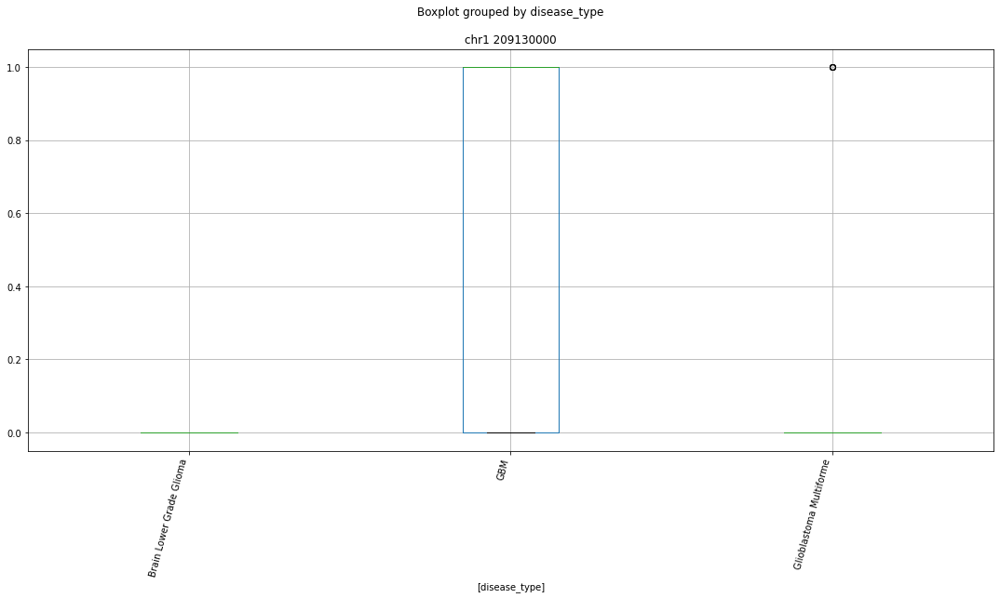

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr14 20311000


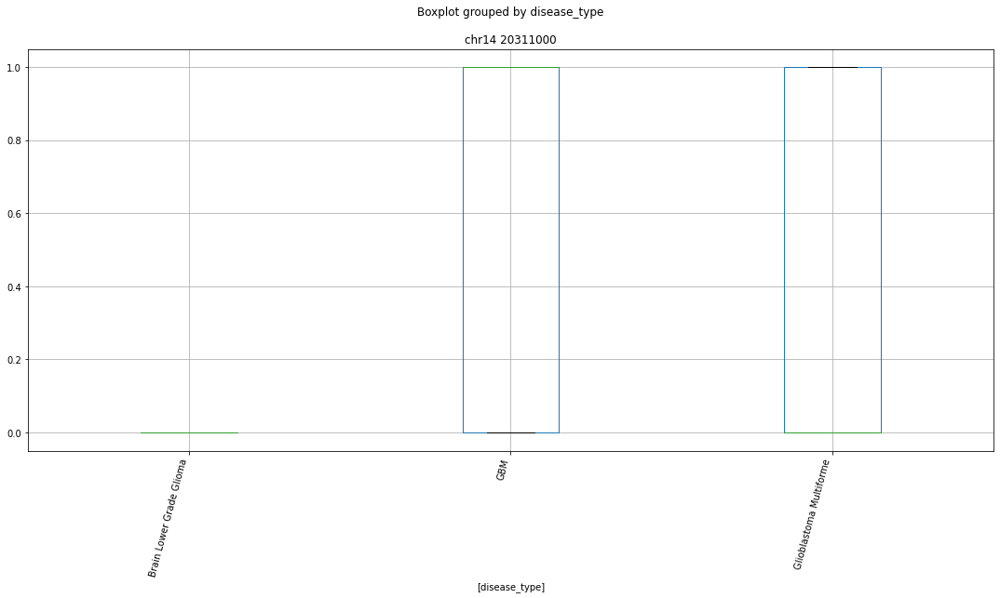

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr21 39158000


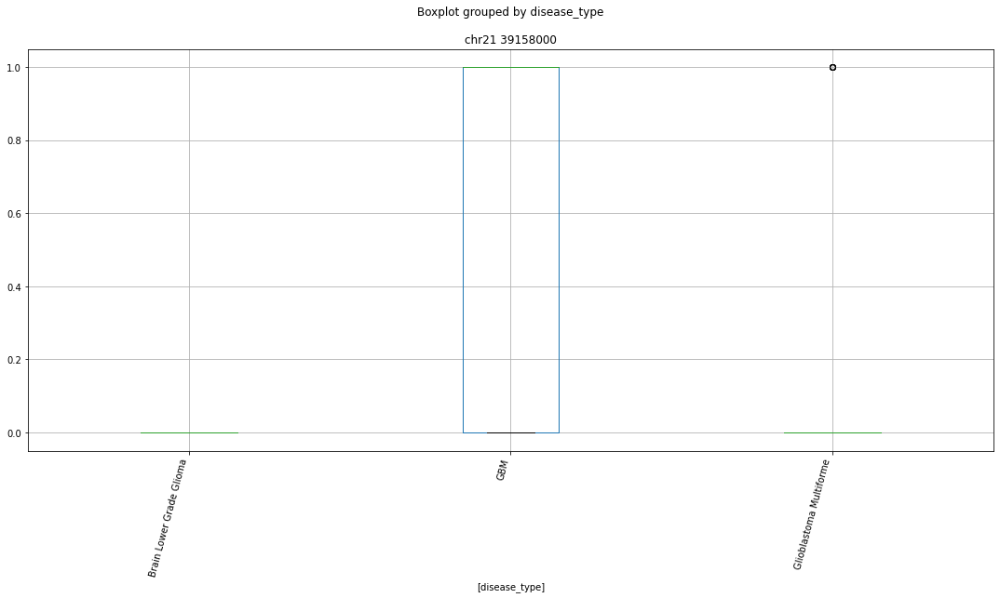

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr10 21431000


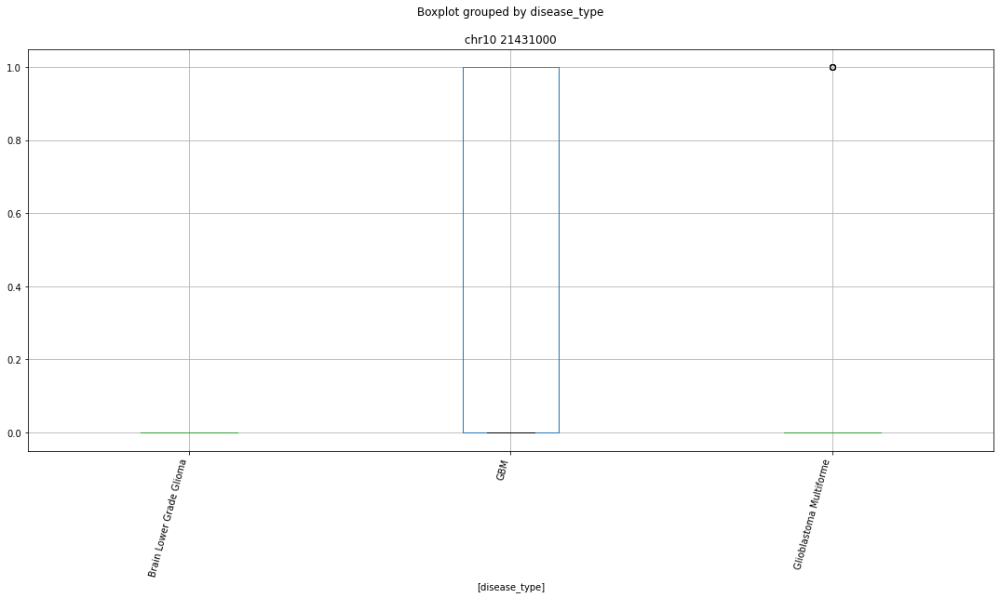

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr8 43686000


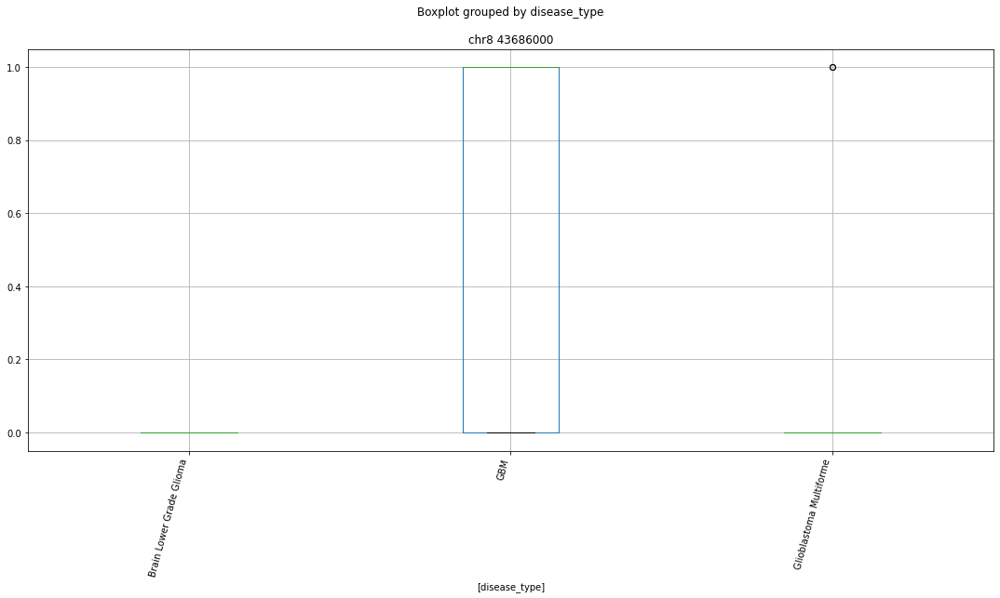

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr13 43415000


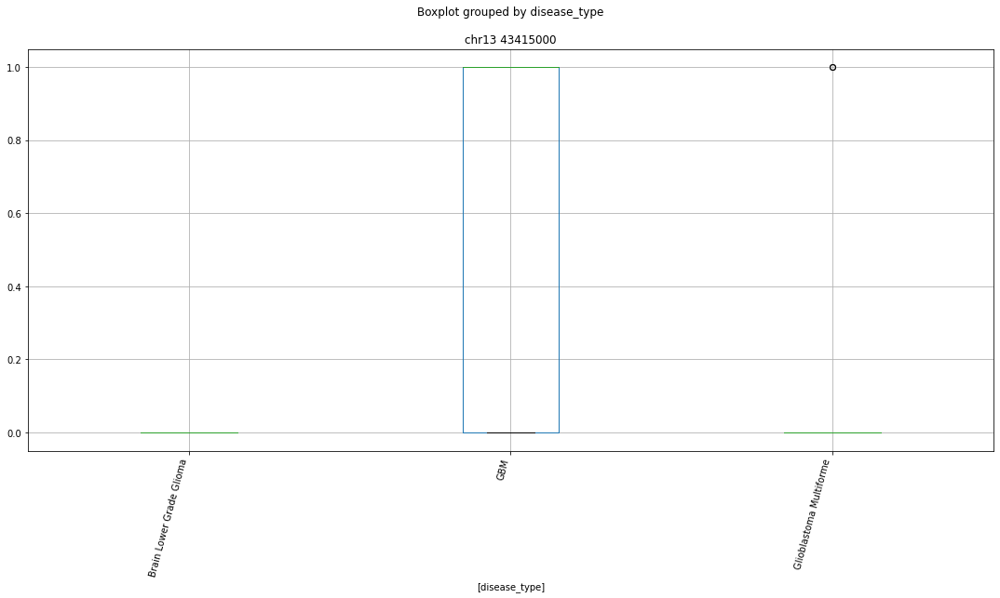

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr2 200682000


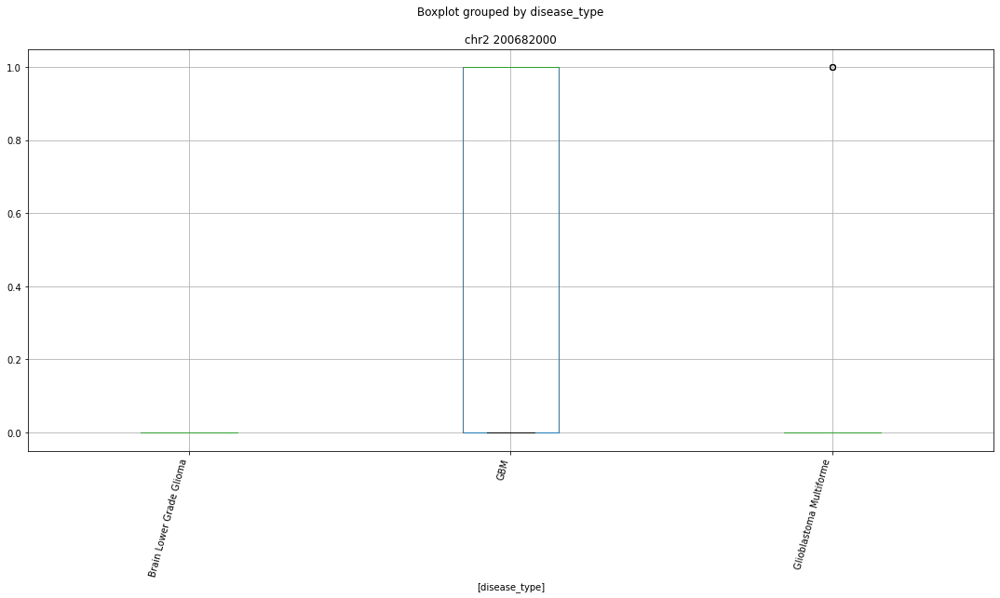

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr18 54344000


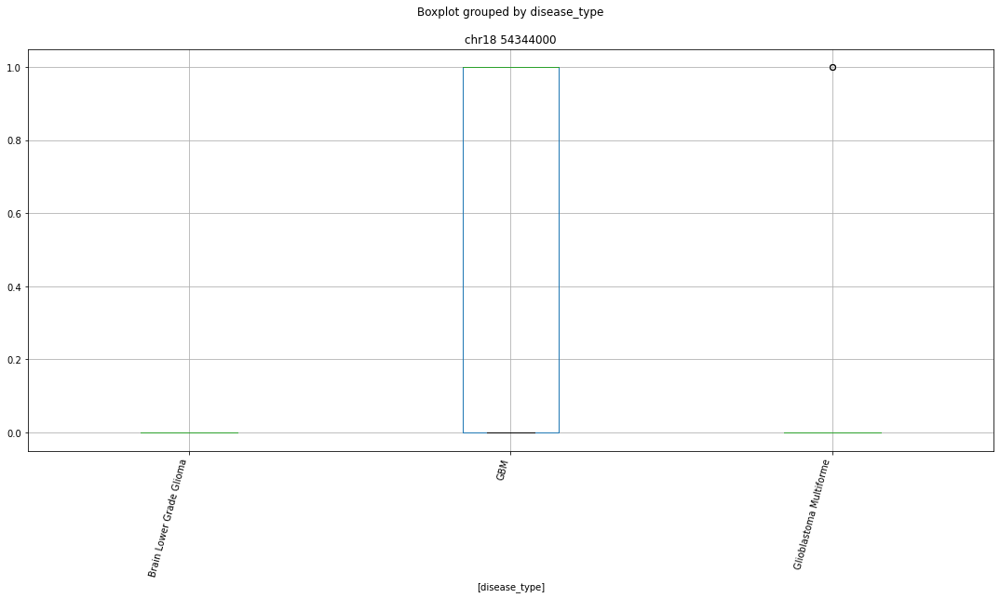

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr12 49435000


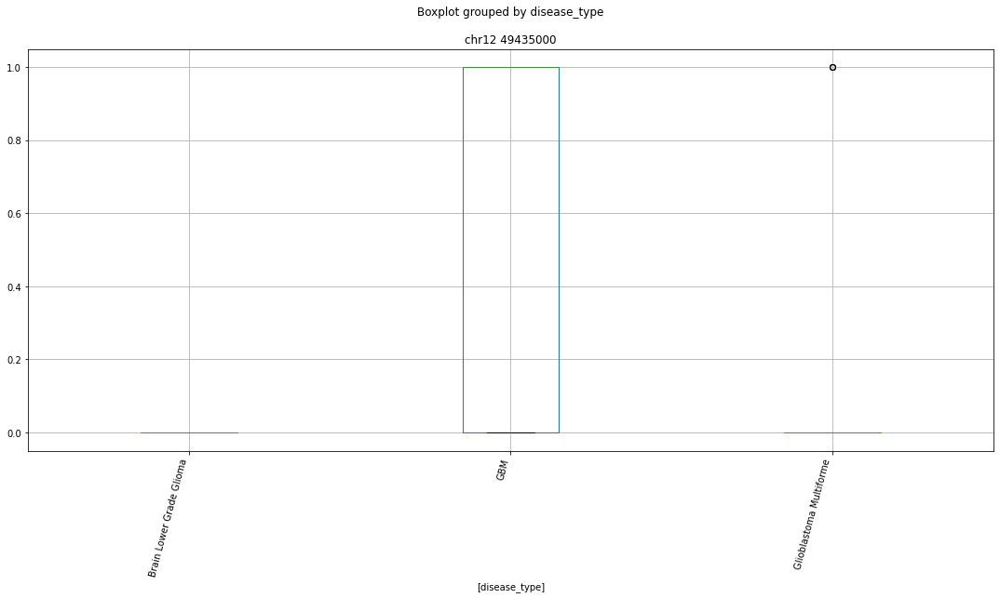

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr4 54919000


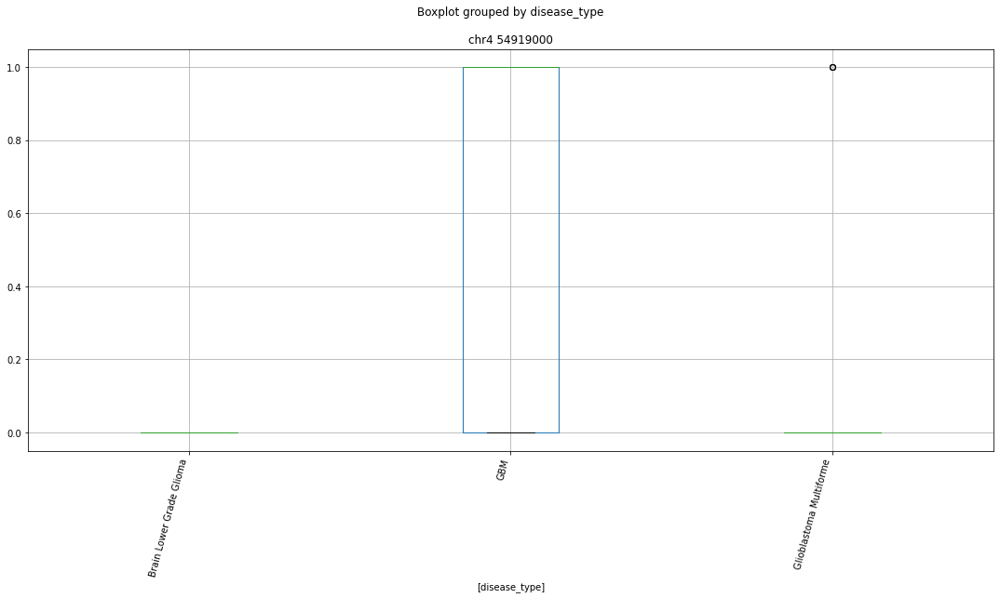

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr7 26175000


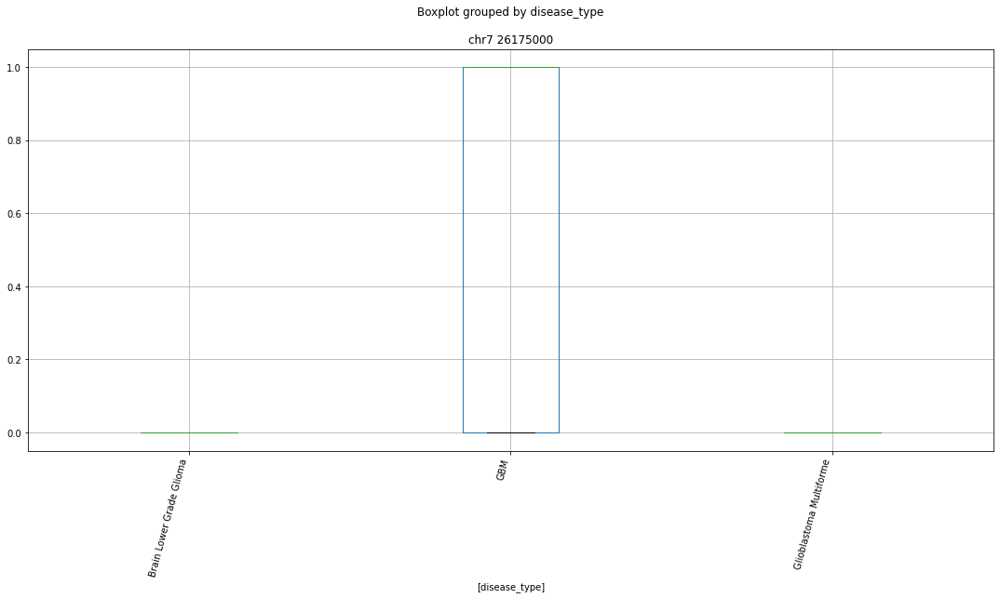

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr4 150954000


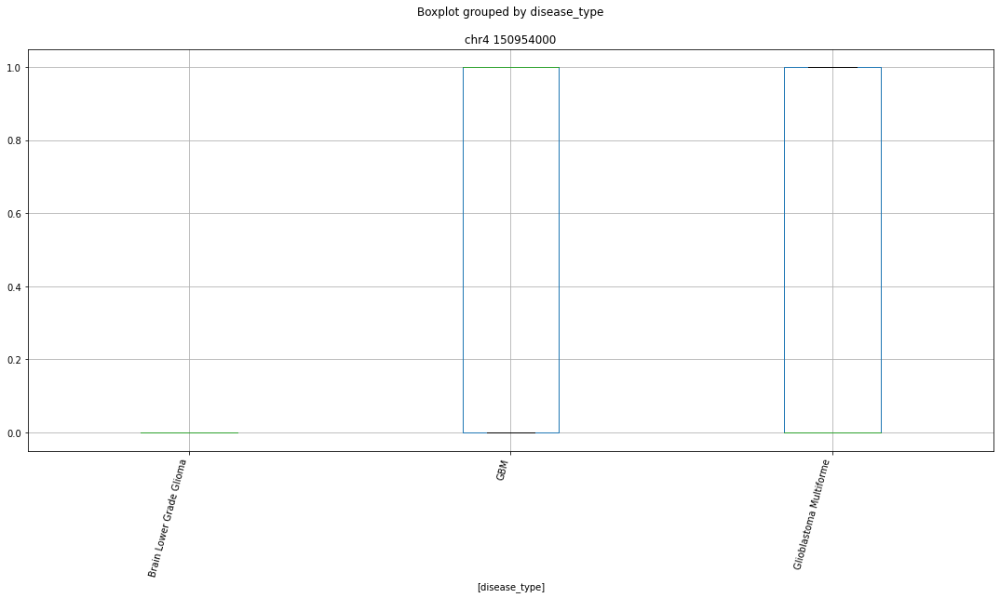

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr10 34353000


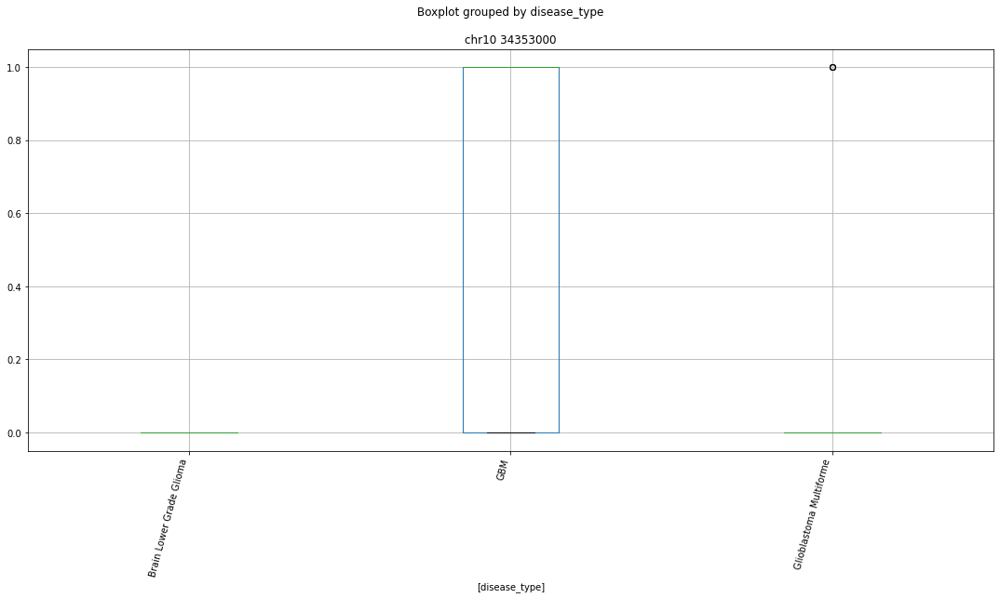

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr2 127786000


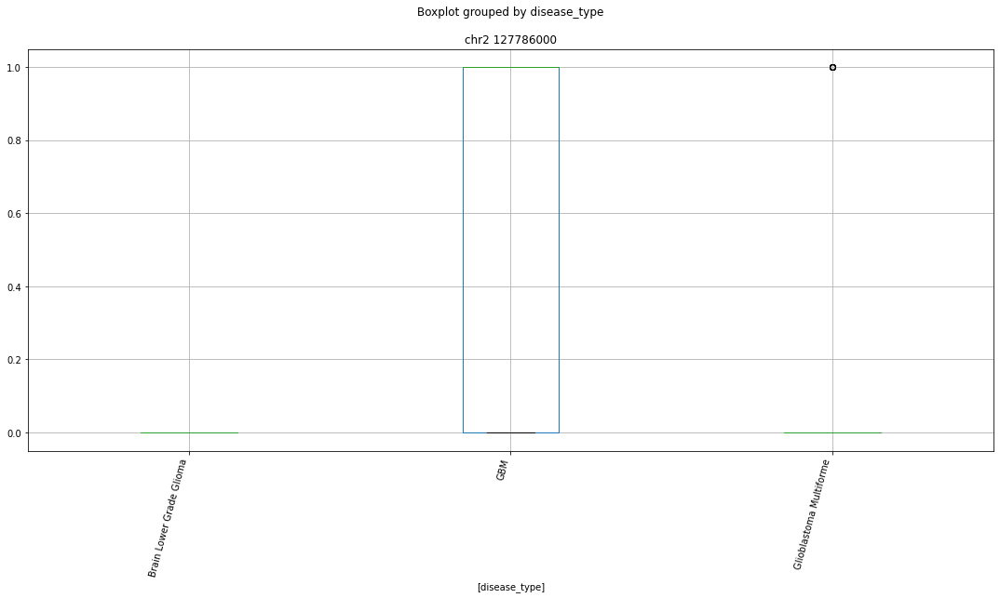

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr8 61751000


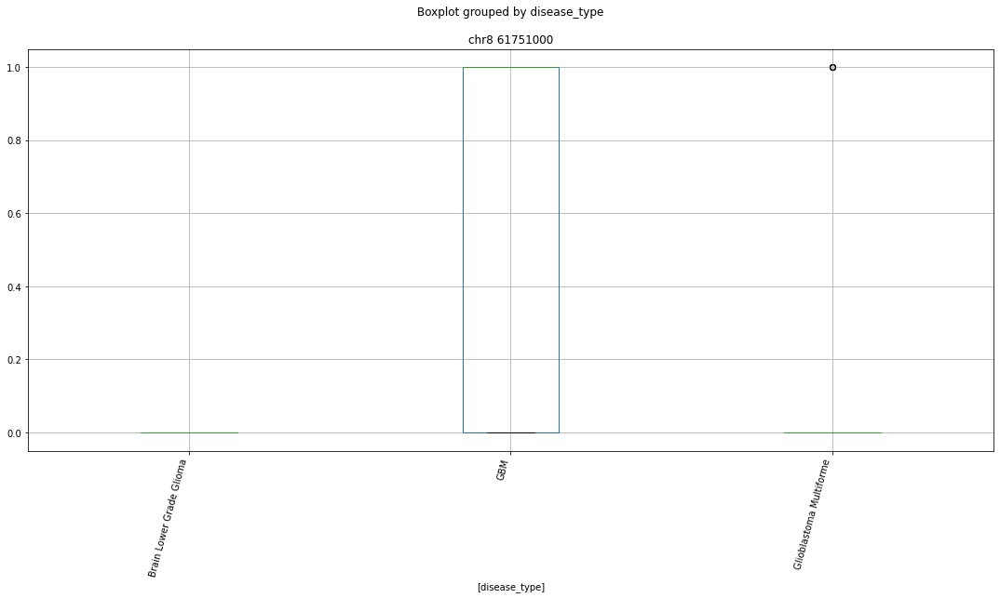

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr1 27221000


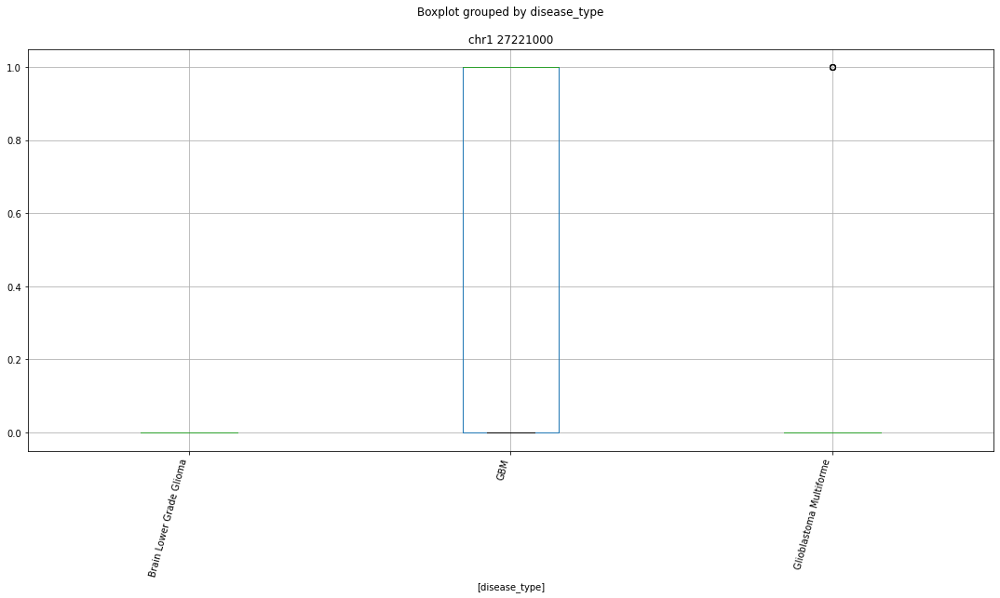

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr2 233723000


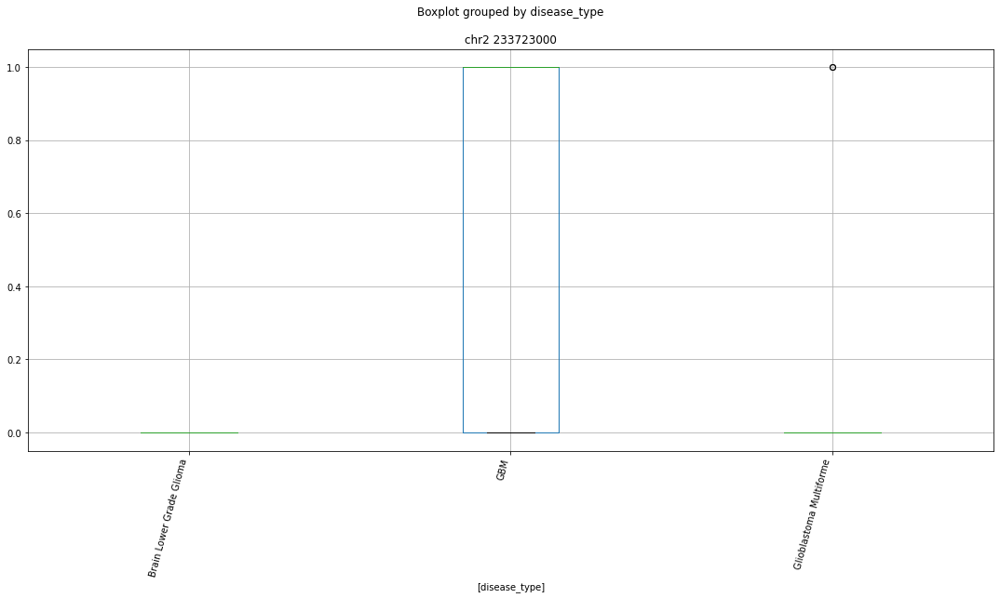

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr7 105410000


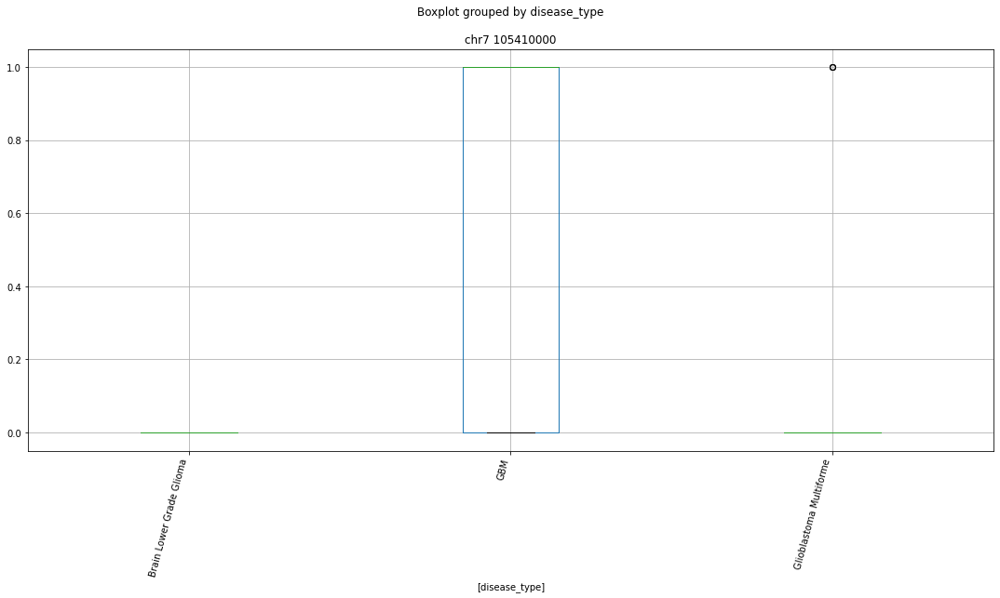

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr1 236427000


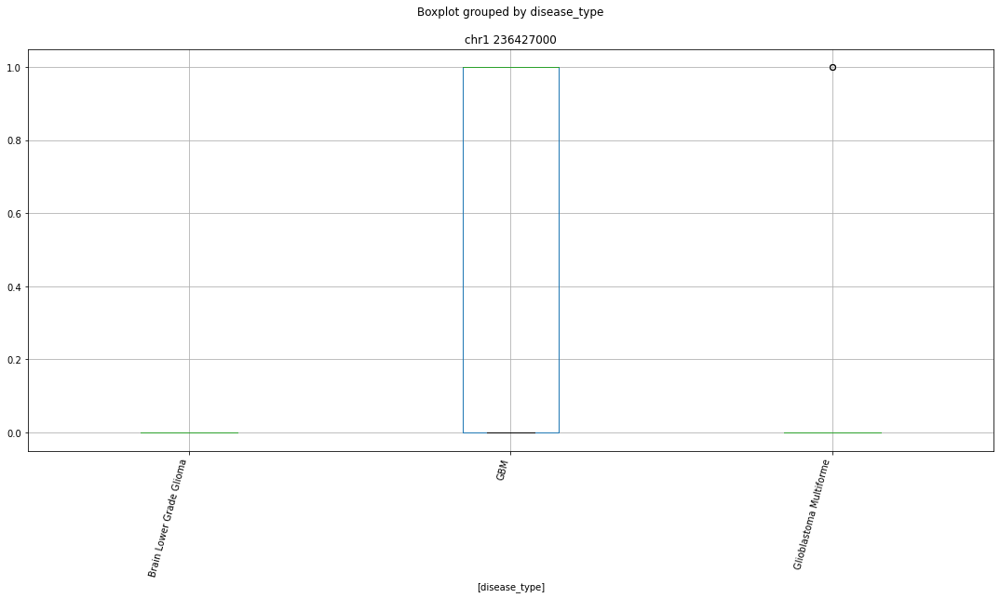

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr12 121077000


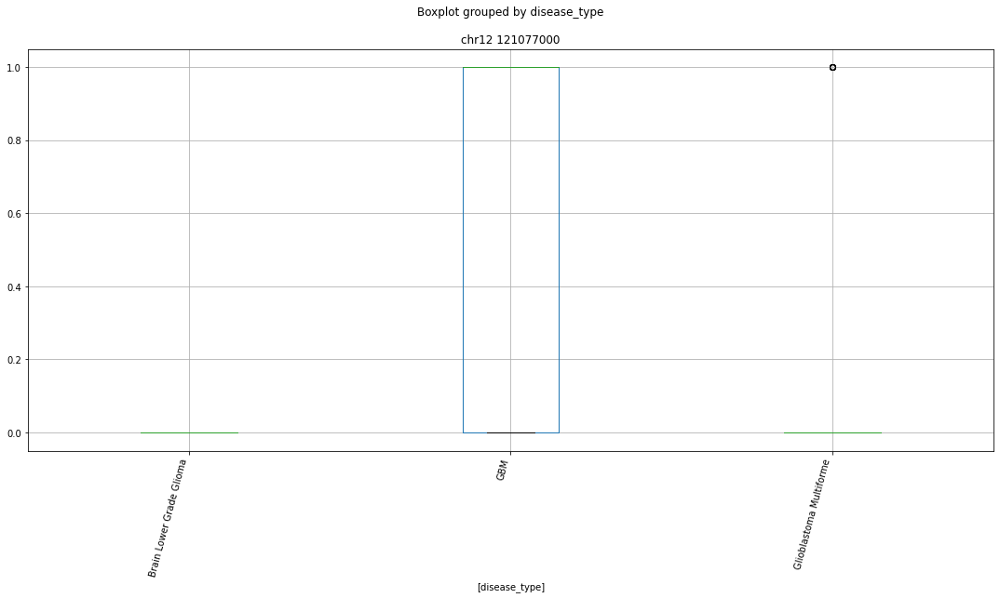

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chrX 147991000


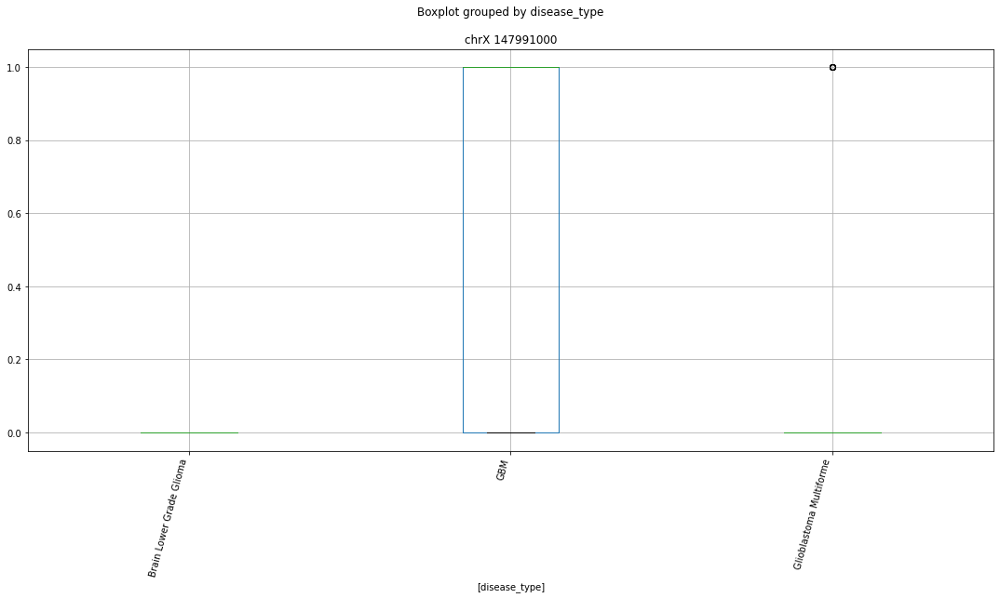

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr2 189654000


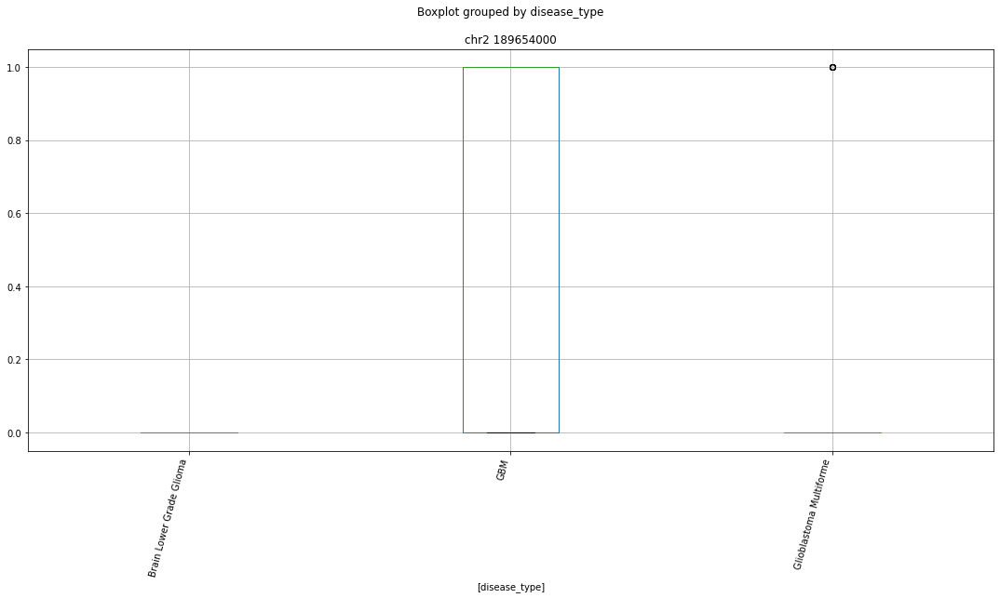

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr8 89309000


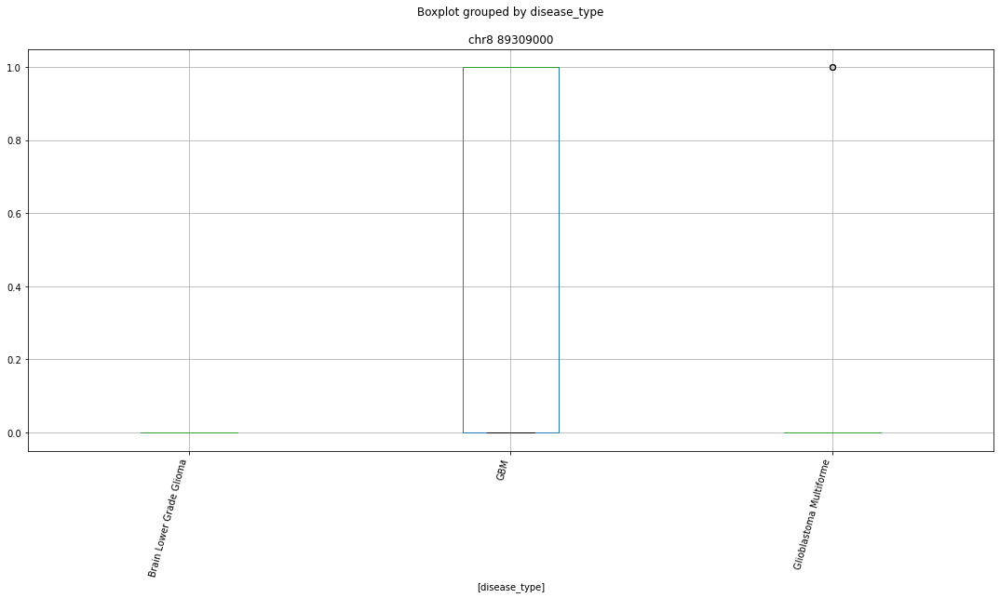

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr7 147801000


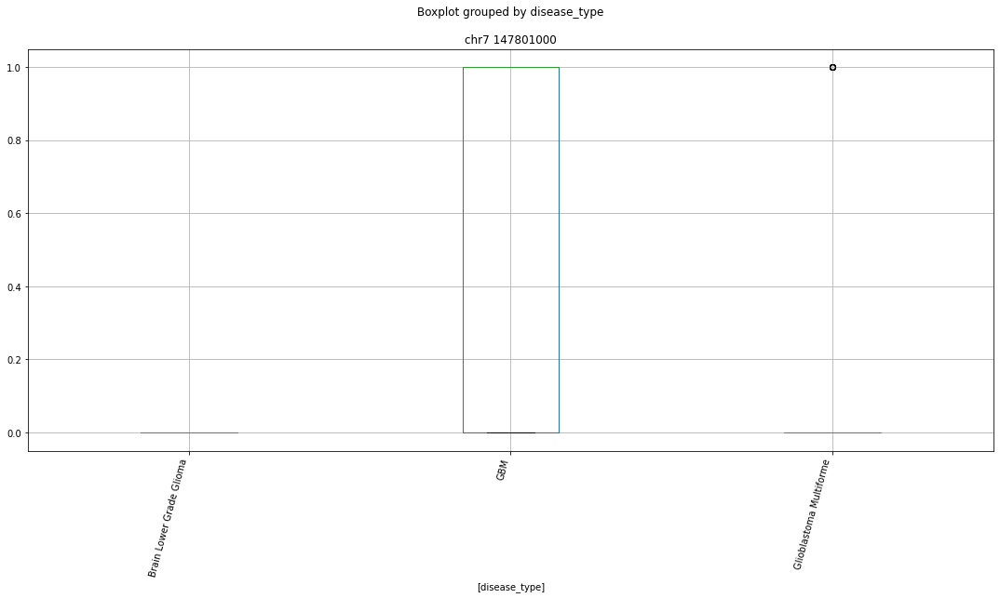

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr20 36975000


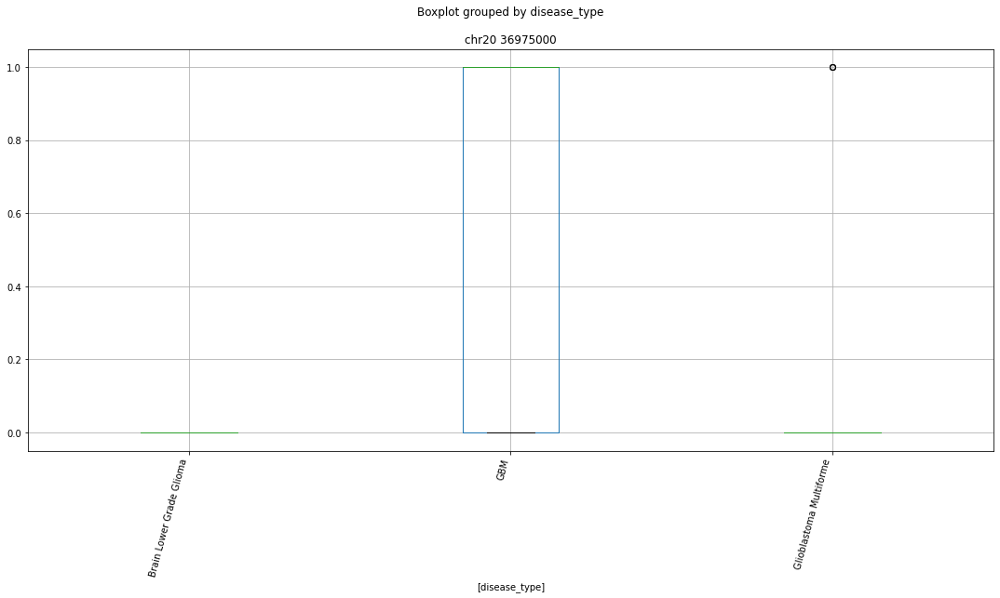

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr8 42938000


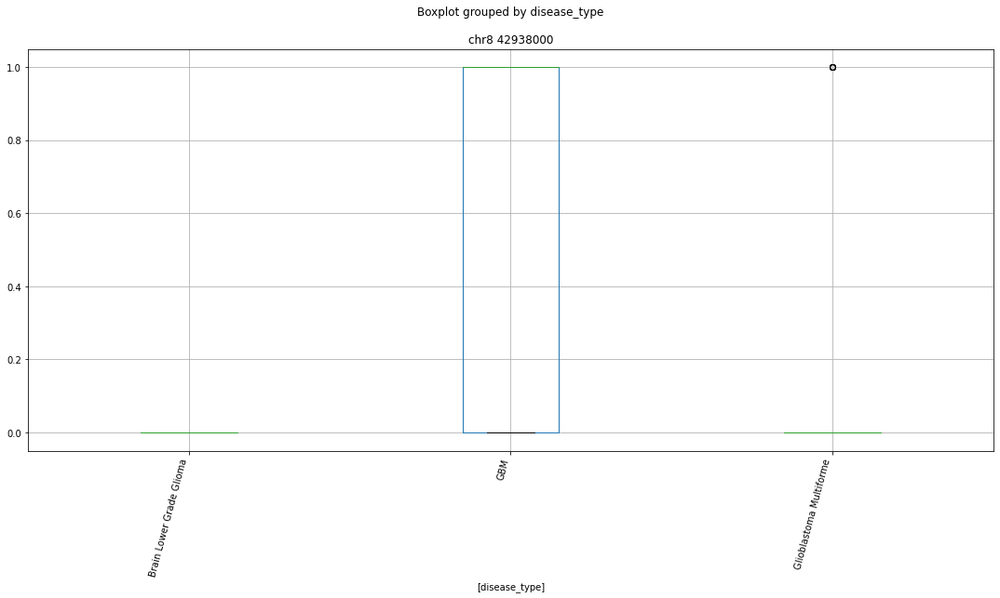

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr13 18674000


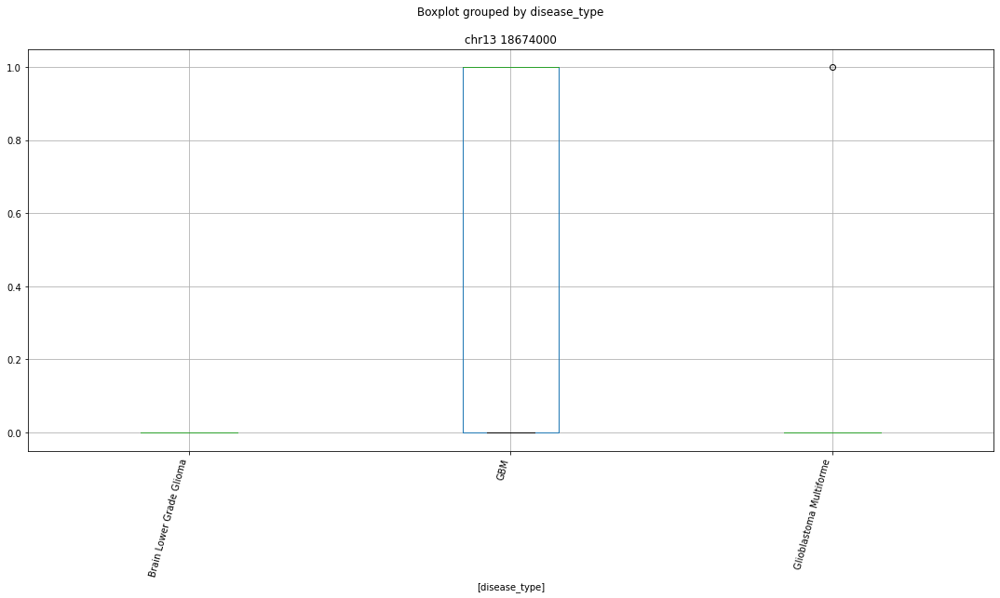

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr6 135363000


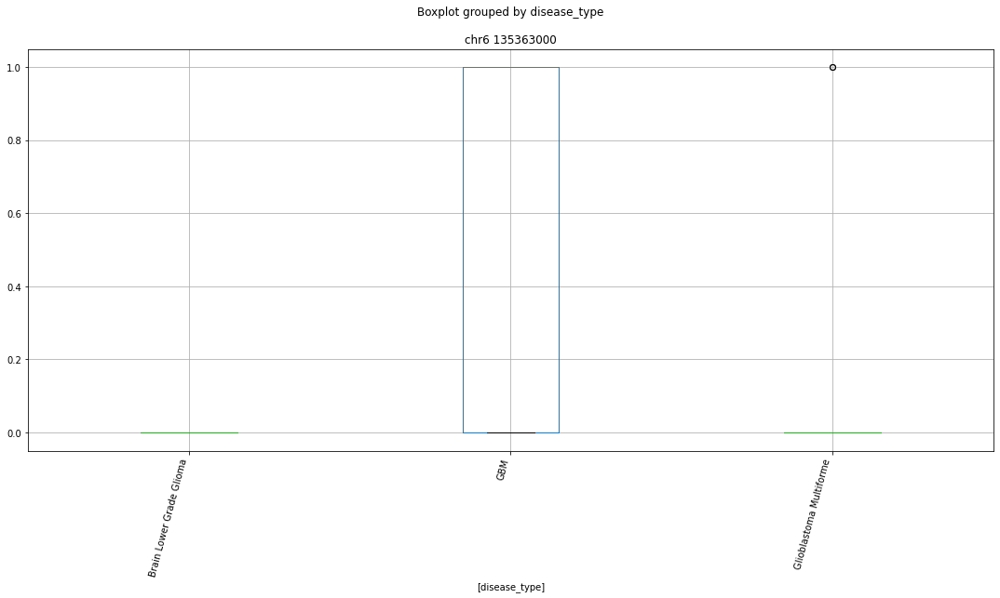

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr10 58245000


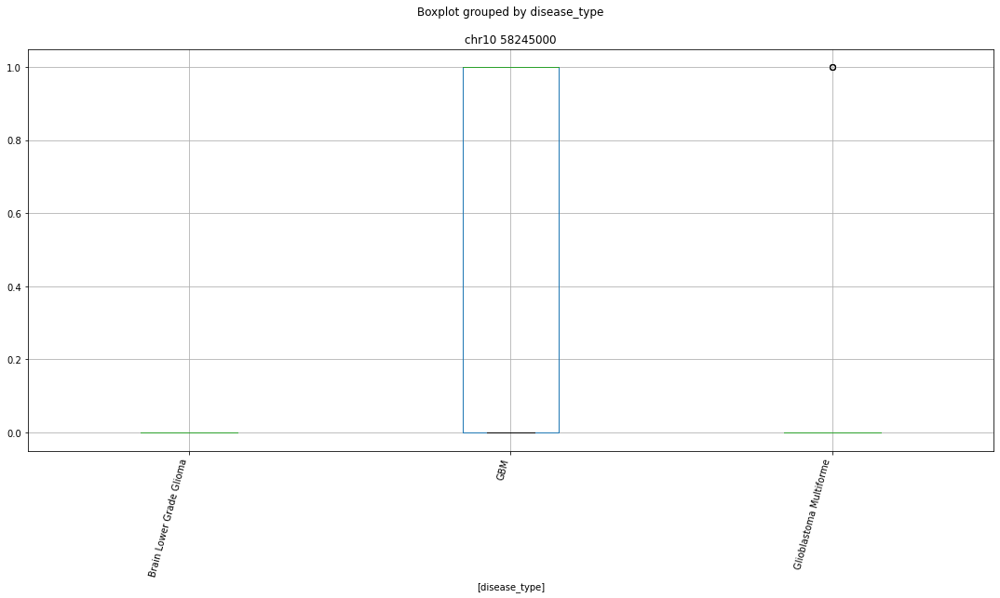

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr11 130090000


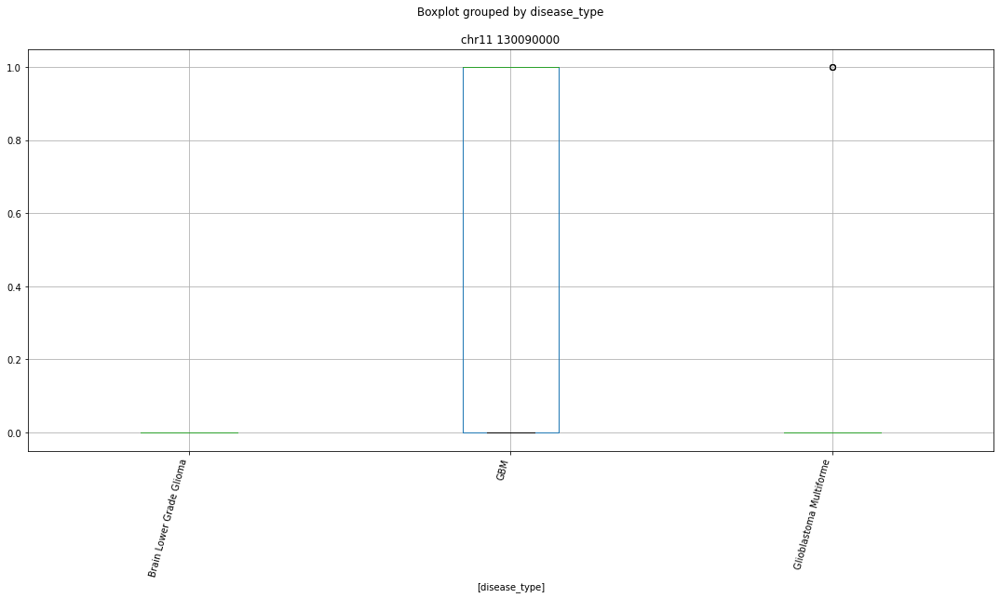

 p : 6.616621137048014e-11  ( t : 8.218938094196016 ) :  chr10 8869000


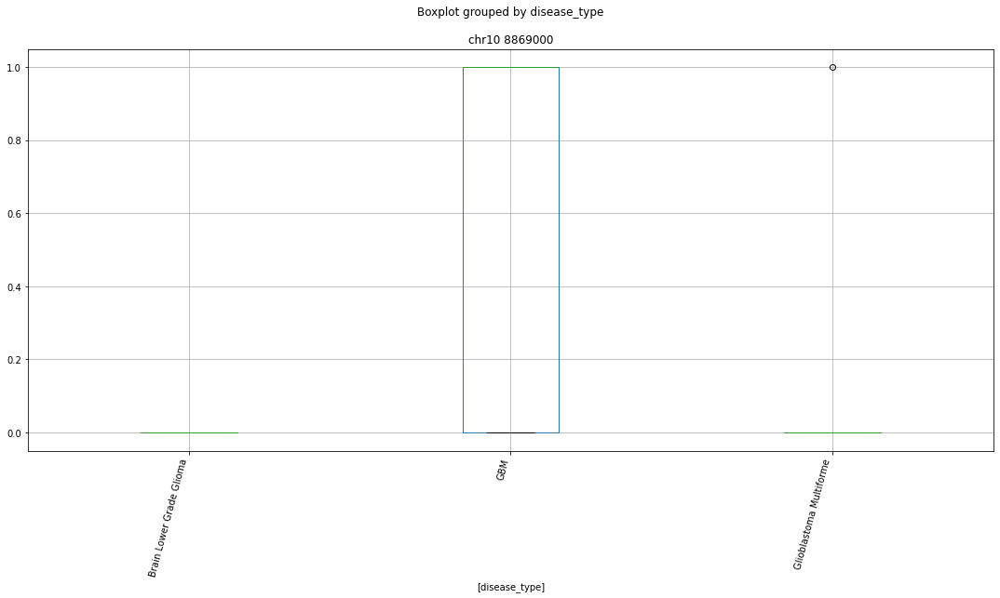

 p : 7.609277290064471e-11  ( t : 7.644822012889148 ) :  chr9 129662000


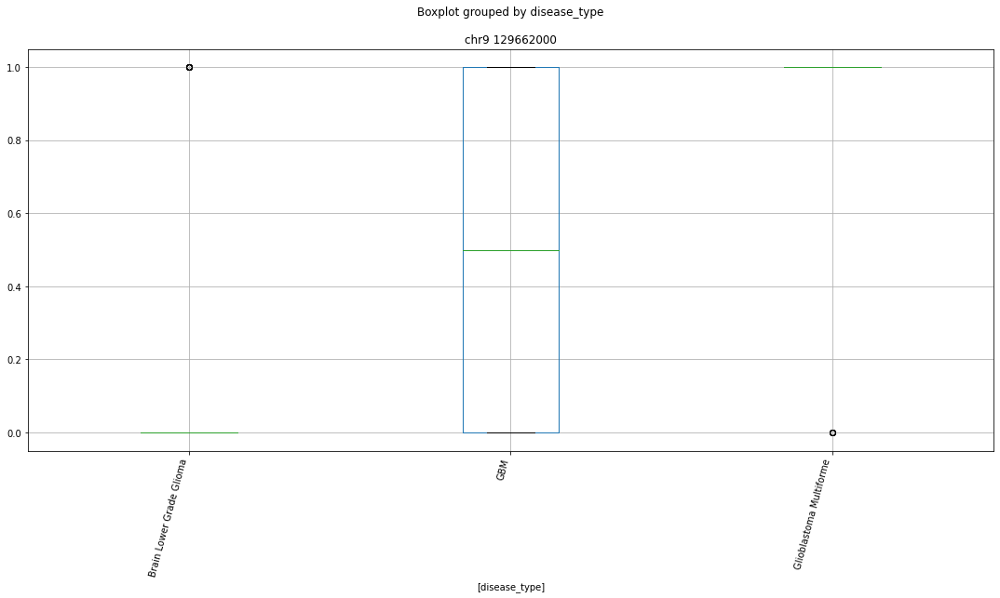

 p : 8.036008806778001e-11  ( t : 7.632015516631033 ) :  chr1 7600000


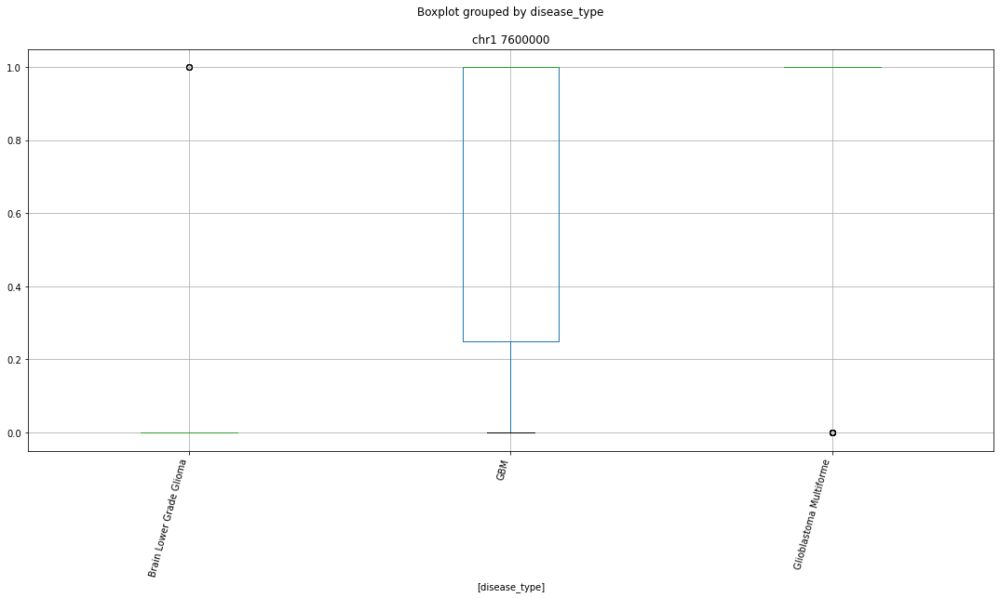

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr21 28564000


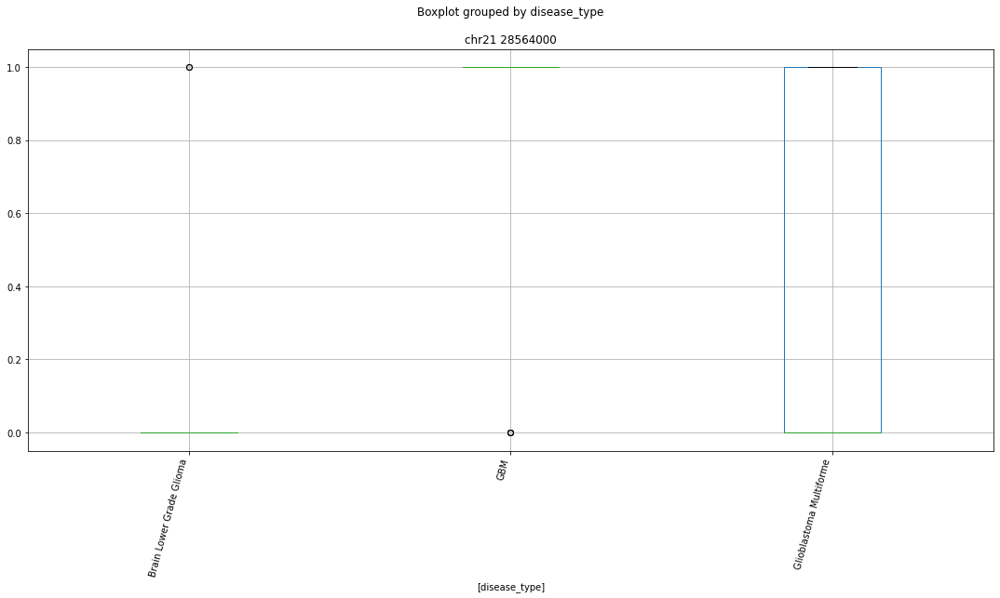

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr5 139171000


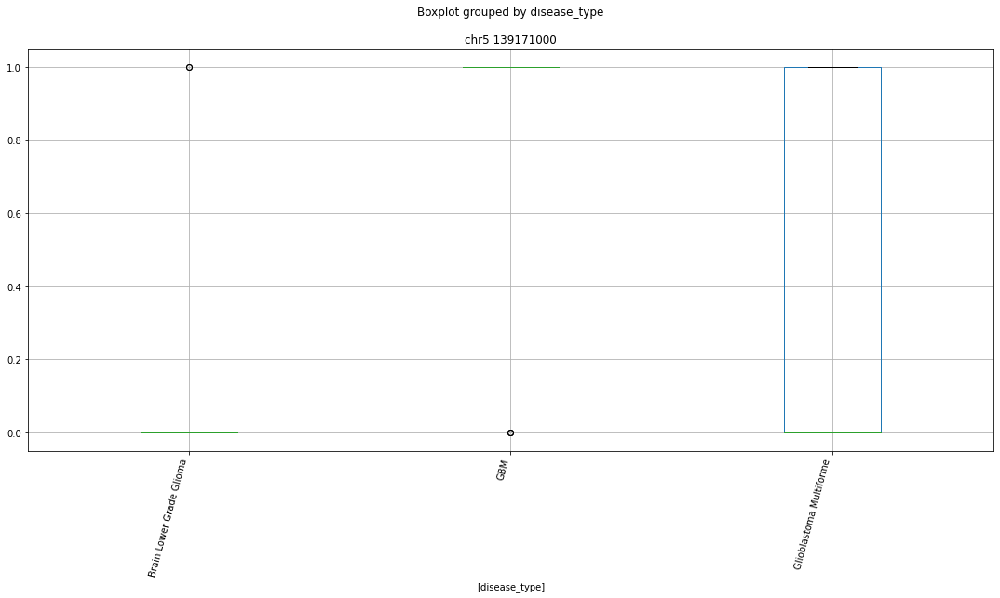

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr1 213150000


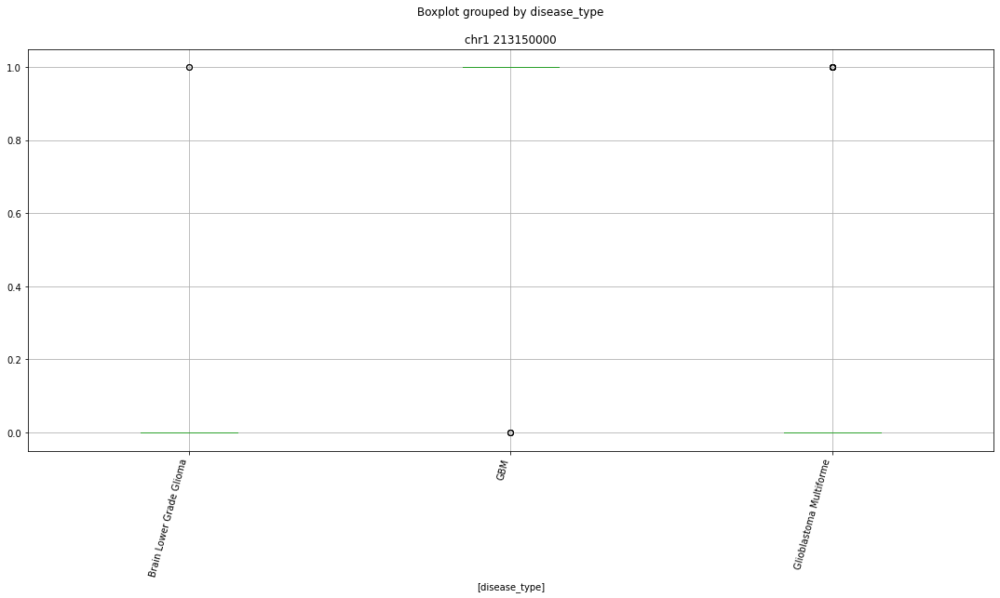

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr20 9384000


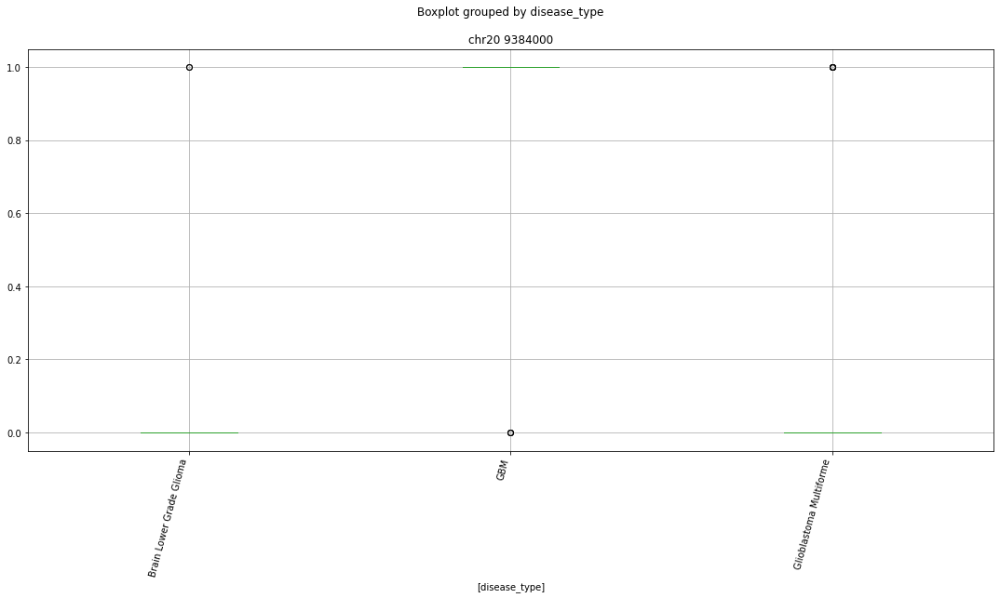

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr19 21486000


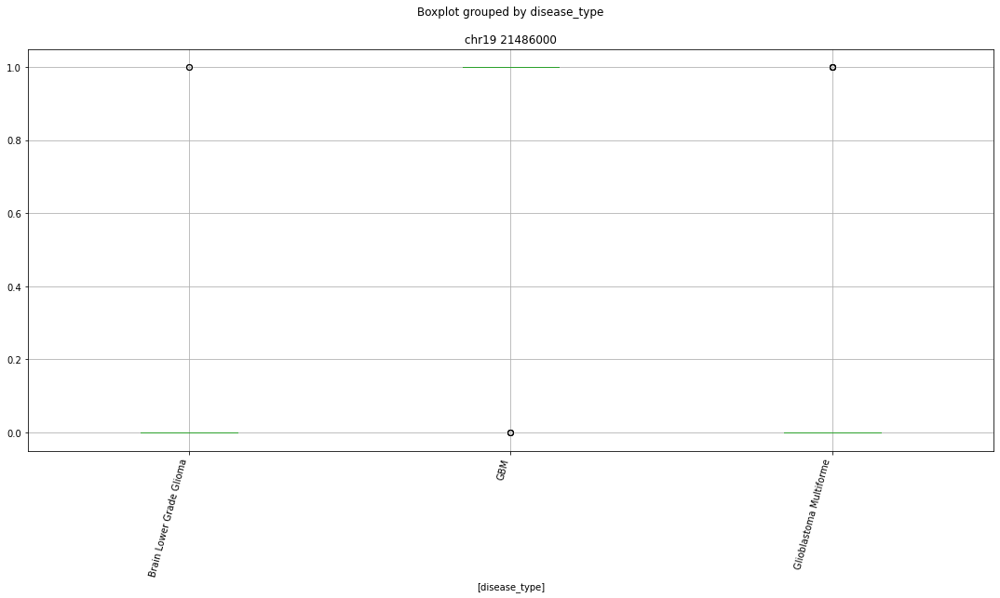

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr19 20063000


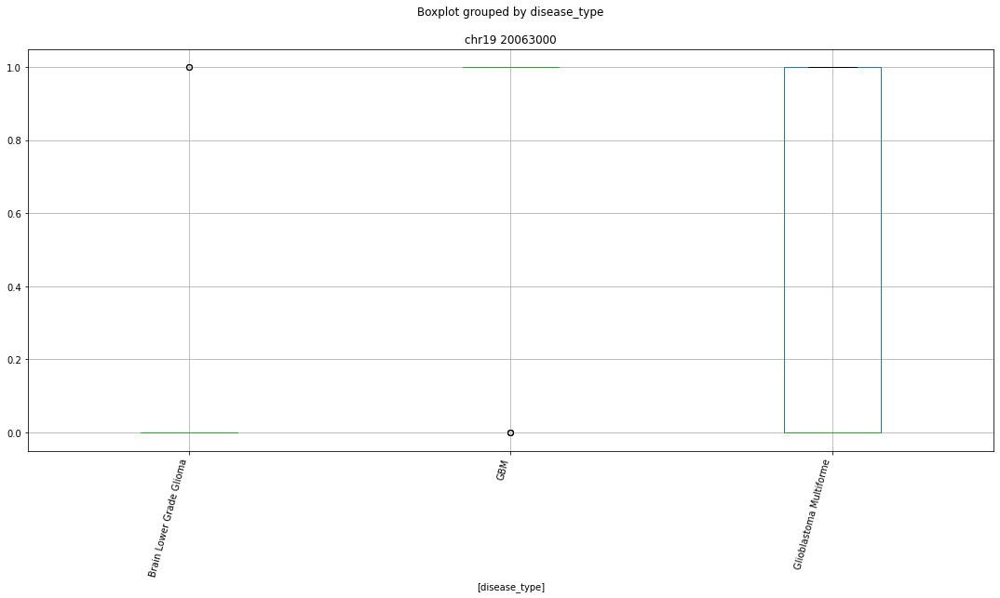

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr6 15190000


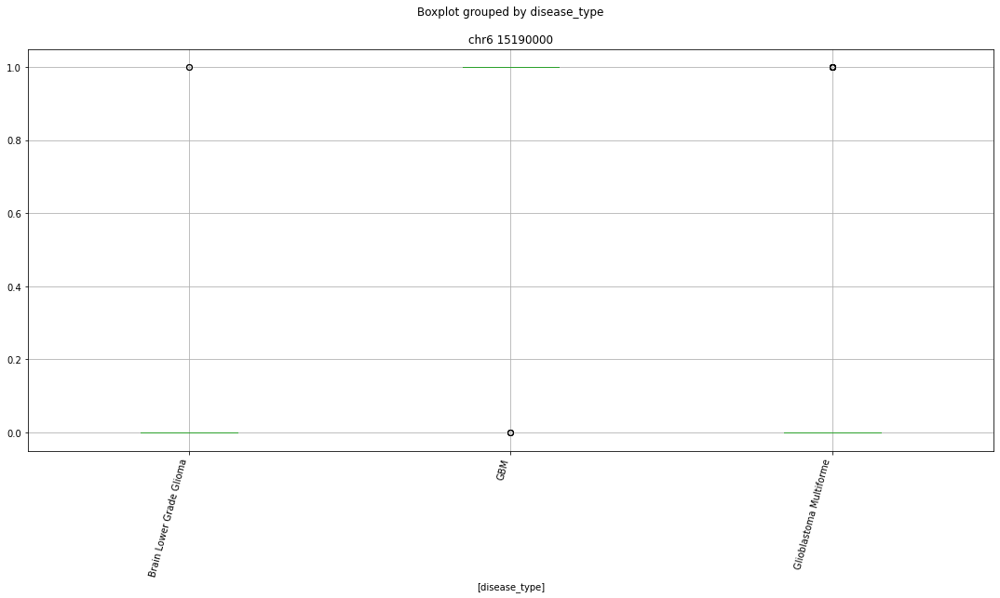

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr1 147062000


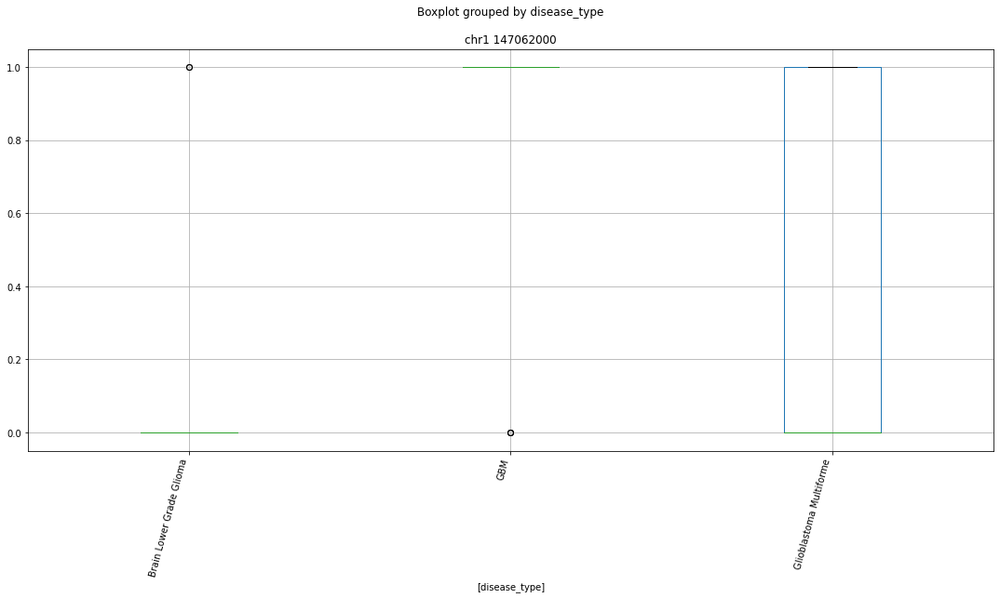

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr2 197695000


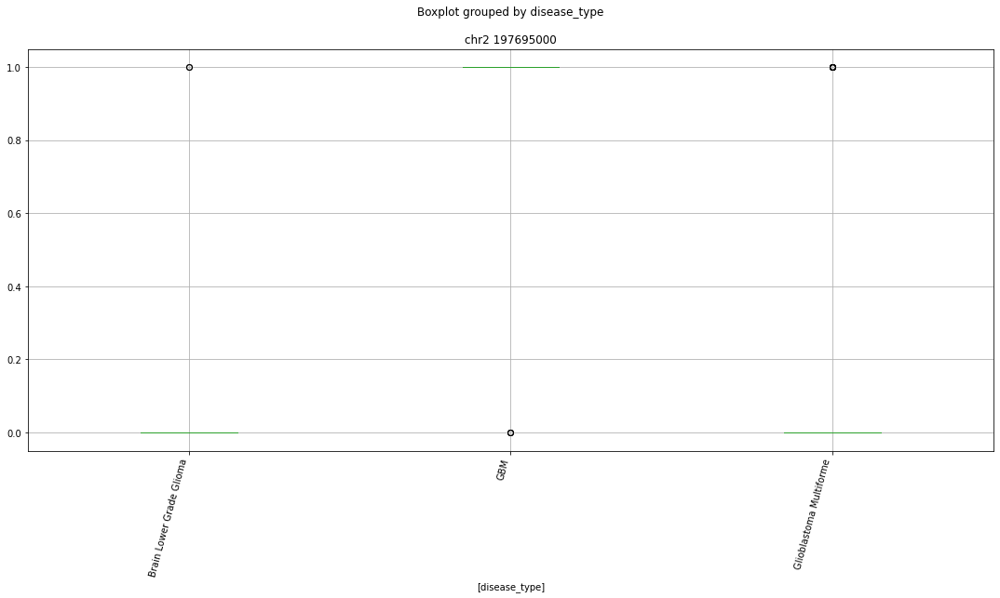

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr1 27065000


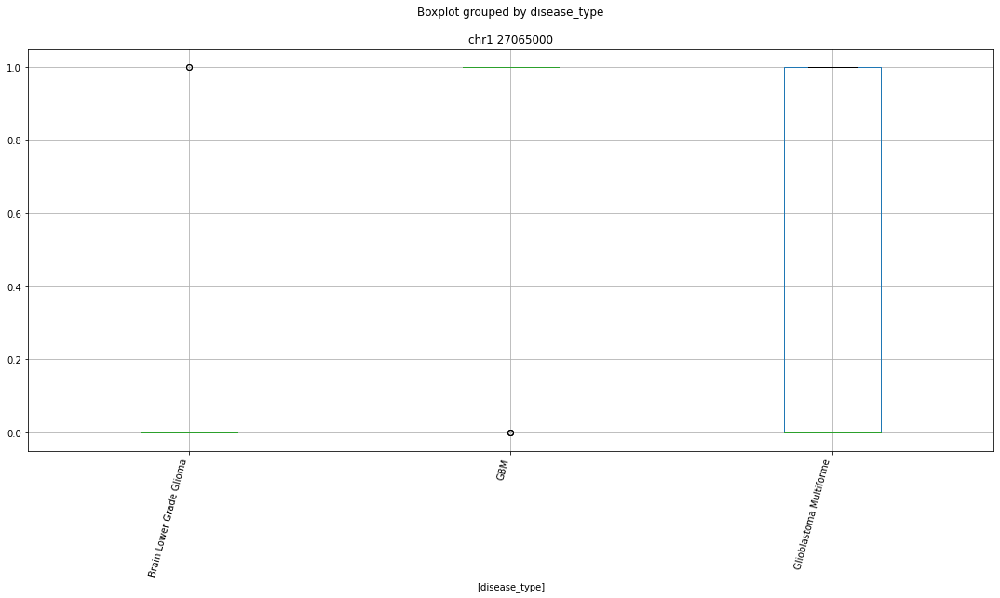

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr18 21591000


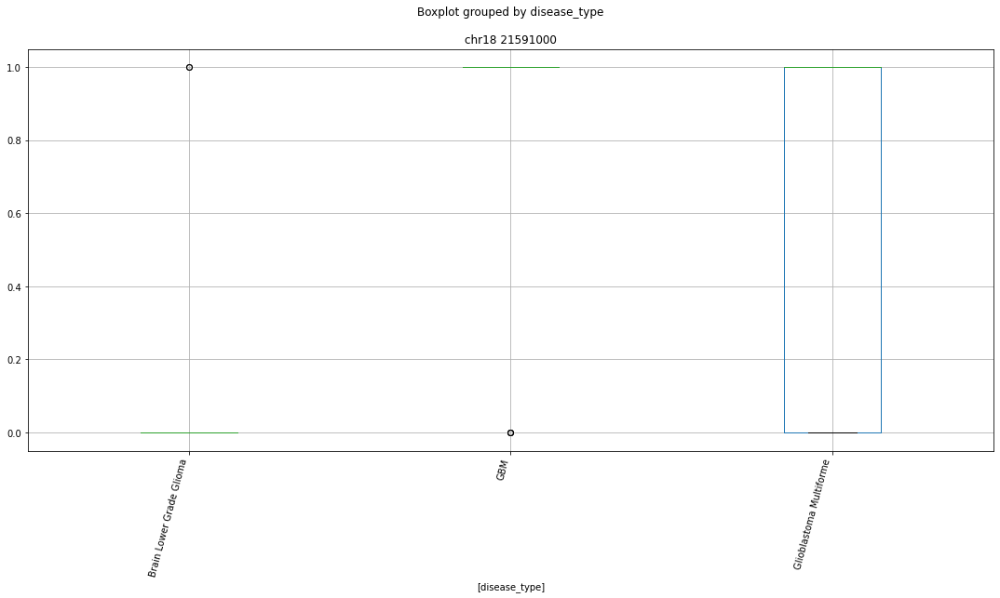

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr4 6978000


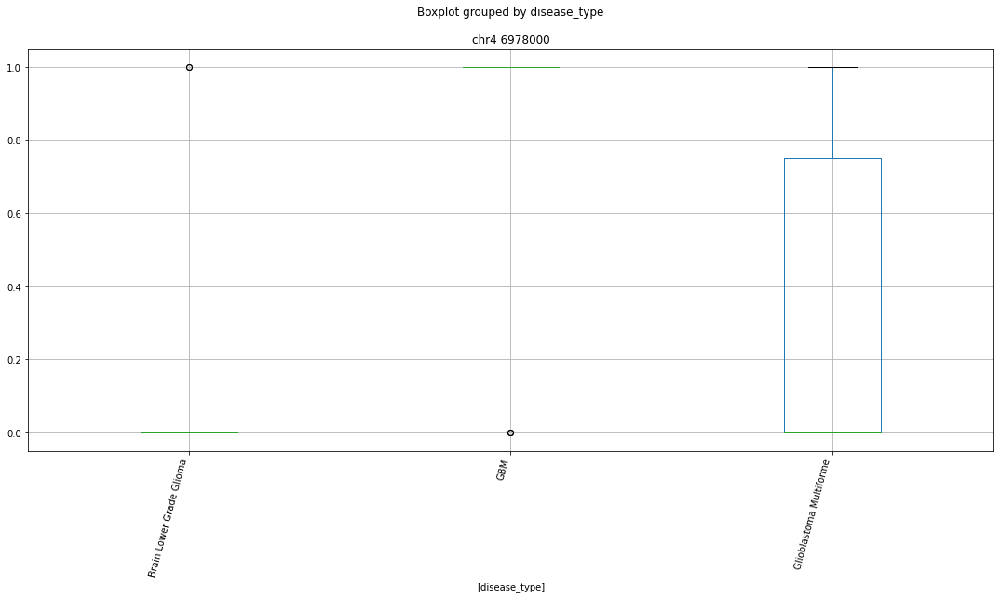

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr8 93832000


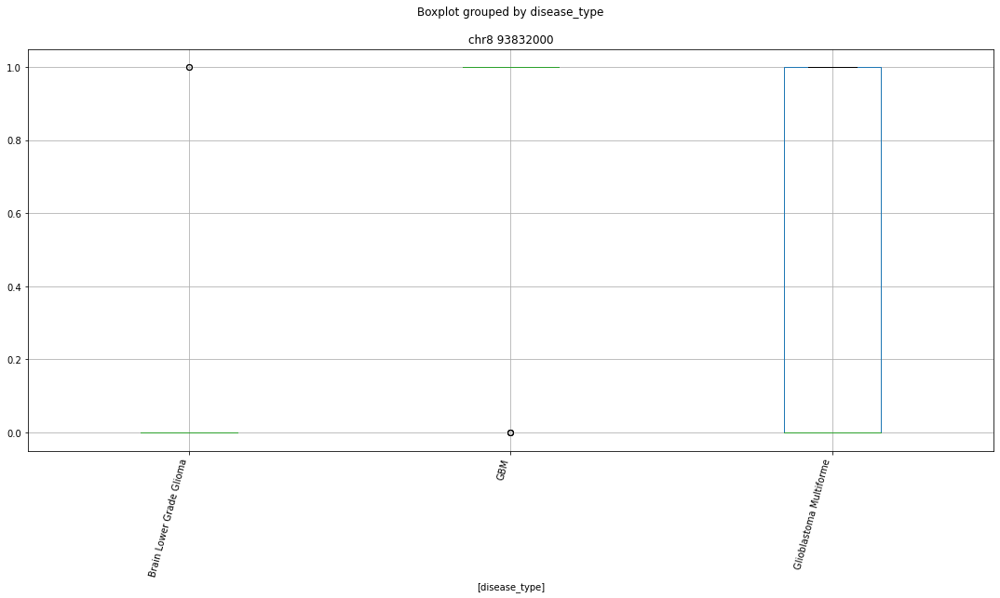

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr19 34921000


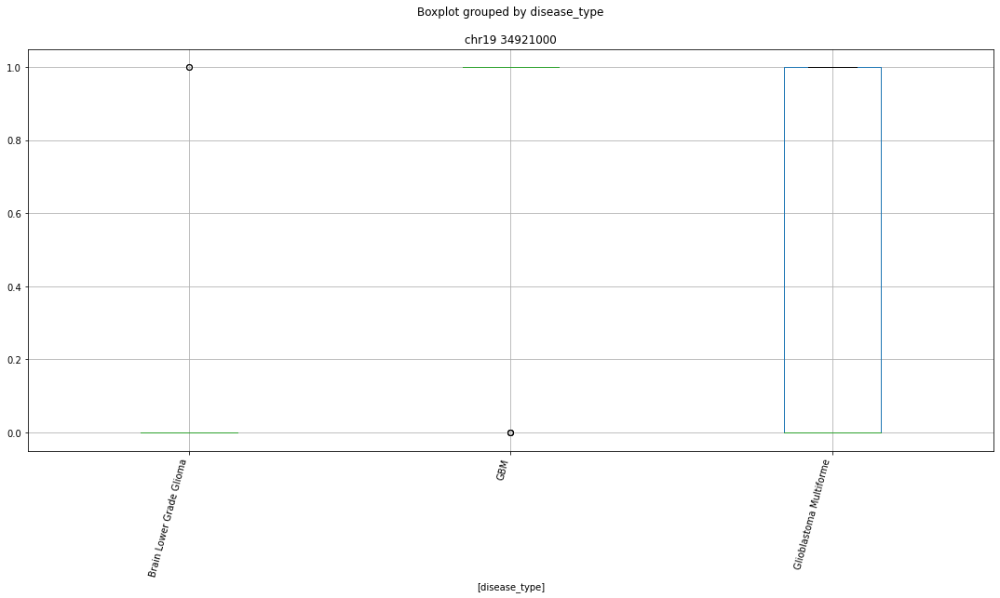

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr1 152255000


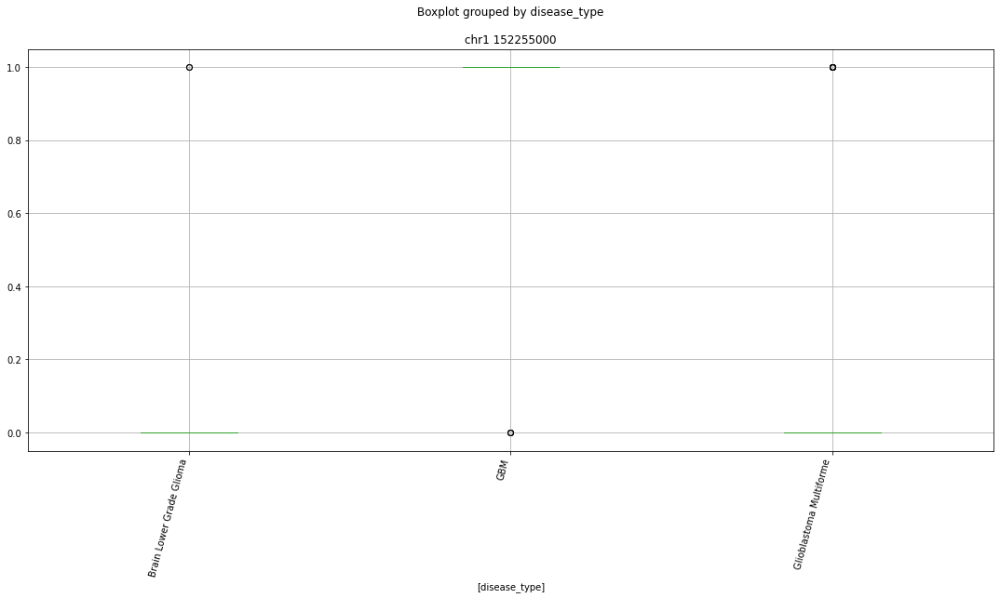

 p : 8.132074367057297e-11  ( t : 8.161442419967855 ) :  chr9 123056000


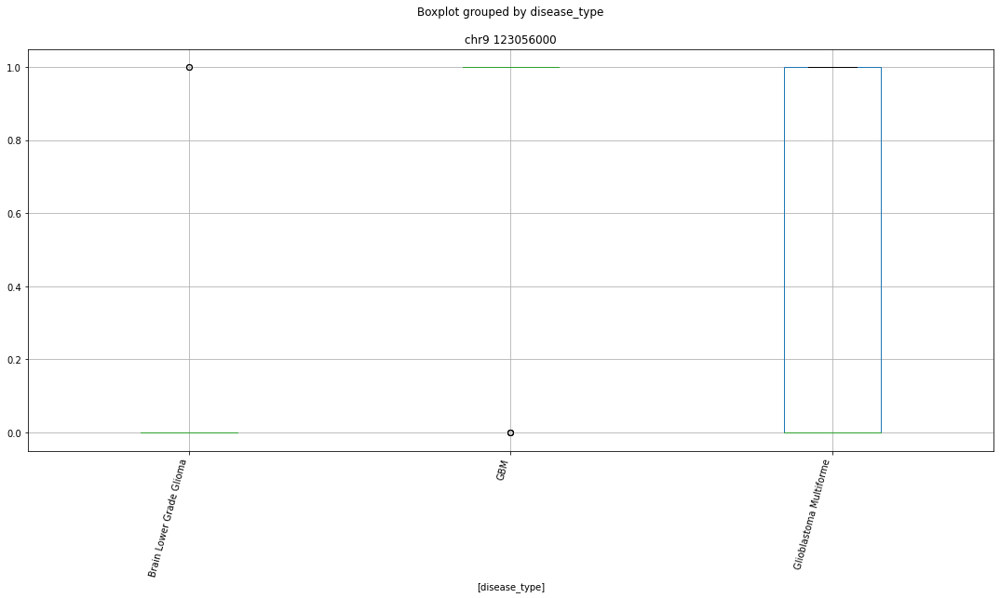

 p : 8.132074367057383e-11  ( t : 8.161442419967852 ) :  chr2 210951000


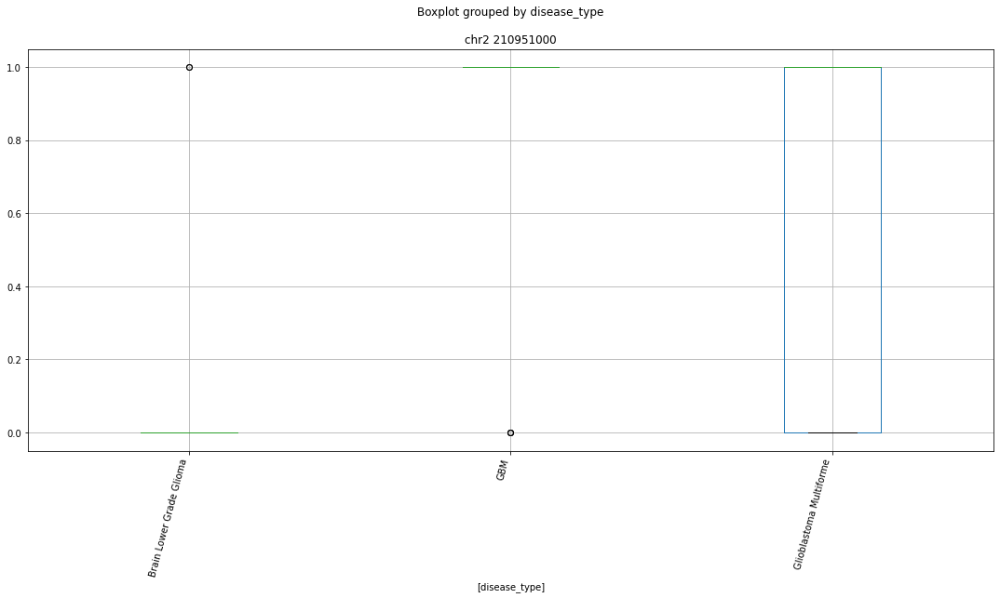

 p : 8.132074367057383e-11  ( t : 8.161442419967852 ) :  chr9 137289000


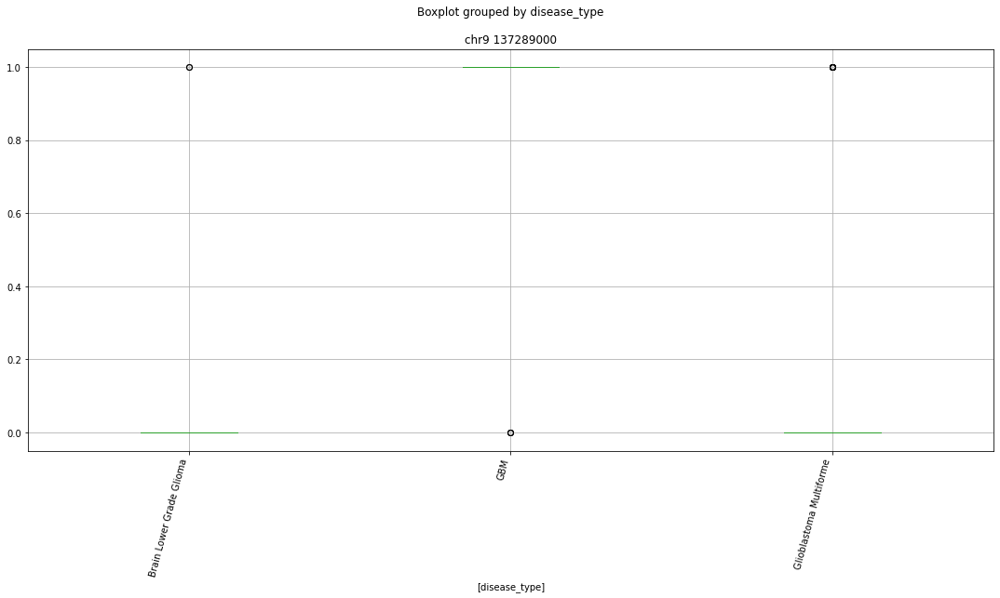

 p : 9.277251739703446e-11  ( t : 7.598297201011695 ) :  chr2 39627000


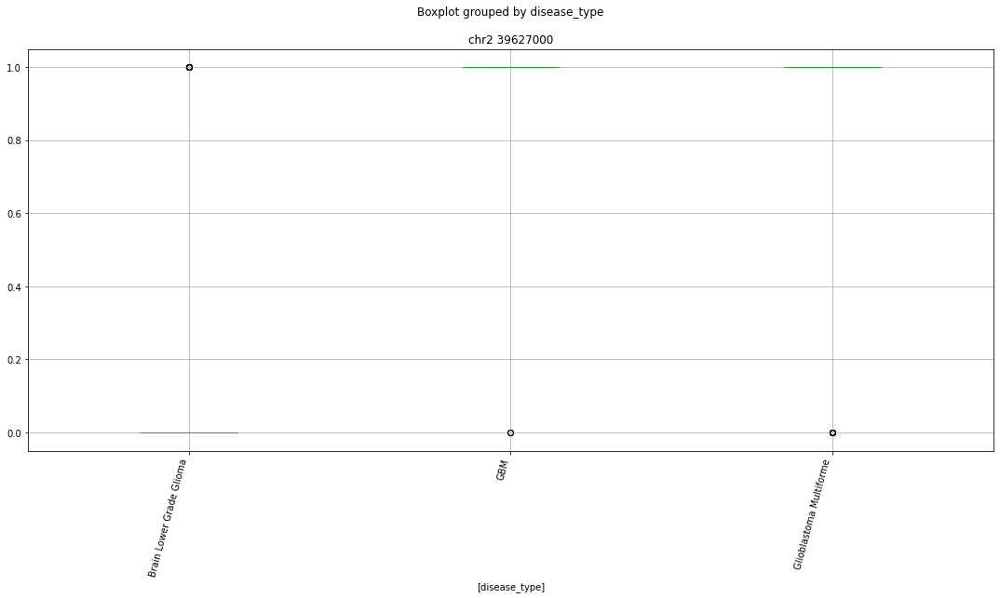

 p : 9.277251739703446e-11  ( t : 7.598297201011695 ) :  chr20 11512000


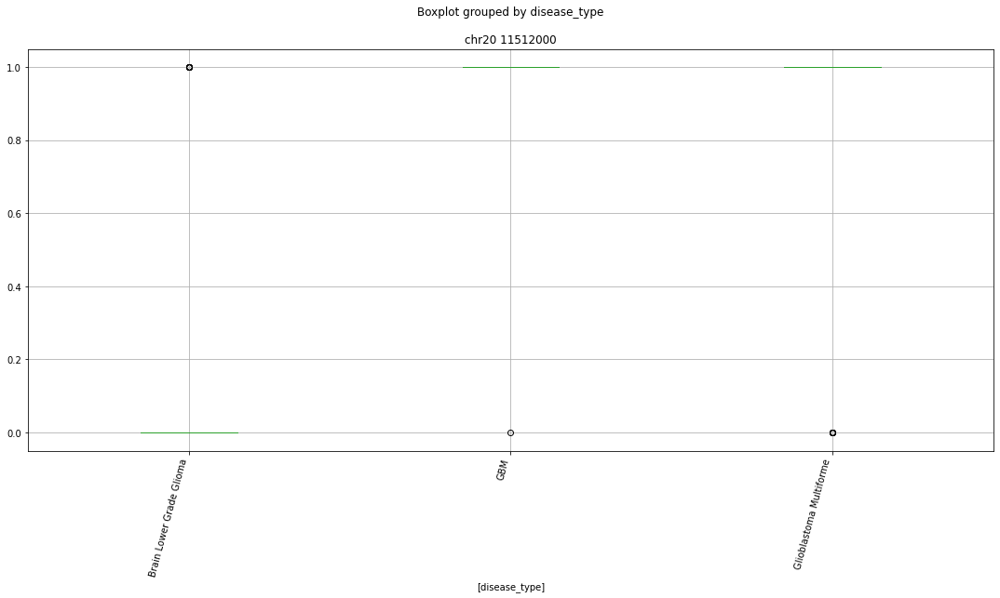

Clustermapping
['chr1 10028000' 'chr1 10029000' 'chr1 10427000' ... 'chrY 8917000'
 'disease_type' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


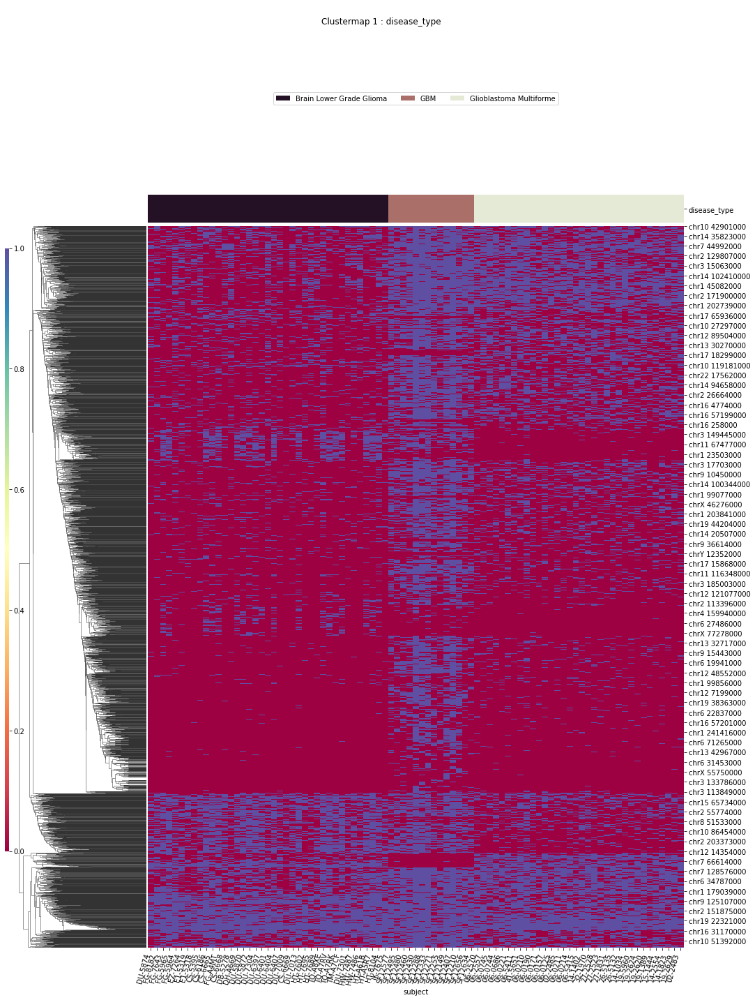

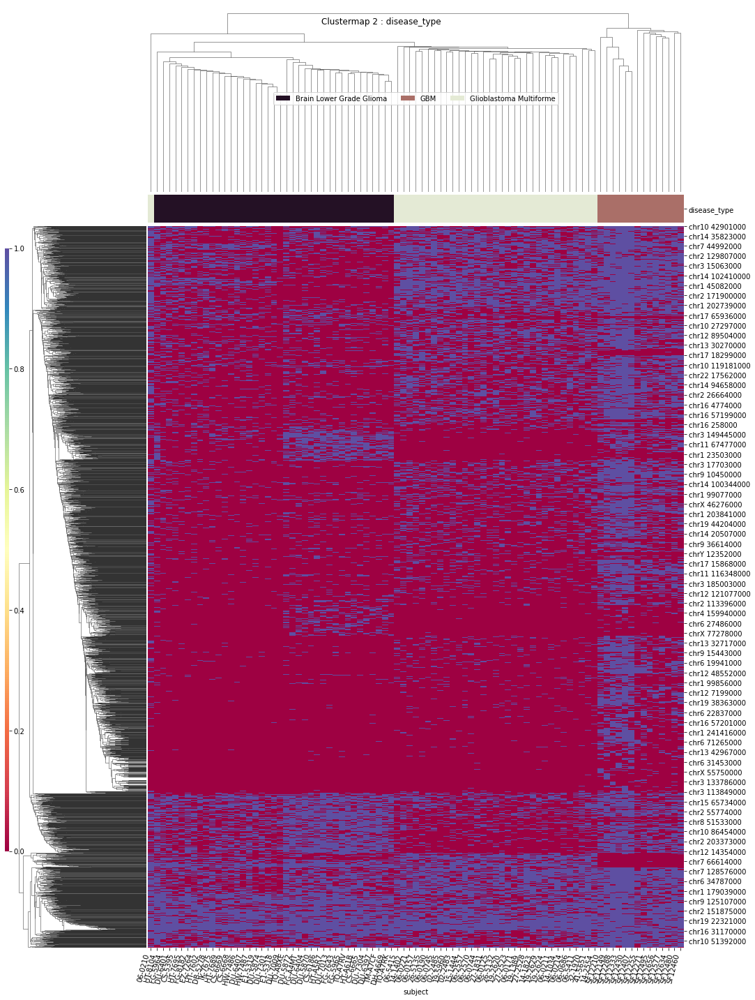

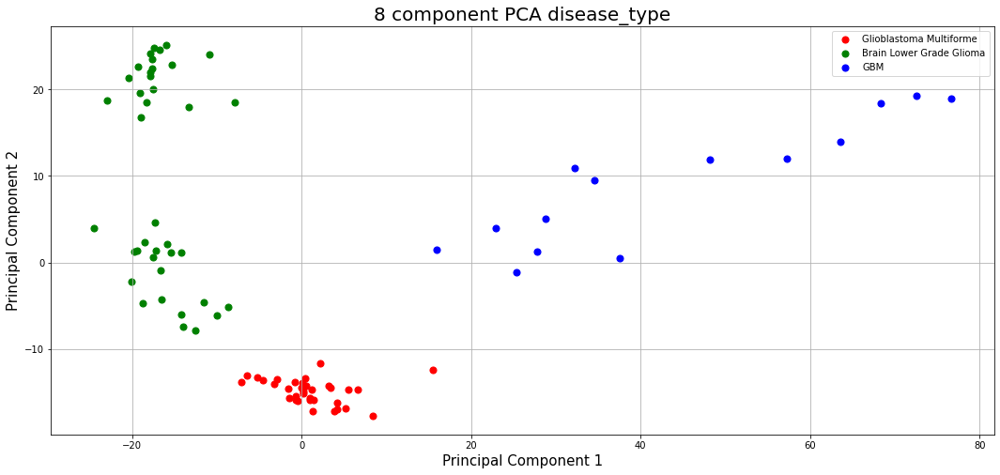

In [146]:
for column in ['disease_type']:
    print(column)
    ttests_boxplots_and_heatmaps(both_binary_df,
        both_binary_df.columns[both_binary_df.columns.str.contains("^chr")],column,box_p=1e-10,heat_p=0.1)
    

In [147]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210610 12:17:05'

disease_type
T-Testing
Boxplotting
 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr17 27034000


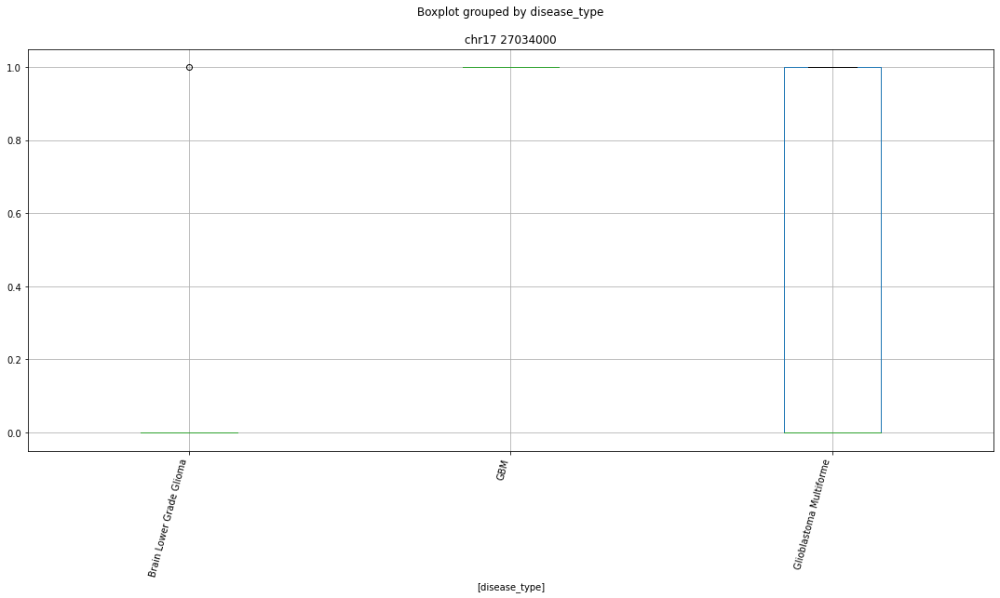

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr12 68484000


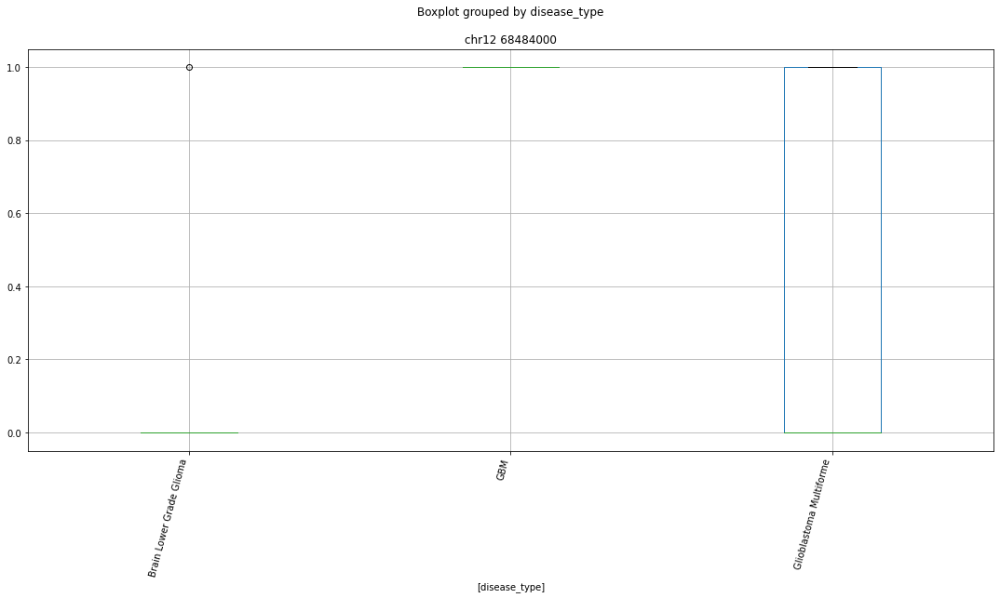

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr11 3398000


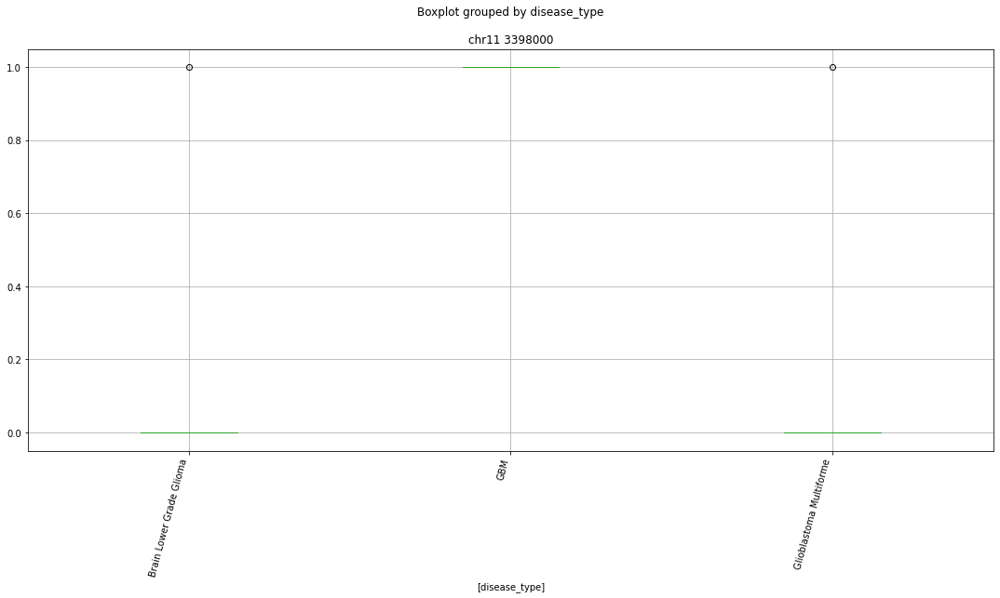

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr1 212780000


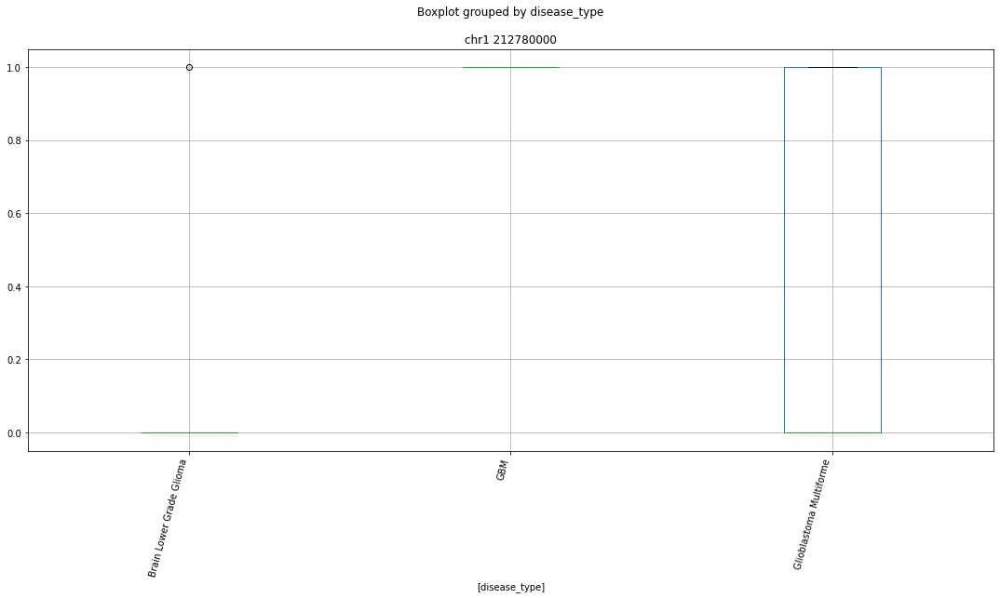

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr6 31933000


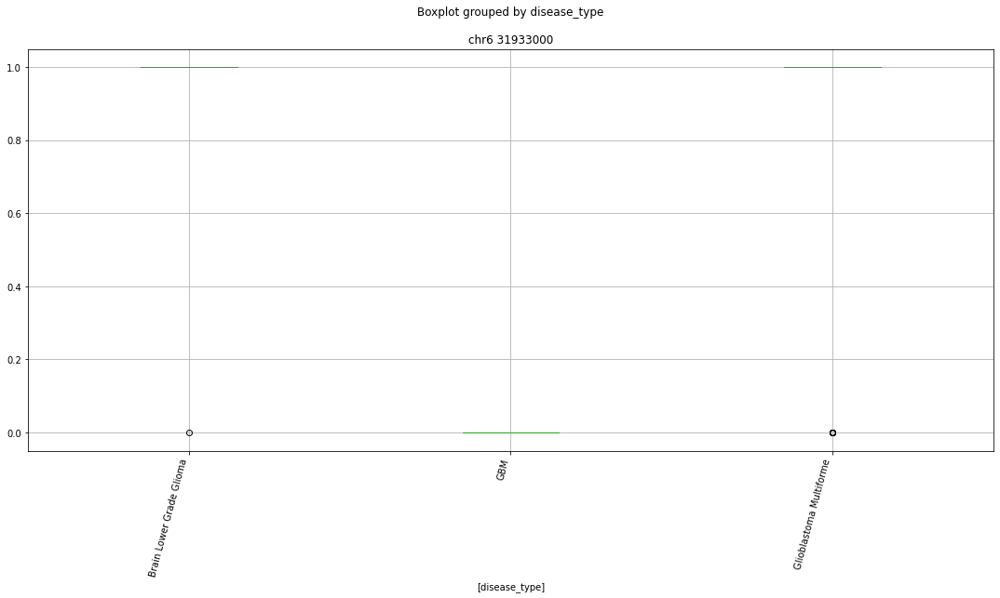

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr5 65941000


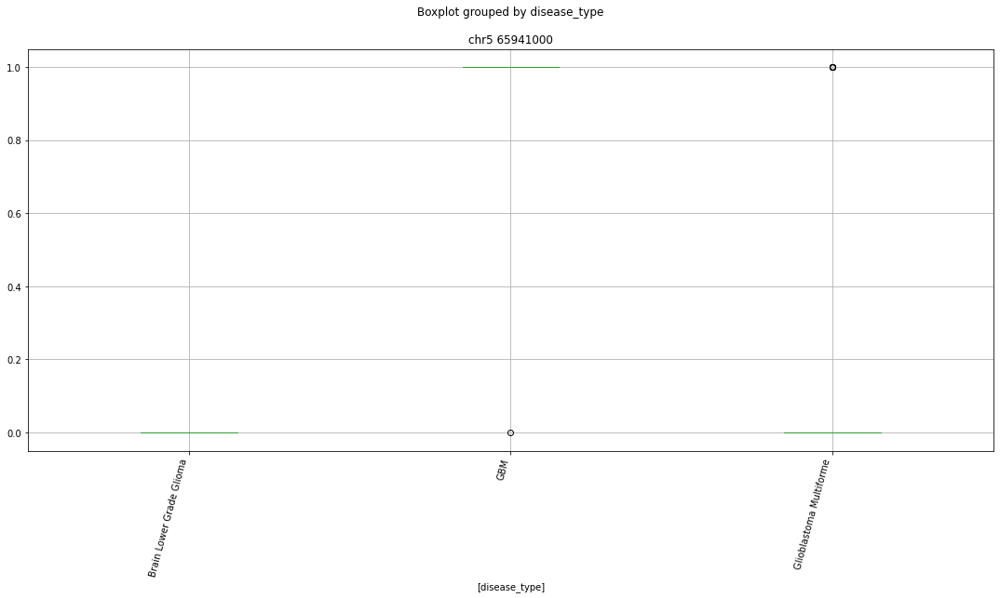

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr4 37670000


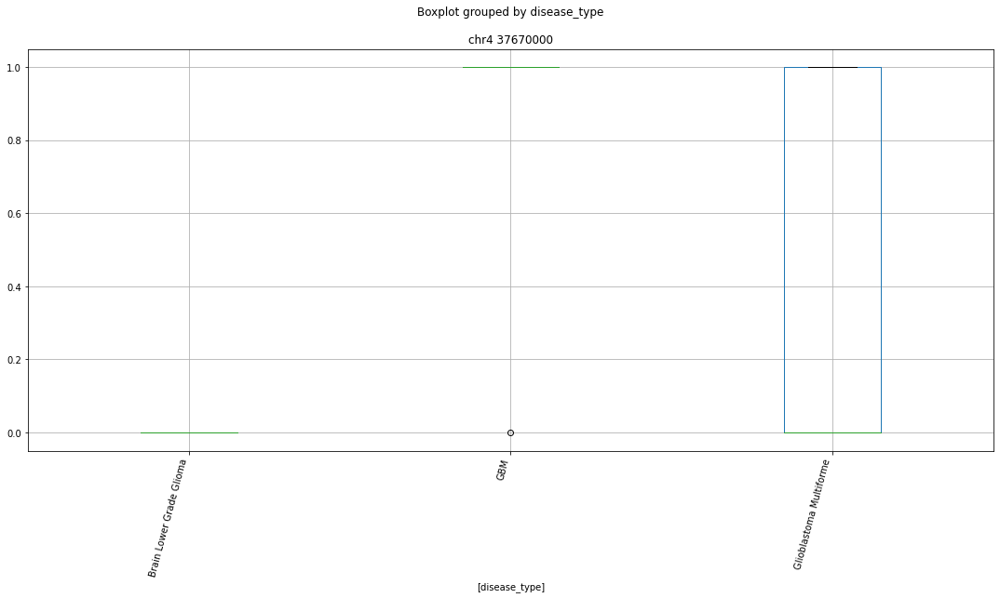

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr10 70686000


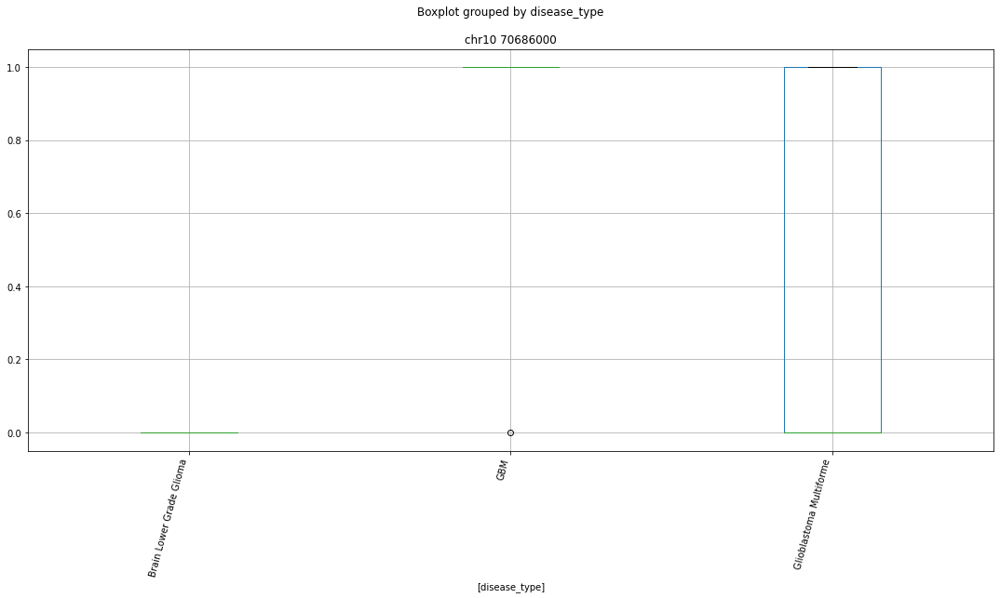

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr7 101093000


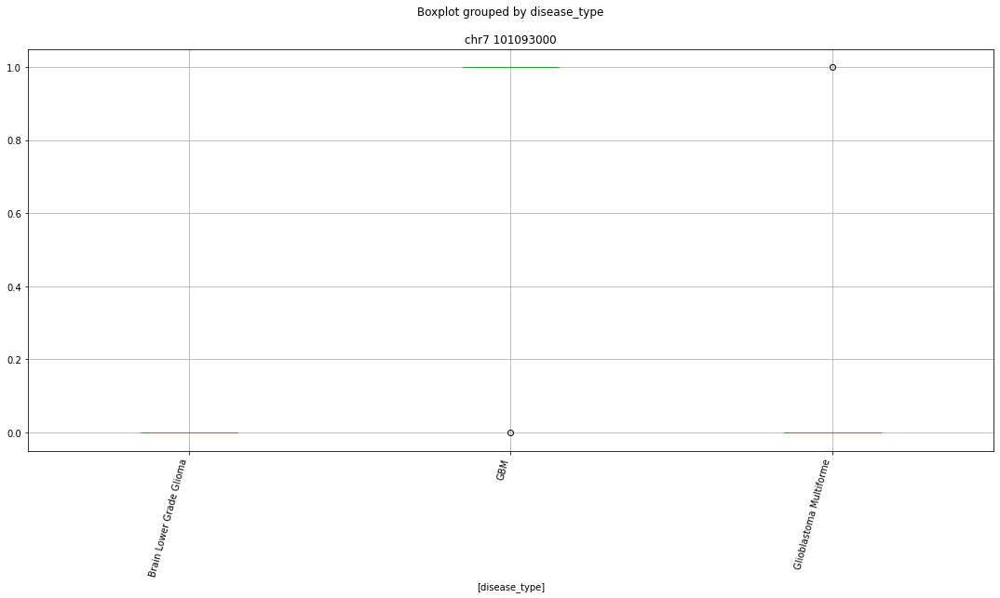

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr1 25604000


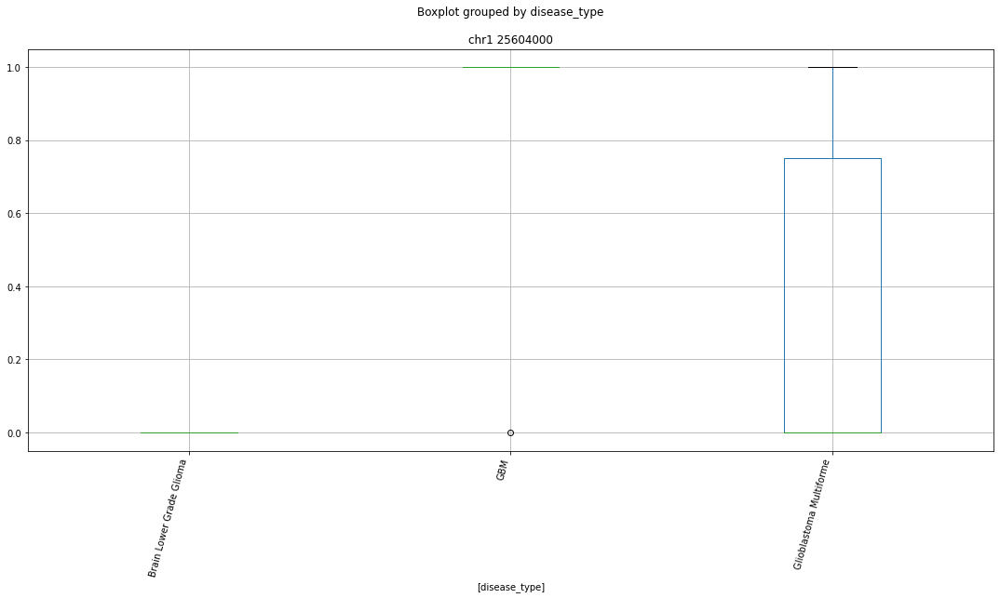

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr18 76001000


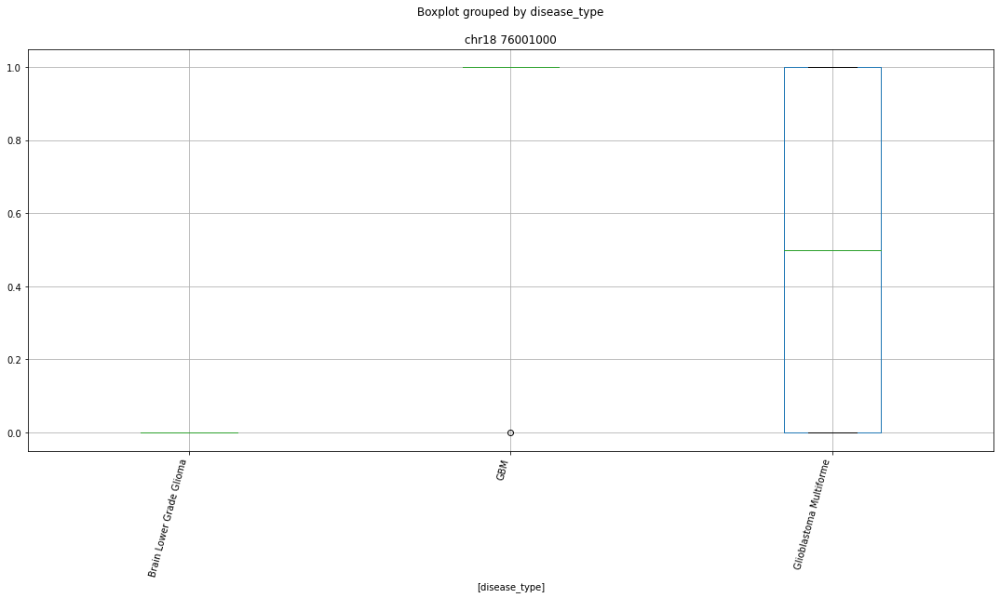

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr19 23532000


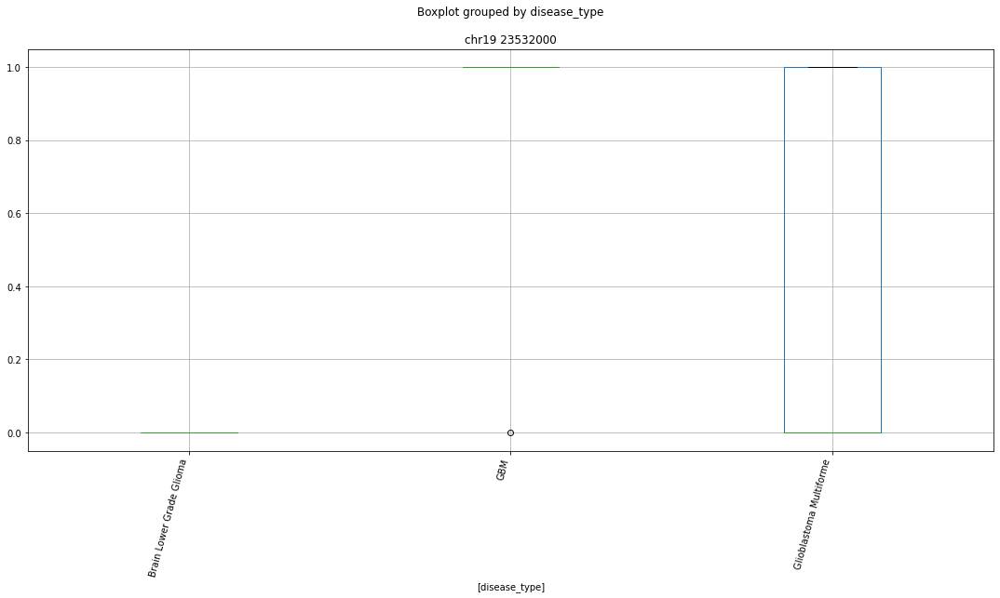

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr11 6690000


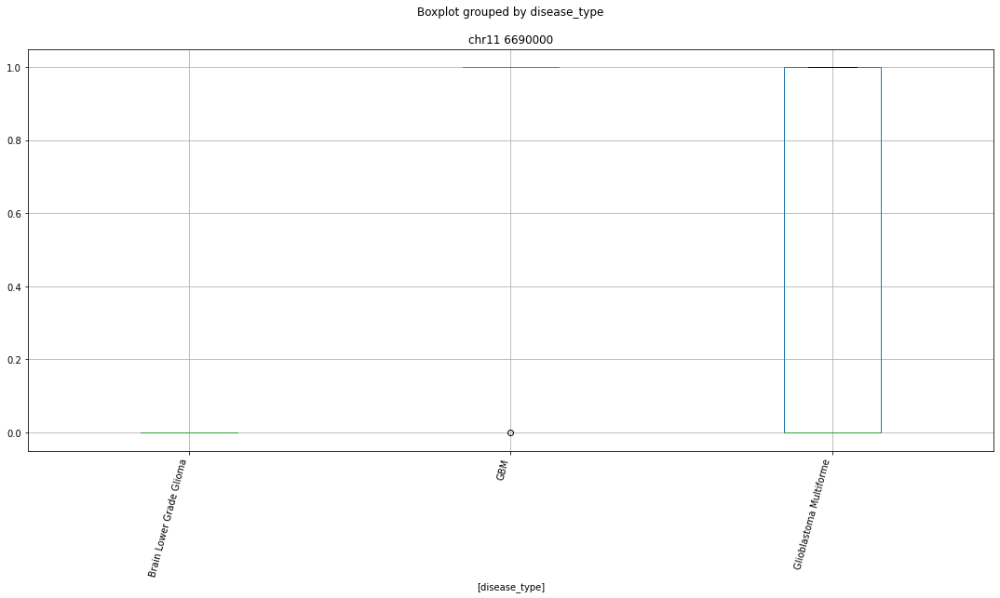

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr11 3398000


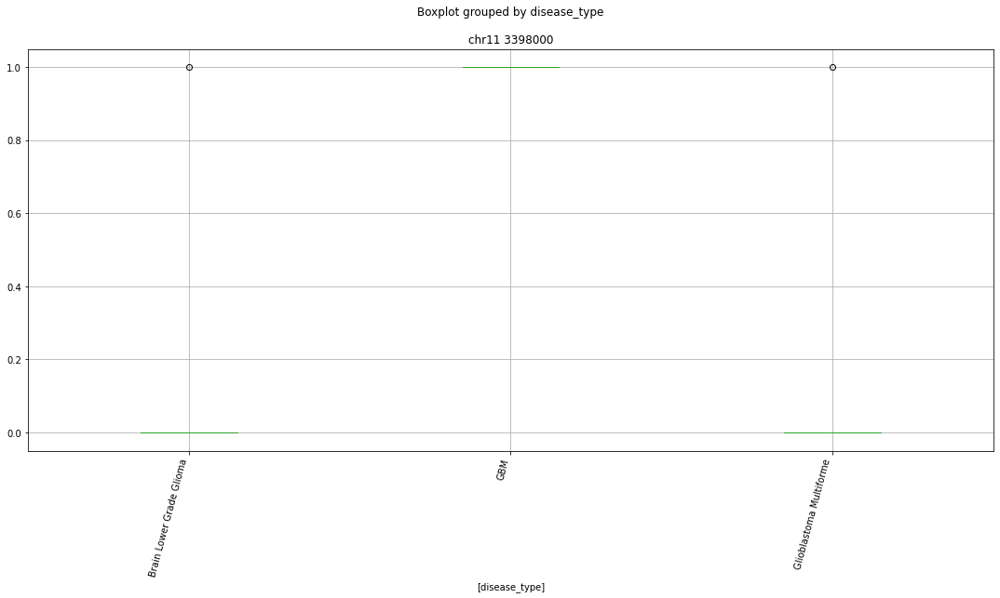

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr17 46283000


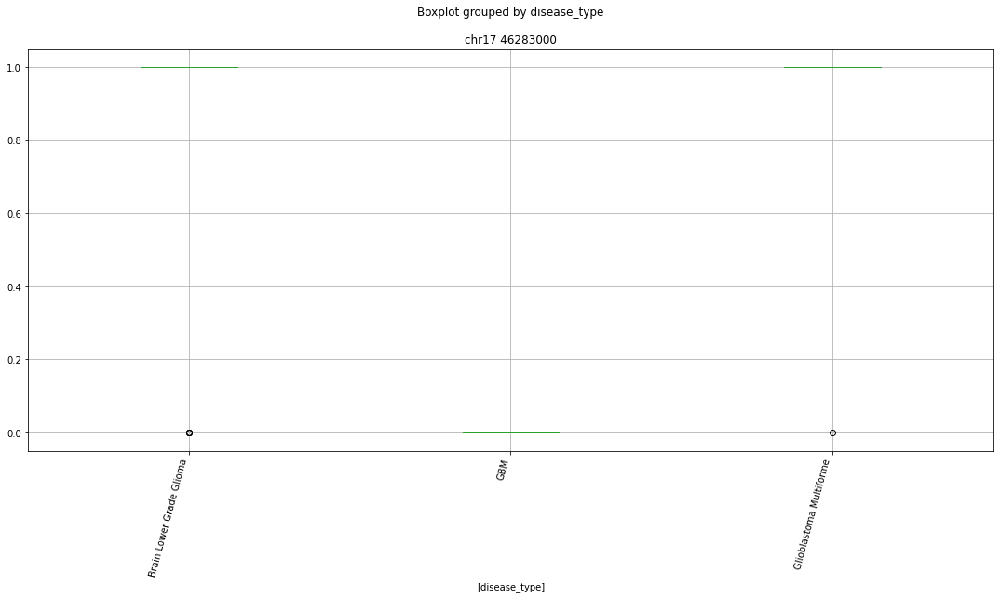

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr19 39959000


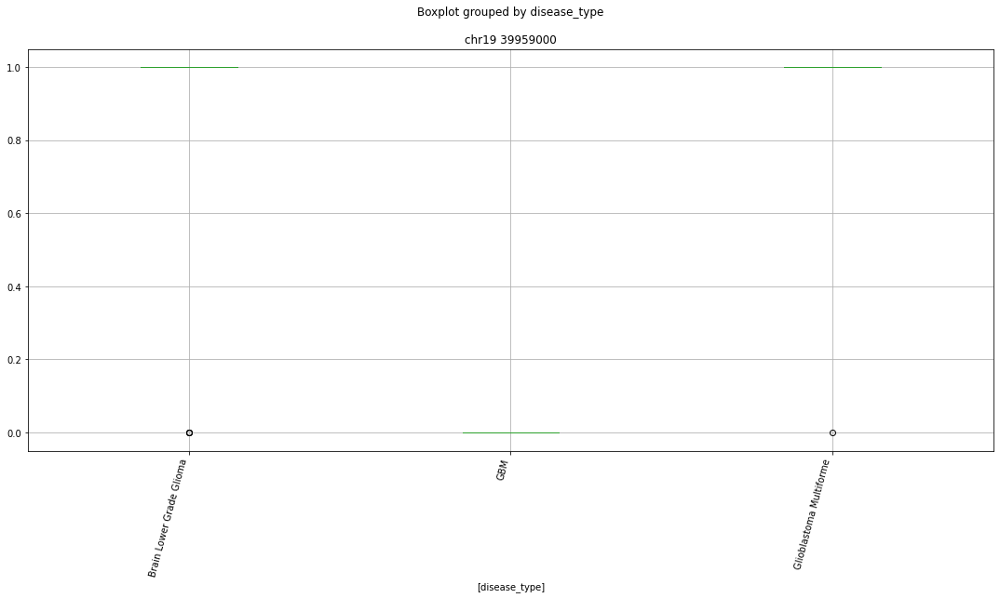

 p : 7.649785019548989e-25  ( t : 20.581140234042756 ) :  chr3 61672000


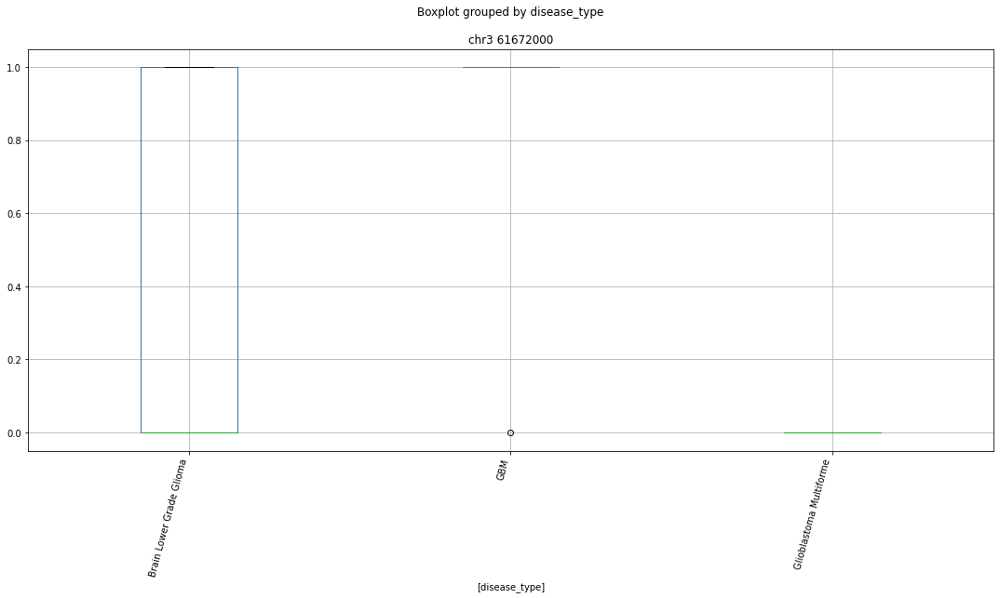

 p : 7.649785019548989e-25  ( t : 20.581140234042756 ) :  chr2 38756000


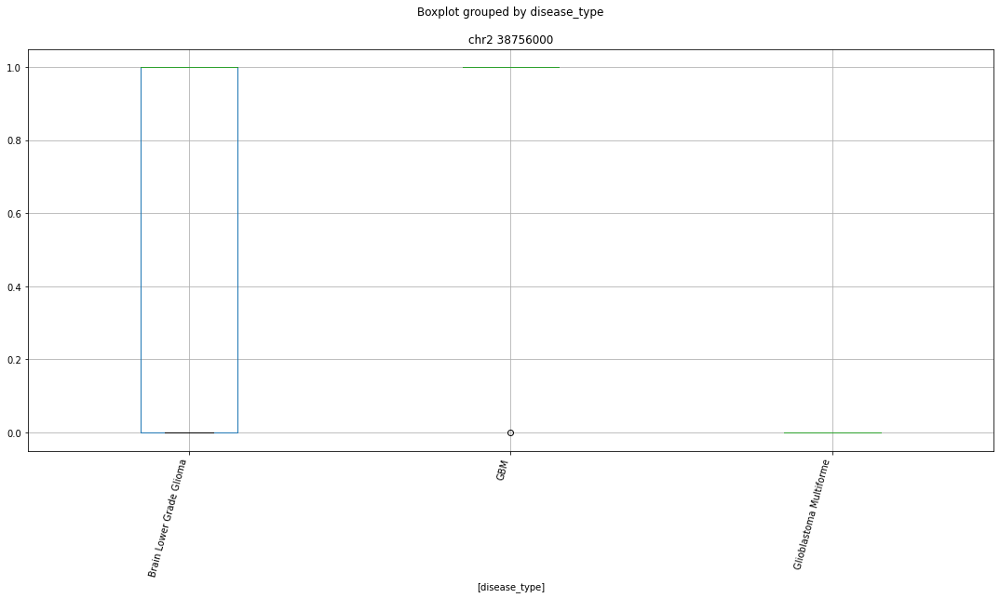

 p : 2.8371647709053813e-21  ( t : 15.78690644471993 ) :  chr15 45292000


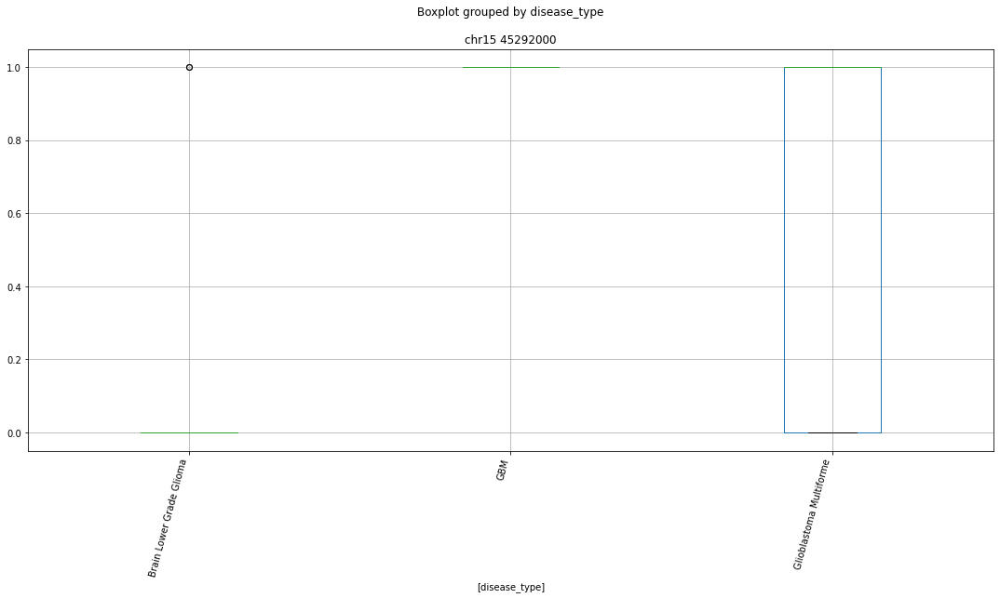

 p : 2.887102389033911e-21  ( t : 13.486167444043069 ) :  chr11 61167000


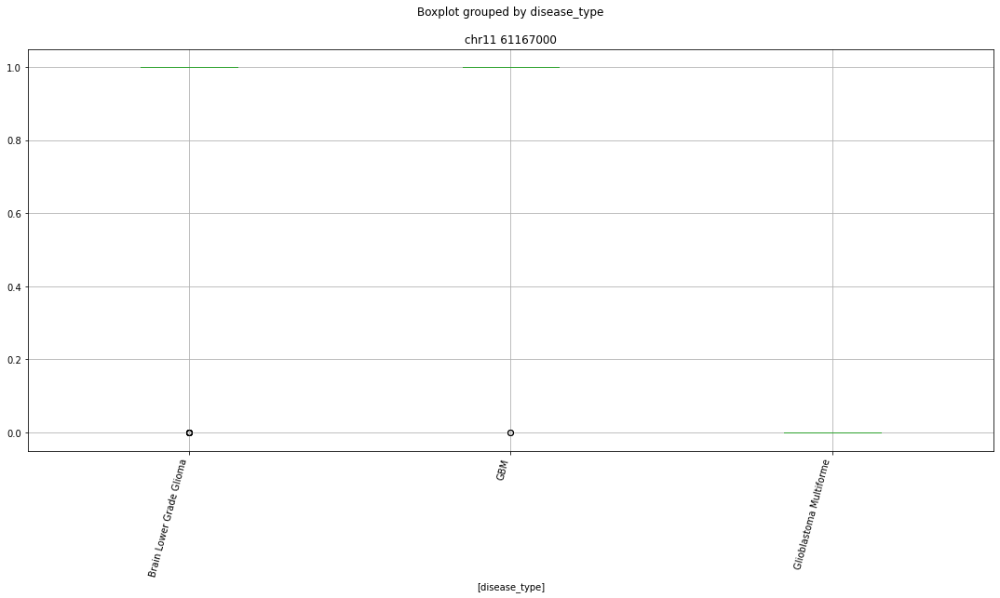

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr2 27556000


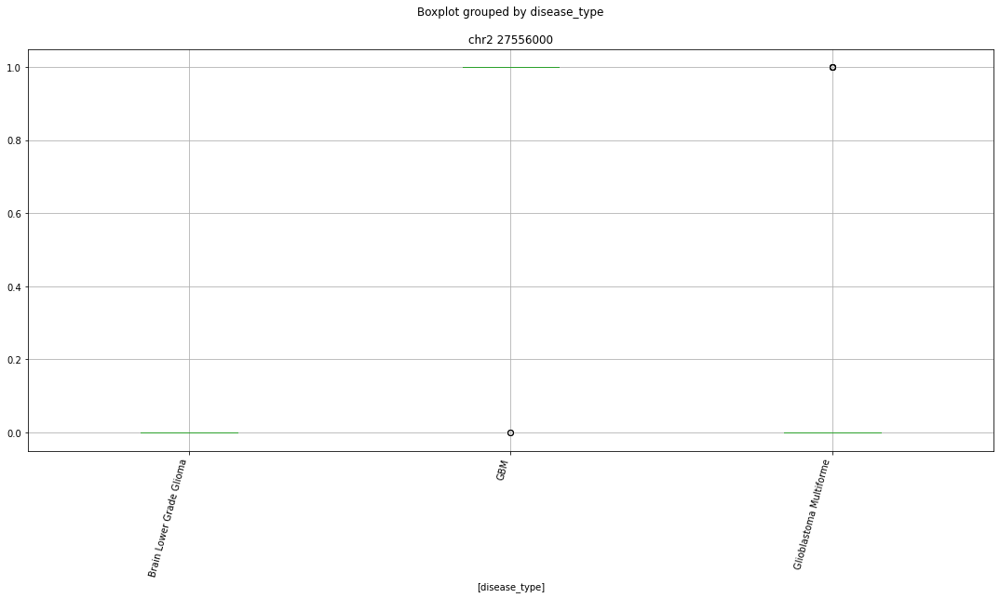

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr8 141201000


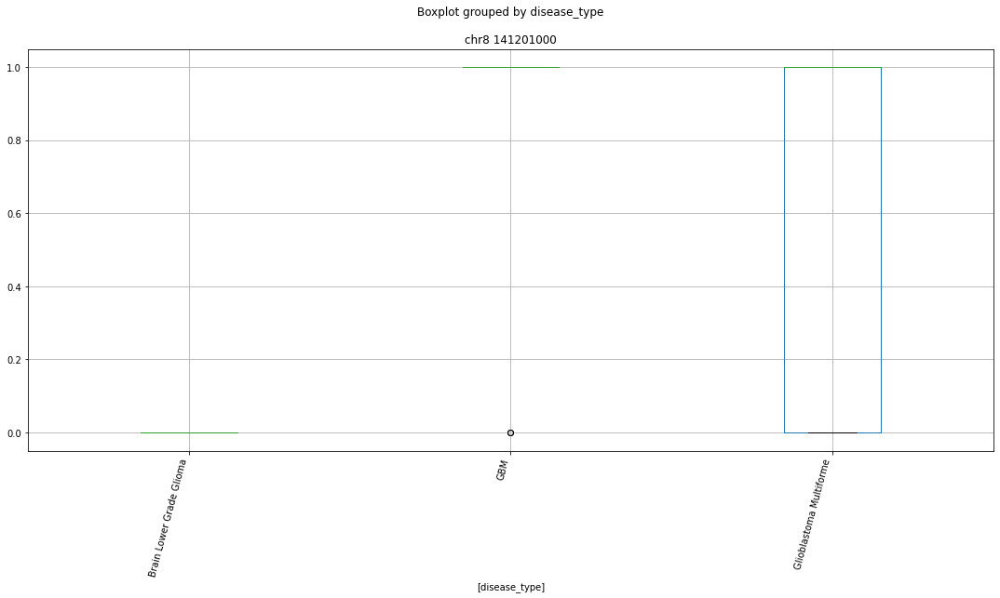

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr1 109176000


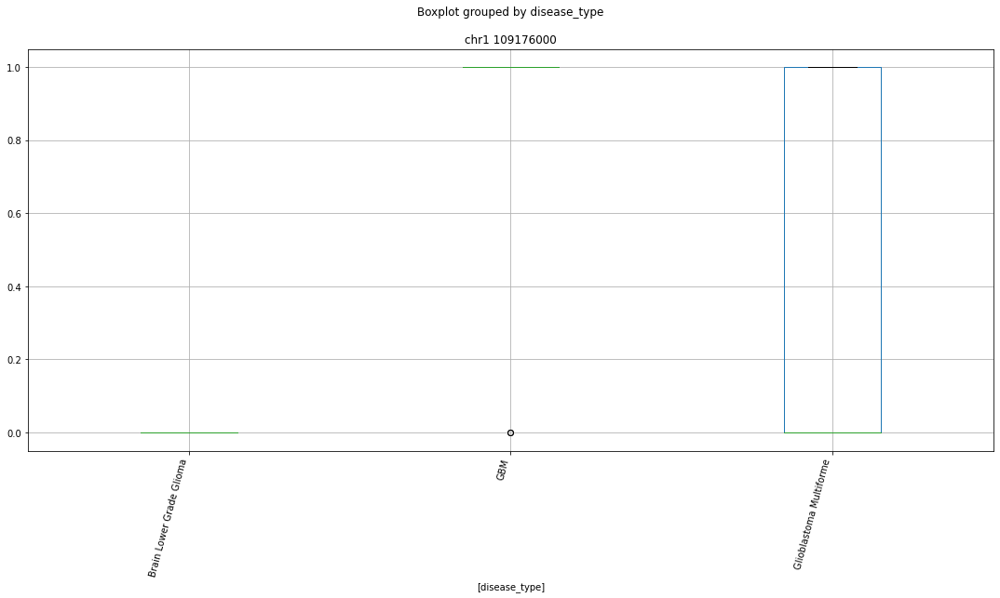

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr2 202714000


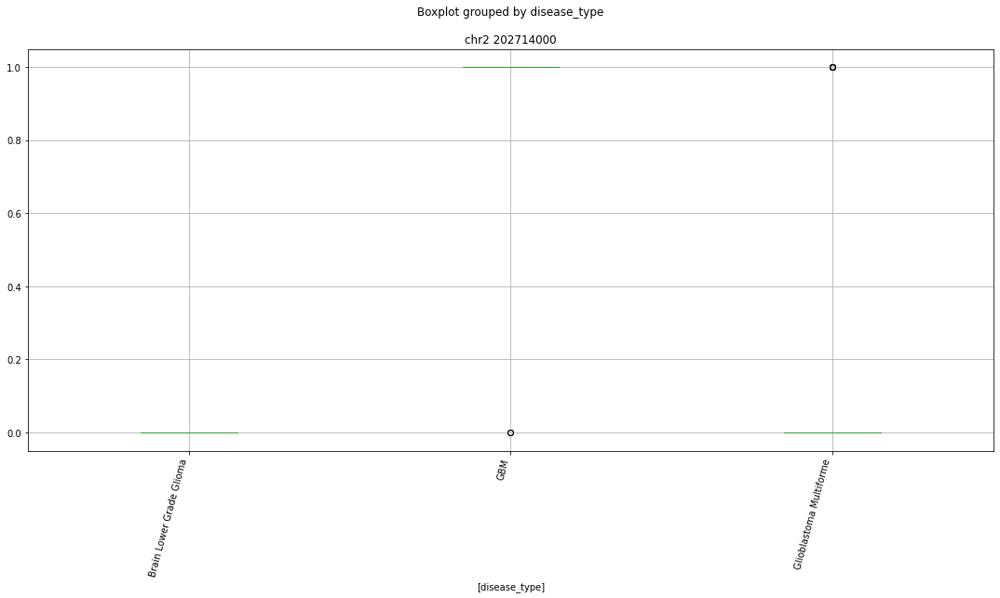

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr4 6836000


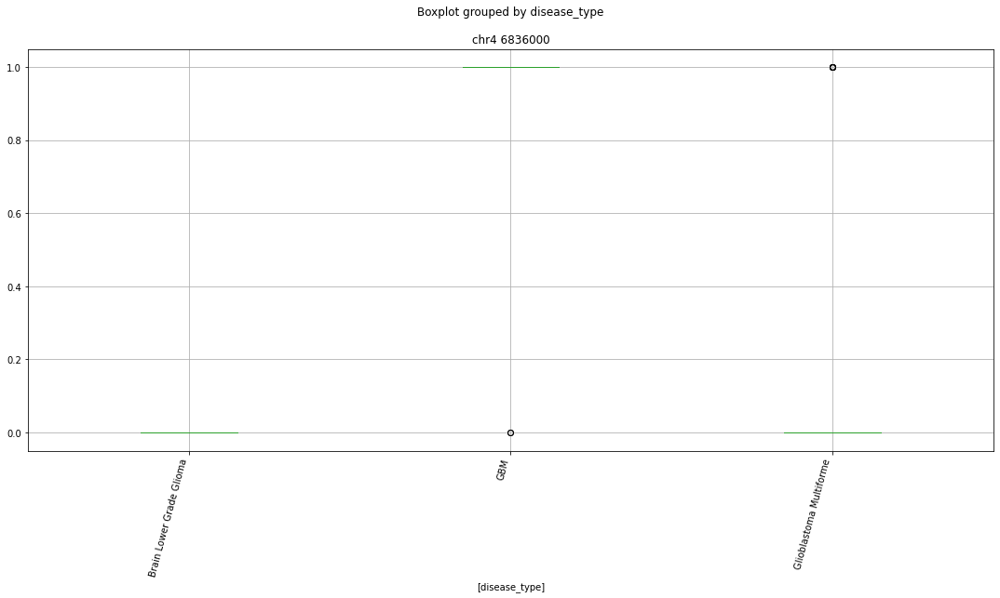

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr12 73853000


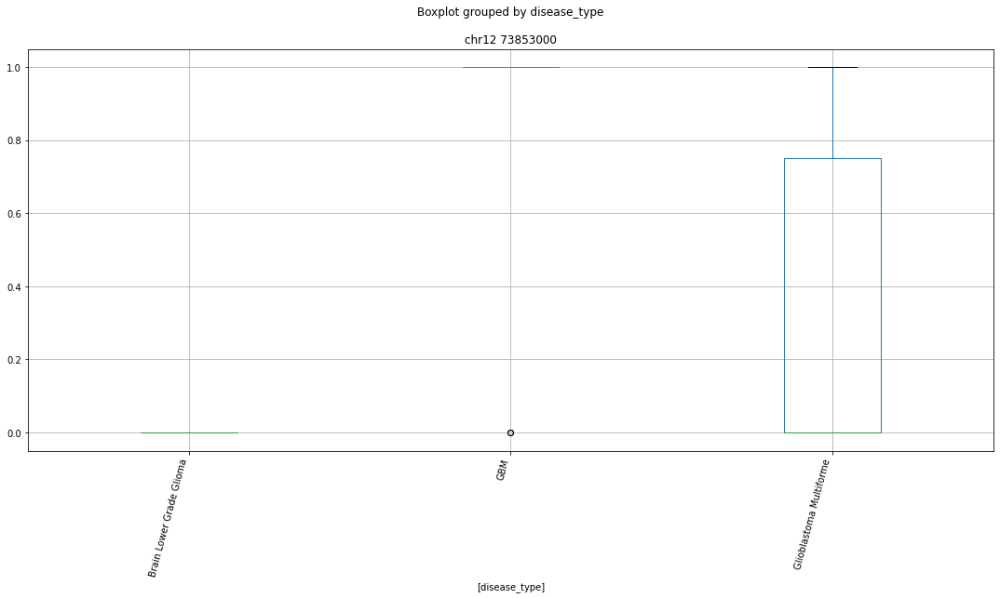

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr12 48915000


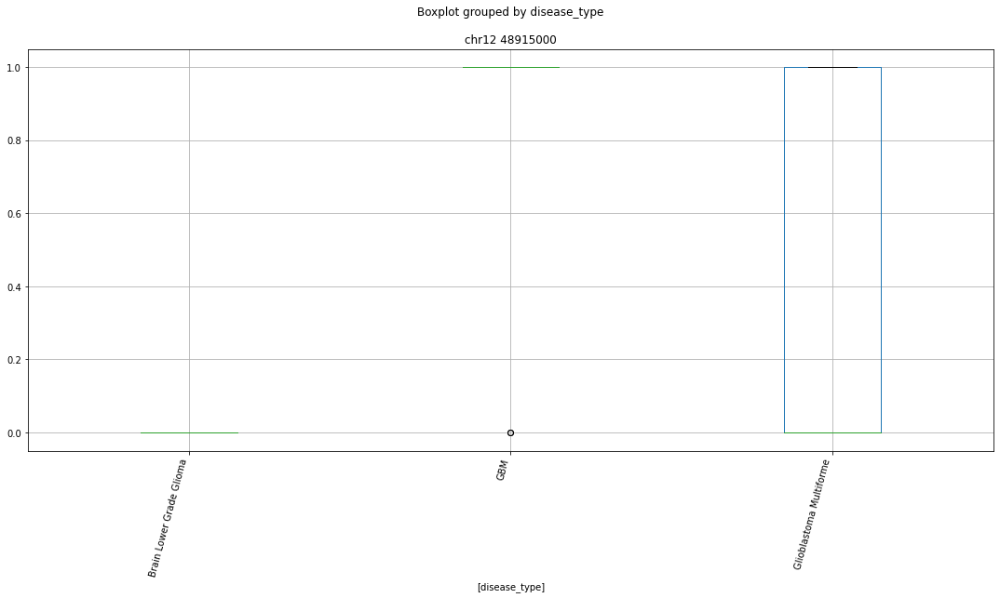

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr4 151732000


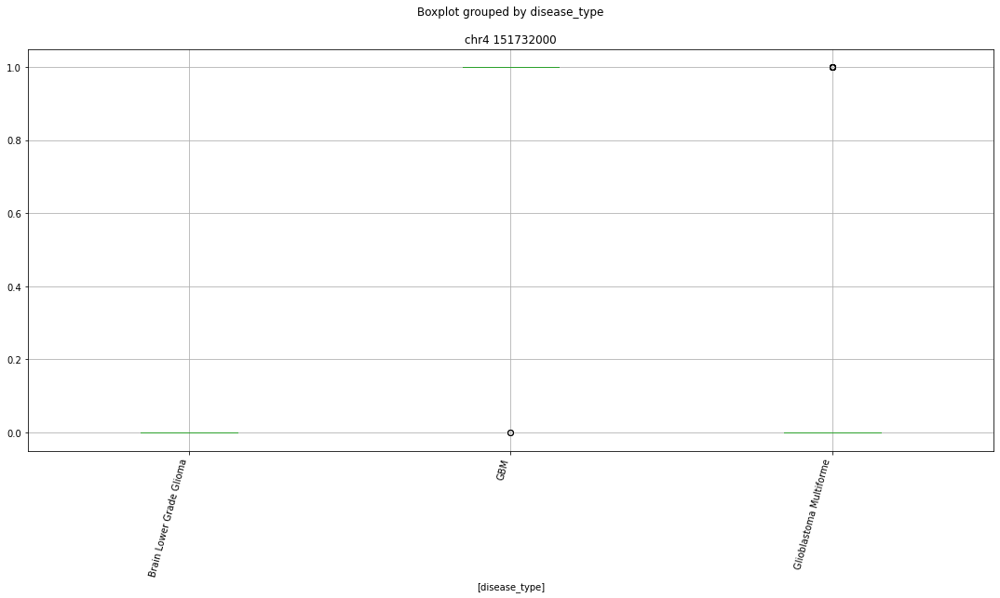

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr8 116680000


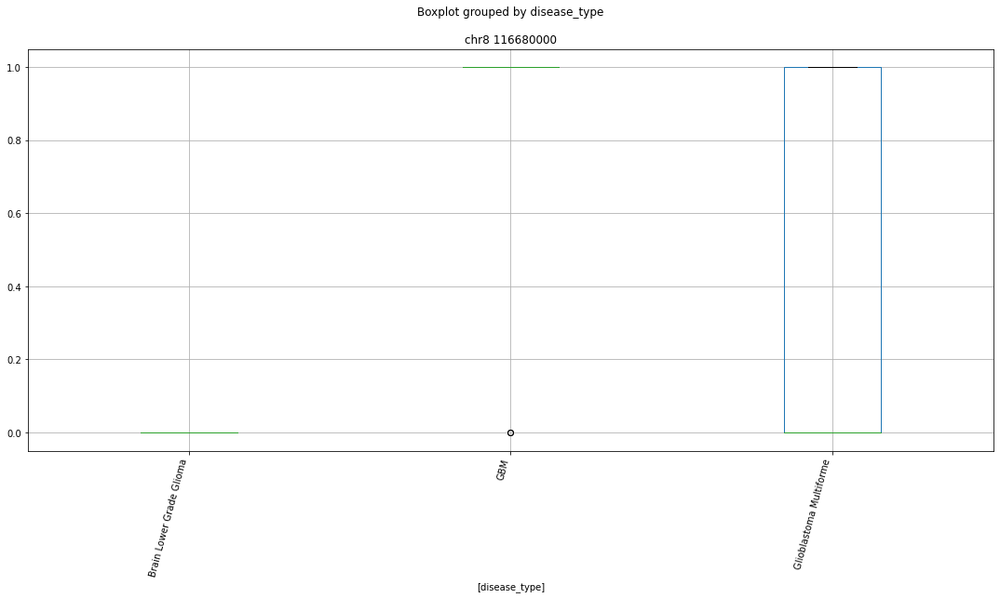

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr15 72102000


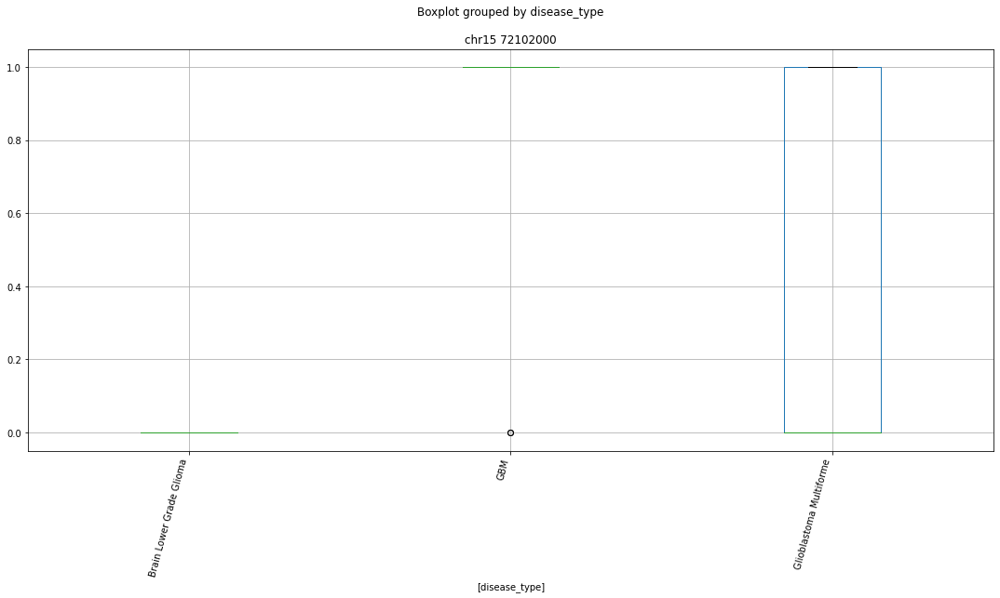

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr20 45645000


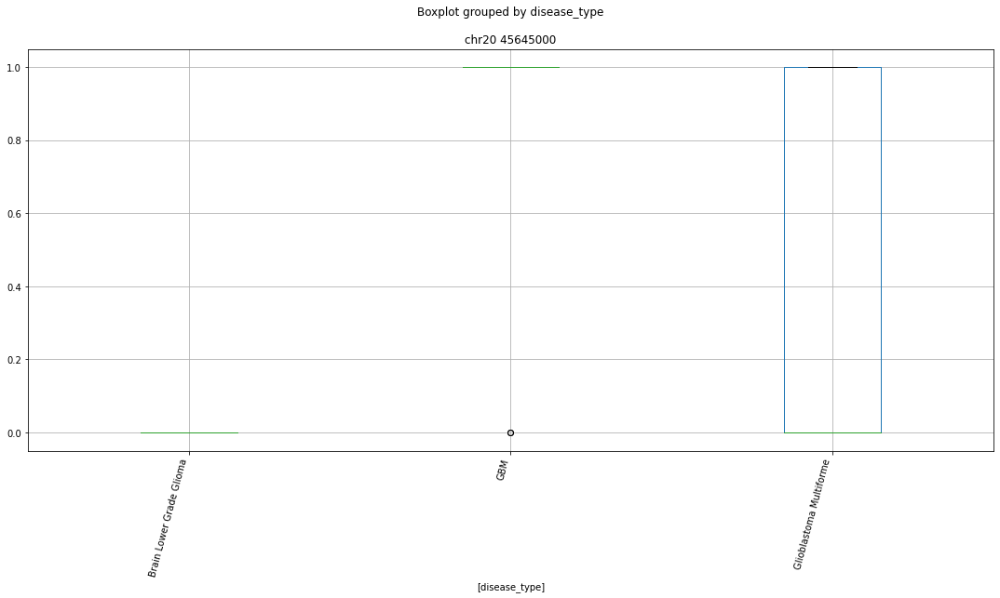

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr8 5726000


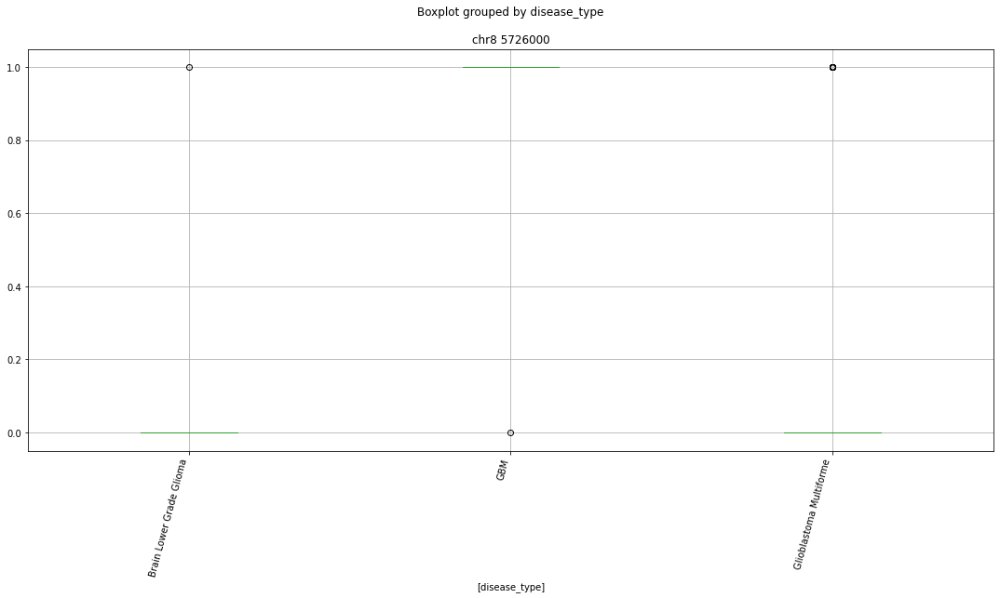

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr3 50310000


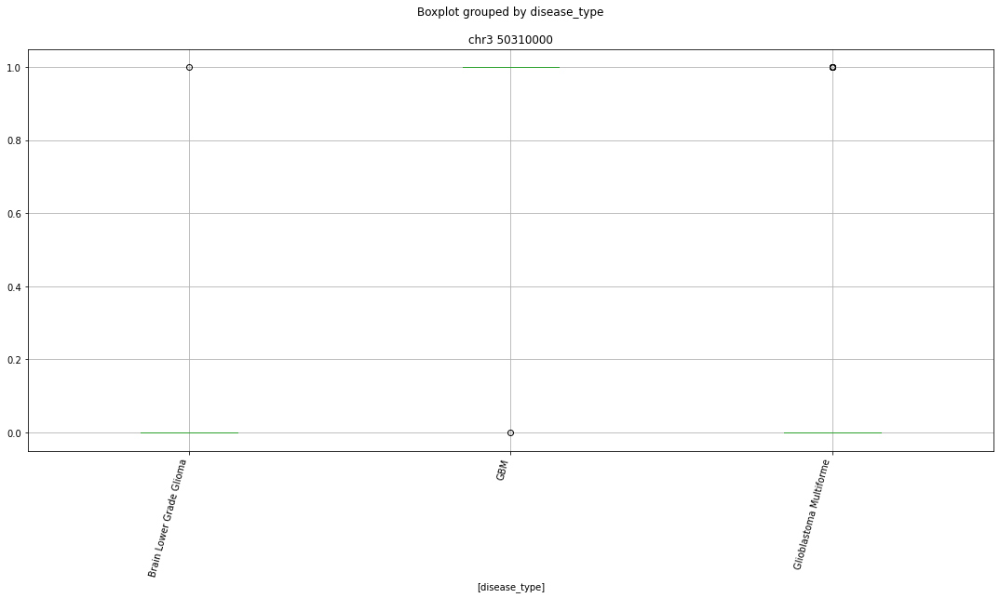

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr10 28934000


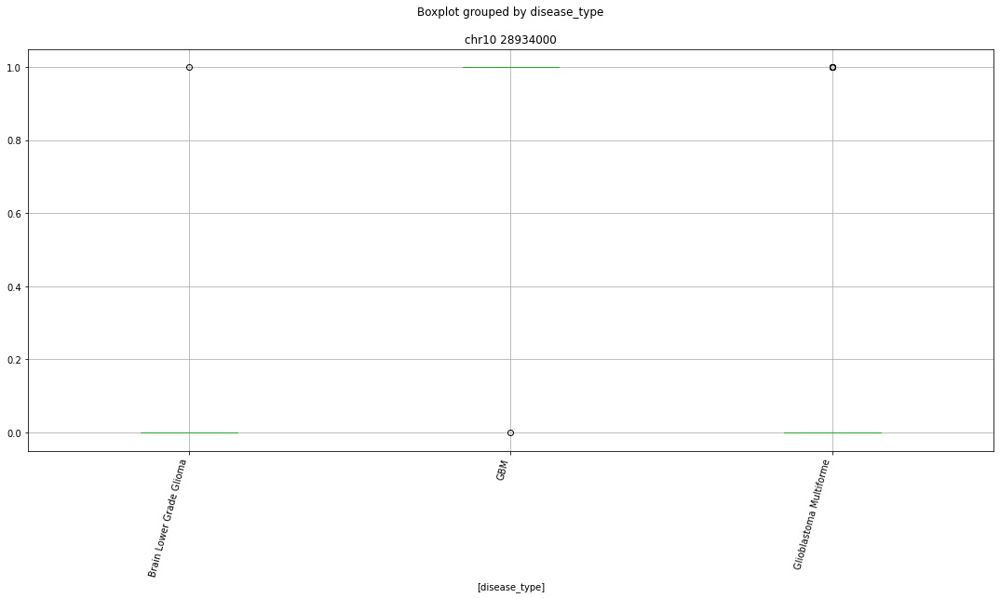

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr15 52286000


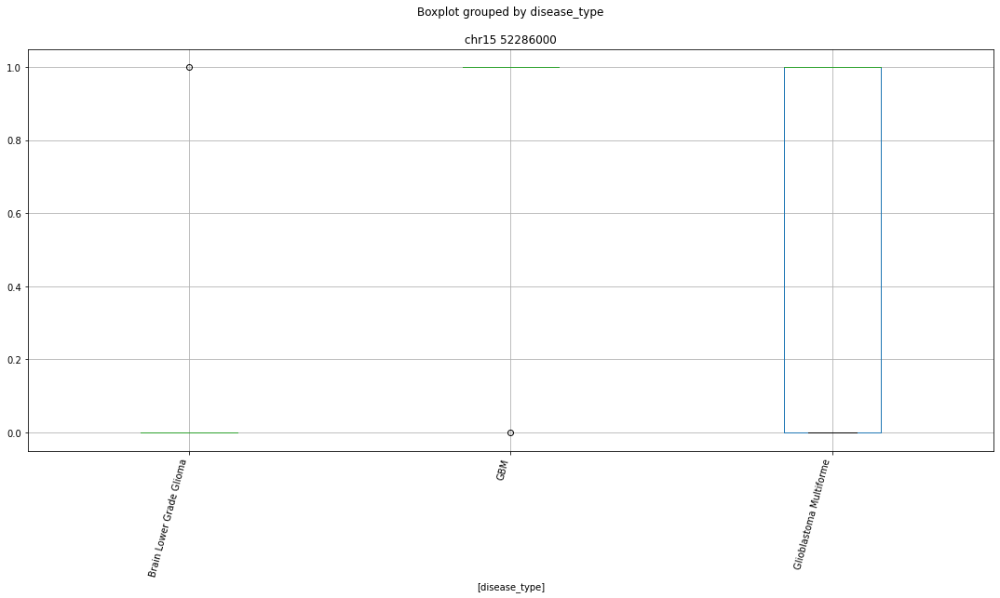

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr3 196974000


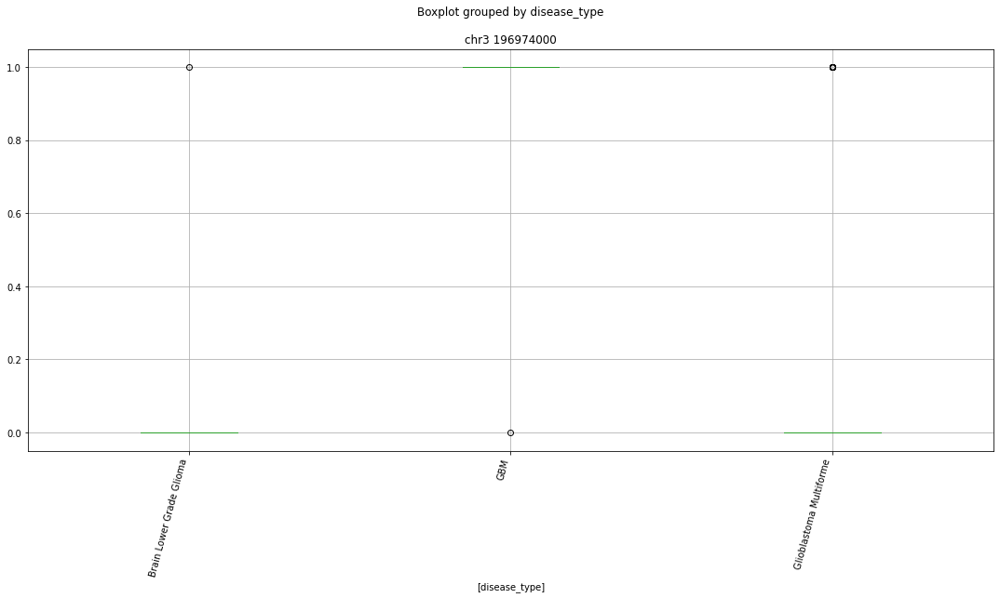

 p : 6.052106007130182e-19  ( t : 14.651507317223937 ) :  chr1 108518000


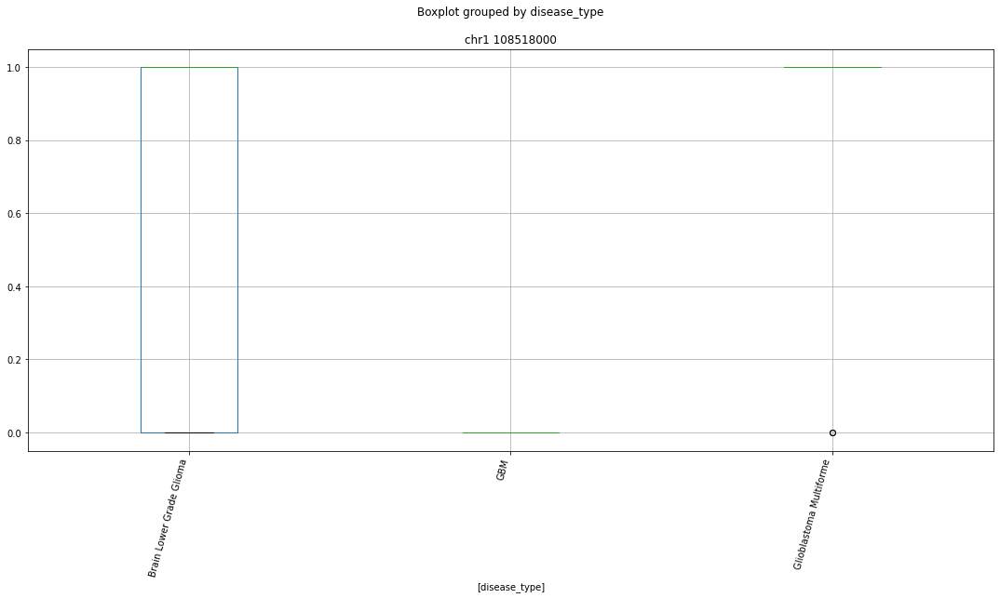

 p : 3.5344159057936754e-18  ( t : 13.982131454109561 ) :  chr11 61167000


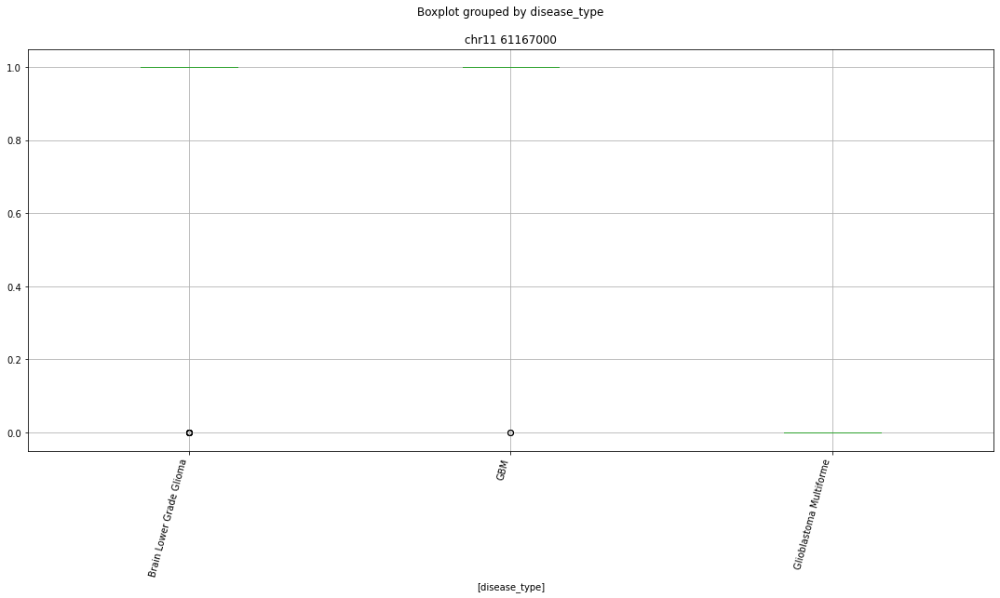

 p : 4.006343388130227e-18  ( t : 13.935349037694028 ) :  chr7 101093000


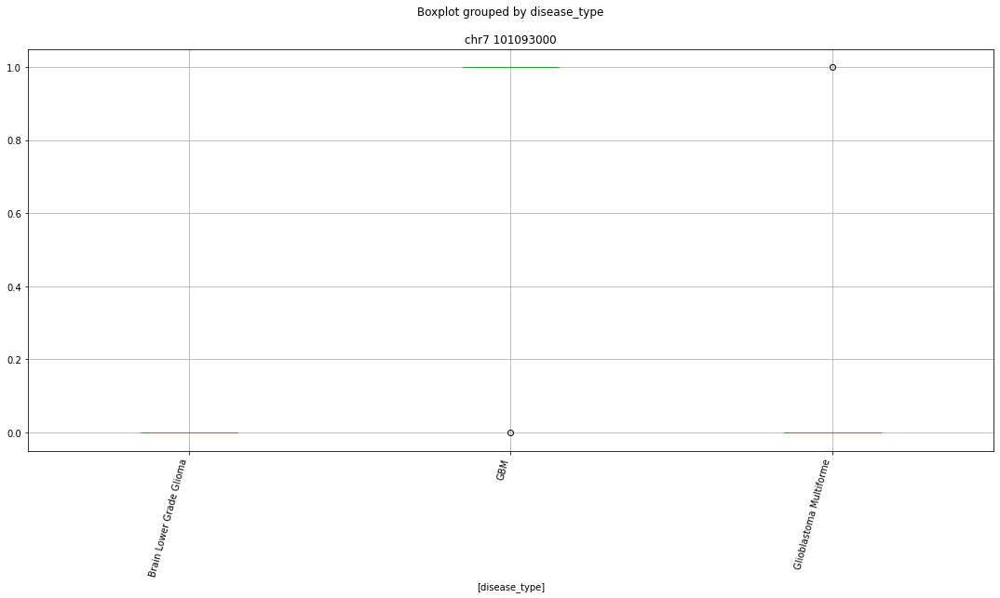

 p : 1.4682271381516776e-17  ( t : 11.319912144486992 ) :  chr11 83317000


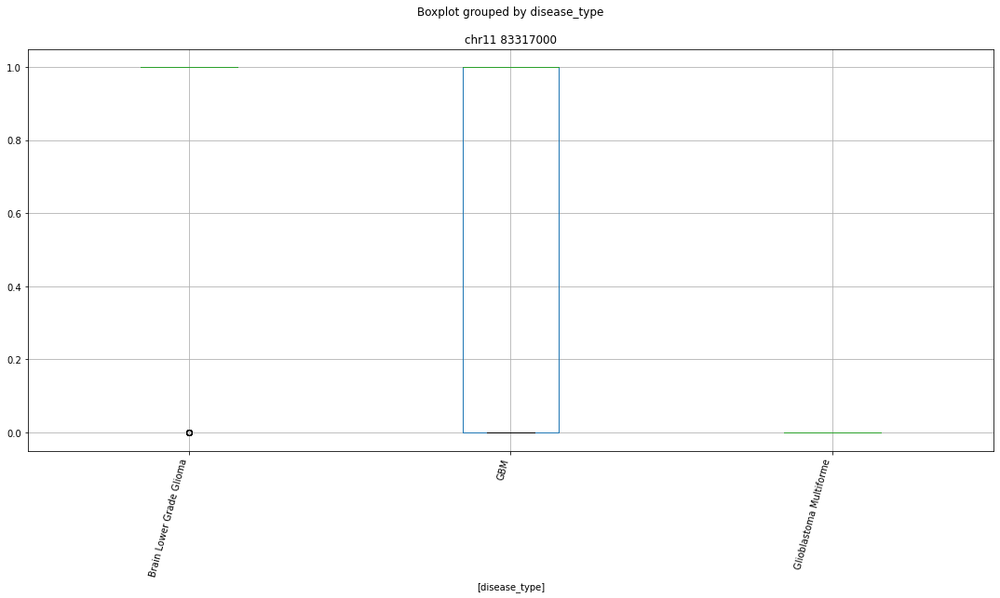

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr4 40146000


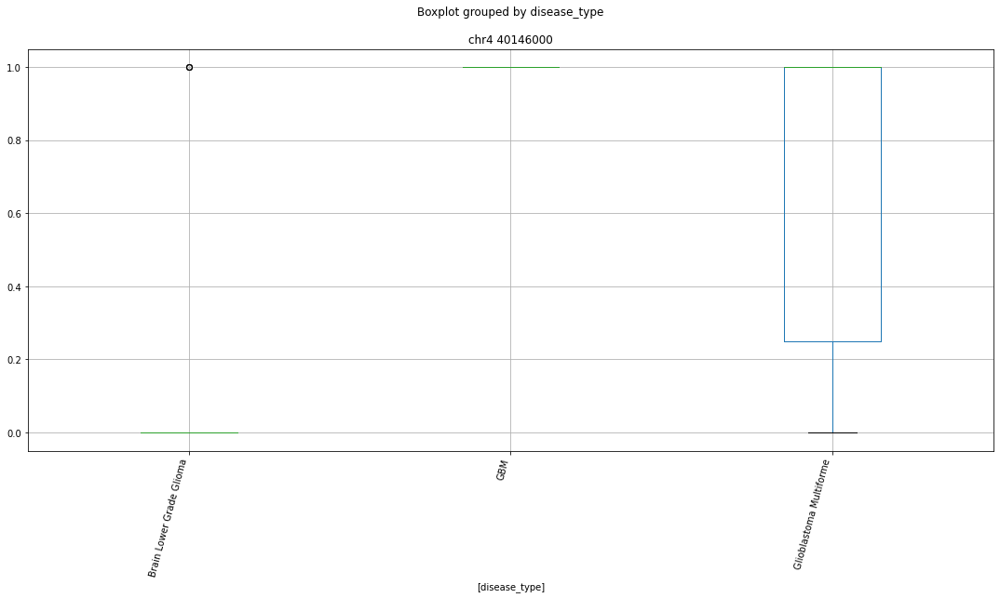

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr9 122711000


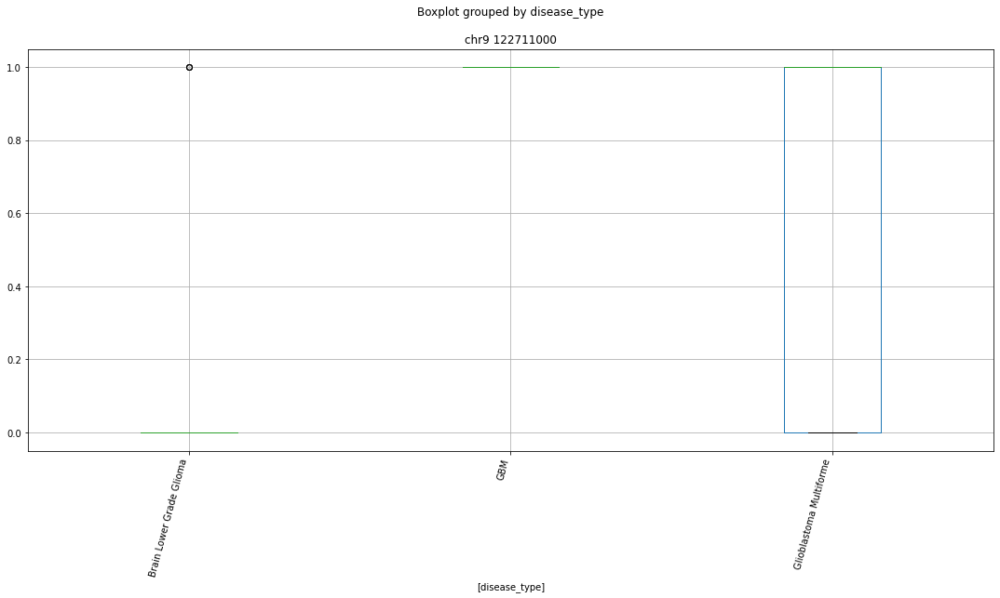

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr11 116348000


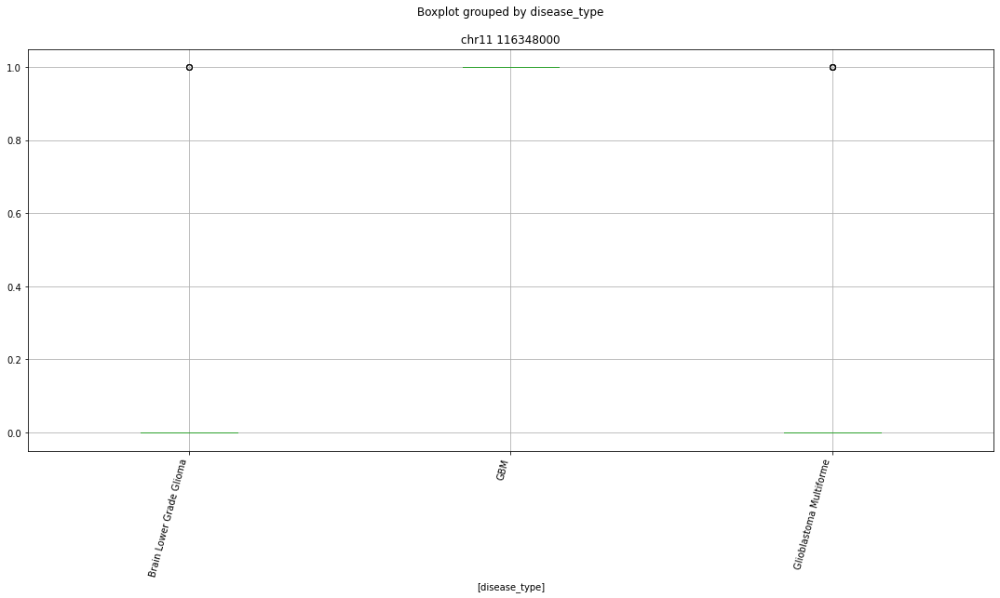

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr14 80287000


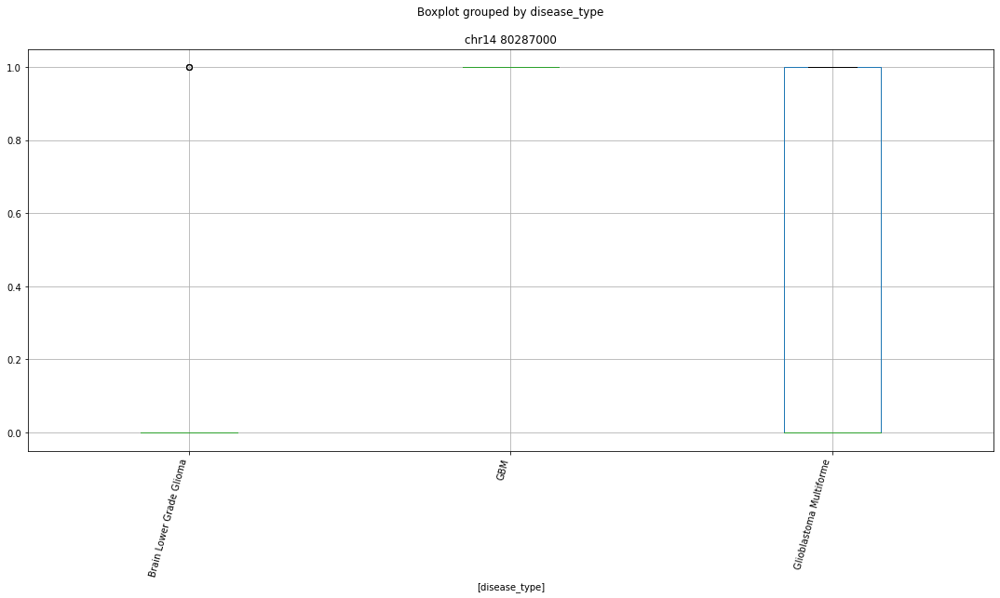

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr19 39959000


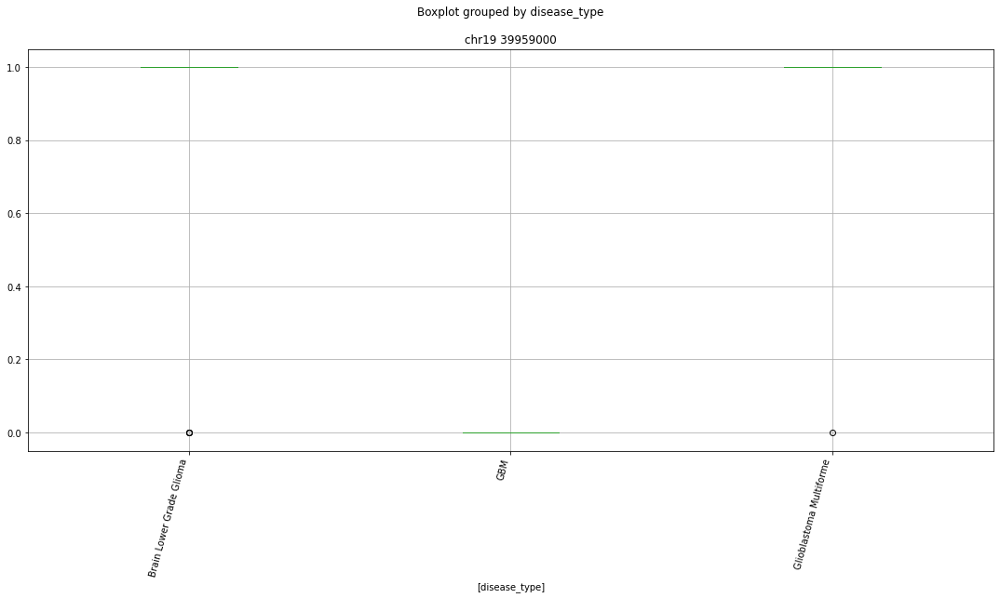

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 23258000


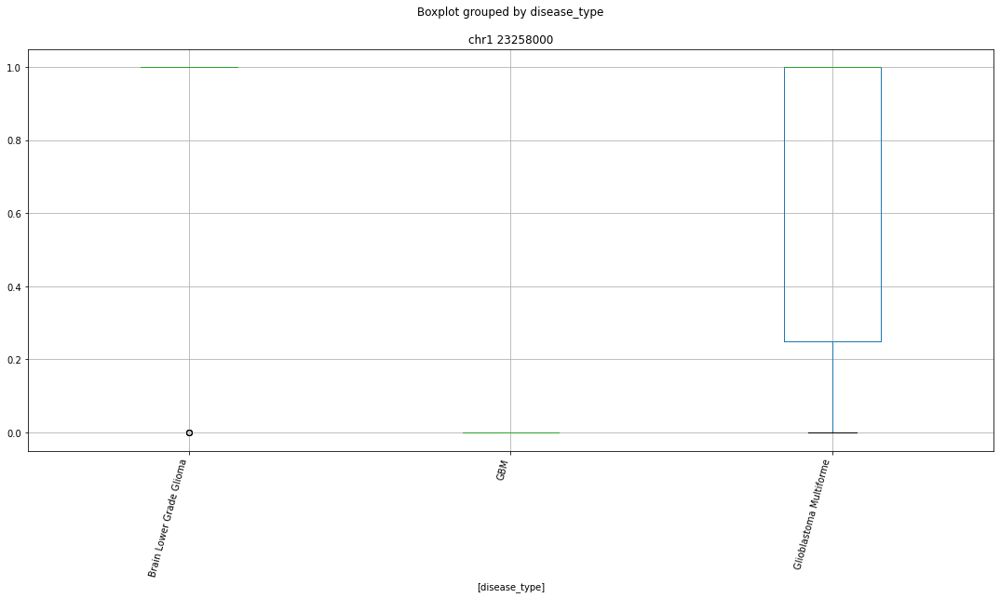

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr7 20669000


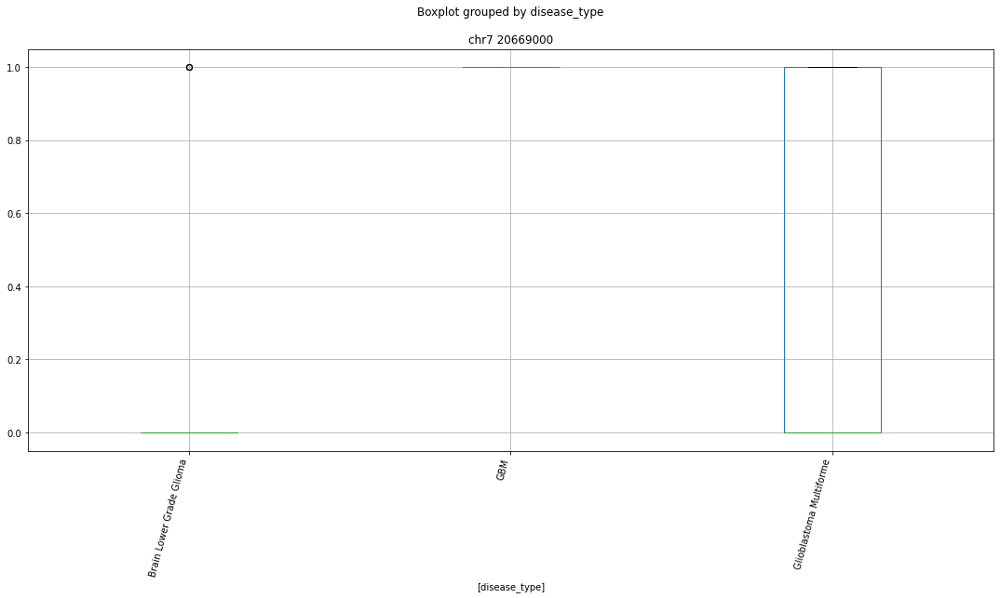

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr13 100618000


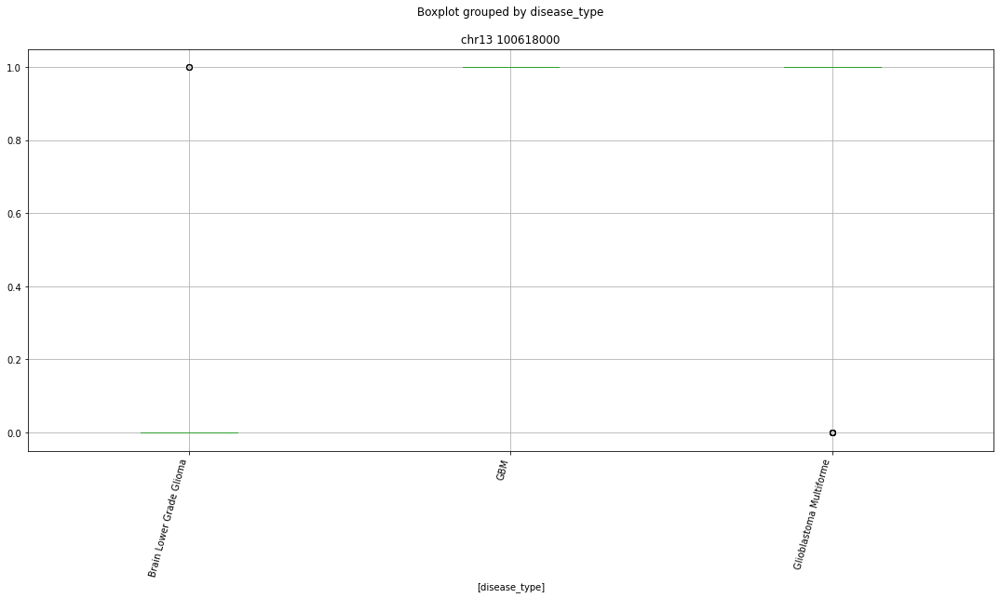

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 226114000


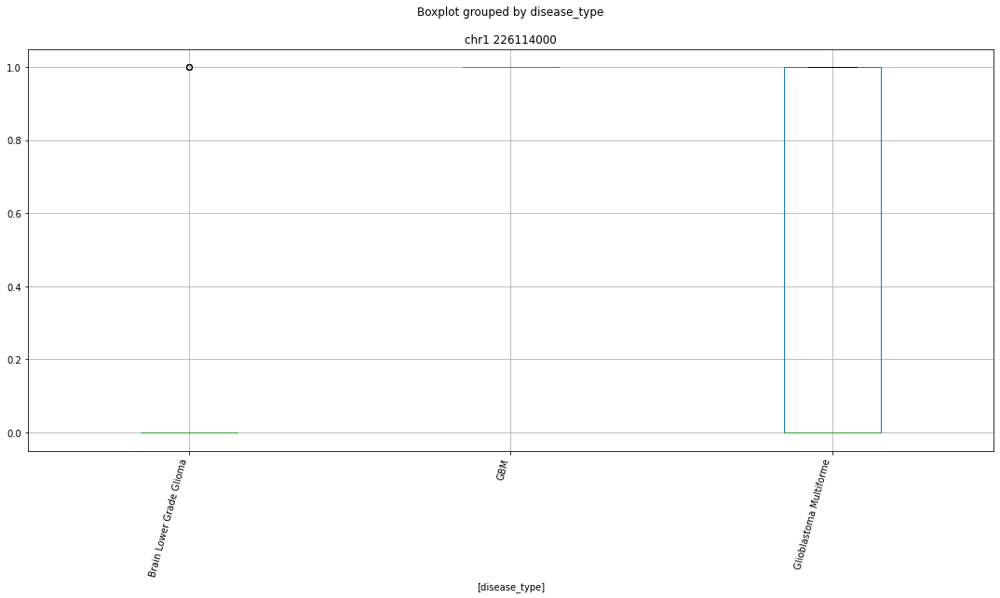

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 43502000


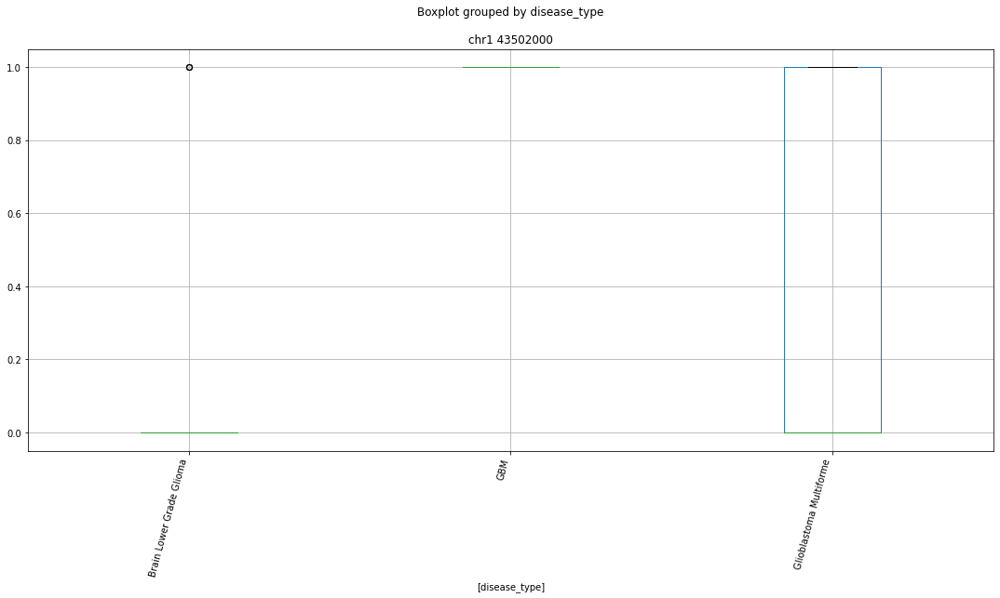

 p : 2.0346699265924837e-16  ( t : 11.961887225105135 ) :  chr5 180530000


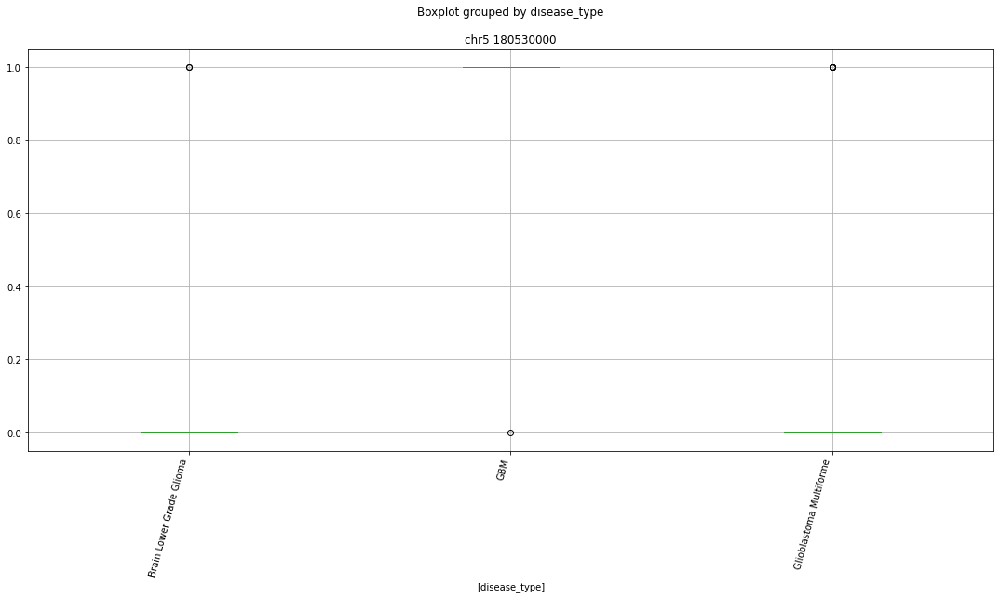

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr1 52182000


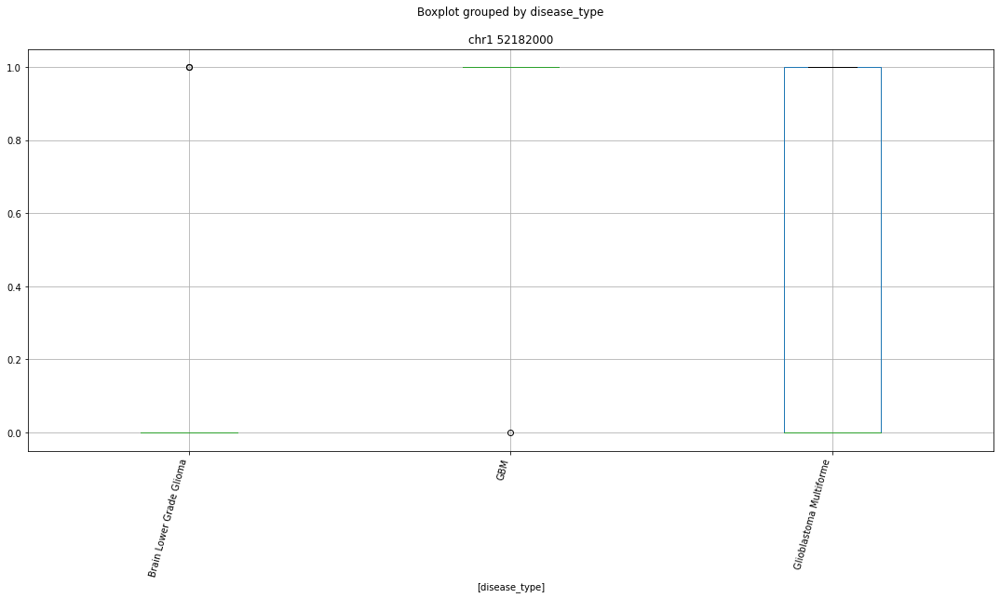

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr11 60492000


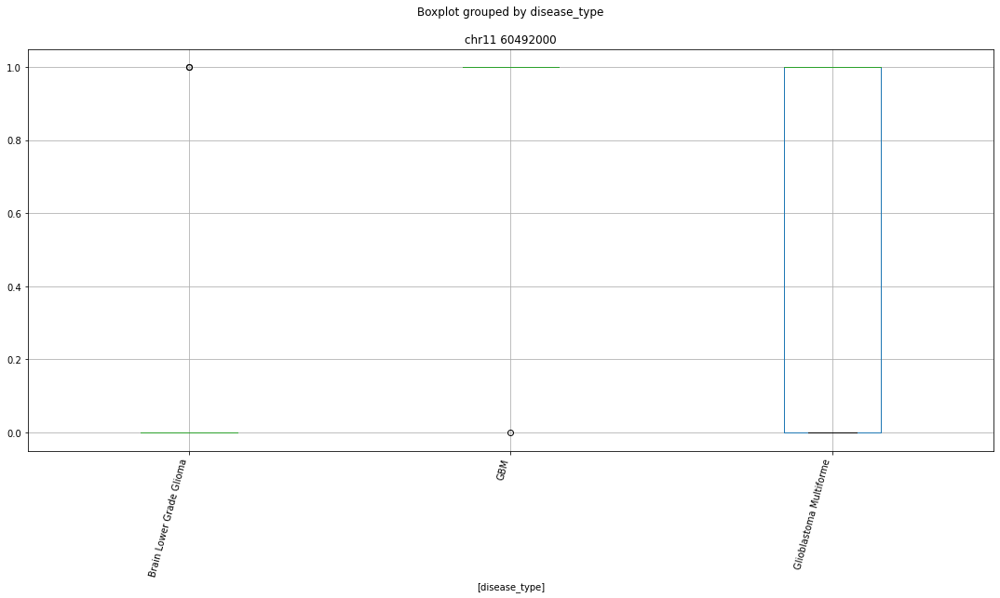

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr14 66544000


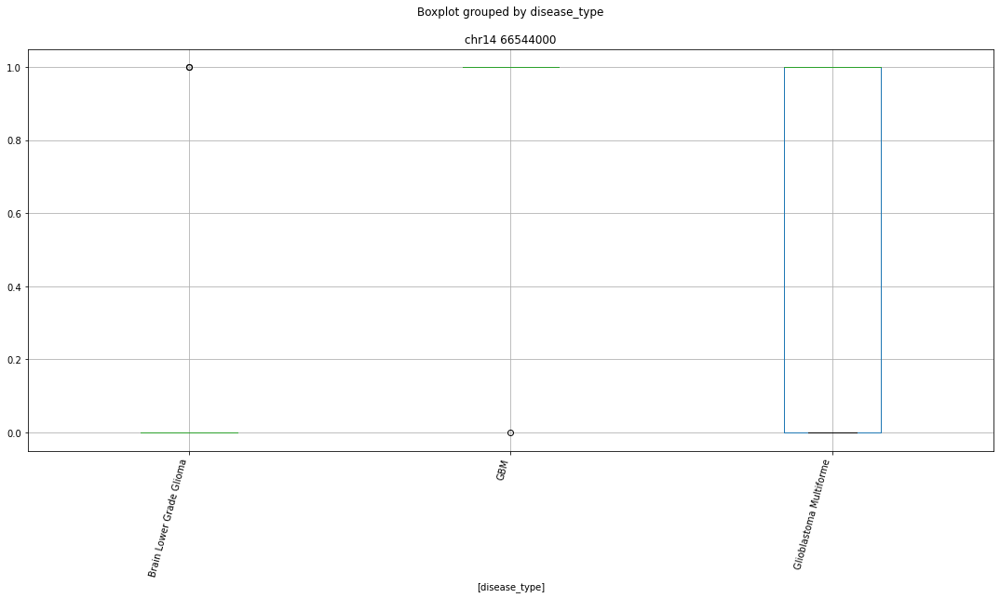

 p : 2.7590440009727814e-16  ( t : 10.605031069679022 ) :  chr2 15610000


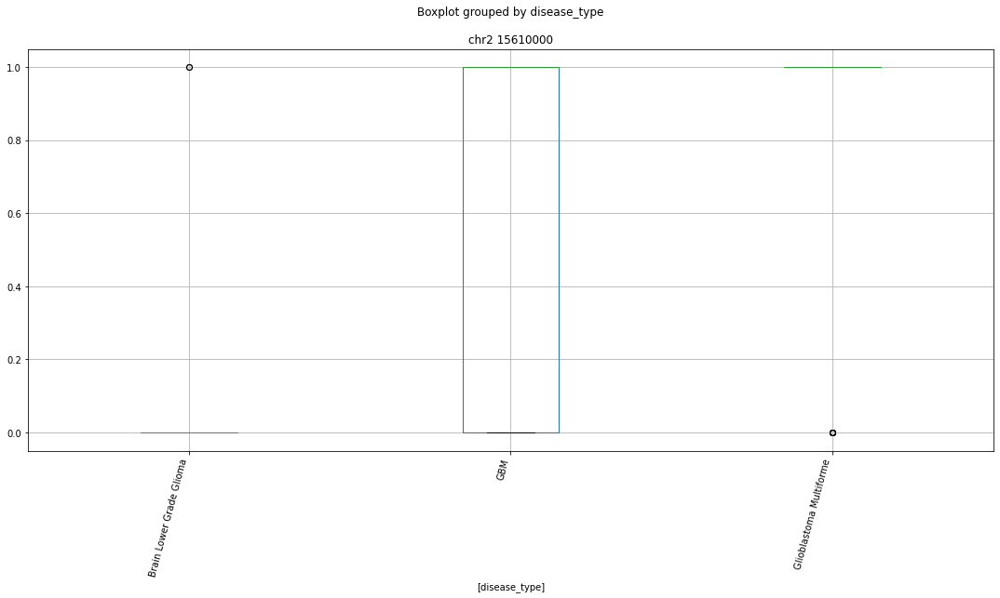

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr17 30978000


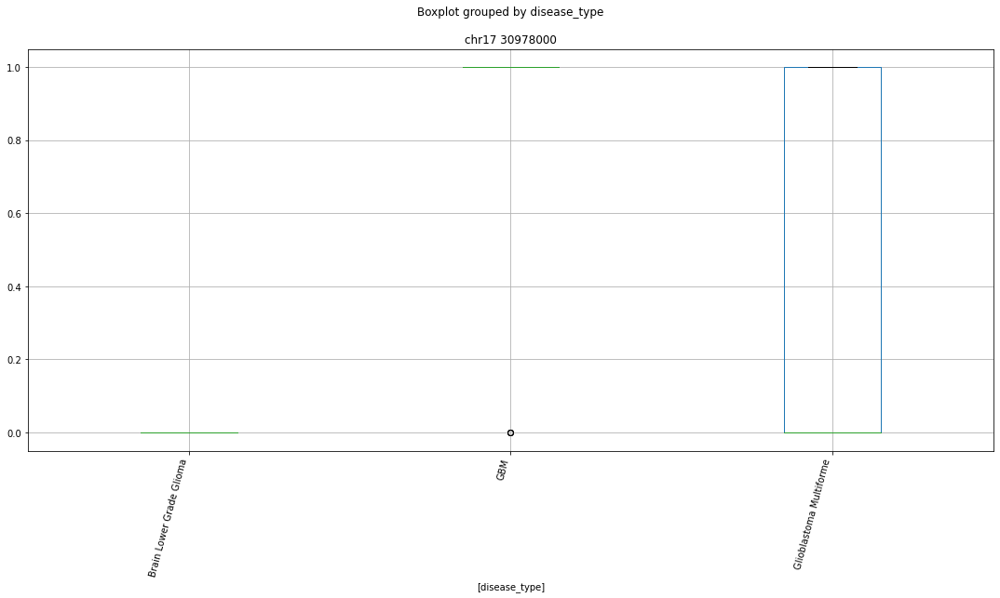

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr16 1600000


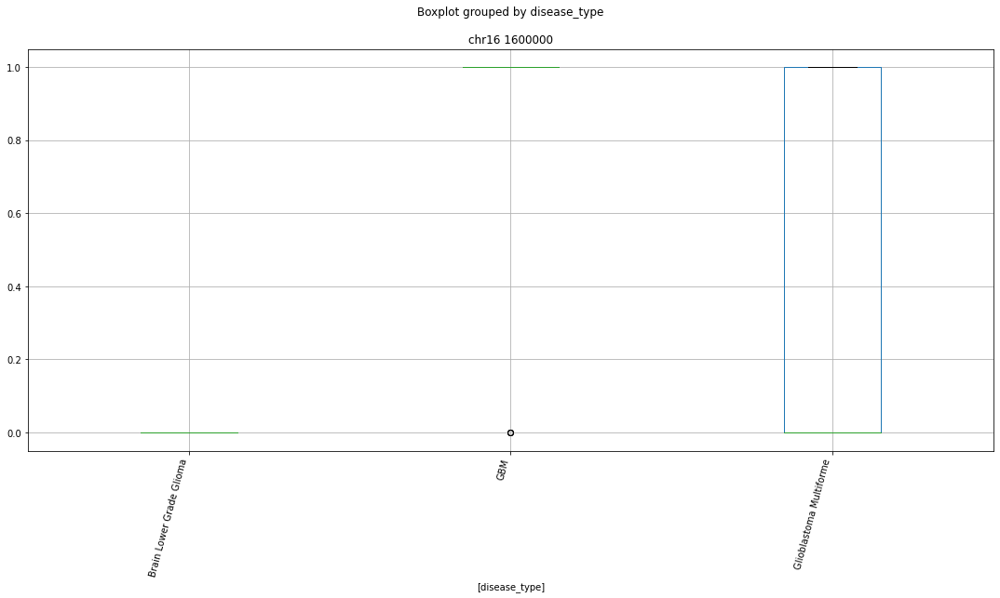

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr10 102300000


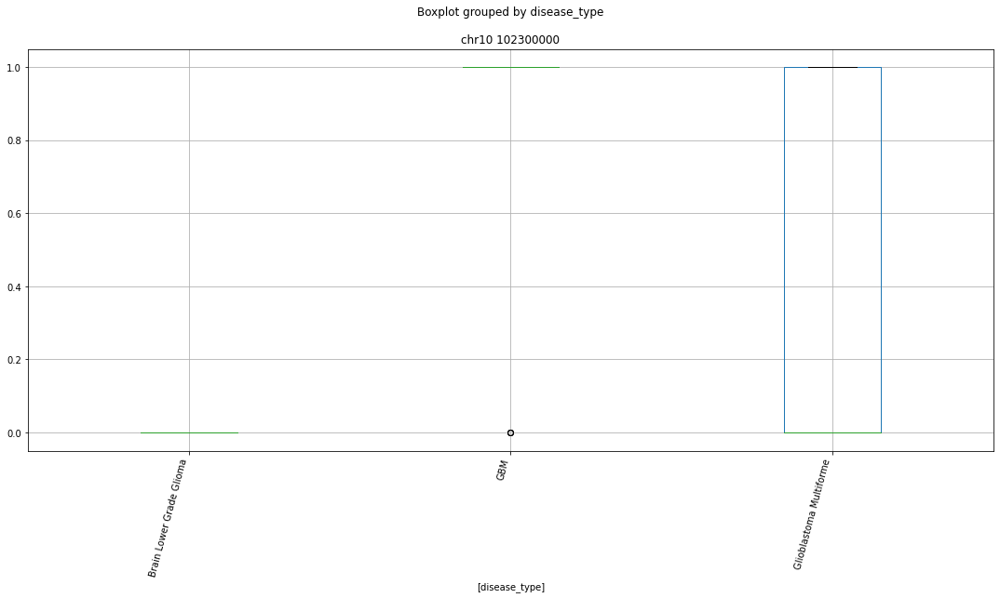

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr4 112957000


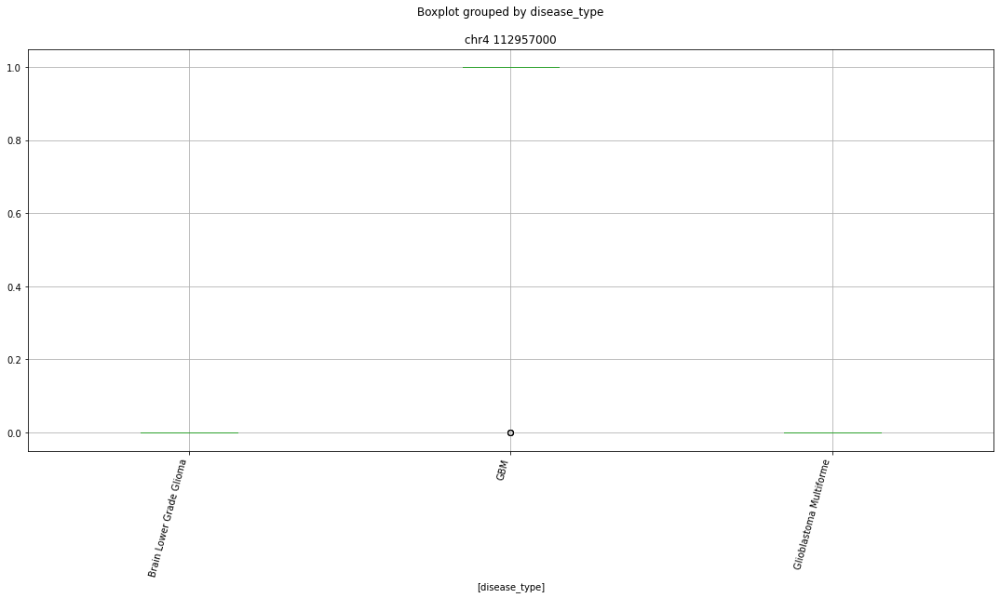

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr3 143046000


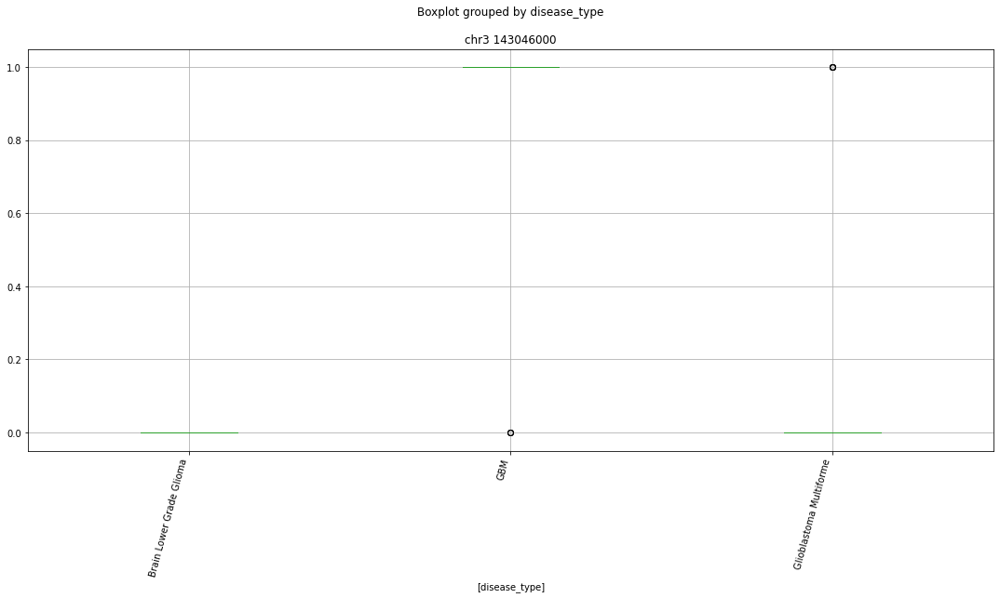

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr10 79278000


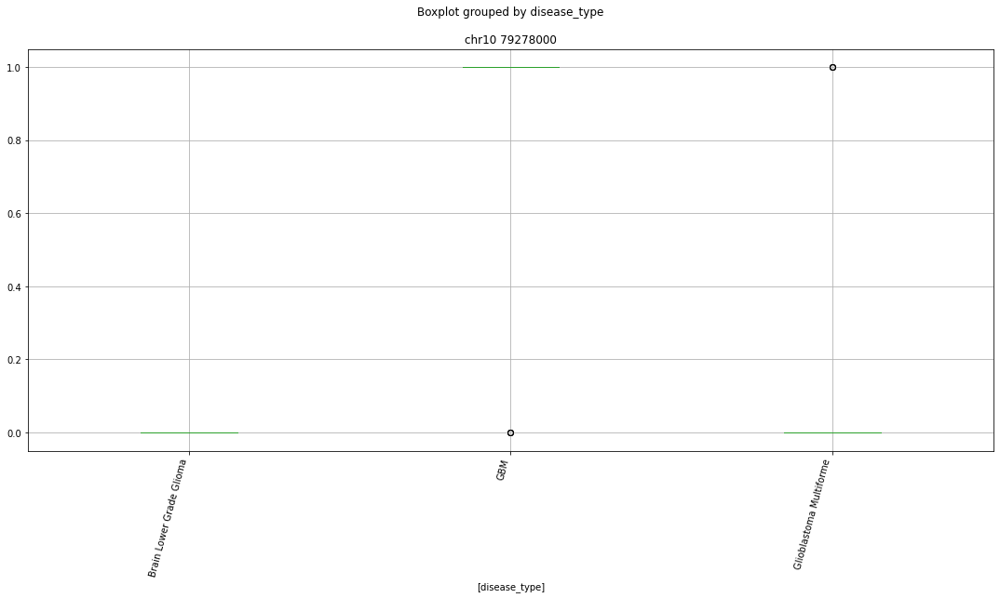

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr3 5283000


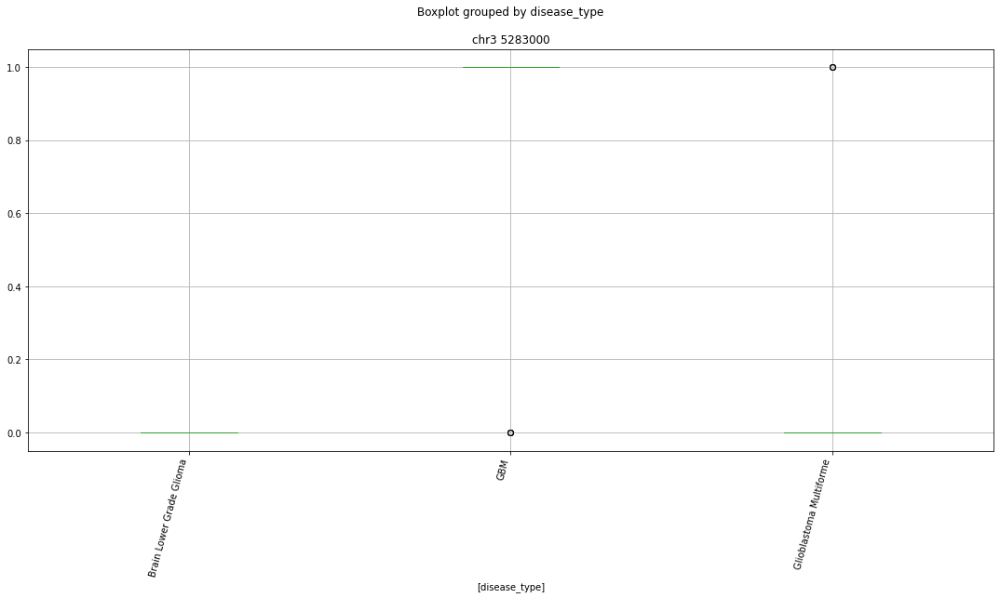

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr14 55919000


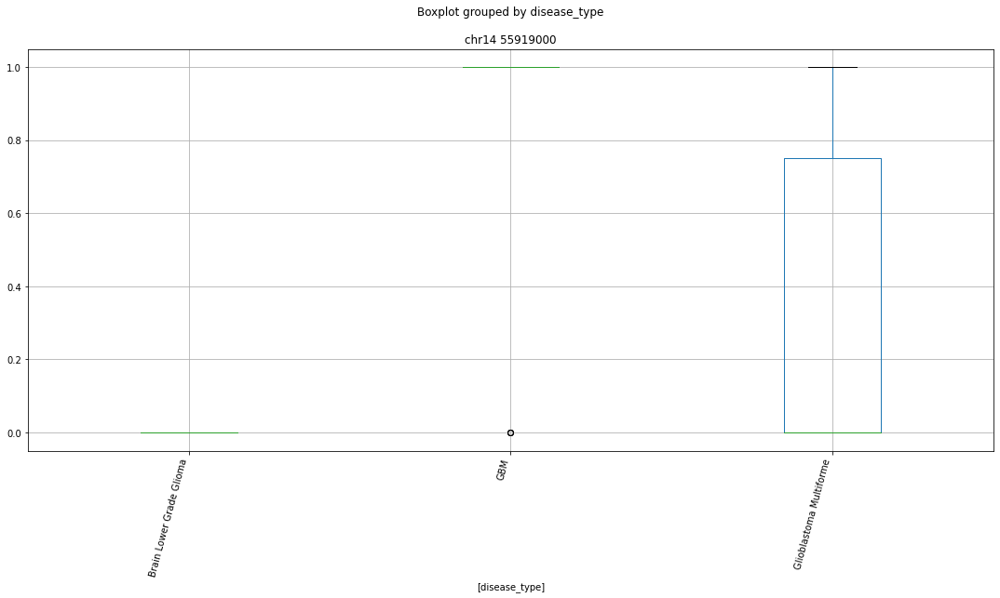

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr12 48552000


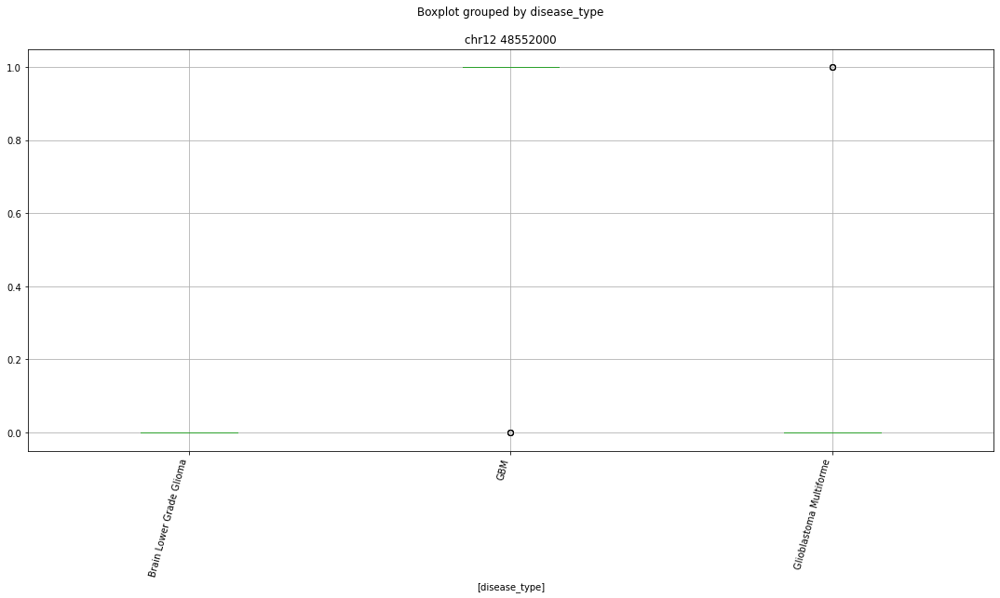

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr1 168207000


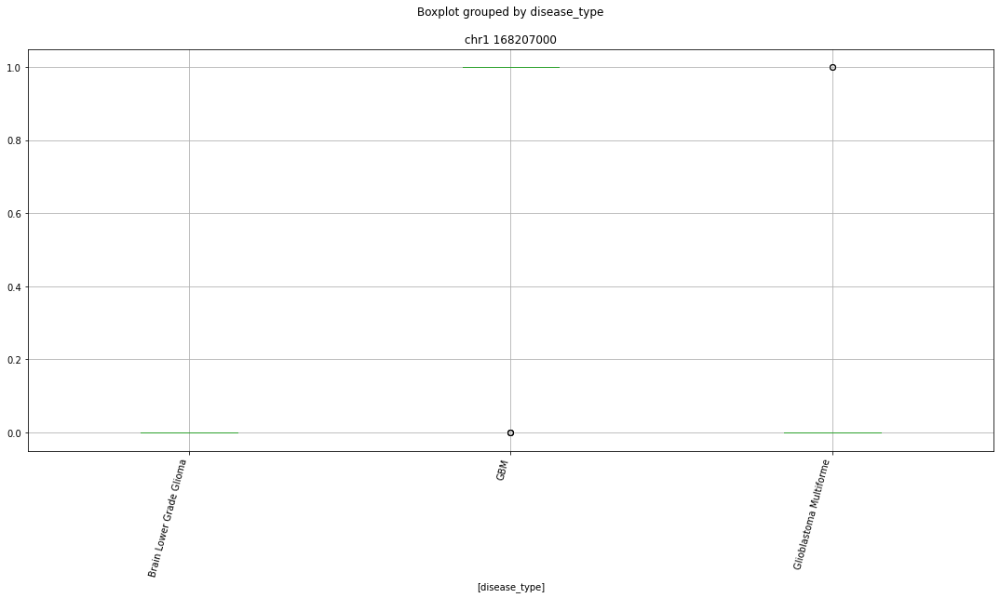

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr13 30838000


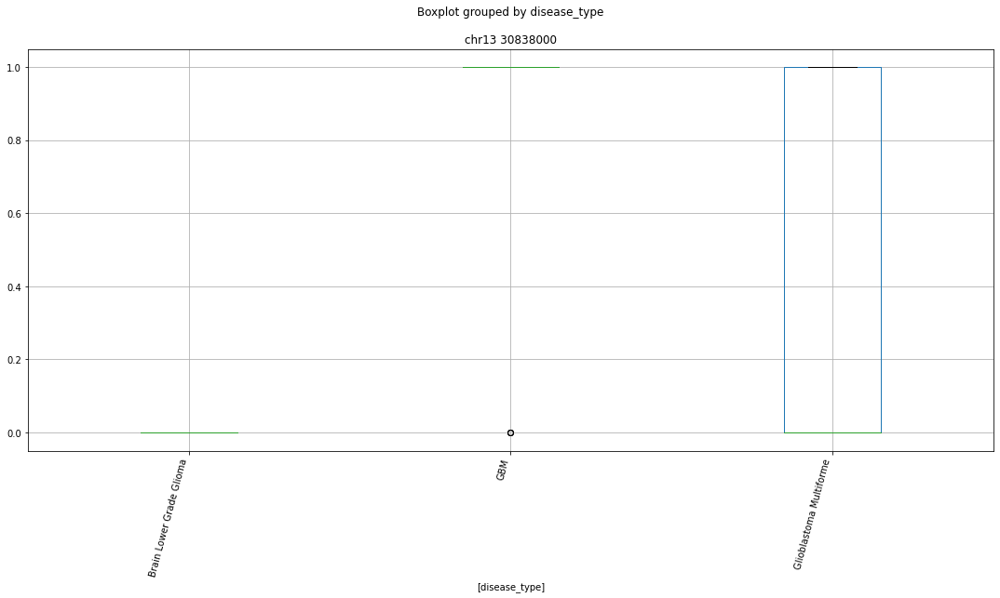

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr10 97527000


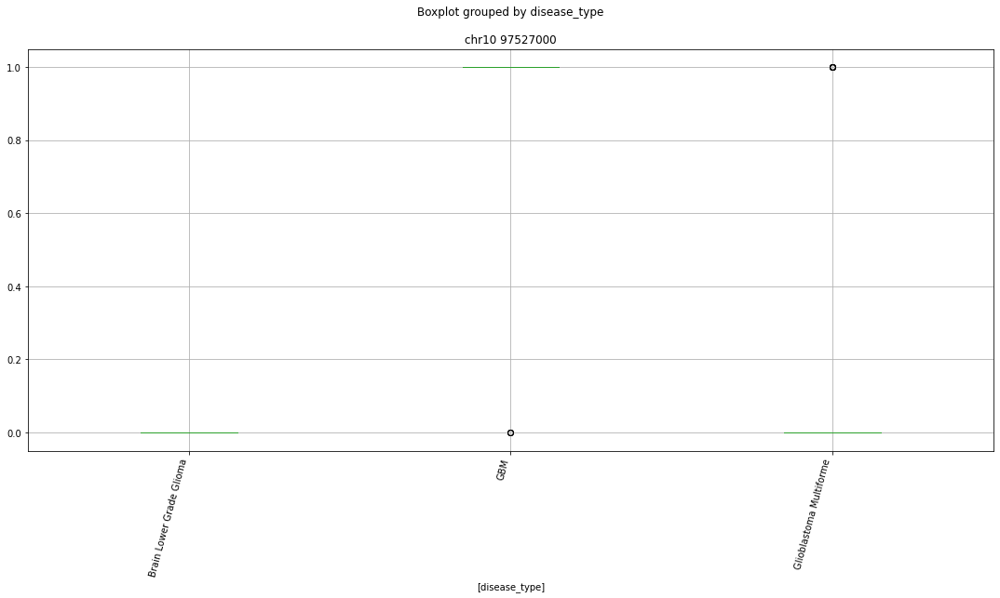

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr5 142074000


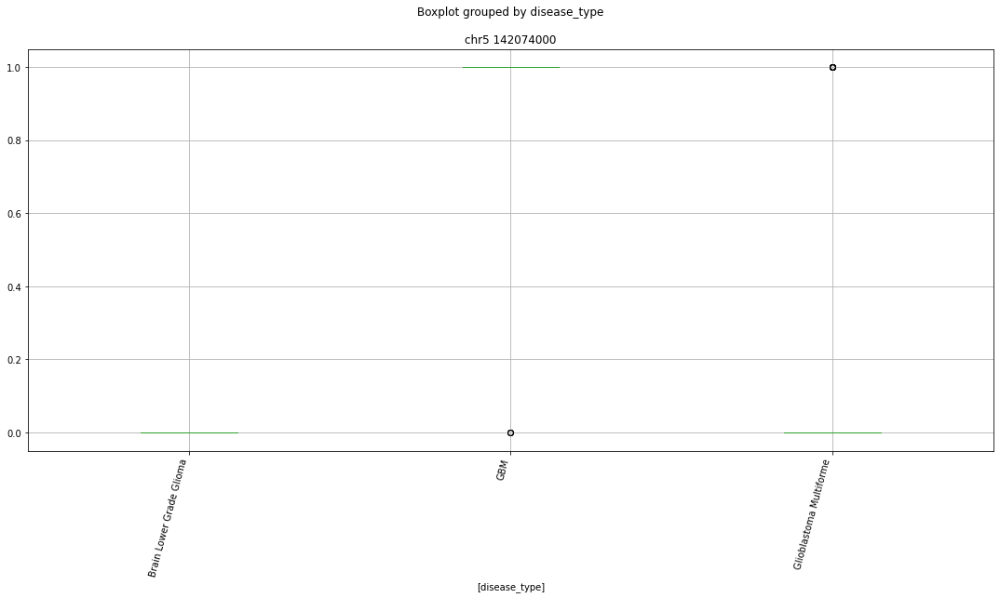

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr9 19433000


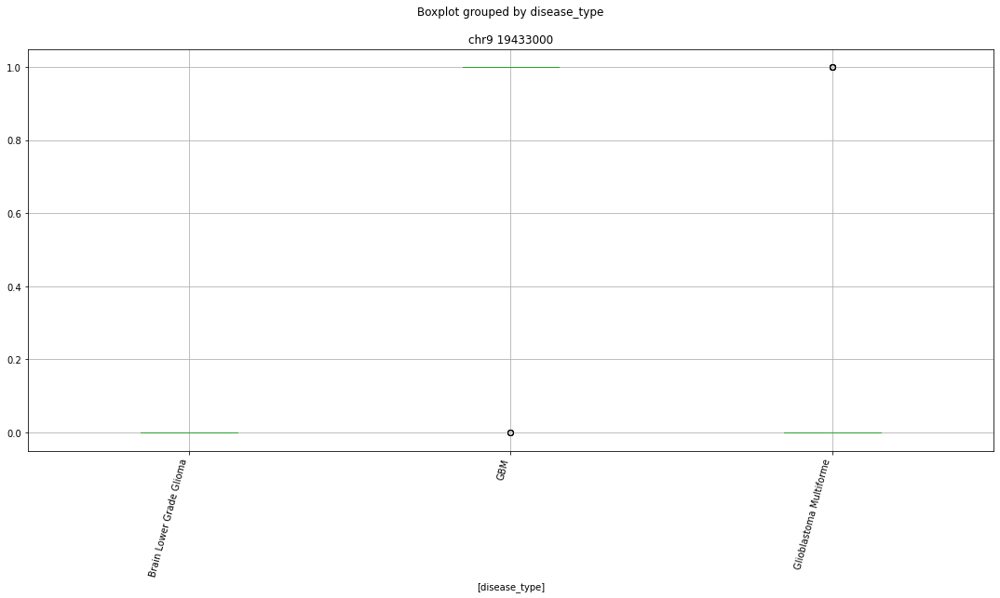

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr9 6808000


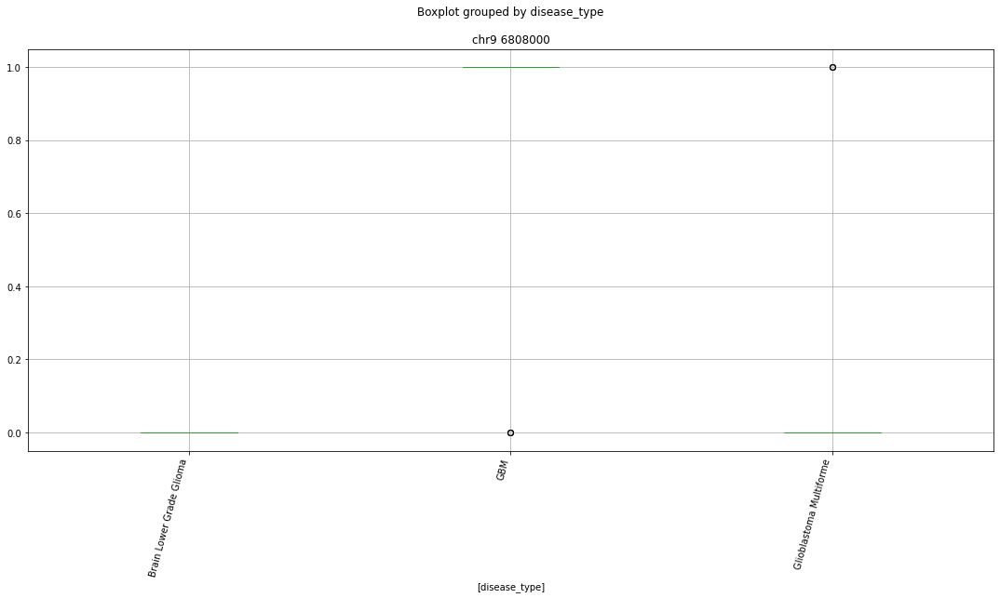

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr2 55772000


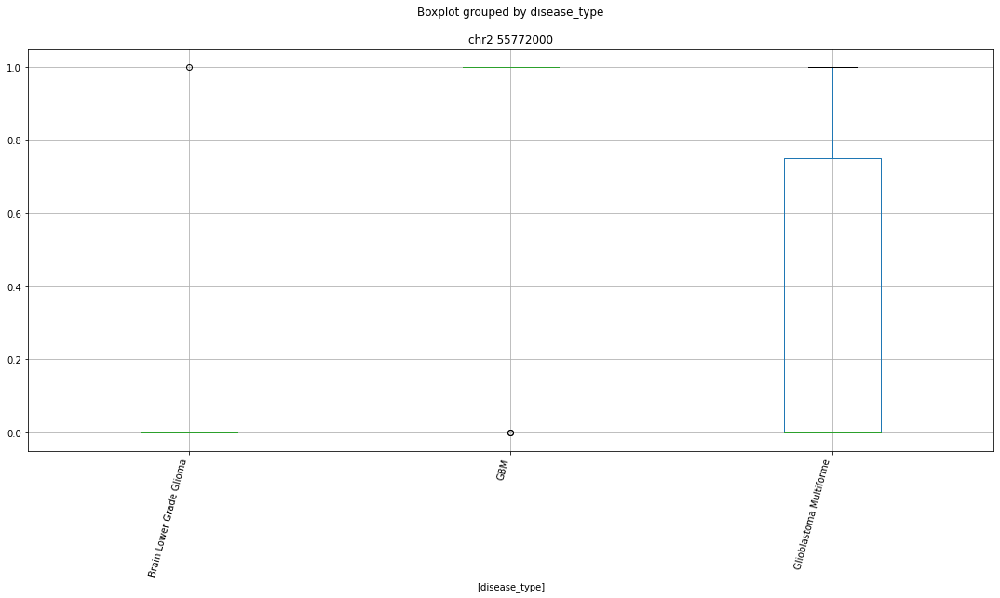

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr4 128082000


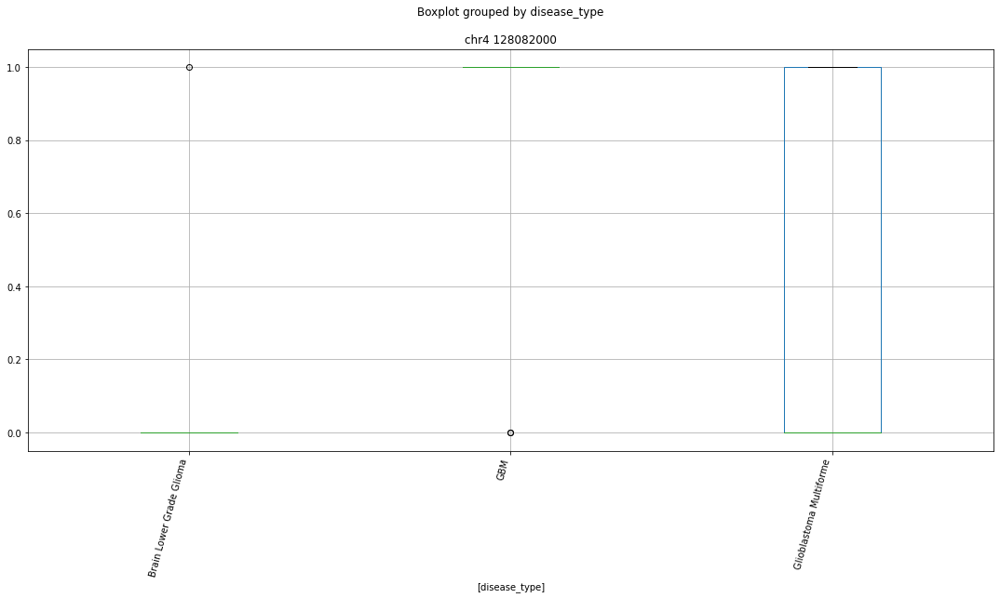

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr16 57199000


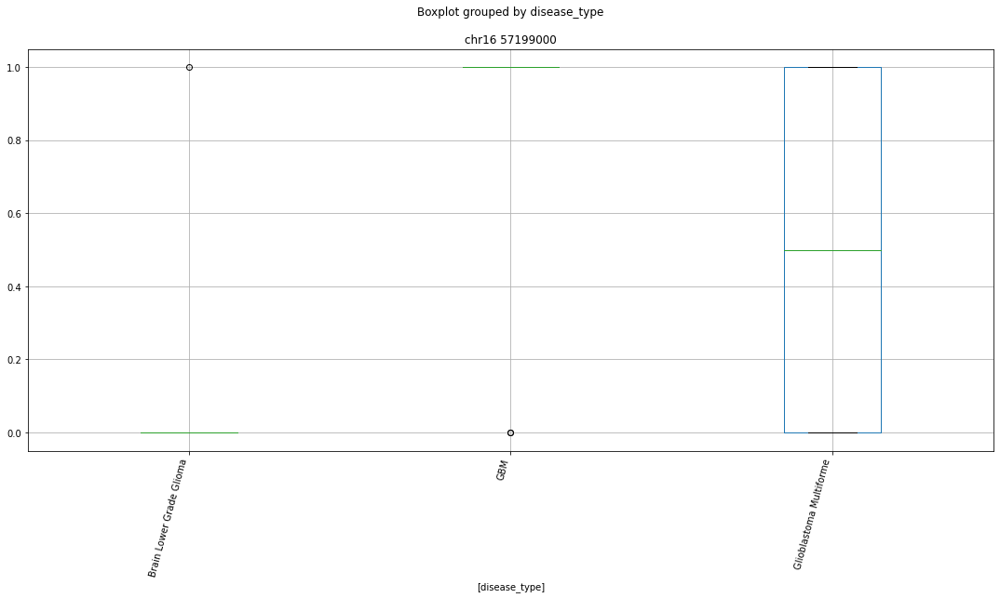

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr12 56788000


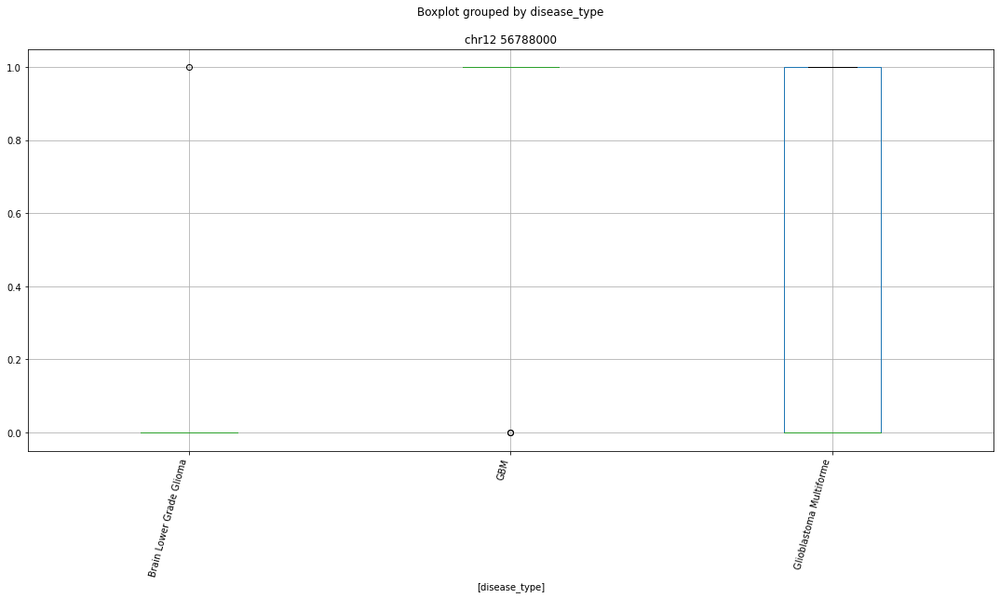

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr12 38329000


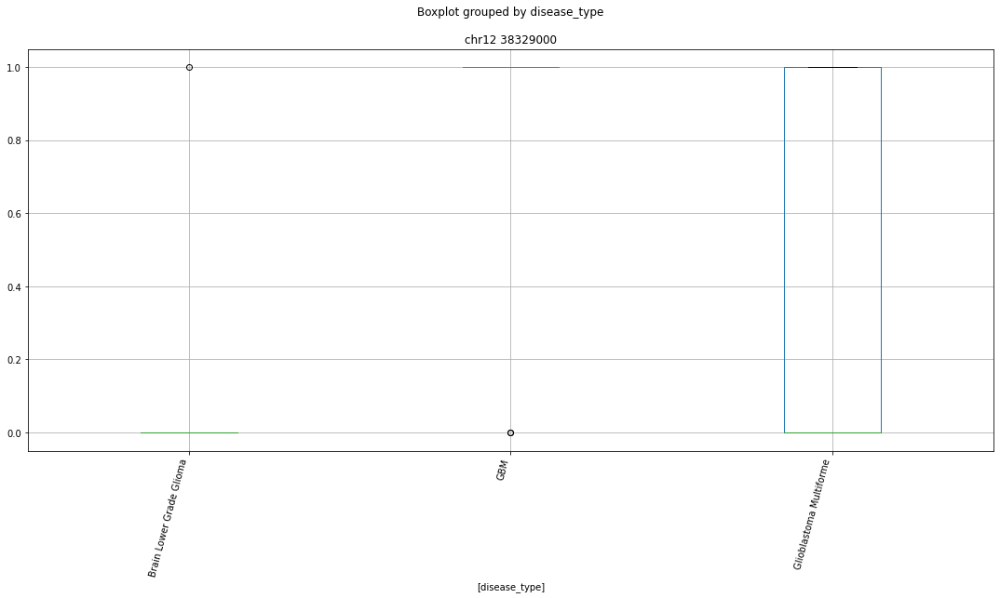

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr4 118399000


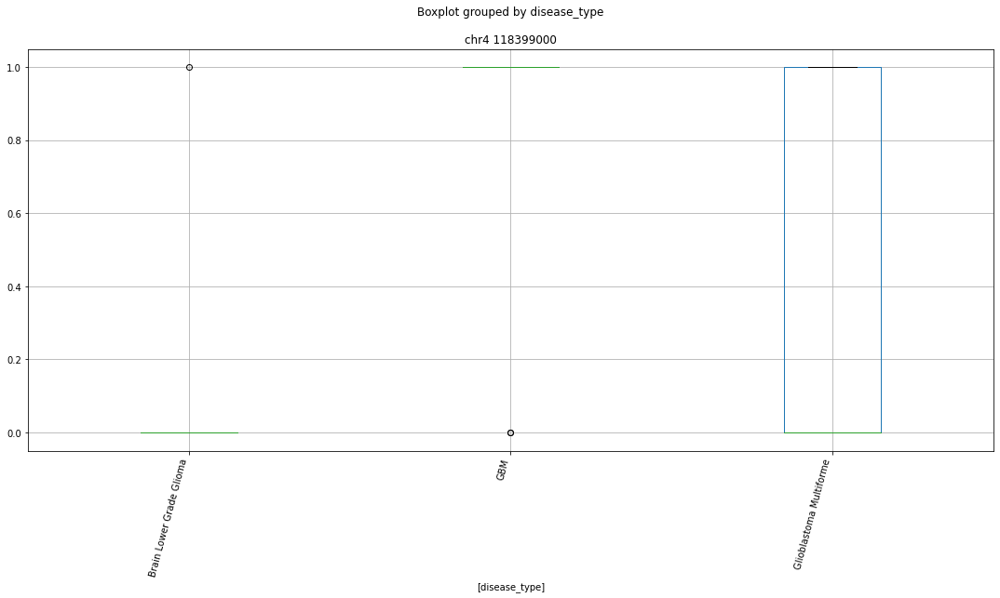

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr14 65634000


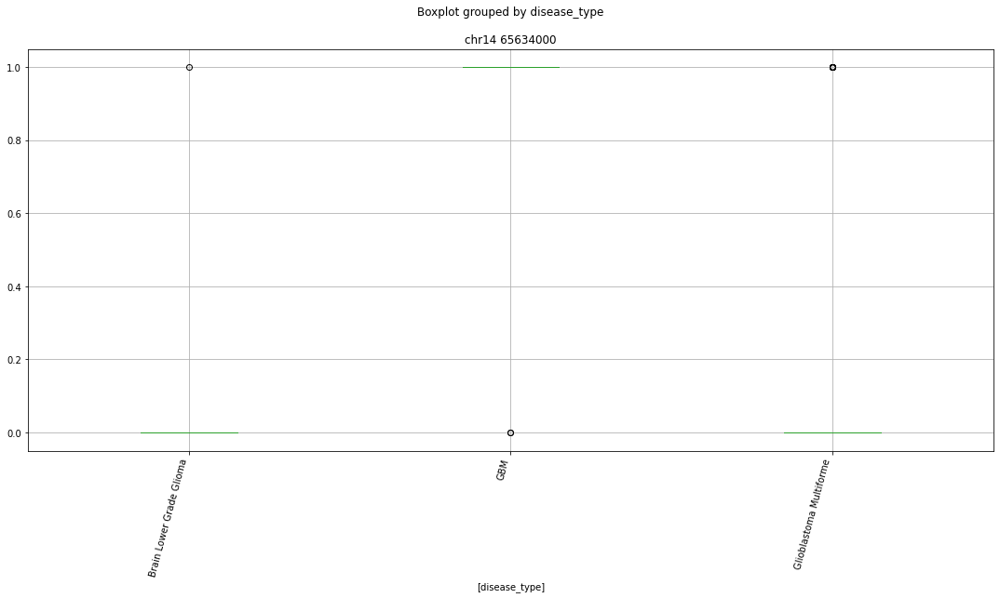

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr5 90594000


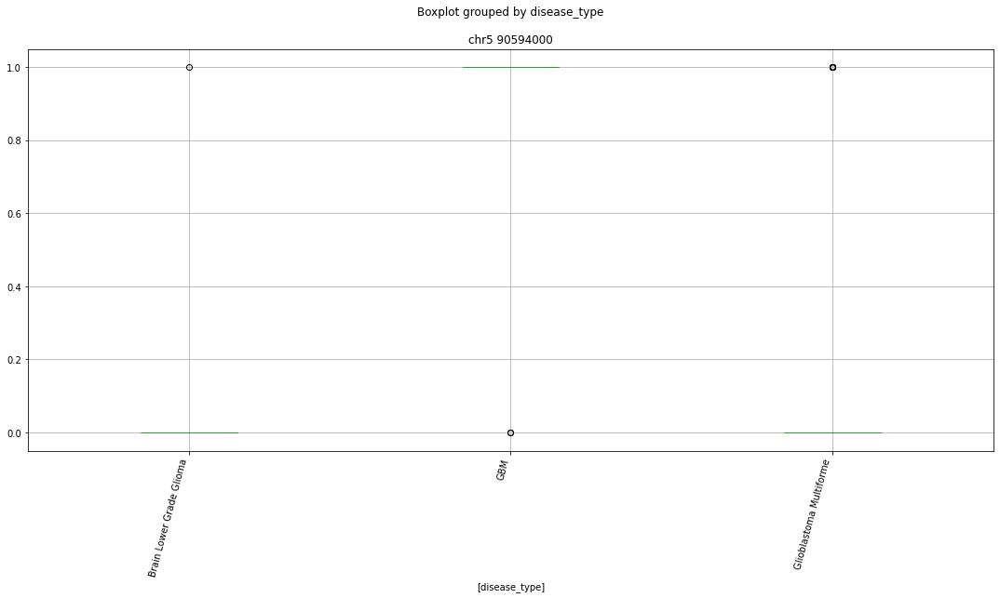

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr5 122810000


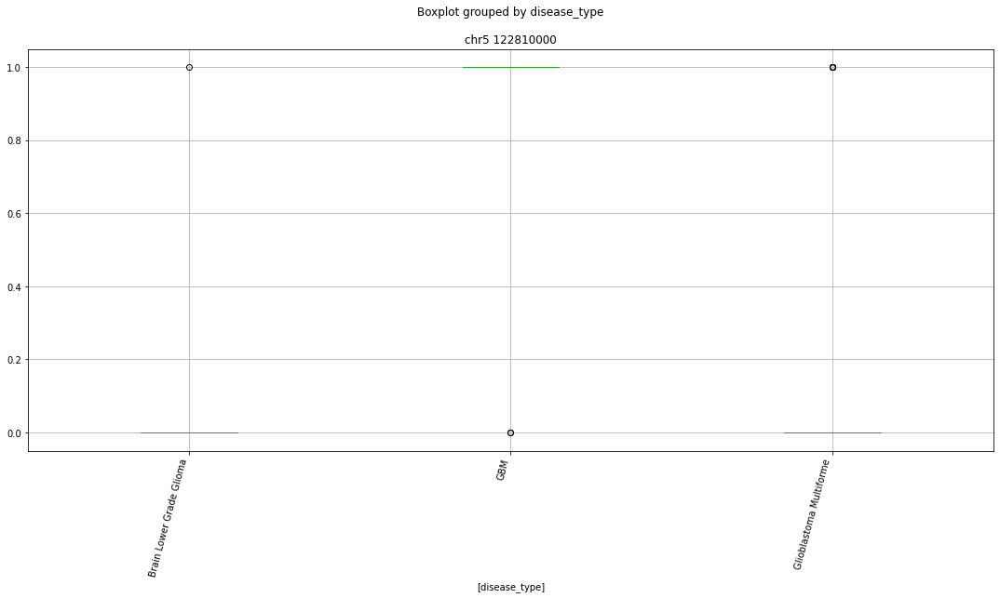

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr1 26802000


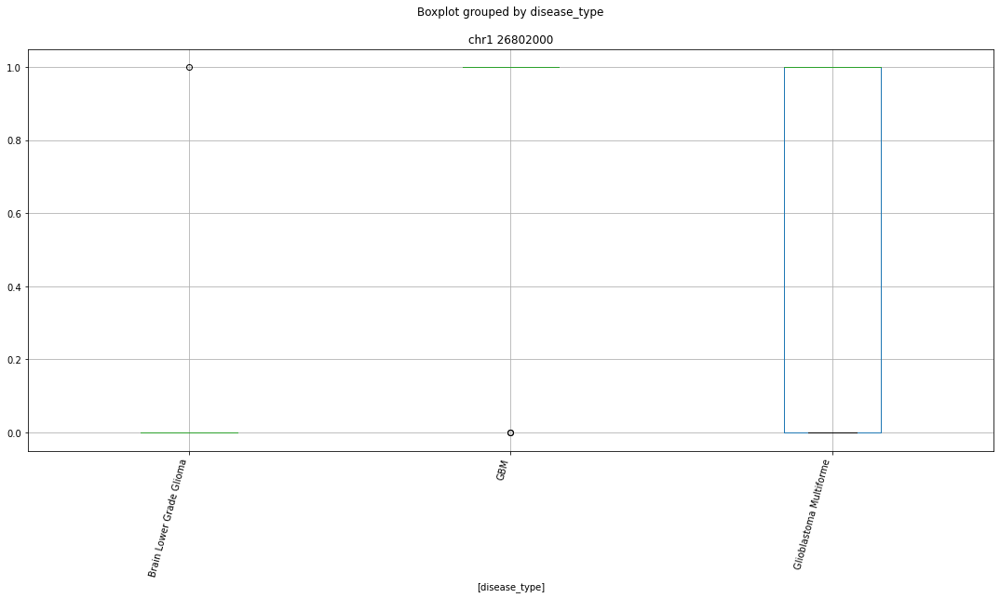

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr1 114480000


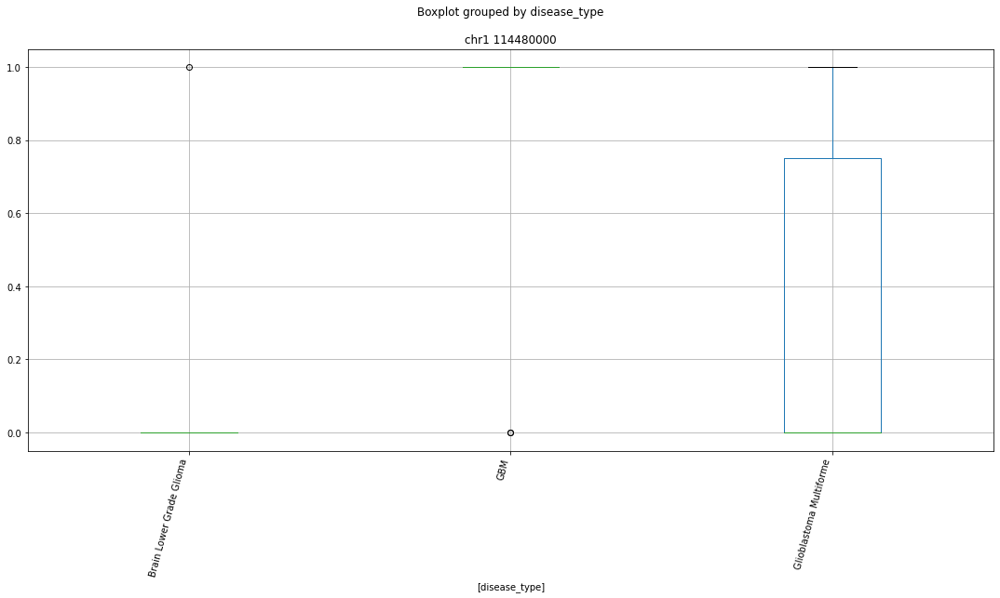

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr17 65938000


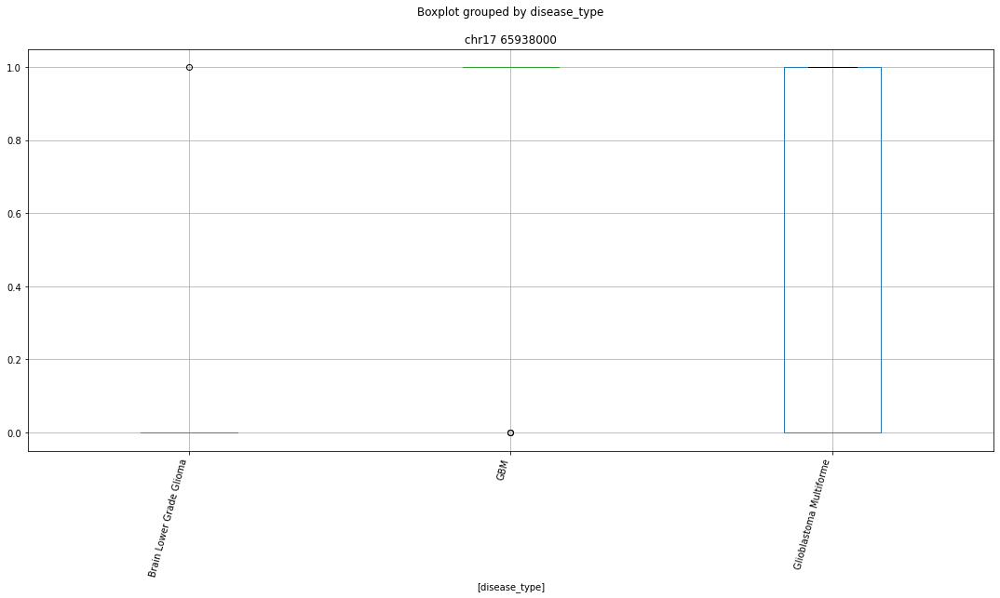

Clustermapping
['chr1 10028000' 'chr1 10029000' 'chr1 10427000' ... 'chrY 8917000'
 'disease_type' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


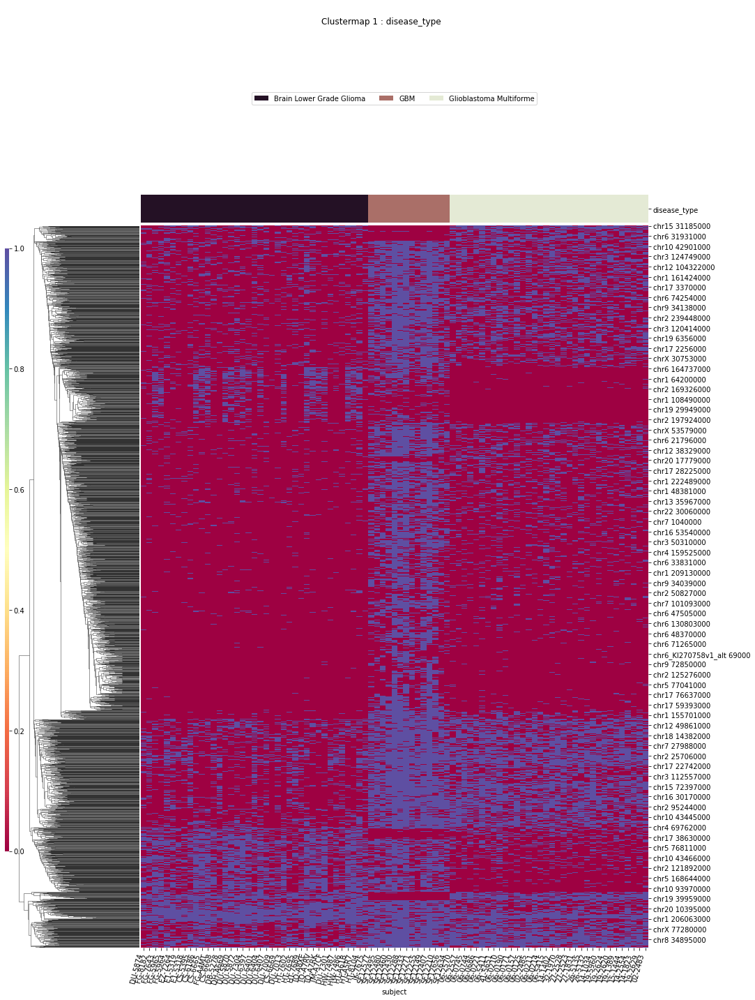

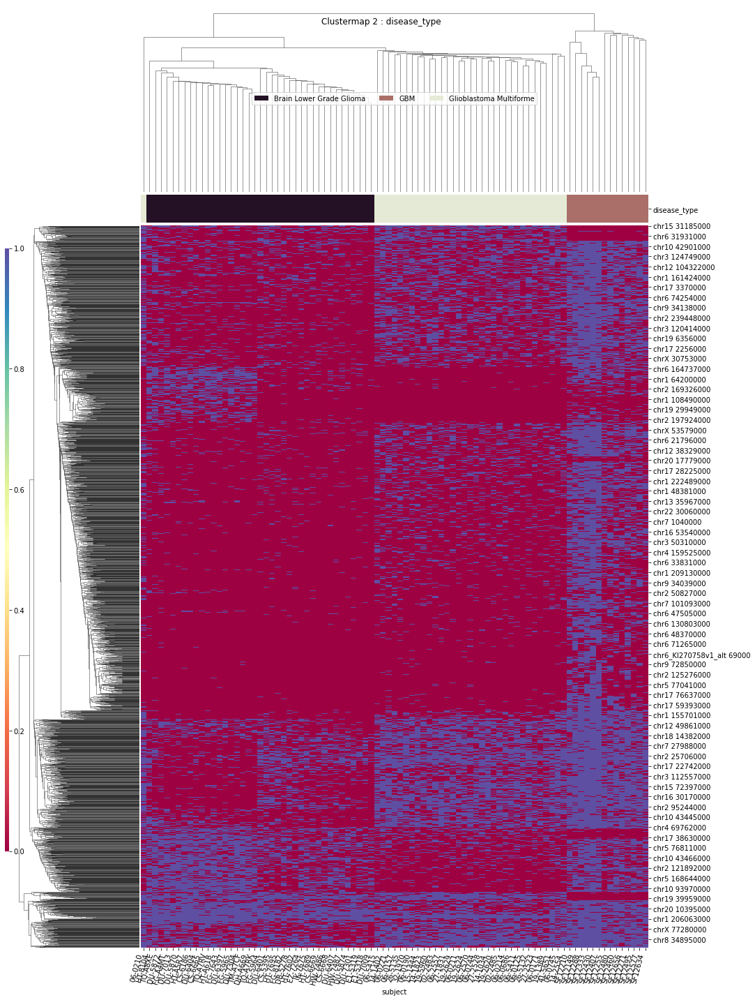

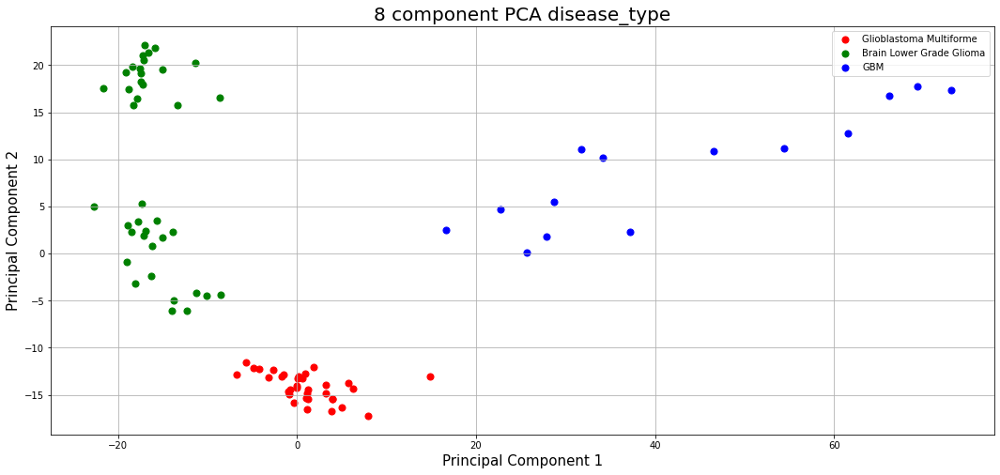

In [148]:
for column in ['disease_type']:
    print(column)
    ttests_boxplots_and_heatmaps(both_binary_df,
        both_binary_df.columns[both_binary_df.columns.str.contains("^chr")],column,box_p=1e-15,heat_p=0.01)
    

In [149]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210610 12:19:01'

disease_type
T-Testing
Boxplotting
 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr11 3398000


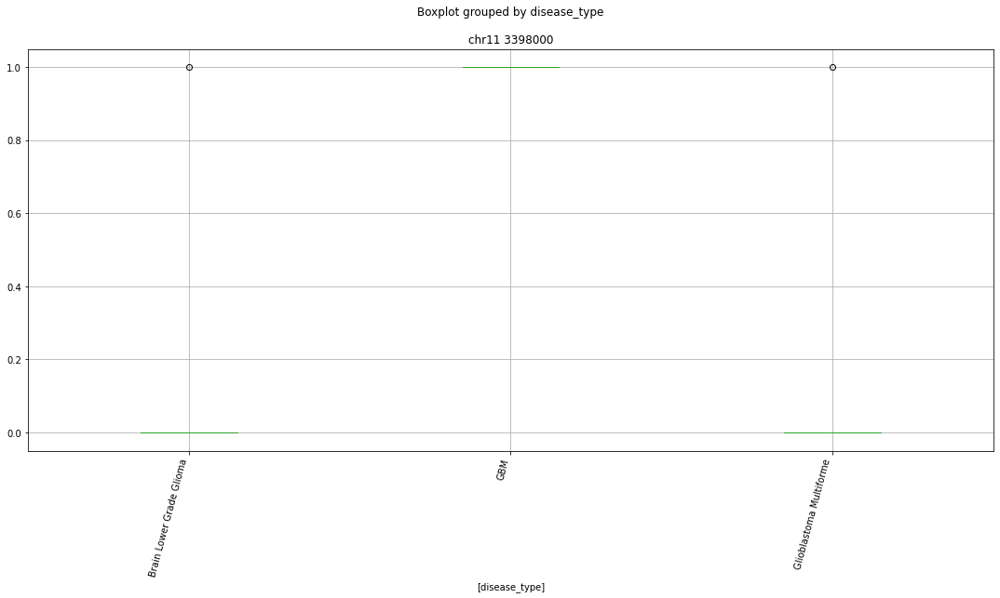

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr1 212780000


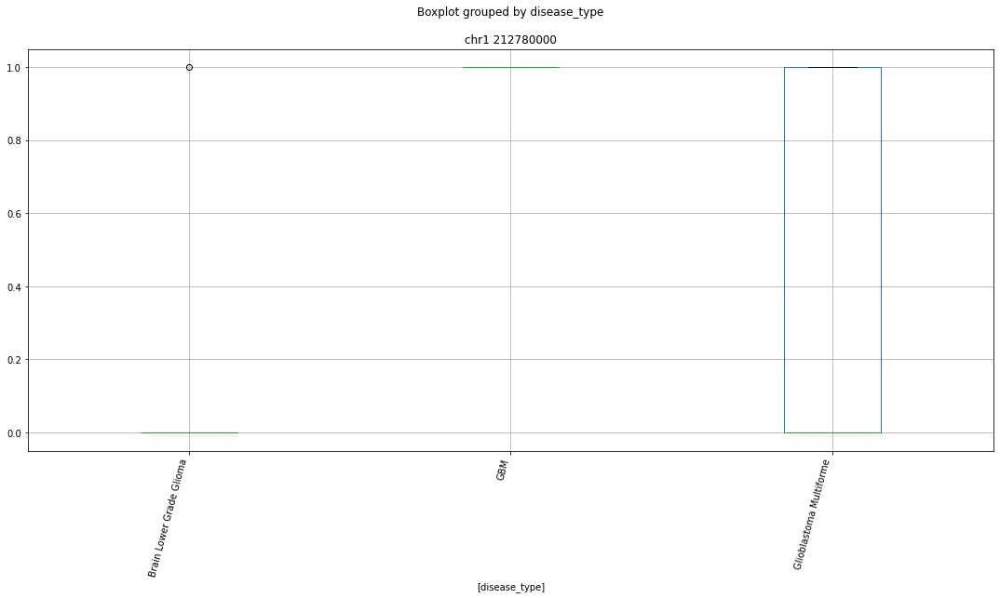

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr12 68484000


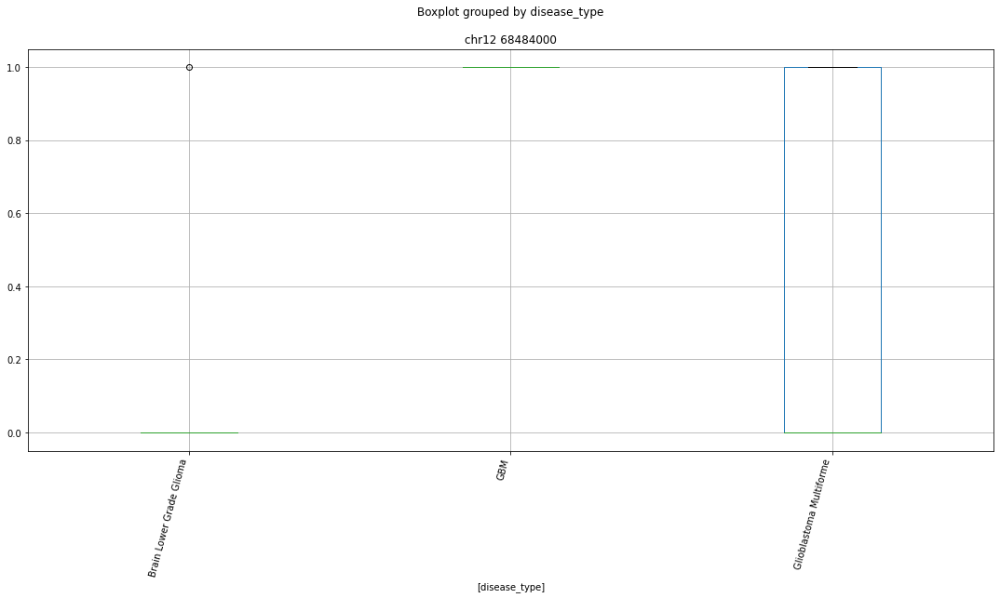

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr17 27034000


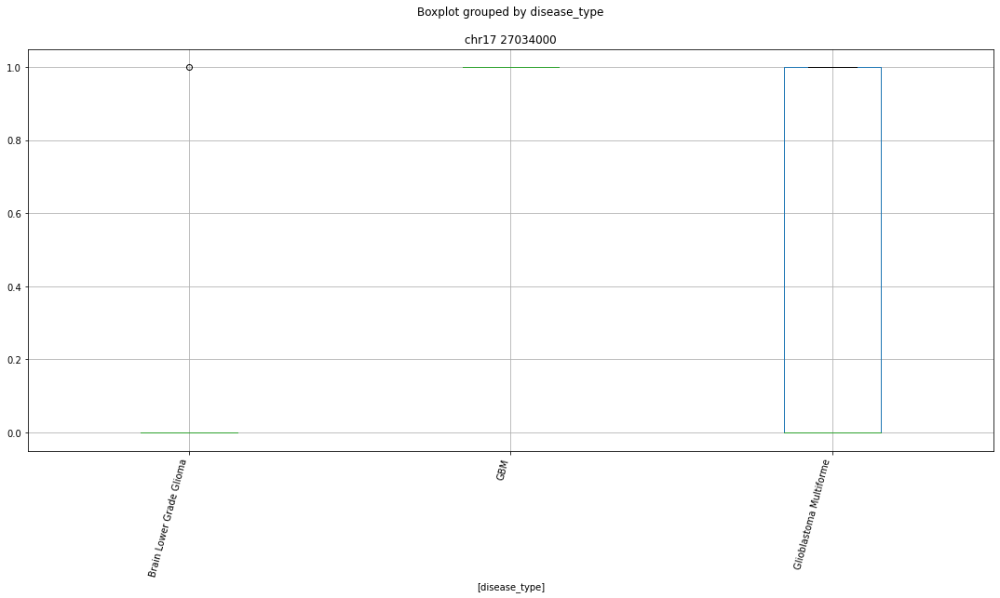

 p : 2.967534089859458e-28  ( t : 22.6257492318351 ) :  chr6 31933000


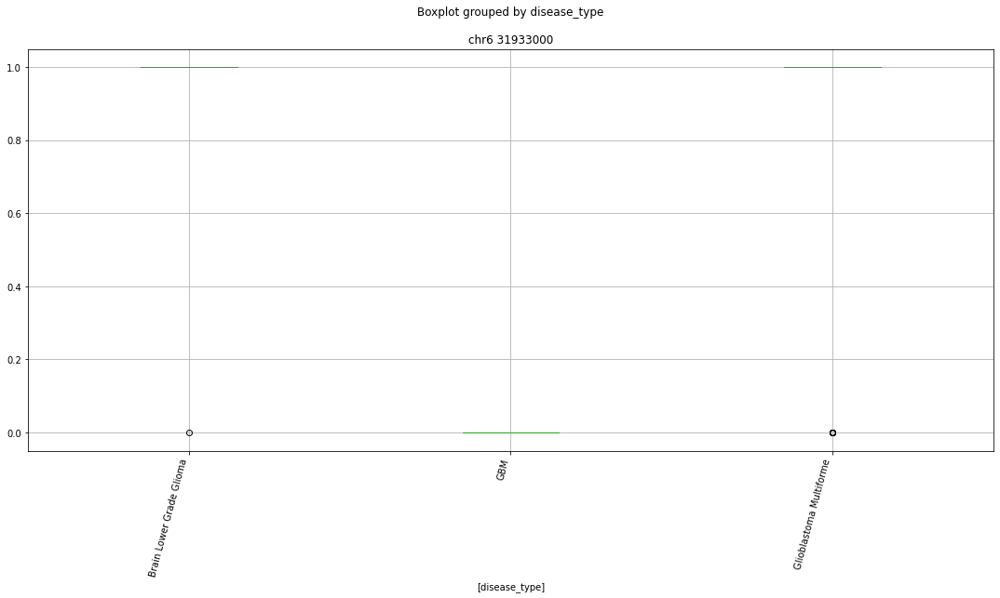

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr1 25604000


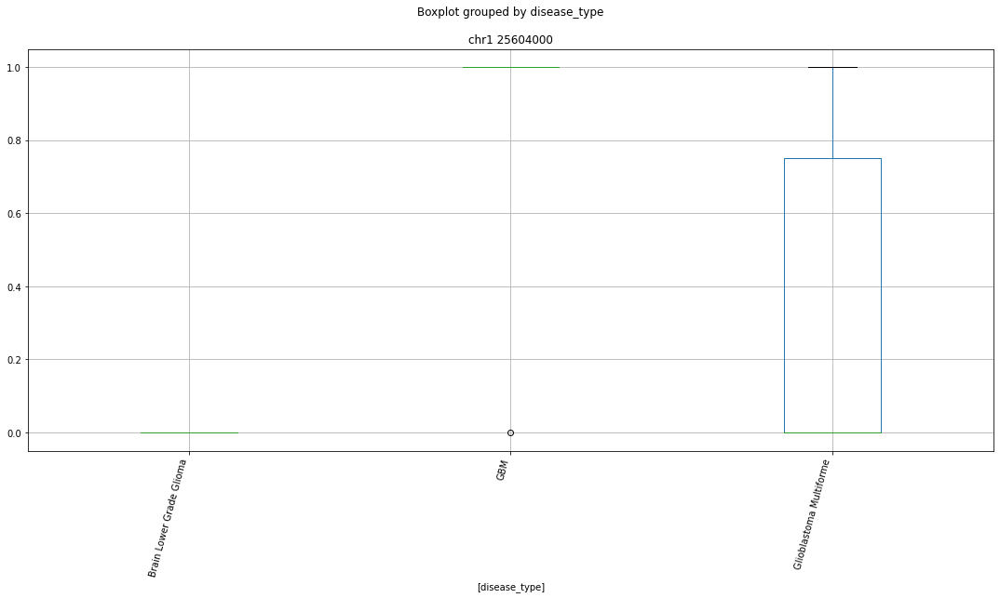

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr4 37670000


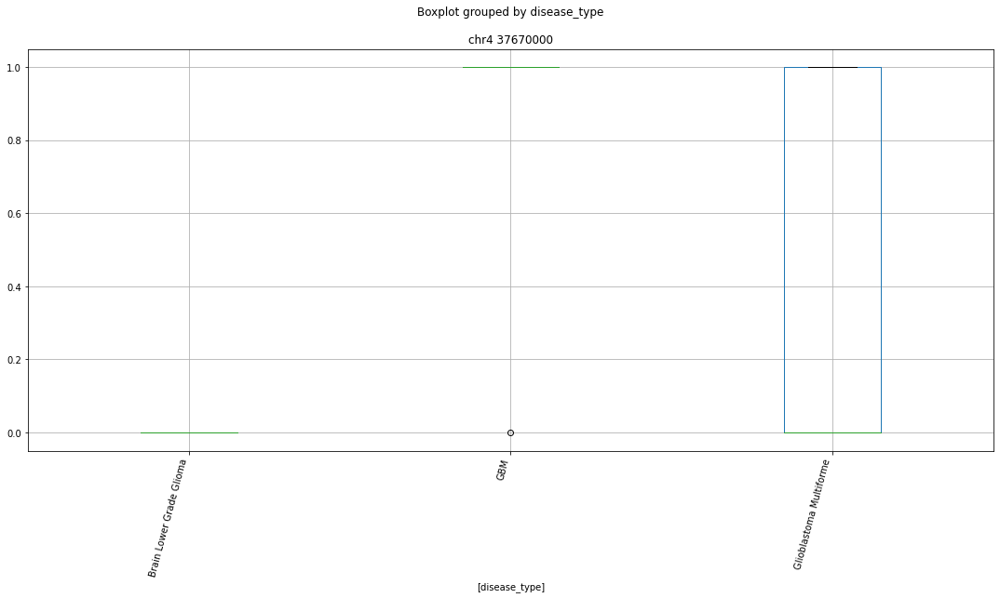

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr10 70686000


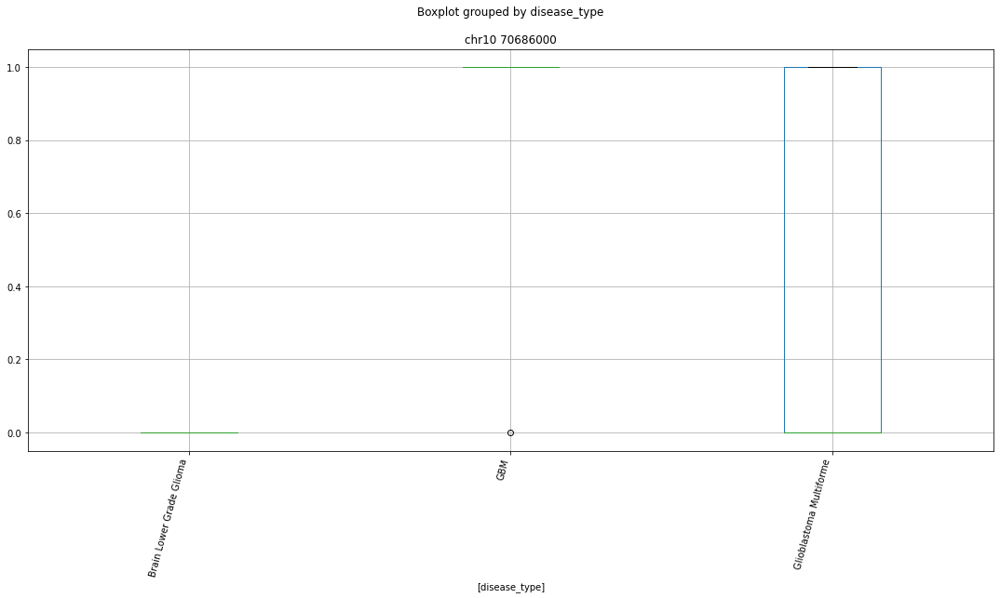

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr11 6690000


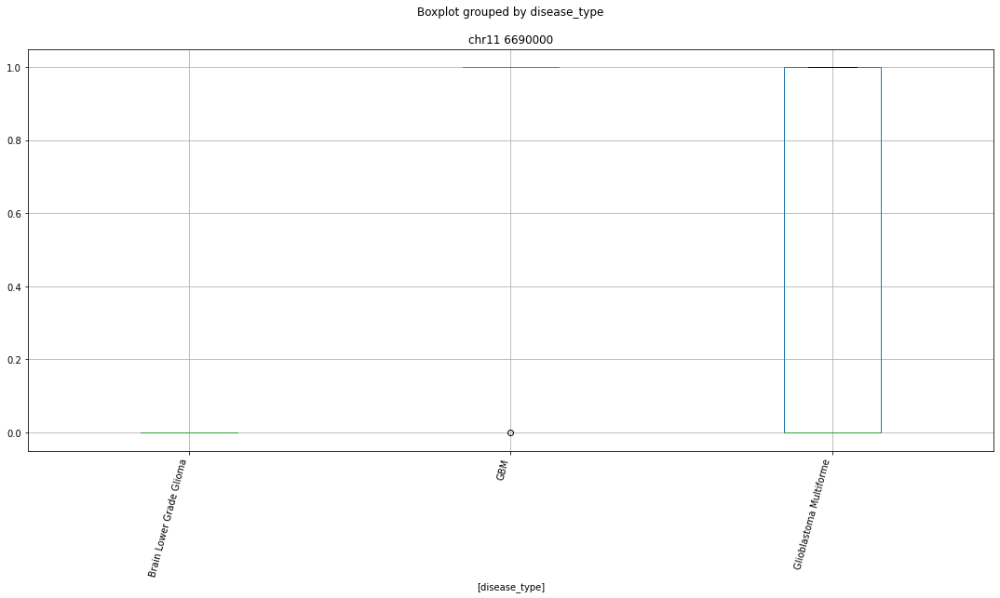

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr5 65941000


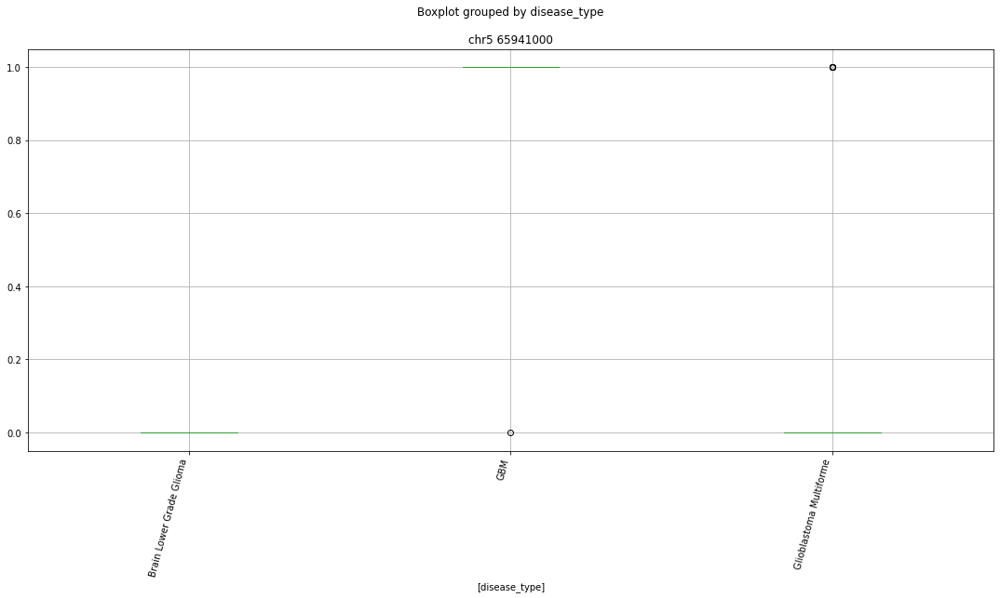

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr19 23532000


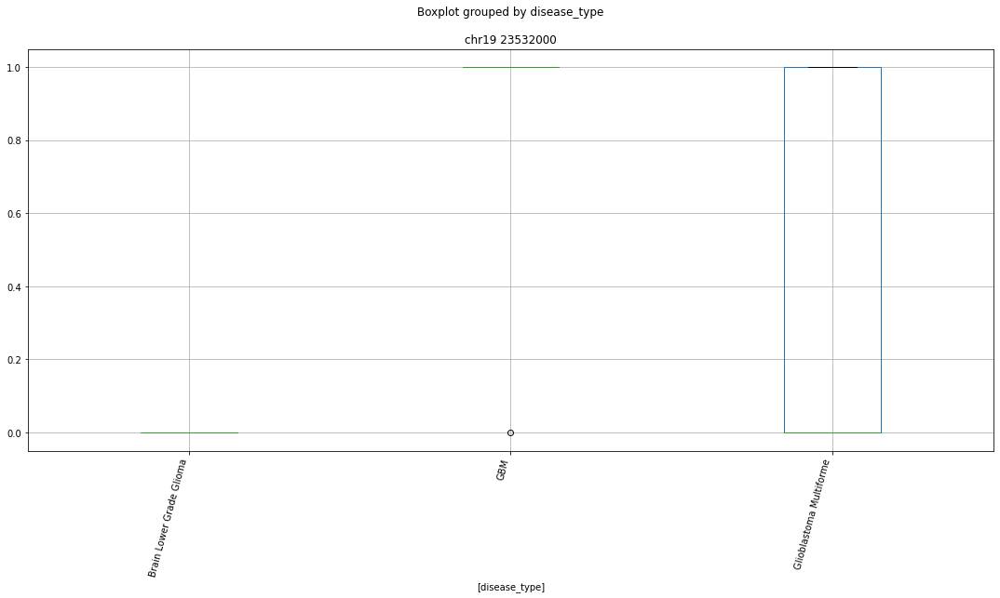

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr7 101093000


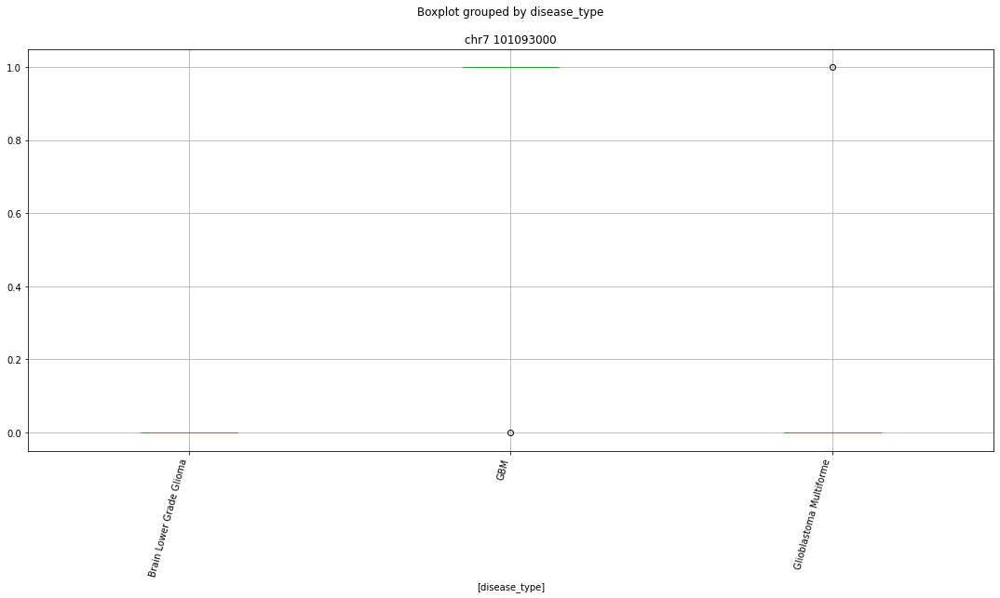

 p : 9.057401972023165e-28  ( t : 22.087732444239315 ) :  chr18 76001000


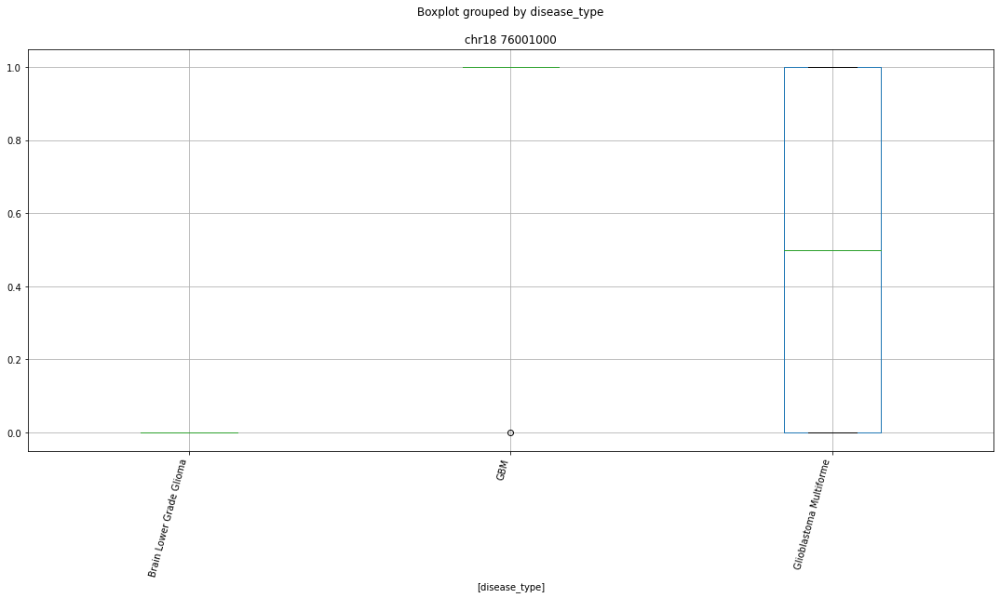

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr19 39959000


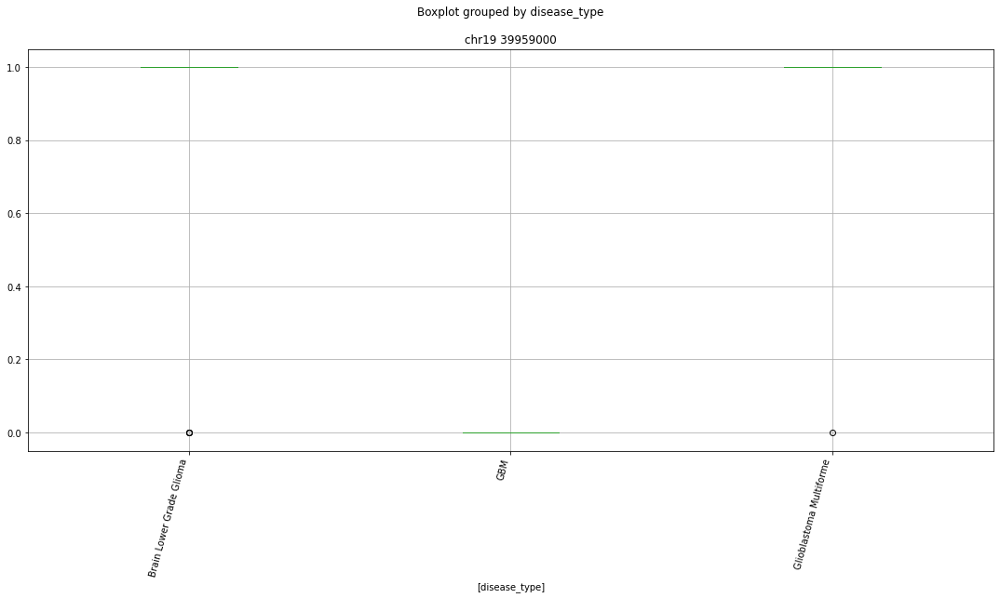

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr11 3398000


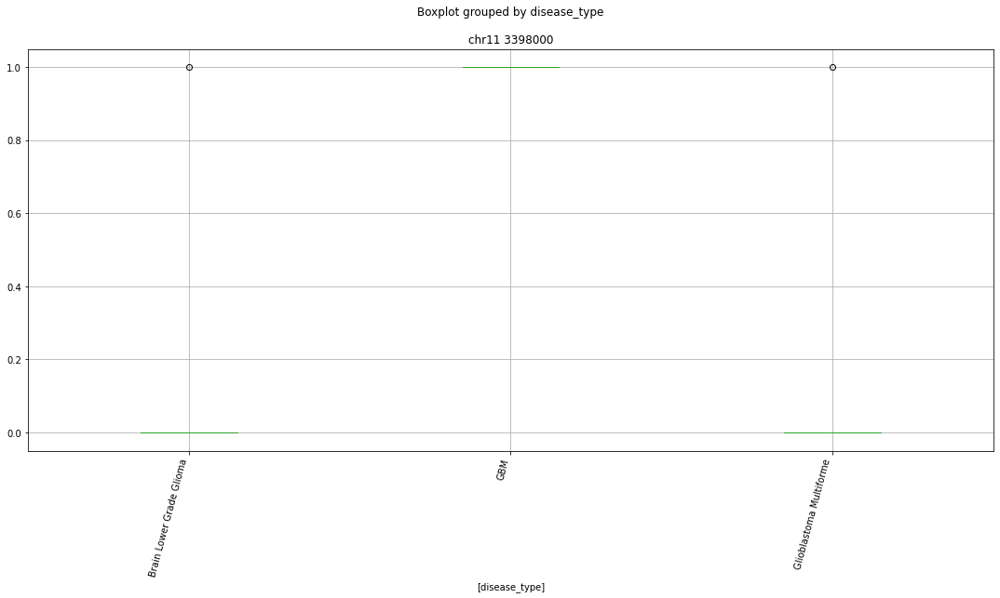

 p : 3.0420357218624253e-25  ( t : 21.041625412500814 ) :  chr17 46283000


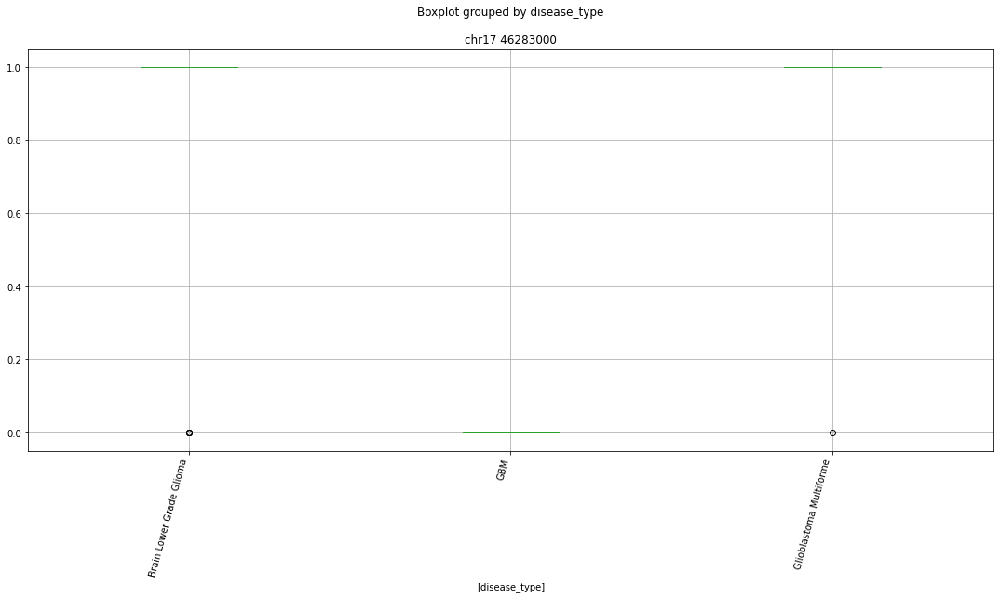

 p : 7.649785019548989e-25  ( t : 20.581140234042756 ) :  chr2 38756000


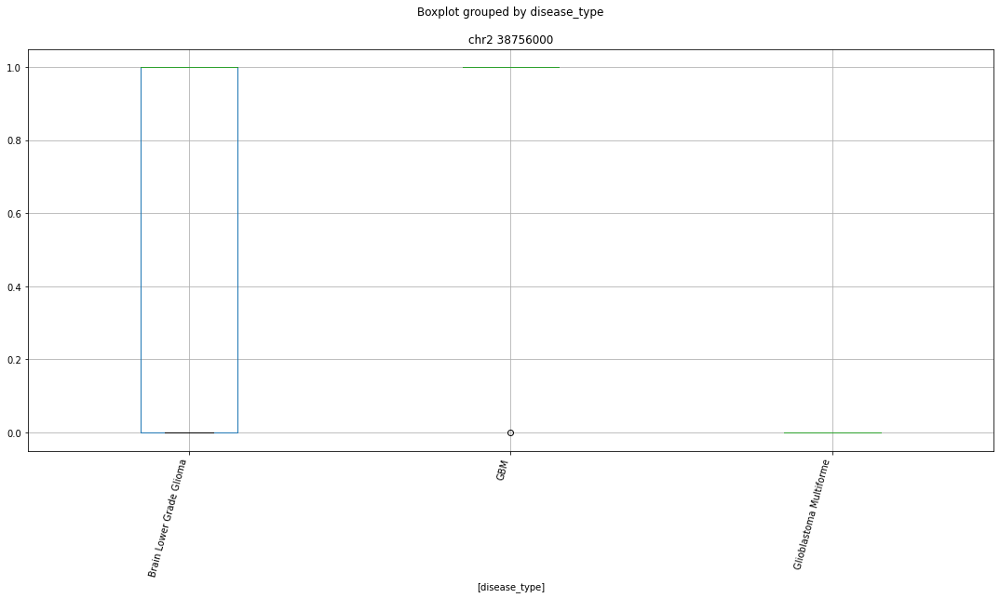

 p : 7.649785019548989e-25  ( t : 20.581140234042756 ) :  chr3 61672000


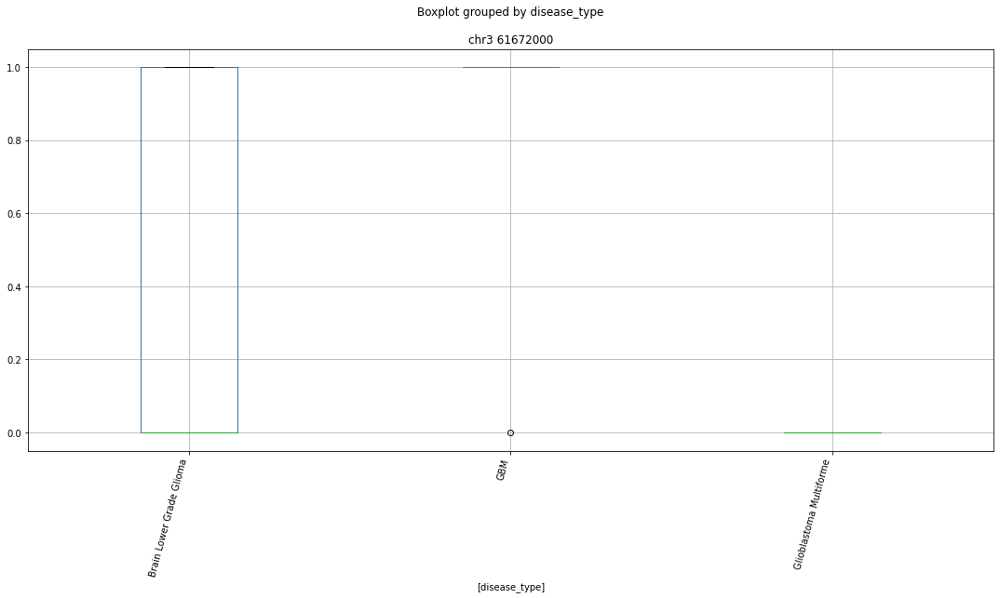

 p : 2.8371647709053813e-21  ( t : 15.78690644471993 ) :  chr15 45292000


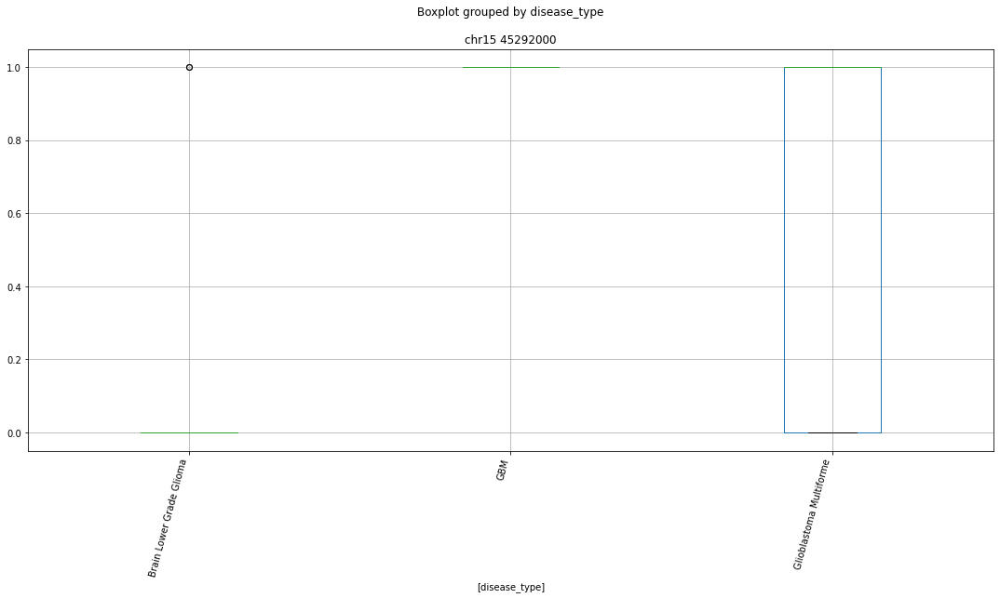

 p : 2.887102389033911e-21  ( t : 13.486167444043069 ) :  chr11 61167000


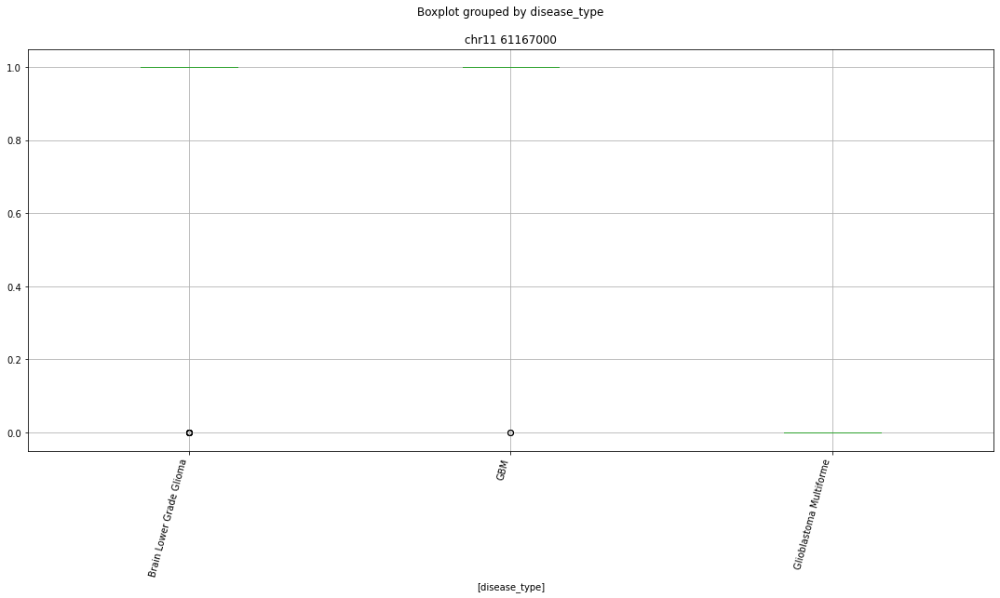

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr15 72102000


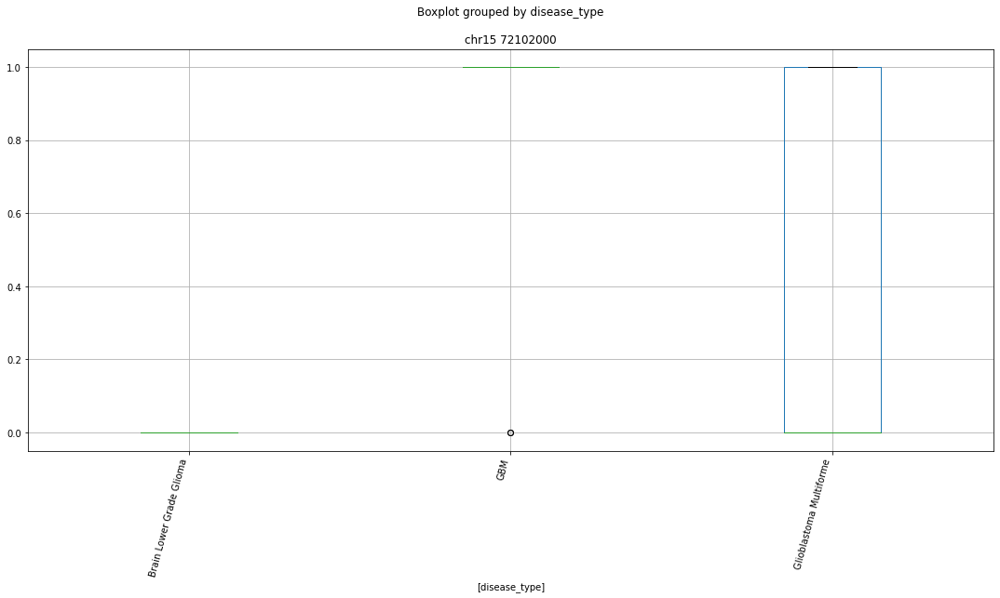

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr4 6836000


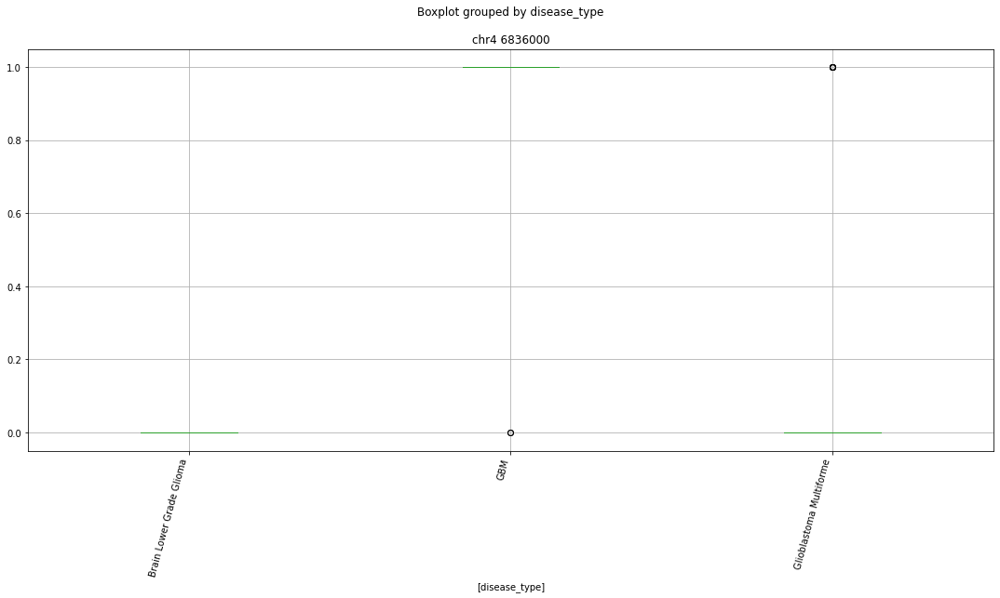

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr12 73853000


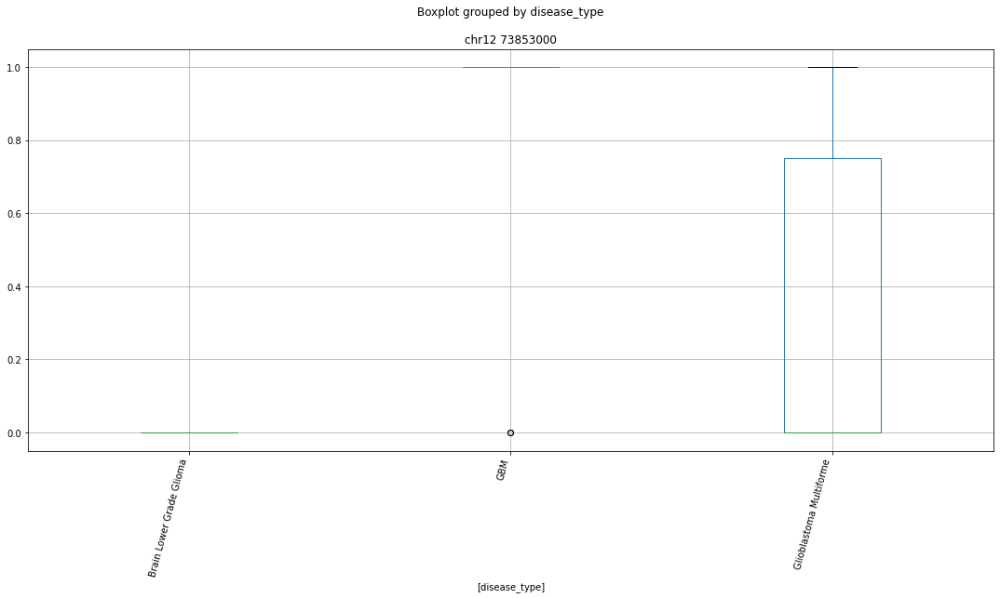

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr12 48915000


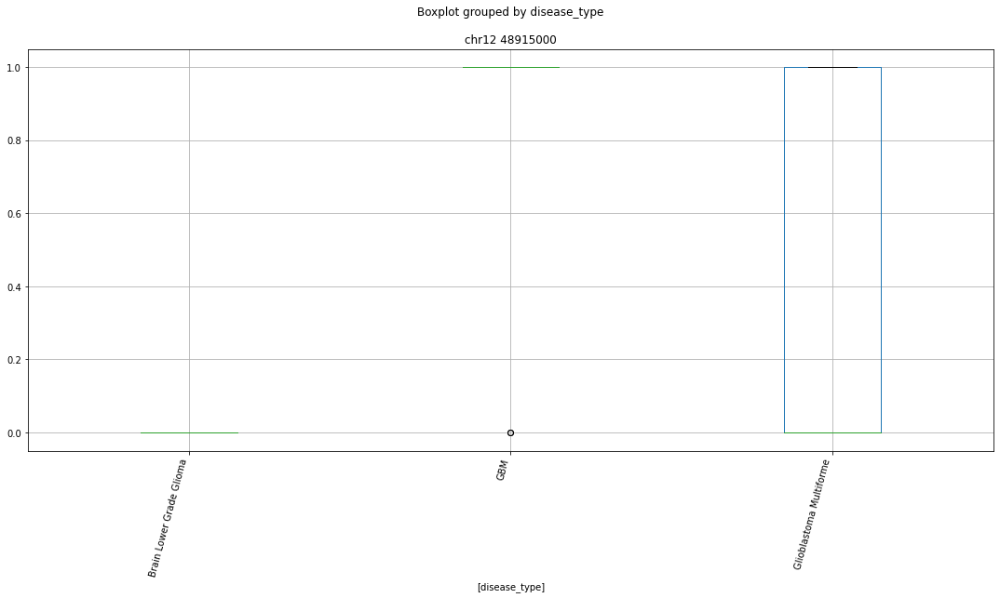

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr2 202714000


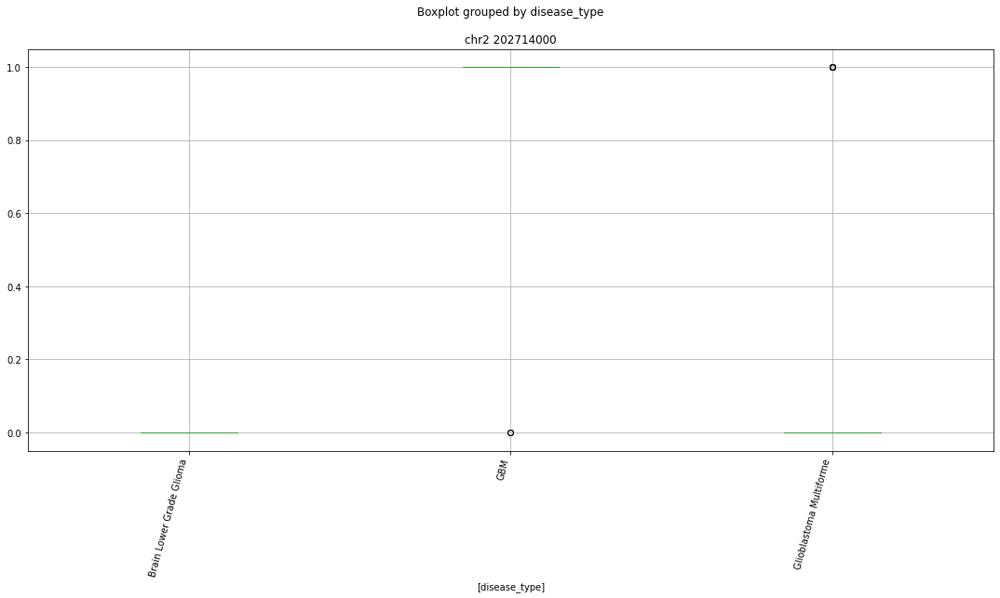

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr20 45645000


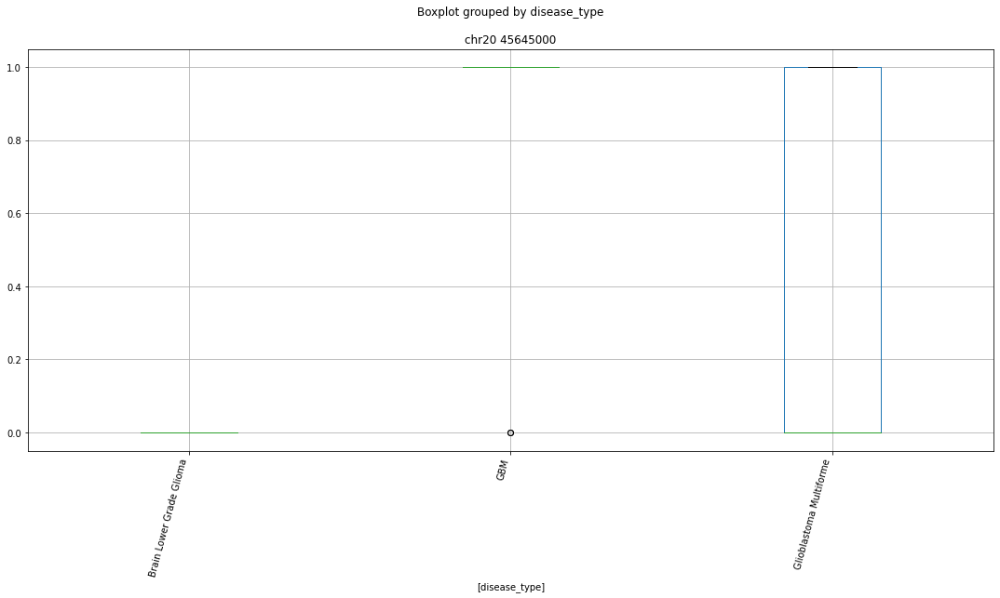

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr4 151732000


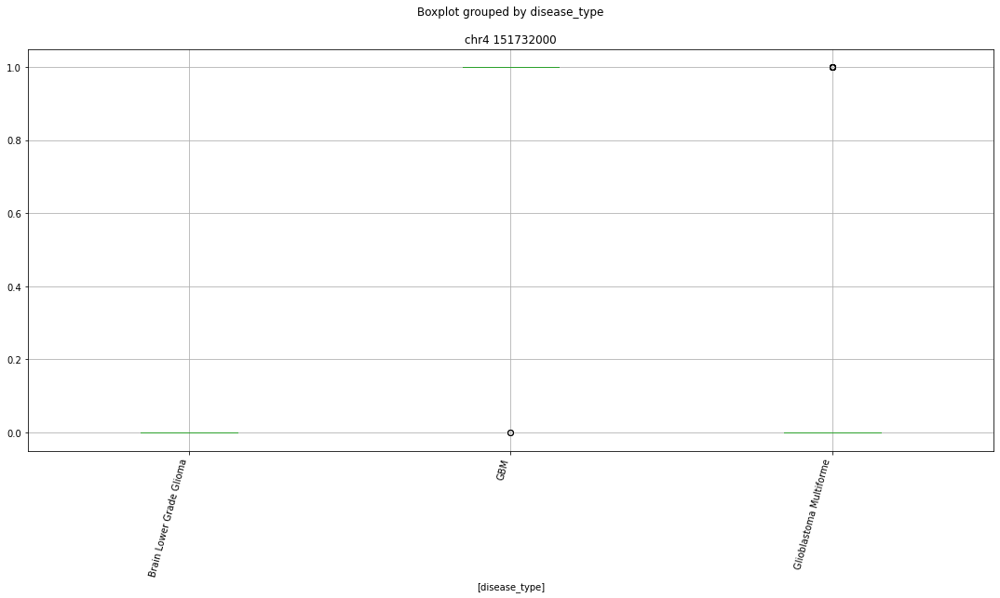

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr2 27556000


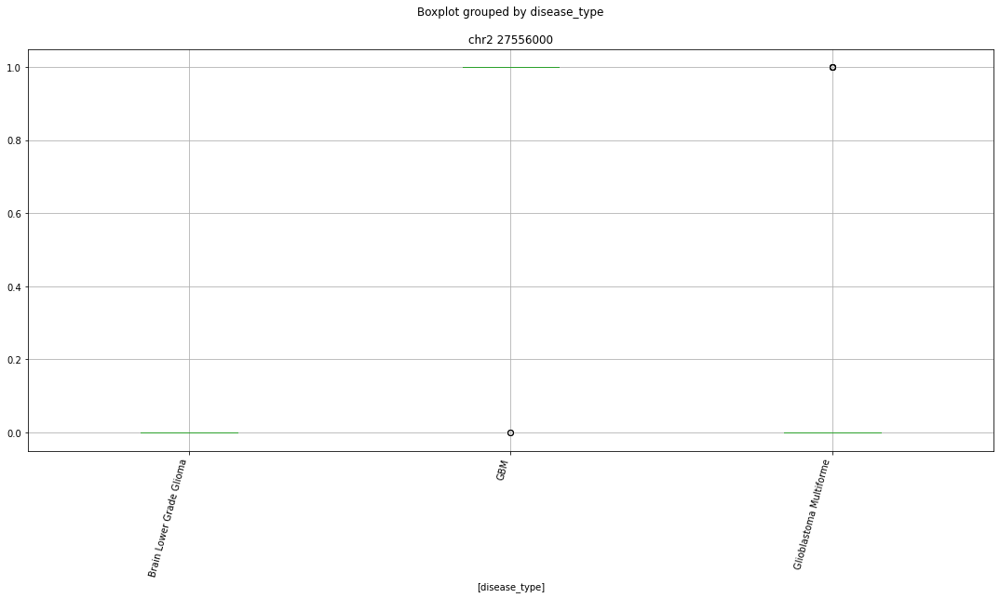

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr1 109176000


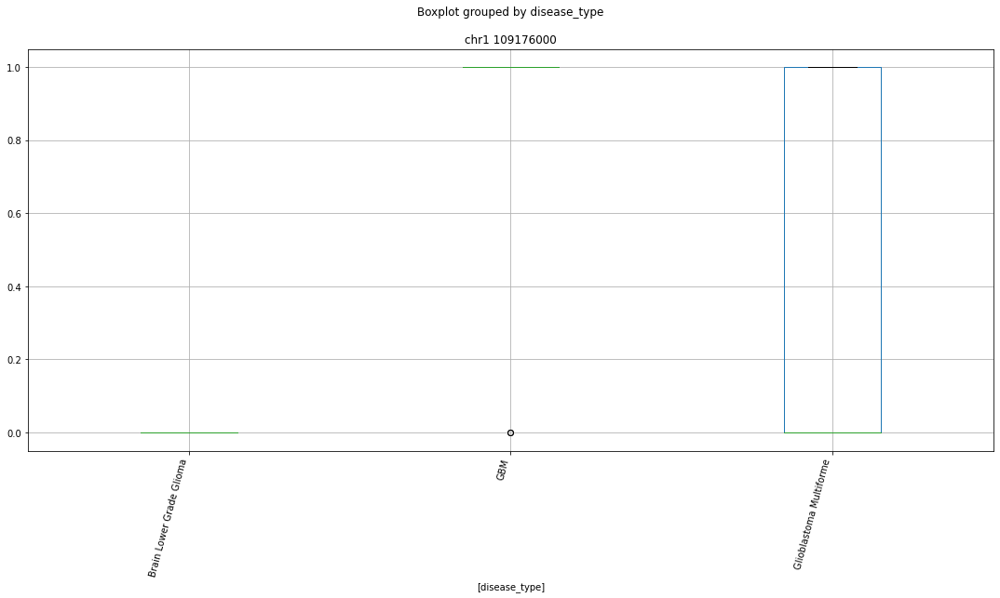

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr8 116680000


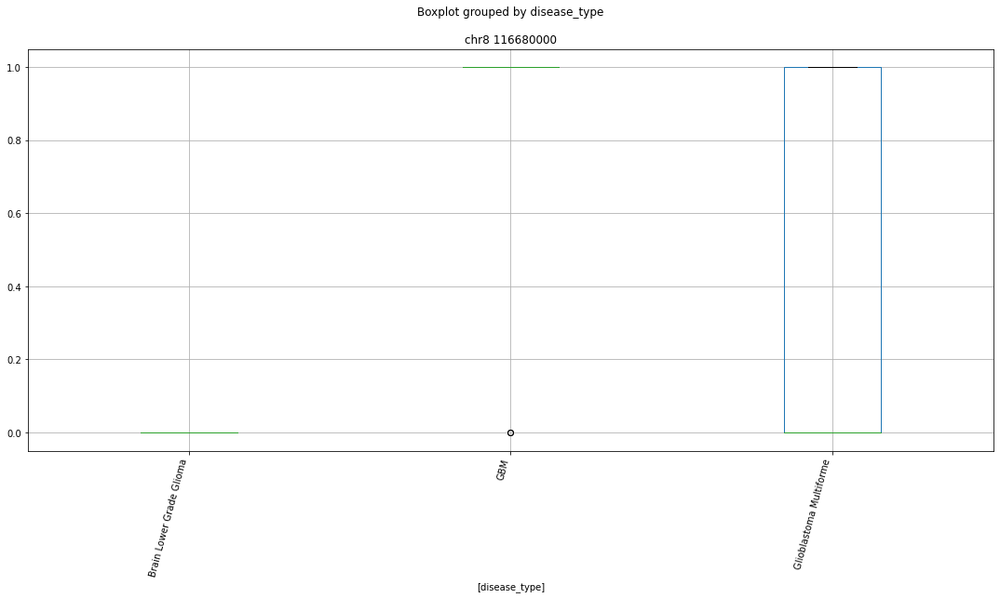

 p : 2.4075104891809472e-20  ( t : 15.005659309765589 ) :  chr8 141201000


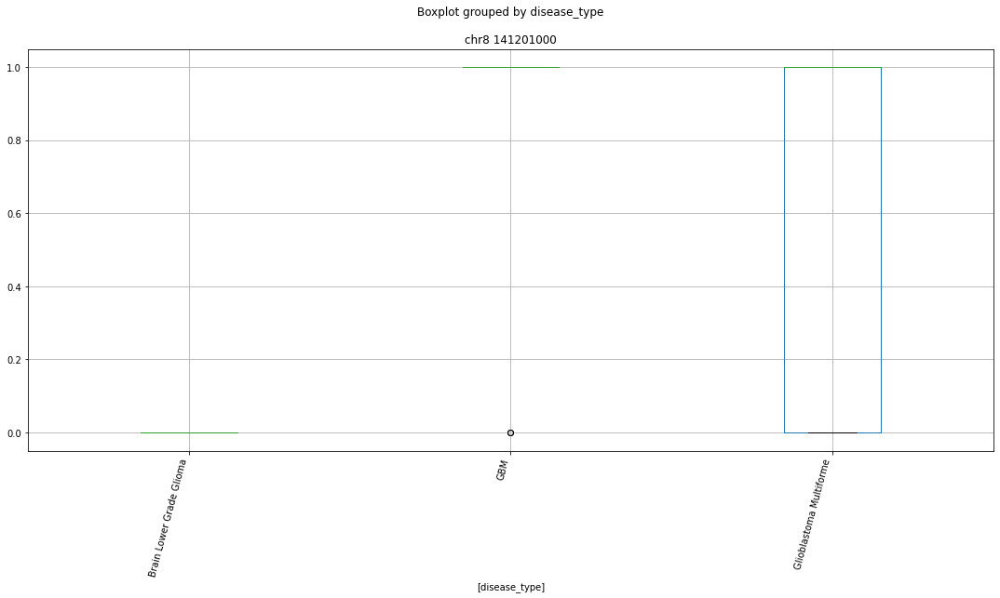

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr8 5726000


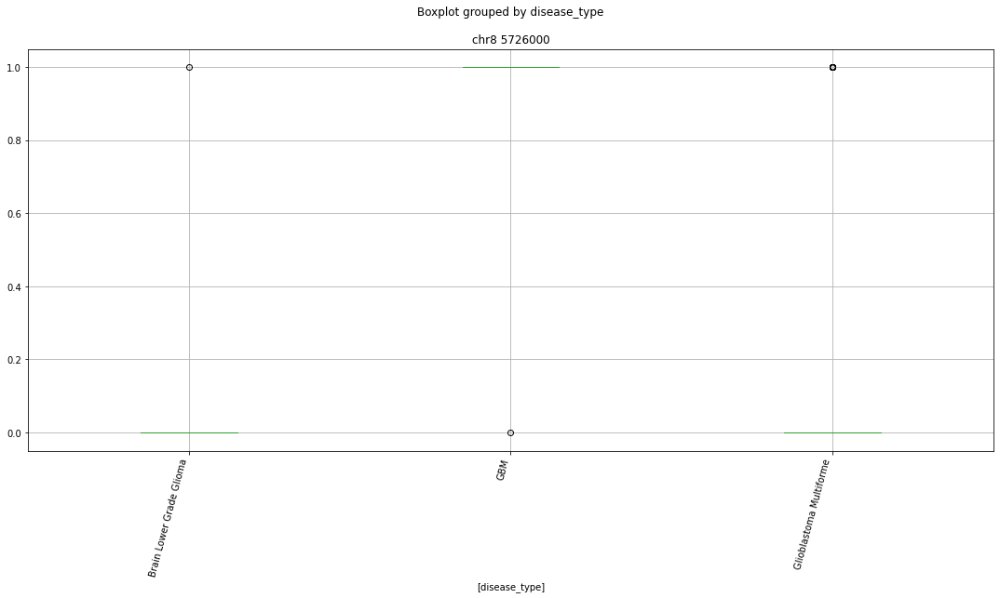

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr10 28934000


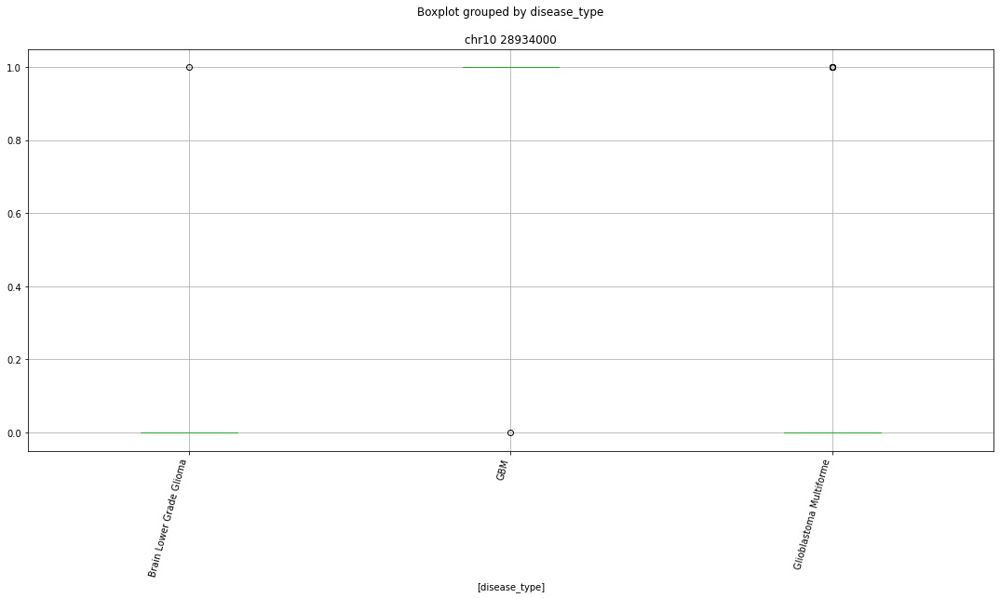

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr3 196974000


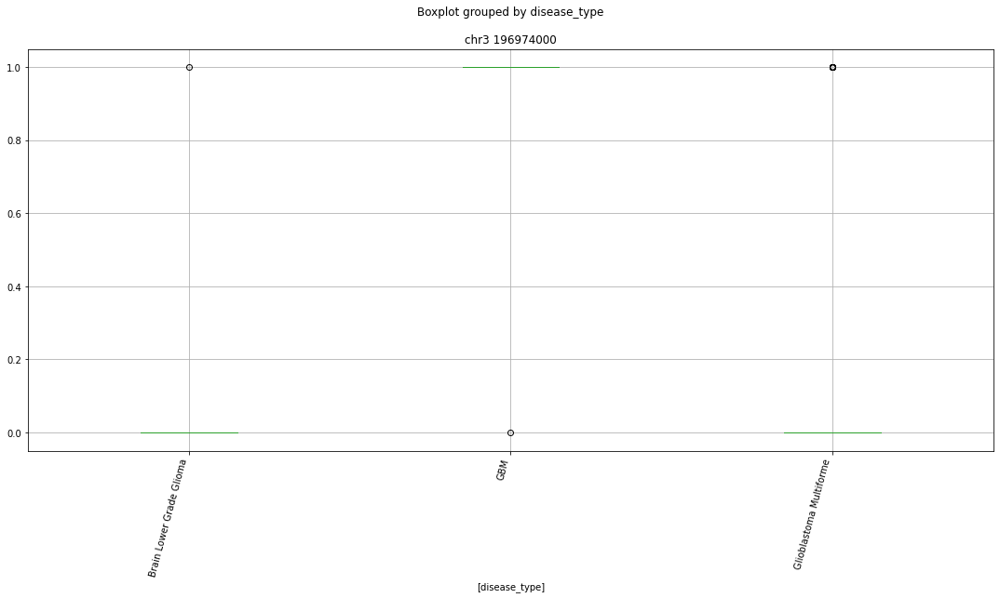

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr15 52286000


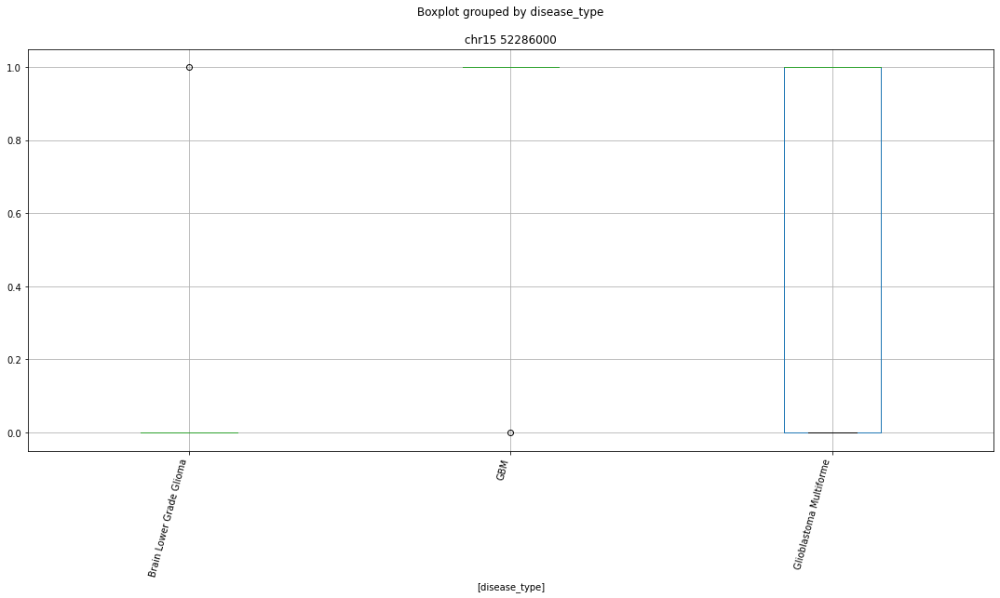

 p : 2.4234851722849214e-20  ( t : 15.003282913852896 ) :  chr3 50310000


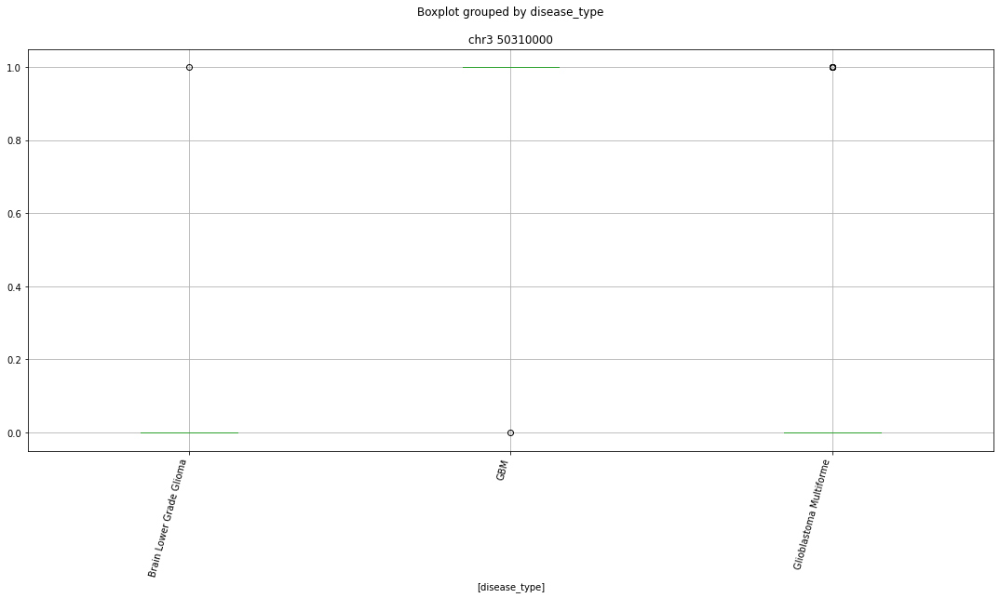

 p : 6.052106007130182e-19  ( t : 14.651507317223937 ) :  chr1 108518000


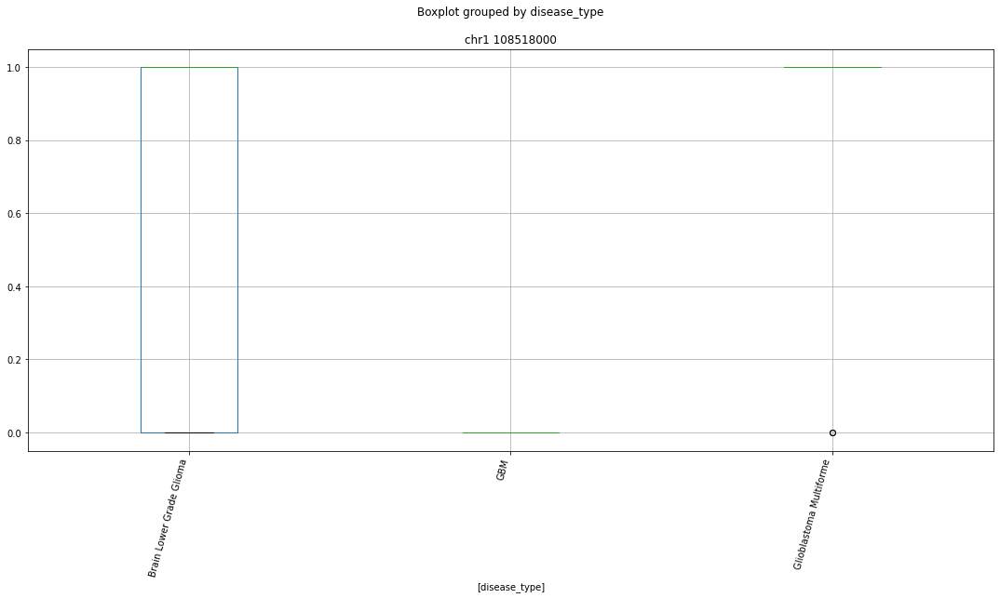

 p : 3.5344159057936754e-18  ( t : 13.982131454109561 ) :  chr11 61167000


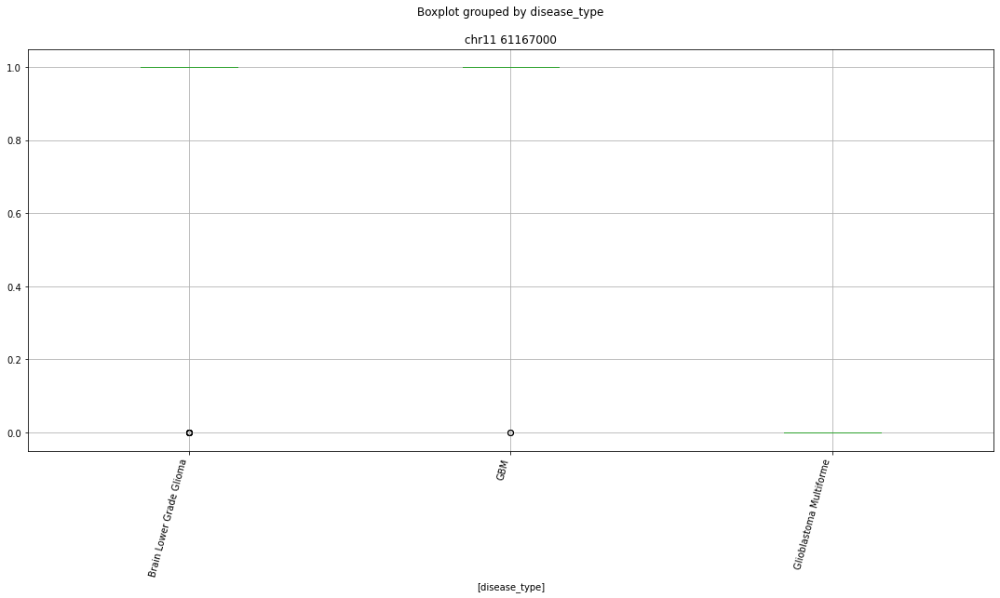

 p : 4.006343388130227e-18  ( t : 13.935349037694028 ) :  chr7 101093000


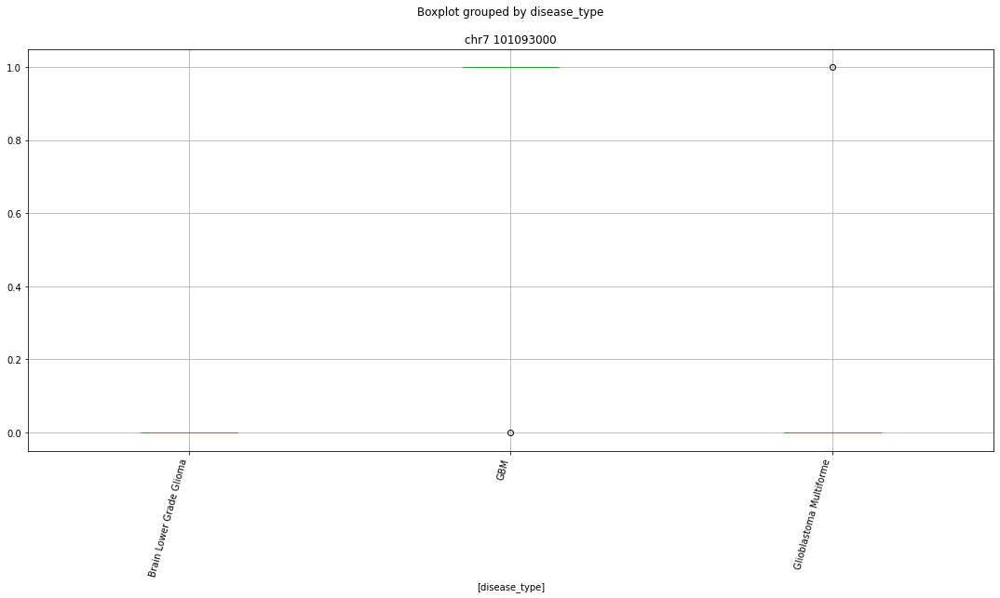

 p : 1.4682271381516776e-17  ( t : 11.319912144486992 ) :  chr11 83317000


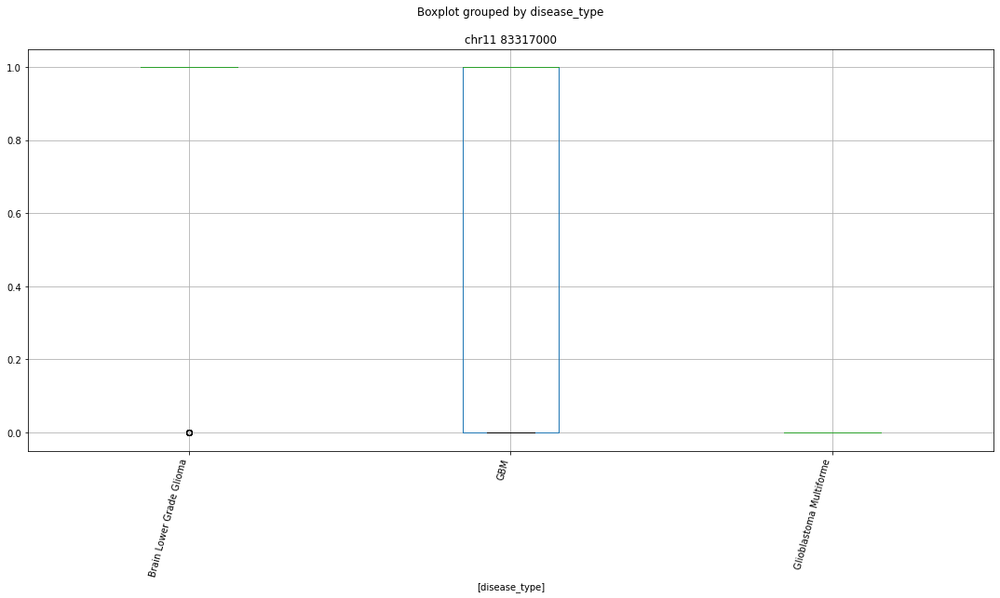

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr4 40146000


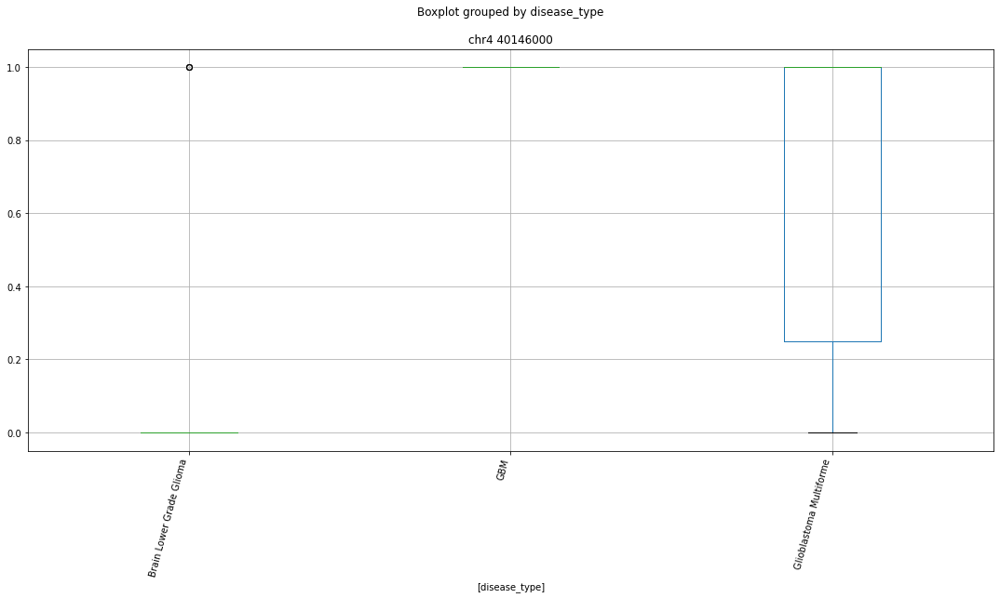

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr19 39959000


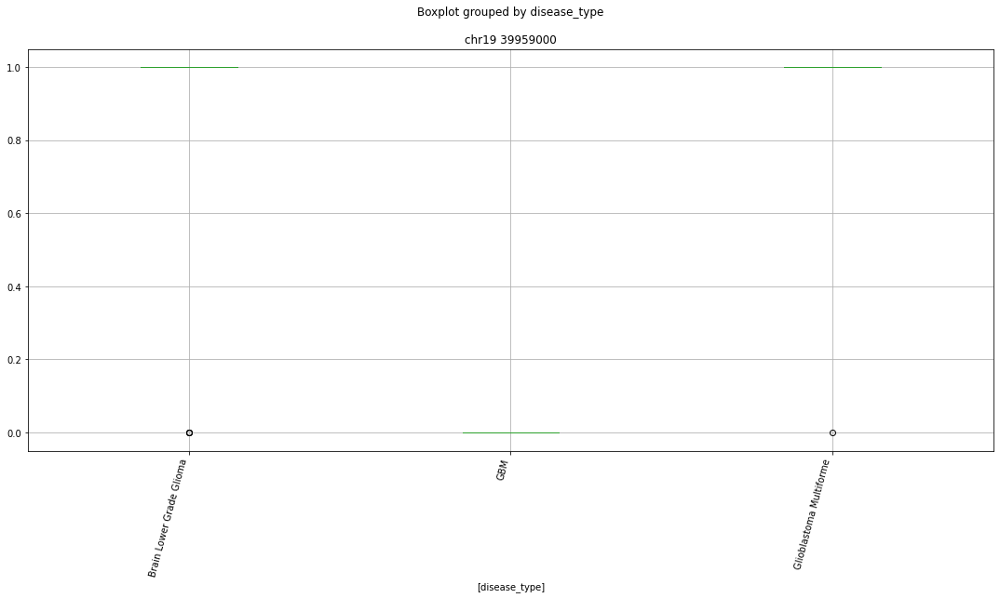

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 23258000


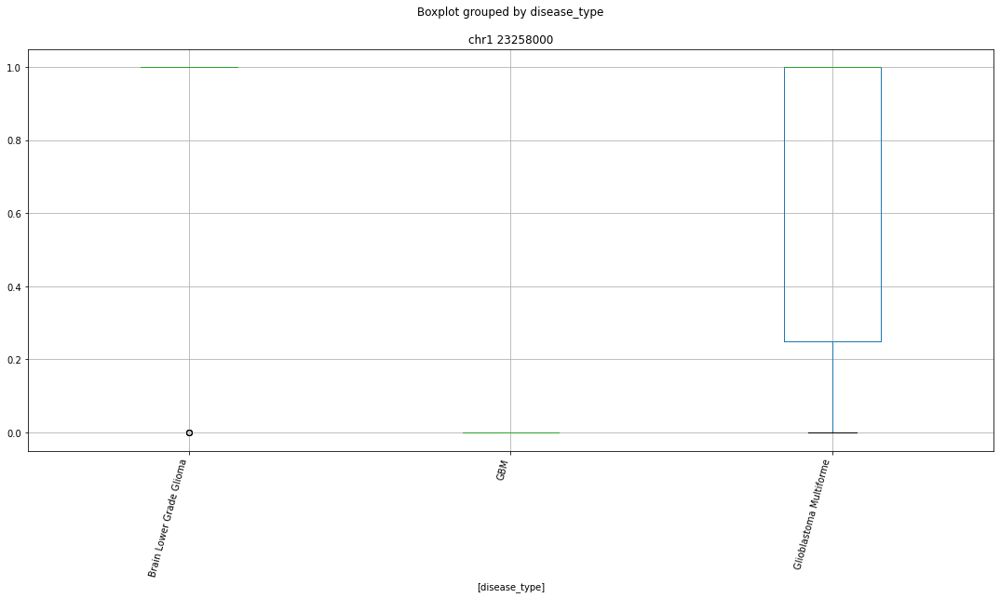

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr11 116348000


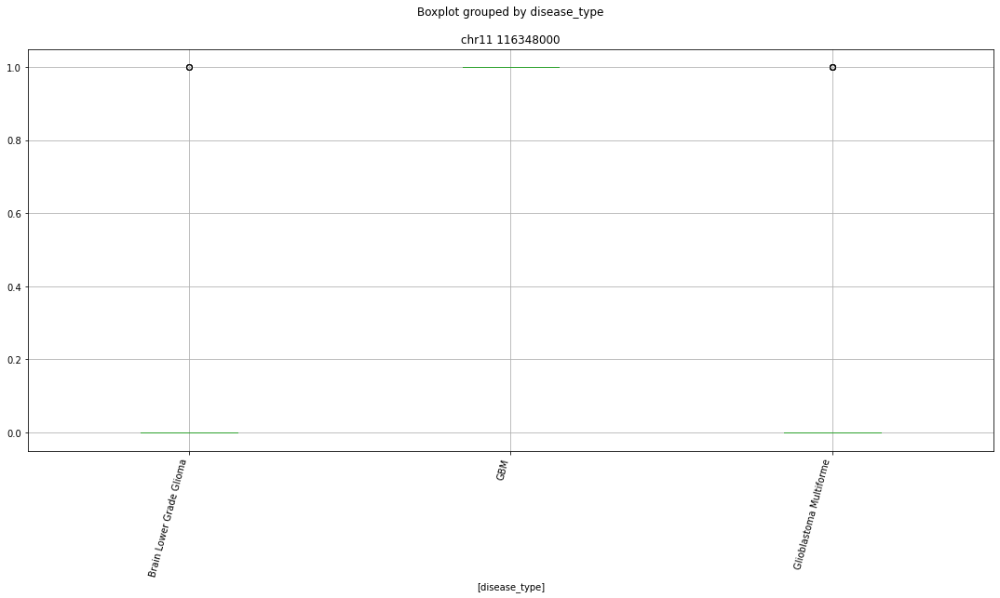

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr7 20669000


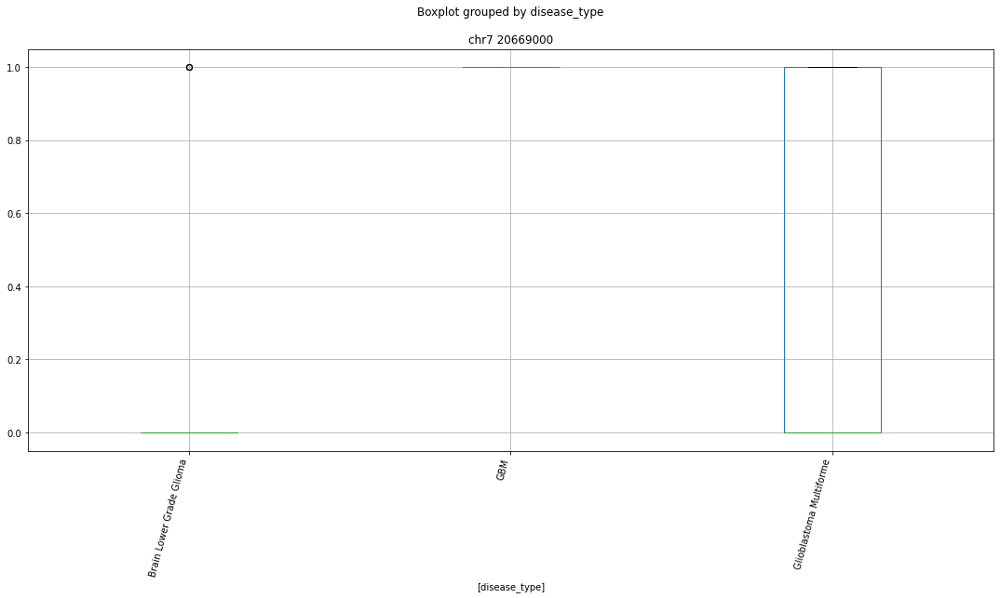

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 226114000


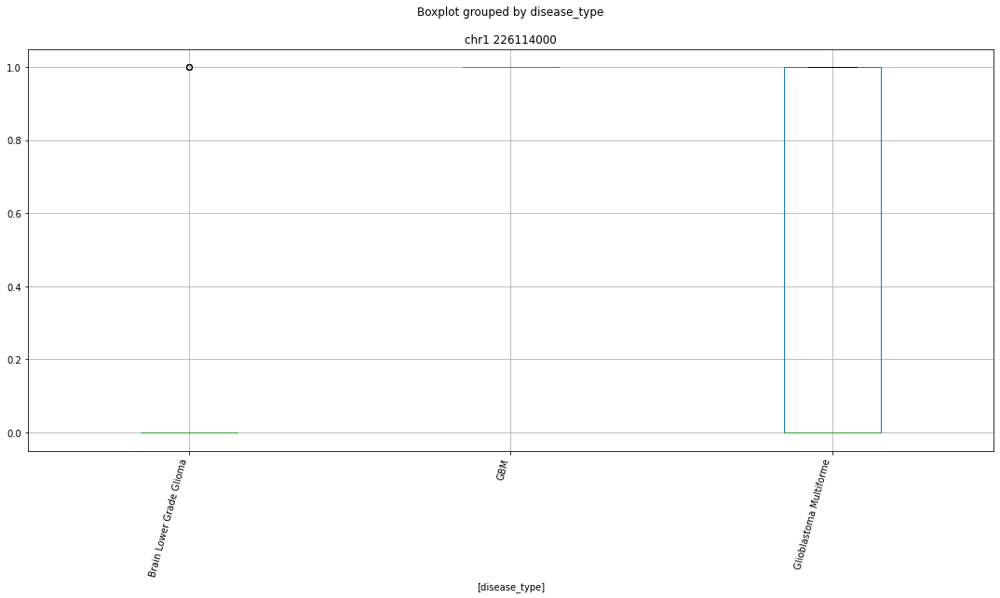

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr1 43502000


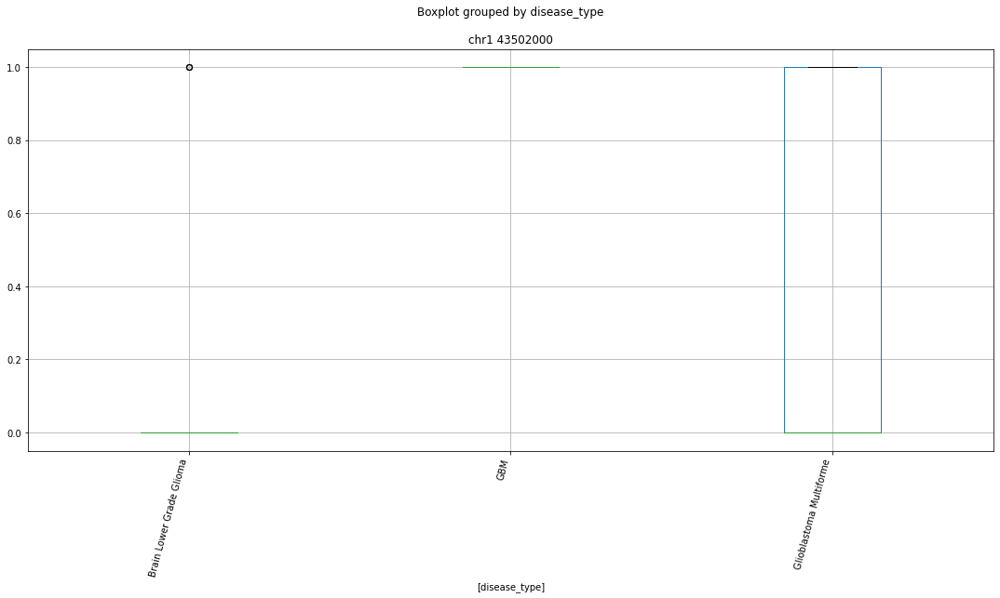

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr14 80287000


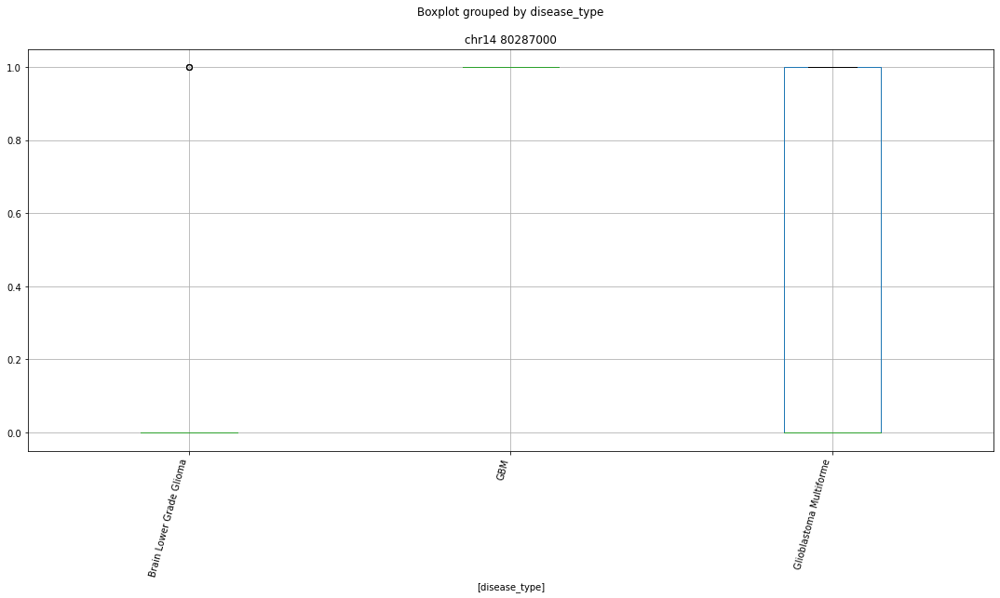

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr9 122711000


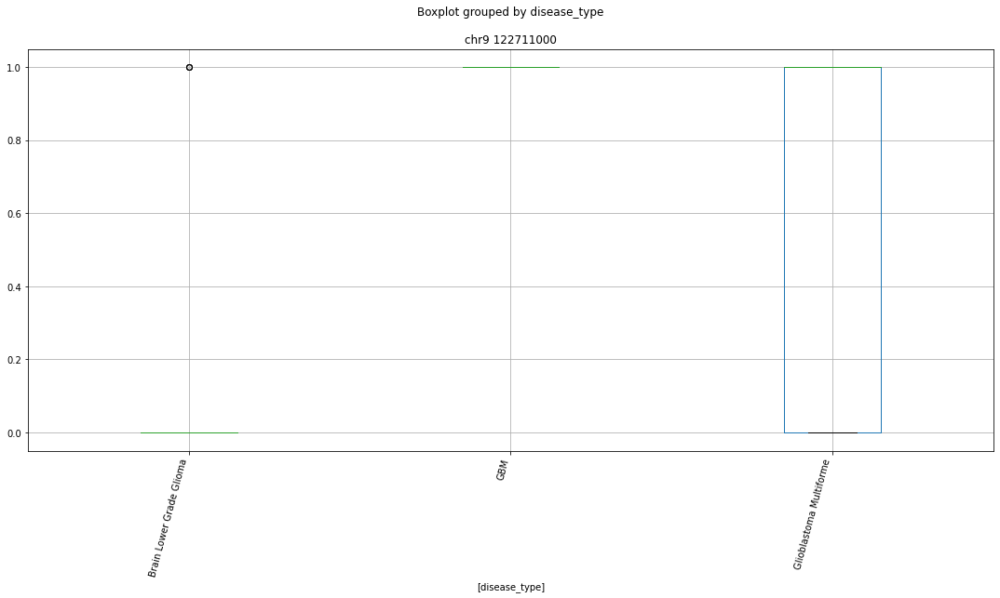

 p : 1.950069771513284e-17  ( t : 12.714573424165305 ) :  chr13 100618000


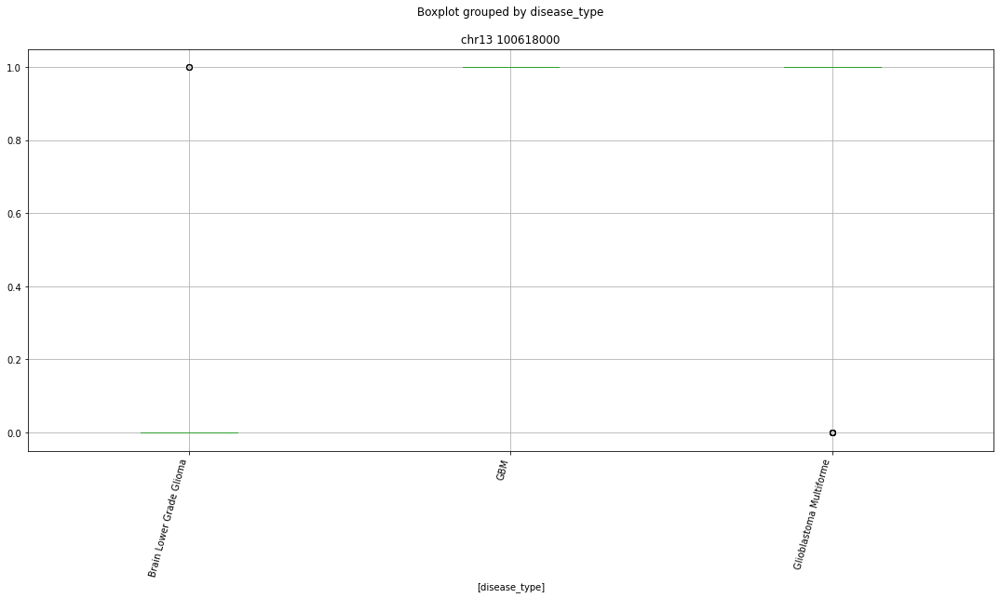

 p : 2.0346699265924837e-16  ( t : 11.961887225105135 ) :  chr5 180530000


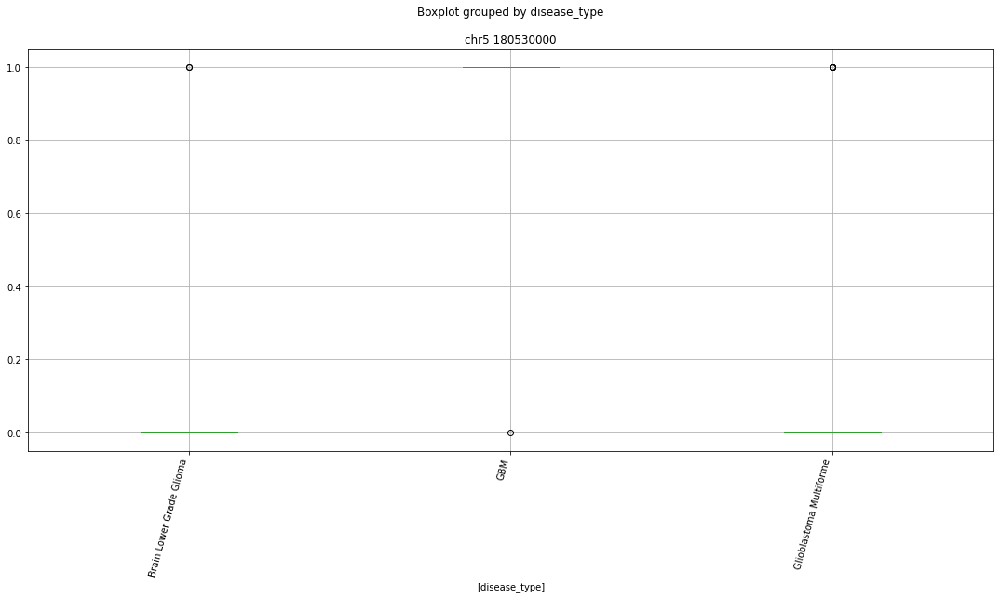

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr1 52182000


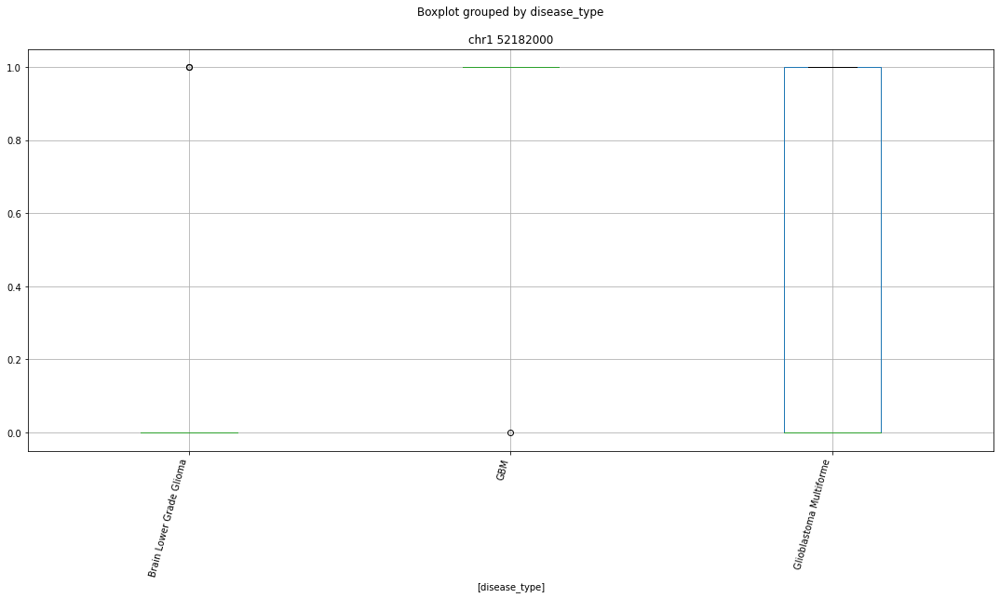

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr14 66544000


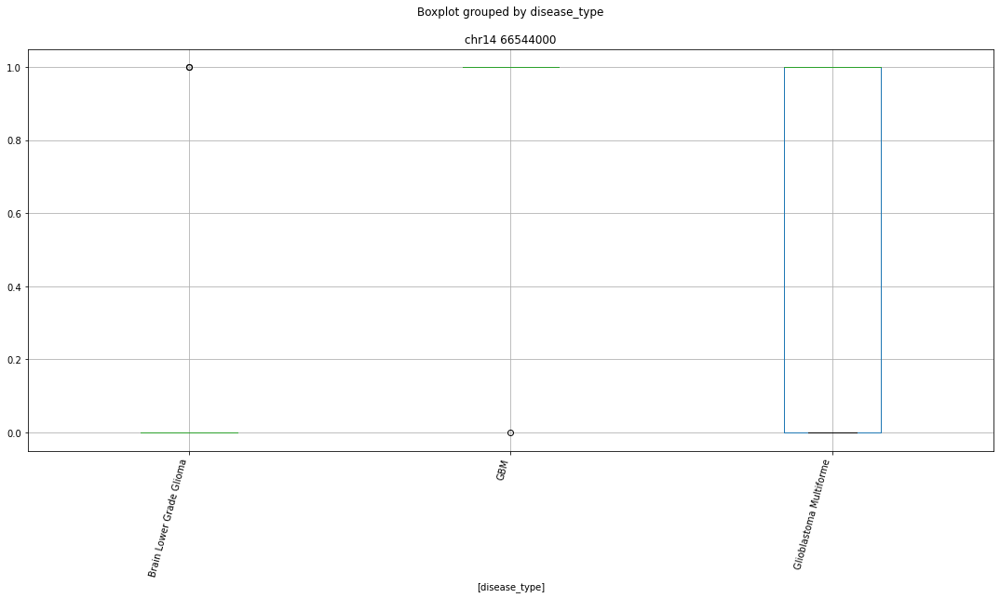

 p : 2.0346699265925125e-16  ( t : 11.961887225105132 ) :  chr11 60492000


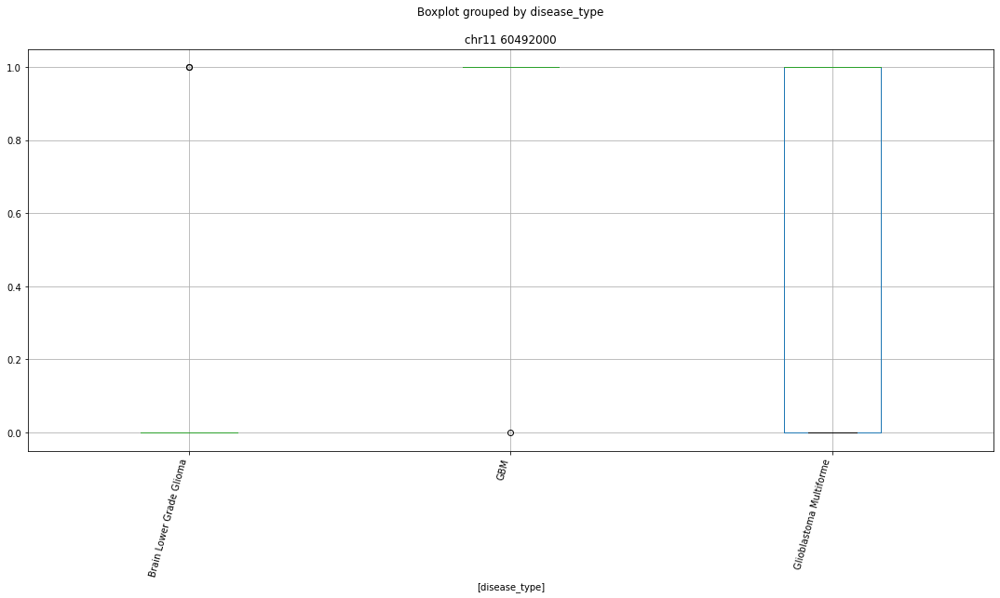

 p : 2.7590440009727814e-16  ( t : 10.605031069679022 ) :  chr2 15610000


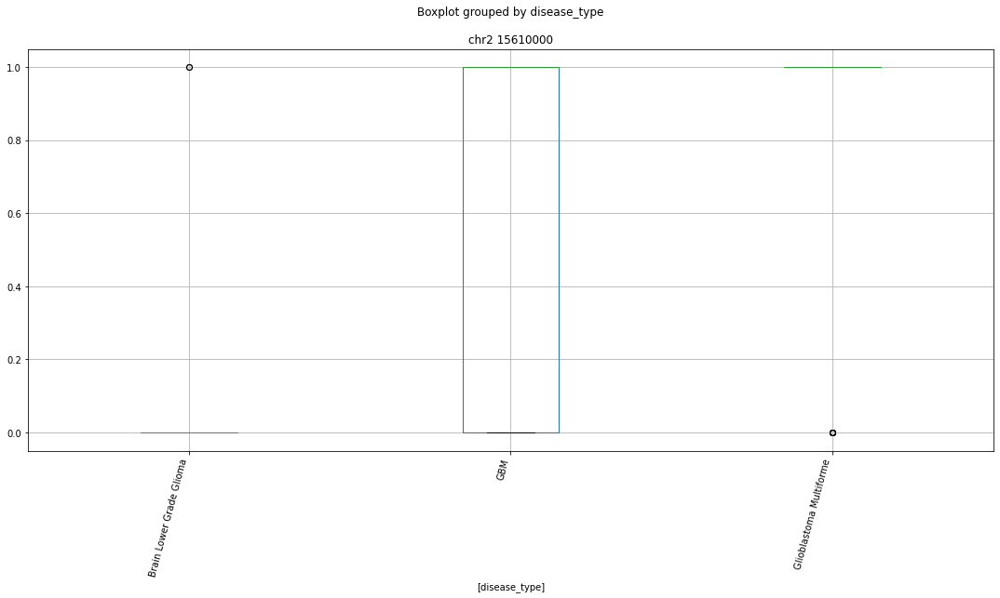

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr4 112957000


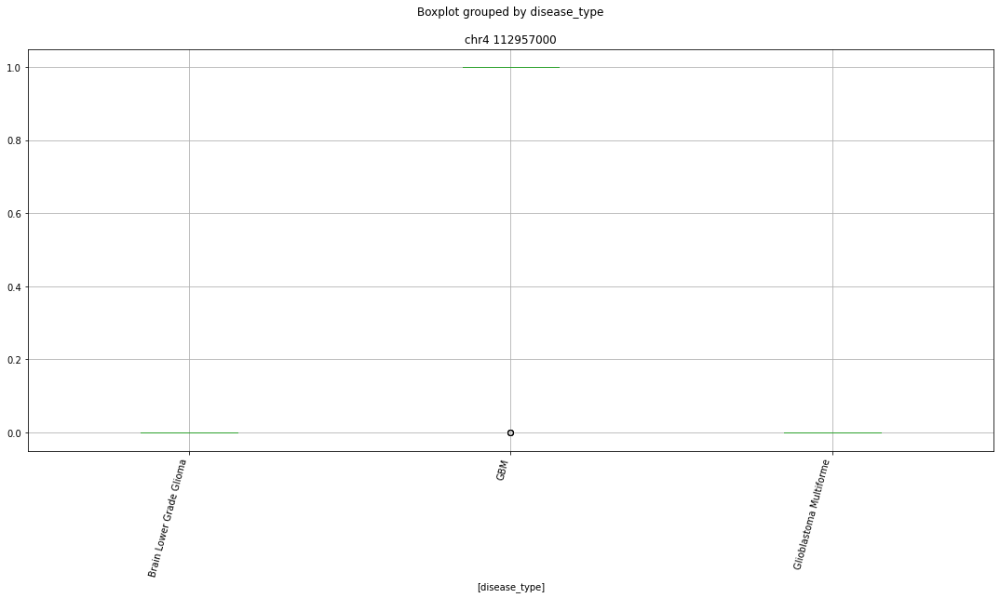

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr10 79278000


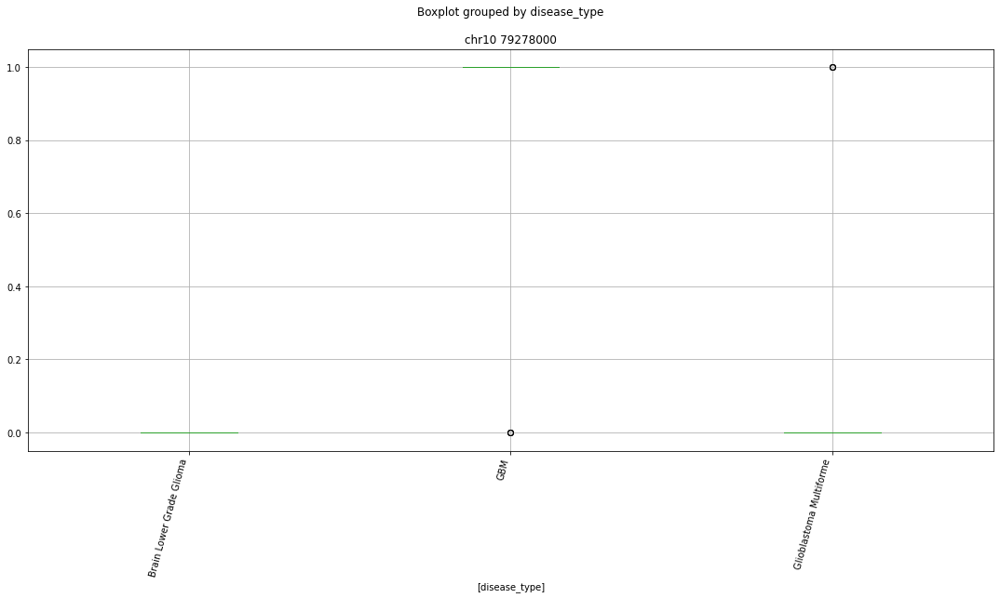

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr10 102300000


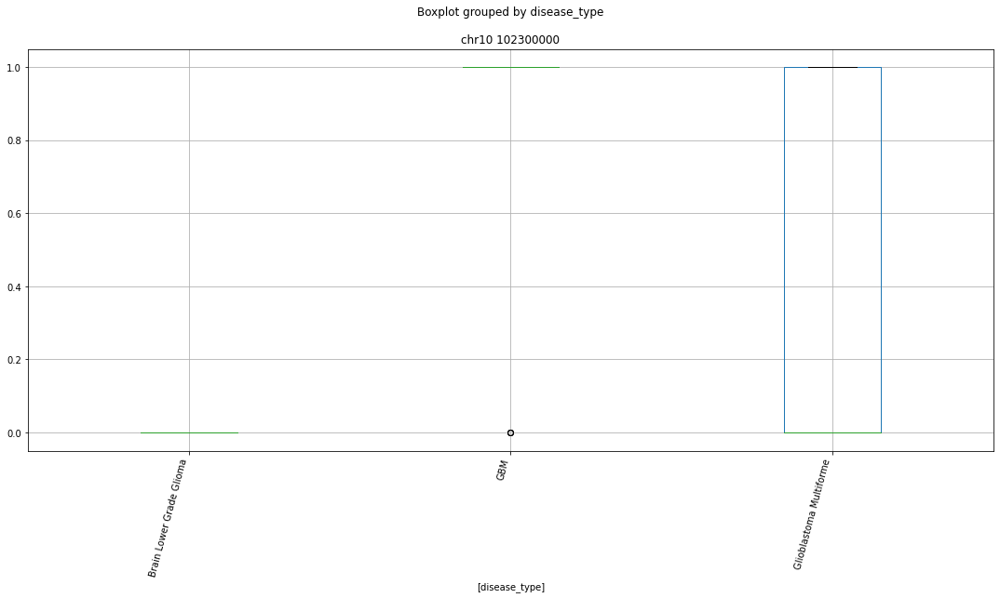

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr3 5283000


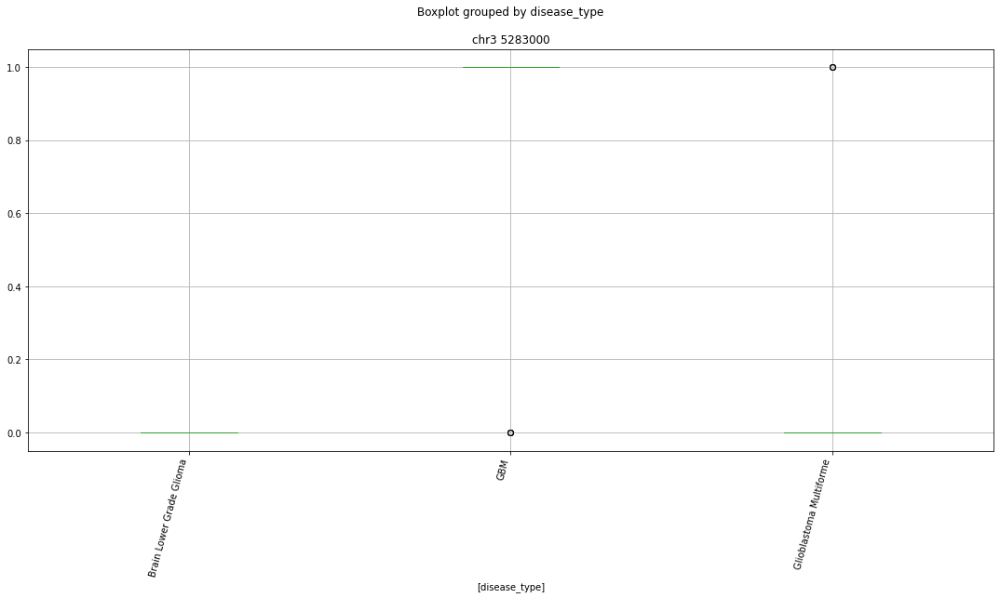

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr13 30838000


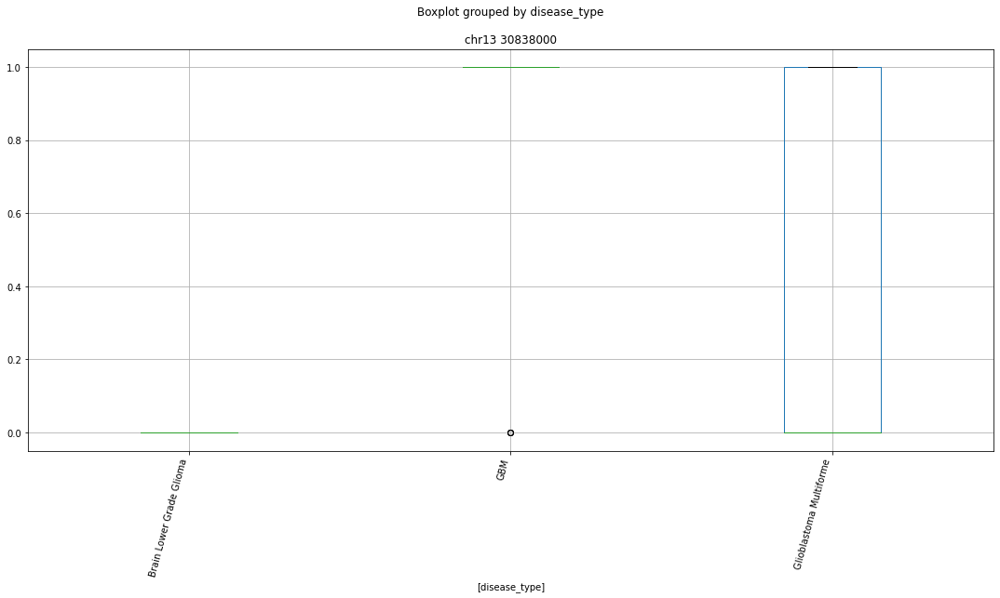

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr3 143046000


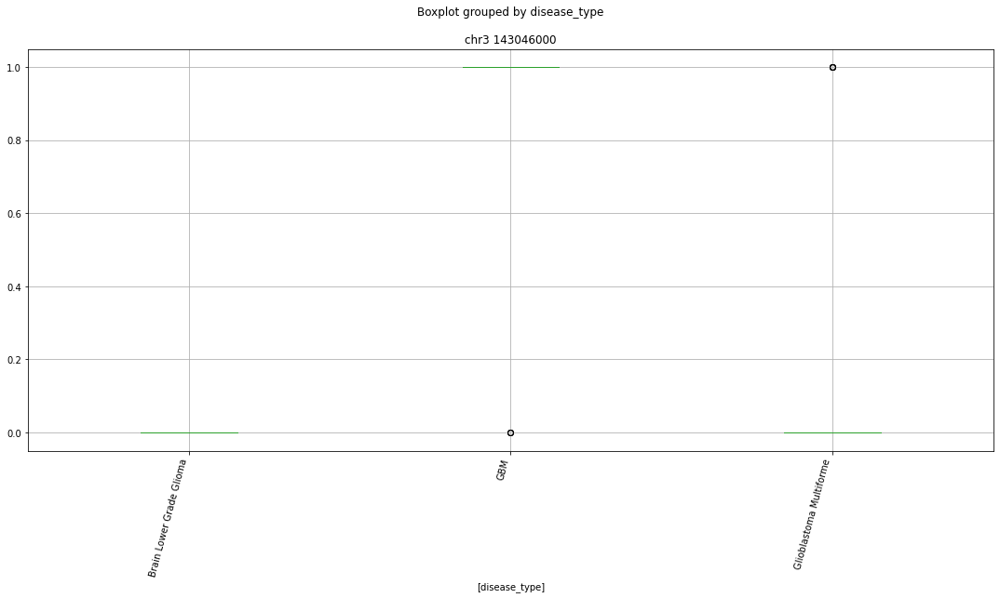

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr17 30978000


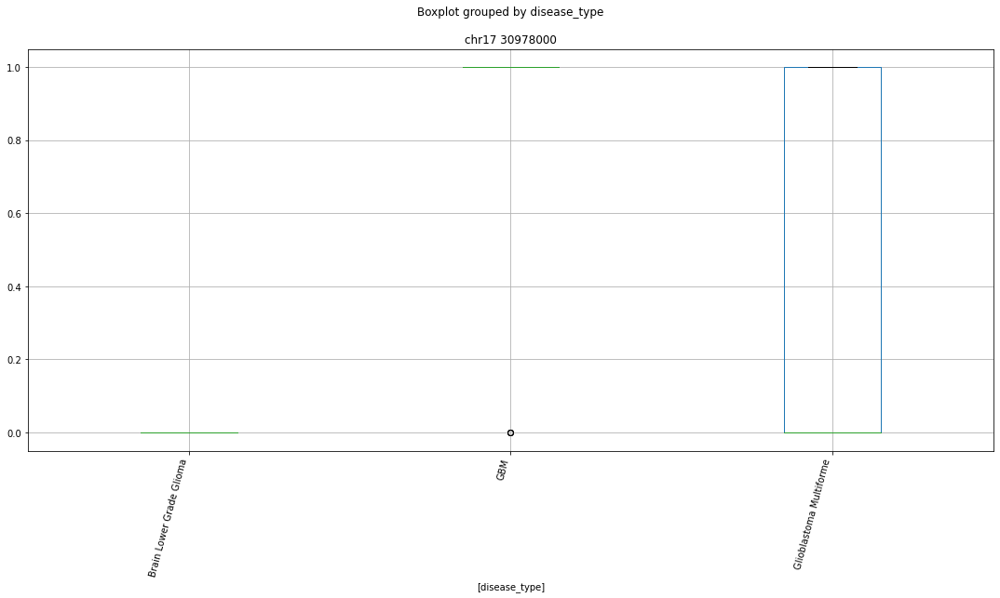

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr1 168207000


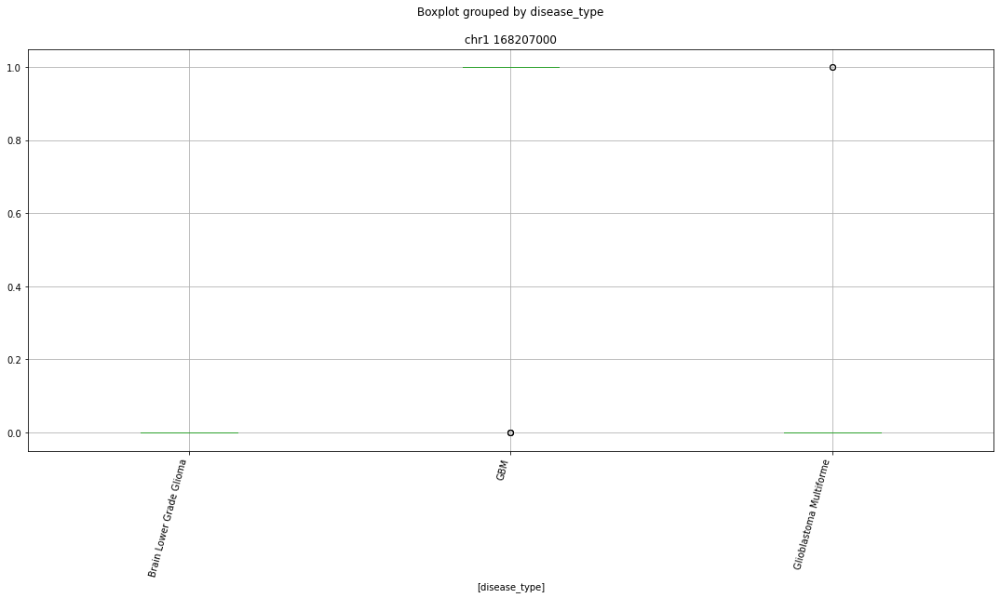

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr14 55919000


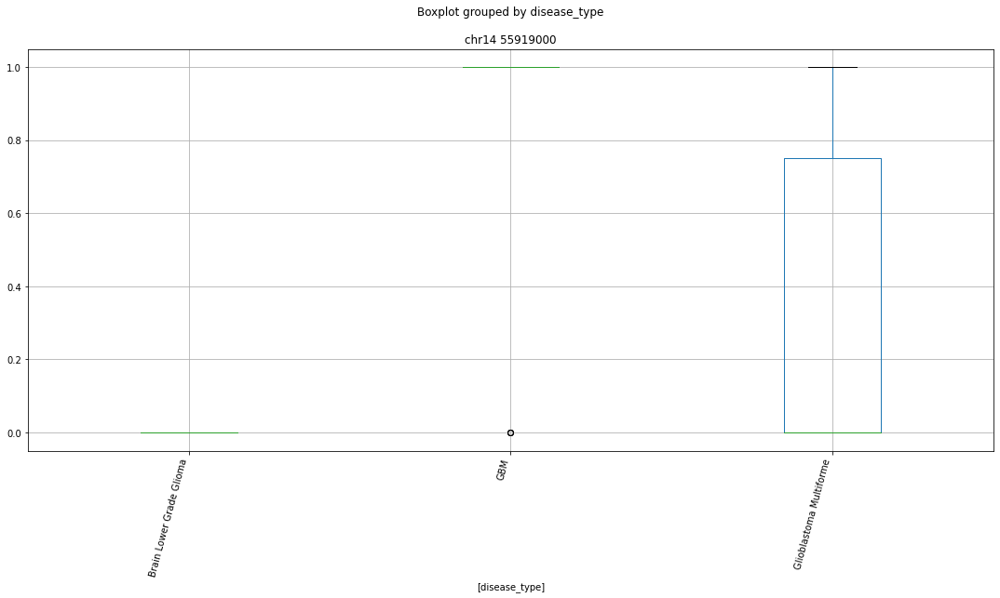

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr16 1600000


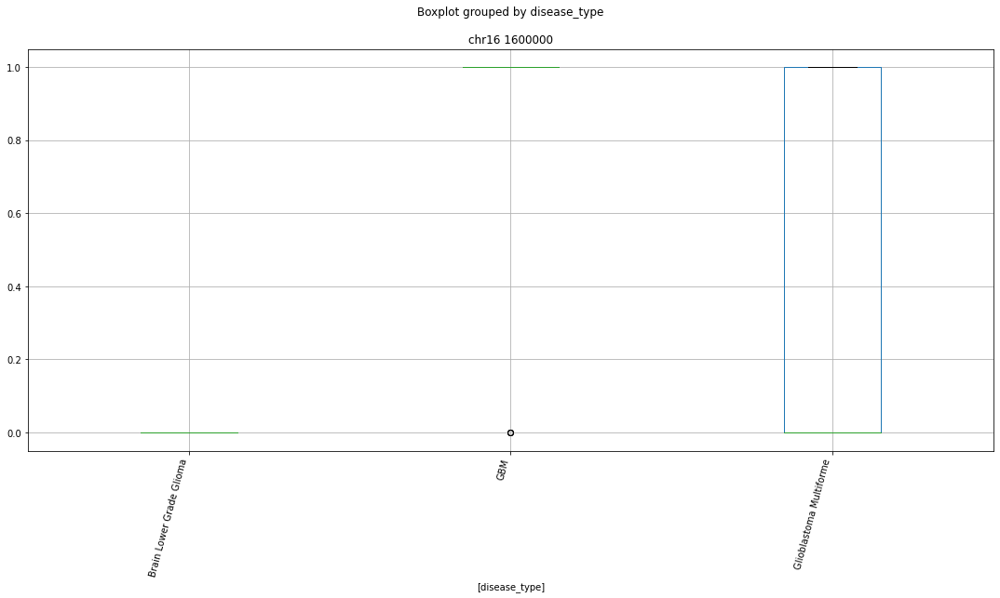

 p : 4.2462278382711956e-16  ( t : 11.730463485510949 ) :  chr12 48552000


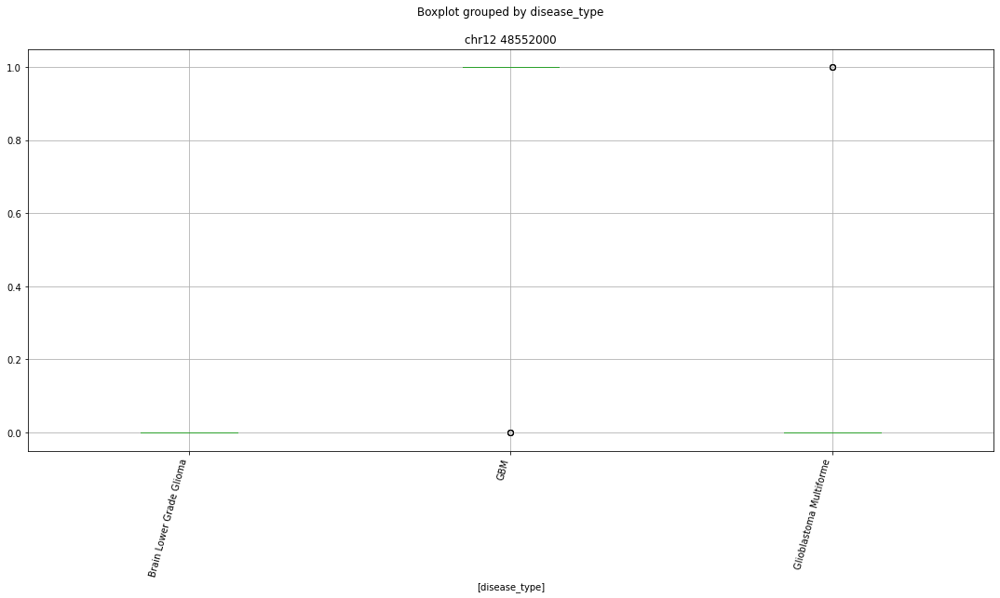

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr9 6808000


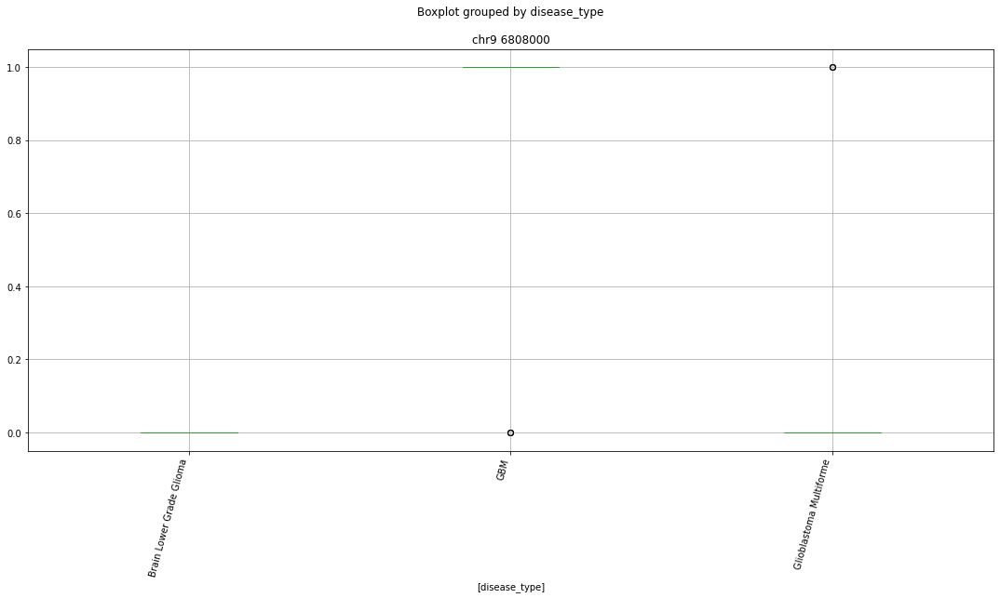

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr10 97527000


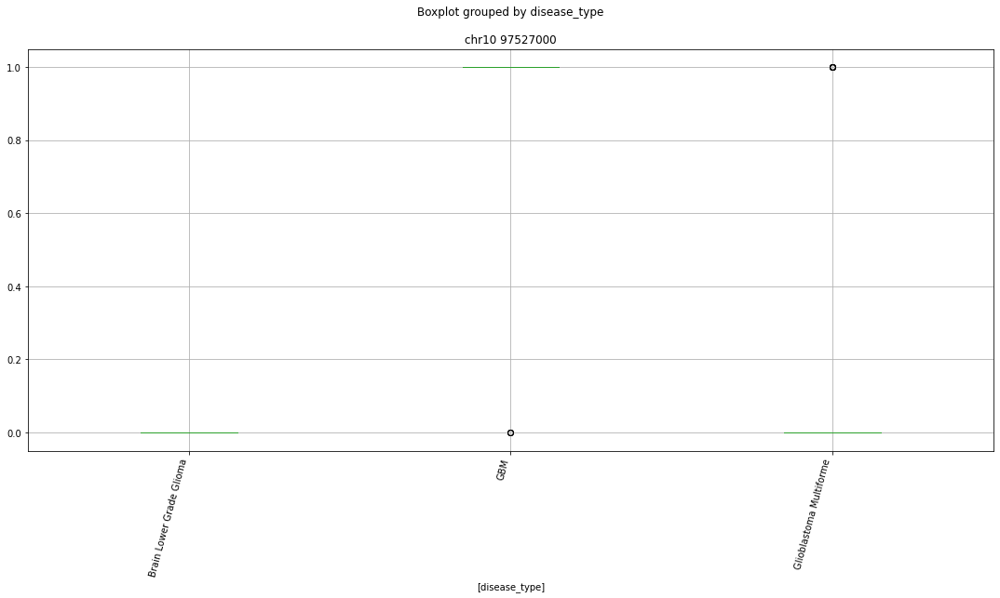

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr9 19433000


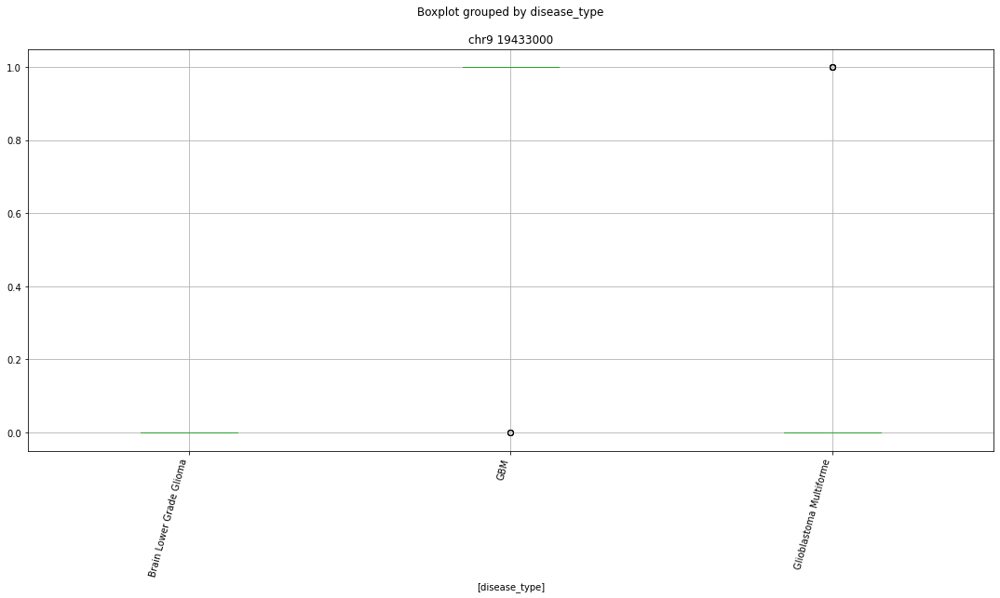

 p : 4.246227838271226e-16  ( t : 11.730463485510947 ) :  chr5 142074000


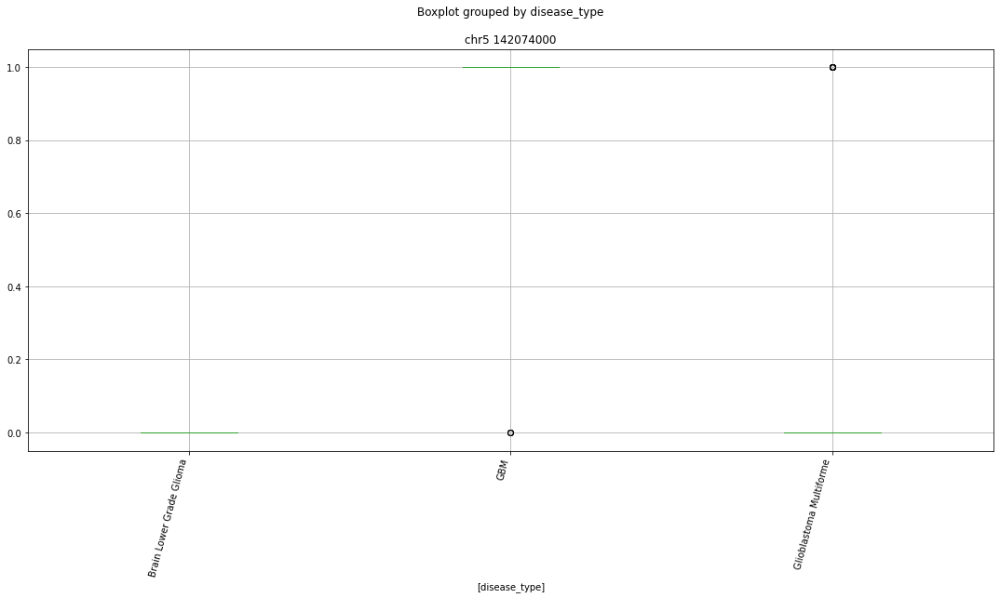

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr12 38329000


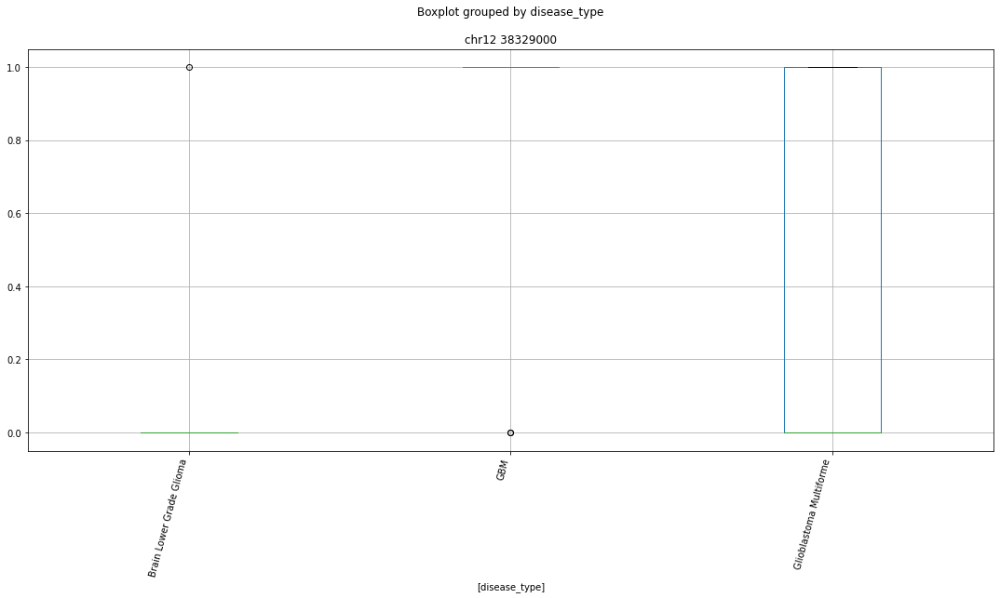

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr14 65634000


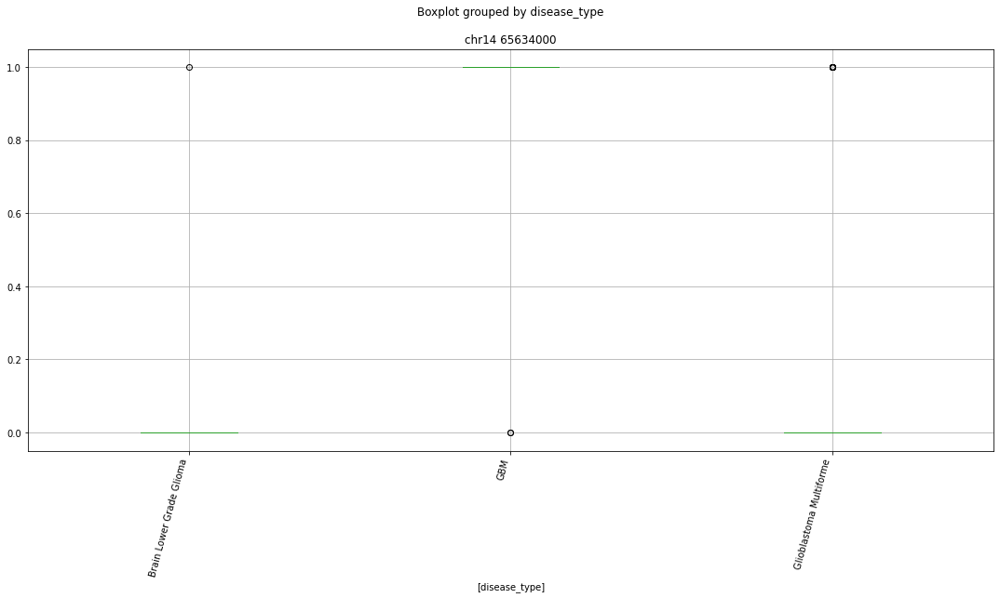

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr5 122810000


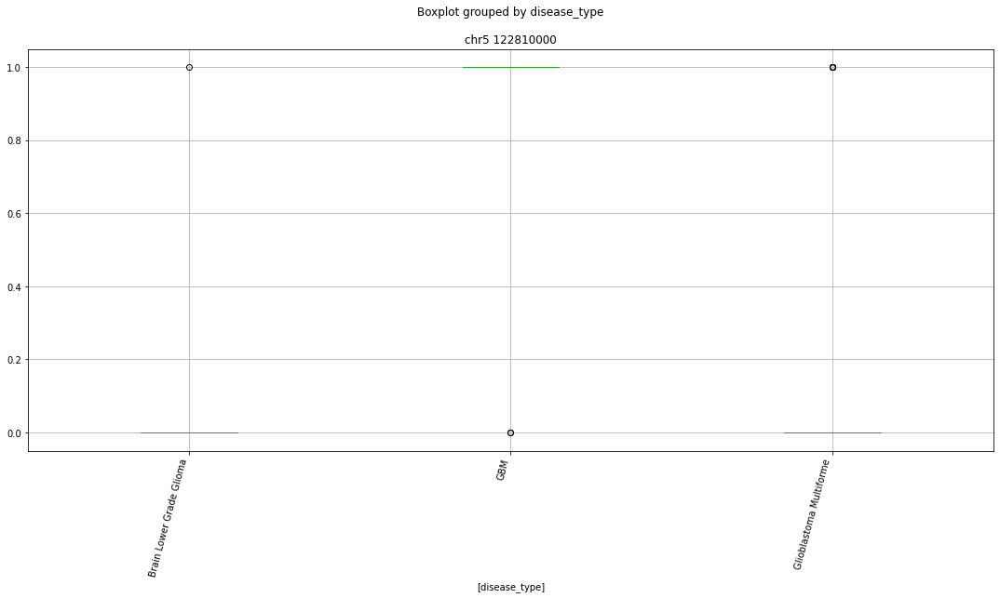

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr1 114480000


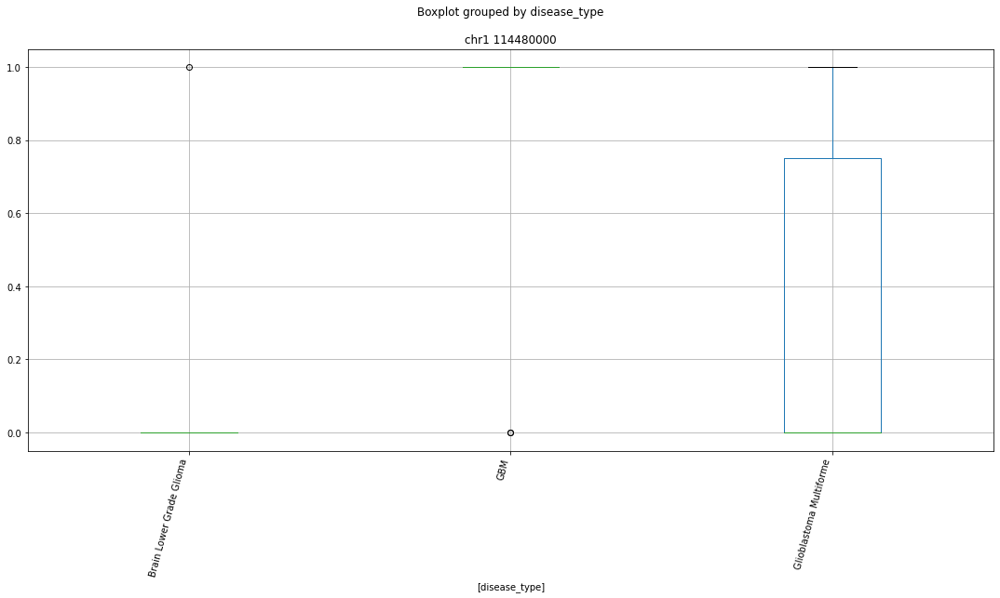

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr4 128082000


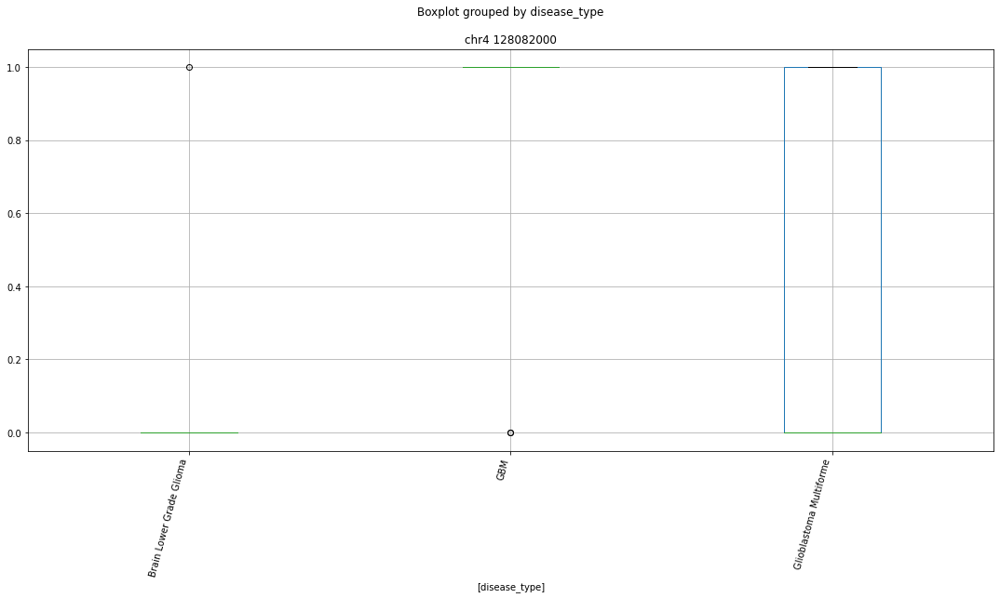

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr12 56788000


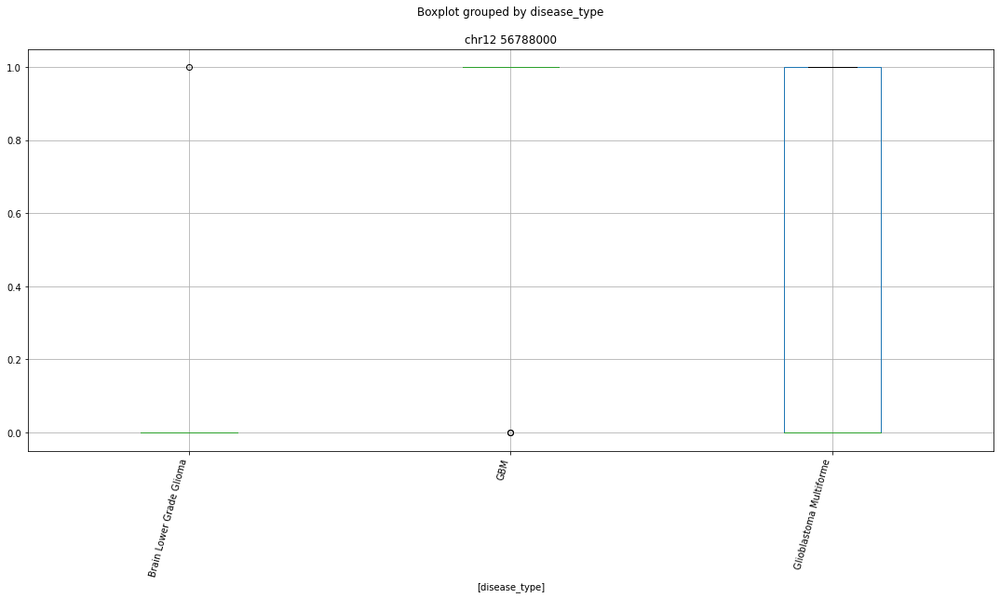

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr17 65938000


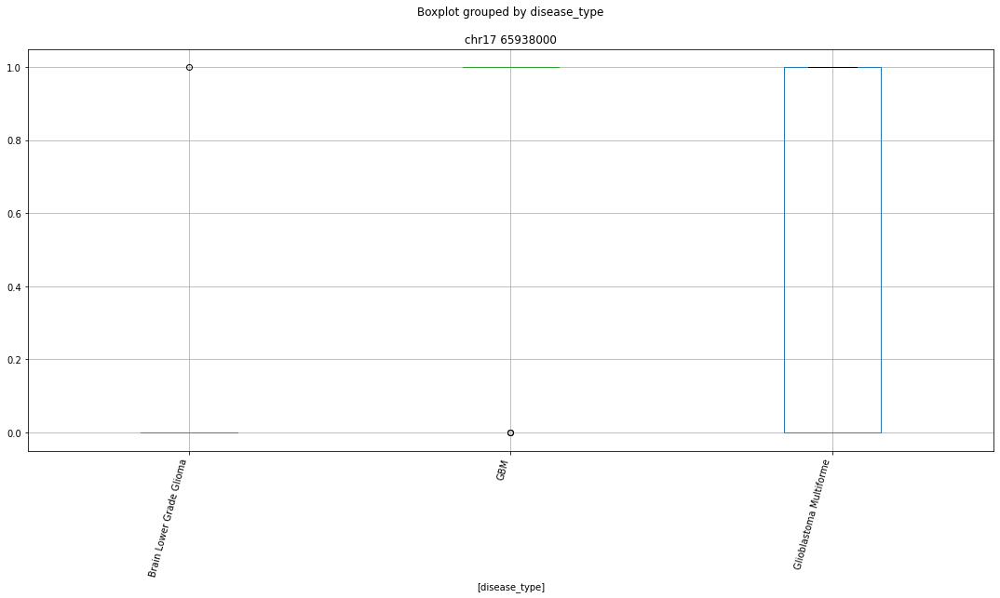

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr1 26802000


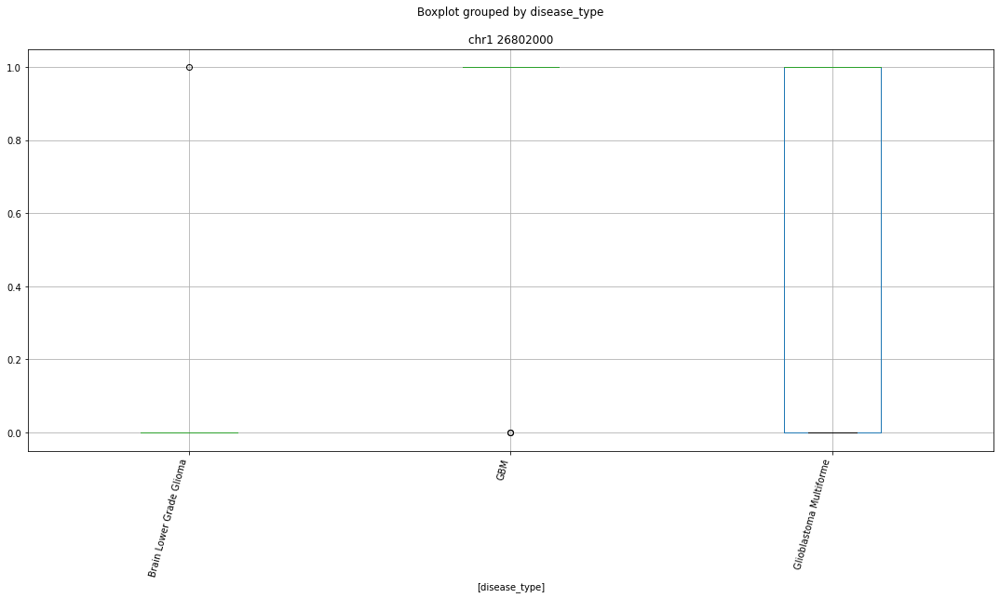

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr4 118399000


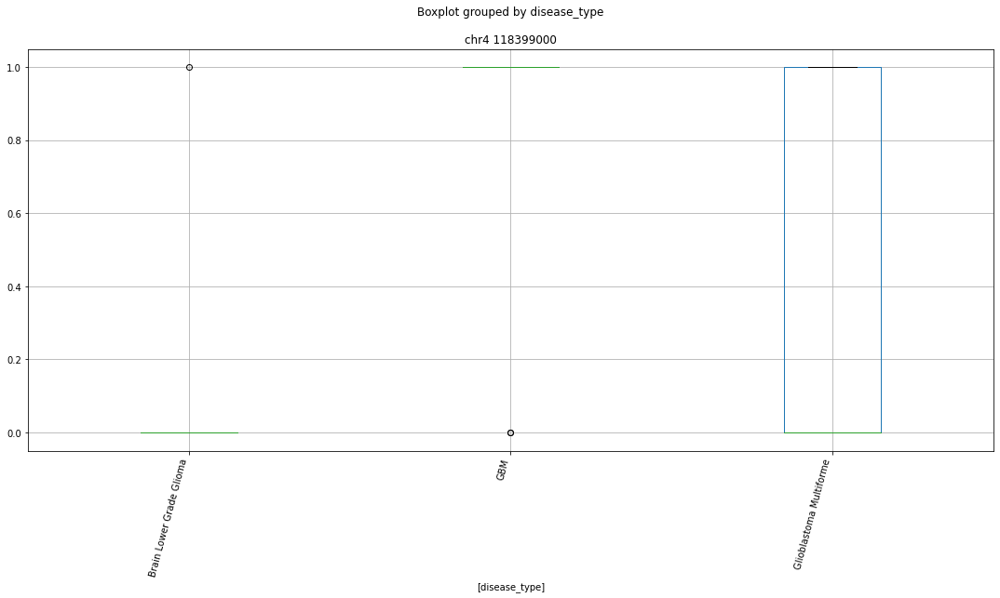

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr16 57199000


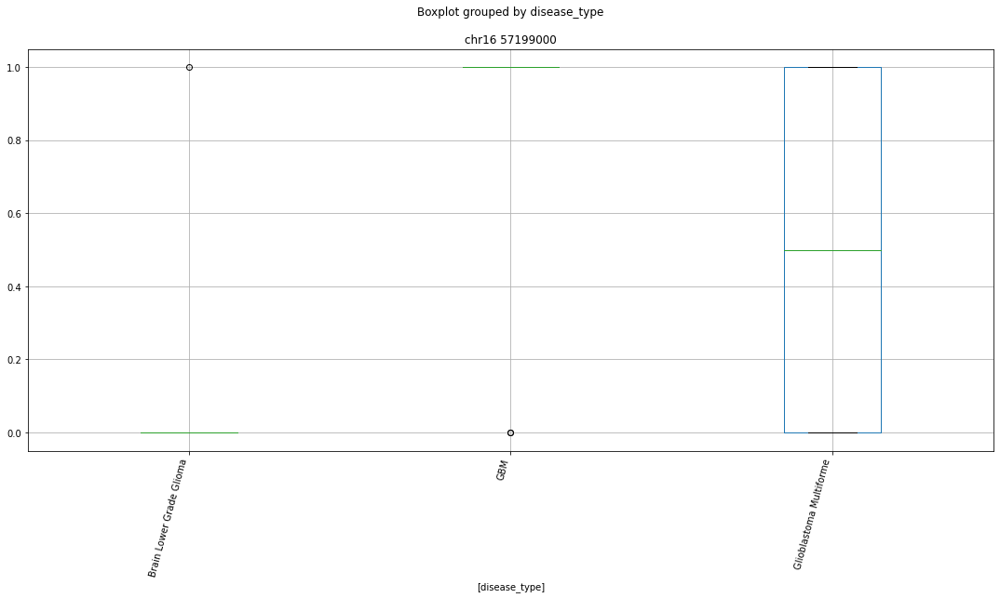

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr5 90594000


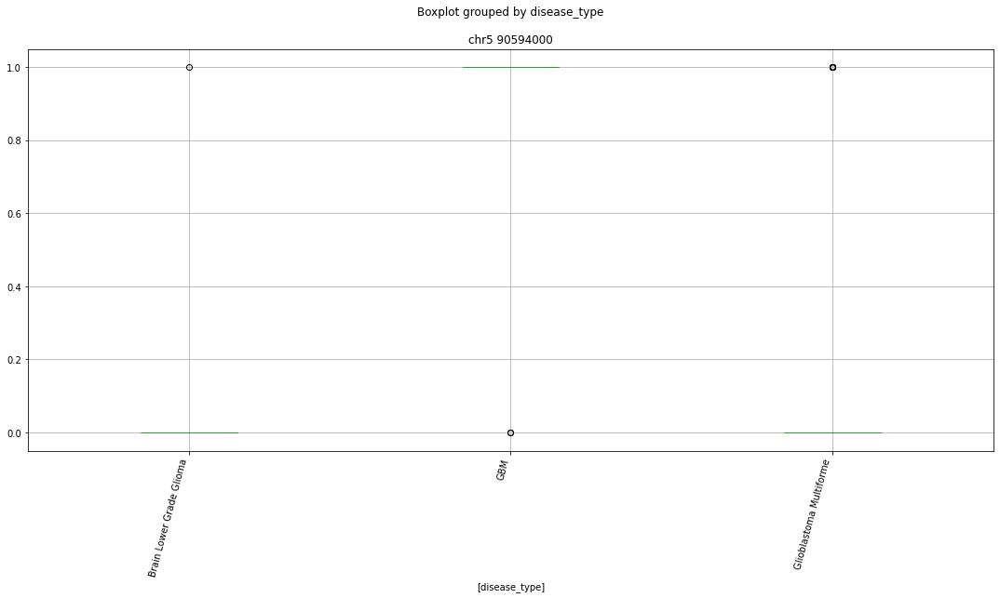

 p : 5.97829993619947e-16  ( t : 11.623581854721554 ) :  chr2 55772000


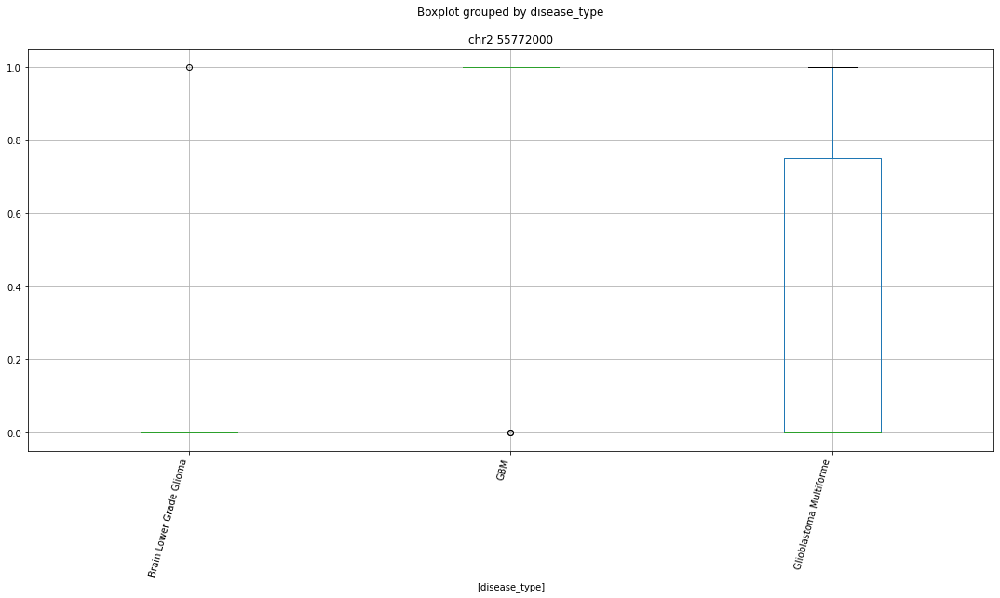

Clustermapping
['chr1 10029000' 'chr1 10427000' 'chr1 106413000' ... 'chrY 8917000'
 'disease_type' 'subject']


/Users/jakewendt/Library/Python/3.8/lib/python/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


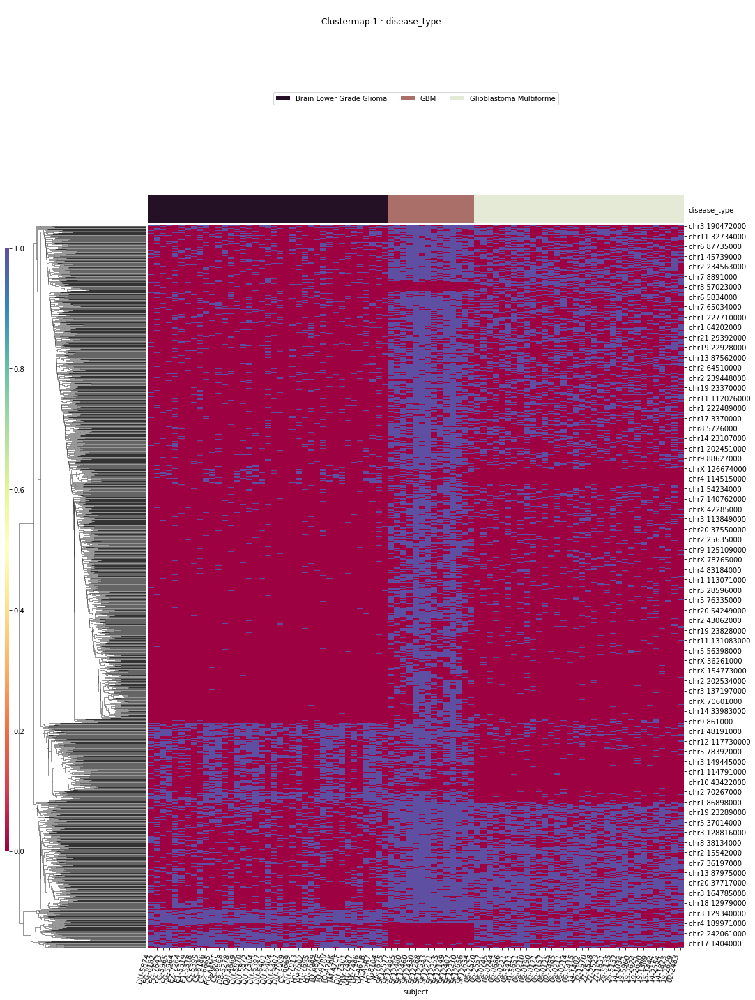

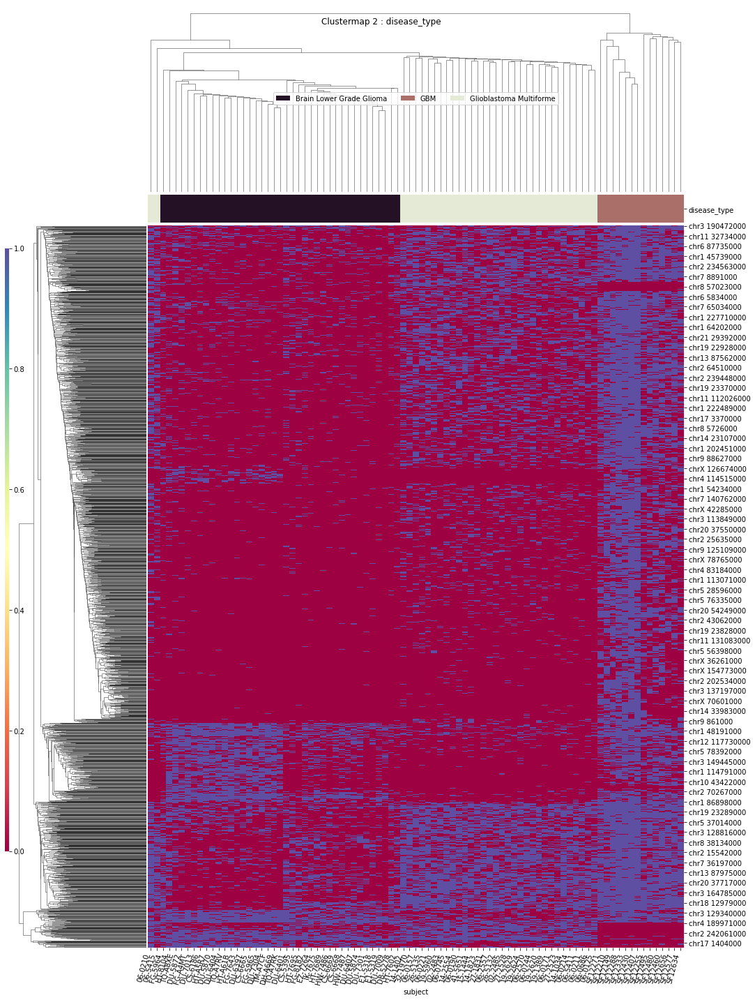

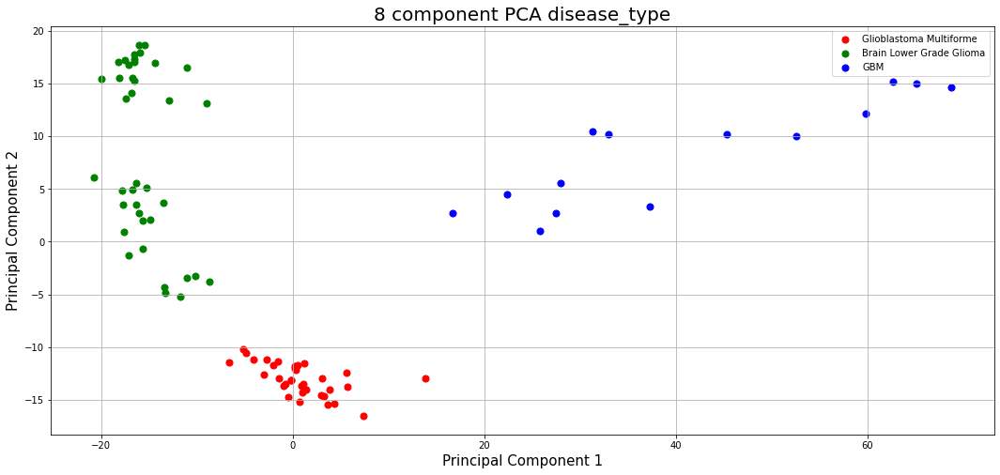

In [150]:
for column in ['disease_type']:
    print(column)
    ttests_boxplots_and_heatmaps(both_binary_df,
        both_binary_df.columns[both_binary_df.columns.str.contains("^chr")],column,box_p=1e-15,heat_p=0.001)
    

In [151]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210610 12:20:46'

---

In [152]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [153]:
pd.set_option('display.max_columns', default_max_columns)

In [154]:
pd.set_option('display.max_rows',default_max_rows)

In [155]:
pd.set_option('display.precision', default_precision)